In [1]:
#%%
import sys
#sys.path.insert(0, "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages")
import pandas as pd
import librosa
import matplotlib.pyplot as plt
import os
import numpy as np
import tqdm
from sklearn.model_selection import train_test_split
import random
import tensorflow as tf
from sklearn import preprocessing 
from sklearn.metrics import confusion_matrix, f1_score
import pickle

/home/ubuntu/.local/lib/python3.6/site-packages/numba/core/errors.py:149: UserWarning: Insufficiently recent colorama version found. Numba requires colorama >= 0.3.9
  warnings.warn(msg)
/home/ubuntu/.local/lib/python3.6/site-packages/numba/errors.py:137: UserWarning: Insufficiently recent colorama version found. Numba requires colorama >= 0.3.9
  warnings.warn(msg)


In [2]:
import itertools

In [3]:
base_dir = "/home/ubuntu/birdsong-recognition/"

In [4]:
df_train = pd.read_csv(base_dir+"train.csv")

In [5]:
birds_list = os.listdir(base_dir+'train_audio/')

In [6]:
#birds_list = birds_list[:10]

In [7]:
def get_audio_idx(clas):
    all_idx = os.listdir(base_dir+'train_audio/'+clas+"/")
    idx = [clas+"/"+j for j in all_idx]
    return(idx)

In [8]:
id_list = [get_audio_idx(i) for i in birds_list]

In [9]:
flatten = itertools.chain.from_iterable

In [10]:
id_list = list(flatten(id_list))

In [11]:
len(id_list)

21375

In [12]:
with open('./full_spectogram.pkl', 'rb') as f:
        train = pickle.load(f)
        lables = pickle.load(f)
        f.close()


In [88]:
#random.shuffle(id_list)
#train_idx = id_list[:round(num_aud*0.7)] 
#test_idx = id_list[round(num_aud*0.7):]

In [237]:
#num_classes = df_train[df_train['filename'].isin(id_sample)]['ebird_code'].unique().shape[0]

In [257]:
len(id_)

264

In [242]:
np.unique(lables).shape[0]

10

In [13]:
num_classes

264

In [244]:
random.shuffle(id_list)
id_sample = id_list[:5000]

In [13]:
num_classes = len(birds_list)

In [184]:
num_aud = len(id_list)

In [14]:
class Config(object):
    def __init__(self,
                 sampling_rate=22050, audio_duration=30, n_classes=16,
                 use_mfcc=False, n_folds=10, learning_rate=0.001, 
                 max_epochs=50, n_mfcc=128):
        self.sampling_rate = sampling_rate
        self.audio_duration = audio_duration
        self.n_classes = n_classes
        self.use_mfcc = use_mfcc
        self.n_mfcc = n_mfcc
        self.n_folds = n_folds
        self.learning_rate = learning_rate
        self.max_epochs = max_epochs

        self.audio_length = self.sampling_rate * self.audio_duration
        if self.use_mfcc:
            self.dim = (self.n_mfcc, 1 + int(np.floor(self.audio_length/512)), 1)
        else:
            self.dim = (self.audio_length, 1)

In [15]:
# %%
def audio_norm(data):
    max_data = np.max(data)
    min_data = np.min(data)
    data = (data-min_data)/(max_data-min_data+1e-6)
    return data-0.5

# %%
config = Config(sampling_rate=44100, n_classes = num_classes, audio_duration=5, n_folds=10, learning_rate=0.001, n_mfcc = 20)

def load_audio(id_list):
        cur_batch_size = len(id_list)
        X = np.empty((cur_batch_size, config.n_mfcc, 431, 1))
        input_length = config.audio_length
        mel_specs = []
        lables = []

        for i, ID in tqdm.tqdm_notebook(enumerate(id_list)):
            try:
                #print(f'{ID} started')
                data, rate = librosa.core.load(base_dir+"train_audio/"+ID, sr=44100,res_type='kaiser_fast')
                if len(data) > input_length:
                    max_offset = len(data) - input_length
                    offset = np.random.randint(max_offset)
                    data = data[offset:(input_length+offset)]
                else:
                    if input_length > len(data):
                        max_offset = input_length - len(data)
                        offset = np.random.randint(max_offset)
                    else:
                        offset = 0
                    data = np.pad(data, (offset, input_length - len(data) - offset), "constant")

                #data = audio_norm(data)[:, np.newaxis]
                #data= librosa.feature.mfcc(data, sr=config.sampling_rate, n_mfcc=config.n_mfcc)
                #data=np.expand_dims(data, axis = -1)
                #X[i,] = data
                data = librosa.feature.melspectrogram(data, n_mels=128)
                data = librosa.core.amplitude_to_db(data)
                mel_specs.append(data)

                #Load lables
                print(f'{ID} started')
                ID = ID.split("/")[-1]
                lable = df_train[df_train['filename'] == ID]['ebird_code'].to_string(index= False)
                lable = lable.lstrip()
                lables.append(lable)
                print(f'{ID} is ready, {lable}')
            except:
                continue
            
        return({'train':mel_specs , 'lables':lables})

In [16]:
# Lables

def load_lables(id_list):
    
    cur_batch_size = len(id_list)
    y = np.empty(cur_batch_size, dtype=np.dtype("a16"))

    for i, ID in enumerate(id_list):
        ID = ID.split("/")[-1]
        lable = df_train[df_train['filename'] == ID]['ebird_code'].to_string(index= False)
        lable = lable.lstrip()
        y[i] = lable
        print(f'{ID} is ready, {lable}')
    
    return(y)


In [17]:
###### Debug
'''
cur_batch_size = len(id_list)
X = np.empty((cur_batch_size, config.n_mfcc, 431, 1))
input_length = config.audio_length
mel_specs = []
data, rate = librosa.core.load(base_dir+"train_audio/"+"gnwtea/XC432032.mp3", sr=44100,res_type='kaiser_fast')
if len(data) > input_length:
    max_offset = len(data) - input_length
    offset = np.random.randint(max_offset)
    data = data[offset:(input_length+offset)]
else:
    if input_length > len(data):
        max_offset = input_length - len(data)
        offset = np.random.randint(max_offset)
    else:
        offset = 0
        data = np.pad(data, (offset, input_length - len(data) - offset), "constant")

        #data = audio_norm(data)[:, np.newaxis]
            #data= librosa.feature.mfcc(data, sr=config.sampling_rate, n_mfcc=config.n_mfcc)
            #data=np.expand_dims(data, axis = -1)
            #X[i,] = data
    data = librosa.feature.melspectrogram(data, n_mels=128)
    data = librosa.core.amplitude_to_db(data)
'''



'\ncur_batch_size = len(id_list)\nX = np.empty((cur_batch_size, config.n_mfcc, 431, 1))\ninput_length = config.audio_length\nmel_specs = []\ndata, rate = librosa.core.load(base_dir+"train_audio/"+"gnwtea/XC432032.mp3", sr=44100,res_type=\'kaiser_fast\')\nif len(data) > input_length:\n    max_offset = len(data) - input_length\n    offset = np.random.randint(max_offset)\n    data = data[offset:(input_length+offset)]\nelse:\n    if input_length > len(data):\n        max_offset = input_length - len(data)\n        offset = np.random.randint(max_offset)\n    else:\n        offset = 0\n        data = np.pad(data, (offset, input_length - len(data) - offset), "constant")\n\n        #data = audio_norm(data)[:, np.newaxis]\n            #data= librosa.feature.mfcc(data, sr=config.sampling_rate, n_mfcc=config.n_mfcc)\n            #data=np.expand_dims(data, axis = -1)\n            #X[i,] = data\n    data = librosa.feature.melspectrogram(data, n_mels=128)\n    data = librosa.core.amplitude_to_db(data

In [250]:
len(id_sample)

5000

In [17]:
# %%
data = load_audio(id_list)

/home/ubuntu/.local/lib/python3.6/site-packages/ipykernel_launcher.py:18: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC202027.mp3 started
XC202027.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC315579.mp3 started
XC315579.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC173265.mp3 started
XC173265.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC143939.mp3 started
XC143939.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC187634.mp3 started
XC187634.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC173267.mp3 started
XC173267.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC390830.mp3 started
XC390830.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC185324.mp3 started
XC185324.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC413194.mp3 started
XC413194.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC267509.mp3 started
XC267509.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC381981.mp3 started
XC381981.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC187636.mp3 started
XC187636.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC173261.mp3 started
XC173261.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC135495.mp3 started
XC135495.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC501261.mp3 started
XC501261.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC171555.mp3 started
XC171555.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC187635.mp3 started
XC187635.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC144676.mp3 started
XC144676.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC380309.mp3 started
XC380309.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC237744.mp3 started
XC237744.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC210839.mp3 started
XC210839.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC133794.mp3 started
XC133794.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC421770.mp3 started
XC421770.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC167819.mp3 started
XC167819.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC351421.mp3 started
XC351421.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC190940.mp3 started
XC190940.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC31481.mp3 started
XC31481.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC173263.mp3 started
XC173263.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC400100.mp3 started
XC400100.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC123405.mp3 started
XC123405.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC135120.mp3 started
XC135120.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC173254.mp3 started
XC173254.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC416780.mp3 started
XC416780.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC291120.mp3 started
XC291120.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC181473.mp3 started
XC181473.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC190939.mp3 started
XC190939.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC236572.mp3 started
XC236572.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC187637.mp3 started
XC187637.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC173268.mp3 started
XC173268.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC129313.mp3 started
XC129313.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC409610.mp3 started
XC409610.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC468087.mp3 started
XC468087.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC254310.mp3 started
XC254310.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC382123.mp3 started
XC382123.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC135496.mp3 started
XC135496.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC388134.mp3 started
XC388134.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC394528.mp3 started
XC394528.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC389498.mp3 started
XC389498.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC319181.mp3 started
XC319181.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC297402.mp3 started
XC297402.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC190938.mp3 started
XC190938.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC243795.mp3 started
XC243795.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC260208.mp3 started
XC260208.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC198400.mp3 started
XC198400.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC409818.mp3 started
XC409818.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC175993.mp3 started
XC175993.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC173260.mp3 started
XC173260.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC135117.mp3 started
XC135117.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC158797.mp3 started
XC158797.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC373802.mp3 started
XC373802.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC245894.mp3 started
XC245894.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC309325.mp3 started
XC309325.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC315704.mp3 started
XC315704.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC138159.mp3 started
XC138159.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC351422.mp3 started
XC351422.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC371048.mp3 started
XC371048.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC501262.mp3 started
XC501262.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC177057.mp3 started
XC177057.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC328790.mp3 started
XC328790.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC173257.mp3 started
XC173257.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC344578.mp3 started
XC344578.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC315082.mp3 started
XC315082.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC101591.mp3 started
XC101591.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC387533.mp3 started
XC387533.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC394529.mp3 started
XC394529.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC328716.mp3 started
XC328716.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC368513.mp3 started
XC368513.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC315711.mp3 started
XC315711.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC314840.mp3 started
XC314840.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC394527.mp3 started
XC394527.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC318131.mp3 started
XC318131.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC237743.mp3 started
XC237743.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC101293.mp3 started
XC101293.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC366708.mp3 started
XC366708.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC177089.mp3 started
XC177089.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC185115.mp3 started
XC185115.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC134185.mp3 started
XC134185.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC173264.mp3 started
XC173264.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC177382.mp3 started
XC177382.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC134014.mp3 started
XC134014.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC315228.mp3 started
XC315228.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC309326.mp3 started
XC309326.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC324402.mp3 started
XC324402.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC412909.mp3 started
XC412909.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC213558.mp3 started
XC213558.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC420883.mp3 started
XC420883.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC363366.mp3 started
XC363366.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC316102.mp3 started
XC316102.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC138633.mp3 started
XC138633.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btnwar/XC486860.mp3 started
XC486860.mp3 is ready, btnwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC139414.mp3 started
XC139414.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC216040.mp3 started
XC216040.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC425961.mp3 started
XC425961.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC246621.mp3 started
XC246621.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC303012.mp3 started
XC303012.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC370660.mp3 started
XC370660.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC344157.mp3 started
XC344157.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC474679.mp3 started
XC474679.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC166679.mp3 started
XC166679.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC266974.mp3 started
XC266974.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC295376.mp3 started
XC295376.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC266761.mp3 started
XC266761.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC410559.mp3 started
XC410559.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC413537.mp3 started
XC413537.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC216041.mp3 started
XC216041.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC216042.mp3 started
XC216042.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC489389.mp3 started
XC489389.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC266955.mp3 started
XC266955.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC343174.mp3 started
XC343174.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC246311.mp3 started
XC246311.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC168745.mp3 started
XC168745.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC48752.mp3 started
XC48752.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC304290.mp3 started
XC304290.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC318984.mp3 started
XC318984.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC342126.mp3 started
XC342126.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC245945.mp3 started
XC245945.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC266953.mp3 started
XC266953.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC266949.mp3 started
XC266949.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC465266.mp3 started
XC465266.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC217336.mp3 started
XC217336.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC216039.mp3 started
XC216039.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC146475.mp3 started
XC146475.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC322371.mp3 started
XC322371.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC447426.mp3 started
XC447426.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC27372.mp3 started
XC27372.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC295898.mp3 started
XC295898.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC474681.mp3 started
XC474681.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC142829.mp3 started
XC142829.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC174880.mp3 started
XC174880.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC304518.mp3 started
XC304518.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC304334.mp3 started
XC304334.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC447427.mp3 started
XC447427.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC489388.mp3 started
XC489388.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC142830.mp3 started
XC142830.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC443556.mp3 started
XC443556.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC168746.mp3 started
XC168746.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC338389.mp3 started
XC338389.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC295378.mp3 started
XC295378.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC431869.mp3 started
XC431869.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC450493.mp3 started
XC450493.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC365412.mp3 started
XC365412.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC304246.mp3 started
XC304246.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC447425.mp3 started
XC447425.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC295377.mp3 started
XC295377.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC474682.mp3 started
XC474682.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC233305.mp3 started
XC233305.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sheowl/XC439199.mp3 started
XC439199.mp3 is ready, sheowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC187257.mp3 started
XC187257.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC323555.mp3 started
XC323555.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC406107.mp3 started
XC406107.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC149731.mp3 started
XC149731.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC190130.mp3 started
XC190130.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC187266.mp3 started
XC187266.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC466797.mp3 started
XC466797.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC152876.mp3 started
XC152876.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC253400.mp3 started
XC253400.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC424302.mp3 started
XC424302.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC466756.mp3 started
XC466756.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC406220.mp3 started
XC406220.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC148719.mp3 started
XC148719.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC379002.mp3 started
XC379002.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC188823.mp3 started
XC188823.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC166092.mp3 started
XC166092.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC308702.mp3 started
XC308702.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC342386.mp3 started
XC342386.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC253384.mp3 started
XC253384.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC187263.mp3 started
XC187263.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC335697.mp3 started
XC335697.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC466762.mp3 started
XC466762.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC187230.mp3 started
XC187230.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC406333.mp3 started
XC406333.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC416334.mp3 started
XC416334.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC436091.mp3 started
XC436091.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC147532.mp3 started
XC147532.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC308703.mp3 started
XC308703.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC379001.mp3 started
XC379001.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC186352.mp3 started
XC186352.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC283368.mp3 started
XC283368.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC207802.mp3 started
XC207802.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC406106.mp3 started
XC406106.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC452797.mp3 started
XC452797.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC187259.mp3 started
XC187259.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC147531.mp3 started
XC147531.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC338165.mp3 started
XC338165.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC298453.mp3 started
XC298453.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC187265.mp3 started
XC187265.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC187262.mp3 started
XC187262.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC420267.mp3 started
XC420267.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC187236.mp3 started
XC187236.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC164228.mp3 started
XC164228.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC385581.mp3 started
XC385581.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC283359.mp3 started
XC283359.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC335696.mp3 started
XC335696.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC207794.mp3 started
XC207794.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC406219.mp3 started
XC406219.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC482209.mp3 started
XC482209.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC153864.mp3 started
XC153864.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC341004.mp3 started
XC341004.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC149074.mp3 started
XC149074.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC233263.mp3 started
XC233263.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC187264.mp3 started
XC187264.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC424301.mp3 started
XC424301.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC185866.mp3 started
XC185866.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC149732.mp3 started
XC149732.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC187233.mp3 started
XC187233.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC153178.mp3 started
XC153178.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC313106.mp3 started
XC313106.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC385507.mp3 started
XC385507.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC337959.mp3 started
XC337959.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC355418.mp3 started
XC355418.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC355416.mp3 started
XC355416.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC406334.mp3 started
XC406334.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC466761.mp3 started
XC466761.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC406332.mp3 started
XC406332.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC341120.mp3 started
XC341120.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC292094.mp3 started
XC292094.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC164253.mp3 started
XC164253.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC335703.mp3 started
XC335703.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC342368.mp3 started
XC342368.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC169521.mp3 started
XC169521.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC139910.mp3 started
XC139910.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC469536.mp3 started
XC469536.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC187235.mp3 started
XC187235.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC187258.mp3 started
XC187258.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC187231.mp3 started
XC187231.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC179591.mp3 started
XC179591.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC185863.mp3 started
XC185863.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC45549.mp3 started
XC45549.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC325933.mp3 started
XC325933.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC187261.mp3 started
XC187261.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC406335.mp3 started
XC406335.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC320744.mp3 started
XC320744.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC232915.mp3 started
XC232915.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC187260.mp3 started
XC187260.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC293863.mp3 started
XC293863.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC496713.mp3 started
XC496713.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC324866.mp3 started
XC324866.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC293859.mp3 started
XC293859.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC283358.mp3 started
XC283358.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC469574.mp3 started
XC469574.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC468600.mp3 started
XC468600.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC420227.mp3 started
XC420227.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC355417.mp3 started
XC355417.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC451485.mp3 started
XC451485.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC416764.mp3 started
XC416764.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC331332.mp3 started
XC331332.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilsni1/XC333615.mp3 started
XC333615.mp3 is ready, wilsni1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC292472.mp3 started
XC292472.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC385798.mp3 started
XC385798.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC466993.mp3 started
XC466993.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC202855.mp3 started
XC202855.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC135815.mp3 started
XC135815.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC277943.mp3 started
XC277943.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC476309.mp3 started
XC476309.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC234336.mp3 started
XC234336.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC293837.mp3 started
XC293837.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC294720.mp3 started
XC294720.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC390551.mp3 started
XC390551.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC282436.mp3 started
XC282436.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC468086.mp3 started
XC468086.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC460989.mp3 started
XC460989.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC120879.mp3 started
XC120879.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC234334.mp3 started
XC234334.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC236817.mp3 started
XC236817.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC466757.mp3 started
XC466757.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC314198.mp3 started
XC314198.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC385796.mp3 started
XC385796.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC368640.mp3 started
XC368640.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC385799.mp3 started
XC385799.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC144750.mp3 started
XC144750.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC297473.mp3 started
XC297473.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC374105.mp3 started
XC374105.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC374106.mp3 started
XC374106.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC255053.mp3 started
XC255053.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC153405.mp3 started
XC153405.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC156725.mp3 started
XC156725.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC408669.mp3 started
XC408669.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC292473.mp3 started
XC292473.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC464362.mp3 started
XC464362.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC385781.mp3 started
XC385781.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC158516.mp3 started
XC158516.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC206095.mp3 started
XC206095.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC287303.mp3 started
XC287303.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC206092.mp3 started
XC206092.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC153406.mp3 started
XC153406.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC137579.mp3 started
XC137579.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC217020.mp3 started
XC217020.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC292469.mp3 started
XC292469.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC303572.mp3 started
XC303572.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC277655.mp3 started
XC277655.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC410118.mp3 started
XC410118.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC205681.mp3 started
XC205681.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC212536.mp3 started
XC212536.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC330646.mp3 started
XC330646.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC205682.mp3 started
XC205682.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC302538.mp3 started
XC302538.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC287258.mp3 started
XC287258.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC385797.mp3 started
XC385797.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC194106.mp3 started
XC194106.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC390552.mp3 started
XC390552.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC287028.mp3 started
XC287028.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC418664.mp3 started
XC418664.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC385782.mp3 started
XC385782.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC282437.mp3 started
XC282437.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC282435.mp3 started
XC282435.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC303573.mp3 started
XC303573.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC284078.mp3 started
XC284078.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC418336.mp3 started
XC418336.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC302130.mp3 started
XC302130.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC77883.mp3 started
XC77883.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC287256.mp3 started
XC287256.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC323302.mp3 started
XC323302.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC466991.mp3 started
XC466991.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC283782.mp3 started
XC283782.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC167435.mp3 started
XC167435.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC205995.mp3 started
XC205995.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC120880.mp3 started
XC120880.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC294831.mp3 started
XC294831.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC255051.mp3 started
XC255051.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC277654.mp3 started
XC277654.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC206152.mp3 started
XC206152.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC460988.mp3 started
XC460988.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC314163.mp3 started
XC314163.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC465450.mp3 started
XC465450.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC385780.mp3 started
XC385780.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC284680.mp3 started
XC284680.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC466988.mp3 started
XC466988.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC171449.mp3 started
XC171449.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC110121.mp3 started
XC110121.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC199574.mp3 started
XC199574.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC292471.mp3 started
XC292471.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC205915.mp3 started
XC205915.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC466753.mp3 started
XC466753.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC436818.mp3 started
XC436818.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC113831.mp3 started
XC113831.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC164554.mp3 started
XC164554.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC205578.mp3 started
XC205578.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC172404.mp3 started
XC172404.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC466990.mp3 started
XC466990.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC344263.mp3 started
XC344263.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC385783.mp3 started
XC385783.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC164553.mp3 started
XC164553.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC466946.mp3 started
XC466946.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC302585.mp3 started
XC302585.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC133994.mp3 started
XC133994.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC52463.mp3 started
XC52463.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


evegro/XC175351.mp3 started
XC175351.mp3 is ready, evegro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC174177.mp3 started
XC174177.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC71727.mp3 started
XC71727.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC390742.mp3 started
XC390742.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC54143.mp3 started
XC54143.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC156402.mp3 started
XC156402.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC357624.mp3 started
XC357624.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC58486.mp3 started
XC58486.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC289721.mp3 started
XC289721.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC433420.mp3 started
XC433420.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC289686.mp3 started
XC289686.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC390741.mp3 started
XC390741.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC146292.mp3 started
XC146292.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC147478.mp3 started
XC147478.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC314295.mp3 started
XC314295.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC451058.mp3 started
XC451058.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC460741.mp3 started
XC460741.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC349765.mp3 started
XC349765.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC448089.mp3 started
XC448089.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC175269.mp3 started
XC175269.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC485989.mp3 started
XC485989.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC153660.mp3 started
XC153660.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC436046.mp3 started
XC436046.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC418315.mp3 started
XC418315.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC479919.mp3 started
XC479919.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC161844.mp3 started
XC161844.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC413135.mp3 started
XC413135.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC433422.mp3 started
XC433422.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC361074.mp3 started
XC361074.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC149507.mp3 started
XC149507.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC287083.mp3 started
XC287083.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC163617.mp3 started
XC163617.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC192531.mp3 started
XC192531.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC383952.mp3 started
XC383952.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC269100.mp3 started
XC269100.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC451059.mp3 started
XC451059.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC149511.mp3 started
XC149511.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC420816.mp3 started
XC420816.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC494459.mp3 started
XC494459.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC111146.mp3 started
XC111146.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC225681.mp3 started
XC225681.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC124758.mp3 started
XC124758.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC205553.mp3 started
XC205553.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC64545.mp3 started
XC64545.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC64546.mp3 started
XC64546.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC290154.mp3 started
XC290154.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC415433.mp3 started
XC415433.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC415415.mp3 started
XC415415.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC493604.mp3 started
XC493604.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC241106.mp3 started
XC241106.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC349724.mp3 started
XC349724.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC340534.mp3 started
XC340534.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC326527.mp3 started
XC326527.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC149513.mp3 started
XC149513.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC485994.mp3 started
XC485994.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC390743.mp3 started
XC390743.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC132410.mp3 started
XC132410.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC306663.mp3 started
XC306663.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC156728.mp3 started
XC156728.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC350298.mp3 started
XC350298.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC428431.mp3 started
XC428431.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC149508.mp3 started
XC149508.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC58485.mp3 started
XC58485.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC31051.mp3 started
XC31051.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC314297.mp3 started
XC314297.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC482330.mp3 started
XC482330.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC433421.mp3 started
XC433421.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC485988.mp3 started
XC485988.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC146291.mp3 started
XC146291.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC424640.mp3 started
XC424640.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC349766.mp3 started
XC349766.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC267475.mp3 started
XC267475.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC149503.mp3 started
XC149503.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC31052.mp3 started
XC31052.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC61518.mp3 started
XC61518.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC461531.mp3 started
XC461531.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC457516.mp3 started
XC457516.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC460780.mp3 started
XC460780.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC54147.mp3 started
XC54147.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC469661.mp3 started
XC469661.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC322805.mp3 started
XC322805.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC313470.mp3 started
XC313470.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC175268.mp3 started
XC175268.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC476262.mp3 started
XC476262.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC306664.mp3 started
XC306664.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC157763.mp3 started
XC157763.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC156471.mp3 started
XC156471.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC114075.mp3 started
XC114075.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC122828.mp3 started
XC122828.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC113384.mp3 started
XC113384.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC402958.mp3 started
XC402958.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC498954.mp3 started
XC498954.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC350297.mp3 started
XC350297.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC210966.mp3 started
XC210966.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC351542.mp3 started
XC351542.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC210949.mp3 started
XC210949.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC236648.mp3 started
XC236648.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC320703.mp3 started
XC320703.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC176342.mp3 started
XC176342.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC485993.mp3 started
XC485993.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pilwoo/XC327053.mp3 started
XC327053.mp3 is ready, pilwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC398420.mp3 started
XC398420.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC468598.mp3 started
XC468598.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC135089.mp3 started
XC135089.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC308573.mp3 started
XC308573.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC299479.mp3 started
XC299479.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC362437.mp3 started
XC362437.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC453894.mp3 started
XC453894.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC367126.mp3 started
XC367126.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC356013.mp3 started
XC356013.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC332522.mp3 started
XC332522.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC31014.mp3 started
XC31014.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC469347.mp3 started
XC469347.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC135056.mp3 started
XC135056.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC180406.mp3 started
XC180406.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC371493.mp3 started
XC371493.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC176655.mp3 started
XC176655.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC31015.mp3 started
XC31015.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC394111.mp3 started
XC394111.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC240208.mp3 started
XC240208.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC176408.mp3 started
XC176408.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC370487.mp3 started
XC370487.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC343079.mp3 started
XC343079.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC367124.mp3 started
XC367124.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC237369.mp3 started
XC237369.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC176360.mp3 started
XC176360.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC237378.mp3 started
XC237378.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC54431.mp3 started
XC54431.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC147751.mp3 started
XC147751.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC468703.mp3 started
XC468703.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC324934.mp3 started
XC324934.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC370943.mp3 started
XC370943.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC135630.mp3 started
XC135630.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC136316.mp3 started
XC136316.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC315520.mp3 started
XC315520.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC357619.mp3 started
XC357619.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC313021.mp3 started
XC313021.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC135449.mp3 started
XC135449.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC310951.mp3 started
XC310951.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC314452.mp3 started
XC314452.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC302308.mp3 started
XC302308.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC308804.mp3 started
XC308804.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC53853.mp3 started
XC53853.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC416160.mp3 started
XC416160.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC165018.mp3 started
XC165018.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC313544.mp3 started
XC313544.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC142337.mp3 started
XC142337.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC343081.mp3 started
XC343081.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC175483.mp3 started
XC175483.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC175789.mp3 started
XC175789.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC236561.mp3 started
XC236561.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC147171.mp3 started
XC147171.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC138486.mp3 started
XC138486.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC455399.mp3 started
XC455399.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC135632.mp3 started
XC135632.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC217023.mp3 started
XC217023.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC432970.mp3 started
XC432970.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC394112.mp3 started
XC394112.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC308803.mp3 started
XC308803.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC247850.mp3 started
XC247850.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC371470.mp3 started
XC371470.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC313904.mp3 started
XC313904.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC428715.mp3 started
XC428715.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC241424.mp3 started
XC241424.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC138042.mp3 started
XC138042.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC122262.mp3 started
XC122262.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC416789.mp3 started
XC416789.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC31013.mp3 started
XC31013.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC237377.mp3 started
XC237377.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC353002.mp3 started
XC353002.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC416790.mp3 started
XC416790.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC394113.mp3 started
XC394113.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC140122.mp3 started
XC140122.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC285424.mp3 started
XC285424.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC415057.mp3 started
XC415057.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC368277.mp3 started
XC368277.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC175362.mp3 started
XC175362.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC138040.mp3 started
XC138040.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC391577.mp3 started
XC391577.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC135113.mp3 started
XC135113.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC408861.mp3 started
XC408861.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC267208.mp3 started
XC267208.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC142336.mp3 started
XC142336.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC456243.mp3 started
XC456243.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC253963.mp3 started
XC253963.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC146287.mp3 started
XC146287.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC285407.mp3 started
XC285407.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC469311.mp3 started
XC469311.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC135450.mp3 started
XC135450.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC176656.mp3 started
XC176656.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC417605.mp3 started
XC417605.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC460573.mp3 started
XC460573.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC113482.mp3 started
XC113482.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC134962.mp3 started
XC134962.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC302310.mp3 started
XC302310.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC313276.mp3 started
XC313276.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC149744.mp3 started
XC149744.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC137969.mp3 started
XC137969.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC502062.mp3 started
XC502062.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC329642.mp3 started
XC329642.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


louwat/XC416788.mp3 started
XC416788.mp3 is ready, louwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC453930.mp3 started
XC453930.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC211324.mp3 started
XC211324.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC475277.mp3 started
XC475277.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC211330.mp3 started
XC211330.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC211323.mp3 started
XC211323.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC173160.mp3 started
XC173160.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC465045.mp3 started
XC465045.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC362464.mp3 started
XC362464.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC139643.mp3 started
XC139643.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC357810.mp3 started
XC357810.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC320388.mp3 started
XC320388.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC320725.mp3 started
XC320725.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC385025.mp3 started
XC385025.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC299111.mp3 started
XC299111.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC349769.mp3 started
XC349769.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC416326.mp3 started
XC416326.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC326772.mp3 started
XC326772.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC465047.mp3 started
XC465047.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC139881.mp3 started
XC139881.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC210121.mp3 started
XC210121.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC373661.mp3 started
XC373661.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC110380.mp3 started
XC110380.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC337296.mp3 started
XC337296.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC350756.mp3 started
XC350756.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC393852.mp3 started
XC393852.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC357809.mp3 started
XC357809.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC472264.mp3 started
XC472264.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC378356.mp3 started
XC378356.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC110382.mp3 started
XC110382.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC382127.mp3 started
XC382127.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC135084.mp3 started
XC135084.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC319180.mp3 started
XC319180.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC331701.mp3 started
XC331701.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC187768.mp3 started
XC187768.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC479768.mp3 started
XC479768.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC349770.mp3 started
XC349770.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC137564.mp3 started
XC137564.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC104516.mp3 started
XC104516.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC202610.mp3 started
XC202610.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC443284.mp3 started
XC443284.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC388698.mp3 started
XC388698.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC399850.mp3 started
XC399850.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC341581.mp3 started
XC341581.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC294133.mp3 started
XC294133.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC431935.mp3 started
XC431935.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC446807.mp3 started
XC446807.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC211327.mp3 started
XC211327.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC398285.mp3 started
XC398285.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC337295.mp3 started
XC337295.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC340727.mp3 started
XC340727.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC139644.mp3 started
XC139644.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC389301.mp3 started
XC389301.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC465043.mp3 started
XC465043.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC284241.mp3 started
XC284241.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC465046.mp3 started
XC465046.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC467317.mp3 started
XC467317.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC383849.mp3 started
XC383849.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC365740.mp3 started
XC365740.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC179821.mp3 started
XC179821.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC344953.mp3 started
XC344953.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC421281.mp3 started
XC421281.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC392953.mp3 started
XC392953.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC253712.mp3 started
XC253712.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC461299.mp3 started
XC461299.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC490930.mp3 started
XC490930.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC479767.mp3 started
XC479767.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC496082.mp3 started
XC496082.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC78341.mp3 started
XC78341.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC120877.mp3 started
XC120877.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC301614.mp3 started
XC301614.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC211322.mp3 started
XC211322.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC488530.mp3 started
XC488530.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC349777.mp3 started
XC349777.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC386748.mp3 started
XC386748.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC411259.mp3 started
XC411259.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC299109.mp3 started
XC299109.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC338429.mp3 started
XC338429.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC199576.mp3 started
XC199576.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC389302.mp3 started
XC389302.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC301615.mp3 started
XC301615.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC350757.mp3 started
XC350757.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC321394.mp3 started
XC321394.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC172414.mp3 started
XC172414.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC210124.mp3 started
XC210124.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC362498.mp3 started
XC362498.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC440957.mp3 started
XC440957.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC362113.mp3 started
XC362113.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC381892.mp3 started
XC381892.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC110381.mp3 started
XC110381.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC156777.mp3 started
XC156777.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC211328.mp3 started
XC211328.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC211326.mp3 started
XC211326.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC211325.mp3 started
XC211325.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC443820.mp3 started
XC443820.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC349778.mp3 started
XC349778.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC301613.mp3 started
XC301613.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC195889.mp3 started
XC195889.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC110383.mp3 started
XC110383.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC349772.mp3 started
XC349772.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebnut/XC285081.mp3 started
XC285081.mp3 is ready, rebnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC477606.mp3 started
XC477606.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC481269.mp3 started
XC481269.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC131011.mp3 started
XC131011.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC475992.mp3 started
XC475992.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC351211.mp3 started
XC351211.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC149524.mp3 started
XC149524.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC430440.mp3 started
XC430440.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC306139.mp3 started
XC306139.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC149522.mp3 started
XC149522.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC367006.mp3 started
XC367006.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC166986.mp3 started
XC166986.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC389547.mp3 started
XC389547.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC212487.mp3 started
XC212487.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC451480.mp3 started
XC451480.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC228372.mp3 started
XC228372.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC149525.mp3 started
XC149525.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC179308.mp3 started
XC179308.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC430781.mp3 started
XC430781.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC131888.mp3 started
XC131888.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC475993.mp3 started
XC475993.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC55759.mp3 started
XC55759.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC443808.mp3 started
XC443808.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC477484.mp3 started
XC477484.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC153667.mp3 started
XC153667.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC54367.mp3 started
XC54367.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC164570.mp3 started
XC164570.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC149531.mp3 started
XC149531.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC451479.mp3 started
XC451479.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC166113.mp3 started
XC166113.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC361770.mp3 started
XC361770.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC263492.mp3 started
XC263492.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC257173.mp3 started
XC257173.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC413180.mp3 started
XC413180.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC137952.mp3 started
XC137952.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC433674.mp3 started
XC433674.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC211165.mp3 started
XC211165.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC149526.mp3 started
XC149526.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC405037.mp3 started
XC405037.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC149534.mp3 started
XC149534.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC485193.mp3 started
XC485193.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC399004.mp3 started
XC399004.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC425592.mp3 started
XC425592.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC149527.mp3 started
XC149527.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC332901.mp3 started
XC332901.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC131454.mp3 started
XC131454.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC131012.mp3 started
XC131012.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC361769.mp3 started
XC361769.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC446649.mp3 started
XC446649.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC128893.mp3 started
XC128893.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC276802.mp3 started
XC276802.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC395195.mp3 started
XC395195.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC312431.mp3 started
XC312431.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC136288.mp3 started
XC136288.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC149521.mp3 started
XC149521.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC324407.mp3 started
XC324407.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC433675.mp3 started
XC433675.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC149532.mp3 started
XC149532.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC446654.mp3 started
XC446654.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC17118.mp3 started
XC17118.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC187279.mp3 started
XC187279.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC149529.mp3 started
XC149529.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC149535.mp3 started
XC149535.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC169242.mp3 started
XC169242.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC179317.mp3 started
XC179317.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC306132.mp3 started
XC306132.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC498625.mp3 started
XC498625.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC371692.mp3 started
XC371692.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC149538.mp3 started
XC149538.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC149523.mp3 started
XC149523.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC62778.mp3 started
XC62778.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC132923.mp3 started
XC132923.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC476633.mp3 started
XC476633.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reshaw/XC168959.mp3 started
XC168959.mp3 is ready, reshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC174594.mp3 started
XC174594.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC348305.mp3 started
XC348305.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC255135.mp3 started
XC255135.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC169999.mp3 started
XC169999.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC349392.mp3 started
XC349392.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC343495.mp3 started
XC343495.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC124413.mp3 started
XC124413.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC243359.mp3 started
XC243359.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC149157.mp3 started
XC149157.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC262905.mp3 started
XC262905.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC157318.mp3 started
XC157318.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC289862.mp3 started
XC289862.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC169295.mp3 started
XC169295.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC301671.mp3 started
XC301671.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC174593.mp3 started
XC174593.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC209767.mp3 started
XC209767.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC189032.mp3 started
XC189032.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC197025.mp3 started
XC197025.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC349393.mp3 started
XC349393.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC305061.mp3 started
XC305061.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC116983.mp3 started
XC116983.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC153940.mp3 started
XC153940.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC169598.mp3 started
XC169598.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC192804.mp3 started
XC192804.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC246425.mp3 started
XC246425.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC246427.mp3 started
XC246427.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC234576.mp3 started
XC234576.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC154513.mp3 started
XC154513.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC119597.mp3 started
XC119597.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC147252.mp3 started
XC147252.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC282931.mp3 started
XC282931.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC198252.mp3 started
XC198252.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC210864.mp3 started
XC210864.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC27147.mp3 started
XC27147.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC209766.mp3 started
XC209766.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC289859.mp3 started
XC289859.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC212912.mp3 started
XC212912.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC307098.mp3 started
XC307098.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC213774.mp3 started
XC213774.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC124416.mp3 started
XC124416.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC183028.mp3 started
XC183028.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC170400.mp3 started
XC170400.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC127296.mp3 started
XC127296.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC307858.mp3 started
XC307858.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC246433.mp3 started
XC246433.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC192230.mp3 started
XC192230.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC163615.mp3 started
XC163615.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC210862.mp3 started
XC210862.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC351285.mp3 started
XC351285.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC282933.mp3 started
XC282933.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC246428.mp3 started
XC246428.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC246430.mp3 started
XC246430.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC306896.mp3 started
XC306896.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC146343.mp3 started
XC146343.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC341896.mp3 started
XC341896.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC124410.mp3 started
XC124410.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC346442.mp3 started
XC346442.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC293940.mp3 started
XC293940.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC179494.mp3 started
XC179494.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC168257.mp3 started
XC168257.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC306906.mp3 started
XC306906.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC176932.mp3 started
XC176932.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC293941.mp3 started
XC293941.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC143435.mp3 started
XC143435.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC124411.mp3 started
XC124411.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC346231.mp3 started
XC346231.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC143619.mp3 started
XC143619.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC188462.mp3 started
XC188462.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC187475.mp3 started
XC187475.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC147527.mp3 started
XC147527.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC154376.mp3 started
XC154376.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC210861.mp3 started
XC210861.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC253133.mp3 started
XC253133.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC124414.mp3 started
XC124414.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC192229.mp3 started
XC192229.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC192239.mp3 started
XC192239.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC297334.mp3 started
XC297334.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC334983.mp3 started
XC334983.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC215818.mp3 started
XC215818.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC289864.mp3 started
XC289864.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC278922.mp3 started
XC278922.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC229922.mp3 started
XC229922.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC167910.mp3 started
XC167910.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC199733.mp3 started
XC199733.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC143436.mp3 started
XC143436.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC297336.mp3 started
XC297336.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC213233.mp3 started
XC213233.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC246432.mp3 started
XC246432.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC167827.mp3 started
XC167827.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC218146.mp3 started
XC218146.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC307211.mp3 started
XC307211.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC113616.mp3 started
XC113616.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC246426.mp3 started
XC246426.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC270324.mp3 started
XC270324.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC291964.mp3 started
XC291964.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC186315.mp3 started
XC186315.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC297333.mp3 started
XC297333.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC307857.mp3 started
XC307857.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC234579.mp3 started
XC234579.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comrav/XC234578.mp3 started
XC234578.mp3 is ready, comrav


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC138069.mp3 started
XC138069.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC342952.mp3 started
XC342952.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC210768.mp3 started
XC210768.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC128001.mp3 started
XC128001.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC236564.mp3 started
XC236564.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC210762.mp3 started
XC210762.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC342954.mp3 started
XC342954.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC121042.mp3 started
XC121042.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC364114.mp3 started
XC364114.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC142069.mp3 started
XC142069.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC128099.mp3 started
XC128099.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC119593.mp3 started
XC119593.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC210765.mp3 started
XC210765.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC406211.mp3 started
XC406211.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC306498.mp3 started
XC306498.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC168958.mp3 started
XC168958.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC139595.mp3 started
XC139595.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC209897.mp3 started
XC209897.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC131951.mp3 started
XC131951.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC157888.mp3 started
XC157888.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC342346.mp3 started
XC342346.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC416341.mp3 started
XC416341.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC397584.mp3 started
XC397584.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC200508.mp3 started
XC200508.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC157777.mp3 started
XC157777.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC297854.mp3 started
XC297854.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC446806.mp3 started
XC446806.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC127999.mp3 started
XC127999.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC389920.mp3 started
XC389920.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC177477.mp3 started
XC177477.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC205798.mp3 started
XC205798.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC128705.mp3 started
XC128705.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC177225.mp3 started
XC177225.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC157628.mp3 started
XC157628.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC16908.mp3 started
XC16908.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC310047.mp3 started
XC310047.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC482783.mp3 started
XC482783.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC453936.mp3 started
XC453936.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC200103.mp3 started
XC200103.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC345976.mp3 started
XC345976.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC177480.mp3 started
XC177480.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC169443.mp3 started
XC169443.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC203716.mp3 started
XC203716.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC157778.mp3 started
XC157778.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC210764.mp3 started
XC210764.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC210766.mp3 started
XC210766.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC16892.mp3 started
XC16892.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC115430.mp3 started
XC115430.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC156643.mp3 started
XC156643.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC394107.mp3 started
XC394107.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC177226.mp3 started
XC177226.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC310909.mp3 started
XC310909.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC303471.mp3 started
XC303471.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC455120.mp3 started
XC455120.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC243969.mp3 started
XC243969.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC406151.mp3 started
XC406151.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC301854.mp3 started
XC301854.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC345977.mp3 started
XC345977.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC16893.mp3 started
XC16893.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC16891.mp3 started
XC16891.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC203713.mp3 started
XC203713.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC128002.mp3 started
XC128002.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC203711.mp3 started
XC203711.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC157779.mp3 started
XC157779.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC200509.mp3 started
XC200509.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC115594.mp3 started
XC115594.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC209898.mp3 started
XC209898.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC67143.mp3 started
XC67143.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC157759.mp3 started
XC157759.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC342444.mp3 started
XC342444.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC209759.mp3 started
XC209759.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC203714.mp3 started
XC203714.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC210761.mp3 started
XC210761.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amtspa/XC92009.mp3 started
XC92009.mp3 is ready, amtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC135492.mp3 started
XC135492.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC233341.mp3 started
XC233341.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC217930.mp3 started
XC217930.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC217942.mp3 started
XC217942.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC205289.mp3 started
XC205289.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC217940.mp3 started
XC217940.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC253520.mp3 started
XC253520.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC270192.mp3 started
XC270192.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC146080.mp3 started
XC146080.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC416122.mp3 started
XC416122.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC419049.mp3 started
XC419049.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC136140.mp3 started
XC136140.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC479791.mp3 started
XC479791.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC233132.mp3 started
XC233132.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC305798.mp3 started
XC305798.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC370922.mp3 started
XC370922.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC252838.mp3 started
XC252838.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC338204.mp3 started
XC338204.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC254456.mp3 started
XC254456.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC376298.mp3 started
XC376298.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC484151.mp3 started
XC484151.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC175364.mp3 started
XC175364.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC270189.mp3 started
XC270189.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC251826.mp3 started
XC251826.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC205287.mp3 started
XC205287.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC205988.mp3 started
XC205988.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC462125.mp3 started
XC462125.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC233343.mp3 started
XC233343.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC426201.mp3 started
XC426201.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC205288.mp3 started
XC205288.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC477831.mp3 started
XC477831.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC329235.mp3 started
XC329235.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC473449.mp3 started
XC473449.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC473448.mp3 started
XC473448.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC181417.mp3 started
XC181417.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC179810.mp3 started
XC179810.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC236807.mp3 started
XC236807.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC109305.mp3 started
XC109305.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC181382.mp3 started
XC181382.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC205982.mp3 started
XC205982.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC423322.mp3 started
XC423322.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC420002.mp3 started
XC420002.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC31670.mp3 started
XC31670.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC136021.mp3 started
XC136021.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC217932.mp3 started
XC217932.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC210403.mp3 started
XC210403.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC325266.mp3 started
XC325266.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC250860.mp3 started
XC250860.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC270182.mp3 started
XC270182.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC479931.mp3 started
XC479931.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC365937.mp3 started
XC365937.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC418266.mp3 started
XC418266.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC481130.mp3 started
XC481130.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC474067.mp3 started
XC474067.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC374596.mp3 started
XC374596.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC172821.mp3 started
XC172821.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC368283.mp3 started
XC368283.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC157638.mp3 started
XC157638.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC205391.mp3 started
XC205391.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC299244.mp3 started
XC299244.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC341228.mp3 started
XC341228.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC317961.mp3 started
XC317961.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC325267.mp3 started
XC325267.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC270187.mp3 started
XC270187.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC318748.mp3 started
XC318748.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC324996.mp3 started
XC324996.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC420250.mp3 started
XC420250.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC375904.mp3 started
XC375904.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC277921.mp3 started
XC277921.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC176993.mp3 started
XC176993.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC305799.mp3 started
XC305799.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC253256.mp3 started
XC253256.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC479929.mp3 started
XC479929.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC233342.mp3 started
XC233342.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC146083.mp3 started
XC146083.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC252840.mp3 started
XC252840.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC319430.mp3 started
XC319430.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC394834.mp3 started
XC394834.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC183357.mp3 started
XC183357.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC382227.mp3 started
XC382227.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC320711.mp3 started
XC320711.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC178317.mp3 started
XC178317.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC250999.mp3 started
XC250999.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC423357.mp3 started
XC423357.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC374107.mp3 started
XC374107.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC278099.mp3 started
XC278099.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC182546.mp3 started
XC182546.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC146082.mp3 started
XC146082.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC369969.mp3 started
XC369969.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC367594.mp3 started
XC367594.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC171844.mp3 started
XC171844.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC325473.mp3 started
XC325473.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC319431.mp3 started
XC319431.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC109306.mp3 started
XC109306.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC253521.mp3 started
XC253521.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC382745.mp3 started
XC382745.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC416621.mp3 started
XC416621.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC183576.mp3 started
XC183576.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC270181.mp3 started
XC270181.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkhgro/XC372614.mp3 started
XC372614.mp3 is ready, bkhgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC475141.mp3 started
XC475141.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC358052.mp3 started
XC358052.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC311816.mp3 started
XC311816.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC473284.mp3 started
XC473284.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC243586.mp3 started
XC243586.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC416029.mp3 started
XC416029.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC418103.mp3 started
XC418103.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC272302.mp3 started
XC272302.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC467316.mp3 started
XC467316.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC404839.mp3 started
XC404839.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC133048.mp3 started
XC133048.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC78342.mp3 started
XC78342.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC471244.mp3 started
XC471244.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC388694.mp3 started
XC388694.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC216509.mp3 started
XC216509.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC51754.mp3 started
XC51754.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC31012.mp3 started
XC31012.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC358026.mp3 started
XC358026.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC237821.mp3 started
XC237821.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC216516.mp3 started
XC216516.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC308295.mp3 started
XC308295.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC301715.mp3 started
XC301715.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC388693.mp3 started
XC388693.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC362651.mp3 started
XC362651.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC133923.mp3 started
XC133923.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC461183.mp3 started
XC461183.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC313736.mp3 started
XC313736.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC171994.mp3 started
XC171994.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC312954.mp3 started
XC312954.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC464355.mp3 started
XC464355.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC129225.mp3 started
XC129225.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC461241.mp3 started
XC461241.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC312946.mp3 started
XC312946.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC325435.mp3 started
XC325435.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC418099.mp3 started
XC418099.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC370196.mp3 started
XC370196.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC476517.mp3 started
XC476517.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC99969.mp3 started
XC99969.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC463343.mp3 started
XC463343.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC418105.mp3 started
XC418105.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC217817.mp3 started
XC217817.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC202087.mp3 started
XC202087.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC313737.mp3 started
XC313737.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC217815.mp3 started
XC217815.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC301714.mp3 started
XC301714.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC31011.mp3 started
XC31011.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC138068.mp3 started
XC138068.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC418101.mp3 started
XC418101.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC217801.mp3 started
XC217801.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC358027.mp3 started
XC358027.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC325432.mp3 started
XC325432.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC305896.mp3 started
XC305896.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC360916.mp3 started
XC360916.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC51755.mp3 started
XC51755.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC461242.mp3 started
XC461242.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC475138.mp3 started
XC475138.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC171991.mp3 started
XC171991.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC305888.mp3 started
XC305888.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC217829.mp3 started
XC217829.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC166584.mp3 started
XC166584.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC217781.mp3 started
XC217781.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC306856.mp3 started
XC306856.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC134501.mp3 started
XC134501.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC237375.mp3 started
XC237375.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC416032.mp3 started
XC416032.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC445610.mp3 started
XC445610.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC217832.mp3 started
XC217832.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC407173.mp3 started
XC407173.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC236020.mp3 started
XC236020.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC217831.mp3 started
XC217831.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC31010.mp3 started
XC31010.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC309337.mp3 started
XC309337.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC138054.mp3 started
XC138054.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC217766.mp3 started
XC217766.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC243587.mp3 started
XC243587.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC306348.mp3 started
XC306348.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC416031.mp3 started
XC416031.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC167153.mp3 started
XC167153.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC171997.mp3 started
XC171997.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC218671.mp3 started
XC218671.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC125207.mp3 started
XC125207.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC318915.mp3 started
XC318915.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewoo/XC217792.mp3 started
XC217792.mp3 is ready, amewoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC54438.mp3 started
XC54438.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC161382.mp3 started
XC161382.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC45466.mp3 started
XC45466.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC51133.mp3 started
XC51133.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC54527.mp3 started
XC54527.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC452188.mp3 started
XC452188.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC192530.mp3 started
XC192530.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC263214.mp3 started
XC263214.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC109908.mp3 started
XC109908.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC295598.mp3 started
XC295598.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC485515.mp3 started
XC485515.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC389905.mp3 started
XC389905.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC179587.mp3 started
XC179587.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC176529.mp3 started
XC176529.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC321525.mp3 started
XC321525.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC287250.mp3 started
XC287250.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC54525.mp3 started
XC54525.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC51136.mp3 started
XC51136.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC394743.mp3 started
XC394743.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC109909.mp3 started
XC109909.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC113811.mp3 started
XC113811.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC349622.mp3 started
XC349622.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC322780.mp3 started
XC322780.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC394676.mp3 started
XC394676.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC51134.mp3 started
XC51134.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC306674.mp3 started
XC306674.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC452186.mp3 started
XC452186.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC454672.mp3 started
XC454672.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC54439.mp3 started
XC54439.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC45464.mp3 started
XC45464.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC54447.mp3 started
XC54447.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC45468.mp3 started
XC45468.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC391148.mp3 started
XC391148.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC477813.mp3 started
XC477813.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC349623.mp3 started
XC349623.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC320666.mp3 started
XC320666.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC51137.mp3 started
XC51137.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC109910.mp3 started
XC109910.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC451362.mp3 started
XC451362.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC320667.mp3 started
XC320667.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC435989.mp3 started
XC435989.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC452096.mp3 started
XC452096.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC54445.mp3 started
XC54445.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC451357.mp3 started
XC451357.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC257254.mp3 started
XC257254.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC370849.mp3 started
XC370849.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC161378.mp3 started
XC161378.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC318376.mp3 started
XC318376.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC152211.mp3 started
XC152211.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC54500.mp3 started
XC54500.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC320668.mp3 started
XC320668.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC211749.mp3 started
XC211749.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC435970.mp3 started
XC435970.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC444932.mp3 started
XC444932.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC295599.mp3 started
XC295599.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC283477.mp3 started
XC283477.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC51135.mp3 started
XC51135.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC452187.mp3 started
XC452187.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC283519.mp3 started
XC283519.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC240545.mp3 started
XC240545.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC451476.mp3 started
XC451476.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC246271.mp3 started
XC246271.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC287253.mp3 started
XC287253.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC305803.mp3 started
XC305803.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC452095.mp3 started
XC452095.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC162113.mp3 started
XC162113.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC345275.mp3 started
XC345275.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC45465.mp3 started
XC45465.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC173687.mp3 started
XC173687.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC215091.mp3 started
XC215091.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC161377.mp3 started
XC161377.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC451358.mp3 started
XC451358.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC115066.mp3 started
XC115066.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC205272.mp3 started
XC205272.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC287248.mp3 started
XC287248.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC384473.mp3 started
XC384473.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC459166.mp3 started
XC459166.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC313219.mp3 started
XC313219.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC452098.mp3 started
XC452098.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC287251.mp3 started
XC287251.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC469127.mp3 started
XC469127.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC109907.mp3 started
XC109907.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC45467.mp3 started
XC45467.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC161380.mp3 started
XC161380.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC113810.mp3 started
XC113810.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC287252.mp3 started
XC287252.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC452097.mp3 started
XC452097.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC320780.mp3 started
XC320780.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC394677.mp3 started
XC394677.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC384474.mp3 started
XC384474.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC216673.mp3 started
XC216673.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC320521.mp3 started
XC320521.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC287249.mp3 started
XC287249.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC152210.mp3 started
XC152210.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC384472.mp3 started
XC384472.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC479775.mp3 started
XC479775.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC181731.mp3 started
XC181731.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC215092.mp3 started
XC215092.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC479780.mp3 started
XC479780.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pibgre/XC451361.mp3 started
XC451361.mp3 is ready, pibgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC495267.mp3 started
XC495267.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC56902.mp3 started
XC56902.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC199578.mp3 started
XC199578.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC146602.mp3 started
XC146602.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC356712.mp3 started
XC356712.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC161393.mp3 started
XC161393.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC161385.mp3 started
XC161385.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC313506.mp3 started
XC313506.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC243813.mp3 started
XC243813.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC343422.mp3 started
XC343422.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC448726.mp3 started
XC448726.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC451191.mp3 started
XC451191.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC167655.mp3 started
XC167655.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC164649.mp3 started
XC164649.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC306468.mp3 started
XC306468.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC154196.mp3 started
XC154196.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC500962.mp3 started
XC500962.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC237178.mp3 started
XC237178.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC11739.mp3 started
XC11739.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC381694.mp3 started
XC381694.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC289816.mp3 started
XC289816.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC120846.mp3 started
XC120846.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC161384.mp3 started
XC161384.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC216640.mp3 started
XC216640.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC161389.mp3 started
XC161389.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC310729.mp3 started
XC310729.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC146609.mp3 started
XC146609.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC210117.mp3 started
XC210117.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC438514.mp3 started
XC438514.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC146598.mp3 started
XC146598.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC343423.mp3 started
XC343423.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC443267.mp3 started
XC443267.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC492225.mp3 started
XC492225.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC136129.mp3 started
XC136129.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC206079.mp3 started
XC206079.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC375202.mp3 started
XC375202.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC348595.mp3 started
XC348595.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC451201.mp3 started
XC451201.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC329446.mp3 started
XC329446.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC303354.mp3 started
XC303354.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC348596.mp3 started
XC348596.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC348593.mp3 started
XC348593.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC353079.mp3 started
XC353079.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC296228.mp3 started
XC296228.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC292281.mp3 started
XC292281.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC56901.mp3 started
XC56901.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC348592.mp3 started
XC348592.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC282855.mp3 started
XC282855.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC161392.mp3 started
XC161392.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC301944.mp3 started
XC301944.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC350753.mp3 started
XC350753.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC451192.mp3 started
XC451192.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC292291.mp3 started
XC292291.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC167979.mp3 started
XC167979.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC348594.mp3 started
XC348594.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC210489.mp3 started
XC210489.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC295271.mp3 started
XC295271.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC161387.mp3 started
XC161387.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC475187.mp3 started
XC475187.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pygnut/XC161390.mp3 started
XC161390.mp3 is ready, pygnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC139722.mp3 started
XC139722.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC257516.mp3 started
XC257516.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC452792.mp3 started
XC452792.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC153616.mp3 started
XC153616.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC278363.mp3 started
XC278363.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC306695.mp3 started
XC306695.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC139726.mp3 started
XC139726.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC475681.mp3 started
XC475681.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC257519.mp3 started
XC257519.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC395724.mp3 started
XC395724.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC31322.mp3 started
XC31322.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC498129.mp3 started
XC498129.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC449458.mp3 started
XC449458.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC139725.mp3 started
XC139725.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC334369.mp3 started
XC334369.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC113387.mp3 started
XC113387.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC264262.mp3 started
XC264262.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC188443.mp3 started
XC188443.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC325949.mp3 started
XC325949.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC278362.mp3 started
XC278362.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC245659.mp3 started
XC245659.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC437171.mp3 started
XC437171.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC391149.mp3 started
XC391149.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC254627.mp3 started
XC254627.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC455418.mp3 started
XC455418.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC453002.mp3 started
XC453002.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC323225.mp3 started
XC323225.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC157671.mp3 started
XC157671.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC413804.mp3 started
XC413804.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC183591.mp3 started
XC183591.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC183594.mp3 started
XC183594.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC257517.mp3 started
XC257517.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC232641.mp3 started
XC232641.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC109327.mp3 started
XC109327.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC255373.mp3 started
XC255373.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC232639.mp3 started
XC232639.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC389435.mp3 started
XC389435.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC451683.mp3 started
XC451683.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC322583.mp3 started
XC322583.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC415533.mp3 started
XC415533.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC211173.mp3 started
XC211173.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC322582.mp3 started
XC322582.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC213494.mp3 started
XC213494.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC480225.mp3 started
XC480225.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC333584.mp3 started
XC333584.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC257518.mp3 started
XC257518.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC444487.mp3 started
XC444487.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC492617.mp3 started
XC492617.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC257520.mp3 started
XC257520.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC109329.mp3 started
XC109329.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC437339.mp3 started
XC437339.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC399609.mp3 started
XC399609.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC498128.mp3 started
XC498128.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC448922.mp3 started
XC448922.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC153624.mp3 started
XC153624.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC48602.mp3 started
XC48602.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC389976.mp3 started
XC389976.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC188442.mp3 started
XC188442.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC448472.mp3 started
XC448472.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC51888.mp3 started
XC51888.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC325950.mp3 started
XC325950.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC195060.mp3 started
XC195060.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC193409.mp3 started
XC193409.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC75006.mp3 started
XC75006.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC232637.mp3 started
XC232637.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC391160.mp3 started
XC391160.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC54424.mp3 started
XC54424.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC31323.mp3 started
XC31323.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC318584.mp3 started
XC318584.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC287590.mp3 started
XC287590.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC321384.mp3 started
XC321384.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC58489.mp3 started
XC58489.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC183595.mp3 started
XC183595.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC453000.mp3 started
XC453000.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC139790.mp3 started
XC139790.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC154439.mp3 started
XC154439.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC308827.mp3 started
XC308827.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC270544.mp3 started
XC270544.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC371207.mp3 started
XC371207.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC232636.mp3 started
XC232636.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC422425.mp3 started
XC422425.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC319718.mp3 started
XC319718.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC448942.mp3 started
XC448942.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC172624.mp3 started
XC172624.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC232640.mp3 started
XC232640.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC332150.mp3 started
XC332150.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC325948.mp3 started
XC325948.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC154789.mp3 started
XC154789.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC232638.mp3 started
XC232638.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC330062.mp3 started
XC330062.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC75007.mp3 started
XC75007.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC157635.mp3 started
XC157635.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sposan/XC109328.mp3 started
XC109328.mp3 is ready, sposan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC465041.mp3 started
XC465041.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC339653.mp3 started
XC339653.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC467310.mp3 started
XC467310.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC144669.mp3 started
XC144669.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC302647.mp3 started
XC302647.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC473689.mp3 started
XC473689.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC171695.mp3 started
XC171695.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC394523.mp3 started
XC394523.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC283765.mp3 started
XC283765.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC198760.mp3 started
XC198760.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC157427.mp3 started
XC157427.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC227870.mp3 started
XC227870.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC465032.mp3 started
XC465032.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC433081.mp3 started
XC433081.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC310763.mp3 started
XC310763.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC481942.mp3 started
XC481942.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC133995.mp3 started
XC133995.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC310761.mp3 started
XC310761.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC137561.mp3 started
XC137561.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC469598.mp3 started
XC469598.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC418154.mp3 started
XC418154.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC294188.mp3 started
XC294188.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC247803.mp3 started
XC247803.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC410611.mp3 started
XC410611.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC169352.mp3 started
XC169352.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC467313.mp3 started
XC467313.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC462937.mp3 started
XC462937.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC227730.mp3 started
XC227730.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC167978.mp3 started
XC167978.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC246781.mp3 started
XC246781.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC364515.mp3 started
XC364515.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC227849.mp3 started
XC227849.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC131956.mp3 started
XC131956.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC175350.mp3 started
XC175350.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC171697.mp3 started
XC171697.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC161143.mp3 started
XC161143.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC227869.mp3 started
XC227869.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC295936.mp3 started
XC295936.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC167977.mp3 started
XC167977.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC480067.mp3 started
XC480067.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC326224.mp3 started
XC326224.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC135083.mp3 started
XC135083.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC341484.mp3 started
XC341484.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC335874.mp3 started
XC335874.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC179486.mp3 started
XC179486.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC467312.mp3 started
XC467312.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC319660.mp3 started
XC319660.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC161634.mp3 started
XC161634.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC492138.mp3 started
XC492138.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC195201.mp3 started
XC195201.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC182410.mp3 started
XC182410.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC388162.mp3 started
XC388162.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC228232.mp3 started
XC228232.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC315159.mp3 started
XC315159.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC187766.mp3 started
XC187766.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC237342.mp3 started
XC237342.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC70947.mp3 started
XC70947.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC161662.mp3 started
XC161662.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC156529.mp3 started
XC156529.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC466052.mp3 started
XC466052.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC195200.mp3 started
XC195200.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC367693.mp3 started
XC367693.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC195203.mp3 started
XC195203.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC339649.mp3 started
XC339649.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC137556.mp3 started
XC137556.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC227880.mp3 started
XC227880.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC195204.mp3 started
XC195204.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC157431.mp3 started
XC157431.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC366889.mp3 started
XC366889.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC139969.mp3 started
XC139969.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC472344.mp3 started
XC472344.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC294187.mp3 started
XC294187.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC339607.mp3 started
XC339607.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC169353.mp3 started
XC169353.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC264032.mp3 started
XC264032.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC466898.mp3 started
XC466898.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC292474.mp3 started
XC292474.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC344964.mp3 started
XC344964.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC469597.mp3 started
XC469597.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC298971.mp3 started
XC298971.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC193423.mp3 started
XC193423.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC205972.mp3 started
XC205972.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC467311.mp3 started
XC467311.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC228211.mp3 started
XC228211.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC376618.mp3 started
XC376618.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC161422.mp3 started
XC161422.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC302581.mp3 started
XC302581.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC227972.mp3 started
XC227972.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC342339.mp3 started
XC342339.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC467314.mp3 started
XC467314.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC157426.mp3 started
XC157426.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC175355.mp3 started
XC175355.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC217148.mp3 started
XC217148.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC227667.mp3 started
XC227667.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC244578.mp3 started
XC244578.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC188376.mp3 started
XC188376.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC195202.mp3 started
XC195202.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC205555.mp3 started
XC205555.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC328175.mp3 started
XC328175.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


purfin/XC488611.mp3 started
XC488611.mp3 is ready, purfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC418144.mp3 started
XC418144.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC189263.mp3 started
XC189263.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC269063.mp3 started
XC269063.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC135459.mp3 started
XC135459.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC134874.mp3 started
XC134874.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC479502.mp3 started
XC479502.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC189043.mp3 started
XC189043.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC135456.mp3 started
XC135456.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC194087.mp3 started
XC194087.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC142068.mp3 started
XC142068.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC142065.mp3 started
XC142065.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC296725.mp3 started
XC296725.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC167791.mp3 started
XC167791.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC154310.mp3 started
XC154310.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC188813.mp3 started
XC188813.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC414551.mp3 started
XC414551.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC420909.mp3 started
XC420909.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC137570.mp3 started
XC137570.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC189262.mp3 started
XC189262.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC244459.mp3 started
XC244459.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC334685.mp3 started
XC334685.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC142329.mp3 started
XC142329.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC193116.mp3 started
XC193116.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC371412.mp3 started
XC371412.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC317112.mp3 started
XC317112.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC189269.mp3 started
XC189269.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC189589.mp3 started
XC189589.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC370826.mp3 started
XC370826.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC318899.mp3 started
XC318899.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC376468.mp3 started
XC376468.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC182735.mp3 started
XC182735.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC374638.mp3 started
XC374638.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC154449.mp3 started
XC154449.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC181484.mp3 started
XC181484.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC195542.mp3 started
XC195542.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC157462.mp3 started
XC157462.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC189590.mp3 started
XC189590.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC144675.mp3 started
XC144675.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC135460.mp3 started
XC135460.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC241646.mp3 started
XC241646.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC479504.mp3 started
XC479504.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC406251.mp3 started
XC406251.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC189044.mp3 started
XC189044.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC135454.mp3 started
XC135454.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC135457.mp3 started
XC135457.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC2628.mp3 started
XC2628.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC247799.mp3 started
XC247799.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC245645.mp3 started
XC245645.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC189268.mp3 started
XC189268.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC178485.mp3 started
XC178485.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC135883.mp3 started
XC135883.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC189045.mp3 started
XC189045.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC142067.mp3 started
XC142067.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC31060.mp3 started
XC31060.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC179417.mp3 started
XC179417.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC318444.mp3 started
XC318444.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC370932.mp3 started
XC370932.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC195541.mp3 started
XC195541.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC178480.mp3 started
XC178480.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC144674.mp3 started
XC144674.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC373885.mp3 started
XC373885.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC188432.mp3 started
XC188432.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC16967.mp3 started
XC16967.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC420402.mp3 started
XC420402.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC135455.mp3 started
XC135455.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC139577.mp3 started
XC139577.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC283162.mp3 started
XC283162.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC178481.mp3 started
XC178481.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC381871.mp3 started
XC381871.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC167789.mp3 started
XC167789.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC294255.mp3 started
XC294255.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC189267.mp3 started
XC189267.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC370881.mp3 started
XC370881.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC380033.mp3 started
XC380033.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC188377.mp3 started
XC188377.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC189042.mp3 started
XC189042.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC302253.mp3 started
XC302253.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC330449.mp3 started
XC330449.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC264715.mp3 started
XC264715.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC144672.mp3 started
XC144672.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC189265.mp3 started
XC189265.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC180091.mp3 started
XC180091.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC374636.mp3 started
XC374636.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC323488.mp3 started
XC323488.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC189264.mp3 started
XC189264.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC247801.mp3 started
XC247801.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC319017.mp3 started
XC319017.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC140298.mp3 started
XC140298.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC138639.mp3 started
XC138639.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC179600.mp3 started
XC179600.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC142066.mp3 started
XC142066.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC188434.mp3 started
XC188434.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC189592.mp3 started
XC189592.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC194088.mp3 started
XC194088.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC189266.mp3 started
XC189266.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC331564.mp3 started
XC331564.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC317903.mp3 started
XC317903.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC78890.mp3 started
XC78890.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC244458.mp3 started
XC244458.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


aldfly/XC253455.mp3 started
XC253455.mp3 is ready, aldfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC319444.mp3 started
XC319444.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC150365.mp3 started
XC150365.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC452507.mp3 started
XC452507.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC324044.mp3 started
XC324044.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC324059.mp3 started
XC324059.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC382047.mp3 started
XC382047.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC452553.mp3 started
XC452553.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC382096.mp3 started
XC382096.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC196703.mp3 started
XC196703.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC490511.mp3 started
XC490511.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC184934.mp3 started
XC184934.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC448746.mp3 started
XC448746.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC324054.mp3 started
XC324054.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC418585.mp3 started
XC418585.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC179479.mp3 started
XC179479.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC400987.mp3 started
XC400987.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC495418.mp3 started
XC495418.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC488454.mp3 started
XC488454.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC298400.mp3 started
XC298400.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC434587.mp3 started
XC434587.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC359388.mp3 started
XC359388.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC350269.mp3 started
XC350269.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC497309.mp3 started
XC497309.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC469890.mp3 started
XC469890.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC359385.mp3 started
XC359385.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC466427.mp3 started
XC466427.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC351096.mp3 started
XC351096.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC394387.mp3 started
XC394387.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC324039.mp3 started
XC324039.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC437545.mp3 started
XC437545.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC359377.mp3 started
XC359377.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC281888.mp3 started
XC281888.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC349359.mp3 started
XC349359.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC452536.mp3 started
XC452536.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC304426.mp3 started
XC304426.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC241017.mp3 started
XC241017.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC488232.mp3 started
XC488232.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC436660.mp3 started
XC436660.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC393278.mp3 started
XC393278.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC384701.mp3 started
XC384701.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC436662.mp3 started
XC436662.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC381884.mp3 started
XC381884.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC191945.mp3 started
XC191945.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC359373.mp3 started
XC359373.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC384702.mp3 started
XC384702.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC166586.mp3 started
XC166586.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC371090.mp3 started
XC371090.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC167653.mp3 started
XC167653.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC394384.mp3 started
XC394384.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC359296.mp3 started
XC359296.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC11493.mp3 started
XC11493.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC314130.mp3 started
XC314130.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC359393.mp3 started
XC359393.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC285491.mp3 started
XC285491.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC466428.mp3 started
XC466428.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC359376.mp3 started
XC359376.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC359379.mp3 started
XC359379.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC196547.mp3 started
XC196547.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC451374.mp3 started
XC451374.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC165904.mp3 started
XC165904.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC132895.mp3 started
XC132895.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC247613.mp3 started
XC247613.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC381108.mp3 started
XC381108.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC360277.mp3 started
XC360277.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC493360.mp3 started
XC493360.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC289178.mp3 started
XC289178.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC173197.mp3 started
XC173197.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC466426.mp3 started
XC466426.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC384554.mp3 started
XC384554.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC253924.mp3 started
XC253924.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC284084.mp3 started
XC284084.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC348376.mp3 started
XC348376.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC493359.mp3 started
XC493359.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC448745.mp3 started
XC448745.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC140128.mp3 started
XC140128.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC349358.mp3 started
XC349358.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC488233.mp3 started
XC488233.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC451405.mp3 started
XC451405.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC324057.mp3 started
XC324057.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC324045.mp3 started
XC324045.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC146149.mp3 started
XC146149.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC360273.mp3 started
XC360273.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC373244.mp3 started
XC373244.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC166585.mp3 started
XC166585.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC466430.mp3 started
XC466430.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC393277.mp3 started
XC393277.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC360260.mp3 started
XC360260.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC140127.mp3 started
XC140127.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC435742.mp3 started
XC435742.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC493357.mp3 started
XC493357.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC475569.mp3 started
XC475569.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC495417.mp3 started
XC495417.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC404725.mp3 started
XC404725.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC495416.mp3 started
XC495416.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC491074.mp3 started
XC491074.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC279629.mp3 started
XC279629.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC176253.mp3 started
XC176253.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC324055.mp3 started
XC324055.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC383876.mp3 started
XC383876.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cacwre/XC488451.mp3 started
XC488451.mp3 is ready, cacwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC173985.mp3 started
XC173985.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC309652.mp3 started
XC309652.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC337447.mp3 started
XC337447.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC58481.mp3 started
XC58481.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC497622.mp3 started
XC497622.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC134674.mp3 started
XC134674.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC17101.mp3 started
XC17101.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC135101.mp3 started
XC135101.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC283267.mp3 started
XC283267.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC439864.mp3 started
XC439864.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC306353.mp3 started
XC306353.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC180252.mp3 started
XC180252.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC389354.mp3 started
XC389354.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC373259.mp3 started
XC373259.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC137538.mp3 started
XC137538.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC376223.mp3 started
XC376223.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC283265.mp3 started
XC283265.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC236287.mp3 started
XC236287.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC428276.mp3 started
XC428276.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC305167.mp3 started
XC305167.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC144364.mp3 started
XC144364.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC169066.mp3 started
XC169066.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC170554.mp3 started
XC170554.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC210869.mp3 started
XC210869.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC304862.mp3 started
XC304862.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC397347.mp3 started
XC397347.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC179669.mp3 started
XC179669.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC497621.mp3 started
XC497621.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC236286.mp3 started
XC236286.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC139431.mp3 started
XC139431.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC180249.mp3 started
XC180249.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC141672.mp3 started
XC141672.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC71559.mp3 started
XC71559.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC145784.mp3 started
XC145784.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC426073.mp3 started
XC426073.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC337449.mp3 started
XC337449.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC327481.mp3 started
XC327481.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC439866.mp3 started
XC439866.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC154307.mp3 started
XC154307.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC481975.mp3 started
XC481975.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC287361.mp3 started
XC287361.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC389355.mp3 started
XC389355.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC167838.mp3 started
XC167838.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC183272.mp3 started
XC183272.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC139430.mp3 started
XC139430.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC150394.mp3 started
XC150394.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC350776.mp3 started
XC350776.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC79976.mp3 started
XC79976.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC171698.mp3 started
XC171698.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC439862.mp3 started
XC439862.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC167835.mp3 started
XC167835.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC142361.mp3 started
XC142361.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC353003.mp3 started
XC353003.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC301392.mp3 started
XC301392.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC239357.mp3 started
XC239357.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC502284.mp3 started
XC502284.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC217747.mp3 started
XC217747.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC324405.mp3 started
XC324405.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC325739.mp3 started
XC325739.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC439865.mp3 started
XC439865.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC454611.mp3 started
XC454611.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC100032.mp3 started
XC100032.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC210868.mp3 started
XC210868.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC184520.mp3 started
XC184520.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC482698.mp3 started
XC482698.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC141673.mp3 started
XC141673.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC454612.mp3 started
XC454612.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC287358.mp3 started
XC287358.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC171662.mp3 started
XC171662.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC439854.mp3 started
XC439854.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC153963.mp3 started
XC153963.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC150395.mp3 started
XC150395.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC17169.mp3 started
XC17169.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC364447.mp3 started
XC364447.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC439868.mp3 started
XC439868.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC52426.mp3 started
XC52426.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC366477.mp3 started
XC366477.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC452139.mp3 started
XC452139.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC452141.mp3 started
XC452141.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC378953.mp3 started
XC378953.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC192277.mp3 started
XC192277.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC420915.mp3 started
XC420915.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC502282.mp3 started
XC502282.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC466311.mp3 started
XC466311.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC481623.mp3 started
XC481623.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC16928.mp3 started
XC16928.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC305166.mp3 started
XC305166.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC52427.mp3 started
XC52427.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC446664.mp3 started
XC446664.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC337448.mp3 started
XC337448.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC364446.mp3 started
XC364446.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC498959.mp3 started
XC498959.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC367784.mp3 started
XC367784.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC210872.mp3 started
XC210872.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC502283.mp3 started
XC502283.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easblu/XC283266.mp3 started
XC283266.mp3 is ready, easblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254878.mp3 started
XC254878.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254898.mp3 started
XC254898.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC381105.mp3 started
XC381105.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC470513.mp3 started
XC470513.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254791.mp3 started
XC254791.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC381090.mp3 started
XC381090.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC261426.mp3 started
XC261426.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254899.mp3 started
XC254899.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254794.mp3 started
XC254794.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC463262.mp3 started
XC463262.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC470514.mp3 started
XC470514.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC318144.mp3 started
XC318144.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254900.mp3 started
XC254900.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254872.mp3 started
XC254872.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC163986.mp3 started
XC163986.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC382105.mp3 started
XC382105.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254910.mp3 started
XC254910.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC410218.mp3 started
XC410218.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254799.mp3 started
XC254799.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC324289.mp3 started
XC324289.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC383588.mp3 started
XC383588.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254886.mp3 started
XC254886.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC324295.mp3 started
XC324295.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC324290.mp3 started
XC324290.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254876.mp3 started
XC254876.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC324296.mp3 started
XC324296.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC473379.mp3 started
XC473379.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254873.mp3 started
XC254873.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254795.mp3 started
XC254795.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC463261.mp3 started
XC463261.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC465656.mp3 started
XC465656.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254879.mp3 started
XC254879.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254888.mp3 started
XC254888.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC179226.mp3 started
XC179226.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC324298.mp3 started
XC324298.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC371820.mp3 started
XC371820.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC324297.mp3 started
XC324297.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC163987.mp3 started
XC163987.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC475333.mp3 started
XC475333.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC487938.mp3 started
XC487938.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC470511.mp3 started
XC470511.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC163983.mp3 started
XC163983.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC410215.mp3 started
XC410215.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254882.mp3 started
XC254882.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC324293.mp3 started
XC324293.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC163982.mp3 started
XC163982.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254796.mp3 started
XC254796.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254806.mp3 started
XC254806.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC410216.mp3 started
XC410216.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC448268.mp3 started
XC448268.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254804.mp3 started
XC254804.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254789.mp3 started
XC254789.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254893.mp3 started
XC254893.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC453114.mp3 started
XC453114.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC27725.mp3 started
XC27725.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC163984.mp3 started
XC163984.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC487939.mp3 started
XC487939.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254880.mp3 started
XC254880.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC188770.mp3 started
XC188770.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC324291.mp3 started
XC324291.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254896.mp3 started
XC254896.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC470512.mp3 started
XC470512.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC350994.mp3 started
XC350994.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC144579.mp3 started
XC144579.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254803.mp3 started
XC254803.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC383163.mp3 started
XC383163.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254807.mp3 started
XC254807.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254871.mp3 started
XC254871.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254908.mp3 started
XC254908.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC167892.mp3 started
XC167892.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC462256.mp3 started
XC462256.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC504445.mp3 started
XC504445.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC353304.mp3 started
XC353304.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254875.mp3 started
XC254875.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC353100.mp3 started
XC353100.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254874.mp3 started
XC254874.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC225338.mp3 started
XC225338.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254895.mp3 started
XC254895.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC481938.mp3 started
XC481938.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC122460.mp3 started
XC122460.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254901.mp3 started
XC254901.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254801.mp3 started
XC254801.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC141476.mp3 started
XC141476.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254797.mp3 started
XC254797.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254897.mp3 started
XC254897.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254805.mp3 started
XC254805.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC306346.mp3 started
XC306346.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC254892.mp3 started
XC254892.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC141475.mp3 started
XC141475.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greroa/XC163985.mp3 started
XC163985.mp3 is ready, greroa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC141320.mp3 started
XC141320.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC315610.mp3 started
XC315610.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC368402.mp3 started
XC368402.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC130058.mp3 started
XC130058.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC184876.mp3 started
XC184876.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC370240.mp3 started
XC370240.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC127371.mp3 started
XC127371.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC237517.mp3 started
XC237517.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC315750.mp3 started
XC315750.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC361329.mp3 started
XC361329.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC141316.mp3 started
XC141316.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC417864.mp3 started
XC417864.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC172859.mp3 started
XC172859.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC310044.mp3 started
XC310044.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC314525.mp3 started
XC314525.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC184879.mp3 started
XC184879.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC315463.mp3 started
XC315463.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC149911.mp3 started
XC149911.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC419704.mp3 started
XC419704.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC256198.mp3 started
XC256198.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC417863.mp3 started
XC417863.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC292673.mp3 started
XC292673.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC298966.mp3 started
XC298966.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC184881.mp3 started
XC184881.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC256110.mp3 started
XC256110.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC338164.mp3 started
XC338164.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC184882.mp3 started
XC184882.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC172860.mp3 started
XC172860.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC345022.mp3 started
XC345022.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC212025.mp3 started
XC212025.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC310046.mp3 started
XC310046.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC133167.mp3 started
XC133167.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC451067.mp3 started
XC451067.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC233158.mp3 started
XC233158.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC310045.mp3 started
XC310045.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC480763.mp3 started
XC480763.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC320057.mp3 started
XC320057.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC466915.mp3 started
XC466915.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC417855.mp3 started
XC417855.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC298363.mp3 started
XC298363.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC378969.mp3 started
XC378969.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC376418.mp3 started
XC376418.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC368194.mp3 started
XC368194.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amebit/XC362480.mp3 started
XC362480.mp3 is ready, amebit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC476272.mp3 started
XC476272.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC416782.mp3 started
XC416782.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC486855.mp3 started
XC486855.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC416794.mp3 started
XC416794.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC101292.mp3 started
XC101292.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC413334.mp3 started
XC413334.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC189414.mp3 started
XC189414.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC179959.mp3 started
XC179959.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC313870.mp3 started
XC313870.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC168795.mp3 started
XC168795.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC368401.mp3 started
XC368401.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC138093.mp3 started
XC138093.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC486856.mp3 started
XC486856.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC198399.mp3 started
XC198399.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC130499.mp3 started
XC130499.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC498161.mp3 started
XC498161.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC143748.mp3 started
XC143748.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC150220.mp3 started
XC150220.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC502311.mp3 started
XC502311.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC415444.mp3 started
XC415444.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC177836.mp3 started
XC177836.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC413184.mp3 started
XC413184.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC315204.mp3 started
XC315204.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC244526.mp3 started
XC244526.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC393130.mp3 started
XC393130.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC244525.mp3 started
XC244525.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC131879.mp3 started
XC131879.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC418093.mp3 started
XC418093.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC144696.mp3 started
XC144696.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC313762.mp3 started
XC313762.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC179841.mp3 started
XC179841.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC172902.mp3 started
XC172902.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC500354.mp3 started
XC500354.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC451721.mp3 started
XC451721.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC500350.mp3 started
XC500350.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC418092.mp3 started
XC418092.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC320578.mp3 started
XC320578.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC137042.mp3 started
XC137042.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC130500.mp3 started
XC130500.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC134100.mp3 started
XC134100.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC141213.mp3 started
XC141213.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC500351.mp3 started
XC500351.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC137040.mp3 started
XC137040.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC470277.mp3 started
XC470277.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC179178.mp3 started
XC179178.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC177379.mp3 started
XC177379.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC169069.mp3 started
XC169069.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC141214.mp3 started
XC141214.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC137043.mp3 started
XC137043.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC183675.mp3 started
XC183675.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC315314.mp3 started
XC315314.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC137044.mp3 started
XC137044.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC137045.mp3 started
XC137045.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC179845.mp3 started
XC179845.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC497796.mp3 started
XC497796.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC206012.mp3 started
XC206012.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC179717.mp3 started
XC179717.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC472332.mp3 started
XC472332.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC135110.mp3 started
XC135110.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC172900.mp3 started
XC172900.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC244530.mp3 started
XC244530.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC137041.mp3 started
XC137041.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC188511.mp3 started
XC188511.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC309322.mp3 started
XC309322.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC422147.mp3 started
XC422147.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC194885.mp3 started
XC194885.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC309889.mp3 started
XC309889.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC318808.mp3 started
XC318808.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC141412.mp3 started
XC141412.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC167817.mp3 started
XC167817.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC189079.mp3 started
XC189079.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC482493.mp3 started
XC482493.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC168796.mp3 started
XC168796.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bawwar/XC189413.mp3 started
XC189413.mp3 is ready, bawwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC448650.mp3 started
XC448650.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC201284.mp3 started
XC201284.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC474377.mp3 started
XC474377.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC323409.mp3 started
XC323409.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC340592.mp3 started
XC340592.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC452705.mp3 started
XC452705.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC385576.mp3 started
XC385576.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC234350.mp3 started
XC234350.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC356902.mp3 started
XC356902.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC336824.mp3 started
XC336824.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC424347.mp3 started
XC424347.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC456603.mp3 started
XC456603.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC299272.mp3 started
XC299272.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC340591.mp3 started
XC340591.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC203803.mp3 started
XC203803.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC139899.mp3 started
XC139899.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC26959.mp3 started
XC26959.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC195653.mp3 started
XC195653.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC364458.mp3 started
XC364458.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC448649.mp3 started
XC448649.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC364912.mp3 started
XC364912.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC412761.mp3 started
XC412761.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC436359.mp3 started
XC436359.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC131693.mp3 started
XC131693.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC211352.mp3 started
XC211352.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC116538.mp3 started
XC116538.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC368421.mp3 started
XC368421.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC441861.mp3 started
XC441861.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC163369.mp3 started
XC163369.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC441670.mp3 started
XC441670.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC433981.mp3 started
XC433981.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC163368.mp3 started
XC163368.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC215121.mp3 started
XC215121.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC463290.mp3 started
XC463290.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC396295.mp3 started
XC396295.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC52464.mp3 started
XC52464.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC182414.mp3 started
XC182414.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC209951.mp3 started
XC209951.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC356958.mp3 started
XC356958.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC450658.mp3 started
XC450658.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC207391.mp3 started
XC207391.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC387764.mp3 started
XC387764.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC368413.mp3 started
XC368413.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC368412.mp3 started
XC368412.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC412760.mp3 started
XC412760.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC474376.mp3 started
XC474376.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC412762.mp3 started
XC412762.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC109629.mp3 started
XC109629.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC424359.mp3 started
XC424359.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC319009.mp3 started
XC319009.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC323621.mp3 started
XC323621.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC476092.mp3 started
XC476092.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC433161.mp3 started
XC433161.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC132960.mp3 started
XC132960.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC234813.mp3 started
XC234813.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC26960.mp3 started
XC26960.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC497856.mp3 started
XC497856.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC323618.mp3 started
XC323618.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC198954.mp3 started
XC198954.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC201978.mp3 started
XC201978.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC433812.mp3 started
XC433812.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC484631.mp3 started
XC484631.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC359036.mp3 started
XC359036.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC406803.mp3 started
XC406803.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC203805.mp3 started
XC203805.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC406804.mp3 started
XC406804.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC135261.mp3 started
XC135261.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC120444.mp3 started
XC120444.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC412759.mp3 started
XC412759.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC313573.mp3 started
XC313573.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC452685.mp3 started
XC452685.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC417861.mp3 started
XC417861.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC287946.mp3 started
XC287946.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC469884.mp3 started
XC469884.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC182283.mp3 started
XC182283.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC184497.mp3 started
XC184497.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC284792.mp3 started
XC284792.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC297470.mp3 started
XC297470.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC198953.mp3 started
XC198953.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC470564.mp3 started
XC470564.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC412758.mp3 started
XC412758.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC284781.mp3 started
XC284781.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC393837.mp3 started
XC393837.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC131892.mp3 started
XC131892.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC120436.mp3 started
XC120436.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC474375.mp3 started
XC474375.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC116536.mp3 started
XC116536.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC180133.mp3 started
XC180133.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC385138.mp3 started
XC385138.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC210379.mp3 started
XC210379.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC357526.mp3 started
XC357526.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC433000.mp3 started
XC433000.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC310766.mp3 started
XC310766.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC452706.mp3 started
XC452706.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC163367.mp3 started
XC163367.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC494842.mp3 started
XC494842.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC328189.mp3 started
XC328189.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC131652.mp3 started
XC131652.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC496211.mp3 started
XC496211.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gadwal/XC369713.mp3 started
XC369713.mp3 is ready, gadwal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC375612.mp3 started
XC375612.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC302417.mp3 started
XC302417.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC417986.mp3 started
XC417986.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC380303.mp3 started
XC380303.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC381598.mp3 started
XC381598.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC478828.mp3 started
XC478828.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC371466.mp3 started
XC371466.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC152475.mp3 started
XC152475.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC421777.mp3 started
XC421777.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC205989.mp3 started
XC205989.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC375051.mp3 started
XC375051.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC112500.mp3 started
XC112500.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC187438.mp3 started
XC187438.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC179638.mp3 started
XC179638.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC141538.mp3 started
XC141538.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC136048.mp3 started
XC136048.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC189295.mp3 started
XC189295.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC190134.mp3 started
XC190134.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC322509.mp3 started
XC322509.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC323248.mp3 started
XC323248.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC177349.mp3 started
XC177349.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC184870.mp3 started
XC184870.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC293439.mp3 started
XC293439.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC310839.mp3 started
XC310839.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC381740.mp3 started
XC381740.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC247830.mp3 started
XC247830.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC189412.mp3 started
XC189412.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC139569.mp3 started
XC139569.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC130989.mp3 started
XC130989.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC163777.mp3 started
XC163777.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC418308.mp3 started
XC418308.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC324883.mp3 started
XC324883.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC241104.mp3 started
XC241104.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC368762.mp3 started
XC368762.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC246974.mp3 started
XC246974.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC477000.mp3 started
XC477000.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC137792.mp3 started
XC137792.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC120863.mp3 started
XC120863.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC173823.mp3 started
XC173823.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC421305.mp3 started
XC421305.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC213566.mp3 started
XC213566.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC177773.mp3 started
XC177773.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC319706.mp3 started
XC319706.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC184154.mp3 started
XC184154.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC314882.mp3 started
XC314882.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC188451.mp3 started
XC188451.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC134099.mp3 started
XC134099.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC243578.mp3 started
XC243578.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC253544.mp3 started
XC253544.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC318490.mp3 started
XC318490.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC500660.mp3 started
XC500660.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC428280.mp3 started
XC428280.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC375055.mp3 started
XC375055.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC394758.mp3 started
XC394758.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC253547.mp3 started
XC253547.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC190133.mp3 started
XC190133.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC252572.mp3 started
XC252572.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC374571.mp3 started
XC374571.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC412041.mp3 started
XC412041.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC382126.mp3 started
XC382126.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC180330.mp3 started
XC180330.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC324882.mp3 started
XC324882.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC482569.mp3 started
XC482569.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC64373.mp3 started
XC64373.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC193425.mp3 started
XC193425.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC185285.mp3 started
XC185285.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC375868.mp3 started
XC375868.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC142593.mp3 started
XC142593.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC294257.mp3 started
XC294257.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC144678.mp3 started
XC144678.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC375275.mp3 started
XC375275.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC321391.mp3 started
XC321391.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC302589.mp3 started
XC302589.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC369875.mp3 started
XC369875.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC416796.mp3 started
XC416796.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC394759.mp3 started
XC394759.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC205992.mp3 started
XC205992.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC190135.mp3 started
XC190135.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC428182.mp3 started
XC428182.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC215993.mp3 started
XC215993.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC421874.mp3 started
XC421874.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC31349.mp3 started
XC31349.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC17176.mp3 started
XC17176.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC176354.mp3 started
XC176354.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC179656.mp3 started
XC179656.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC499553.mp3 started
XC499553.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC322758.mp3 started
XC322758.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC179588.mp3 started
XC179588.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC78885.mp3 started
XC78885.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC189296.mp3 started
XC189296.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC478436.mp3 started
XC478436.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC130990.mp3 started
XC130990.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC325531.mp3 started
XC325531.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC345568.mp3 started
XC345568.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC144025.mp3 started
XC144025.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC327668.mp3 started
XC327668.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC253543.mp3 started
XC253543.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC244570.mp3 started
XC244570.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC486531.mp3 started
XC486531.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


reevir1/XC145841.mp3 started
XC145841.mp3 is ready, reevir1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC487832.mp3 started
XC487832.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC181785.mp3 started
XC181785.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC142649.mp3 started
XC142649.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC370790.mp3 started
XC370790.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC447360.mp3 started
XC447360.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC247300.mp3 started
XC247300.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC314933.mp3 started
XC314933.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC430811.mp3 started
XC430811.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC140283.mp3 started
XC140283.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC269737.mp3 started
XC269737.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC294242.mp3 started
XC294242.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC485817.mp3 started
XC485817.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC371758.mp3 started
XC371758.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC317472.mp3 started
XC317472.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC183802.mp3 started
XC183802.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC443764.mp3 started
XC443764.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC279142.mp3 started
XC279142.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC233346.mp3 started
XC233346.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC380736.mp3 started
XC380736.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC183801.mp3 started
XC183801.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC27277.mp3 started
XC27277.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC299501.mp3 started
XC299501.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC139144.mp3 started
XC139144.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC423997.mp3 started
XC423997.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC304931.mp3 started
XC304931.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC304789.mp3 started
XC304789.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC304790.mp3 started
XC304790.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC464530.mp3 started
XC464530.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC184627.mp3 started
XC184627.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC325093.mp3 started
XC325093.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC319022.mp3 started
XC319022.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC304879.mp3 started
XC304879.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC190659.mp3 started
XC190659.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC246857.mp3 started
XC246857.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC253718.mp3 started
XC253718.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC199326.mp3 started
XC199326.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC184471.mp3 started
XC184471.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC184443.mp3 started
XC184443.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC294348.mp3 started
XC294348.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC377094.mp3 started
XC377094.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC371757.mp3 started
XC371757.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC331099.mp3 started
XC331099.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC190912.mp3 started
XC190912.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC140286.mp3 started
XC140286.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC190292.mp3 started
XC190292.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC195303.mp3 started
XC195303.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC380017.mp3 started
XC380017.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC423591.mp3 started
XC423591.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC380014.mp3 started
XC380014.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC375947.mp3 started
XC375947.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC279140.mp3 started
XC279140.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC319024.mp3 started
XC319024.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC302256.mp3 started
XC302256.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC329682.mp3 started
XC329682.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC184444.mp3 started
XC184444.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC286532.mp3 started
XC286532.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC263634.mp3 started
XC263634.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC140280.mp3 started
XC140280.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC380000.mp3 started
XC380000.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC498255.mp3 started
XC498255.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC370740.mp3 started
XC370740.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC140282.mp3 started
XC140282.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC372305.mp3 started
XC372305.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC379270.mp3 started
XC379270.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC399828.mp3 started
XC399828.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC276906.mp3 started
XC276906.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC184445.mp3 started
XC184445.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC325094.mp3 started
XC325094.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC493058.mp3 started
XC493058.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC380186.mp3 started
XC380186.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC142650.mp3 started
XC142650.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC189951.mp3 started
XC189951.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC413318.mp3 started
XC413318.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC375948.mp3 started
XC375948.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC331098.mp3 started
XC331098.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC279138.mp3 started
XC279138.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC380322.mp3 started
XC380322.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC372067.mp3 started
XC372067.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC379713.mp3 started
XC379713.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC344093.mp3 started
XC344093.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC138873.mp3 started
XC138873.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC380185.mp3 started
XC380185.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC372304.mp3 started
XC372304.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC279143.mp3 started
XC279143.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC304877.mp3 started
XC304877.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC193606.mp3 started
XC193606.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC377394.mp3 started
XC377394.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC344092.mp3 started
XC344092.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC380321.mp3 started
XC380321.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC482364.mp3 started
XC482364.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC138517.mp3 started
XC138517.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC269738.mp3 started
XC269738.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC279018.mp3 started
XC279018.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC498256.mp3 started
XC498256.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC371759.mp3 started
XC371759.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC475679.mp3 started
XC475679.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC448123.mp3 started
XC448123.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC304582.mp3 started
XC304582.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC490386.mp3 started
XC490386.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


banswa/XC279134.mp3 started
XC279134.mp3 is ready, banswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


shshaw/XC278831.mp3 started
XC278831.mp3 is ready, shshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


shshaw/XC141884.mp3 started
XC141884.mp3 is ready, shshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


shshaw/XC444203.mp3 started
XC444203.mp3 is ready, shshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


shshaw/XC141882.mp3 started
XC141882.mp3 is ready, shshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


shshaw/XC445080.mp3 started
XC445080.mp3 is ready, shshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


shshaw/XC141871.mp3 started
XC141871.mp3 is ready, shshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


shshaw/XC210106.mp3 started
XC210106.mp3 is ready, shshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


shshaw/XC488351.mp3 started
XC488351.mp3 is ready, shshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


shshaw/XC154300.mp3 started
XC154300.mp3 is ready, shshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


shshaw/XC497793.mp3 started
XC497793.mp3 is ready, shshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


shshaw/XC285549.mp3 started
XC285549.mp3 is ready, shshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


shshaw/XC278832.mp3 started
XC278832.mp3 is ready, shshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


shshaw/XC139841.mp3 started
XC139841.mp3 is ready, shshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


shshaw/XC451365.mp3 started
XC451365.mp3 is ready, shshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


shshaw/XC285550.mp3 started
XC285550.mp3 is ready, shshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


shshaw/XC141883.mp3 started
XC141883.mp3 is ready, shshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


shshaw/XC371793.mp3 started
XC371793.mp3 is ready, shshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


shshaw/XC285548.mp3 started
XC285548.mp3 is ready, shshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


shshaw/XC146994.mp3 started
XC146994.mp3 is ready, shshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


shshaw/XC481896.mp3 started
XC481896.mp3 is ready, shshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


shshaw/XC468117.mp3 started
XC468117.mp3 is ready, shshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


shshaw/XC285551.mp3 started
XC285551.mp3 is ready, shshaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC172834.mp3 started
XC172834.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC286407.mp3 started
XC286407.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC166976.mp3 started
XC166976.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC309273.mp3 started
XC309273.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC235415.mp3 started
XC235415.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC140024.mp3 started
XC140024.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC195296.mp3 started
XC195296.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC444169.mp3 started
XC444169.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC312438.mp3 started
XC312438.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC179058.mp3 started
XC179058.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC195295.mp3 started
XC195295.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC237515.mp3 started
XC237515.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC361340.mp3 started
XC361340.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC364388.mp3 started
XC364388.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC203707.mp3 started
XC203707.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC195297.mp3 started
XC195297.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC252400.mp3 started
XC252400.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC216456.mp3 started
XC216456.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC170057.mp3 started
XC170057.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC216429.mp3 started
XC216429.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC117051.mp3 started
XC117051.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC166974.mp3 started
XC166974.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC172828.mp3 started
XC172828.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC170059.mp3 started
XC170059.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC200513.mp3 started
XC200513.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC385833.mp3 started
XC385833.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC465787.mp3 started
XC465787.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC312707.mp3 started
XC312707.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC434000.mp3 started
XC434000.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC364516.mp3 started
XC364516.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC174180.mp3 started
XC174180.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC172839.mp3 started
XC172839.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC172831.mp3 started
XC172831.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC404413.mp3 started
XC404413.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC17013.mp3 started
XC17013.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC461655.mp3 started
XC461655.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC465788.mp3 started
XC465788.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC217538.mp3 started
XC217538.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC172830.mp3 started
XC172830.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC135149.mp3 started
XC135149.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC401462.mp3 started
XC401462.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC170058.mp3 started
XC170058.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC132398.mp3 started
XC132398.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC243421.mp3 started
XC243421.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC169605.mp3 started
XC169605.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC203708.mp3 started
XC203708.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC311830.mp3 started
XC311830.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC246982.mp3 started
XC246982.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC11853.mp3 started
XC11853.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC140023.mp3 started
XC140023.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC131958.mp3 started
XC131958.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC408356.mp3 started
XC408356.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC433814.mp3 started
XC433814.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC270543.mp3 started
XC270543.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC172833.mp3 started
XC172833.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC468246.mp3 started
XC468246.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rusbla/XC203706.mp3 started
XC203706.mp3 is ready, rusbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC113419.mp3 started
XC113419.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC193122.mp3 started
XC193122.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC165181.mp3 started
XC165181.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC484478.mp3 started
XC484478.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC488002.mp3 started
XC488002.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC478904.mp3 started
XC478904.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC479221.mp3 started
XC479221.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC192504.mp3 started
XC192504.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC436668.mp3 started
XC436668.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC478950.mp3 started
XC478950.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC139388.mp3 started
XC139388.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC121586.mp3 started
XC121586.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC139387.mp3 started
XC139387.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC436667.mp3 started
XC436667.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC348927.mp3 started
XC348927.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC501014.mp3 started
XC501014.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC189383.mp3 started
XC189383.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC488003.mp3 started
XC488003.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC479757.mp3 started
XC479757.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC479222.mp3 started
XC479222.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC191058.mp3 started
XC191058.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC236758.mp3 started
XC236758.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC488001.mp3 started
XC488001.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC488506.mp3 started
XC488506.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC190344.mp3 started
XC190344.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC276989.mp3 started
XC276989.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC121585.mp3 started
XC121585.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC297751.mp3 started
XC297751.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC147525.mp3 started
XC147525.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC193123.mp3 started
XC193123.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC343256.mp3 started
XC343256.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC488026.mp3 started
XC488026.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC165180.mp3 started
XC165180.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC192508.mp3 started
XC192508.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC165550.mp3 started
XC165550.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC479789.mp3 started
XC479789.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC134512.mp3 started
XC134512.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC190345.mp3 started
XC190345.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC326499.mp3 started
XC326499.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC432765.mp3 started
XC432765.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC146898.mp3 started
XC146898.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC479760.mp3 started
XC479760.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC189408.mp3 started
XC189408.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC488027.mp3 started
XC488027.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC436665.mp3 started
XC436665.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC488029.mp3 started
XC488029.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC272268.mp3 started
XC272268.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC193125.mp3 started
XC193125.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC234151.mp3 started
XC234151.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC193126.mp3 started
XC193126.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC154996.mp3 started
XC154996.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC343257.mp3 started
XC343257.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC477256.mp3 started
XC477256.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC379918.mp3 started
XC379918.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC488030.mp3 started
XC488030.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC256646.mp3 started
XC256646.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC240521.mp3 started
XC240521.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC457431.mp3 started
XC457431.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC432766.mp3 started
XC432766.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC297750.mp3 started
XC297750.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC267727.mp3 started
XC267727.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC488028.mp3 started
XC488028.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC478951.mp3 started
XC478951.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC254325.mp3 started
XC254325.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC164220.mp3 started
XC164220.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comloo/XC380113.mp3 started
XC380113.mp3 is ready, comloo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC219357.mp3 started
XC219357.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC219339.mp3 started
XC219339.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC171104.mp3 started
XC171104.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC305409.mp3 started
XC305409.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC301685.mp3 started
XC301685.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC353018.mp3 started
XC353018.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC70208.mp3 started
XC70208.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC268457.mp3 started
XC268457.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC141478.mp3 started
XC141478.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC309624.mp3 started
XC309624.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC423359.mp3 started
XC423359.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC319140.mp3 started
XC319140.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC376760.mp3 started
XC376760.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC141479.mp3 started
XC141479.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC310666.mp3 started
XC310666.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC307811.mp3 started
XC307811.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC212099.mp3 started
XC212099.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC124430.mp3 started
XC124430.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC124078.mp3 started
XC124078.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC306934.mp3 started
XC306934.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC428722.mp3 started
XC428722.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC219350.mp3 started
XC219350.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC168580.mp3 started
XC168580.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC481875.mp3 started
XC481875.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC326408.mp3 started
XC326408.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC268464.mp3 started
XC268464.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC219342.mp3 started
XC219342.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC448959.mp3 started
XC448959.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC358850.mp3 started
XC358850.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC185193.mp3 started
XC185193.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC268465.mp3 started
XC268465.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC254556.mp3 started
XC254556.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC483967.mp3 started
XC483967.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC164308.mp3 started
XC164308.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC233711.mp3 started
XC233711.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC219340.mp3 started
XC219340.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC306933.mp3 started
XC306933.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC328235.mp3 started
XC328235.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC140991.mp3 started
XC140991.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC219345.mp3 started
XC219345.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC306937.mp3 started
XC306937.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC163051.mp3 started
XC163051.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC219762.mp3 started
XC219762.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC500927.mp3 started
XC500927.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC469591.mp3 started
XC469591.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC410513.mp3 started
XC410513.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC417550.mp3 started
XC417550.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC261400.mp3 started
XC261400.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC466481.mp3 started
XC466481.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC135065.mp3 started
XC135065.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC201428.mp3 started
XC201428.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC468779.mp3 started
XC468779.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC141470.mp3 started
XC141470.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC314417.mp3 started
XC314417.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC216180.mp3 started
XC216180.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC177292.mp3 started
XC177292.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC459051.mp3 started
XC459051.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC327553.mp3 started
XC327553.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC268462.mp3 started
XC268462.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC219349.mp3 started
XC219349.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC268458.mp3 started
XC268458.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC471147.mp3 started
XC471147.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC65765.mp3 started
XC65765.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC466484.mp3 started
XC466484.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC423324.mp3 started
XC423324.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC314416.mp3 started
XC314416.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC252731.mp3 started
XC252731.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC498247.mp3 started
XC498247.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC289017.mp3 started
XC289017.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC306935.mp3 started
XC306935.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC481935.mp3 started
XC481935.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC254548.mp3 started
XC254548.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC305403.mp3 started
XC305403.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC219347.mp3 started
XC219347.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC306936.mp3 started
XC306936.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC307684.mp3 started
XC307684.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC493111.mp3 started
XC493111.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC169187.mp3 started
XC169187.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC219356.mp3 started
XC219356.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC140490.mp3 started
XC140490.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC311858.mp3 started
XC311858.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC219351.mp3 started
XC219351.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC383780.mp3 started
XC383780.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC219346.mp3 started
XC219346.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC254547.mp3 started
XC254547.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC219332.mp3 started
XC219332.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC441202.mp3 started
XC441202.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC219331.mp3 started
XC219331.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC179232.mp3 started
XC179232.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC99546.mp3 started
XC99546.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC268463.mp3 started
XC268463.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC319439.mp3 started
XC319439.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC188371.mp3 started
XC188371.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC378922.mp3 started
XC378922.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC499796.mp3 started
XC499796.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC169811.mp3 started
XC169811.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC254072.mp3 started
XC254072.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC441200.mp3 started
XC441200.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC188373.mp3 started
XC188373.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houfin/XC219358.mp3 started
XC219358.mp3 is ready, houfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC449719.mp3 started
XC449719.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC488946.mp3 started
XC488946.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC234345.mp3 started
XC234345.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC342986.mp3 started
XC342986.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC365792.mp3 started
XC365792.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC313388.mp3 started
XC313388.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC203779.mp3 started
XC203779.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC283059.mp3 started
XC283059.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC501715.mp3 started
XC501715.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC385956.mp3 started
XC385956.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC390778.mp3 started
XC390778.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC385681.mp3 started
XC385681.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC140789.mp3 started
XC140789.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC312711.mp3 started
XC312711.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC203780.mp3 started
XC203780.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC150861.mp3 started
XC150861.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC64537.mp3 started
XC64537.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC278703.mp3 started
XC278703.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC239844.mp3 started
XC239844.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC155032.mp3 started
XC155032.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC119938.mp3 started
XC119938.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC493887.mp3 started
XC493887.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC332712.mp3 started
XC332712.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC265593.mp3 started
XC265593.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC452796.mp3 started
XC452796.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC118161.mp3 started
XC118161.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC324718.mp3 started
XC324718.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC118163.mp3 started
XC118163.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC426250.mp3 started
XC426250.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC149411.mp3 started
XC149411.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC367951.mp3 started
XC367951.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC256628.mp3 started
XC256628.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC283058.mp3 started
XC283058.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC154308.mp3 started
XC154308.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC485505.mp3 started
XC485505.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC473230.mp3 started
XC473230.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC366917.mp3 started
XC366917.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC246636.mp3 started
XC246636.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC473231.mp3 started
XC473231.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC432679.mp3 started
XC432679.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC347184.mp3 started
XC347184.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC149415.mp3 started
XC149415.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC46561.mp3 started
XC46561.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC181201.mp3 started
XC181201.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC432945.mp3 started
XC432945.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC498895.mp3 started
XC498895.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC370595.mp3 started
XC370595.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC436283.mp3 started
XC436283.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC452955.mp3 started
XC452955.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC493886.mp3 started
XC493886.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC203781.mp3 started
XC203781.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC373962.mp3 started
XC373962.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC253664.mp3 started
XC253664.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC300718.mp3 started
XC300718.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC240752.mp3 started
XC240752.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC449723.mp3 started
XC449723.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC424667.mp3 started
XC424667.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC341281.mp3 started
XC341281.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC283060.mp3 started
XC283060.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC120514.mp3 started
XC120514.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC504132.mp3 started
XC504132.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC411277.mp3 started
XC411277.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC118277.mp3 started
XC118277.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC169792.mp3 started
XC169792.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC496291.mp3 started
XC496291.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC197268.mp3 started
XC197268.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC324717.mp3 started
XC324717.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC149413.mp3 started
XC149413.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC420610.mp3 started
XC420610.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC278117.mp3 started
XC278117.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC149409.mp3 started
XC149409.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC120515.mp3 started
XC120515.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC234645.mp3 started
XC234645.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC203782.mp3 started
XC203782.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC317154.mp3 started
XC317154.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC339507.mp3 started
XC339507.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC155020.mp3 started
XC155020.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC270527.mp3 started
XC270527.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC46562.mp3 started
XC46562.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC432881.mp3 started
XC432881.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC396283.mp3 started
XC396283.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC128923.mp3 started
XC128923.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC452954.mp3 started
XC452954.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC449721.mp3 started
XC449721.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC452795.mp3 started
XC452795.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC322512.mp3 started
XC322512.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC370352.mp3 started
XC370352.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC173581.mp3 started
XC173581.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC317152.mp3 started
XC317152.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC342985.mp3 started
XC342985.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC149414.mp3 started
XC149414.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC426251.mp3 started
XC426251.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC365791.mp3 started
XC365791.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC140788.mp3 started
XC140788.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC499538.mp3 started
XC499538.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC339508.mp3 started
XC339508.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC486322.mp3 started
XC486322.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC52364.mp3 started
XC52364.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC468800.mp3 started
XC468800.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


caster1/XC402450.mp3 started
XC402450.mp3 is ready, caster1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC358685.mp3 started
XC358685.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC375859.mp3 started
XC375859.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC326293.mp3 started
XC326293.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC289674.mp3 started
XC289674.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC425104.mp3 started
XC425104.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC256187.mp3 started
XC256187.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC308805.mp3 started
XC308805.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC379003.mp3 started
XC379003.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC350782.mp3 started
XC350782.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC125971.mp3 started
XC125971.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC193980.mp3 started
XC193980.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC192524.mp3 started
XC192524.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC418560.mp3 started
XC418560.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC376422.mp3 started
XC376422.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC195604.mp3 started
XC195604.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC420613.mp3 started
XC420613.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC395220.mp3 started
XC395220.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC318881.mp3 started
XC318881.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC420612.mp3 started
XC420612.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC369982.mp3 started
XC369982.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC323626.mp3 started
XC323626.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC158382.mp3 started
XC158382.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC475260.mp3 started
XC475260.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC195603.mp3 started
XC195603.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC475262.mp3 started
XC475262.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC302520.mp3 started
XC302520.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC175358.mp3 started
XC175358.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC478825.mp3 started
XC478825.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC353584.mp3 started
XC353584.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC375906.mp3 started
XC375906.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC332710.mp3 started
XC332710.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC251999.mp3 started
XC251999.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC418313.mp3 started
XC418313.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC433235.mp3 started
XC433235.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC381519.mp3 started
XC381519.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC482566.mp3 started
XC482566.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC391884.mp3 started
XC391884.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC11760.mp3 started
XC11760.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC284340.mp3 started
XC284340.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC378420.mp3 started
XC378420.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC318352.mp3 started
XC318352.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC426200.mp3 started
XC426200.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC374074.mp3 started
XC374074.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC113825.mp3 started
XC113825.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC374076.mp3 started
XC374076.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC195794.mp3 started
XC195794.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC195599.mp3 started
XC195599.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC401114.mp3 started
XC401114.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC141438.mp3 started
XC141438.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC125970.mp3 started
XC125970.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC288236.mp3 started
XC288236.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC386590.mp3 started
XC386590.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC450700.mp3 started
XC450700.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC137072.mp3 started
XC137072.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC468722.mp3 started
XC468722.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC210692.mp3 started
XC210692.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC489332.mp3 started
XC489332.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC381720.mp3 started
XC381720.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC418314.mp3 started
XC418314.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC358684.mp3 started
XC358684.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC181522.mp3 started
XC181522.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC376496.mp3 started
XC376496.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC325351.mp3 started
XC325351.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC206084.mp3 started
XC206084.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC466408.mp3 started
XC466408.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC192523.mp3 started
XC192523.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC379004.mp3 started
XC379004.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC323212.mp3 started
XC323212.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC324860.mp3 started
XC324860.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC489330.mp3 started
XC489330.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC323884.mp3 started
XC323884.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC194232.mp3 started
XC194232.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC419360.mp3 started
XC419360.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC195600.mp3 started
XC195600.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC450704.mp3 started
XC450704.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC375743.mp3 started
XC375743.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC325350.mp3 started
XC325350.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC326291.mp3 started
XC326291.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC324991.mp3 started
XC324991.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC326404.mp3 started
XC326404.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC194231.mp3 started
XC194231.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC378417.mp3 started
XC378417.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC325012.mp3 started
XC325012.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC156216.mp3 started
XC156216.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC338178.mp3 started
XC338178.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC148567.mp3 started
XC148567.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC479590.mp3 started
XC479590.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC401115.mp3 started
XC401115.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC395278.mp3 started
XC395278.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC450702.mp3 started
XC450702.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC419361.mp3 started
XC419361.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC192525.mp3 started
XC192525.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC168583.mp3 started
XC168583.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC490941.mp3 started
XC490941.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC489334.mp3 started
XC489334.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC501801.mp3 started
XC501801.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC489333.mp3 started
XC489333.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC418559.mp3 started
XC418559.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC169399.mp3 started
XC169399.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


macwar/XC421857.mp3 started
XC421857.mp3 is ready, macwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC269776.mp3 started
XC269776.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC209844.mp3 started
XC209844.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC318883.mp3 started
XC318883.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC189406.mp3 started
XC189406.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC336723.mp3 started
XC336723.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC164759.mp3 started
XC164759.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC269783.mp3 started
XC269783.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC386885.mp3 started
XC386885.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC269778.mp3 started
XC269778.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC179657.mp3 started
XC179657.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC197686.mp3 started
XC197686.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC164764.mp3 started
XC164764.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC210624.mp3 started
XC210624.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC335895.mp3 started
XC335895.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC333955.mp3 started
XC333955.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC189053.mp3 started
XC189053.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC189276.mp3 started
XC189276.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC189054.mp3 started
XC189054.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC302446.mp3 started
XC302446.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC318884.mp3 started
XC318884.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC134691.mp3 started
XC134691.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC187564.mp3 started
XC187564.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC394520.mp3 started
XC394520.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC475169.mp3 started
XC475169.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC200514.mp3 started
XC200514.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC333962.mp3 started
XC333962.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC386886.mp3 started
XC386886.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC142182.mp3 started
XC142182.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC333960.mp3 started
XC333960.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC135085.mp3 started
XC135085.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC386896.mp3 started
XC386896.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC333973.mp3 started
XC333973.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC164763.mp3 started
XC164763.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC189277.mp3 started
XC189277.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC482823.mp3 started
XC482823.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC139736.mp3 started
XC139736.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC251995.mp3 started
XC251995.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC333956.mp3 started
XC333956.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC189052.mp3 started
XC189052.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC135060.mp3 started
XC135060.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC270084.mp3 started
XC270084.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC198392.mp3 started
XC198392.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC206056.mp3 started
XC206056.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC150002.mp3 started
XC150002.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC333969.mp3 started
XC333969.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC372902.mp3 started
XC372902.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC331688.mp3 started
XC331688.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC404658.mp3 started
XC404658.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC180261.mp3 started
XC180261.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC189274.mp3 started
XC189274.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC335642.mp3 started
XC335642.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC467715.mp3 started
XC467715.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC142360.mp3 started
XC142360.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC248009.mp3 started
XC248009.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC284438.mp3 started
XC284438.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC184970.mp3 started
XC184970.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC333961.mp3 started
XC333961.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC166053.mp3 started
XC166053.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC381926.mp3 started
XC381926.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC233431.mp3 started
XC233431.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC330577.mp3 started
XC330577.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC142183.mp3 started
XC142183.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC295812.mp3 started
XC295812.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC28446.mp3 started
XC28446.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC145410.mp3 started
XC145410.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC110097.mp3 started
XC110097.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC197808.mp3 started
XC197808.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC383315.mp3 started
XC383315.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC189407.mp3 started
XC189407.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC333959.mp3 started
XC333959.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC164760.mp3 started
XC164760.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC185734.mp3 started
XC185734.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC164762.mp3 started
XC164762.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC326270.mp3 started
XC326270.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC269775.mp3 started
XC269775.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC168126.mp3 started
XC168126.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC142283.mp3 started
XC142283.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC205960.mp3 started
XC205960.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC167857.mp3 started
XC167857.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC466986.mp3 started
XC466986.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC335641.mp3 started
XC335641.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC324472.mp3 started
XC324472.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC166467.mp3 started
XC166467.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC394522.mp3 started
XC394522.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC333957.mp3 started
XC333957.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC383314.mp3 started
XC383314.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC164761.mp3 started
XC164761.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC333958.mp3 started
XC333958.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC386895.mp3 started
XC386895.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC185735.mp3 started
XC185735.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC141849.mp3 started
XC141849.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC198361.mp3 started
XC198361.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC466985.mp3 started
XC466985.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC141885.mp3 started
XC141885.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC150001.mp3 started
XC150001.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC110098.mp3 started
XC110098.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC260211.mp3 started
XC260211.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC110099.mp3 started
XC110099.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC181475.mp3 started
XC181475.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebfly/XC381925.mp3 started
XC381925.mp3 is ready, yebfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC407193.mp3 started
XC407193.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC331260.mp3 started
XC331260.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC460727.mp3 started
XC460727.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC328862.mp3 started
XC328862.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC499705.mp3 started
XC499705.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC231078.mp3 started
XC231078.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC372695.mp3 started
XC372695.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC149625.mp3 started
XC149625.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC146854.mp3 started
XC146854.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC466230.mp3 started
XC466230.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC149624.mp3 started
XC149624.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC109656.mp3 started
XC109656.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC337236.mp3 started
XC337236.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC145877.mp3 started
XC145877.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC231051.mp3 started
XC231051.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC332711.mp3 started
XC332711.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC257554.mp3 started
XC257554.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC331259.mp3 started
XC331259.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC230976.mp3 started
XC230976.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC406390.mp3 started
XC406390.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC230778.mp3 started
XC230778.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC343603.mp3 started
XC343603.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC155923.mp3 started
XC155923.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC257553.mp3 started
XC257553.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC372697.mp3 started
XC372697.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC387662.mp3 started
XC387662.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC406391.mp3 started
XC406391.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC149622.mp3 started
XC149622.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC149543.mp3 started
XC149543.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC338293.mp3 started
XC338293.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC139455.mp3 started
XC139455.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC210105.mp3 started
XC210105.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC230975.mp3 started
XC230975.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC492111.mp3 started
XC492111.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC174641.mp3 started
XC174641.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC149621.mp3 started
XC149621.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC460726.mp3 started
XC460726.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC460728.mp3 started
XC460728.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC149423.mp3 started
XC149423.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC466231.mp3 started
XC466231.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC114350.mp3 started
XC114350.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC460729.mp3 started
XC460729.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC145878.mp3 started
XC145878.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC16956.mp3 started
XC16956.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC257555.mp3 started
XC257555.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC231009.mp3 started
XC231009.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC447139.mp3 started
XC447139.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC406389.mp3 started
XC406389.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC453918.mp3 started
XC453918.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC278365.mp3 started
XC278365.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC209353.mp3 started
XC209353.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC210109.mp3 started
XC210109.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC337209.mp3 started
XC337209.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC341985.mp3 started
XC341985.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC149623.mp3 started
XC149623.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC131020.mp3 started
XC131020.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC149421.mp3 started
XC149421.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC149626.mp3 started
XC149626.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC446306.mp3 started
XC446306.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC127268.mp3 started
XC127268.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC191777.mp3 started
XC191777.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC247559.mp3 started
XC247559.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC494941.mp3 started
XC494941.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semplo/XC231106.mp3 started
XC231106.mp3 is ready, semplo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coshum/XC132964.mp3 started
XC132964.mp3 is ready, coshum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coshum/XC398727.mp3 started
XC398727.mp3 is ready, coshum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coshum/XC203734.mp3 started
XC203734.mp3 is ready, coshum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coshum/XC196878.mp3 started
XC196878.mp3 is ready, coshum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coshum/XC237506.mp3 started
XC237506.mp3 is ready, coshum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coshum/XC475294.mp3 started
XC475294.mp3 is ready, coshum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coshum/XC143787.mp3 started
XC143787.mp3 is ready, coshum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coshum/XC196870.mp3 started
XC196870.mp3 is ready, coshum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coshum/XC315107.mp3 started
XC315107.mp3 is ready, coshum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coshum/XC196872.mp3 started
XC196872.mp3 is ready, coshum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coshum/XC390286.mp3 started
XC390286.mp3 is ready, coshum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coshum/XC143788.mp3 started
XC143788.mp3 is ready, coshum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coshum/XC138145.mp3 started
XC138145.mp3 is ready, coshum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coshum/XC196879.mp3 started
XC196879.mp3 is ready, coshum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coshum/XC132965.mp3 started
XC132965.mp3 is ready, coshum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coshum/XC302323.mp3 started
XC302323.mp3 is ready, coshum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coshum/XC218781.mp3 started
XC218781.mp3 is ready, coshum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coshum/XC452498.mp3 started
XC452498.mp3 is ready, coshum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coshum/XC315923.mp3 started
XC315923.mp3 is ready, coshum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC484177.mp3 started
XC484177.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC367192.mp3 started
XC367192.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC469590.mp3 started
XC469590.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC178130.mp3 started
XC178130.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC193155.mp3 started
XC193155.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC208979.mp3 started
XC208979.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC386249.mp3 started
XC386249.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC313531.mp3 started
XC313531.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC416052.mp3 started
XC416052.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC314114.mp3 started
XC314114.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC54358.mp3 started
XC54358.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC177091.mp3 started
XC177091.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC210418.mp3 started
XC210418.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC451025.mp3 started
XC451025.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC177947.mp3 started
XC177947.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC388418.mp3 started
XC388418.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC189217.mp3 started
XC189217.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC420223.mp3 started
XC420223.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC261090.mp3 started
XC261090.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC455652.mp3 started
XC455652.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC188422.mp3 started
XC188422.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC497896.mp3 started
XC497896.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC149453.mp3 started
XC149453.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC420346.mp3 started
XC420346.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC499364.mp3 started
XC499364.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC145670.mp3 started
XC145670.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC417185.mp3 started
XC417185.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC210417.mp3 started
XC210417.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC414207.mp3 started
XC414207.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC293104.mp3 started
XC293104.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC179049.mp3 started
XC179049.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC189085.mp3 started
XC189085.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC149450.mp3 started
XC149450.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC406243.mp3 started
XC406243.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC372219.mp3 started
XC372219.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC386250.mp3 started
XC386250.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC499317.mp3 started
XC499317.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC331257.mp3 started
XC331257.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC240293.mp3 started
XC240293.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC499360.mp3 started
XC499360.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC420734.mp3 started
XC420734.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC388167.mp3 started
XC388167.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC124175.mp3 started
XC124175.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC178047.mp3 started
XC178047.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC127852.mp3 started
XC127852.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC475095.mp3 started
XC475095.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC236931.mp3 started
XC236931.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC484176.mp3 started
XC484176.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC499319.mp3 started
XC499319.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC189216.mp3 started
XC189216.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC420214.mp3 started
XC420214.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC149452.mp3 started
XC149452.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC46932.mp3 started
XC46932.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC475116.mp3 started
XC475116.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC406252.mp3 started
XC406252.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC182147.mp3 started
XC182147.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC132843.mp3 started
XC132843.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC193157.mp3 started
XC193157.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC331677.mp3 started
XC331677.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC388146.mp3 started
XC388146.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC444961.mp3 started
XC444961.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC178153.mp3 started
XC178153.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC406244.mp3 started
XC406244.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC65999.mp3 started
XC65999.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC192964.mp3 started
XC192964.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC455034.mp3 started
XC455034.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC287994.mp3 started
XC287994.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC178128.mp3 started
XC178128.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC477499.mp3 started
XC477499.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC415058.mp3 started
XC415058.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC501821.mp3 started
XC501821.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC433057.mp3 started
XC433057.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC192527.mp3 started
XC192527.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC188928.mp3 started
XC188928.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC149448.mp3 started
XC149448.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC499362.mp3 started
XC499362.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC239360.mp3 started
XC239360.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC500857.mp3 started
XC500857.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC196041.mp3 started
XC196041.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC120620.mp3 started
XC120620.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC210416.mp3 started
XC210416.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC416169.mp3 started
XC416169.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC288699.mp3 started
XC288699.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC411886.mp3 started
XC411886.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC330000.mp3 started
XC330000.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC333900.mp3 started
XC333900.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC150069.mp3 started
XC150069.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC206473.mp3 started
XC206473.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC167846.mp3 started
XC167846.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC473928.mp3 started
XC473928.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC182058.mp3 started
XC182058.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC243924.mp3 started
XC243924.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC332900.mp3 started
XC332900.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC498166.mp3 started
XC498166.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC178131.mp3 started
XC178131.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC457129.mp3 started
XC457129.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC293321.mp3 started
XC293321.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC120655.mp3 started
XC120655.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC387766.mp3 started
XC387766.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norwat/XC414095.mp3 started
XC414095.mp3 is ready, norwat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC418147.mp3 started
XC418147.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC452718.mp3 started
XC452718.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC237777.mp3 started
XC237777.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC500925.mp3 started
XC500925.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC156734.mp3 started
XC156734.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC357033.mp3 started
XC357033.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC433088.mp3 started
XC433088.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC451723.mp3 started
XC451723.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC47273.mp3 started
XC47273.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC459344.mp3 started
XC459344.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC292920.mp3 started
XC292920.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC85447.mp3 started
XC85447.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC453004.mp3 started
XC453004.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC474951.mp3 started
XC474951.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC308709.mp3 started
XC308709.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC446670.mp3 started
XC446670.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC211818.mp3 started
XC211818.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC52667.mp3 started
XC52667.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC127266.mp3 started
XC127266.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC449579.mp3 started
XC449579.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC174644.mp3 started
XC174644.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC309451.mp3 started
XC309451.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC309458.mp3 started
XC309458.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC287593.mp3 started
XC287593.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC494400.mp3 started
XC494400.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC212788.mp3 started
XC212788.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC294863.mp3 started
XC294863.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC477317.mp3 started
XC477317.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC228276.mp3 started
XC228276.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC201402.mp3 started
XC201402.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC251657.mp3 started
XC251657.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC143738.mp3 started
XC143738.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC189089.mp3 started
XC189089.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC16168.mp3 started
XC16168.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC124877.mp3 started
XC124877.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC32298.mp3 started
XC32298.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC64543.mp3 started
XC64543.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC302408.mp3 started
XC302408.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC451527.mp3 started
XC451527.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC453231.mp3 started
XC453231.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC344653.mp3 started
XC344653.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC155050.mp3 started
XC155050.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC155061.mp3 started
XC155061.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC345869.mp3 started
XC345869.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC395489.mp3 started
XC395489.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC70683.mp3 started
XC70683.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC144948.mp3 started
XC144948.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC406254.mp3 started
XC406254.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC257505.mp3 started
XC257505.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC187428.mp3 started
XC187428.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC48596.mp3 started
XC48596.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC234534.mp3 started
XC234534.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC373368.mp3 started
XC373368.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC290345.mp3 started
XC290345.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC52668.mp3 started
XC52668.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC451528.mp3 started
XC451528.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC345870.mp3 started
XC345870.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC257503.mp3 started
XC257503.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC207798.mp3 started
XC207798.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC173786.mp3 started
XC173786.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC213491.mp3 started
XC213491.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC298166.mp3 started
XC298166.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC56910.mp3 started
XC56910.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC144957.mp3 started
XC144957.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC257504.mp3 started
XC257504.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC207800.mp3 started
XC207800.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC344651.mp3 started
XC344651.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC16167.mp3 started
XC16167.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC326524.mp3 started
XC326524.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC451730.mp3 started
XC451730.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC163155.mp3 started
XC163155.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC257507.mp3 started
XC257507.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC190136.mp3 started
XC190136.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC346206.mp3 started
XC346206.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC139836.mp3 started
XC139836.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC451494.mp3 started
XC451494.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC321396.mp3 started
XC321396.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC207799.mp3 started
XC207799.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC308710.mp3 started
XC308710.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC345868.mp3 started
XC345868.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC48597.mp3 started
XC48597.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC257508.mp3 started
XC257508.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC32493.mp3 started
XC32493.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC85448.mp3 started
XC85448.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC408113.mp3 started
XC408113.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC169185.mp3 started
XC169185.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC47274.mp3 started
XC47274.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC357955.mp3 started
XC357955.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC146812.mp3 started
XC146812.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC346184.mp3 started
XC346184.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC323487.mp3 started
XC323487.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC32297.mp3 started
XC32297.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC155052.mp3 started
XC155052.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC450987.mp3 started
XC450987.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC455645.mp3 started
XC455645.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC146773.mp3 started
XC146773.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC415853.mp3 started
XC415853.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC430695.mp3 started
XC430695.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC326523.mp3 started
XC326523.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greyel/XC155054.mp3 started
XC155054.mp3 is ready, greyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lecthr/XC165808.mp3 started
XC165808.mp3 is ready, lecthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lecthr/XC141430.mp3 started
XC141430.mp3 is ready, lecthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lecthr/XC302255.mp3 started
XC302255.mp3 is ready, lecthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lecthr/XC288174.mp3 started
XC288174.mp3 is ready, lecthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lecthr/XC138078.mp3 started
XC138078.mp3 is ready, lecthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lecthr/XC165810.mp3 started
XC165810.mp3 is ready, lecthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lecthr/XC141434.mp3 started
XC141434.mp3 is ready, lecthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lecthr/XC469887.mp3 started
XC469887.mp3 is ready, lecthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lecthr/XC141429.mp3 started
XC141429.mp3 is ready, lecthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lecthr/XC141433.mp3 started
XC141433.mp3 is ready, lecthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lecthr/XC297488.mp3 started
XC297488.mp3 is ready, lecthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lecthr/XC455605.mp3 started
XC455605.mp3 is ready, lecthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lecthr/XC173207.mp3 started
XC173207.mp3 is ready, lecthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lecthr/XC141431.mp3 started
XC141431.mp3 is ready, lecthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lecthr/XC141435.mp3 started
XC141435.mp3 is ready, lecthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lecthr/XC256662.mp3 started
XC256662.mp3 is ready, lecthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lecthr/XC138076.mp3 started
XC138076.mp3 is ready, lecthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lecthr/XC141432.mp3 started
XC141432.mp3 is ready, lecthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lecthr/XC398858.mp3 started
XC398858.mp3 is ready, lecthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lecthr/XC413337.mp3 started
XC413337.mp3 is ready, lecthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC283182.mp3 started
XC283182.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC297534.mp3 started
XC297534.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC205467.mp3 started
XC205467.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC57973.mp3 started
XC57973.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC350897.mp3 started
XC350897.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC418013.mp3 started
XC418013.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC393280.mp3 started
XC393280.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC323269.mp3 started
XC323269.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC481055.mp3 started
XC481055.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC452530.mp3 started
XC452530.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC172820.mp3 started
XC172820.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC149435.mp3 started
XC149435.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC293947.mp3 started
XC293947.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC350909.mp3 started
XC350909.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC282856.mp3 started
XC282856.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC475325.mp3 started
XC475325.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC350899.mp3 started
XC350899.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC323274.mp3 started
XC323274.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC293943.mp3 started
XC293943.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC216661.mp3 started
XC216661.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC461745.mp3 started
XC461745.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC293944.mp3 started
XC293944.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC350905.mp3 started
XC350905.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC469893.mp3 started
XC469893.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC323275.mp3 started
XC323275.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC417881.mp3 started
XC417881.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC350910.mp3 started
XC350910.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC323270.mp3 started
XC323270.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC350902.mp3 started
XC350902.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC417880.mp3 started
XC417880.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC462162.mp3 started
XC462162.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC287860.mp3 started
XC287860.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC350898.mp3 started
XC350898.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC469892.mp3 started
XC469892.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC350907.mp3 started
XC350907.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC147348.mp3 started
XC147348.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC393283.mp3 started
XC393283.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC113099.mp3 started
XC113099.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC216660.mp3 started
XC216660.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC461682.mp3 started
XC461682.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC452529.mp3 started
XC452529.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC350900.mp3 started
XC350900.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC363347.mp3 started
XC363347.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC469891.mp3 started
XC469891.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC180284.mp3 started
XC180284.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC323272.mp3 started
XC323272.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC452531.mp3 started
XC452531.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC394807.mp3 started
XC394807.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC350908.mp3 started
XC350908.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC143569.mp3 started
XC143569.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC493542.mp3 started
XC493542.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC417905.mp3 started
XC417905.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC283212.mp3 started
XC283212.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC452526.mp3 started
XC452526.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC171215.mp3 started
XC171215.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC323271.mp3 started
XC323271.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC323273.mp3 started
XC323273.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC443471.mp3 started
XC443471.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC209577.mp3 started
XC209577.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC469894.mp3 started
XC469894.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC235433.mp3 started
XC235433.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC350901.mp3 started
XC350901.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC452525.mp3 started
XC452525.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC363345.mp3 started
XC363345.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC283183.mp3 started
XC283183.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC57972.mp3 started
XC57972.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC350896.mp3 started
XC350896.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC350906.mp3 started
XC350906.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


juntit1/XC452528.mp3 started
XC452528.mp3 is ready, juntit1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC417728.mp3 started
XC417728.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC205389.mp3 started
XC205389.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC372844.mp3 started
XC372844.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC296156.mp3 started
XC296156.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC312212.mp3 started
XC312212.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC370853.mp3 started
XC370853.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC323474.mp3 started
XC323474.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC477960.mp3 started
XC477960.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC205284.mp3 started
XC205284.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC448835.mp3 started
XC448835.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC478449.mp3 started
XC478449.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC365063.mp3 started
XC365063.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC313166.mp3 started
XC313166.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC420494.mp3 started
XC420494.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC349094.mp3 started
XC349094.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC501459.mp3 started
XC501459.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC205482.mp3 started
XC205482.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC475315.mp3 started
XC475315.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC296046.mp3 started
XC296046.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC364283.mp3 started
XC364283.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC418332.mp3 started
XC418332.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC436809.mp3 started
XC436809.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC365160.mp3 started
XC365160.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC475318.mp3 started
XC475318.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC349095.mp3 started
XC349095.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC153480.mp3 started
XC153480.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC368287.mp3 started
XC368287.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC481020.mp3 started
XC481020.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC175374.mp3 started
XC175374.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC153443.mp3 started
XC153443.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC240258.mp3 started
XC240258.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC390189.mp3 started
XC390189.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC436810.mp3 started
XC436810.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC323476.mp3 started
XC323476.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC310933.mp3 started
XC310933.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC323471.mp3 started
XC323471.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC483188.mp3 started
XC483188.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC153478.mp3 started
XC153478.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC417914.mp3 started
XC417914.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC153476.mp3 started
XC153476.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC153438.mp3 started
XC153438.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC141677.mp3 started
XC141677.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC158534.mp3 started
XC158534.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC153474.mp3 started
XC153474.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC333557.mp3 started
XC333557.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC485982.mp3 started
XC485982.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC157611.mp3 started
XC157611.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC436808.mp3 started
XC436808.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC349091.mp3 started
XC349091.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC293949.mp3 started
XC293949.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC153483.mp3 started
XC153483.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC147286.mp3 started
XC147286.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC436811.mp3 started
XC436811.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC205478.mp3 started
XC205478.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC283536.mp3 started
XC283536.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC417904.mp3 started
XC417904.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC175373.mp3 started
XC175373.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC475301.mp3 started
XC475301.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC180679.mp3 started
XC180679.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC381323.mp3 started
XC381323.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC447415.mp3 started
XC447415.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC133590.mp3 started
XC133590.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC158384.mp3 started
XC158384.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC323472.mp3 started
XC323472.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC179806.mp3 started
XC179806.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC474064.mp3 started
XC474064.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC296956.mp3 started
XC296956.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC153440.mp3 started
XC153440.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC205480.mp3 started
XC205480.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC461540.mp3 started
XC461540.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC372556.mp3 started
XC372556.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC375900.mp3 started
XC375900.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC364282.mp3 started
XC364282.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC349093.mp3 started
XC349093.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC415387.mp3 started
XC415387.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC289181.mp3 started
XC289181.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC485983.mp3 started
XC485983.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC153442.mp3 started
XC153442.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC466407.mp3 started
XC466407.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC475299.mp3 started
XC475299.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC470664.mp3 started
XC470664.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC375885.mp3 started
XC375885.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC370892.mp3 started
XC370892.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC277930.mp3 started
XC277930.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC147287.mp3 started
XC147287.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC485984.mp3 started
XC485984.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC156536.mp3 started
XC156536.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC51868.mp3 started
XC51868.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC318001.mp3 started
XC318001.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC296754.mp3 started
XC296754.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC144071.mp3 started
XC144071.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC196484.mp3 started
XC196484.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC302573.mp3 started
XC302573.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC333559.mp3 started
XC333559.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC377144.mp3 started
XC377144.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btywar/XC153475.mp3 started
XC153475.mp3 is ready, btywar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC348373.mp3 started
XC348373.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC381592.mp3 started
XC381592.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC254478.mp3 started
XC254478.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC125081.mp3 started
XC125081.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC348367.mp3 started
XC348367.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC178940.mp3 started
XC178940.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC135547.mp3 started
XC135547.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC125078.mp3 started
XC125078.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC348368.mp3 started
XC348368.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC125073.mp3 started
XC125073.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC327747.mp3 started
XC327747.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC432600.mp3 started
XC432600.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC181419.mp3 started
XC181419.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC479476.mp3 started
XC479476.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC475740.mp3 started
XC475740.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC421294.mp3 started
XC421294.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC195416.mp3 started
XC195416.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC483708.mp3 started
XC483708.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC186312.mp3 started
XC186312.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC348369.mp3 started
XC348369.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC381584.mp3 started
XC381584.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC267999.mp3 started
XC267999.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC125076.mp3 started
XC125076.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC125725.mp3 started
XC125725.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC253589.mp3 started
XC253589.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC348371.mp3 started
XC348371.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC169594.mp3 started
XC169594.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC110975.mp3 started
XC110975.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC254477.mp3 started
XC254477.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC104514.mp3 started
XC104514.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC104511.mp3 started
XC104511.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC135545.mp3 started
XC135545.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC189976.mp3 started
XC189976.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC207795.mp3 started
XC207795.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC152586.mp3 started
XC152586.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC357028.mp3 started
XC357028.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC365749.mp3 started
XC365749.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC367068.mp3 started
XC367068.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC420400.mp3 started
XC420400.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC109855.mp3 started
XC109855.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC487483.mp3 started
XC487483.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC473419.mp3 started
XC473419.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC481214.mp3 started
XC481214.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC381586.mp3 started
XC381586.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC138151.mp3 started
XC138151.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC448964.mp3 started
XC448964.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC289054.mp3 started
XC289054.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC195844.mp3 started
XC195844.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC449492.mp3 started
XC449492.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC114667.mp3 started
XC114667.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC172408.mp3 started
XC172408.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC195804.mp3 started
XC195804.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC469746.mp3 started
XC469746.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC489339.mp3 started
XC489339.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC135546.mp3 started
XC135546.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC487484.mp3 started
XC487484.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC483713.mp3 started
XC483713.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC153407.mp3 started
XC153407.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC379008.mp3 started
XC379008.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC193767.mp3 started
XC193767.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC494258.mp3 started
XC494258.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC406329.mp3 started
XC406329.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC134508.mp3 started
XC134508.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC195544.mp3 started
XC195544.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC113826.mp3 started
XC113826.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC125077.mp3 started
XC125077.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC373791.mp3 started
XC373791.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC348374.mp3 started
XC348374.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC125070.mp3 started
XC125070.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC206096.mp3 started
XC206096.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC406330.mp3 started
XC406330.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC348370.mp3 started
XC348370.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC381590.mp3 started
XC381590.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC394524.mp3 started
XC394524.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC121434.mp3 started
XC121434.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC348366.mp3 started
XC348366.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC189975.mp3 started
XC189975.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC192496.mp3 started
XC192496.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC254480.mp3 started
XC254480.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC192494.mp3 started
XC192494.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC205543.mp3 started
XC205543.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC104512.mp3 started
XC104512.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC195781.mp3 started
XC195781.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC140139.mp3 started
XC140139.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC138704.mp3 started
XC138704.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC139056.mp3 started
XC139056.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC195545.mp3 started
XC195545.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC195783.mp3 started
XC195783.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC330636.mp3 started
XC330636.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC125075.mp3 started
XC125075.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC125069.mp3 started
XC125069.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC368497.mp3 started
XC368497.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC139623.mp3 started
XC139623.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC382680.mp3 started
XC382680.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC325254.mp3 started
XC325254.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC125072.mp3 started
XC125072.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC172401.mp3 started
XC172401.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC131953.mp3 started
XC131953.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC477131.mp3 started
XC477131.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


daejun/XC206101.mp3 started
XC206101.mp3 is ready, daejun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC321905.mp3 started
XC321905.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC406012.mp3 started
XC406012.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC138494.mp3 started
XC138494.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC357031.mp3 started
XC357031.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC321931.mp3 started
XC321931.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC321945.mp3 started
XC321945.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC374601.mp3 started
XC374601.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC317019.mp3 started
XC317019.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC131455.mp3 started
XC131455.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC469896.mp3 started
XC469896.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC321789.mp3 started
XC321789.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC416049.mp3 started
XC416049.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC269503.mp3 started
XC269503.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC343928.mp3 started
XC343928.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC435872.mp3 started
XC435872.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC312453.mp3 started
XC312453.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC321932.mp3 started
XC321932.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC161347.mp3 started
XC161347.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC501837.mp3 started
XC501837.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC179353.mp3 started
XC179353.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC351830.mp3 started
XC351830.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC413128.mp3 started
XC413128.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC389087.mp3 started
XC389087.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC321897.mp3 started
XC321897.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC172648.mp3 started
XC172648.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC321899.mp3 started
XC321899.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC321941.mp3 started
XC321941.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC192423.mp3 started
XC192423.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC389088.mp3 started
XC389088.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC482523.mp3 started
XC482523.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC376174.mp3 started
XC376174.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC488965.mp3 started
XC488965.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC62791.mp3 started
XC62791.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC277358.mp3 started
XC277358.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC321902.mp3 started
XC321902.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC482525.mp3 started
XC482525.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC351831.mp3 started
XC351831.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC143796.mp3 started
XC143796.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC389089.mp3 started
XC389089.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC321937.mp3 started
XC321937.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC334320.mp3 started
XC334320.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC321894.mp3 started
XC321894.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC371812.mp3 started
XC371812.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC364588.mp3 started
XC364588.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC319143.mp3 started
XC319143.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC433083.mp3 started
XC433083.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC498056.mp3 started
XC498056.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC321906.mp3 started
XC321906.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC466172.mp3 started
XC466172.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC321943.mp3 started
XC321943.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC469351.mp3 started
XC469351.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC321938.mp3 started
XC321938.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC192426.mp3 started
XC192426.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC305122.mp3 started
XC305122.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC287850.mp3 started
XC287850.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC321914.mp3 started
XC321914.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC309814.mp3 started
XC309814.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC291876.mp3 started
XC291876.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC167843.mp3 started
XC167843.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC482522.mp3 started
XC482522.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC289174.mp3 started
XC289174.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC202601.mp3 started
XC202601.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC179351.mp3 started
XC179351.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC172647.mp3 started
XC172647.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC490227.mp3 started
XC490227.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC196664.mp3 started
XC196664.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC321942.mp3 started
XC321942.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC345779.mp3 started
XC345779.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC357943.mp3 started
XC357943.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC309813.mp3 started
XC309813.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC321927.mp3 started
XC321927.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC297284.mp3 started
XC297284.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC477371.mp3 started
XC477371.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC503815.mp3 started
XC503815.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC139965.mp3 started
XC139965.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC321936.mp3 started
XC321936.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC351829.mp3 started
XC351829.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC111150.mp3 started
XC111150.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC346465.mp3 started
XC346465.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC468619.mp3 started
XC468619.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC448812.mp3 started
XC448812.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC321923.mp3 started
XC321923.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC172494.mp3 started
XC172494.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC503060.mp3 started
XC503060.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC321913.mp3 started
XC321913.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC179352.mp3 started
XC179352.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC466173.mp3 started
XC466173.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC54018.mp3 started
XC54018.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC130970.mp3 started
XC130970.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC184933.mp3 started
XC184933.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC503419.mp3 started
XC503419.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC321786.mp3 started
XC321786.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC489315.mp3 started
XC489315.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC170052.mp3 started
XC170052.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC397709.mp3 started
XC397709.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC371094.mp3 started
XC371094.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC321788.mp3 started
XC321788.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC453028.mp3 started
XC453028.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC196164.mp3 started
XC196164.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


normoc/XC394057.mp3 started
XC394057.mp3 is ready, normoc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC184378.mp3 started
XC184378.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC235428.mp3 started
XC235428.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC278231.mp3 started
XC278231.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC124070.mp3 started
XC124070.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC465258.mp3 started
XC465258.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC464359.mp3 started
XC464359.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC170055.mp3 started
XC170055.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC99544.mp3 started
XC99544.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC17168.mp3 started
XC17168.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC452740.mp3 started
XC452740.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC464261.mp3 started
XC464261.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC179848.mp3 started
XC179848.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC278232.mp3 started
XC278232.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC368084.mp3 started
XC368084.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC137100.mp3 started
XC137100.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC318747.mp3 started
XC318747.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC184377.mp3 started
XC184377.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC376069.mp3 started
XC376069.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC470950.mp3 started
XC470950.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC472498.mp3 started
XC472498.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC137102.mp3 started
XC137102.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC165234.mp3 started
XC165234.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC31295.mp3 started
XC31295.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC111143.mp3 started
XC111143.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC313354.mp3 started
XC313354.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC182331.mp3 started
XC182331.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC378993.mp3 started
XC378993.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC321819.mp3 started
XC321819.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC111142.mp3 started
XC111142.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC134509.mp3 started
XC134509.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC354815.mp3 started
XC354815.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC308402.mp3 started
XC308402.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC286376.mp3 started
XC286376.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC161099.mp3 started
XC161099.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC137101.mp3 started
XC137101.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC317839.mp3 started
XC317839.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC124445.mp3 started
XC124445.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC99547.mp3 started
XC99547.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC31294.mp3 started
XC31294.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC150242.mp3 started
XC150242.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC477163.mp3 started
XC477163.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC173954.mp3 started
XC173954.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC455122.mp3 started
XC455122.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC176000.mp3 started
XC176000.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC191964.mp3 started
XC191964.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC421269.mp3 started
XC421269.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC179719.mp3 started
XC179719.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC416800.mp3 started
XC416800.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC132866.mp3 started
XC132866.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC376425.mp3 started
XC376425.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC151543.mp3 started
XC151543.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC149935.mp3 started
XC149935.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC373508.mp3 started
XC373508.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC410837.mp3 started
XC410837.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC137835.mp3 started
XC137835.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC388696.mp3 started
XC388696.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC375493.mp3 started
XC375493.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC344280.mp3 started
XC344280.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC310072.mp3 started
XC310072.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC344645.mp3 started
XC344645.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC355083.mp3 started
XC355083.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC52451.mp3 started
XC52451.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC462203.mp3 started
XC462203.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC316544.mp3 started
XC316544.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC409953.mp3 started
XC409953.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC111141.mp3 started
XC111141.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC302533.mp3 started
XC302533.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC290116.mp3 started
XC290116.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC477562.mp3 started
XC477562.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC138039.mp3 started
XC138039.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC244579.mp3 started
XC244579.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC464259.mp3 started
XC464259.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC323217.mp3 started
XC323217.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC385024.mp3 started
XC385024.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC370485.mp3 started
XC370485.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC52453.mp3 started
XC52453.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC396262.mp3 started
XC396262.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC179720.mp3 started
XC179720.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC184376.mp3 started
XC184376.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC363519.mp3 started
XC363519.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC184379.mp3 started
XC184379.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC464255.mp3 started
XC464255.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC464257.mp3 started
XC464257.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC316236.mp3 started
XC316236.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC476566.mp3 started
XC476566.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC158055.mp3 started
XC158055.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC178126.mp3 started
XC178126.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC452611.mp3 started
XC452611.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC296933.mp3 started
XC296933.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC420722.mp3 started
XC420722.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easpho/XC314951.mp3 started
XC314951.mp3 is ready, easpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC163064.mp3 started
XC163064.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC166084.mp3 started
XC166084.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC193660.mp3 started
XC193660.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC325510.mp3 started
XC325510.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC367429.mp3 started
XC367429.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC163060.mp3 started
XC163060.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC114930.mp3 started
XC114930.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC163066.mp3 started
XC163066.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC163061.mp3 started
XC163061.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC476523.mp3 started
XC476523.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC292859.mp3 started
XC292859.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC299017.mp3 started
XC299017.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC345197.mp3 started
XC345197.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC392814.mp3 started
XC392814.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC158517.mp3 started
XC158517.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC325321.mp3 started
XC325321.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC206849.mp3 started
XC206849.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC56898.mp3 started
XC56898.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC494405.mp3 started
XC494405.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC325511.mp3 started
XC325511.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC166083.mp3 started
XC166083.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC163065.mp3 started
XC163065.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC163067.mp3 started
XC163067.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC163063.mp3 started
XC163063.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC283622.mp3 started
XC283622.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC348507.mp3 started
XC348507.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC180077.mp3 started
XC180077.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC452980.mp3 started
XC452980.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC193659.mp3 started
XC193659.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC27545.mp3 started
XC27545.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC188788.mp3 started
XC188788.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC292860.mp3 started
XC292860.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC163062.mp3 started
XC163062.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC447324.mp3 started
XC447324.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC325322.mp3 started
XC325322.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC152339.mp3 started
XC152339.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC441374.mp3 started
XC441374.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC163068.mp3 started
XC163068.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC473710.mp3 started
XC473710.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bongul/XC203778.mp3 started
XC203778.mp3 is ready, bongul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC216848.mp3 started
XC216848.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC276800.mp3 started
XC276800.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC142622.mp3 started
XC142622.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC166089.mp3 started
XC166089.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC255275.mp3 started
XC255275.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC121802.mp3 started
XC121802.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC31158.mp3 started
XC31158.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC107623.mp3 started
XC107623.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC448828.mp3 started
XC448828.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC306115.mp3 started
XC306115.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC121796.mp3 started
XC121796.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC446808.mp3 started
XC446808.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC314414.mp3 started
XC314414.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC301200.mp3 started
XC301200.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC168871.mp3 started
XC168871.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC31159.mp3 started
XC31159.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC375862.mp3 started
XC375862.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC37652.mp3 started
XC37652.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC121801.mp3 started
XC121801.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC343247.mp3 started
XC343247.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC476655.mp3 started
XC476655.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC289252.mp3 started
XC289252.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC306661.mp3 started
XC306661.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC361006.mp3 started
XC361006.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC421284.mp3 started
XC421284.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC313683.mp3 started
XC313683.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC121804.mp3 started
XC121804.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC253514.mp3 started
XC253514.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC288251.mp3 started
XC288251.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC205985.mp3 started
XC205985.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC291918.mp3 started
XC291918.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC135078.mp3 started
XC135078.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC457006.mp3 started
XC457006.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC413151.mp3 started
XC413151.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC307481.mp3 started
XC307481.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC374142.mp3 started
XC374142.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC191446.mp3 started
XC191446.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC296871.mp3 started
XC296871.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC307463.mp3 started
XC307463.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC451821.mp3 started
XC451821.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC121800.mp3 started
XC121800.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC136106.mp3 started
XC136106.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC169237.mp3 started
XC169237.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC463263.mp3 started
XC463263.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC360354.mp3 started
XC360354.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC428497.mp3 started
XC428497.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC185609.mp3 started
XC185609.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC433093.mp3 started
XC433093.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC452615.mp3 started
XC452615.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC298968.mp3 started
XC298968.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC425137.mp3 started
XC425137.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC305407.mp3 started
XC305407.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC121799.mp3 started
XC121799.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC142477.mp3 started
XC142477.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC200073.mp3 started
XC200073.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC393132.mp3 started
XC393132.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC150353.mp3 started
XC150353.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC290061.mp3 started
XC290061.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC11462.mp3 started
XC11462.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC466823.mp3 started
XC466823.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC254630.mp3 started
XC254630.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC131645.mp3 started
XC131645.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC329907.mp3 started
XC329907.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC121805.mp3 started
XC121805.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC121795.mp3 started
XC121795.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC121797.mp3 started
XC121797.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC121798.mp3 started
XC121798.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC57975.mp3 started
XC57975.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC296878.mp3 started
XC296878.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC405612.mp3 started
XC405612.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC140981.mp3 started
XC140981.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC294071.mp3 started
XC294071.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC278110.mp3 started
XC278110.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC253578.mp3 started
XC253578.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC313682.mp3 started
XC313682.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC315584.mp3 started
XC315584.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC142478.mp3 started
XC142478.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC321881.mp3 started
XC321881.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC313684.mp3 started
XC313684.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC448827.mp3 started
XC448827.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC144027.mp3 started
XC144027.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC466822.mp3 started
XC466822.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC139901.mp3 started
XC139901.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC305408.mp3 started
XC305408.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC476658.mp3 started
XC476658.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC37648.mp3 started
XC37648.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC240175.mp3 started
XC240175.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC484150.mp3 started
XC484150.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cedwax/XC420964.mp3 started
XC420964.mp3 is ready, cedwax


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC315210.mp3 started
XC315210.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC116054.mp3 started
XC116054.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC11847.mp3 started
XC11847.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC368940.mp3 started
XC368940.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC265043.mp3 started
XC265043.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC495188.mp3 started
XC495188.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC139915.mp3 started
XC139915.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC132873.mp3 started
XC132873.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC195032.mp3 started
XC195032.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC307686.mp3 started
XC307686.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC268815.mp3 started
XC268815.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC149283.mp3 started
XC149283.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC149289.mp3 started
XC149289.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC149286.mp3 started
XC149286.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC288791.mp3 started
XC288791.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC277932.mp3 started
XC277932.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC395194.mp3 started
XC395194.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC357971.mp3 started
XC357971.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC451359.mp3 started
XC451359.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC149284.mp3 started
XC149284.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC383433.mp3 started
XC383433.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC321817.mp3 started
XC321817.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC400852.mp3 started
XC400852.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC381310.mp3 started
XC381310.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC289226.mp3 started
XC289226.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC371323.mp3 started
XC371323.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC357970.mp3 started
XC357970.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC167900.mp3 started
XC167900.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC451735.mp3 started
XC451735.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC332245.mp3 started
XC332245.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC236409.mp3 started
XC236409.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC452183.mp3 started
XC452183.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC289227.mp3 started
XC289227.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC503144.mp3 started
XC503144.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC448752.mp3 started
XC448752.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC340666.mp3 started
XC340666.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC161152.mp3 started
XC161152.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC116055.mp3 started
XC116055.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC457192.mp3 started
XC457192.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC132870.mp3 started
XC132870.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC306127.mp3 started
XC306127.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC357969.mp3 started
XC357969.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC51775.mp3 started
XC51775.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC169137.mp3 started
XC169137.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC109314.mp3 started
XC109314.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC175534.mp3 started
XC175534.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC340787.mp3 started
XC340787.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC413175.mp3 started
XC413175.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC144024.mp3 started
XC144024.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC458037.mp3 started
XC458037.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC132872.mp3 started
XC132872.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC388263.mp3 started
XC388263.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC201427.mp3 started
XC201427.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC347979.mp3 started
XC347979.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC116056.mp3 started
XC116056.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC149285.mp3 started
XC149285.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC475171.mp3 started
XC475171.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC182677.mp3 started
XC182677.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC340786.mp3 started
XC340786.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC290046.mp3 started
XC290046.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC160917.mp3 started
XC160917.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC388707.mp3 started
XC388707.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC338621.mp3 started
XC338621.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC149290.mp3 started
XC149290.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC210697.mp3 started
XC210697.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC152477.mp3 started
XC152477.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC335999.mp3 started
XC335999.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC338622.mp3 started
XC338622.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belkin1/XC443809.mp3 started
XC443809.mp3 is ready, belkin1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC335676.mp3 started
XC335676.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC114305.mp3 started
XC114305.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC415521.mp3 started
XC415521.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC335480.mp3 started
XC335480.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC155025.mp3 started
XC155025.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC195626.mp3 started
XC195626.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC391395.mp3 started
XC391395.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC197449.mp3 started
XC197449.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC197705.mp3 started
XC197705.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC289380.mp3 started
XC289380.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC422466.mp3 started
XC422466.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC325226.mp3 started
XC325226.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC422464.mp3 started
XC422464.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC192580.mp3 started
XC192580.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC348670.mp3 started
XC348670.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC334227.mp3 started
XC334227.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC341462.mp3 started
XC341462.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC48734.mp3 started
XC48734.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC154757.mp3 started
XC154757.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC335481.mp3 started
XC335481.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC155161.mp3 started
XC155161.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC368289.mp3 started
XC368289.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC364160.mp3 started
XC364160.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC448849.mp3 started
XC448849.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC144511.mp3 started
XC144511.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC348676.mp3 started
XC348676.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC360572.mp3 started
XC360572.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC327638.mp3 started
XC327638.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC330651.mp3 started
XC330651.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC347525.mp3 started
XC347525.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC450532.mp3 started
XC450532.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC260423.mp3 started
XC260423.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC113807.mp3 started
XC113807.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC503347.mp3 started
XC503347.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC422465.mp3 started
XC422465.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC334228.mp3 started
XC334228.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC417557.mp3 started
XC417557.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC448850.mp3 started
XC448850.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC327066.mp3 started
XC327066.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC195490.mp3 started
XC195490.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC197448.mp3 started
XC197448.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC342574.mp3 started
XC342574.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC301240.mp3 started
XC301240.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC395629.mp3 started
XC395629.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC221553.mp3 started
XC221553.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC328749.mp3 started
XC328749.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC279584.mp3 started
XC279584.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC167281.mp3 started
XC167281.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC334231.mp3 started
XC334231.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC289828.mp3 started
XC289828.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC176001.mp3 started
XC176001.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC225322.mp3 started
XC225322.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC330650.mp3 started
XC330650.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC344952.mp3 started
XC344952.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC391398.mp3 started
XC391398.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC154753.mp3 started
XC154753.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC391754.mp3 started
XC391754.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC330635.mp3 started
XC330635.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC392102.mp3 started
XC392102.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC153789.mp3 started
XC153789.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC450533.mp3 started
XC450533.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC367256.mp3 started
XC367256.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC138061.mp3 started
XC138061.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC344702.mp3 started
XC344702.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC476571.mp3 started
XC476571.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC144359.mp3 started
XC144359.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC338157.mp3 started
XC338157.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC138060.mp3 started
XC138060.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC162497.mp3 started
XC162497.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC434219.mp3 started
XC434219.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC402961.mp3 started
XC402961.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC167607.mp3 started
XC167607.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC279583.mp3 started
XC279583.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC51619.mp3 started
XC51619.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC450919.mp3 started
XC450919.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC434218.mp3 started
XC434218.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC391719.mp3 started
XC391719.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC291158.mp3 started
XC291158.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC432234.mp3 started
XC432234.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC469878.mp3 started
XC469878.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC338155.mp3 started
XC338155.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC154990.mp3 started
XC154990.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC302155.mp3 started
XC302155.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC486570.mp3 started
XC486570.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC301237.mp3 started
XC301237.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC365492.mp3 started
XC365492.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC459594.mp3 started
XC459594.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC184676.mp3 started
XC184676.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC335678.mp3 started
XC335678.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC291157.mp3 started
XC291157.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC486569.mp3 started
XC486569.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC341463.mp3 started
XC341463.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC432233.mp3 started
XC432233.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC379544.mp3 started
XC379544.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC444651.mp3 started
XC444651.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC254108.mp3 started
XC254108.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC172196.mp3 started
XC172196.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC344697.mp3 started
XC344697.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC172612.mp3 started
XC172612.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grhowl/XC156403.mp3 started
XC156403.mp3 is ready, grhowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC51477.mp3 started
XC51477.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC399014.mp3 started
XC399014.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC419402.mp3 started
XC419402.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC473676.mp3 started
XC473676.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC416142.mp3 started
XC416142.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC443812.mp3 started
XC443812.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC483212.mp3 started
XC483212.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC362208.mp3 started
XC362208.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC250844.mp3 started
XC250844.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC160904.mp3 started
XC160904.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC362105.mp3 started
XC362105.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC254589.mp3 started
XC254589.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC466164.mp3 started
XC466164.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC267262.mp3 started
XC267262.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC452613.mp3 started
XC452613.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC51475.mp3 started
XC51475.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC114061.mp3 started
XC114061.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC138718.mp3 started
XC138718.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC438159.mp3 started
XC438159.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC451207.mp3 started
XC451207.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC214256.mp3 started
XC214256.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC297550.mp3 started
XC297550.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC133392.mp3 started
XC133392.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC253951.mp3 started
XC253951.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC56416.mp3 started
XC56416.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC213165.mp3 started
XC213165.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC289032.mp3 started
XC289032.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC278000.mp3 started
XC278000.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC431030.mp3 started
XC431030.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC466166.mp3 started
XC466166.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC308302.mp3 started
XC308302.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC147272.mp3 started
XC147272.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC304798.mp3 started
XC304798.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC50661.mp3 started
XC50661.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC451253.mp3 started
XC451253.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC466449.mp3 started
XC466449.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC420473.mp3 started
XC420473.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC482875.mp3 started
XC482875.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC432334.mp3 started
XC432334.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC421160.mp3 started
XC421160.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC53405.mp3 started
XC53405.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC257401.mp3 started
XC257401.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC426297.mp3 started
XC426297.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC449552.mp3 started
XC449552.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC454402.mp3 started
XC454402.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC238264.mp3 started
XC238264.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC216657.mp3 started
XC216657.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC254588.mp3 started
XC254588.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC127418.mp3 started
XC127418.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC341005.mp3 started
XC341005.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC418510.mp3 started
XC418510.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC418893.mp3 started
XC418893.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC51476.mp3 started
XC51476.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC59480.mp3 started
XC59480.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC426298.mp3 started
XC426298.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC253935.mp3 started
XC253935.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC51473.mp3 started
XC51473.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC289663.mp3 started
XC289663.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC61168.mp3 started
XC61168.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC253328.mp3 started
XC253328.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC420472.mp3 started
XC420472.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC375505.mp3 started
XC375505.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC348428.mp3 started
XC348428.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC48475.mp3 started
XC48475.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC298663.mp3 started
XC298663.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC443522.mp3 started
XC443522.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC16111.mp3 started
XC16111.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC391843.mp3 started
XC391843.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC214257.mp3 started
XC214257.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC147273.mp3 started
XC147273.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC214259.mp3 started
XC214259.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC431032.mp3 started
XC431032.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC51474.mp3 started
XC51474.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC362209.mp3 started
XC362209.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amekes/XC418891.mp3 started
XC418891.mp3 is ready, amekes


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC264962.mp3 started
XC264962.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC328365.mp3 started
XC328365.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC436032.mp3 started
XC436032.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC123934.mp3 started
XC123934.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC430275.mp3 started
XC430275.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC315092.mp3 started
XC315092.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC168392.mp3 started
XC168392.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC317797.mp3 started
XC317797.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC161585.mp3 started
XC161585.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC154797.mp3 started
XC154797.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC124875.mp3 started
XC124875.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC109326.mp3 started
XC109326.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC216149.mp3 started
XC216149.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC399479.mp3 started
XC399479.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC260170.mp3 started
XC260170.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC145910.mp3 started
XC145910.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC415535.mp3 started
XC415535.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC264967.mp3 started
XC264967.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC269905.mp3 started
XC269905.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC451609.mp3 started
XC451609.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC212440.mp3 started
XC212440.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC148200.mp3 started
XC148200.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC175550.mp3 started
XC175550.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC175530.mp3 started
XC175530.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC188937.mp3 started
XC188937.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC323490.mp3 started
XC323490.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC460565.mp3 started
XC460565.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC283156.mp3 started
XC283156.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC385356.mp3 started
XC385356.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC277116.mp3 started
XC277116.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC498728.mp3 started
XC498728.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC189628.mp3 started
XC189628.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC312714.mp3 started
XC312714.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC489750.mp3 started
XC489750.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC436531.mp3 started
XC436531.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC182342.mp3 started
XC182342.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC385968.mp3 started
XC385968.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC311847.mp3 started
XC311847.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC51887.mp3 started
XC51887.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC301122.mp3 started
XC301122.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC421341.mp3 started
XC421341.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC279546.mp3 started
XC279546.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC189283.mp3 started
XC189283.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC283157.mp3 started
XC283157.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC389442.mp3 started
XC389442.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC184632.mp3 started
XC184632.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC504231.mp3 started
XC504231.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC350124.mp3 started
XC350124.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC443437.mp3 started
XC443437.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC189594.mp3 started
XC189594.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC266987.mp3 started
XC266987.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC294522.mp3 started
XC294522.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC335801.mp3 started
XC335801.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC458020.mp3 started
XC458020.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC192721.mp3 started
XC192721.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC184634.mp3 started
XC184634.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC147500.mp3 started
XC147500.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC192723.mp3 started
XC192723.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC421812.mp3 started
XC421812.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC443440.mp3 started
XC443440.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC152766.mp3 started
XC152766.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC349800.mp3 started
XC349800.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC211215.mp3 started
XC211215.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC154442.mp3 started
XC154442.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC498723.mp3 started
XC498723.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC192717.mp3 started
XC192717.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC152799.mp3 started
XC152799.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC292351.mp3 started
XC292351.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC161588.mp3 started
XC161588.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC415534.mp3 started
XC415534.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC153618.mp3 started
XC153618.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC298396.mp3 started
XC298396.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC17025.mp3 started
XC17025.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC48600.mp3 started
XC48600.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC189282.mp3 started
XC189282.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC152419.mp3 started
XC152419.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC145909.mp3 started
XC145909.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC175551.mp3 started
XC175551.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC264263.mp3 started
XC264263.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC123667.mp3 started
XC123667.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC51886.mp3 started
XC51886.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC451897.mp3 started
XC451897.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC154443.mp3 started
XC154443.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC448920.mp3 started
XC448920.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC197064.mp3 started
XC197064.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC48601.mp3 started
XC48601.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC492163.mp3 started
XC492163.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC395612.mp3 started
XC395612.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC433191.mp3 started
XC433191.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC188791.mp3 started
XC188791.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC323489.mp3 started
XC323489.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC406668.mp3 started
XC406668.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC448921.mp3 started
XC448921.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


solsan/XC288437.mp3 started
XC288437.mp3 is ready, solsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC420115.mp3 started
XC420115.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC168039.mp3 started
XC168039.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC247692.mp3 started
XC247692.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC297512.mp3 started
XC297512.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC440489.mp3 started
XC440489.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC349351.mp3 started
XC349351.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC134168.mp3 started
XC134168.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC448290.mp3 started
XC448290.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC362156.mp3 started
XC362156.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC171694.mp3 started
XC171694.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC493305.mp3 started
XC493305.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC183354.mp3 started
XC183354.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC393480.mp3 started
XC393480.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC452764.mp3 started
XC452764.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC206933.mp3 started
XC206933.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC53848.mp3 started
XC53848.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC452494.mp3 started
XC452494.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC455610.mp3 started
XC455610.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC321771.mp3 started
XC321771.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC466424.mp3 started
XC466424.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC331722.mp3 started
XC331722.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC358908.mp3 started
XC358908.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC367879.mp3 started
XC367879.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC323934.mp3 started
XC323934.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC456738.mp3 started
XC456738.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC453236.mp3 started
XC453236.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC353621.mp3 started
XC353621.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC173169.mp3 started
XC173169.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC489301.mp3 started
XC489301.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC451306.mp3 started
XC451306.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC367882.mp3 started
XC367882.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC418580.mp3 started
XC418580.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC65770.mp3 started
XC65770.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC323931.mp3 started
XC323931.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC455590.mp3 started
XC455590.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC451304.mp3 started
XC451304.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC281956.mp3 started
XC281956.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC196553.mp3 started
XC196553.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC172748.mp3 started
XC172748.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC493961.mp3 started
XC493961.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC173143.mp3 started
XC173143.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC353615.mp3 started
XC353615.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC452353.mp3 started
XC452353.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC141481.mp3 started
XC141481.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC297644.mp3 started
XC297644.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC283701.mp3 started
XC283701.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC353620.mp3 started
XC353620.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC331728.mp3 started
XC331728.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC367880.mp3 started
XC367880.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC497302.mp3 started
XC497302.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC451305.mp3 started
XC451305.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC451308.mp3 started
XC451308.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC284196.mp3 started
XC284196.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC466719.mp3 started
XC466719.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC282858.mp3 started
XC282858.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC440492.mp3 started
XC440492.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC401122.mp3 started
XC401122.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC127245.mp3 started
XC127245.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC410210.mp3 started
XC410210.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC353623.mp3 started
XC353623.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC177351.mp3 started
XC177351.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC141482.mp3 started
XC141482.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC498758.mp3 started
XC498758.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC440488.mp3 started
XC440488.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC440487.mp3 started
XC440487.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC501976.mp3 started
XC501976.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC352310.mp3 started
XC352310.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC197503.mp3 started
XC197503.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC357300.mp3 started
XC357300.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC440490.mp3 started
XC440490.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC440491.mp3 started
XC440491.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC323939.mp3 started
XC323939.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC323937.mp3 started
XC323937.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC451309.mp3 started
XC451309.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC323936.mp3 started
XC323936.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC466422.mp3 started
XC466422.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC171693.mp3 started
XC171693.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC440493.mp3 started
XC440493.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC401121.mp3 started
XC401121.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC288232.mp3 started
XC288232.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC440486.mp3 started
XC440486.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC138697.mp3 started
XC138697.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC451307.mp3 started
XC451307.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC289376.mp3 started
XC289376.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


labwoo/XC466425.mp3 started
XC466425.mp3 is ready, labwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC123291.mp3 started
XC123291.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC179852.mp3 started
XC179852.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC178526.mp3 started
XC178526.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC490524.mp3 started
XC490524.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC380629.mp3 started
XC380629.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC309702.mp3 started
XC309702.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC451462.mp3 started
XC451462.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC122449.mp3 started
XC122449.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC168592.mp3 started
XC168592.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC115815.mp3 started
XC115815.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC299261.mp3 started
XC299261.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC351126.mp3 started
XC351126.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC194508.mp3 started
XC194508.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC375643.mp3 started
XC375643.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC451441.mp3 started
XC451441.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC338027.mp3 started
XC338027.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC321759.mp3 started
XC321759.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC499227.mp3 started
XC499227.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC297532.mp3 started
XC297532.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC321753.mp3 started
XC321753.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC170089.mp3 started
XC170089.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC212614.mp3 started
XC212614.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC322511.mp3 started
XC322511.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC370754.mp3 started
XC370754.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC301673.mp3 started
XC301673.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC353626.mp3 started
XC353626.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC502047.mp3 started
XC502047.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC467744.mp3 started
XC467744.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC240532.mp3 started
XC240532.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC501835.mp3 started
XC501835.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC172811.mp3 started
XC172811.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC412331.mp3 started
XC412331.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC172817.mp3 started
XC172817.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC341851.mp3 started
XC341851.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC375650.mp3 started
XC375650.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC338028.mp3 started
XC338028.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC351288.mp3 started
XC351288.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC451446.mp3 started
XC451446.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC401440.mp3 started
XC401440.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC330125.mp3 started
XC330125.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC387557.mp3 started
XC387557.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC353625.mp3 started
XC353625.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC451448.mp3 started
XC451448.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC432933.mp3 started
XC432933.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC288921.mp3 started
XC288921.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC178525.mp3 started
XC178525.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC141459.mp3 started
XC141459.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC451445.mp3 started
XC451445.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC401439.mp3 started
XC401439.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC451451.mp3 started
XC451451.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC452159.mp3 started
XC452159.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC206349.mp3 started
XC206349.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC452157.mp3 started
XC452157.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC212097.mp3 started
XC212097.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC451486.mp3 started
XC451486.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC419037.mp3 started
XC419037.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC313879.mp3 started
XC313879.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC404748.mp3 started
XC404748.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC314127.mp3 started
XC314127.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC127403.mp3 started
XC127403.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC376784.mp3 started
XC376784.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC449572.mp3 started
XC449572.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC255299.mp3 started
XC255299.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC265413.mp3 started
XC265413.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC384917.mp3 started
XC384917.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC341850.mp3 started
XC341850.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC317530.mp3 started
XC317530.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC318753.mp3 started
XC318753.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC212615.mp3 started
XC212615.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC435743.mp3 started
XC435743.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC289210.mp3 started
XC289210.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC359436.mp3 started
XC359436.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC244240.mp3 started
XC244240.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC151601.mp3 started
XC151601.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC306679.mp3 started
XC306679.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC451465.mp3 started
XC451465.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC367666.mp3 started
XC367666.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC389600.mp3 started
XC389600.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC381566.mp3 started
XC381566.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC358881.mp3 started
XC358881.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC140134.mp3 started
XC140134.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC452160.mp3 started
XC452160.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC235065.mp3 started
XC235065.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC237154.mp3 started
XC237154.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC451442.mp3 started
XC451442.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC212098.mp3 started
XC212098.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC279681.mp3 started
XC279681.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC185247.mp3 started
XC185247.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC331905.mp3 started
XC331905.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC321756.mp3 started
XC321756.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC314434.mp3 started
XC314434.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC451447.mp3 started
XC451447.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC341849.mp3 started
XC341849.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC495233.mp3 started
XC495233.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC289208.mp3 started
XC289208.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC173167.mp3 started
XC173167.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC288923.mp3 started
XC288923.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC444787.mp3 started
XC444787.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC381415.mp3 started
XC381415.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwre/XC265806.mp3 started
XC265806.mp3 is ready, canwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC329805.mp3 started
XC329805.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC217366.mp3 started
XC217366.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC191897.mp3 started
XC191897.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC422031.mp3 started
XC422031.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC319837.mp3 started
XC319837.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC302453.mp3 started
XC302453.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC319923.mp3 started
XC319923.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC216421.mp3 started
XC216421.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC340279.mp3 started
XC340279.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC217369.mp3 started
XC217369.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC232940.mp3 started
XC232940.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC295401.mp3 started
XC295401.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC329803.mp3 started
XC329803.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC340725.mp3 started
XC340725.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC139570.mp3 started
XC139570.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC329881.mp3 started
XC329881.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC188748.mp3 started
XC188748.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC329834.mp3 started
XC329834.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC373304.mp3 started
XC373304.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC138152.mp3 started
XC138152.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC296909.mp3 started
XC296909.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC232939.mp3 started
XC232939.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC187557.mp3 started
XC187557.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC187559.mp3 started
XC187559.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC319619.mp3 started
XC319619.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC190049.mp3 started
XC190049.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC389934.mp3 started
XC389934.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC288986.mp3 started
XC288986.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC342664.mp3 started
XC342664.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC298970.mp3 started
XC298970.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC152478.mp3 started
XC152478.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC190052.mp3 started
XC190052.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC188416.mp3 started
XC188416.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC325261.mp3 started
XC325261.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC307687.mp3 started
XC307687.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC189599.mp3 started
XC189599.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC189064.mp3 started
XC189064.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC297606.mp3 started
XC297606.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC329802.mp3 started
XC329802.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC141294.mp3 started
XC141294.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC339655.mp3 started
XC339655.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC446796.mp3 started
XC446796.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC390180.mp3 started
XC390180.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC342663.mp3 started
XC342663.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC330999.mp3 started
XC330999.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC189065.mp3 started
XC189065.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC290098.mp3 started
XC290098.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC217392.mp3 started
XC217392.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC285436.mp3 started
XC285436.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC355527.mp3 started
XC355527.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC310238.mp3 started
XC310238.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC189812.mp3 started
XC189812.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC187561.mp3 started
XC187561.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC144691.mp3 started
XC144691.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC247314.mp3 started
XC247314.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC149201.mp3 started
XC149201.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC329879.mp3 started
XC329879.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC367177.mp3 started
XC367177.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC153309.mp3 started
XC153309.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC244590.mp3 started
XC244590.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC339644.mp3 started
XC339644.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC232951.mp3 started
XC232951.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC503720.mp3 started
XC503720.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC310235.mp3 started
XC310235.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC313357.mp3 started
XC313357.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC297603.mp3 started
XC297603.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC188828.mp3 started
XC188828.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC331000.mp3 started
XC331000.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC329836.mp3 started
XC329836.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC234159.mp3 started
XC234159.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC187558.mp3 started
XC187558.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC197803.mp3 started
XC197803.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC182709.mp3 started
XC182709.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC341178.mp3 started
XC341178.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC137568.mp3 started
XC137568.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC329835.mp3 started
XC329835.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC295475.mp3 started
XC295475.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC435583.mp3 started
XC435583.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC329880.mp3 started
XC329880.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC502022.mp3 started
XC502022.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC232941.mp3 started
XC232941.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC356491.mp3 started
XC356491.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC467709.mp3 started
XC467709.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC237227.mp3 started
XC237227.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC296910.mp3 started
XC296910.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC210426.mp3 started
XC210426.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC341179.mp3 started
XC341179.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC312855.mp3 started
XC312855.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC134524.mp3 started
XC134524.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC339648.mp3 started
XC339648.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC294259.mp3 started
XC294259.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC139053.mp3 started
XC139053.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC298776.mp3 started
XC298776.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC188417.mp3 started
XC188417.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC185150.mp3 started
XC185150.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC319515.mp3 started
XC319515.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC372216.mp3 started
XC372216.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC313231.mp3 started
XC313231.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC137567.mp3 started
XC137567.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtspa/XC190047.mp3 started
XC190047.mp3 is ready, whtspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC298963.mp3 started
XC298963.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC195616.mp3 started
XC195616.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC137641.mp3 started
XC137641.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC267276.mp3 started
XC267276.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC195654.mp3 started
XC195654.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC371413.mp3 started
XC371413.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC341898.mp3 started
XC341898.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC109611.mp3 started
XC109611.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC139834.mp3 started
XC139834.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC170413.mp3 started
XC170413.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC319184.mp3 started
XC319184.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC341002.mp3 started
XC341002.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC17055.mp3 started
XC17055.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC166295.mp3 started
XC166295.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC109598.mp3 started
XC109598.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC54376.mp3 started
XC54376.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC319183.mp3 started
XC319183.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC211131.mp3 started
XC211131.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC383137.mp3 started
XC383137.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC298037.mp3 started
XC298037.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC139835.mp3 started
XC139835.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC278222.mp3 started
XC278222.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC17065.mp3 started
XC17065.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC193646.mp3 started
XC193646.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC179809.mp3 started
XC179809.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC371411.mp3 started
XC371411.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC109597.mp3 started
XC109597.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC333513.mp3 started
XC333513.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC341897.mp3 started
XC341897.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC341001.mp3 started
XC341001.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rthhum/XC17056.mp3 started
XC17056.mp3 is ready, rthhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC371899.mp3 started
XC371899.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC471481.mp3 started
XC471481.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC448177.mp3 started
XC448177.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC340608.mp3 started
XC340608.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC168805.mp3 started
XC168805.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC246540.mp3 started
XC246540.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC368726.mp3 started
XC368726.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC402163.mp3 started
XC402163.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC161636.mp3 started
XC161636.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC465950.mp3 started
XC465950.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC313555.mp3 started
XC313555.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC168803.mp3 started
XC168803.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC163692.mp3 started
XC163692.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC464099.mp3 started
XC464099.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC481274.mp3 started
XC481274.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC429361.mp3 started
XC429361.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC448754.mp3 started
XC448754.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC309689.mp3 started
XC309689.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC471480.mp3 started
XC471480.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC67253.mp3 started
XC67253.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC112786.mp3 started
XC112786.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC110104.mp3 started
XC110104.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC42545.mp3 started
XC42545.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC121694.mp3 started
XC121694.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC42547.mp3 started
XC42547.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC121696.mp3 started
XC121696.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC163376.mp3 started
XC163376.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC37573.mp3 started
XC37573.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC371900.mp3 started
XC371900.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC190728.mp3 started
XC190728.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC413785.mp3 started
XC413785.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC308953.mp3 started
XC308953.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC479841.mp3 started
XC479841.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC340609.mp3 started
XC340609.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC455574.mp3 started
XC455574.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC190730.mp3 started
XC190730.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC322578.mp3 started
XC322578.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC42546.mp3 started
XC42546.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC452330.mp3 started
XC452330.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC127773.mp3 started
XC127773.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC368560.mp3 started
XC368560.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC398515.mp3 started
XC398515.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC476862.mp3 started
XC476862.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC157453.mp3 started
XC157453.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC407021.mp3 started
XC407021.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC452700.mp3 started
XC452700.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC452629.mp3 started
XC452629.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC152416.mp3 started
XC152416.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC168806.mp3 started
XC168806.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC493086.mp3 started
XC493086.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC112787.mp3 started
XC112787.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC301021.mp3 started
XC301021.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC462556.mp3 started
XC462556.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC462570.mp3 started
XC462570.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC297517.mp3 started
XC297517.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC447055.mp3 started
XC447055.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC501879.mp3 started
XC501879.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC464100.mp3 started
XC464100.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC138003.mp3 started
XC138003.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC112788.mp3 started
XC112788.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC464945.mp3 started
XC464945.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC308706.mp3 started
XC308706.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC42544.mp3 started
XC42544.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC357617.mp3 started
XC357617.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norsho/XC358551.mp3 started
XC358551.mp3 is ready, norsho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC256585.mp3 started
XC256585.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC287792.mp3 started
XC287792.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC390120.mp3 started
XC390120.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC131441.mp3 started
XC131441.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC314437.mp3 started
XC314437.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC397586.mp3 started
XC397586.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC373820.mp3 started
XC373820.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC217245.mp3 started
XC217245.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC418329.mp3 started
XC418329.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC351164.mp3 started
XC351164.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC368643.mp3 started
XC368643.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC321750.mp3 started
XC321750.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC146154.mp3 started
XC146154.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC133982.mp3 started
XC133982.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC351166.mp3 started
XC351166.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC147488.mp3 started
XC147488.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC325011.mp3 started
XC325011.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC147490.mp3 started
XC147490.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC315614.mp3 started
XC315614.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC482697.mp3 started
XC482697.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC452557.mp3 started
XC452557.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC179855.mp3 started
XC179855.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC205766.mp3 started
XC205766.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC133716.mp3 started
XC133716.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC109272.mp3 started
XC109272.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC253940.mp3 started
XC253940.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC315109.mp3 started
XC315109.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC172815.mp3 started
XC172815.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC109273.mp3 started
XC109273.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC121439.mp3 started
XC121439.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC475296.mp3 started
XC475296.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC205786.mp3 started
XC205786.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC200278.mp3 started
XC200278.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC229929.mp3 started
XC229929.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC172813.mp3 started
XC172813.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC299264.mp3 started
XC299264.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC232517.mp3 started
XC232517.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC374032.mp3 started
XC374032.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC466752.mp3 started
XC466752.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC451711.mp3 started
XC451711.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC253938.mp3 started
XC253938.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC205765.mp3 started
XC205765.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC233378.mp3 started
XC233378.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC247515.mp3 started
XC247515.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC482695.mp3 started
XC482695.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC312611.mp3 started
XC312611.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC351169.mp3 started
XC351169.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC196938.mp3 started
XC196938.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC146165.mp3 started
XC146165.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC459771.mp3 started
XC459771.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC297539.mp3 started
XC297539.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC322733.mp3 started
XC322733.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC451709.mp3 started
XC451709.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC147489.mp3 started
XC147489.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC139877.mp3 started
XC139877.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC381602.mp3 started
XC381602.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC351171.mp3 started
XC351171.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC291178.mp3 started
XC291178.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC482696.mp3 started
XC482696.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC233381.mp3 started
XC233381.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC233375.mp3 started
XC233375.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC387011.mp3 started
XC387011.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC218673.mp3 started
XC218673.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC256592.mp3 started
XC256592.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC177653.mp3 started
XC177653.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC452350.mp3 started
XC452350.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC133981.mp3 started
XC133981.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC305521.mp3 started
XC305521.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC54372.mp3 started
XC54372.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC312756.mp3 started
XC312756.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC315328.mp3 started
XC315328.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC381603.mp3 started
XC381603.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC451708.mp3 started
XC451708.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC293301.mp3 started
XC293301.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC410214.mp3 started
XC410214.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC459768.mp3 started
XC459768.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC368057.mp3 started
XC368057.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocwre/XC315322.mp3 started
XC315322.mp3 is ready, rocwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC196457.mp3 started
XC196457.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC123913.mp3 started
XC123913.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC216386.mp3 started
XC216386.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC374044.mp3 started
XC374044.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC236589.mp3 started
XC236589.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC244352.mp3 started
XC244352.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC156521.mp3 started
XC156521.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC189046.mp3 started
XC189046.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC346425.mp3 started
XC346425.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC502316.mp3 started
XC502316.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC346489.mp3 started
XC346489.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC294468.mp3 started
XC294468.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC195543.mp3 started
XC195543.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC308797.mp3 started
XC308797.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC387755.mp3 started
XC387755.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC335640.mp3 started
XC335640.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC371811.mp3 started
XC371811.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC196460.mp3 started
XC196460.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC192484.mp3 started
XC192484.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC123914.mp3 started
XC123914.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC192475.mp3 started
XC192475.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC438740.mp3 started
XC438740.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC302956.mp3 started
XC302956.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC124844.mp3 started
XC124844.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC316006.mp3 started
XC316006.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC386358.mp3 started
XC386358.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC196463.mp3 started
XC196463.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC354542.mp3 started
XC354542.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC374043.mp3 started
XC374043.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC124851.mp3 started
XC124851.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC345780.mp3 started
XC345780.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC196458.mp3 started
XC196458.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC169018.mp3 started
XC169018.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC388060.mp3 started
XC388060.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC122665.mp3 started
XC122665.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC196459.mp3 started
XC196459.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC296817.mp3 started
XC296817.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC461255.mp3 started
XC461255.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC414895.mp3 started
XC414895.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC478066.mp3 started
XC478066.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC349495.mp3 started
XC349495.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC123910.mp3 started
XC123910.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC191057.mp3 started
XC191057.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC353023.mp3 started
XC353023.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC124843.mp3 started
XC124843.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC430494.mp3 started
XC430494.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC289163.mp3 started
XC289163.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC124842.mp3 started
XC124842.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC124848.mp3 started
XC124848.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC349960.mp3 started
XC349960.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC123912.mp3 started
XC123912.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC264971.mp3 started
XC264971.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC253890.mp3 started
XC253890.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC205830.mp3 started
XC205830.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC475878.mp3 started
XC475878.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC191056.mp3 started
XC191056.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC124845.mp3 started
XC124845.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC414896.mp3 started
XC414896.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC461256.mp3 started
XC461256.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC124846.mp3 started
XC124846.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC212639.mp3 started
XC212639.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC161658.mp3 started
XC161658.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC350784.mp3 started
XC350784.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC487421.mp3 started
XC487421.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC192480.mp3 started
XC192480.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC283697.mp3 started
XC283697.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC196461.mp3 started
XC196461.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC193943.mp3 started
XC193943.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC461251.mp3 started
XC461251.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC124850.mp3 started
XC124850.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC424050.mp3 started
XC424050.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC195030.mp3 started
XC195030.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC323932.mp3 started
XC323932.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC192469.mp3 started
XC192469.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC461253.mp3 started
XC461253.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC442324.mp3 started
XC442324.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC124847.mp3 started
XC124847.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC179105.mp3 started
XC179105.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC178323.mp3 started
XC178323.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC316008.mp3 started
XC316008.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC314490.mp3 started
XC314490.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC282623.mp3 started
XC282623.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC157690.mp3 started
XC157690.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC163781.mp3 started
XC163781.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC306111.mp3 started
XC306111.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC300537.mp3 started
XC300537.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC154749.mp3 started
XC154749.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC123911.mp3 started
XC123911.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC124849.mp3 started
XC124849.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC461252.mp3 started
XC461252.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC124841.mp3 started
XC124841.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC196462.mp3 started
XC196462.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC206083.mp3 started
XC206083.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC319000.mp3 started
XC319000.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC407011.mp3 started
XC407011.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC313885.mp3 started
XC313885.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC461254.mp3 started
XC461254.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC196044.mp3 started
XC196044.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC158409.mp3 started
XC158409.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hamfly/XC139891.mp3 started
XC139891.mp3 is ready, hamfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC124304.mp3 started
XC124304.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC270232.mp3 started
XC270232.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC184928.mp3 started
XC184928.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC124295.mp3 started
XC124295.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC172928.mp3 started
XC172928.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC184919.mp3 started
XC184919.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC425097.mp3 started
XC425097.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC124291.mp3 started
XC124291.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC384556.mp3 started
XC384556.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC316205.mp3 started
XC316205.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC316515.mp3 started
XC316515.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC124297.mp3 started
XC124297.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC305464.mp3 started
XC305464.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC124301.mp3 started
XC124301.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC124298.mp3 started
XC124298.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC387630.mp3 started
XC387630.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC318371.mp3 started
XC318371.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC124287.mp3 started
XC124287.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC265365.mp3 started
XC265365.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC318370.mp3 started
XC318370.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC124306.mp3 started
XC124306.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC184926.mp3 started
XC184926.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC387628.mp3 started
XC387628.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC292661.mp3 started
XC292661.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC395341.mp3 started
XC395341.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC124305.mp3 started
XC124305.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC375081.mp3 started
XC375081.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC124300.mp3 started
XC124300.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC161767.mp3 started
XC161767.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC462933.mp3 started
XC462933.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC182944.mp3 started
XC182944.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC124302.mp3 started
XC124302.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC198414.mp3 started
XC198414.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC172930.mp3 started
XC172930.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC443467.mp3 started
XC443467.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC263156.mp3 started
XC263156.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC139839.mp3 started
XC139839.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC442327.mp3 started
XC442327.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC184923.mp3 started
XC184923.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC287793.mp3 started
XC287793.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC124303.mp3 started
XC124303.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC135360.mp3 started
XC135360.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC413153.mp3 started
XC413153.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC305387.mp3 started
XC305387.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC351819.mp3 started
XC351819.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC399565.mp3 started
XC399565.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC413166.mp3 started
XC413166.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC278314.mp3 started
XC278314.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC124107.mp3 started
XC124107.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC138717.mp3 started
XC138717.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC124105.mp3 started
XC124105.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC453914.mp3 started
XC453914.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC184924.mp3 started
XC184924.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC316516.mp3 started
XC316516.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC415515.mp3 started
XC415515.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC415775.mp3 started
XC415775.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC161768.mp3 started
XC161768.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC318522.mp3 started
XC318522.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC295603.mp3 started
XC295603.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC124293.mp3 started
XC124293.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC139838.mp3 started
XC139838.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC305411.mp3 started
XC305411.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC387633.mp3 started
XC387633.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC387631.mp3 started
XC387631.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC329334.mp3 started
XC329334.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC161766.mp3 started
XC161766.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC418581.mp3 started
XC418581.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC124288.mp3 started
XC124288.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC184925.mp3 started
XC184925.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC184921.mp3 started
XC184921.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC387632.mp3 started
XC387632.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC389579.mp3 started
XC389579.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC277368.mp3 started
XC277368.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC182567.mp3 started
XC182567.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC374602.mp3 started
XC374602.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC387629.mp3 started
XC387629.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC124296.mp3 started
XC124296.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC124289.mp3 started
XC124289.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC305386.mp3 started
XC305386.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC161764.mp3 started
XC161764.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC184920.mp3 started
XC184920.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC184922.mp3 started
XC184922.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


weskin/XC325380.mp3 started
XC325380.mp3 is ready, weskin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC269951.mp3 started
XC269951.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC299738.mp3 started
XC299738.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC497906.mp3 started
XC497906.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC420310.mp3 started
XC420310.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC375751.mp3 started
XC375751.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC418669.mp3 started
XC418669.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC483019.mp3 started
XC483019.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC195908.mp3 started
XC195908.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC195910.mp3 started
XC195910.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC189308.mp3 started
XC189308.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC418668.mp3 started
XC418668.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC195911.mp3 started
XC195911.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC195793.mp3 started
XC195793.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC447220.mp3 started
XC447220.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC477500.mp3 started
XC477500.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC447216.mp3 started
XC447216.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC379329.mp3 started
XC379329.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC413987.mp3 started
XC413987.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC308779.mp3 started
XC308779.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC483025.mp3 started
XC483025.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC156438.mp3 started
XC156438.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC234553.mp3 started
XC234553.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC418112.mp3 started
XC418112.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC210111.mp3 started
XC210111.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC187484.mp3 started
XC187484.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC239813.mp3 started
XC239813.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC195839.mp3 started
XC195839.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC135027.mp3 started
XC135027.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC187313.mp3 started
XC187313.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC181413.mp3 started
XC181413.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC283558.mp3 started
XC283558.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC287012.mp3 started
XC287012.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC323400.mp3 started
XC323400.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC333899.mp3 started
XC333899.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC497907.mp3 started
XC497907.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC349062.mp3 started
XC349062.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC415010.mp3 started
XC415010.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC497904.mp3 started
XC497904.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC417740.mp3 started
XC417740.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC309474.mp3 started
XC309474.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC144028.mp3 started
XC144028.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC483026.mp3 started
XC483026.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC418224.mp3 started
XC418224.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC193233.mp3 started
XC193233.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC497913.mp3 started
XC497913.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC308766.mp3 started
XC308766.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC482034.mp3 started
XC482034.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC131556.mp3 started
XC131556.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC195909.mp3 started
XC195909.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC363568.mp3 started
XC363568.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC189288.mp3 started
XC189288.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC379144.mp3 started
XC379144.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC378430.mp3 started
XC378430.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC196046.mp3 started
XC196046.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC283560.mp3 started
XC283560.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC497933.mp3 started
XC497933.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC475286.mp3 started
XC475286.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC418150.mp3 started
XC418150.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC195791.mp3 started
XC195791.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC349061.mp3 started
XC349061.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC156736.mp3 started
XC156736.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC189289.mp3 started
XC189289.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC497915.mp3 started
XC497915.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC323401.mp3 started
XC323401.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC323404.mp3 started
XC323404.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC483024.mp3 started
XC483024.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC483027.mp3 started
XC483027.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC308773.mp3 started
XC308773.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC142118.mp3 started
XC142118.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC447218.mp3 started
XC447218.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC237092.mp3 started
XC237092.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC466406.mp3 started
XC466406.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC149214.mp3 started
XC149214.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC195792.mp3 started
XC195792.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC195907.mp3 started
XC195907.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC128912.mp3 started
XC128912.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC308787.mp3 started
XC308787.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC196045.mp3 started
XC196045.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC483016.mp3 started
XC483016.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC156439.mp3 started
XC156439.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC483023.mp3 started
XC483023.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC189287.mp3 started
XC189287.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC497917.mp3 started
XC497917.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC388711.mp3 started
XC388711.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC195840.mp3 started
XC195840.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC136030.mp3 started
XC136030.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC193232.mp3 started
XC193232.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC490823.mp3 started
XC490823.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC288162.mp3 started
XC288162.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casvir/XC323402.mp3 started
XC323402.mp3 is ready, casvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC254494.mp3 started
XC254494.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC317115.mp3 started
XC317115.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC288337.mp3 started
XC288337.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC254492.mp3 started
XC254492.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC312032.mp3 started
XC312032.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC295947.mp3 started
XC295947.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC325095.mp3 started
XC325095.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC307531.mp3 started
XC307531.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC406238.mp3 started
XC406238.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC176463.mp3 started
XC176463.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC304948.mp3 started
XC304948.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC338200.mp3 started
XC338200.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC31344.mp3 started
XC31344.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC389968.mp3 started
XC389968.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC499040.mp3 started
XC499040.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC172655.mp3 started
XC172655.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC141870.mp3 started
XC141870.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC322172.mp3 started
XC322172.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC488456.mp3 started
XC488456.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC420714.mp3 started
XC420714.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC31346.mp3 started
XC31346.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC449273.mp3 started
XC449273.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC358839.mp3 started
XC358839.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC485511.mp3 started
XC485511.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC449305.mp3 started
XC449305.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC184389.mp3 started
XC184389.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC485512.mp3 started
XC485512.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC417436.mp3 started
XC417436.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC318852.mp3 started
XC318852.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC493930.mp3 started
XC493930.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC481146.mp3 started
XC481146.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC304783.mp3 started
XC304783.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC370377.mp3 started
XC370377.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC186850.mp3 started
XC186850.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC295948.mp3 started
XC295948.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC295944.mp3 started
XC295944.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC317006.mp3 started
XC317006.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC307529.mp3 started
XC307529.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC203606.mp3 started
XC203606.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC449272.mp3 started
XC449272.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC295858.mp3 started
XC295858.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC113812.mp3 started
XC113812.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC179345.mp3 started
XC179345.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC297487.mp3 started
XC297487.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC488249.mp3 started
XC488249.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC46805.mp3 started
XC46805.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC52071.mp3 started
XC52071.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC57032.mp3 started
XC57032.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC109954.mp3 started
XC109954.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC139918.mp3 started
XC139918.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC328025.mp3 started
XC328025.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC468931.mp3 started
XC468931.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC46806.mp3 started
XC46806.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC184359.mp3 started
XC184359.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC31345.mp3 started
XC31345.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC320048.mp3 started
XC320048.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC478063.mp3 started
XC478063.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC449303.mp3 started
XC449303.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC433234.mp3 started
XC433234.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC370378.mp3 started
XC370378.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC468935.mp3 started
XC468935.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC31343.mp3 started
XC31343.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC265499.mp3 started
XC265499.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC113813.mp3 started
XC113813.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cliswa/XC259276.mp3 started
XC259276.mp3 is ready, cliswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC50603.mp3 started
XC50603.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC381413.mp3 started
XC381413.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC420908.mp3 started
XC420908.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC50597.mp3 started
XC50597.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC246112.mp3 started
XC246112.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC296884.mp3 started
XC296884.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC50602.mp3 started
XC50602.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC428385.mp3 started
XC428385.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC392963.mp3 started
XC392963.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC153879.mp3 started
XC153879.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC314298.mp3 started
XC314298.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC50608.mp3 started
XC50608.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC278828.mp3 started
XC278828.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC112501.mp3 started
XC112501.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC48027.mp3 started
XC48027.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC50598.mp3 started
XC50598.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC50587.mp3 started
XC50587.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC185819.mp3 started
XC185819.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC179960.mp3 started
XC179960.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC326730.mp3 started
XC326730.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC50606.mp3 started
XC50606.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC372594.mp3 started
XC372594.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC50609.mp3 started
XC50609.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC50590.mp3 started
XC50590.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC185812.mp3 started
XC185812.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC177472.mp3 started
XC177472.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC199590.mp3 started
XC199590.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC313534.mp3 started
XC313534.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC313482.mp3 started
XC313482.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC147289.mp3 started
XC147289.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC179962.mp3 started
XC179962.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC253399.mp3 started
XC253399.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC179961.mp3 started
XC179961.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC477784.mp3 started
XC477784.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC178244.mp3 started
XC178244.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC333314.mp3 started
XC333314.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC318350.mp3 started
XC318350.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC50599.mp3 started
XC50599.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC389979.mp3 started
XC389979.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC31047.mp3 started
XC31047.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC50601.mp3 started
XC50601.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC296883.mp3 started
XC296883.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC394751.mp3 started
XC394751.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC185521.mp3 started
XC185521.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC319716.mp3 started
XC319716.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC433094.mp3 started
XC433094.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC177471.mp3 started
XC177471.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC278827.mp3 started
XC278827.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC48029.mp3 started
XC48029.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC278928.mp3 started
XC278928.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC50607.mp3 started
XC50607.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC50594.mp3 started
XC50594.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC278925.mp3 started
XC278925.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC50591.mp3 started
XC50591.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC185815.mp3 started
XC185815.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC31204.mp3 started
XC31204.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC328931.mp3 started
XC328931.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC50600.mp3 started
XC50600.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC254449.mp3 started
XC254449.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC296887.mp3 started
XC296887.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC180230.mp3 started
XC180230.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC237361.mp3 started
XC237361.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC50589.mp3 started
XC50589.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC31049.mp3 started
XC31049.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC314099.mp3 started
XC314099.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC50592.mp3 started
XC50592.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC381414.mp3 started
XC381414.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC296888.mp3 started
XC296888.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC50605.mp3 started
XC50605.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC31205.mp3 started
XC31205.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC185518.mp3 started
XC185518.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC296886.mp3 started
XC296886.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC392962.mp3 started
XC392962.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC182689.mp3 started
XC182689.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC373488.mp3 started
XC373488.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC155548.mp3 started
XC155548.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC185821.mp3 started
XC185821.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC337962.mp3 started
XC337962.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC50588.mp3 started
XC50588.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC31203.mp3 started
XC31203.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC50596.mp3 started
XC50596.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC296892.mp3 started
XC296892.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC50586.mp3 started
XC50586.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC185817.mp3 started
XC185817.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC317206.mp3 started
XC317206.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC453943.mp3 started
XC453943.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC185814.mp3 started
XC185814.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC292085.mp3 started
XC292085.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC318349.mp3 started
XC318349.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC50595.mp3 started
XC50595.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC50593.mp3 started
XC50593.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC317040.mp3 started
XC317040.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC50604.mp3 started
XC50604.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC460832.mp3 started
XC460832.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC50610.mp3 started
XC50610.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC388172.mp3 started
XC388172.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC31206.mp3 started
XC31206.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC31202.mp3 started
XC31202.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC48028.mp3 started
XC48028.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


boboli/XC246110.mp3 started
XC246110.mp3 is ready, boboli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC393051.mp3 started
XC393051.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC355232.mp3 started
XC355232.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC212665.mp3 started
XC212665.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC454374.mp3 started
XC454374.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC384979.mp3 started
XC384979.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC301956.mp3 started
XC301956.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC233236.mp3 started
XC233236.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC135447.mp3 started
XC135447.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC455680.mp3 started
XC455680.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC357196.mp3 started
XC357196.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC401980.mp3 started
XC401980.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC11849.mp3 started
XC11849.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC389637.mp3 started
XC389637.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC135453.mp3 started
XC135453.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC11848.mp3 started
XC11848.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC389638.mp3 started
XC389638.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC355230.mp3 started
XC355230.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC355231.mp3 started
XC355231.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC344607.mp3 started
XC344607.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC128225.mp3 started
XC128225.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC467768.mp3 started
XC467768.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC64757.mp3 started
XC64757.mp3 is ready, tunswa
tunswa/XC505006.mp3 started
XC505006.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC446783.mp3 started
XC446783.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC11851.mp3 started
XC11851.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC395208.mp3 started
XC395208.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC310765.mp3 started
XC310765.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC294649.mp3 started
XC294649.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC342507.mp3 started
XC342507.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC282385.mp3 started
XC282385.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC457082.mp3 started
XC457082.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC291865.mp3 started
XC291865.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC11850.mp3 started
XC11850.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC164280.mp3 started
XC164280.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC402743.mp3 started
XC402743.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC401981.mp3 started
XC401981.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC406442.mp3 started
XC406442.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC442622.mp3 started
XC442622.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC212664.mp3 started
XC212664.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC396646.mp3 started
XC396646.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC457590.mp3 started
XC457590.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC295467.mp3 started
XC295467.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC122565.mp3 started
XC122565.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC404018.mp3 started
XC404018.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC406440.mp3 started
XC406440.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC443654.mp3 started
XC443654.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC215843.mp3 started
XC215843.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC446778.mp3 started
XC446778.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC384980.mp3 started
XC384980.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC217363.mp3 started
XC217363.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC406441.mp3 started
XC406441.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC396645.mp3 started
XC396645.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC396647.mp3 started
XC396647.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC164592.mp3 started
XC164592.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC355233.mp3 started
XC355233.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC293956.mp3 started
XC293956.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC164591.mp3 started
XC164591.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC112816.mp3 started
XC112816.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC396845.mp3 started
XC396845.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC301958.mp3 started
XC301958.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC289384.mp3 started
XC289384.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC119510.mp3 started
XC119510.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC393335.mp3 started
XC393335.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tunswa/XC439792.mp3 started
XC439792.mp3 is ready, tunswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC322207.mp3 started
XC322207.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC189382.mp3 started
XC189382.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC165398.mp3 started
XC165398.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC267870.mp3 started
XC267870.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC181369.mp3 started
XC181369.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC503596.mp3 started
XC503596.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC479788.mp3 started
XC479788.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC400638.mp3 started
XC400638.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC485873.mp3 started
XC485873.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC301952.mp3 started
XC301952.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC362377.mp3 started
XC362377.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC132349.mp3 started
XC132349.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC464089.mp3 started
XC464089.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC27165.mp3 started
XC27165.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC191661.mp3 started
XC191661.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC368732.mp3 started
XC368732.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC173437.mp3 started
XC173437.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC305662.mp3 started
XC305662.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC287162.mp3 started
XC287162.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC173440.mp3 started
XC173440.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC204703.mp3 started
XC204703.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC415272.mp3 started
XC415272.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC454911.mp3 started
XC454911.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC149190.mp3 started
XC149190.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC307648.mp3 started
XC307648.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC374197.mp3 started
XC374197.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC448967.mp3 started
XC448967.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC137764.mp3 started
XC137764.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC410560.mp3 started
XC410560.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC153132.mp3 started
XC153132.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC463327.mp3 started
XC463327.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC430747.mp3 started
XC430747.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC360684.mp3 started
XC360684.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC463598.mp3 started
XC463598.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC412644.mp3 started
XC412644.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC471288.mp3 started
XC471288.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC482664.mp3 started
XC482664.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC173438.mp3 started
XC173438.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC322200.mp3 started
XC322200.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC210483.mp3 started
XC210483.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC283618.mp3 started
XC283618.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC479941.mp3 started
XC479941.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC315866.mp3 started
XC315866.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC319686.mp3 started
XC319686.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC424354.mp3 started
XC424354.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC211354.mp3 started
XC211354.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC310621.mp3 started
XC310621.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC234142.mp3 started
XC234142.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC235500.mp3 started
XC235500.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC204701.mp3 started
XC204701.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC337062.mp3 started
XC337062.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC189381.mp3 started
XC189381.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC388771.mp3 started
XC388771.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC503597.mp3 started
XC503597.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC325947.mp3 started
XC325947.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC503595.mp3 started
XC503595.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC458997.mp3 started
XC458997.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC373449.mp3 started
XC373449.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC490827.mp3 started
XC490827.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC314993.mp3 started
XC314993.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC417786.mp3 started
XC417786.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC418000.mp3 started
XC418000.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC141919.mp3 started
XC141919.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC378732.mp3 started
XC378732.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC476247.mp3 started
XC476247.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC410558.mp3 started
XC410558.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC62259.mp3 started
XC62259.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC127624.mp3 started
XC127624.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC416534.mp3 started
XC416534.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC52324.mp3 started
XC52324.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC310813.mp3 started
XC310813.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC240829.mp3 started
XC240829.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC363864.mp3 started
XC363864.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC391178.mp3 started
XC391178.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC27173.mp3 started
XC27173.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC209702.mp3 started
XC209702.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC384290.mp3 started
XC384290.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC418340.mp3 started
XC418340.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC178943.mp3 started
XC178943.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC448914.mp3 started
XC448914.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC473361.mp3 started
XC473361.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC158557.mp3 started
XC158557.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC383534.mp3 started
XC383534.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC291051.mp3 started
XC291051.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC469660.mp3 started
XC469660.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC277882.mp3 started
XC277882.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC178135.mp3 started
XC178135.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC139091.mp3 started
XC139091.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC474984.mp3 started
XC474984.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC284496.mp3 started
XC284496.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC488801.mp3 started
XC488801.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC236408.mp3 started
XC236408.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC430748.mp3 started
XC430748.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC317033.mp3 started
XC317033.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC173436.mp3 started
XC173436.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC287160.mp3 started
XC287160.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC217211.mp3 started
XC217211.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC407057.mp3 started
XC407057.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC180225.mp3 started
XC180225.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cangoo/XC164606.mp3 started
XC164606.mp3 is ready, cangoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC319721.mp3 started
XC319721.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC338492.mp3 started
XC338492.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC53700.mp3 started
XC53700.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC173361.mp3 started
XC173361.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC210841.mp3 started
XC210841.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC360938.mp3 started
XC360938.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC139961.mp3 started
XC139961.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC412672.mp3 started
XC412672.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC420604.mp3 started
XC420604.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC130525.mp3 started
XC130525.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC136052.mp3 started
XC136052.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC53696.mp3 started
XC53696.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC313156.mp3 started
XC313156.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC111138.mp3 started
XC111138.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC237843.mp3 started
XC237843.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC461195.mp3 started
XC461195.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC136054.mp3 started
XC136054.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC328805.mp3 started
XC328805.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC321631.mp3 started
XC321631.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC144658.mp3 started
XC144658.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC174538.mp3 started
XC174538.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC205924.mp3 started
XC205924.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC321692.mp3 started
XC321692.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC53699.mp3 started
XC53699.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC269473.mp3 started
XC269473.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC136051.mp3 started
XC136051.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC451865.mp3 started
XC451865.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC316044.mp3 started
XC316044.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC182069.mp3 started
XC182069.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC364468.mp3 started
XC364468.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC370857.mp3 started
XC370857.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC465733.mp3 started
XC465733.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC53697.mp3 started
XC53697.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC179632.mp3 started
XC179632.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC373502.mp3 started
XC373502.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC322488.mp3 started
XC322488.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC341521.mp3 started
XC341521.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC141035.mp3 started
XC141035.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC317864.mp3 started
XC317864.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC316667.mp3 started
XC316667.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC456917.mp3 started
XC456917.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC31308.mp3 started
XC31308.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC287459.mp3 started
XC287459.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC412205.mp3 started
XC412205.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC269518.mp3 started
XC269518.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC81305.mp3 started
XC81305.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC243993.mp3 started
XC243993.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC138065.mp3 started
XC138065.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC393129.mp3 started
XC393129.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC144655.mp3 started
XC144655.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC336248.mp3 started
XC336248.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC316666.mp3 started
XC316666.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC467806.mp3 started
XC467806.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC53695.mp3 started
XC53695.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC167821.mp3 started
XC167821.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC313418.mp3 started
XC313418.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC136055.mp3 started
XC136055.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC318459.mp3 started
XC318459.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC425944.mp3 started
XC425944.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC320485.mp3 started
XC320485.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC139932.mp3 started
XC139932.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC288989.mp3 started
XC288989.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC367193.mp3 started
XC367193.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC373499.mp3 started
XC373499.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC383951.mp3 started
XC383951.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC476526.mp3 started
XC476526.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC360937.mp3 started
XC360937.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC247259.mp3 started
XC247259.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC327806.mp3 started
XC327806.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC210843.mp3 started
XC210843.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC370251.mp3 started
XC370251.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC362960.mp3 started
XC362960.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC318456.mp3 started
XC318456.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC373480.mp3 started
XC373480.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC287637.mp3 started
XC287637.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC131881.mp3 started
XC131881.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC404968.mp3 started
XC404968.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC469721.mp3 started
XC469721.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC235031.mp3 started
XC235031.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC198579.mp3 started
XC198579.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC313387.mp3 started
XC313387.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC364466.mp3 started
XC364466.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC166085.mp3 started
XC166085.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC53698.mp3 started
XC53698.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC131882.mp3 started
XC131882.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC112502.mp3 started
XC112502.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC138066.mp3 started
XC138066.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC192082.mp3 started
XC192082.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC136053.mp3 started
XC136053.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC138610.mp3 started
XC138610.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC420133.mp3 started
XC420133.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC141898.mp3 started
XC141898.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC373484.mp3 started
XC373484.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC373486.mp3 started
XC373486.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC336667.mp3 started
XC336667.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC111139.mp3 started
XC111139.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC374113.mp3 started
XC374113.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC426243.mp3 started
XC426243.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC253847.mp3 started
XC253847.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brnthr/XC253846.mp3 started
XC253846.mp3 is ready, brnthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC381817.mp3 started
XC381817.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC128364.mp3 started
XC128364.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC485307.mp3 started
XC485307.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC364361.mp3 started
XC364361.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC412743.mp3 started
XC412743.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC197625.mp3 started
XC197625.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC483098.mp3 started
XC483098.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC133889.mp3 started
XC133889.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC342976.mp3 started
XC342976.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC312401.mp3 started
XC312401.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC352840.mp3 started
XC352840.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC492964.mp3 started
XC492964.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC412745.mp3 started
XC412745.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC157509.mp3 started
XC157509.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC122862.mp3 started
XC122862.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC133891.mp3 started
XC133891.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC292076.mp3 started
XC292076.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC341649.mp3 started
XC341649.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC133892.mp3 started
XC133892.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC196989.mp3 started
XC196989.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC342978.mp3 started
XC342978.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC322574.mp3 started
XC322574.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC483820.mp3 started
XC483820.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC493424.mp3 started
XC493424.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC282194.mp3 started
XC282194.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC112372.mp3 started
XC112372.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC155929.mp3 started
XC155929.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC483719.mp3 started
XC483719.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC234146.mp3 started
XC234146.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC492966.mp3 started
XC492966.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC189476.mp3 started
XC189476.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC145596.mp3 started
XC145596.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC342979.mp3 started
XC342979.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC488735.mp3 started
XC488735.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC502389.mp3 started
XC502389.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC190484.mp3 started
XC190484.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC112370.mp3 started
XC112370.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC436943.mp3 started
XC436943.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC112476.mp3 started
XC112476.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC352839.mp3 started
XC352839.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC341651.mp3 started
XC341651.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC284200.mp3 started
XC284200.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC376157.mp3 started
XC376157.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC199852.mp3 started
XC199852.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC133890.mp3 started
XC133890.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC447327.mp3 started
XC447327.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC480179.mp3 started
XC480179.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC126481.mp3 started
XC126481.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC341653.mp3 started
XC341653.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC444036.mp3 started
XC444036.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC112371.mp3 started
XC112371.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC444037.mp3 started
XC444037.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC233245.mp3 started
XC233245.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC486846.mp3 started
XC486846.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC400551.mp3 started
XC400551.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC309540.mp3 started
XC309540.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC468803.mp3 started
XC468803.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC342977.mp3 started
XC342977.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC122446.mp3 started
XC122446.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC381818.mp3 started
XC381818.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC470794.mp3 started
XC470794.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC125486.mp3 started
XC125486.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC387700.mp3 started
XC387700.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC352864.mp3 started
XC352864.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC462624.mp3 started
XC462624.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC350754.mp3 started
XC350754.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC329782.mp3 started
XC329782.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC478660.mp3 started
XC478660.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC444035.mp3 started
XC444035.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC492963.mp3 started
XC492963.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC176681.mp3 started
XC176681.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC493967.mp3 started
XC493967.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC164097.mp3 started
XC164097.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC122445.mp3 started
XC122445.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC483105.mp3 started
XC483105.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC330973.mp3 started
XC330973.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC122861.mp3 started
XC122861.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC412744.mp3 started
XC412744.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC189475.mp3 started
XC189475.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC363916.mp3 started
XC363916.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC129663.mp3 started
XC129663.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC412723.mp3 started
XC412723.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC341647.mp3 started
XC341647.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC150294.mp3 started
XC150294.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC208503.mp3 started
XC208503.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC456858.mp3 started
XC456858.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC412742.mp3 started
XC412742.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC352870.mp3 started
XC352870.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC337060.mp3 started
XC337060.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC236540.mp3 started
XC236540.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC488423.mp3 started
XC488423.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC330970.mp3 started
XC330970.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC492965.mp3 started
XC492965.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC412741.mp3 started
XC412741.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC372360.mp3 started
XC372360.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC467891.mp3 started
XC467891.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC238540.mp3 started
XC238540.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC330971.mp3 started
XC330971.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC488995.mp3 started
XC488995.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hergul/XC235578.mp3 started
XC235578.mp3 is ready, hergul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC474852.mp3 started
XC474852.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC306138.mp3 started
XC306138.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC298046.mp3 started
XC298046.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC217072.mp3 started
XC217072.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC321973.mp3 started
XC321973.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC371064.mp3 started
XC371064.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC451422.mp3 started
XC451422.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC110384.mp3 started
XC110384.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC129083.mp3 started
XC129083.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC350806.mp3 started
XC350806.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC350769.mp3 started
XC350769.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC350812.mp3 started
XC350812.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC179728.mp3 started
XC179728.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC499967.mp3 started
XC499967.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC348602.mp3 started
XC348602.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC298587.mp3 started
XC298587.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC298753.mp3 started
XC298753.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC131962.mp3 started
XC131962.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC350770.mp3 started
XC350770.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC217071.mp3 started
XC217071.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC175998.mp3 started
XC175998.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC173170.mp3 started
XC173170.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC451202.mp3 started
XC451202.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC443271.mp3 started
XC443271.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC121070.mp3 started
XC121070.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC468235.mp3 started
XC468235.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC441634.mp3 started
XC441634.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC310954.mp3 started
XC310954.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC298097.mp3 started
XC298097.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC448735.mp3 started
XC448735.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC298098.mp3 started
XC298098.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC175997.mp3 started
XC175997.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC350758.mp3 started
XC350758.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC350816.mp3 started
XC350816.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC327653.mp3 started
XC327653.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC350759.mp3 started
XC350759.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC194506.mp3 started
XC194506.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC403672.mp3 started
XC403672.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC321977.mp3 started
XC321977.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC389969.mp3 started
XC389969.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC446754.mp3 started
XC446754.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC329626.mp3 started
XC329626.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC333999.mp3 started
XC333999.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC388614.mp3 started
XC388614.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC444075.mp3 started
XC444075.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC350766.mp3 started
XC350766.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC240737.mp3 started
XC240737.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC114591.mp3 started
XC114591.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC312730.mp3 started
XC312730.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC296306.mp3 started
XC296306.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC446576.mp3 started
XC446576.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC350818.mp3 started
XC350818.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC381798.mp3 started
XC381798.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC295325.mp3 started
XC295325.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC348597.mp3 started
XC348597.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC337044.mp3 started
XC337044.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC189284.mp3 started
XC189284.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC395011.mp3 started
XC395011.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC350807.mp3 started
XC350807.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC11582.mp3 started
XC11582.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC297439.mp3 started
XC297439.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC462023.mp3 started
XC462023.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC350771.mp3 started
XC350771.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC210488.mp3 started
XC210488.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC395414.mp3 started
XC395414.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC404314.mp3 started
XC404314.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC295476.mp3 started
XC295476.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC451418.mp3 started
XC451418.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC464398.mp3 started
XC464398.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC196688.mp3 started
XC196688.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC298059.mp3 started
XC298059.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC355010.mp3 started
XC355010.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC298757.mp3 started
XC298757.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC326775.mp3 started
XC326775.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC321970.mp3 started
XC321970.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC417999.mp3 started
XC417999.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC443270.mp3 started
XC443270.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC350799.mp3 started
XC350799.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC381495.mp3 started
XC381495.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC490201.mp3 started
XC490201.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC443282.mp3 started
XC443282.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC395622.mp3 started
XC395622.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC361008.mp3 started
XC361008.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC305135.mp3 started
XC305135.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC298100.mp3 started
XC298100.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC443280.mp3 started
XC443280.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC317862.mp3 started
XC317862.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC417875.mp3 started
XC417875.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC290146.mp3 started
XC290146.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC419999.mp3 started
XC419999.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC217070.mp3 started
XC217070.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC337704.mp3 started
XC337704.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC301364.mp3 started
XC301364.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC200968.mp3 started
XC200968.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC252947.mp3 started
XC252947.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC252941.mp3 started
XC252941.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC350822.mp3 started
XC350822.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC350797.mp3 started
XC350797.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC350765.mp3 started
XC350765.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whbnut/XC375829.mp3 started
XC375829.mp3 is ready, whbnut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC317191.mp3 started
XC317191.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC179582.mp3 started
XC179582.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC209299.mp3 started
XC209299.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC182575.mp3 started
XC182575.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC382855.mp3 started
XC382855.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC31278.mp3 started
XC31278.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC316298.mp3 started
XC316298.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC331423.mp3 started
XC331423.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC173628.mp3 started
XC173628.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC130687.mp3 started
XC130687.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC173614.mp3 started
XC173614.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC173626.mp3 started
XC173626.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC316105.mp3 started
XC316105.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC147056.mp3 started
XC147056.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC425992.mp3 started
XC425992.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC166099.mp3 started
XC166099.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC164563.mp3 started
XC164563.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC142405.mp3 started
XC142405.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC325528.mp3 started
XC325528.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC315706.mp3 started
XC315706.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC31475.mp3 started
XC31475.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC132643.mp3 started
XC132643.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC173602.mp3 started
XC173602.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC179313.mp3 started
XC179313.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC345737.mp3 started
XC345737.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC192290.mp3 started
XC192290.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC134154.mp3 started
XC134154.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC109898.mp3 started
XC109898.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC157446.mp3 started
XC157446.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC241862.mp3 started
XC241862.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC130685.mp3 started
XC130685.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC367702.mp3 started
XC367702.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC142160.mp3 started
XC142160.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC130684.mp3 started
XC130684.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC182574.mp3 started
XC182574.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC10722.mp3 started
XC10722.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC174923.mp3 started
XC174923.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC293014.mp3 started
XC293014.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC426062.mp3 started
XC426062.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC371865.mp3 started
XC371865.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC502321.mp3 started
XC502321.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC445685.mp3 started
XC445685.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC254927.mp3 started
XC254927.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC300700.mp3 started
XC300700.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC132632.mp3 started
XC132632.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC31279.mp3 started
XC31279.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC308473.mp3 started
XC308473.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC418331.mp3 started
XC418331.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC17145.mp3 started
XC17145.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC139964.mp3 started
XC139964.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC481817.mp3 started
XC481817.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC234328.mp3 started
XC234328.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC124741.mp3 started
XC124741.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC197678.mp3 started
XC197678.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC17146.mp3 started
XC17146.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC192301.mp3 started
XC192301.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC112518.mp3 started
XC112518.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC388132.mp3 started
XC388132.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC173622.mp3 started
XC173622.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC413209.mp3 started
XC413209.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC132634.mp3 started
XC132634.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC314879.mp3 started
XC314879.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC125840.mp3 started
XC125840.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC180494.mp3 started
XC180494.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC318486.mp3 started
XC318486.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC325529.mp3 started
XC325529.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC210623.mp3 started
XC210623.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC477553.mp3 started
XC477553.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC145801.mp3 started
XC145801.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC210549.mp3 started
XC210549.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC408881.mp3 started
XC408881.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC275089.mp3 started
XC275089.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC139093.mp3 started
XC139093.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC179634.mp3 started
XC179634.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC173608.mp3 started
XC173608.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC360931.mp3 started
XC360931.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC319921.mp3 started
XC319921.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC319841.mp3 started
XC319841.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC357427.mp3 started
XC357427.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC483623.mp3 started
XC483623.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC130686.mp3 started
XC130686.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC474832.mp3 started
XC474832.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC313274.mp3 started
XC313274.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC278003.mp3 started
XC278003.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC52472.mp3 started
XC52472.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC137596.mp3 started
XC137596.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC112520.mp3 started
XC112520.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC483624.mp3 started
XC483624.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC135607.mp3 started
XC135607.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC132638.mp3 started
XC132638.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC137719.mp3 started
XC137719.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC370496.mp3 started
XC370496.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC481624.mp3 started
XC481624.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC312459.mp3 started
XC312459.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC317865.mp3 started
XC317865.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC130688.mp3 started
XC130688.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC501226.mp3 started
XC501226.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC17144.mp3 started
XC17144.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC320336.mp3 started
XC320336.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grcfly/XC429636.mp3 started
XC429636.mp3 is ready, grcfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC459396.mp3 started
XC459396.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC347721.mp3 started
XC347721.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC120366.mp3 started
XC120366.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC466117.mp3 started
XC466117.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC233760.mp3 started
XC233760.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC408258.mp3 started
XC408258.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC120373.mp3 started
XC120373.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC466103.mp3 started
XC466103.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC330932.mp3 started
XC330932.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC146758.mp3 started
XC146758.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC75480.mp3 started
XC75480.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC404866.mp3 started
XC404866.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC357171.mp3 started
XC357171.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC404864.mp3 started
XC404864.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC480190.mp3 started
XC480190.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC429204.mp3 started
XC429204.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC480192.mp3 started
XC480192.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC404863.mp3 started
XC404863.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC340621.mp3 started
XC340621.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC404865.mp3 started
XC404865.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC480191.mp3 started
XC480191.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC233252.mp3 started
XC233252.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC330928.mp3 started
XC330928.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC133064.mp3 started
XC133064.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC37441.mp3 started
XC37441.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC183881.mp3 started
XC183881.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC387754.mp3 started
XC387754.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC338428.mp3 started
XC338428.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC183499.mp3 started
XC183499.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chukar/XC472243.mp3 started
XC472243.mp3 is ready, chukar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC248620.mp3 started
XC248620.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC416925.mp3 started
XC416925.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC323943.mp3 started
XC323943.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC125001.mp3 started
XC125001.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC124524.mp3 started
XC124524.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC323949.mp3 started
XC323949.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC334683.mp3 started
XC334683.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC254038.mp3 started
XC254038.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC124527.mp3 started
XC124527.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC124504.mp3 started
XC124504.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC161825.mp3 started
XC161825.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC131562.mp3 started
XC131562.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC494255.mp3 started
XC494255.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC323689.mp3 started
XC323689.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC123304.mp3 started
XC123304.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC244539.mp3 started
XC244539.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC381388.mp3 started
XC381388.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC323944.mp3 started
XC323944.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC275901.mp3 started
XC275901.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC275898.mp3 started
XC275898.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC132924.mp3 started
XC132924.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC254043.mp3 started
XC254043.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC275900.mp3 started
XC275900.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC161826.mp3 started
XC161826.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC325001.mp3 started
XC325001.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC338017.mp3 started
XC338017.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC124517.mp3 started
XC124517.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC451388.mp3 started
XC451388.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC205808.mp3 started
XC205808.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC368295.mp3 started
XC368295.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC264713.mp3 started
XC264713.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC331991.mp3 started
XC331991.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC323694.mp3 started
XC323694.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC378357.mp3 started
XC378357.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC494251.mp3 started
XC494251.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC241173.mp3 started
XC241173.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC161787.mp3 started
XC161787.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC124507.mp3 started
XC124507.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC325472.mp3 started
XC325472.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC421652.mp3 started
XC421652.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC125003.mp3 started
XC125003.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC338018.mp3 started
XC338018.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC190093.mp3 started
XC190093.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC373899.mp3 started
XC373899.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC146201.mp3 started
XC146201.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC125002.mp3 started
XC125002.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC260929.mp3 started
XC260929.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC250722.mp3 started
XC250722.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC146085.mp3 started
XC146085.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC424791.mp3 started
XC424791.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC347895.mp3 started
XC347895.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC199594.mp3 started
XC199594.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC124511.mp3 started
XC124511.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC326580.mp3 started
XC326580.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC283161.mp3 started
XC283161.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC264711.mp3 started
XC264711.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC494105.mp3 started
XC494105.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC370541.mp3 started
XC370541.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC124509.mp3 started
XC124509.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC254458.mp3 started
XC254458.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC161807.mp3 started
XC161807.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC376294.mp3 started
XC376294.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC6670.mp3 started
XC6670.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC264712.mp3 started
XC264712.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC124523.mp3 started
XC124523.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC139868.mp3 started
XC139868.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC191192.mp3 started
XC191192.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC161820.mp3 started
XC161820.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC124510.mp3 started
XC124510.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC451392.mp3 started
XC451392.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC140140.mp3 started
XC140140.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC500161.mp3 started
XC500161.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC164299.mp3 started
XC164299.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC376293.mp3 started
XC376293.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC325271.mp3 started
XC325271.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC161823.mp3 started
XC161823.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC124512.mp3 started
XC124512.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC124503.mp3 started
XC124503.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC124525.mp3 started
XC124525.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC402659.mp3 started
XC402659.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC125000.mp3 started
XC125000.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC181383.mp3 started
XC181383.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC323942.mp3 started
XC323942.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC161812.mp3 started
XC161812.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC323951.mp3 started
XC323951.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC124998.mp3 started
XC124998.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC451394.mp3 started
XC451394.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC193158.mp3 started
XC193158.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC124502.mp3 started
XC124502.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC323691.mp3 started
XC323691.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC275899.mp3 started
XC275899.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC325120.mp3 started
XC325120.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC420294.mp3 started
XC420294.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC421845.mp3 started
XC421845.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC249991.mp3 started
XC249991.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC293098.mp3 started
XC293098.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC323692.mp3 started
XC323692.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC124508.mp3 started
XC124508.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC334682.mp3 started
XC334682.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wewpew/XC124526.mp3 started
XC124526.mp3 is ready, wewpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC466992.mp3 started
XC466992.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC297400.mp3 started
XC297400.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC241869.mp3 started
XC241869.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC134013.mp3 started
XC134013.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC213661.mp3 started
XC213661.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC246095.mp3 started
XC246095.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC394039.mp3 started
XC394039.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC413195.mp3 started
XC413195.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC418094.mp3 started
XC418094.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC451607.mp3 started
XC451607.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC333410.mp3 started
XC333410.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC134506.mp3 started
XC134506.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC463108.mp3 started
XC463108.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC179598.mp3 started
XC179598.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC413190.mp3 started
XC413190.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC135519.mp3 started
XC135519.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC417142.mp3 started
XC417142.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC319662.mp3 started
XC319662.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC164552.mp3 started
XC164552.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC380217.mp3 started
XC380217.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC460833.mp3 started
XC460833.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC460700.mp3 started
XC460700.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC135531.mp3 started
XC135531.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC184371.mp3 started
XC184371.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC166087.mp3 started
XC166087.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC135527.mp3 started
XC135527.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC317151.mp3 started
XC317151.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC253811.mp3 started
XC253811.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC177090.mp3 started
XC177090.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC184370.mp3 started
XC184370.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC135510.mp3 started
XC135510.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC151282.mp3 started
XC151282.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC180086.mp3 started
XC180086.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC241870.mp3 started
XC241870.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC316675.mp3 started
XC316675.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC178053.mp3 started
XC178053.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC319664.mp3 started
XC319664.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC338197.mp3 started
XC338197.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC181946.mp3 started
XC181946.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC241873.mp3 started
XC241873.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC181944.mp3 started
XC181944.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC463109.mp3 started
XC463109.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC176257.mp3 started
XC176257.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC180079.mp3 started
XC180079.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC313868.mp3 started
XC313868.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC451608.mp3 started
XC451608.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC184369.mp3 started
XC184369.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC467615.mp3 started
XC467615.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC176258.mp3 started
XC176258.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC133791.mp3 started
XC133791.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC241871.mp3 started
XC241871.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC477977.mp3 started
XC477977.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC135530.mp3 started
XC135530.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC241872.mp3 started
XC241872.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC137058.mp3 started
XC137058.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC77880.mp3 started
XC77880.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC166086.mp3 started
XC166086.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC136069.mp3 started
XC136069.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC180076.mp3 started
XC180076.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC185076.mp3 started
XC185076.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC147633.mp3 started
XC147633.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC418096.mp3 started
XC418096.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC67173.mp3 started
XC67173.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC52354.mp3 started
XC52354.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC190064.mp3 started
XC190064.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC182791.mp3 started
XC182791.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC319659.mp3 started
XC319659.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC179491.mp3 started
XC179491.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC483194.mp3 started
XC483194.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC319402.mp3 started
XC319402.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC451824.mp3 started
XC451824.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC319513.mp3 started
XC319513.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC17040.mp3 started
XC17040.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC319661.mp3 started
XC319661.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC413192.mp3 started
XC413192.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


camwar/XC135526.mp3 started
XC135526.mp3 is ready, camwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC291515.mp3 started
XC291515.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC139826.mp3 started
XC139826.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC134633.mp3 started
XC134633.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC286673.mp3 started
XC286673.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC147541.mp3 started
XC147541.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC217933.mp3 started
XC217933.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC355413.mp3 started
XC355413.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC264022.mp3 started
XC264022.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC382228.mp3 started
XC382228.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC253346.mp3 started
XC253346.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC455508.mp3 started
XC455508.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC490767.mp3 started
XC490767.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC85350.mp3 started
XC85350.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC147508.mp3 started
XC147508.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC442356.mp3 started
XC442356.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC291516.mp3 started
XC291516.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC113798.mp3 started
XC113798.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC368518.mp3 started
XC368518.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC452112.mp3 started
XC452112.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC85351.mp3 started
XC85351.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC216118.mp3 started
XC216118.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC109189.mp3 started
XC109189.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC455507.mp3 started
XC455507.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC194643.mp3 started
XC194643.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC109188.mp3 started
XC109188.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC286634.mp3 started
XC286634.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC355412.mp3 started
XC355412.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC286677.mp3 started
XC286677.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC175207.mp3 started
XC175207.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC455509.mp3 started
XC455509.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC490766.mp3 started
XC490766.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC317156.mp3 started
XC317156.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whfibi/XC174396.mp3 started
XC174396.mp3 is ready, whfibi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC342584.mp3 started
XC342584.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC263188.mp3 started
XC263188.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256842.mp3 started
XC256842.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC260196.mp3 started
XC260196.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC187320.mp3 started
XC187320.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC261335.mp3 started
XC261335.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC263498.mp3 started
XC263498.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC422424.mp3 started
XC422424.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256986.mp3 started
XC256986.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC342276.mp3 started
XC342276.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256736.mp3 started
XC256736.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC261334.mp3 started
XC261334.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC259578.mp3 started
XC259578.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC261345.mp3 started
XC261345.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC374086.mp3 started
XC374086.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256734.mp3 started
XC256734.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC177260.mp3 started
XC177260.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC263404.mp3 started
XC263404.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256850.mp3 started
XC256850.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256910.mp3 started
XC256910.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC440254.mp3 started
XC440254.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC259523.mp3 started
XC259523.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256976.mp3 started
XC256976.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC260163.mp3 started
XC260163.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC420540.mp3 started
XC420540.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC177192.mp3 started
XC177192.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC261341.mp3 started
XC261341.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256731.mp3 started
XC256731.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC177259.mp3 started
XC177259.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC263260.mp3 started
XC263260.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC467107.mp3 started
XC467107.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC260167.mp3 started
XC260167.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC261350.mp3 started
XC261350.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC263371.mp3 started
XC263371.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC263186.mp3 started
XC263186.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC183352.mp3 started
XC183352.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256895.mp3 started
XC256895.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC177262.mp3 started
XC177262.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC308762.mp3 started
XC308762.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC261340.mp3 started
XC261340.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC379013.mp3 started
XC379013.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256893.mp3 started
XC256893.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC177172.mp3 started
XC177172.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC263354.mp3 started
XC263354.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256983.mp3 started
XC256983.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256971.mp3 started
XC256971.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC184964.mp3 started
XC184964.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256898.mp3 started
XC256898.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC263224.mp3 started
XC263224.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC367272.mp3 started
XC367272.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC482280.mp3 started
XC482280.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256760.mp3 started
XC256760.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC263461.mp3 started
XC263461.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC263402.mp3 started
XC263402.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256909.mp3 started
XC256909.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256758.mp3 started
XC256758.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC263377.mp3 started
XC263377.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256759.mp3 started
XC256759.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC263353.mp3 started
XC263353.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC409062.mp3 started
XC409062.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC184967.mp3 started
XC184967.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC263270.mp3 started
XC263270.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256896.mp3 started
XC256896.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256985.mp3 started
XC256985.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256972.mp3 started
XC256972.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256733.mp3 started
XC256733.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256984.mp3 started
XC256984.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC177191.mp3 started
XC177191.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC263347.mp3 started
XC263347.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC260191.mp3 started
XC260191.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256977.mp3 started
XC256977.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC263374.mp3 started
XC263374.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC286644.mp3 started
XC286644.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256974.mp3 started
XC256974.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC261339.mp3 started
XC261339.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC177193.mp3 started
XC177193.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC441896.mp3 started
XC441896.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC174510.mp3 started
XC174510.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC483552.mp3 started
XC483552.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC184962.mp3 started
XC184962.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256889.mp3 started
XC256889.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256982.mp3 started
XC256982.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256738.mp3 started
XC256738.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256847.mp3 started
XC256847.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256732.mp3 started
XC256732.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC184991.mp3 started
XC184991.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC279667.mp3 started
XC279667.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC128942.mp3 started
XC128942.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256913.mp3 started
XC256913.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC259620.mp3 started
XC259620.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256848.mp3 started
XC256848.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC482281.mp3 started
XC482281.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256975.mp3 started
XC256975.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC177261.mp3 started
XC177261.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC256914.mp3 started
XC256914.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC170988.mp3 started
XC170988.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC263266.mp3 started
XC263266.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC260164.mp3 started
XC260164.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC179730.mp3 started
XC179730.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bulori/XC263187.mp3 started
XC263187.mp3 is ready, bulori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC479785.mp3 started
XC479785.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC358845.mp3 started
XC358845.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC377868.mp3 started
XC377868.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC302564.mp3 started
XC302564.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC199955.mp3 started
XC199955.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC479766.mp3 started
XC479766.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC284243.mp3 started
XC284243.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC188517.mp3 started
XC188517.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC416447.mp3 started
XC416447.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC420815.mp3 started
XC420815.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC479784.mp3 started
XC479784.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC279590.mp3 started
XC279590.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC481192.mp3 started
XC481192.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC479773.mp3 started
XC479773.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC476931.mp3 started
XC476931.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC289010.mp3 started
XC289010.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC490824.mp3 started
XC490824.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC419373.mp3 started
XC419373.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC452562.mp3 started
XC452562.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC459189.mp3 started
XC459189.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC323823.mp3 started
XC323823.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC253310.mp3 started
XC253310.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC290131.mp3 started
XC290131.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC381074.mp3 started
XC381074.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC500671.mp3 started
XC500671.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC233660.mp3 started
XC233660.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC451703.mp3 started
XC451703.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC469898.mp3 started
XC469898.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC479937.mp3 started
XC479937.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC143795.mp3 started
XC143795.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC342554.mp3 started
XC342554.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC500667.mp3 started
XC500667.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC374368.mp3 started
XC374368.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC110106.mp3 started
XC110106.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC390227.mp3 started
XC390227.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC236586.mp3 started
XC236586.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC482806.mp3 started
XC482806.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC199954.mp3 started
XC199954.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC419375.mp3 started
XC419375.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC144751.mp3 started
XC144751.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC113796.mp3 started
XC113796.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC315086.mp3 started
XC315086.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC178010.mp3 started
XC178010.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC149447.mp3 started
XC149447.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC256524.mp3 started
XC256524.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC310950.mp3 started
XC310950.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC479936.mp3 started
XC479936.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC316534.mp3 started
XC316534.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC396201.mp3 started
XC396201.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC182751.mp3 started
XC182751.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC433084.mp3 started
XC433084.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC179584.mp3 started
XC179584.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC479782.mp3 started
XC479782.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC321690.mp3 started
XC321690.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC479783.mp3 started
XC479783.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC163416.mp3 started
XC163416.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC417866.mp3 started
XC417866.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC290130.mp3 started
XC290130.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC479944.mp3 started
XC479944.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC357030.mp3 started
XC357030.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC185485.mp3 started
XC185485.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC407022.mp3 started
XC407022.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC459167.mp3 started
XC459167.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC256293.mp3 started
XC256293.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC144600.mp3 started
XC144600.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC479786.mp3 started
XC479786.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC436849.mp3 started
XC436849.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC381075.mp3 started
XC381075.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC152402.mp3 started
XC152402.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC417865.mp3 started
XC417865.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC404966.mp3 started
XC404966.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC256528.mp3 started
XC256528.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC297469.mp3 started
XC297469.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC411389.mp3 started
XC411389.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC113795.mp3 started
XC113795.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC357654.mp3 started
XC357654.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC128237.mp3 started
XC128237.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC129803.mp3 started
XC129803.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC390100.mp3 started
XC390100.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC178295.mp3 started
XC178295.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC315088.mp3 started
XC315088.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC126480.mp3 started
XC126480.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC479772.mp3 started
XC479772.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC317201.mp3 started
XC317201.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC149218.mp3 started
XC149218.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC173279.mp3 started
XC173279.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC316630.mp3 started
XC316630.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC347191.mp3 started
XC347191.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC149346.mp3 started
XC149346.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC452145.mp3 started
XC452145.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC451704.mp3 started
XC451704.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC387315.mp3 started
XC387315.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC421838.mp3 started
XC421838.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC169210.mp3 started
XC169210.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC169208.mp3 started
XC169208.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC357656.mp3 started
XC357656.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC479778.mp3 started
XC479778.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC490199.mp3 started
XC490199.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC490198.mp3 started
XC490198.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


marwre/XC377871.mp3 started
XC377871.mp3 is ready, marwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC457138.mp3 started
XC457138.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC125567.mp3 started
XC125567.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC145054.mp3 started
XC145054.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC125569.mp3 started
XC125569.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC311622.mp3 started
XC311622.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC125571.mp3 started
XC125571.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC413356.mp3 started
XC413356.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC311623.mp3 started
XC311623.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC125553.mp3 started
XC125553.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC233389.mp3 started
XC233389.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC418241.mp3 started
XC418241.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC459765.mp3 started
XC459765.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC125558.mp3 started
XC125558.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC304801.mp3 started
XC304801.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC382448.mp3 started
XC382448.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC125557.mp3 started
XC125557.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC125581.mp3 started
XC125581.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC382452.mp3 started
XC382452.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC217139.mp3 started
XC217139.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC125556.mp3 started
XC125556.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC167606.mp3 started
XC167606.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC382447.mp3 started
XC382447.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC309039.mp3 started
XC309039.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC457137.mp3 started
XC457137.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC144072.mp3 started
XC144072.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC444606.mp3 started
XC444606.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC399368.mp3 started
XC399368.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC125550.mp3 started
XC125550.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC232504.mp3 started
XC232504.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC413131.mp3 started
XC413131.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC382449.mp3 started
XC382449.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC125540.mp3 started
XC125540.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC125579.mp3 started
XC125579.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC167605.mp3 started
XC167605.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC125559.mp3 started
XC125559.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC125564.mp3 started
XC125564.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC210630.mp3 started
XC210630.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC459759.mp3 started
XC459759.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC311624.mp3 started
XC311624.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC125549.mp3 started
XC125549.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC382451.mp3 started
XC382451.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC279738.mp3 started
XC279738.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC368296.mp3 started
XC368296.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC125573.mp3 started
XC125573.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC353723.mp3 started
XC353723.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC232497.mp3 started
XC232497.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC232494.mp3 started
XC232494.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC382450.mp3 started
XC382450.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC413132.mp3 started
XC413132.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC120285.mp3 started
XC120285.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC367181.mp3 started
XC367181.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC167611.mp3 started
XC167611.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC304800.mp3 started
XC304800.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC473376.mp3 started
XC473376.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC418236.mp3 started
XC418236.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC233388.mp3 started
XC233388.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC125544.mp3 started
XC125544.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC232506.mp3 started
XC232506.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC125576.mp3 started
XC125576.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC311050.mp3 started
XC311050.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC167609.mp3 started
XC167609.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC309931.mp3 started
XC309931.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC125555.mp3 started
XC125555.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC125561.mp3 started
XC125561.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC146167.mp3 started
XC146167.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC145055.mp3 started
XC145055.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC125560.mp3 started
XC125560.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC311051.mp3 started
XC311051.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC418303.mp3 started
XC418303.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC413347.mp3 started
XC413347.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC311053.mp3 started
XC311053.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC213058.mp3 started
XC213058.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC309042.mp3 started
XC309042.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC125547.mp3 started
XC125547.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC418235.mp3 started
XC418235.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


belspa2/XC125542.mp3 started
XC125542.mp3 is ready, belspa2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC32024.mp3 started
XC32024.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC321551.mp3 started
XC321551.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC381588.mp3 started
XC381588.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC286399.mp3 started
XC286399.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC321638.mp3 started
XC321638.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC134994.mp3 started
XC134994.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC383966.mp3 started
XC383966.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC346014.mp3 started
XC346014.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC331890.mp3 started
XC331890.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC168080.mp3 started
XC168080.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC169144.mp3 started
XC169144.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC175223.mp3 started
XC175223.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC351864.mp3 started
XC351864.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC311563.mp3 started
XC311563.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC277334.mp3 started
XC277334.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC205522.mp3 started
XC205522.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC385026.mp3 started
XC385026.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC311959.mp3 started
XC311959.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC474990.mp3 started
XC474990.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC475108.mp3 started
XC475108.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC282989.mp3 started
XC282989.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC476525.mp3 started
XC476525.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC165320.mp3 started
XC165320.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC122442.mp3 started
XC122442.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC310840.mp3 started
XC310840.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC165322.mp3 started
XC165322.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC144899.mp3 started
XC144899.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC282293.mp3 started
XC282293.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC149337.mp3 started
XC149337.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC278825.mp3 started
XC278825.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC164549.mp3 started
XC164549.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC140465.mp3 started
XC140465.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC311958.mp3 started
XC311958.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC346022.mp3 started
XC346022.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC307817.mp3 started
XC307817.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC356764.mp3 started
XC356764.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC116373.mp3 started
XC116373.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC321552.mp3 started
XC321552.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC381585.mp3 started
XC381585.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC315101.mp3 started
XC315101.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC296398.mp3 started
XC296398.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC421264.mp3 started
XC421264.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC357977.mp3 started
XC357977.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC388596.mp3 started
XC388596.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC282295.mp3 started
XC282295.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC288988.mp3 started
XC288988.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC168081.mp3 started
XC168081.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC165317.mp3 started
XC165317.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC116374.mp3 started
XC116374.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC313064.mp3 started
XC313064.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC389235.mp3 started
XC389235.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC416746.mp3 started
XC416746.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC86755.mp3 started
XC86755.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC116372.mp3 started
XC116372.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC234317.mp3 started
XC234317.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC16897.mp3 started
XC16897.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC233380.mp3 started
XC233380.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC313063.mp3 started
XC313063.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC165323.mp3 started
XC165323.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC381591.mp3 started
XC381591.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC370249.mp3 started
XC370249.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC233403.mp3 started
XC233403.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC176358.mp3 started
XC176358.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC165321.mp3 started
XC165321.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC234669.mp3 started
XC234669.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC382356.mp3 started
XC382356.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC179708.mp3 started
XC179708.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC168094.mp3 started
XC168094.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC109162.mp3 started
XC109162.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC277339.mp3 started
XC277339.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC186308.mp3 started
XC186308.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC468380.mp3 started
XC468380.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC390941.mp3 started
XC390941.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC149305.mp3 started
XC149305.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC109601.mp3 started
XC109601.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC493888.mp3 started
XC493888.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC325696.mp3 started
XC325696.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC382347.mp3 started
XC382347.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC174959.mp3 started
XC174959.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC168082.mp3 started
XC168082.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC138073.mp3 started
XC138073.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC165319.mp3 started
XC165319.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC354344.mp3 started
XC354344.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC310243.mp3 started
XC310243.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC57384.mp3 started
XC57384.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC170063.mp3 started
XC170063.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC463860.mp3 started
XC463860.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC165324.mp3 started
XC165324.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC168092.mp3 started
XC168092.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC167820.mp3 started
XC167820.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC282294.mp3 started
XC282294.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC332243.mp3 started
XC332243.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC390940.mp3 started
XC390940.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC388611.mp3 started
XC388611.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC310198.mp3 started
XC310198.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC142244.mp3 started
XC142244.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC155439.mp3 started
XC155439.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC282296.mp3 started
XC282296.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC342555.mp3 started
XC342555.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blujay/XC114085.mp3 started
XC114085.mp3 is ready, blujay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC267982.mp3 started
XC267982.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC337469.mp3 started
XC337469.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC497494.mp3 started
XC497494.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC482568.mp3 started
XC482568.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC354509.mp3 started
XC354509.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC169404.mp3 started
XC169404.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC139613.mp3 started
XC139613.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC384909.mp3 started
XC384909.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC406990.mp3 started
XC406990.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC314301.mp3 started
XC314301.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC497492.mp3 started
XC497492.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC153402.mp3 started
XC153402.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC314228.mp3 started
XC314228.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC462046.mp3 started
XC462046.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC363175.mp3 started
XC363175.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC121045.mp3 started
XC121045.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC495244.mp3 started
XC495244.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC309043.mp3 started
XC309043.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC291499.mp3 started
XC291499.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC324485.mp3 started
XC324485.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC384910.mp3 started
XC384910.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC290156.mp3 started
XC290156.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC139614.mp3 started
XC139614.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC244351.mp3 started
XC244351.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC435717.mp3 started
XC435717.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC267986.mp3 started
XC267986.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC113820.mp3 started
XC113820.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC378602.mp3 started
XC378602.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC324483.mp3 started
XC324483.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC324491.mp3 started
XC324491.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC153403.mp3 started
XC153403.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC269950.mp3 started
XC269950.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC125844.mp3 started
XC125844.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC324480.mp3 started
XC324480.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC495191.mp3 started
XC495191.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC328787.mp3 started
XC328787.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC121043.mp3 started
XC121043.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC188782.mp3 started
XC188782.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC91412.mp3 started
XC91412.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC378268.mp3 started
XC378268.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC373918.mp3 started
XC373918.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC211301.mp3 started
XC211301.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC248099.mp3 started
XC248099.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC209341.mp3 started
XC209341.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC440576.mp3 started
XC440576.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC182422.mp3 started
XC182422.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC440580.mp3 started
XC440580.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC440579.mp3 started
XC440579.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC350752.mp3 started
XC350752.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC189630.mp3 started
XC189630.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC431186.mp3 started
XC431186.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC251806.mp3 started
XC251806.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC70721.mp3 started
XC70721.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC381502.mp3 started
XC381502.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC244350.mp3 started
XC244350.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC306438.mp3 started
XC306438.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC188783.mp3 started
XC188783.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC256195.mp3 started
XC256195.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC453931.mp3 started
XC453931.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC493365.mp3 started
XC493365.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC211292.mp3 started
XC211292.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC122640.mp3 started
XC122640.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC440578.mp3 started
XC440578.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC134505.mp3 started
XC134505.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC470553.mp3 started
XC470553.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC121044.mp3 started
XC121044.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC135503.mp3 started
XC135503.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC70722.mp3 started
XC70722.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC306584.mp3 started
XC306584.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC131549.mp3 started
XC131549.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC501259.mp3 started
XC501259.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC354508.mp3 started
XC354508.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC212539.mp3 started
XC212539.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC212528.mp3 started
XC212528.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC501260.mp3 started
XC501260.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC350750.mp3 started
XC350750.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC188784.mp3 started
XC188784.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC121046.mp3 started
XC121046.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC204418.mp3 started
XC204418.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC473427.mp3 started
XC473427.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC188785.mp3 started
XC188785.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC113827.mp3 started
XC113827.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC440574.mp3 started
XC440574.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC122641.mp3 started
XC122641.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC211302.mp3 started
XC211302.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC284485.mp3 started
XC284485.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC211314.mp3 started
XC211314.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC389493.mp3 started
XC389493.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC302551.mp3 started
XC302551.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC477136.mp3 started
XC477136.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC139619.mp3 started
XC139619.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC440573.mp3 started
XC440573.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC161897.mp3 started
XC161897.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC198792.mp3 started
XC198792.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC420871.mp3 started
XC420871.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC294130.mp3 started
XC294130.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC425567.mp3 started
XC425567.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC211305.mp3 started
XC211305.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC182150.mp3 started
XC182150.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brncre/XC212529.mp3 started
XC212529.mp3 is ready, brncre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC147354.mp3 started
XC147354.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC338291.mp3 started
XC338291.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC451870.mp3 started
XC451870.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC203720.mp3 started
XC203720.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC145676.mp3 started
XC145676.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC414345.mp3 started
XC414345.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC494401.mp3 started
XC494401.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC203604.mp3 started
XC203604.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC109317.mp3 started
XC109317.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC140245.mp3 started
XC140245.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC433086.mp3 started
XC433086.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC190804.mp3 started
XC190804.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC256862.mp3 started
XC256862.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC210747.mp3 started
XC210747.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC431175.mp3 started
XC431175.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC238080.mp3 started
XC238080.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC109320.mp3 started
XC109320.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC329620.mp3 started
XC329620.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC268816.mp3 started
XC268816.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC203721.mp3 started
XC203721.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC495764.mp3 started
XC495764.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC318471.mp3 started
XC318471.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC329621.mp3 started
XC329621.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC182166.mp3 started
XC182166.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC257533.mp3 started
XC257533.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC452511.mp3 started
XC452511.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC498130.mp3 started
XC498130.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC332336.mp3 started
XC332336.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC494943.mp3 started
XC494943.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC109319.mp3 started
XC109319.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC257530.mp3 started
XC257530.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC268811.mp3 started
XC268811.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC109318.mp3 started
XC109318.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC328015.mp3 started
XC328015.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC147358.mp3 started
XC147358.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC114939.mp3 started
XC114939.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC338294.mp3 started
XC338294.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC180156.mp3 started
XC180156.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC147355.mp3 started
XC147355.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC278855.mp3 started
XC278855.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC407062.mp3 started
XC407062.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC56428.mp3 started
XC56428.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC406227.mp3 started
XC406227.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC304768.mp3 started
XC304768.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC496351.mp3 started
XC496351.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC203718.mp3 started
XC203718.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC475683.mp3 started
XC475683.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC416444.mp3 started
XC416444.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC203605.mp3 started
XC203605.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC53850.mp3 started
XC53850.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC114931.mp3 started
XC114931.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC413345.mp3 started
XC413345.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC147353.mp3 started
XC147353.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC147352.mp3 started
XC147352.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC60064.mp3 started
XC60064.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC147356.mp3 started
XC147356.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC498131.mp3 started
XC498131.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC267510.mp3 started
XC267510.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC453003.mp3 started
XC453003.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC283646.mp3 started
XC283646.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC493321.mp3 started
XC493321.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC257532.mp3 started
XC257532.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC149436.mp3 started
XC149436.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC147357.mp3 started
XC147357.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC474335.mp3 started
XC474335.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC203719.mp3 started
XC203719.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC268819.mp3 started
XC268819.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC317760.mp3 started
XC317760.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC372648.mp3 started
XC372648.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC147359.mp3 started
XC147359.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC337948.mp3 started
XC337948.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC155038.mp3 started
XC155038.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC147360.mp3 started
XC147360.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leasan/XC257531.mp3 started
XC257531.mp3 is ready, leasan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC244587.mp3 started
XC244587.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC350299.mp3 started
XC350299.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC168012.mp3 started
XC168012.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC168041.mp3 started
XC168041.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC503143.mp3 started
XC503143.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC463360.mp3 started
XC463360.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC168056.mp3 started
XC168056.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC287347.mp3 started
XC287347.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC168010.mp3 started
XC168010.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC233656.mp3 started
XC233656.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC282284.mp3 started
XC282284.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC479486.mp3 started
XC479486.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC282286.mp3 started
XC282286.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC308401.mp3 started
XC308401.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC172590.mp3 started
XC172590.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC297110.mp3 started
XC297110.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC282285.mp3 started
XC282285.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC168054.mp3 started
XC168054.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC446662.mp3 started
XC446662.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC31003.mp3 started
XC31003.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC16871.mp3 started
XC16871.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC311712.mp3 started
XC311712.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC370491.mp3 started
XC370491.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC168014.mp3 started
XC168014.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC175788.mp3 started
XC175788.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC282283.mp3 started
XC282283.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC318897.mp3 started
XC318897.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC287345.mp3 started
XC287345.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC297109.mp3 started
XC297109.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC363065.mp3 started
XC363065.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC465256.mp3 started
XC465256.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC469655.mp3 started
XC469655.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC310835.mp3 started
XC310835.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC167849.mp3 started
XC167849.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC244585.mp3 started
XC244585.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC375008.mp3 started
XC375008.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC467635.mp3 started
XC467635.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC316284.mp3 started
XC316284.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC469582.mp3 started
XC469582.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC407931.mp3 started
XC407931.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC174892.mp3 started
XC174892.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC499563.mp3 started
XC499563.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC174397.mp3 started
XC174397.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC310900.mp3 started
XC310900.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC309396.mp3 started
XC309396.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC385825.mp3 started
XC385825.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC395423.mp3 started
XC395423.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC169186.mp3 started
XC169186.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC287295.mp3 started
XC287295.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC299474.mp3 started
XC299474.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC164758.mp3 started
XC164758.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC131068.mp3 started
XC131068.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC305136.mp3 started
XC305136.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC168057.mp3 started
XC168057.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC168051.mp3 started
XC168051.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC282287.mp3 started
XC282287.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC168037.mp3 started
XC168037.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC333285.mp3 started
XC333285.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC145941.mp3 started
XC145941.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC168008.mp3 started
XC168008.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC124762.mp3 started
XC124762.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC60068.mp3 started
XC60068.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC131036.mp3 started
XC131036.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC244588.mp3 started
XC244588.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC501232.mp3 started
XC501232.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC348110.mp3 started
XC348110.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC31002.mp3 started
XC31002.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC497611.mp3 started
XC497611.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC168006.mp3 started
XC168006.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC168053.mp3 started
XC168053.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC141164.mp3 started
XC141164.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC313159.mp3 started
XC313159.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC322769.mp3 started
XC322769.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC168011.mp3 started
XC168011.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC236017.mp3 started
XC236017.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC287307.mp3 started
XC287307.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC138583.mp3 started
XC138583.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC383949.mp3 started
XC383949.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC168055.mp3 started
XC168055.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC168009.mp3 started
XC168009.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC143797.mp3 started
XC143797.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC168007.mp3 started
XC168007.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC145940.mp3 started
XC145940.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC422042.mp3 started
XC422042.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC170060.mp3 started
XC170060.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC465058.mp3 started
XC465058.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC385824.mp3 started
XC385824.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC16868.mp3 started
XC16868.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC370944.mp3 started
XC370944.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC316285.mp3 started
XC316285.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC428278.mp3 started
XC428278.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC305015.mp3 started
XC305015.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC501231.mp3 started
XC501231.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC145938.mp3 started
XC145938.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC383483.mp3 started
XC383483.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC196755.mp3 started
XC196755.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC135702.mp3 started
XC135702.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC388598.mp3 started
XC388598.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC306851.mp3 started
XC306851.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


tuftit/XC290151.mp3 started
XC290151.mp3 is ready, tuftit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC267988.mp3 started
XC267988.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC132862.mp3 started
XC132862.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC381698.mp3 started
XC381698.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC239782.mp3 started
XC239782.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC130938.mp3 started
XC130938.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC135646.mp3 started
XC135646.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC291112.mp3 started
XC291112.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC188619.mp3 started
XC188619.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC139869.mp3 started
XC139869.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC296193.mp3 started
XC296193.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC244402.mp3 started
XC244402.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC246986.mp3 started
XC246986.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC203759.mp3 started
XC203759.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC212491.mp3 started
XC212491.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC475102.mp3 started
XC475102.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC448725.mp3 started
XC448725.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC475291.mp3 started
XC475291.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC193662.mp3 started
XC193662.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC408362.mp3 started
XC408362.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC188353.mp3 started
XC188353.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC389496.mp3 started
XC389496.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC164304.mp3 started
XC164304.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC325118.mp3 started
XC325118.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC469517.mp3 started
XC469517.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC467698.mp3 started
XC467698.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC269067.mp3 started
XC269067.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC378354.mp3 started
XC378354.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC190065.mp3 started
XC190065.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC190070.mp3 started
XC190070.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC190067.mp3 started
XC190067.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC165361.mp3 started
XC165361.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC324477.mp3 started
XC324477.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC193661.mp3 started
XC193661.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC213435.mp3 started
XC213435.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC187565.mp3 started
XC187565.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC142770.mp3 started
XC142770.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC135918.mp3 started
XC135918.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC469599.mp3 started
XC469599.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC138277.mp3 started
XC138277.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC391179.mp3 started
XC391179.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC138282.mp3 started
XC138282.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC177064.mp3 started
XC177064.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC135651.mp3 started
XC135651.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC135650.mp3 started
XC135650.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC182570.mp3 started
XC182570.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC364595.mp3 started
XC364595.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC319369.mp3 started
XC319369.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC133988.mp3 started
XC133988.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC183337.mp3 started
XC183337.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC173998.mp3 started
XC173998.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC186314.mp3 started
XC186314.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC499252.mp3 started
XC499252.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC155359.mp3 started
XC155359.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC247849.mp3 started
XC247849.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC188141.mp3 started
XC188141.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC302645.mp3 started
XC302645.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC247846.mp3 started
XC247846.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC137572.mp3 started
XC137572.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC448183.mp3 started
XC448183.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC269068.mp3 started
XC269068.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC475039.mp3 started
XC475039.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC393846.mp3 started
XC393846.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC433107.mp3 started
XC433107.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC293119.mp3 started
XC293119.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC137662.mp3 started
XC137662.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC190066.mp3 started
XC190066.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC325119.mp3 started
XC325119.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC135649.mp3 started
XC135649.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC130939.mp3 started
XC130939.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC252875.mp3 started
XC252875.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC138635.mp3 started
XC138635.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC176261.mp3 started
XC176261.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC415913.mp3 started
XC415913.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC304777.mp3 started
XC304777.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC138298.mp3 started
XC138298.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC415419.mp3 started
XC415419.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC503063.mp3 started
XC503063.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC165360.mp3 started
XC165360.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC233727.mp3 started
XC233727.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC310941.mp3 started
XC310941.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC391180.mp3 started
XC391180.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC135917.mp3 started
XC135917.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC320341.mp3 started
XC320341.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC174698.mp3 started
XC174698.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC17028.mp3 started
XC17028.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC165035.mp3 started
XC165035.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC189415.mp3 started
XC189415.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC364122.mp3 started
XC364122.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC132865.mp3 started
XC132865.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC296194.mp3 started
XC296194.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC239790.mp3 started
XC239790.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC291927.mp3 started
XC291927.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC269066.mp3 started
XC269066.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC190069.mp3 started
XC190069.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC138293.mp3 started
XC138293.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC296409.mp3 started
XC296409.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC169268.mp3 started
XC169268.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC177338.mp3 started
XC177338.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC504133.mp3 started
XC504133.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yerwar/XC378355.mp3 started
XC378355.mp3 is ready, yerwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC373238.mp3 started
XC373238.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC368639.mp3 started
XC368639.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC138266.mp3 started
XC138266.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC139640.mp3 started
XC139640.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC326278.mp3 started
XC326278.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC379158.mp3 started
XC379158.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC446630.mp3 started
XC446630.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC323243.mp3 started
XC323243.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC144107.mp3 started
XC144107.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC301089.mp3 started
XC301089.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC348959.mp3 started
XC348959.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC323236.mp3 started
XC323236.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC206099.mp3 started
XC206099.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC299851.mp3 started
XC299851.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC360347.mp3 started
XC360347.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC351969.mp3 started
XC351969.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC138241.mp3 started
XC138241.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC323230.mp3 started
XC323230.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC328623.mp3 started
XC328623.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC323240.mp3 started
XC323240.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC138263.mp3 started
XC138263.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC317831.mp3 started
XC317831.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC132814.mp3 started
XC132814.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC190392.mp3 started
XC190392.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC139635.mp3 started
XC139635.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC406260.mp3 started
XC406260.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC487479.mp3 started
XC487479.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC188140.mp3 started
XC188140.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC420585.mp3 started
XC420585.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC144121.mp3 started
XC144121.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC387626.mp3 started
XC387626.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC389091.mp3 started
XC389091.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC380209.mp3 started
XC380209.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC301152.mp3 started
XC301152.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC187620.mp3 started
XC187620.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC328624.mp3 started
XC328624.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC133989.mp3 started
XC133989.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC379755.mp3 started
XC379755.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC487478.mp3 started
XC487478.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC152404.mp3 started
XC152404.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC152797.mp3 started
XC152797.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC132816.mp3 started
XC132816.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC149583.mp3 started
XC149583.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC289369.mp3 started
XC289369.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC188139.mp3 started
XC188139.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC139638.mp3 started
XC139638.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC135614.mp3 started
XC135614.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC119596.mp3 started
XC119596.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC195299.mp3 started
XC195299.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC328621.mp3 started
XC328621.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC138245.mp3 started
XC138245.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC181478.mp3 started
XC181478.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC138259.mp3 started
XC138259.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC323231.mp3 started
XC323231.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC301214.mp3 started
XC301214.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC351973.mp3 started
XC351973.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC351970.mp3 started
XC351970.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC185323.mp3 started
XC185323.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC205937.mp3 started
XC205937.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC206078.mp3 started
XC206078.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC299732.mp3 started
XC299732.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC416322.mp3 started
XC416322.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC298773.mp3 started
XC298773.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC179307.mp3 started
XC179307.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC138270.mp3 started
XC138270.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC299734.mp3 started
XC299734.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC193959.mp3 started
XC193959.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC351966.mp3 started
XC351966.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC369852.mp3 started
XC369852.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC211200.mp3 started
XC211200.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC139818.mp3 started
XC139818.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC177502.mp3 started
XC177502.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC137542.mp3 started
XC137542.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC370755.mp3 started
XC370755.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC135088.mp3 started
XC135088.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC181945.mp3 started
XC181945.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC277707.mp3 started
XC277707.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC381120.mp3 started
XC381120.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC298746.mp3 started
XC298746.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC179314.mp3 started
XC179314.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC320493.mp3 started
XC320493.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC487481.mp3 started
XC487481.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC142595.mp3 started
XC142595.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC138247.mp3 started
XC138247.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC138273.mp3 started
XC138273.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC348961.mp3 started
XC348961.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC53784.mp3 started
XC53784.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC139639.mp3 started
XC139639.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC139633.mp3 started
XC139633.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC301093.mp3 started
XC301093.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC351971.mp3 started
XC351971.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC142596.mp3 started
XC142596.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC297529.mp3 started
XC297529.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC381117.mp3 started
XC381117.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC323235.mp3 started
XC323235.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC138239.mp3 started
XC138239.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC189067.mp3 started
XC189067.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC138287.mp3 started
XC138287.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC323239.mp3 started
XC323239.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


herthr/XC211426.mp3 started
XC211426.mp3 is ready, herthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoomer/XC317679.mp3 started
XC317679.mp3 is ready, hoomer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoomer/XC168492.mp3 started
XC168492.mp3 is ready, hoomer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoomer/XC183317.mp3 started
XC183317.mp3 is ready, hoomer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoomer/XC477559.mp3 started
XC477559.mp3 is ready, hoomer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoomer/XC477560.mp3 started
XC477560.mp3 is ready, hoomer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoomer/XC161296.mp3 started
XC161296.mp3 is ready, hoomer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoomer/XC134692.mp3 started
XC134692.mp3 is ready, hoomer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoomer/XC346072.mp3 started
XC346072.mp3 is ready, hoomer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoomer/XC296615.mp3 started
XC296615.mp3 is ready, hoomer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoomer/XC142827.mp3 started
XC142827.mp3 is ready, hoomer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoomer/XC372596.mp3 started
XC372596.mp3 is ready, hoomer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoomer/XC317868.mp3 started
XC317868.mp3 is ready, hoomer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoomer/XC372597.mp3 started
XC372597.mp3 is ready, hoomer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoomer/XC161890.mp3 started
XC161890.mp3 is ready, hoomer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoomer/XC142828.mp3 started
XC142828.mp3 is ready, hoomer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoomer/XC142587.mp3 started
XC142587.mp3 is ready, hoomer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoomer/XC212480.mp3 started
XC212480.mp3 is ready, hoomer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoomer/XC346073.mp3 started
XC346073.mp3 is ready, hoomer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoomer/XC297911.mp3 started
XC297911.mp3 is ready, hoomer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC193105.mp3 started
XC193105.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC143573.mp3 started
XC143573.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC193151.mp3 started
XC193151.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC130557.mp3 started
XC130557.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC108658.mp3 started
XC108658.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC133006.mp3 started
XC133006.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC145783.mp3 started
XC145783.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC457123.mp3 started
XC457123.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC193107.mp3 started
XC193107.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC290055.mp3 started
XC290055.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC167889.mp3 started
XC167889.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC317745.mp3 started
XC317745.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC468576.mp3 started
XC468576.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC161078.mp3 started
XC161078.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC130558.mp3 started
XC130558.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC143571.mp3 started
XC143571.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC218805.mp3 started
XC218805.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC193106.mp3 started
XC193106.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC145780.mp3 started
XC145780.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC177731.mp3 started
XC177731.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC128231.mp3 started
XC128231.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC193118.mp3 started
XC193118.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC145782.mp3 started
XC145782.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC193109.mp3 started
XC193109.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC130559.mp3 started
XC130559.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC109541.mp3 started
XC109541.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC218807.mp3 started
XC218807.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC382056.mp3 started
XC382056.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC193115.mp3 started
XC193115.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC317742.mp3 started
XC317742.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC130555.mp3 started
XC130555.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC193108.mp3 started
XC193108.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC145781.mp3 started
XC145781.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


doccor/XC145779.mp3 started
XC145779.mp3 is ready, doccor


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC269078.mp3 started
XC269078.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC336729.mp3 started
XC336729.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC139801.mp3 started
XC139801.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC113822.mp3 started
XC113822.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC378378.mp3 started
XC378378.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC483715.mp3 started
XC483715.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC284356.mp3 started
XC284356.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC206124.mp3 started
XC206124.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC445190.mp3 started
XC445190.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC125481.mp3 started
XC125481.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC153562.mp3 started
XC153562.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC449575.mp3 started
XC449575.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC390541.mp3 started
XC390541.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC189598.mp3 started
XC189598.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC248008.mp3 started
XC248008.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC246629.mp3 started
XC246629.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC31269.mp3 started
XC31269.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC305807.mp3 started
XC305807.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC207805.mp3 started
XC207805.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC162027.mp3 started
XC162027.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC122827.mp3 started
XC122827.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC494247.mp3 started
XC494247.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC188446.mp3 started
XC188446.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC324000.mp3 started
XC324000.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC208821.mp3 started
XC208821.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC146203.mp3 started
XC146203.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC334611.mp3 started
XC334611.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC452500.mp3 started
XC452500.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC369839.mp3 started
XC369839.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC166613.mp3 started
XC166613.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC147738.mp3 started
XC147738.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC157598.mp3 started
XC157598.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC481207.mp3 started
XC481207.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC153563.mp3 started
XC153563.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC250755.mp3 started
XC250755.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC248006.mp3 started
XC248006.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC138607.mp3 started
XC138607.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC455051.mp3 started
XC455051.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC347798.mp3 started
XC347798.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC314689.mp3 started
XC314689.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC284348.mp3 started
XC284348.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC268221.mp3 started
XC268221.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC206135.mp3 started
XC206135.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC475289.mp3 started
XC475289.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC420717.mp3 started
XC420717.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC193047.mp3 started
XC193047.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC256458.mp3 started
XC256458.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC277699.mp3 started
XC277699.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC206126.mp3 started
XC206126.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC442966.mp3 started
XC442966.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC153561.mp3 started
XC153561.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC188505.mp3 started
XC188505.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC452755.mp3 started
XC452755.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC481123.mp3 started
XC481123.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC281937.mp3 started
XC281937.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC125482.mp3 started
XC125482.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC326771.mp3 started
XC326771.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC381721.mp3 started
XC381721.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC189292.mp3 started
XC189292.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC140281.mp3 started
XC140281.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC416051.mp3 started
XC416051.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC195562.mp3 started
XC195562.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC445188.mp3 started
XC445188.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC289159.mp3 started
XC289159.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC248007.mp3 started
XC248007.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC488460.mp3 started
XC488460.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC325116.mp3 started
XC325116.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC481122.mp3 started
XC481122.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC192806.mp3 started
XC192806.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC325256.mp3 started
XC325256.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC188445.mp3 started
XC188445.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC302413.mp3 started
XC302413.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC162291.mp3 started
XC162291.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC147737.mp3 started
XC147737.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC284349.mp3 started
XC284349.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC302411.mp3 started
XC302411.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC369862.mp3 started
XC369862.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC181477.mp3 started
XC181477.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC445185.mp3 started
XC445185.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC283184.mp3 started
XC283184.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC459773.mp3 started
XC459773.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC188041.mp3 started
XC188041.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC188825.mp3 started
XC188825.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC379323.mp3 started
XC379323.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC445189.mp3 started
XC445189.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC382748.mp3 started
XC382748.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC445186.mp3 started
XC445186.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC178054.mp3 started
XC178054.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC189329.mp3 started
XC189329.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC192148.mp3 started
XC192148.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC325410.mp3 started
XC325410.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC134514.mp3 started
XC134514.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC217216.mp3 started
XC217216.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC347801.mp3 started
XC347801.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC337067.mp3 started
XC337067.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC206123.mp3 started
XC206123.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC188444.mp3 started
XC188444.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC369976.mp3 started
XC369976.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC253700.mp3 started
XC253700.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


linspa/XC494246.mp3 started
XC494246.mp3 is ready, linspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC175542.mp3 started
XC175542.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC391156.mp3 started
XC391156.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC217784.mp3 started
XC217784.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC182675.mp3 started
XC182675.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC179631.mp3 started
XC179631.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC428772.mp3 started
XC428772.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC323253.mp3 started
XC323253.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC382084.mp3 started
XC382084.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC367802.mp3 started
XC367802.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC381309.mp3 started
XC381309.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC179064.mp3 started
XC179064.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC388164.mp3 started
XC388164.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC217802.mp3 started
XC217802.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC318680.mp3 started
XC318680.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC153556.mp3 started
XC153556.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC418002.mp3 started
XC418002.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC323704.mp3 started
XC323704.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC324865.mp3 started
XC324865.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC134872.mp3 started
XC134872.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC390276.mp3 started
XC390276.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC217804.mp3 started
XC217804.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC370500.mp3 started
XC370500.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC322444.mp3 started
XC322444.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC217806.mp3 started
XC217806.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC493544.mp3 started
XC493544.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC407924.mp3 started
XC407924.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC396159.mp3 started
XC396159.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC313533.mp3 started
XC313533.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC153554.mp3 started
XC153554.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC101614.mp3 started
XC101614.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC243991.mp3 started
XC243991.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC217803.mp3 started
XC217803.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC184648.mp3 started
XC184648.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC255284.mp3 started
XC255284.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC383954.mp3 started
XC383954.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC368438.mp3 started
XC368438.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC217753.mp3 started
XC217753.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC415889.mp3 started
XC415889.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC139089.mp3 started
XC139089.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC217811.mp3 started
XC217811.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC367801.mp3 started
XC367801.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC166220.mp3 started
XC166220.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC333620.mp3 started
XC333620.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC319839.mp3 started
XC319839.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC175543.mp3 started
XC175543.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC181121.mp3 started
XC181121.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC247768.mp3 started
XC247768.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC313532.mp3 started
XC313532.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC367800.mp3 started
XC367800.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC390598.mp3 started
XC390598.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC217799.mp3 started
XC217799.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC442962.mp3 started
XC442962.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC16971.mp3 started
XC16971.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC256292.mp3 started
XC256292.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC217809.mp3 started
XC217809.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC153786.mp3 started
XC153786.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC368307.mp3 started
XC368307.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC391090.mp3 started
XC391090.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC444946.mp3 started
XC444946.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC217796.mp3 started
XC217796.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC216100.mp3 started
XC216100.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC236929.mp3 started
XC236929.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC391155.mp3 started
XC391155.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC368961.mp3 started
XC368961.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC319908.mp3 started
XC319908.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC315277.mp3 started
XC315277.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC185568.mp3 started
XC185568.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC367190.mp3 started
XC367190.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC315312.mp3 started
XC315312.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC367798.mp3 started
XC367798.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC57029.mp3 started
XC57029.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC139729.mp3 started
XC139729.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC240404.mp3 started
XC240404.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC383972.mp3 started
XC383972.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC240731.mp3 started
XC240731.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC178046.mp3 started
XC178046.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC371921.mp3 started
XC371921.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC199663.mp3 started
XC199663.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC475086.mp3 started
XC475086.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC390279.mp3 started
XC390279.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC329040.mp3 started
XC329040.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC278196.mp3 started
XC278196.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC388165.mp3 started
XC388165.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC375494.mp3 started
XC375494.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC331558.mp3 started
XC331558.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC11476.mp3 started
XC11476.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC175541.mp3 started
XC175541.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC217786.mp3 started
XC217786.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC335645.mp3 started
XC335645.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC388163.mp3 started
XC388163.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC317288.mp3 started
XC317288.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC217808.mp3 started
XC217808.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC389982.mp3 started
XC389982.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC335644.mp3 started
XC335644.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC253854.mp3 started
XC253854.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC217783.mp3 started
XC217783.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC182674.mp3 started
XC182674.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC476519.mp3 started
XC476519.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC244358.mp3 started
XC244358.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


balori/XC185570.mp3 started
XC185570.mp3 is ready, balori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC161043.mp3 started
XC161043.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC161045.mp3 started
XC161045.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC484554.mp3 started
XC484554.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC362781.mp3 started
XC362781.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC488170.mp3 started
XC488170.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC109694.mp3 started
XC109694.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC362780.mp3 started
XC362780.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC362503.mp3 started
XC362503.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC109695.mp3 started
XC109695.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC161035.mp3 started
XC161035.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC161038.mp3 started
XC161038.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC362650.mp3 started
XC362650.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC140786.mp3 started
XC140786.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC161029.mp3 started
XC161029.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC161039.mp3 started
XC161039.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC161049.mp3 started
XC161049.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC362493.mp3 started
XC362493.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC362491.mp3 started
XC362491.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC161040.mp3 started
XC161040.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC161036.mp3 started
XC161036.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC368744.mp3 started
XC368744.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC362505.mp3 started
XC362505.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC362492.mp3 started
XC362492.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC362502.mp3 started
XC362502.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC109696.mp3 started
XC109696.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC139914.mp3 started
XC139914.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC161037.mp3 started
XC161037.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC485498.mp3 started
XC485498.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC189395.mp3 started
XC189395.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC161046.mp3 started
XC161046.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC362507.mp3 started
XC362507.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC161044.mp3 started
XC161044.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC362504.mp3 started
XC362504.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC125272.mp3 started
XC125272.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC161042.mp3 started
XC161042.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC189398.mp3 started
XC189398.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC189396.mp3 started
XC189396.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC362782.mp3 started
XC362782.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC189397.mp3 started
XC189397.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calgul/XC347641.mp3 started
XC347641.mp3 is ready, calgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC130979.mp3 started
XC130979.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC54140.mp3 started
XC54140.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC189602.mp3 started
XC189602.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC189605.mp3 started
XC189605.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC466699.mp3 started
XC466699.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC173794.mp3 started
XC173794.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC189612.mp3 started
XC189612.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC177140.mp3 started
XC177140.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC416801.mp3 started
XC416801.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC135091.mp3 started
XC135091.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC189609.mp3 started
XC189609.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC181476.mp3 started
XC181476.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC189083.mp3 started
XC189083.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC127637.mp3 started
XC127637.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC189084.mp3 started
XC189084.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC17032.mp3 started
XC17032.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC17029.mp3 started
XC17029.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC153656.mp3 started
XC153656.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC179094.mp3 started
XC179094.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC176262.mp3 started
XC176262.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC313389.mp3 started
XC313389.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC476809.mp3 started
XC476809.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC298977.mp3 started
XC298977.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC405013.mp3 started
XC405013.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC307682.mp3 started
XC307682.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC189604.mp3 started
XC189604.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC153657.mp3 started
XC153657.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC318281.mp3 started
XC318281.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC318274.mp3 started
XC318274.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC313824.mp3 started
XC313824.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC130980.mp3 started
XC130980.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC265800.mp3 started
XC265800.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC111161.mp3 started
XC111161.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC243410.mp3 started
XC243410.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC212778.mp3 started
XC212778.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC466921.mp3 started
XC466921.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC189607.mp3 started
XC189607.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC247860.mp3 started
XC247860.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC135093.mp3 started
XC135093.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC239650.mp3 started
XC239650.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC410779.mp3 started
XC410779.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC17030.mp3 started
XC17030.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC468574.mp3 started
XC468574.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC189603.mp3 started
XC189603.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC460773.mp3 started
XC460773.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


palwar/XC17031.mp3 started
XC17031.mp3 is ready, palwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC148730.mp3 started
XC148730.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC467309.mp3 started
XC467309.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC399208.mp3 started
XC399208.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC355217.mp3 started
XC355217.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC355216.mp3 started
XC355216.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC355225.mp3 started
XC355225.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC355227.mp3 started
XC355227.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC355220.mp3 started
XC355220.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC247988.mp3 started
XC247988.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC269472.mp3 started
XC269472.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC355221.mp3 started
XC355221.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC355218.mp3 started
XC355218.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC401775.mp3 started
XC401775.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC355229.mp3 started
XC355229.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC355219.mp3 started
XC355219.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC355210.mp3 started
XC355210.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC355212.mp3 started
XC355212.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC454910.mp3 started
XC454910.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC355228.mp3 started
XC355228.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC355224.mp3 started
XC355224.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC439995.mp3 started
XC439995.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC413784.mp3 started
XC413784.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC283617.mp3 started
XC283617.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC298755.mp3 started
XC298755.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC344173.mp3 started
XC344173.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC465853.mp3 started
XC465853.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC355223.mp3 started
XC355223.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC355226.mp3 started
XC355226.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC355222.mp3 started
XC355222.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC355211.mp3 started
XC355211.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC433817.mp3 started
XC433817.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC496481.mp3 started
XC496481.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC298754.mp3 started
XC298754.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC397418.mp3 started
XC397418.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC277704.mp3 started
XC277704.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC217141.mp3 started
XC217141.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC298756.mp3 started
XC298756.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


truswa/XC96531.mp3 started
XC96531.mp3 is ready, truswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC335126.mp3 started
XC335126.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC379016.mp3 started
XC379016.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC172887.mp3 started
XC172887.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC305023.mp3 started
XC305023.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC152396.mp3 started
XC152396.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC153020.mp3 started
XC153020.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC152348.mp3 started
XC152348.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC384955.mp3 started
XC384955.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC305019.mp3 started
XC305019.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC150063.mp3 started
XC150063.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC398300.mp3 started
XC398300.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC298401.mp3 started
XC298401.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC448937.mp3 started
XC448937.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC448935.mp3 started
XC448935.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC172890.mp3 started
XC172890.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC301850.mp3 started
XC301850.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC165450.mp3 started
XC165450.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC293789.mp3 started
XC293789.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC172889.mp3 started
XC172889.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC396690.mp3 started
XC396690.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC305020.mp3 started
XC305020.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC305276.mp3 started
XC305276.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC403005.mp3 started
XC403005.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC187411.mp3 started
XC187411.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC309315.mp3 started
XC309315.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC172886.mp3 started
XC172886.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC150015.mp3 started
XC150015.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC305022.mp3 started
XC305022.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC172888.mp3 started
XC172888.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC187408.mp3 started
XC187408.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC335125.mp3 started
XC335125.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC404504.mp3 started
XC404504.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amewig/XC152873.mp3 started
XC152873.mp3 is ready, amewig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC170417.mp3 started
XC170417.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC113487.mp3 started
XC113487.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC167774.mp3 started
XC167774.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC133583.mp3 started
XC133583.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC406308.mp3 started
XC406308.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC253512.mp3 started
XC253512.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC411405.mp3 started
XC411405.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC196489.mp3 started
XC196489.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC132947.mp3 started
XC132947.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC146603.mp3 started
XC146603.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC133552.mp3 started
XC133552.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC156766.mp3 started
XC156766.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC170383.mp3 started
XC170383.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC331692.mp3 started
XC331692.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC133580.mp3 started
XC133580.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC133556.mp3 started
XC133556.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC398594.mp3 started
XC398594.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC133586.mp3 started
XC133586.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC133584.mp3 started
XC133584.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC170401.mp3 started
XC170401.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC133562.mp3 started
XC133562.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC132945.mp3 started
XC132945.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC133581.mp3 started
XC133581.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC133585.mp3 started
XC133585.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC183579.mp3 started
XC183579.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC27727.mp3 started
XC27727.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC133560.mp3 started
XC133560.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC133575.mp3 started
XC133575.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC170403.mp3 started
XC170403.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC67400.mp3 started
XC67400.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC489370.mp3 started
XC489370.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC133578.mp3 started
XC133578.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC174754.mp3 started
XC174754.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC420411.mp3 started
XC420411.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC398592.mp3 started
XC398592.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC133559.mp3 started
XC133559.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC414930.mp3 started
XC414930.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC133573.mp3 started
XC133573.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC133557.mp3 started
XC133557.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC170409.mp3 started
XC170409.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC133553.mp3 started
XC133553.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC133561.mp3 started
XC133561.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC133555.mp3 started
XC133555.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC495185.mp3 started
XC495185.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC331418.mp3 started
XC331418.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC183578.mp3 started
XC183578.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC133574.mp3 started
XC133574.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC170421.mp3 started
XC170421.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC133577.mp3 started
XC133577.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC133576.mp3 started
XC133576.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC396301.mp3 started
XC396301.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC450943.mp3 started
XC450943.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC140027.mp3 started
XC140027.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC133579.mp3 started
XC133579.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC133587.mp3 started
XC133587.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC331693.mp3 started
XC331693.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC182423.mp3 started
XC182423.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC133582.mp3 started
XC133582.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufhum/XC170390.mp3 started
XC170390.mp3 is ready, rufhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC302540.mp3 started
XC302540.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC233489.mp3 started
XC233489.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122898.mp3 started
XC122898.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC268655.mp3 started
XC268655.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC450683.mp3 started
XC450683.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC419831.mp3 started
XC419831.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC368291.mp3 started
XC368291.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC404715.mp3 started
XC404715.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122806.mp3 started
XC122806.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122813.mp3 started
XC122813.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC109921.mp3 started
XC109921.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC268646.mp3 started
XC268646.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122819.mp3 started
XC122819.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC109923.mp3 started
XC109923.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122826.mp3 started
XC122826.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122912.mp3 started
XC122912.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122916.mp3 started
XC122916.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC170239.mp3 started
XC170239.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC316162.mp3 started
XC316162.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC124590.mp3 started
XC124590.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122914.mp3 started
XC122914.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC292765.mp3 started
XC292765.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC308580.mp3 started
XC308580.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122816.mp3 started
XC122816.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC268659.mp3 started
XC268659.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122815.mp3 started
XC122815.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC324272.mp3 started
XC324272.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122821.mp3 started
XC122821.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC277243.mp3 started
XC277243.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122918.mp3 started
XC122918.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC185157.mp3 started
XC185157.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC170393.mp3 started
XC170393.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC268649.mp3 started
XC268649.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC109920.mp3 started
XC109920.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC109922.mp3 started
XC109922.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122822.mp3 started
XC122822.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC286838.mp3 started
XC286838.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC170238.mp3 started
XC170238.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122825.mp3 started
XC122825.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC170415.mp3 started
XC170415.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122811.mp3 started
XC122811.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC318365.mp3 started
XC318365.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122908.mp3 started
XC122908.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122818.mp3 started
XC122818.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC482515.mp3 started
XC482515.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC141344.mp3 started
XC141344.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC178528.mp3 started
XC178528.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC377114.mp3 started
XC377114.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC425505.mp3 started
XC425505.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC268658.mp3 started
XC268658.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC181474.mp3 started
XC181474.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122812.mp3 started
XC122812.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122817.mp3 started
XC122817.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC494351.mp3 started
XC494351.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122913.mp3 started
XC122913.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC376284.mp3 started
XC376284.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC124593.mp3 started
XC124593.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC302542.mp3 started
XC302542.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122922.mp3 started
XC122922.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC483020.mp3 started
XC483020.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC442321.mp3 started
XC442321.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122455.mp3 started
XC122455.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC158401.mp3 started
XC158401.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC141345.mp3 started
XC141345.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122911.mp3 started
XC122911.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122810.mp3 started
XC122810.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC283540.mp3 started
XC283540.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122895.mp3 started
XC122895.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122820.mp3 started
XC122820.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC365936.mp3 started
XC365936.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC244505.mp3 started
XC244505.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC268648.mp3 started
XC268648.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC172656.mp3 started
XC172656.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC483021.mp3 started
XC483021.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC184993.mp3 started
XC184993.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC283538.mp3 started
XC283538.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC482868.mp3 started
XC482868.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122807.mp3 started
XC122807.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122892.mp3 started
XC122892.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC460579.mp3 started
XC460579.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC283475.mp3 started
XC283475.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC124595.mp3 started
XC124595.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122814.mp3 started
XC122814.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122924.mp3 started
XC122924.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122910.mp3 started
XC122910.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122809.mp3 started
XC122809.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC235054.mp3 started
XC235054.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC418344.mp3 started
XC418344.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122896.mp3 started
XC122896.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122904.mp3 started
XC122904.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122824.mp3 started
XC122824.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122909.mp3 started
XC122909.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122900.mp3 started
XC122900.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC205473.mp3 started
XC205473.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC122915.mp3 started
XC122915.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC163942.mp3 started
XC163942.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC442320.mp3 started
XC442320.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC124591.mp3 started
XC124591.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC417737.mp3 started
XC417737.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


astfly/XC460588.mp3 started
XC460588.mp3 is ready, astfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC430731.mp3 started
XC430731.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC135022.mp3 started
XC135022.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC171988.mp3 started
XC171988.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC173478.mp3 started
XC173478.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC331329.mp3 started
XC331329.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC138606.mp3 started
XC138606.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC130973.mp3 started
XC130973.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC418350.mp3 started
XC418350.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC173781.mp3 started
XC173781.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC131884.mp3 started
XC131884.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC169227.mp3 started
XC169227.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC357621.mp3 started
XC357621.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC380925.mp3 started
XC380925.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC463112.mp3 started
XC463112.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC316441.mp3 started
XC316441.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC171655.mp3 started
XC171655.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC192433.mp3 started
XC192433.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC314880.mp3 started
XC314880.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC180711.mp3 started
XC180711.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC420729.mp3 started
XC420729.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC468926.mp3 started
XC468926.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC245892.mp3 started
XC245892.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC476949.mp3 started
XC476949.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC245893.mp3 started
XC245893.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC473985.mp3 started
XC473985.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC413129.mp3 started
XC413129.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC389963.mp3 started
XC389963.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC192437.mp3 started
XC192437.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC364590.mp3 started
XC364590.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC173777.mp3 started
XC173777.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC101589.mp3 started
XC101589.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC481233.mp3 started
XC481233.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC382863.mp3 started
XC382863.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC173774.mp3 started
XC173774.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC130974.mp3 started
XC130974.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC173775.mp3 started
XC173775.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC173773.mp3 started
XC173773.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC134630.mp3 started
XC134630.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC211335.mp3 started
XC211335.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC182089.mp3 started
XC182089.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC418004.mp3 started
XC418004.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC287635.mp3 started
XC287635.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC371465.mp3 started
XC371465.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC388131.mp3 started
XC388131.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC167844.mp3 started
XC167844.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC192528.mp3 started
XC192528.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC313278.mp3 started
XC313278.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC418297.mp3 started
XC418297.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC139060.mp3 started
XC139060.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC234327.mp3 started
XC234327.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC173778.mp3 started
XC173778.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC243580.mp3 started
XC243580.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC253962.mp3 started
XC253962.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC138155.mp3 started
XC138155.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC177070.mp3 started
XC177070.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC319186.mp3 started
XC319186.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC192430.mp3 started
XC192430.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC142585.mp3 started
XC142585.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC382864.mp3 started
XC382864.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC364594.mp3 started
XC364594.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC192440.mp3 started
XC192440.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC130972.mp3 started
XC130972.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC313277.mp3 started
XC313277.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC139059.mp3 started
XC139059.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC235682.mp3 started
XC235682.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC187645.mp3 started
XC187645.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC171645.mp3 started
XC171645.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC177069.mp3 started
XC177069.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC363364.mp3 started
XC363364.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC130975.mp3 started
XC130975.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC319882.mp3 started
XC319882.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC77878.mp3 started
XC77878.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC236533.mp3 started
XC236533.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC137550.mp3 started
XC137550.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC135031.mp3 started
XC135031.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC457222.mp3 started
XC457222.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC327671.mp3 started
XC327671.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC236657.mp3 started
XC236657.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC467272.mp3 started
XC467272.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC331327.mp3 started
XC331327.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC130976.mp3 started
XC130976.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC142586.mp3 started
XC142586.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC466545.mp3 started
XC466545.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC210731.mp3 started
XC210731.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC406011.mp3 started
XC406011.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC167845.mp3 started
XC167845.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC327672.mp3 started
XC327672.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC173780.mp3 started
XC173780.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC147063.mp3 started
XC147063.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC324532.mp3 started
XC324532.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC205242.mp3 started
XC205242.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC192446.mp3 started
XC192446.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC187644.mp3 started
XC187644.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC470992.mp3 started
XC470992.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC169228.mp3 started
XC169228.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC389964.mp3 started
XC389964.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC414206.mp3 started
XC414206.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC308575.mp3 started
XC308575.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC173779.mp3 started
XC173779.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpar/XC171646.mp3 started
XC171646.mp3 is ready, norpar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC309486.mp3 started
XC309486.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC193946.mp3 started
XC193946.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC193771.mp3 started
XC193771.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC195276.mp3 started
XC195276.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC422033.mp3 started
XC422033.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC488153.mp3 started
XC488153.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC161654.mp3 started
XC161654.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC195279.mp3 started
XC195279.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC140674.mp3 started
XC140674.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC195040.mp3 started
XC195040.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC364138.mp3 started
XC364138.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC467396.mp3 started
XC467396.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC195041.mp3 started
XC195041.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC466054.mp3 started
XC466054.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC157688.mp3 started
XC157688.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC138945.mp3 started
XC138945.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC195042.mp3 started
XC195042.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC451056.mp3 started
XC451056.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC184692.mp3 started
XC184692.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC323999.mp3 started
XC323999.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC288979.mp3 started
XC288979.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC114700.mp3 started
XC114700.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC193945.mp3 started
XC193945.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC172406.mp3 started
XC172406.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC363352.mp3 started
XC363352.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC195039.mp3 started
XC195039.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC209853.mp3 started
XC209853.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC195784.mp3 started
XC195784.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC192516.mp3 started
XC192516.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC161449.mp3 started
XC161449.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC145718.mp3 started
XC145718.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebsap/XC466056.mp3 started
XC466056.mp3 is ready, rebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC325659.mp3 started
XC325659.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC344965.mp3 started
XC344965.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC294424.mp3 started
XC294424.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC182078.mp3 started
XC182078.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC390608.mp3 started
XC390608.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC169082.mp3 started
XC169082.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC179086.mp3 started
XC179086.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC169083.mp3 started
XC169083.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC206070.mp3 started
XC206070.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC210744.mp3 started
XC210744.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC255471.mp3 started
XC255471.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC318488.mp3 started
XC318488.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC383960.mp3 started
XC383960.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC169085.mp3 started
XC169085.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC411318.mp3 started
XC411318.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC453934.mp3 started
XC453934.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC389252.mp3 started
XC389252.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC313681.mp3 started
XC313681.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC496109.mp3 started
XC496109.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC313463.mp3 started
XC313463.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC114087.mp3 started
XC114087.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC133564.mp3 started
XC133564.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC179074.mp3 started
XC179074.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC169081.mp3 started
XC169081.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC192099.mp3 started
XC192099.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC315299.mp3 started
XC315299.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC327670.mp3 started
XC327670.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC313680.mp3 started
XC313680.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC109299.mp3 started
XC109299.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC333998.mp3 started
XC333998.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC169084.mp3 started
XC169084.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC420842.mp3 started
XC420842.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC372211.mp3 started
XC372211.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC315598.mp3 started
XC315598.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC239645.mp3 started
XC239645.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC483030.mp3 started
XC483030.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC175254.mp3 started
XC175254.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC131637.mp3 started
XC131637.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC276993.mp3 started
XC276993.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC217005.mp3 started
XC217005.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC388255.mp3 started
XC388255.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC313678.mp3 started
XC313678.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC288983.mp3 started
XC288983.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC394110.mp3 started
XC394110.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC236563.mp3 started
XC236563.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC325098.mp3 started
XC325098.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC133569.mp3 started
XC133569.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC139798.mp3 started
XC139798.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC385206.mp3 started
XC385206.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC313679.mp3 started
XC313679.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC153552.mp3 started
XC153552.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC428425.mp3 started
XC428425.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC493543.mp3 started
XC493543.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC141469.mp3 started
XC141469.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC133565.mp3 started
XC133565.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC294256.mp3 started
XC294256.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC114342.mp3 started
XC114342.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC205514.mp3 started
XC205514.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC363216.mp3 started
XC363216.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC179304.mp3 started
XC179304.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC462056.mp3 started
XC462056.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC51411.mp3 started
XC51411.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC324344.mp3 started
XC324344.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC210746.mp3 started
XC210746.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC182406.mp3 started
XC182406.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC454621.mp3 started
XC454621.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC109606.mp3 started
XC109606.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC288984.mp3 started
XC288984.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC429266.mp3 started
XC429266.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC109300.mp3 started
XC109300.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC124312.mp3 started
XC124312.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC192078.mp3 started
XC192078.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC177152.mp3 started
XC177152.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC437593.mp3 started
XC437593.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC179124.mp3 started
XC179124.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC156788.mp3 started
XC156788.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC210754.mp3 started
XC210754.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC367697.mp3 started
XC367697.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC476270.mp3 started
XC476270.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC182073.mp3 started
XC182073.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC17120.mp3 started
XC17120.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC368590.mp3 started
XC368590.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC210732.mp3 started
XC210732.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC253704.mp3 started
XC253704.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC383905.mp3 started
XC383905.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC382506.mp3 started
XC382506.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC385027.mp3 started
XC385027.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC486563.mp3 started
XC486563.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC169080.mp3 started
XC169080.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC31023.mp3 started
XC31023.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC191980.mp3 started
XC191980.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC323308.mp3 started
XC323308.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC165034.mp3 started
XC165034.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC127600.mp3 started
XC127600.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC109301.mp3 started
XC109301.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC179092.mp3 started
XC179092.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC157457.mp3 started
XC157457.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC502629.mp3 started
XC502629.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC504150.mp3 started
XC504150.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amegfi/XC298362.mp3 started
XC298362.mp3 is ready, amegfi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC254455.mp3 started
XC254455.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC172447.mp3 started
XC172447.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC307460.mp3 started
XC307460.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC371783.mp3 started
XC371783.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC161774.mp3 started
XC161774.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC377864.mp3 started
XC377864.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC370746.mp3 started
XC370746.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC376423.mp3 started
XC376423.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC232501.mp3 started
XC232501.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC500164.mp3 started
XC500164.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC234211.mp3 started
XC234211.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC186688.mp3 started
XC186688.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC186683.mp3 started
XC186683.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC459591.mp3 started
XC459591.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC161770.mp3 started
XC161770.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC185831.mp3 started
XC185831.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC368591.mp3 started
XC368591.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC337569.mp3 started
XC337569.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC185848.mp3 started
XC185848.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC482210.mp3 started
XC482210.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC161773.mp3 started
XC161773.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC185139.mp3 started
XC185139.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC355371.mp3 started
XC355371.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC246746.mp3 started
XC246746.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC500165.mp3 started
XC500165.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC453112.mp3 started
XC453112.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC54615.mp3 started
XC54615.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC371784.mp3 started
XC371784.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC337575.mp3 started
XC337575.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC337563.mp3 started
XC337563.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC184988.mp3 started
XC184988.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC185825.mp3 started
XC185825.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC254452.mp3 started
XC254452.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC232514.mp3 started
XC232514.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC161776.mp3 started
XC161776.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC371786.mp3 started
XC371786.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC161771.mp3 started
XC161771.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC307449.mp3 started
XC307449.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC184990.mp3 started
XC184990.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC349624.mp3 started
XC349624.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC293806.mp3 started
XC293806.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC442212.mp3 started
XC442212.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC54611.mp3 started
XC54611.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC368631.mp3 started
XC368631.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC185829.mp3 started
XC185829.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC186324.mp3 started
XC186324.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC212944.mp3 started
XC212944.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC172625.mp3 started
XC172625.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC368629.mp3 started
XC368629.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC161785.mp3 started
XC161785.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC418077.mp3 started
XC418077.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC186686.mp3 started
XC186686.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC186333.mp3 started
XC186333.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC186337.mp3 started
XC186337.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC205281.mp3 started
XC205281.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC172448.mp3 started
XC172448.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC337566.mp3 started
XC337566.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC337570.mp3 started
XC337570.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC186330.mp3 started
XC186330.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC293808.mp3 started
XC293808.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC337567.mp3 started
XC337567.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC374031.mp3 started
XC374031.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC368644.mp3 started
XC368644.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC161772.mp3 started
XC161772.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC500166.mp3 started
XC500166.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC482953.mp3 started
XC482953.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC185839.mp3 started
XC185839.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC398813.mp3 started
XC398813.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC185143.mp3 started
XC185143.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC390106.mp3 started
XC390106.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC54610.mp3 started
XC54610.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC342484.mp3 started
XC342484.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC161781.mp3 started
XC161781.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC371788.mp3 started
XC371788.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC185844.mp3 started
XC185844.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC185835.mp3 started
XC185835.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC217293.mp3 started
XC217293.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC357651.mp3 started
XC357651.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC293807.mp3 started
XC293807.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC161783.mp3 started
XC161783.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC161769.mp3 started
XC161769.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC205382.mp3 started
XC205382.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC185141.mp3 started
XC185141.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC355370.mp3 started
XC355370.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC186691.mp3 started
XC186691.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC371333.mp3 started
XC371333.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC179914.mp3 started
XC179914.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC459590.mp3 started
XC459590.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC293805.mp3 started
XC293805.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC254454.mp3 started
XC254454.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC232512.mp3 started
XC232512.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC367439.mp3 started
XC367439.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC307459.mp3 started
XC307459.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC357660.mp3 started
XC357660.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC337568.mp3 started
XC337568.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC374030.mp3 started
XC374030.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC211486.mp3 started
XC211486.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC246799.mp3 started
XC246799.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC440250.mp3 started
XC440250.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesmea/XC184930.mp3 started
XC184930.mp3 is ready, wesmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC259363.mp3 started
XC259363.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC168470.mp3 started
XC168470.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC244194.mp3 started
XC244194.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC252193.mp3 started
XC252193.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC259370.mp3 started
XC259370.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC199827.mp3 started
XC199827.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC259365.mp3 started
XC259365.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC210142.mp3 started
XC210142.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC169194.mp3 started
XC169194.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC112710.mp3 started
XC112710.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC253319.mp3 started
XC253319.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC259369.mp3 started
XC259369.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC277043.mp3 started
XC277043.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC317810.mp3 started
XC317810.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC305619.mp3 started
XC305619.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC302233.mp3 started
XC302233.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC114023.mp3 started
XC114023.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC170825.mp3 started
XC170825.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC198370.mp3 started
XC198370.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC278237.mp3 started
XC278237.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC251661.mp3 started
XC251661.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC213742.mp3 started
XC213742.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC284220.mp3 started
XC284220.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC259362.mp3 started
XC259362.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC158290.mp3 started
XC158290.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC194109.mp3 started
XC194109.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC127867.mp3 started
XC127867.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC287701.mp3 started
XC287701.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC232856.mp3 started
XC232856.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC290438.mp3 started
XC290438.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC212443.mp3 started
XC212443.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC265809.mp3 started
XC265809.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC217100.mp3 started
XC217100.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC259360.mp3 started
XC259360.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC312021.mp3 started
XC312021.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC158291.mp3 started
XC158291.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC193965.mp3 started
XC193965.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC211222.mp3 started
XC211222.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC262417.mp3 started
XC262417.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC190041.mp3 started
XC190041.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC215210.mp3 started
XC215210.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC265810.mp3 started
XC265810.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC282406.mp3 started
XC282406.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC278235.mp3 started
XC278235.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC290447.mp3 started
XC290447.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC313652.mp3 started
XC313652.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC211477.mp3 started
XC211477.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC195463.mp3 started
XC195463.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC296757.mp3 started
XC296757.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC177010.mp3 started
XC177010.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC289160.mp3 started
XC289160.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC129082.mp3 started
XC129082.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC290439.mp3 started
XC290439.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC245168.mp3 started
XC245168.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC211481.mp3 started
XC211481.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC269519.mp3 started
XC269519.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC308309.mp3 started
XC308309.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC186160.mp3 started
XC186160.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC197702.mp3 started
XC197702.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC145671.mp3 started
XC145671.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC259366.mp3 started
XC259366.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC263718.mp3 started
XC263718.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC195500.mp3 started
XC195500.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC295917.mp3 started
XC295917.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC205809.mp3 started
XC205809.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC232858.mp3 started
XC232858.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC243193.mp3 started
XC243193.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC250899.mp3 started
XC250899.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC295919.mp3 started
XC295919.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC1634.mp3 started
XC1634.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC1641.mp3 started
XC1641.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC259364.mp3 started
XC259364.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC263719.mp3 started
XC263719.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC170255.mp3 started
XC170255.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC288822.mp3 started
XC288822.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC251658.mp3 started
XC251658.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC305877.mp3 started
XC305877.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC290054.mp3 started
XC290054.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC11540.mp3 started
XC11540.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC196276.mp3 started
XC196276.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC206827.mp3 started
XC206827.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC304858.mp3 started
XC304858.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC263720.mp3 started
XC263720.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC263716.mp3 started
XC263716.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC269520.mp3 started
XC269520.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC195499.mp3 started
XC195499.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC232857.mp3 started
XC232857.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC195817.mp3 started
XC195817.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC278239.mp3 started
XC278239.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC302234.mp3 started
XC302234.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC217004.mp3 started
XC217004.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC319102.mp3 started
XC319102.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC312022.mp3 started
XC312022.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC314415.mp3 started
XC314415.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC312410.mp3 started
XC312410.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC275562.mp3 started
XC275562.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC206066.mp3 started
XC206066.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC251660.mp3 started
XC251660.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC278238.mp3 started
XC278238.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houwre/XC147537.mp3 started
XC147537.mp3 is ready, houwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC205947.mp3 started
XC205947.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC192591.mp3 started
XC192591.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC472218.mp3 started
XC472218.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC377142.mp3 started
XC377142.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC196263.mp3 started
XC196263.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC135673.mp3 started
XC135673.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC407824.mp3 started
XC407824.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC192705.mp3 started
XC192705.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC138334.mp3 started
XC138334.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC177303.mp3 started
XC177303.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC479927.mp3 started
XC479927.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC483625.mp3 started
XC483625.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC330689.mp3 started
XC330689.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC180205.mp3 started
XC180205.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC109901.mp3 started
XC109901.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC477033.mp3 started
XC477033.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC253363.mp3 started
XC253363.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC368607.mp3 started
XC368607.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC169243.mp3 started
XC169243.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC325700.mp3 started
XC325700.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC135705.mp3 started
XC135705.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC358702.mp3 started
XC358702.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC436852.mp3 started
XC436852.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC187328.mp3 started
XC187328.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC142721.mp3 started
XC142721.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC483622.mp3 started
XC483622.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC391251.mp3 started
XC391251.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC375511.mp3 started
XC375511.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC246113.mp3 started
XC246113.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC327808.mp3 started
XC327808.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC483874.mp3 started
XC483874.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC482263.mp3 started
XC482263.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC468997.mp3 started
XC468997.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC477976.mp3 started
XC477976.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC142658.mp3 started
XC142658.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC109040.mp3 started
XC109040.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC152399.mp3 started
XC152399.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC143673.mp3 started
XC143673.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC172492.mp3 started
XC172492.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC477032.mp3 started
XC477032.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC175040.mp3 started
XC175040.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC368449.mp3 started
XC368449.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC392872.mp3 started
XC392872.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC477979.mp3 started
XC477979.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC82755.mp3 started
XC82755.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC453108.mp3 started
XC453108.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC188375.mp3 started
XC188375.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC161635.mp3 started
XC161635.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC368594.mp3 started
XC368594.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC384065.mp3 started
XC384065.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC164257.mp3 started
XC164257.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC168634.mp3 started
XC168634.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC321249.mp3 started
XC321249.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC192706.mp3 started
XC192706.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC169249.mp3 started
XC169249.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC137659.mp3 started
XC137659.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC253366.mp3 started
XC253366.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC479928.mp3 started
XC479928.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC137775.mp3 started
XC137775.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC375510.mp3 started
XC375510.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC167989.mp3 started
XC167989.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC459174.mp3 started
XC459174.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC191985.mp3 started
XC191985.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC488254.mp3 started
XC488254.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC479933.mp3 started
XC479933.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC469000.mp3 started
XC469000.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC173883.mp3 started
XC173883.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC177988.mp3 started
XC177988.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC183592.mp3 started
XC183592.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC461524.mp3 started
XC461524.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC125253.mp3 started
XC125253.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC135672.mp3 started
XC135672.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC177834.mp3 started
XC177834.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC368448.mp3 started
XC368448.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC498956.mp3 started
XC498956.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC482700.mp3 started
XC482700.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC172491.mp3 started
XC172491.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC179107.mp3 started
XC179107.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC168639.mp3 started
XC168639.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC196268.mp3 started
XC196268.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC302823.mp3 started
XC302823.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC428670.mp3 started
XC428670.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC473760.mp3 started
XC473760.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC264118.mp3 started
XC264118.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC168637.mp3 started
XC168637.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC143664.mp3 started
XC143664.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC331711.mp3 started
XC331711.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC137984.mp3 started
XC137984.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC411385.mp3 started
XC411385.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC164112.mp3 started
XC164112.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC177300.mp3 started
XC177300.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC168631.mp3 started
XC168631.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC411048.mp3 started
XC411048.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC169244.mp3 started
XC169244.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC175375.mp3 started
XC175375.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC141762.mp3 started
XC141762.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC141757.mp3 started
XC141757.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC121584.mp3 started
XC121584.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC168794.mp3 started
XC168794.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rewbla/XC479483.mp3 started
XC479483.mp3 is ready, rewbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC177651.mp3 started
XC177651.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC322222.mp3 started
XC322222.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC466227.mp3 started
XC466227.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC322216.mp3 started
XC322216.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC465654.mp3 started
XC465654.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC367887.mp3 started
XC367887.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC455608.mp3 started
XC455608.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC355454.mp3 started
XC355454.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC322217.mp3 started
XC322217.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC322213.mp3 started
XC322213.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC161372.mp3 started
XC161372.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC351073.mp3 started
XC351073.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC301946.mp3 started
XC301946.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC373243.mp3 started
XC373243.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC232883.mp3 started
XC232883.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC446450.mp3 started
XC446450.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC173176.mp3 started
XC173176.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC416139.mp3 started
XC416139.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC161369.mp3 started
XC161369.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC322212.mp3 started
XC322212.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC289043.mp3 started
XC289043.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC455611.mp3 started
XC455611.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC446448.mp3 started
XC446448.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC297290.mp3 started
XC297290.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC322219.mp3 started
XC322219.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC161362.mp3 started
XC161362.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC161370.mp3 started
XC161370.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC121096.mp3 started
XC121096.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC298399.mp3 started
XC298399.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC358909.mp3 started
XC358909.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC315779.mp3 started
XC315779.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC306347.mp3 started
XC306347.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC465653.mp3 started
XC465653.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC173173.mp3 started
XC173173.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC446451.mp3 started
XC446451.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC466229.mp3 started
XC466229.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC54141.mp3 started
XC54141.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC351072.mp3 started
XC351072.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC161374.mp3 started
XC161374.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC496292.mp3 started
XC496292.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC358910.mp3 started
XC358910.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC161363.mp3 started
XC161363.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC173175.mp3 started
XC173175.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC351858.mp3 started
XC351858.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC161376.mp3 started
XC161376.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC161366.mp3 started
XC161366.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC365747.mp3 started
XC365747.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC462009.mp3 started
XC462009.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC161368.mp3 started
XC161368.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC348683.mp3 started
XC348683.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC181947.mp3 started
XC181947.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC121095.mp3 started
XC121095.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC389543.mp3 started
XC389543.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC351855.mp3 started
XC351855.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC162033.mp3 started
XC162033.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC170789.mp3 started
XC170789.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC470558.mp3 started
XC470558.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC173177.mp3 started
XC173177.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC209318.mp3 started
XC209318.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


phaino/XC348686.mp3 started
XC348686.mp3 is ready, phaino


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC219936.mp3 started
XC219936.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC55020.mp3 started
XC55020.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC442304.mp3 started
XC442304.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC288464.mp3 started
XC288464.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC306948.mp3 started
XC306948.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC301686.mp3 started
XC301686.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC219935.mp3 started
XC219935.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC428721.mp3 started
XC428721.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC219940.mp3 started
XC219940.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC264900.mp3 started
XC264900.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC141496.mp3 started
XC141496.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC269513.mp3 started
XC269513.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC219942.mp3 started
XC219942.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC141492.mp3 started
XC141492.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC181098.mp3 started
XC181098.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC327512.mp3 started
XC327512.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC297493.mp3 started
XC297493.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC384916.mp3 started
XC384916.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC275170.mp3 started
XC275170.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC121404.mp3 started
XC121404.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC428719.mp3 started
XC428719.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC112926.mp3 started
XC112926.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC428720.mp3 started
XC428720.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC219954.mp3 started
XC219954.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC419038.mp3 started
XC419038.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC219945.mp3 started
XC219945.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC468240.mp3 started
XC468240.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC418262.mp3 started
XC418262.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC496416.mp3 started
XC496416.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC146152.mp3 started
XC146152.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC312334.mp3 started
XC312334.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC141493.mp3 started
XC141493.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC437230.mp3 started
XC437230.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC254541.mp3 started
XC254541.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC272326.mp3 started
XC272326.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC374080.mp3 started
XC374080.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC219941.mp3 started
XC219941.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC501815.mp3 started
XC501815.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC219943.mp3 started
XC219943.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC428724.mp3 started
XC428724.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC219939.mp3 started
XC219939.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC324919.mp3 started
XC324919.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC219933.mp3 started
XC219933.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC266834.mp3 started
XC266834.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC219937.mp3 started
XC219937.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC219947.mp3 started
XC219947.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC457244.mp3 started
XC457244.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC376033.mp3 started
XC376033.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC144338.mp3 started
XC144338.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC331817.mp3 started
XC331817.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC285208.mp3 started
XC285208.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC279566.mp3 started
XC279566.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC147186.mp3 started
XC147186.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC133956.mp3 started
XC133956.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC282599.mp3 started
XC282599.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC147919.mp3 started
XC147919.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC55019.mp3 started
XC55019.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC219946.mp3 started
XC219946.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC348359.mp3 started
XC348359.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC452512.mp3 started
XC452512.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC141494.mp3 started
XC141494.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC327559.mp3 started
XC327559.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC219929.mp3 started
XC219929.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC219948.mp3 started
XC219948.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC144129.mp3 started
XC144129.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC383441.mp3 started
XC383441.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC219944.mp3 started
XC219944.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC331908.mp3 started
XC331908.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC416147.mp3 started
XC416147.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC55021.mp3 started
XC55021.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC419997.mp3 started
XC419997.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC279568.mp3 started
XC279568.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC320140.mp3 started
XC320140.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC467578.mp3 started
XC467578.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC358705.mp3 started
XC358705.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC219950.mp3 started
XC219950.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC432955.mp3 started
XC432955.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC146611.mp3 started
XC146611.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC272325.mp3 started
XC272325.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC255636.mp3 started
XC255636.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC131475.mp3 started
XC131475.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC146581.mp3 started
XC146581.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC492372.mp3 started
XC492372.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC282605.mp3 started
XC282605.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC324033.mp3 started
XC324033.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC219938.mp3 started
XC219938.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC488245.mp3 started
XC488245.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC269512.mp3 started
XC269512.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC121125.mp3 started
XC121125.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC181097.mp3 started
XC181097.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC219934.mp3 started
XC219934.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC219951.mp3 started
XC219951.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC55022.mp3 started
XC55022.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC254490.mp3 started
XC254490.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC37674.mp3 started
XC37674.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC141495.mp3 started
XC141495.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC233325.mp3 started
XC233325.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC219953.mp3 started
XC219953.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC219952.mp3 started
XC219952.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesgol/XC116239.mp3 started
XC116239.mp3 is ready, lesgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC318331.mp3 started
XC318331.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC77881.mp3 started
XC77881.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC179185.mp3 started
XC179185.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC193128.mp3 started
XC193128.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC179305.mp3 started
XC179305.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC420882.mp3 started
XC420882.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC135468.mp3 started
XC135468.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC325262.mp3 started
XC325262.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC293435.mp3 started
XC293435.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC31114.mp3 started
XC31114.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC188495.mp3 started
XC188495.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC193130.mp3 started
XC193130.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC135466.mp3 started
XC135466.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC293615.mp3 started
XC293615.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC388173.mp3 started
XC388173.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC187609.mp3 started
XC187609.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC187608.mp3 started
XC187608.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC321344.mp3 started
XC321344.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC293013.mp3 started
XC293013.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC476576.mp3 started
XC476576.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC391157.mp3 started
XC391157.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC371041.mp3 started
XC371041.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC125512.mp3 started
XC125512.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC331421.mp3 started
XC331421.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC314923.mp3 started
XC314923.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC144666.mp3 started
XC144666.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC382119.mp3 started
XC382119.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC17100.mp3 started
XC17100.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC499322.mp3 started
XC499322.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC178310.mp3 started
XC178310.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC139937.mp3 started
XC139937.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC252571.mp3 started
XC252571.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC195835.mp3 started
XC195835.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC188493.mp3 started
XC188493.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC139439.mp3 started
XC139439.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC332762.mp3 started
XC332762.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC135440.mp3 started
XC135440.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC233159.mp3 started
XC233159.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC205267.mp3 started
XC205267.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC137610.mp3 started
XC137610.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC486220.mp3 started
XC486220.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC478597.mp3 started
XC478597.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC272153.mp3 started
XC272153.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC469603.mp3 started
XC469603.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC186306.mp3 started
XC186306.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC386075.mp3 started
XC386075.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC178129.mp3 started
XC178129.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC135462.mp3 started
XC135462.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC302517.mp3 started
XC302517.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC483145.mp3 started
XC483145.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC177037.mp3 started
XC177037.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC327739.mp3 started
XC327739.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC476107.mp3 started
XC476107.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC325810.mp3 started
XC325810.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC390592.mp3 started
XC390592.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC139433.mp3 started
XC139433.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC315359.mp3 started
XC315359.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC241121.mp3 started
XC241121.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC179362.mp3 started
XC179362.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC139938.mp3 started
XC139938.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC134496.mp3 started
XC134496.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC101593.mp3 started
XC101593.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC188494.mp3 started
XC188494.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC79972.mp3 started
XC79972.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC477187.mp3 started
XC477187.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC391158.mp3 started
XC391158.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC179661.mp3 started
XC179661.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC179188.mp3 started
XC179188.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC333385.mp3 started
XC333385.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC499324.mp3 started
XC499324.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC31116.mp3 started
XC31116.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC193127.mp3 started
XC193127.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC167793.mp3 started
XC167793.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC137604.mp3 started
XC137604.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC317757.mp3 started
XC317757.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC413723.mp3 started
XC413723.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC134499.mp3 started
XC134499.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC308434.mp3 started
XC308434.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC325943.mp3 started
XC325943.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC31117.mp3 started
XC31117.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC361030.mp3 started
XC361030.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC139880.mp3 started
XC139880.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC330861.mp3 started
XC330861.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC183621.mp3 started
XC183621.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC133902.mp3 started
XC133902.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC135463.mp3 started
XC135463.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC149269.mp3 started
XC149269.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC293012.mp3 started
XC293012.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC500093.mp3 started
XC500093.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC381036.mp3 started
XC381036.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC193134.mp3 started
XC193134.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC142592.mp3 started
XC142592.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC389300.mp3 started
XC389300.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC473929.mp3 started
XC473929.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC371414.mp3 started
XC371414.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC476493.mp3 started
XC476493.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC195834.mp3 started
XC195834.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC187783.mp3 started
XC187783.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC179630.mp3 started
XC179630.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amered/XC193769.mp3 started
XC193769.mp3 is ready, amered


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC483616.mp3 started
XC483616.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC394725.mp3 started
XC394725.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC488165.mp3 started
XC488165.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC83153.mp3 started
XC83153.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC494104.mp3 started
XC494104.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC395476.mp3 started
XC395476.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC436787.mp3 started
XC436787.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC498919.mp3 started
XC498919.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC446671.mp3 started
XC446671.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC503264.mp3 started
XC503264.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC418589.mp3 started
XC418589.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC417872.mp3 started
XC417872.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC177263.mp3 started
XC177263.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC360233.mp3 started
XC360233.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC480031.mp3 started
XC480031.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC177268.mp3 started
XC177268.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC487824.mp3 started
XC487824.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC123581.mp3 started
XC123581.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC177264.mp3 started
XC177264.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC177270.mp3 started
XC177270.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC170083.mp3 started
XC170083.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC498636.mp3 started
XC498636.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC322275.mp3 started
XC322275.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC293824.mp3 started
XC293824.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC467400.mp3 started
XC467400.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC498920.mp3 started
XC498920.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC388034.mp3 started
XC388034.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC488624.mp3 started
XC488624.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC177267.mp3 started
XC177267.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC406361.mp3 started
XC406361.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC171214.mp3 started
XC171214.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC185206.mp3 started
XC185206.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC109307.mp3 started
XC109307.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC341016.mp3 started
XC341016.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC256193.mp3 started
XC256193.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC369837.mp3 started
XC369837.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC54304.mp3 started
XC54304.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC177272.mp3 started
XC177272.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC134851.mp3 started
XC134851.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC114400.mp3 started
XC114400.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC488672.mp3 started
XC488672.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC161891.mp3 started
XC161891.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC398728.mp3 started
XC398728.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC341967.mp3 started
XC341967.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC388125.mp3 started
XC388125.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC308400.mp3 started
XC308400.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC170082.mp3 started
XC170082.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC272336.mp3 started
XC272336.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC388121.mp3 started
XC388121.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC452356.mp3 started
XC452356.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC384903.mp3 started
XC384903.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC406357.mp3 started
XC406357.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC324494.mp3 started
XC324494.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC31145.mp3 started
XC31145.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC169499.mp3 started
XC169499.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC113375.mp3 started
XC113375.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC492786.mp3 started
XC492786.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC11831.mp3 started
XC11831.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC190138.mp3 started
XC190138.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC31146.mp3 started
XC31146.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC54303.mp3 started
XC54303.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC382328.mp3 started
XC382328.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC177265.mp3 started
XC177265.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC449580.mp3 started
XC449580.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC31144.mp3 started
XC31144.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC488673.mp3 started
XC488673.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC412957.mp3 started
XC412957.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC481934.mp3 started
XC481934.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC406358.mp3 started
XC406358.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC179499.mp3 started
XC179499.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC177271.mp3 started
XC177271.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC234613.mp3 started
XC234613.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC272335.mp3 started
XC272335.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC481937.mp3 started
XC481937.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC109308.mp3 started
XC109308.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC123582.mp3 started
XC123582.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC308399.mp3 started
XC308399.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC260179.mp3 started
XC260179.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC267045.mp3 started
XC267045.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC217290.mp3 started
XC217290.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC503265.mp3 started
XC503265.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC321395.mp3 started
XC321395.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC452116.mp3 started
XC452116.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC388120.mp3 started
XC388120.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC17115.mp3 started
XC17115.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC476127.mp3 started
XC476127.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC279726.mp3 started
XC279726.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC488305.mp3 started
XC488305.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC74741.mp3 started
XC74741.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


coohaw/XC478625.mp3 started
XC478625.mp3 is ready, coohaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC147069.mp3 started
XC147069.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC434359.mp3 started
XC434359.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC147070.mp3 started
XC147070.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC491635.mp3 started
XC491635.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC185624.mp3 started
XC185624.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC32182.mp3 started
XC32182.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC2476.mp3 started
XC2476.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC238075.mp3 started
XC238075.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC147071.mp3 started
XC147071.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC501766.mp3 started
XC501766.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC238076.mp3 started
XC238076.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC32184.mp3 started
XC32184.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC185621.mp3 started
XC185621.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC147072.mp3 started
XC147072.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC150428.mp3 started
XC150428.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC332714.mp3 started
XC332714.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC349125.mp3 started
XC349125.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC51879.mp3 started
XC51879.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC16305.mp3 started
XC16305.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC491610.mp3 started
XC491610.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC491598.mp3 started
XC491598.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC353539.mp3 started
XC353539.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC332719.mp3 started
XC332719.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC491073.mp3 started
XC491073.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC491631.mp3 started
XC491631.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC474653.mp3 started
XC474653.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC470771.mp3 started
XC470771.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC148504.mp3 started
XC148504.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC491634.mp3 started
XC491634.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC388259.mp3 started
XC388259.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC48609.mp3 started
XC48609.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC415820.mp3 started
XC415820.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC2467.mp3 started
XC2467.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC332699.mp3 started
XC332699.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC150427.mp3 started
XC150427.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC148502.mp3 started
XC148502.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC283396.mp3 started
XC283396.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC335646.mp3 started
XC335646.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC470872.mp3 started
XC470872.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC491632.mp3 started
XC491632.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC148500.mp3 started
XC148500.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC185620.mp3 started
XC185620.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC185623.mp3 started
XC185623.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC185622.mp3 started
XC185622.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC491629.mp3 started
XC491629.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC470766.mp3 started
XC470766.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC148503.mp3 started
XC148503.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC185528.mp3 started
XC185528.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC491633.mp3 started
XC491633.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC238074.mp3 started
XC238074.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC470789.mp3 started
XC470789.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC32183.mp3 started
XC32183.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC238077.mp3 started
XC238077.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC147073.mp3 started
XC147073.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baisan/XC232898.mp3 started
XC232898.mp3 is ready, baisan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC317660.mp3 started
XC317660.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC331427.mp3 started
XC331427.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC315103.mp3 started
XC315103.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC370247.mp3 started
XC370247.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC183250.mp3 started
XC183250.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC484146.mp3 started
XC484146.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC446203.mp3 started
XC446203.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC244407.mp3 started
XC244407.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC278241.mp3 started
XC278241.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC180255.mp3 started
XC180255.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC332654.mp3 started
XC332654.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC143623.mp3 started
XC143623.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC135610.mp3 started
XC135610.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC241124.mp3 started
XC241124.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC420835.mp3 started
XC420835.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC141834.mp3 started
XC141834.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC318615.mp3 started
XC318615.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC138592.mp3 started
XC138592.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC182700.mp3 started
XC182700.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC318616.mp3 started
XC318616.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC248135.mp3 started
XC248135.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC342383.mp3 started
XC342383.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC420836.mp3 started
XC420836.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC142213.mp3 started
XC142213.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC177282.mp3 started
XC177282.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC153517.mp3 started
XC153517.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC318746.mp3 started
XC318746.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC173595.mp3 started
XC173595.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC494689.mp3 started
XC494689.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC185166.mp3 started
XC185166.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC484145.mp3 started
XC484145.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC141443.mp3 started
XC141443.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC135612.mp3 started
XC135612.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC180256.mp3 started
XC180256.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC292264.mp3 started
XC292264.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC166098.mp3 started
XC166098.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC460831.mp3 started
XC460831.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC494414.mp3 started
XC494414.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC324990.mp3 started
XC324990.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC420265.mp3 started
XC420265.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC141835.mp3 started
XC141835.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC218814.mp3 started
XC218814.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC115063.mp3 started
XC115063.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC134153.mp3 started
XC134153.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC417365.mp3 started
XC417365.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC367704.mp3 started
XC367704.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC165341.mp3 started
XC165341.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC474551.mp3 started
XC474551.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC477577.mp3 started
XC477577.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC185164.mp3 started
XC185164.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC179179.mp3 started
XC179179.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC178048.mp3 started
XC178048.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC370253.mp3 started
XC370253.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC252719.mp3 started
XC252719.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC115064.mp3 started
XC115064.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC139870.mp3 started
XC139870.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC183742.mp3 started
XC183742.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC135013.mp3 started
XC135013.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC361005.mp3 started
XC361005.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC389080.mp3 started
XC389080.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC252724.mp3 started
XC252724.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC31058.mp3 started
XC31058.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC370376.mp3 started
XC370376.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC252723.mp3 started
XC252723.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC135608.mp3 started
XC135608.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC142115.mp3 started
XC142115.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC469593.mp3 started
XC469593.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC185167.mp3 started
XC185167.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC186655.mp3 started
XC186655.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC498245.mp3 started
XC498245.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC294012.mp3 started
XC294012.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC241123.mp3 started
XC241123.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC446204.mp3 started
XC446204.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC180060.mp3 started
XC180060.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC484147.mp3 started
XC484147.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC477782.mp3 started
XC477782.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC153518.mp3 started
XC153518.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC484144.mp3 started
XC484144.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC135609.mp3 started
XC135609.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC469602.mp3 started
XC469602.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC135613.mp3 started
XC135613.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grycat/XC31208.mp3 started
XC31208.mp3 is ready, grycat


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC151892.mp3 started
XC151892.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC406465.mp3 started
XC406465.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC109917.mp3 started
XC109917.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC406455.mp3 started
XC406455.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC333469.mp3 started
XC333469.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC406453.mp3 started
XC406453.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC139702.mp3 started
XC139702.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC406452.mp3 started
XC406452.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC406460.mp3 started
XC406460.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC139705.mp3 started
XC139705.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC47213.mp3 started
XC47213.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC461097.mp3 started
XC461097.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC406454.mp3 started
XC406454.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC139704.mp3 started
XC139704.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC308705.mp3 started
XC308705.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC406470.mp3 started
XC406470.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC152422.mp3 started
XC152422.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC176521.mp3 started
XC176521.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC139703.mp3 started
XC139703.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC440690.mp3 started
XC440690.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC406463.mp3 started
XC406463.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC127494.mp3 started
XC127494.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC406459.mp3 started
XC406459.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC206730.mp3 started
XC206730.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC51882.mp3 started
XC51882.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC239618.mp3 started
XC239618.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC406469.mp3 started
XC406469.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC406461.mp3 started
XC406461.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC424286.mp3 started
XC424286.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC406458.mp3 started
XC406458.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC406468.mp3 started
XC406468.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC141707.mp3 started
XC141707.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC51885.mp3 started
XC51885.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC384947.mp3 started
XC384947.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC113149.mp3 started
XC113149.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC396682.mp3 started
XC396682.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC127732.mp3 started
XC127732.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC16192.mp3 started
XC16192.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC147097.mp3 started
XC147097.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC188559.mp3 started
XC188559.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC113150.mp3 started
XC113150.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC109321.mp3 started
XC109321.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC127733.mp3 started
XC127733.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC51883.mp3 started
XC51883.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC109918.mp3 started
XC109918.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC250563.mp3 started
XC250563.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC147095.mp3 started
XC147095.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC396666.mp3 started
XC396666.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC406464.mp3 started
XC406464.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC406462.mp3 started
XC406462.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC396681.mp3 started
XC396681.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC48607.mp3 started
XC48607.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC406466.mp3 started
XC406466.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC451677.mp3 started
XC451677.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC406471.mp3 started
XC406471.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC426277.mp3 started
XC426277.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC48606.mp3 started
XC48606.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC385019.mp3 started
XC385019.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC406456.mp3 started
XC406456.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC431393.mp3 started
XC431393.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC332519.mp3 started
XC332519.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC239619.mp3 started
XC239619.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC109322.mp3 started
XC109322.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC147096.mp3 started
XC147096.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC51884.mp3 started
XC51884.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pecsan/XC406457.mp3 started
XC406457.mp3 is ready, pecsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC164261.mp3 started
XC164261.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC445965.mp3 started
XC445965.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC412239.mp3 started
XC412239.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC137051.mp3 started
XC137051.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC157762.mp3 started
XC157762.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC141312.mp3 started
XC141312.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC327260.mp3 started
XC327260.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC138579.mp3 started
XC138579.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC317970.mp3 started
XC317970.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC325675.mp3 started
XC325675.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC302925.mp3 started
XC302925.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC214448.mp3 started
XC214448.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC376296.mp3 started
XC376296.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC335359.mp3 started
XC335359.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC325530.mp3 started
XC325530.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC406263.mp3 started
XC406263.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC139973.mp3 started
XC139973.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC314302.mp3 started
XC314302.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC457489.mp3 started
XC457489.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC301617.mp3 started
XC301617.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC344882.mp3 started
XC344882.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC78888.mp3 started
XC78888.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC301310.mp3 started
XC301310.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC112580.mp3 started
XC112580.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC483709.mp3 started
XC483709.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC349129.mp3 started
XC349129.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC349132.mp3 started
XC349132.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC450913.mp3 started
XC450913.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC310665.mp3 started
XC310665.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC421654.mp3 started
XC421654.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC260206.mp3 started
XC260206.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC331422.mp3 started
XC331422.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC190088.mp3 started
XC190088.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC175245.mp3 started
XC175245.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC157761.mp3 started
XC157761.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC313522.mp3 started
XC313522.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC194510.mp3 started
XC194510.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC422122.mp3 started
XC422122.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC494249.mp3 started
XC494249.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC335362.mp3 started
XC335362.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC190085.mp3 started
XC190085.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC187762.mp3 started
XC187762.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC311560.mp3 started
XC311560.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC277084.mp3 started
XC277084.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC256597.mp3 started
XC256597.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC137050.mp3 started
XC137050.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC349131.mp3 started
XC349131.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC390939.mp3 started
XC390939.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC182070.mp3 started
XC182070.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC403171.mp3 started
XC403171.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC445183.mp3 started
XC445183.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC304835.mp3 started
XC304835.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC301318.mp3 started
XC301318.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC264948.mp3 started
XC264948.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC333901.mp3 started
XC333901.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC496110.mp3 started
XC496110.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC368941.mp3 started
XC368941.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC409054.mp3 started
XC409054.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC185293.mp3 started
XC185293.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC450914.mp3 started
XC450914.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC169189.mp3 started
XC169189.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC325680.mp3 started
XC325680.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC457492.mp3 started
XC457492.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC335363.mp3 started
XC335363.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC248136.mp3 started
XC248136.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC492796.mp3 started
XC492796.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC382488.mp3 started
XC382488.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC325682.mp3 started
XC325682.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC141313.mp3 started
XC141313.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC313523.mp3 started
XC313523.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC109315.mp3 started
XC109315.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC335365.mp3 started
XC335365.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC172429.mp3 started
XC172429.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC290278.mp3 started
XC290278.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC467321.mp3 started
XC467321.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC387852.mp3 started
XC387852.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC333147.mp3 started
XC333147.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC477820.mp3 started
XC477820.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC312440.mp3 started
XC312440.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC283181.mp3 started
XC283181.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC190086.mp3 started
XC190086.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC451034.mp3 started
XC451034.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC301950.mp3 started
XC301950.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC309635.mp3 started
XC309635.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC175244.mp3 started
XC175244.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC364587.mp3 started
XC364587.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC350208.mp3 started
XC350208.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC205551.mp3 started
XC205551.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC450529.mp3 started
XC450529.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC137049.mp3 started
XC137049.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC461639.mp3 started
XC461639.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC146619.mp3 started
XC146619.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC475110.mp3 started
XC475110.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC301681.mp3 started
XC301681.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC125910.mp3 started
XC125910.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC135779.mp3 started
XC135779.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC233394.mp3 started
XC233394.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC135780.mp3 started
XC135780.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC180737.mp3 started
XC180737.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


haiwoo/XC137052.mp3 started
XC137052.mp3 is ready, haiwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132335.mp3 started
XC132335.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132363.mp3 started
XC132363.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132325.mp3 started
XC132325.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC141439.mp3 started
XC141439.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132381.mp3 started
XC132381.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132350.mp3 started
XC132350.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132352.mp3 started
XC132352.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC297544.mp3 started
XC297544.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC282797.mp3 started
XC282797.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132693.mp3 started
XC132693.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC445912.mp3 started
XC445912.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132288.mp3 started
XC132288.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC299602.mp3 started
XC299602.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132285.mp3 started
XC132285.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132333.mp3 started
XC132333.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC298561.mp3 started
XC298561.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132320.mp3 started
XC132320.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132284.mp3 started
XC132284.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC141441.mp3 started
XC141441.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132695.mp3 started
XC132695.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132359.mp3 started
XC132359.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132338.mp3 started
XC132338.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132353.mp3 started
XC132353.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132373.mp3 started
XC132373.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132278.mp3 started
XC132278.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC113485.mp3 started
XC113485.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC297543.mp3 started
XC297543.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132259.mp3 started
XC132259.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC321715.mp3 started
XC321715.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132358.mp3 started
XC132358.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132692.mp3 started
XC132692.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132324.mp3 started
XC132324.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132386.mp3 started
XC132386.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132355.mp3 started
XC132355.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132283.mp3 started
XC132283.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132341.mp3 started
XC132341.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132365.mp3 started
XC132365.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC113486.mp3 started
XC113486.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC349692.mp3 started
XC349692.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC494996.mp3 started
XC494996.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC277945.mp3 started
XC277945.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC494993.mp3 started
XC494993.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC298203.mp3 started
XC298203.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132321.mp3 started
XC132321.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132331.mp3 started
XC132331.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132323.mp3 started
XC132323.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132286.mp3 started
XC132286.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132342.mp3 started
XC132342.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC137637.mp3 started
XC137637.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132280.mp3 started
XC132280.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132348.mp3 started
XC132348.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132282.mp3 started
XC132282.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132328.mp3 started
XC132328.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132344.mp3 started
XC132344.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC324278.mp3 started
XC324278.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132383.mp3 started
XC132383.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132334.mp3 started
XC132334.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC324495.mp3 started
XC324495.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132287.mp3 started
XC132287.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132319.mp3 started
XC132319.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132347.mp3 started
XC132347.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132322.mp3 started
XC132322.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132382.mp3 started
XC132382.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132281.mp3 started
XC132281.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132277.mp3 started
XC132277.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC182171.mp3 started
XC182171.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC495007.mp3 started
XC495007.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkchum/XC132384.mp3 started
XC132384.mp3 is ready, bkchum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC130508.mp3 started
XC130508.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC351751.mp3 started
XC351751.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC380645.mp3 started
XC380645.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC497429.mp3 started
XC497429.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC205395.mp3 started
XC205395.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC173282.mp3 started
XC173282.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC173283.mp3 started
XC173283.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC180259.mp3 started
XC180259.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC144069.mp3 started
XC144069.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC291617.mp3 started
XC291617.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC465623.mp3 started
XC465623.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC297504.mp3 started
XC297504.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC376229.mp3 started
XC376229.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC416745.mp3 started
XC416745.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC205523.mp3 started
XC205523.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC392842.mp3 started
XC392842.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC363569.mp3 started
XC363569.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC174839.mp3 started
XC174839.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC309926.mp3 started
XC309926.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC205394.mp3 started
XC205394.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC253948.mp3 started
XC253948.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC169145.mp3 started
XC169145.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC368297.mp3 started
XC368297.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC255631.mp3 started
XC255631.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC168751.mp3 started
XC168751.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC313464.mp3 started
XC313464.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC313741.mp3 started
XC313741.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC316436.mp3 started
XC316436.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC169146.mp3 started
XC169146.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC255294.mp3 started
XC255294.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC205869.mp3 started
XC205869.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC455031.mp3 started
XC455031.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC360371.mp3 started
XC360371.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC130511.mp3 started
XC130511.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC137605.mp3 started
XC137605.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC253946.mp3 started
XC253946.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC263484.mp3 started
XC263484.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC205420.mp3 started
XC205420.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC291618.mp3 started
XC291618.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC370490.mp3 started
XC370490.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC417992.mp3 started
XC417992.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC205431.mp3 started
XC205431.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC316287.mp3 started
XC316287.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC480256.mp3 started
XC480256.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC314950.mp3 started
XC314950.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC417993.mp3 started
XC417993.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC315294.mp3 started
XC315294.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC181408.mp3 started
XC181408.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC465621.mp3 started
XC465621.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC253921.mp3 started
XC253921.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC141458.mp3 started
XC141458.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC314875.mp3 started
XC314875.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC455035.mp3 started
XC455035.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC315747.mp3 started
XC315747.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC367430.mp3 started
XC367430.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC247308.mp3 started
XC247308.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC168752.mp3 started
XC168752.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC429239.mp3 started
XC429239.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC414011.mp3 started
XC414011.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC476524.mp3 started
XC476524.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC147059.mp3 started
XC147059.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC389960.mp3 started
XC389960.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC169151.mp3 started
XC169151.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC317245.mp3 started
XC317245.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC169152.mp3 started
XC169152.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC183136.mp3 started
XC183136.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC414010.mp3 started
XC414010.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC192059.mp3 started
XC192059.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC309923.mp3 started
XC309923.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC130510.mp3 started
XC130510.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC235197.mp3 started
XC235197.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC269496.mp3 started
XC269496.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC428384.mp3 started
XC428384.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC367698.mp3 started
XC367698.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC262815.mp3 started
XC262815.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC389961.mp3 started
XC389961.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC263483.mp3 started
XC263483.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC263485.mp3 started
XC263485.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC453220.mp3 started
XC453220.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC174834.mp3 started
XC174834.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC179812.mp3 started
XC179812.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC168753.mp3 started
XC168753.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC313507.mp3 started
XC313507.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC313272.mp3 started
XC313272.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC417910.mp3 started
XC417910.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC315295.mp3 started
XC315295.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC137714.mp3 started
XC137714.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC158415.mp3 started
XC158415.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC302322.mp3 started
XC302322.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC253947.mp3 started
XC253947.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC315780.mp3 started
XC315780.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC464765.mp3 started
XC464765.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC309933.mp3 started
XC309933.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC428782.mp3 started
XC428782.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC416548.mp3 started
XC416548.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC174837.mp3 started
XC174837.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC130512.mp3 started
XC130512.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC130507.mp3 started
XC130507.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC132145.mp3 started
XC132145.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buggna/XC315279.mp3 started
XC315279.mp3 is ready, buggna


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC296495.mp3 started
XC296495.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC130564.mp3 started
XC130564.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC140147.mp3 started
XC140147.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC468589.mp3 started
XC468589.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC370243.mp3 started
XC370243.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC490416.mp3 started
XC490416.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC403845.mp3 started
XC403845.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC406008.mp3 started
XC406008.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC169172.mp3 started
XC169172.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC465730.mp3 started
XC465730.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC169173.mp3 started
XC169173.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC164063.mp3 started
XC164063.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC416546.mp3 started
XC416546.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC213700.mp3 started
XC213700.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC164069.mp3 started
XC164069.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC164070.mp3 started
XC164070.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC144090.mp3 started
XC144090.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC55062.mp3 started
XC55062.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC379740.mp3 started
XC379740.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC311866.mp3 started
XC311866.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC17203.mp3 started
XC17203.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC370382.mp3 started
XC370382.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC391591.mp3 started
XC391591.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC139962.mp3 started
XC139962.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC453031.mp3 started
XC453031.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC327797.mp3 started
XC327797.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC466335.mp3 started
XC466335.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC490755.mp3 started
XC490755.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC163989.mp3 started
XC163989.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC327570.mp3 started
XC327570.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC360825.mp3 started
XC360825.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC361027.mp3 started
XC361027.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC179181.mp3 started
XC179181.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC164060.mp3 started
XC164060.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC163997.mp3 started
XC163997.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC486432.mp3 started
XC486432.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC144089.mp3 started
XC144089.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC451433.mp3 started
XC451433.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC405770.mp3 started
XC405770.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC132665.mp3 started
XC132665.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC370493.mp3 started
XC370493.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC164062.mp3 started
XC164062.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC163996.mp3 started
XC163996.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC406586.mp3 started
XC406586.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC407215.mp3 started
XC407215.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC81304.mp3 started
XC81304.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC172961.mp3 started
XC172961.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC370242.mp3 started
XC370242.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC428221.mp3 started
XC428221.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC163992.mp3 started
XC163992.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC144205.mp3 started
XC144205.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC320478.mp3 started
XC320478.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC375065.mp3 started
XC375065.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC407619.mp3 started
XC407619.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC163686.mp3 started
XC163686.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC164065.mp3 started
XC164065.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC401161.mp3 started
XC401161.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC163990.mp3 started
XC163990.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC164066.mp3 started
XC164066.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC321834.mp3 started
XC321834.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC127730.mp3 started
XC127730.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC320486.mp3 started
XC320486.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC164071.mp3 started
XC164071.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC321837.mp3 started
XC321837.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC148223.mp3 started
XC148223.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC130571.mp3 started
XC130571.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC163995.mp3 started
XC163995.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC163993.mp3 started
XC163993.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC135590.mp3 started
XC135590.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC320480.mp3 started
XC320480.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC368636.mp3 started
XC368636.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC371097.mp3 started
XC371097.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC137837.mp3 started
XC137837.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC401162.mp3 started
XC401162.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC360824.mp3 started
XC360824.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC451881.mp3 started
XC451881.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC174824.mp3 started
XC174824.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC164058.mp3 started
XC164058.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC206329.mp3 started
XC206329.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC371791.mp3 started
XC371791.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC320477.mp3 started
XC320477.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC489752.mp3 started
XC489752.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC489163.mp3 started
XC489163.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC148227.mp3 started
XC148227.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC399710.mp3 started
XC399710.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC211158.mp3 started
XC211158.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC52428.mp3 started
XC52428.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC420023.mp3 started
XC420023.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC320443.mp3 started
XC320443.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC460966.mp3 started
XC460966.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC163994.mp3 started
XC163994.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC321838.mp3 started
XC321838.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC320721.mp3 started
XC320721.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC163991.mp3 started
XC163991.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC164068.mp3 started
XC164068.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC169175.mp3 started
XC169175.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC321836.mp3 started
XC321836.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC406009.mp3 started
XC406009.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC405769.mp3 started
XC405769.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easmea/XC172959.mp3 started
XC172959.mp3 is ready, easmea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC355243.mp3 started
XC355243.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC186419.mp3 started
XC186419.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC482286.mp3 started
XC482286.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC297169.mp3 started
XC297169.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC355246.mp3 started
XC355246.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC364113.mp3 started
XC364113.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC240220.mp3 started
XC240220.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC466908.mp3 started
XC466908.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC287257.mp3 started
XC287257.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC373465.mp3 started
XC373465.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC175261.mp3 started
XC175261.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC154219.mp3 started
XC154219.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC102961.mp3 started
XC102961.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC312715.mp3 started
XC312715.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC482262.mp3 started
XC482262.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC186420.mp3 started
XC186420.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC144034.mp3 started
XC144034.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC312961.mp3 started
XC312961.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC175259.mp3 started
XC175259.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC440253.mp3 started
XC440253.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC246801.mp3 started
XC246801.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC380626.mp3 started
XC380626.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC295588.mp3 started
XC295588.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC482289.mp3 started
XC482289.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC444604.mp3 started
XC444604.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC54530.mp3 started
XC54530.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC102960.mp3 started
XC102960.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC422416.mp3 started
XC422416.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC378596.mp3 started
XC378596.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC140478.mp3 started
XC140478.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC430582.mp3 started
XC430582.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC206062.mp3 started
XC206062.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC445842.mp3 started
XC445842.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC355247.mp3 started
XC355247.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC185607.mp3 started
XC185607.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC323888.mp3 started
XC323888.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC355244.mp3 started
XC355244.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC481993.mp3 started
XC481993.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC186418.mp3 started
XC186418.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC147505.mp3 started
XC147505.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC297170.mp3 started
XC297170.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC175258.mp3 started
XC175258.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC185869.mp3 started
XC185869.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC355242.mp3 started
XC355242.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC157458.mp3 started
XC157458.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC139919.mp3 started
XC139919.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC425782.mp3 started
XC425782.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC201535.mp3 started
XC201535.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC125749.mp3 started
XC125749.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC371330.mp3 started
XC371330.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC444593.mp3 started
XC444593.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC372762.mp3 started
XC372762.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC482288.mp3 started
XC482288.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC149222.mp3 started
XC149222.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC135223.mp3 started
XC135223.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC418910.mp3 started
XC418910.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC186416.mp3 started
XC186416.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC355235.mp3 started
XC355235.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC186844.mp3 started
XC186844.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC135704.mp3 started
XC135704.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC293300.mp3 started
XC293300.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC125753.mp3 started
XC125753.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC355255.mp3 started
XC355255.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC302525.mp3 started
XC302525.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC216665.mp3 started
XC216665.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC312716.mp3 started
XC312716.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC327918.mp3 started
XC327918.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC239935.mp3 started
XC239935.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC135706.mp3 started
XC135706.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC282842.mp3 started
XC282842.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC102962.mp3 started
XC102962.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC355236.mp3 started
XC355236.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC154216.mp3 started
XC154216.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC183743.mp3 started
XC183743.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC322492.mp3 started
XC322492.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC17154.mp3 started
XC17154.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC361637.mp3 started
XC361637.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC482287.mp3 started
XC482287.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC466560.mp3 started
XC466560.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC482285.mp3 started
XC482285.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC282843.mp3 started
XC282843.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC253312.mp3 started
XC253312.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC355248.mp3 started
XC355248.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC377801.mp3 started
XC377801.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC291933.mp3 started
XC291933.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC368728.mp3 started
XC368728.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC477783.mp3 started
XC477783.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC205387.mp3 started
XC205387.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC295465.mp3 started
XC295465.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC138329.mp3 started
XC138329.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC355254.mp3 started
XC355254.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC355234.mp3 started
XC355234.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC175260.mp3 started
XC175260.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC186417.mp3 started
XC186417.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC278240.mp3 started
XC278240.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC17095.mp3 started
XC17095.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC17096.mp3 started
XC17096.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC462210.mp3 started
XC462210.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC445844.mp3 started
XC445844.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vesspa/XC205386.mp3 started
XC205386.mp3 is ready, vesspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufgro/XC216378.mp3 started
XC216378.mp3 is ready, rufgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufgro/XC61517.mp3 started
XC61517.mp3 is ready, rufgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufgro/XC433034.mp3 started
XC433034.mp3 is ready, rufgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufgro/XC260212.mp3 started
XC260212.mp3 is ready, rufgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufgro/XC486226.mp3 started
XC486226.mp3 is ready, rufgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufgro/XC479761.mp3 started
XC479761.mp3 is ready, rufgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufgro/XC416168.mp3 started
XC416168.mp3 is ready, rufgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufgro/XC324960.mp3 started
XC324960.mp3 is ready, rufgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufgro/XC276988.mp3 started
XC276988.mp3 is ready, rufgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufgro/XC247770.mp3 started
XC247770.mp3 is ready, rufgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufgro/XC479787.mp3 started
XC479787.mp3 is ready, rufgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufgro/XC140289.mp3 started
XC140289.mp3 is ready, rufgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufgro/XC468769.mp3 started
XC468769.mp3 is ready, rufgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufgro/XC134522.mp3 started
XC134522.mp3 is ready, rufgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufgro/XC205566.mp3 started
XC205566.mp3 is ready, rufgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufgro/XC479771.mp3 started
XC479771.mp3 is ready, rufgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufgro/XC479776.mp3 started
XC479776.mp3 is ready, rufgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufgro/XC132868.mp3 started
XC132868.mp3 is ready, rufgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufgro/XC421285.mp3 started
XC421285.mp3 is ready, rufgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufgro/XC419823.mp3 started
XC419823.mp3 is ready, rufgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufgro/XC210997.mp3 started
XC210997.mp3 is ready, rufgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufgro/XC486227.mp3 started
XC486227.mp3 is ready, rufgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufgro/XC132863.mp3 started
XC132863.mp3 is ready, rufgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rufgro/XC386263.mp3 started
XC386263.mp3 is ready, rufgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC364569.mp3 started
XC364569.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC364570.mp3 started
XC364570.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC468609.mp3 started
XC468609.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC482152.mp3 started
XC482152.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC325470.mp3 started
XC325470.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC225313.mp3 started
XC225313.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC445389.mp3 started
XC445389.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC170890.mp3 started
XC170890.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC373966.mp3 started
XC373966.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC147493.mp3 started
XC147493.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC256735.mp3 started
XC256735.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC462885.mp3 started
XC462885.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC147492.mp3 started
XC147492.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC373965.mp3 started
XC373965.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC205476.mp3 started
XC205476.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC205475.mp3 started
XC205475.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC147491.mp3 started
XC147491.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC453901.mp3 started
XC453901.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC481051.mp3 started
XC481051.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC262814.mp3 started
XC262814.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC320565.mp3 started
XC320565.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC420488.mp3 started
XC420488.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC473378.mp3 started
XC473378.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC147495.mp3 started
XC147495.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC452960.mp3 started
XC452960.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC256212.mp3 started
XC256212.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC420493.mp3 started
XC420493.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC445391.mp3 started
XC445391.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC253927.mp3 started
XC253927.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagspa1/XC482268.mp3 started
XC482268.mp3 is ready, sagspa1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC112499.mp3 started
XC112499.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC327255.mp3 started
XC327255.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC428729.mp3 started
XC428729.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC382040.mp3 started
XC382040.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC503191.mp3 started
XC503191.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC380169.mp3 started
XC380169.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC184213.mp3 started
XC184213.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC418346.mp3 started
XC418346.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC416814.mp3 started
XC416814.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC202749.mp3 started
XC202749.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC254068.mp3 started
XC254068.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC283403.mp3 started
XC283403.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC321208.mp3 started
XC321208.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC388495.mp3 started
XC388495.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC490521.mp3 started
XC490521.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC301528.mp3 started
XC301528.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC191550.mp3 started
XC191550.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC253386.mp3 started
XC253386.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC445622.mp3 started
XC445622.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC177358.mp3 started
XC177358.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC255438.mp3 started
XC255438.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC124268.mp3 started
XC124268.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC265423.mp3 started
XC265423.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC489429.mp3 started
XC489429.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC416815.mp3 started
XC416815.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC283608.mp3 started
XC283608.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC217046.mp3 started
XC217046.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC254960.mp3 started
XC254960.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC383440.mp3 started
XC383440.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC196699.mp3 started
XC196699.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC322480.mp3 started
XC322480.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC301529.mp3 started
XC301529.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC322478.mp3 started
XC322478.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC269493.mp3 started
XC269493.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC473680.mp3 started
XC473680.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC322479.mp3 started
XC322479.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC254962.mp3 started
XC254962.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC327706.mp3 started
XC327706.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC382039.mp3 started
XC382039.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC331198.mp3 started
XC331198.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC389967.mp3 started
XC389967.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC483214.mp3 started
XC483214.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC327807.mp3 started
XC327807.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC503194.mp3 started
XC503194.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC123302.mp3 started
XC123302.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC376027.mp3 started
XC376027.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC483215.mp3 started
XC483215.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC138706.mp3 started
XC138706.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC376029.mp3 started
XC376029.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC133469.mp3 started
XC133469.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC270198.mp3 started
XC270198.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC373049.mp3 started
XC373049.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC384058.mp3 started
XC384058.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC28786.mp3 started
XC28786.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC261423.mp3 started
XC261423.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC322481.mp3 started
XC322481.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC217981.mp3 started
XC217981.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC177352.mp3 started
XC177352.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC269491.mp3 started
XC269491.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC321550.mp3 started
XC321550.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC136115.mp3 started
XC136115.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC217982.mp3 started
XC217982.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC330312.mp3 started
XC330312.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC149087.mp3 started
XC149087.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC246200.mp3 started
XC246200.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC112579.mp3 started
XC112579.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC283406.mp3 started
XC283406.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC487219.mp3 started
XC487219.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC186284.mp3 started
XC186284.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC492384.mp3 started
XC492384.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC267288.mp3 started
XC267288.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC205807.mp3 started
XC205807.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC380425.mp3 started
XC380425.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC503186.mp3 started
XC503186.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC187607.mp3 started
XC187607.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC52312.mp3 started
XC52312.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC388494.mp3 started
XC388494.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC428726.mp3 started
XC428726.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC327584.mp3 started
XC327584.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC388493.mp3 started
XC388493.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC425793.mp3 started
XC425793.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC418834.mp3 started
XC418834.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC321814.mp3 started
XC321814.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC332948.mp3 started
XC332948.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC270195.mp3 started
XC270195.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC321768.mp3 started
XC321768.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC383439.mp3 started
XC383439.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC253397.mp3 started
XC253397.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC490518.mp3 started
XC490518.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC279682.mp3 started
XC279682.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC483735.mp3 started
XC483735.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC265422.mp3 started
XC265422.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC217024.mp3 started
XC217024.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC172971.mp3 started
XC172971.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC158380.mp3 started
XC158380.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC490508.mp3 started
XC490508.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC495252.mp3 started
XC495252.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC217983.mp3 started
XC217983.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC440607.mp3 started
XC440607.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blugrb1/XC135026.mp3 started
XC135026.mp3 is ready, blugrb1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC147391.mp3 started
XC147391.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC453335.mp3 started
XC453335.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC254429.mp3 started
XC254429.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC205426.mp3 started
XC205426.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC441349.mp3 started
XC441349.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC345776.mp3 started
XC345776.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC253329.mp3 started
XC253329.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC349275.mp3 started
XC349275.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC205471.mp3 started
XC205471.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC386247.mp3 started
XC386247.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC441351.mp3 started
XC441351.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC294915.mp3 started
XC294915.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC351732.mp3 started
XC351732.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC477814.mp3 started
XC477814.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC295403.mp3 started
XC295403.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC294560.mp3 started
XC294560.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC294780.mp3 started
XC294780.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC420507.mp3 started
XC420507.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC441348.mp3 started
XC441348.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC147390.mp3 started
XC147390.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC441350.mp3 started
XC441350.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC386248.mp3 started
XC386248.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC462214.mp3 started
XC462214.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC325007.mp3 started
XC325007.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC169012.mp3 started
XC169012.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC494266.mp3 started
XC494266.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC453336.mp3 started
XC453336.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC302522.mp3 started
XC302522.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC294775.mp3 started
XC294775.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moublu/XC254430.mp3 started
XC254430.mp3 is ready, moublu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC143941.mp3 started
XC143941.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC70432.mp3 started
XC70432.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC392246.mp3 started
XC392246.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC344693.mp3 started
XC344693.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC344691.mp3 started
XC344691.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC344696.mp3 started
XC344696.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC392241.mp3 started
XC392241.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC432028.mp3 started
XC432028.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC392248.mp3 started
XC392248.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC344694.mp3 started
XC344694.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC143945.mp3 started
XC143945.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC143943.mp3 started
XC143943.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC143942.mp3 started
XC143942.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC344588.mp3 started
XC344588.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC392245.mp3 started
XC392245.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC344587.mp3 started
XC344587.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC393547.mp3 started
XC393547.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC344586.mp3 started
XC344586.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC392240.mp3 started
XC392240.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC143944.mp3 started
XC143944.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC217060.mp3 started
XC217060.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC392242.mp3 started
XC392242.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC385091.mp3 started
XC385091.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC143947.mp3 started
XC143947.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC432031.mp3 started
XC432031.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC395826.mp3 started
XC395826.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC392247.mp3 started
XC392247.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC344695.mp3 started
XC344695.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC143946.mp3 started
XC143946.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC392243.mp3 started
XC392243.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gcrfin/XC344692.mp3 started
XC344692.mp3 is ready, gcrfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC149098.mp3 started
XC149098.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC277107.mp3 started
XC277107.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC277109.mp3 started
XC277109.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC113372.mp3 started
XC113372.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC400587.mp3 started
XC400587.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC287785.mp3 started
XC287785.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC501255.mp3 started
XC501255.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC312376.mp3 started
XC312376.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC164526.mp3 started
XC164526.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC210901.mp3 started
XC210901.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC179789.mp3 started
XC179789.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC164310.mp3 started
XC164310.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC161131.mp3 started
XC161131.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC370882.mp3 started
XC370882.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC161123.mp3 started
XC161123.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC144683.mp3 started
XC144683.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC168195.mp3 started
XC168195.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC139626.mp3 started
XC139626.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC187642.mp3 started
XC187642.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC453911.mp3 started
XC453911.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC419362.mp3 started
XC419362.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC161134.mp3 started
XC161134.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC187643.mp3 started
XC187643.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC406261.mp3 started
XC406261.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC161133.mp3 started
XC161133.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC296934.mp3 started
XC296934.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC287784.mp3 started
XC287784.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC215704.mp3 started
XC215704.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC419367.mp3 started
XC419367.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC419365.mp3 started
XC419365.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC171850.mp3 started
XC171850.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC419364.mp3 started
XC419364.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC135594.mp3 started
XC135594.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC169019.mp3 started
XC169019.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC161120.mp3 started
XC161120.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC389494.mp3 started
XC389494.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC166094.mp3 started
XC166094.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC113191.mp3 started
XC113191.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC210902.mp3 started
XC210902.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC490938.mp3 started
XC490938.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC362721.mp3 started
XC362721.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC161132.mp3 started
XC161132.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC437846.mp3 started
XC437846.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC134511.mp3 started
XC134511.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC161125.mp3 started
XC161125.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC307824.mp3 started
XC307824.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC286377.mp3 started
XC286377.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC129477.mp3 started
XC129477.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC135596.mp3 started
XC135596.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC389432.mp3 started
XC389432.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC93427.mp3 started
XC93427.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC210899.mp3 started
XC210899.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC253562.mp3 started
XC253562.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC146197.mp3 started
XC146197.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC311060.mp3 started
XC311060.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC161135.mp3 started
XC161135.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC446843.mp3 started
XC446843.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC131954.mp3 started
XC131954.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC149099.mp3 started
XC149099.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC350792.mp3 started
XC350792.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC419363.mp3 started
XC419363.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC210900.mp3 started
XC210900.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC287878.mp3 started
XC287878.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC326403.mp3 started
XC326403.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC165209.mp3 started
XC165209.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC161128.mp3 started
XC161128.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC210903.mp3 started
XC210903.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC351794.mp3 started
XC351794.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC111144.mp3 started
XC111144.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC325251.mp3 started
XC325251.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC490939.mp3 started
XC490939.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC501254.mp3 started
XC501254.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC381542.mp3 started
XC381542.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC487410.mp3 started
XC487410.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC394525.mp3 started
XC394525.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC252878.mp3 started
XC252878.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC153404.mp3 started
XC153404.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC350099.mp3 started
XC350099.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC305875.mp3 started
XC305875.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC351791.mp3 started
XC351791.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC173820.mp3 started
XC173820.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC135599.mp3 started
XC135599.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC291108.mp3 started
XC291108.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC111113.mp3 started
XC111113.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC446799.mp3 started
XC446799.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC139628.mp3 started
XC139628.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC501256.mp3 started
XC501256.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC337405.mp3 started
XC337405.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC277104.mp3 started
XC277104.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC305133.mp3 started
XC305133.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC168196.mp3 started
XC168196.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC431933.mp3 started
XC431933.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC135597.mp3 started
XC135597.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC419366.mp3 started
XC419366.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC189416.mp3 started
XC189416.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC161136.mp3 started
XC161136.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC305874.mp3 started
XC305874.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC135071.mp3 started
XC135071.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC336955.mp3 started
XC336955.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gockin/XC154306.mp3 started
XC154306.mp3 is ready, gockin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC148545.mp3 started
XC148545.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC153287.mp3 started
XC153287.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC289802.mp3 started
XC289802.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC197140.mp3 started
XC197140.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC290008.mp3 started
XC290008.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC234657.mp3 started
XC234657.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC350463.mp3 started
XC350463.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC209604.mp3 started
XC209604.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC181426.mp3 started
XC181426.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC310005.mp3 started
XC310005.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC143213.mp3 started
XC143213.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC165626.mp3 started
XC165626.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC202253.mp3 started
XC202253.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC291327.mp3 started
XC291327.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC110119.mp3 started
XC110119.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC289811.mp3 started
XC289811.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC114345.mp3 started
XC114345.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC385298.mp3 started
XC385298.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC165031.mp3 started
XC165031.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC202033.mp3 started
XC202033.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC348967.mp3 started
XC348967.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC187485.mp3 started
XC187485.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC186562.mp3 started
XC186562.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC152361.mp3 started
XC152361.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC123618.mp3 started
XC123618.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC165004.mp3 started
XC165004.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC327483.mp3 started
XC327483.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC165168.mp3 started
XC165168.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC348969.mp3 started
XC348969.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC293449.mp3 started
XC293449.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC348948.mp3 started
XC348948.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC297685.mp3 started
XC297685.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC213955.mp3 started
XC213955.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC385394.mp3 started
XC385394.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC165335.mp3 started
XC165335.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC152837.mp3 started
XC152837.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC113900.mp3 started
XC113900.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC292025.mp3 started
XC292025.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC188781.mp3 started
XC188781.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC364685.mp3 started
XC364685.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC364248.mp3 started
XC364248.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC146375.mp3 started
XC146375.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC310002.mp3 started
XC310002.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC304406.mp3 started
XC304406.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC310004.mp3 started
XC310004.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC115945.mp3 started
XC115945.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC302198.mp3 started
XC302198.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC189688.mp3 started
XC189688.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC289800.mp3 started
XC289800.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC139481.mp3 started
XC139481.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC348970.mp3 started
XC348970.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC348944.mp3 started
XC348944.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC302582.mp3 started
XC302582.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC375524.mp3 started
XC375524.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC183756.mp3 started
XC183756.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC202032.mp3 started
XC202032.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC310003.mp3 started
XC310003.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC187486.mp3 started
XC187486.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC148546.mp3 started
XC148546.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC189686.mp3 started
XC189686.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC348968.mp3 started
XC348968.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC208852.mp3 started
XC208852.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC358973.mp3 started
XC358973.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC143212.mp3 started
XC143212.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC343878.mp3 started
XC343878.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC325224.mp3 started
XC325224.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC297687.mp3 started
XC297687.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC233292.mp3 started
XC233292.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC291324.mp3 started
XC291324.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC123615.mp3 started
XC123615.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC188780.mp3 started
XC188780.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC343880.mp3 started
XC343880.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC297686.mp3 started
XC297686.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC349528.mp3 started
XC349528.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC254329.mp3 started
XC254329.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC246984.mp3 started
XC246984.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC156437.mp3 started
XC156437.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC348941.mp3 started
XC348941.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC153808.mp3 started
XC153808.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC322420.mp3 started
XC322420.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC291325.mp3 started
XC291325.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC143214.mp3 started
XC143214.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC357783.mp3 started
XC357783.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC253530.mp3 started
XC253530.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC110188.mp3 started
XC110188.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC153767.mp3 started
XC153767.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC289807.mp3 started
XC289807.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC123617.mp3 started
XC123617.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC309999.mp3 started
XC309999.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC113904.mp3 started
XC113904.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC343876.mp3 started
XC343876.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC291322.mp3 started
XC291322.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC254481.mp3 started
XC254481.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC310000.mp3 started
XC310000.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC350464.mp3 started
XC350464.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC123616.mp3 started
XC123616.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC350462.mp3 started
XC350462.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC203268.mp3 started
XC203268.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC113901.mp3 started
XC113901.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redcro/XC253527.mp3 started
XC253527.mp3 is ready, redcro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265640.mp3 started
XC265640.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265659.mp3 started
XC265659.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265655.mp3 started
XC265655.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265650.mp3 started
XC265650.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC466192.mp3 started
XC466192.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC181316.mp3 started
XC181316.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265293.mp3 started
XC265293.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265135.mp3 started
XC265135.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265474.mp3 started
XC265474.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265294.mp3 started
XC265294.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265145.mp3 started
XC265145.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265467.mp3 started
XC265467.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265148.mp3 started
XC265148.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265485.mp3 started
XC265485.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265643.mp3 started
XC265643.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265710.mp3 started
XC265710.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265318.mp3 started
XC265318.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265302.mp3 started
XC265302.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265468.mp3 started
XC265468.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265292.mp3 started
XC265292.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265634.mp3 started
XC265634.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265310.mp3 started
XC265310.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC277915.mp3 started
XC277915.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265648.mp3 started
XC265648.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265483.mp3 started
XC265483.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265637.mp3 started
XC265637.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC490514.mp3 started
XC490514.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265458.mp3 started
XC265458.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC133999.mp3 started
XC133999.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265466.mp3 started
XC265466.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265316.mp3 started
XC265316.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265311.mp3 started
XC265311.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC143808.mp3 started
XC143808.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC370851.mp3 started
XC370851.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265713.mp3 started
XC265713.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265481.mp3 started
XC265481.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265143.mp3 started
XC265143.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265147.mp3 started
XC265147.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265630.mp3 started
XC265630.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265306.mp3 started
XC265306.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265511.mp3 started
XC265511.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265307.mp3 started
XC265307.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265631.mp3 started
XC265631.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265039.mp3 started
XC265039.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265506.mp3 started
XC265506.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265475.mp3 started
XC265475.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265639.mp3 started
XC265639.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC325712.mp3 started
XC325712.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC327136.mp3 started
XC327136.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265295.mp3 started
XC265295.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265299.mp3 started
XC265299.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265044.mp3 started
XC265044.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265463.mp3 started
XC265463.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265042.mp3 started
XC265042.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265461.mp3 started
XC265461.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265312.mp3 started
XC265312.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265134.mp3 started
XC265134.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265146.mp3 started
XC265146.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265138.mp3 started
XC265138.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265149.mp3 started
XC265149.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265144.mp3 started
XC265144.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265518.mp3 started
XC265518.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265477.mp3 started
XC265477.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC420032.mp3 started
XC420032.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC180747.mp3 started
XC180747.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265647.mp3 started
XC265647.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265456.mp3 started
XC265456.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265324.mp3 started
XC265324.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265459.mp3 started
XC265459.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC459058.mp3 started
XC459058.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265041.mp3 started
XC265041.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265656.mp3 started
XC265656.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265303.mp3 started
XC265303.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC466193.mp3 started
XC466193.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265297.mp3 started
XC265297.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265697.mp3 started
XC265697.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC466190.mp3 started
XC466190.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265516.mp3 started
XC265516.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265479.mp3 started
XC265479.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265488.mp3 started
XC265488.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC166468.mp3 started
XC166468.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265493.mp3 started
XC265493.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265662.mp3 started
XC265662.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265641.mp3 started
XC265641.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC475298.mp3 started
XC475298.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265464.mp3 started
XC265464.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC304273.mp3 started
XC304273.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265472.mp3 started
XC265472.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265664.mp3 started
XC265664.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265321.mp3 started
XC265321.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265482.mp3 started
XC265482.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265702.mp3 started
XC265702.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265132.mp3 started
XC265132.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265487.mp3 started
XC265487.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265473.mp3 started
XC265473.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265651.mp3 started
XC265651.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265045.mp3 started
XC265045.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265658.mp3 started
XC265658.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC466196.mp3 started
XC466196.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scoori/XC265654.mp3 started
XC265654.mp3 is ready, scoori


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC293438.mp3 started
XC293438.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC149632.mp3 started
XC149632.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC377733.mp3 started
XC377733.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC54458.mp3 started
XC54458.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC421272.mp3 started
XC421272.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC139292.mp3 started
XC139292.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC420943.mp3 started
XC420943.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC149628.mp3 started
XC149628.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC277529.mp3 started
XC277529.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC390769.mp3 started
XC390769.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC138048.mp3 started
XC138048.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC362637.mp3 started
XC362637.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC139437.mp3 started
XC139437.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC139435.mp3 started
XC139435.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC135122.mp3 started
XC135122.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC184465.mp3 started
XC184465.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC135703.mp3 started
XC135703.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC178548.mp3 started
XC178548.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC135444.mp3 started
XC135444.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC138305.mp3 started
XC138305.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC149633.mp3 started
XC149633.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC377732.mp3 started
XC377732.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC149630.mp3 started
XC149630.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC135116.mp3 started
XC135116.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC31026.mp3 started
XC31026.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC320426.mp3 started
XC320426.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC31025.mp3 started
XC31025.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC135446.mp3 started
XC135446.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC144869.mp3 started
XC144869.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC54460.mp3 started
XC54460.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC182705.mp3 started
XC182705.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC63336.mp3 started
XC63336.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC390770.mp3 started
XC390770.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC422030.mp3 started
XC422030.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC420395.mp3 started
XC420395.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC142682.mp3 started
XC142682.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC328169.mp3 started
XC328169.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC292261.mp3 started
XC292261.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC142745.mp3 started
XC142745.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC317977.mp3 started
XC317977.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC138637.mp3 started
XC138637.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC325940.mp3 started
XC325940.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC211918.mp3 started
XC211918.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC149631.mp3 started
XC149631.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC320424.mp3 started
XC320424.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC135442.mp3 started
XC135442.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC394755.mp3 started
XC394755.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC325520.mp3 started
XC325520.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC243764.mp3 started
XC243764.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC260205.mp3 started
XC260205.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC422671.mp3 started
XC422671.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC420980.mp3 started
XC420980.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC390131.mp3 started
XC390131.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC178547.mp3 started
XC178547.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC417141.mp3 started
XC417141.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC139990.mp3 started
XC139990.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC120605.mp3 started
XC120605.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC320504.mp3 started
XC320504.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC54459.mp3 started
XC54459.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC138306.mp3 started
XC138306.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC387765.mp3 started
XC387765.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC138636.mp3 started
XC138636.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC372202.mp3 started
XC372202.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC54461.mp3 started
XC54461.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC375261.mp3 started
XC375261.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC277528.mp3 started
XC277528.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC139380.mp3 started
XC139380.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC139436.mp3 started
XC139436.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC54462.mp3 started
XC54462.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC256457.mp3 started
XC256457.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC381319.mp3 started
XC381319.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC179195.mp3 started
XC179195.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC120869.mp3 started
XC120869.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC394754.mp3 started
XC394754.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC479491.mp3 started
XC479491.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC362634.mp3 started
XC362634.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC137642.mp3 started
XC137642.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC178550.mp3 started
XC178550.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC477175.mp3 started
XC477175.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC16955.mp3 started
XC16955.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC139771.mp3 started
XC139771.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC78879.mp3 started
XC78879.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC325587.mp3 started
XC325587.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC379159.mp3 started
XC379159.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC373968.mp3 started
XC373968.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC325521.mp3 started
XC325521.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC178245.mp3 started
XC178245.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC420860.mp3 started
XC420860.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC320423.mp3 started
XC320423.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC427164.mp3 started
XC427164.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC277527.mp3 started
XC277527.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC253570.mp3 started
XC253570.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC315310.mp3 started
XC315310.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC120870.mp3 started
XC120870.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC318447.mp3 started
XC318447.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC317207.mp3 started
XC317207.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC142332.mp3 started
XC142332.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC292296.mp3 started
XC292296.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC78880.mp3 started
XC78880.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


veery/XC316301.mp3 started
XC316301.mp3 is ready, veery


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC494456.mp3 started
XC494456.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC356717.mp3 started
XC356717.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC11575.mp3 started
XC11575.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC489342.mp3 started
XC489342.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC265522.mp3 started
XC265522.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC498904.mp3 started
XC498904.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC125473.mp3 started
XC125473.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC406906.mp3 started
XC406906.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC503349.mp3 started
XC503349.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC165661.mp3 started
XC165661.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC269699.mp3 started
XC269699.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC302311.mp3 started
XC302311.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC503309.mp3 started
XC503309.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC457476.mp3 started
XC457476.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC494454.mp3 started
XC494454.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC465645.mp3 started
XC465645.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC406987.mp3 started
XC406987.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC210108.mp3 started
XC210108.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC490931.mp3 started
XC490931.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC445961.mp3 started
XC445961.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC356718.mp3 started
XC356718.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC368857.mp3 started
XC368857.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC422408.mp3 started
XC422408.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC293741.mp3 started
XC293741.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC456269.mp3 started
XC456269.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC321747.mp3 started
XC321747.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC356716.mp3 started
XC356716.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC170836.mp3 started
XC170836.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC166469.mp3 started
XC166469.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC494455.mp3 started
XC494455.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC235064.mp3 started
XC235064.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC406317.mp3 started
XC406317.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC494453.mp3 started
XC494453.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC277099.mp3 started
XC277099.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC456270.mp3 started
XC456270.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC489338.mp3 started
XC489338.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC212942.mp3 started
XC212942.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC292470.mp3 started
XC292470.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC154195.mp3 started
XC154195.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC265521.mp3 started
XC265521.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC433804.mp3 started
XC433804.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC303684.mp3 started
XC303684.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC110259.mp3 started
XC110259.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC332713.mp3 started
XC332713.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC295329.mp3 started
XC295329.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC265523.mp3 started
XC265523.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC312026.mp3 started
XC312026.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC383427.mp3 started
XC383427.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC304672.mp3 started
XC304672.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC265520.mp3 started
XC265520.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC356719.mp3 started
XC356719.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC321746.mp3 started
XC321746.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC355087.mp3 started
XC355087.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC302307.mp3 started
XC302307.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC295855.mp3 started
XC295855.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC161454.mp3 started
XC161454.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC295330.mp3 started
XC295330.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC357025.mp3 started
XC357025.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC456271.mp3 started
XC456271.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC295327.mp3 started
XC295327.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC466061.mp3 started
XC466061.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC302312.mp3 started
XC302312.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC110261.mp3 started
XC110261.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC109654.mp3 started
XC109654.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC390093.mp3 started
XC390093.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC110262.mp3 started
XC110262.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC327700.mp3 started
XC327700.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC288627.mp3 started
XC288627.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC475247.mp3 started
XC475247.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC237496.mp3 started
XC237496.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC297436.mp3 started
XC297436.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC182419.mp3 started
XC182419.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC172421.mp3 started
XC172421.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC390196.mp3 started
XC390196.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC461544.mp3 started
XC461544.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC355086.mp3 started
XC355086.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC490775.mp3 started
XC490775.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC412625.mp3 started
XC412625.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC167134.mp3 started
XC167134.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC172422.mp3 started
XC172422.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC387558.mp3 started
XC387558.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC492768.mp3 started
XC492768.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC371060.mp3 started
XC371060.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC329104.mp3 started
XC329104.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC172197.mp3 started
XC172197.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC212635.mp3 started
XC212635.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC356720.mp3 started
XC356720.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC346414.mp3 started
XC346414.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC329096.mp3 started
XC329096.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC109653.mp3 started
XC109653.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC270233.mp3 started
XC270233.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC252944.mp3 started
XC252944.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC456267.mp3 started
XC456267.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC295851.mp3 started
XC295851.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC163635.mp3 started
XC163635.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC445962.mp3 started
XC445962.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC337559.mp3 started
XC337559.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC390091.mp3 started
XC390091.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC178944.mp3 started
XC178944.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


stejay/XC445960.mp3 started
XC445960.mp3 is ready, stejay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC453797.mp3 started
XC453797.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC371479.mp3 started
XC371479.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC318457.mp3 started
XC318457.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC330193.mp3 started
XC330193.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC377737.mp3 started
XC377737.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC296492.mp3 started
XC296492.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC177059.mp3 started
XC177059.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC137632.mp3 started
XC137632.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC245891.mp3 started
XC245891.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC134507.mp3 started
XC134507.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC425818.mp3 started
XC425818.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC190361.mp3 started
XC190361.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC195313.mp3 started
XC195313.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC296176.mp3 started
XC296176.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC383967.mp3 started
XC383967.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC315280.mp3 started
XC315280.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC419887.mp3 started
XC419887.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC195311.mp3 started
XC195311.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC101583.mp3 started
XC101583.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC486863.mp3 started
XC486863.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC194081.mp3 started
XC194081.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC187789.mp3 started
XC187789.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC135536.mp3 started
XC135536.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC179837.mp3 started
XC179837.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC135535.mp3 started
XC135535.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC361024.mp3 started
XC361024.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC479477.mp3 started
XC479477.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC375011.mp3 started
XC375011.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC425820.mp3 started
XC425820.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC252963.mp3 started
XC252963.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC179363.mp3 started
XC179363.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC135118.mp3 started
XC135118.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC195314.mp3 started
XC195314.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC31035.mp3 started
XC31035.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC179718.mp3 started
XC179718.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC236536.mp3 started
XC236536.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC420880.mp3 started
XC420880.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC253563.mp3 started
XC253563.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC269770.mp3 started
XC269770.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC31036.mp3 started
XC31036.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC101584.mp3 started
XC101584.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC370542.mp3 started
XC370542.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC195312.mp3 started
XC195312.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC459985.mp3 started
XC459985.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC144697.mp3 started
XC144697.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC417994.mp3 started
XC417994.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC476559.mp3 started
XC476559.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC195315.mp3 started
XC195315.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC31034.mp3 started
XC31034.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC317664.mp3 started
XC317664.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC101586.mp3 started
XC101586.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC425822.mp3 started
XC425822.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC139462.mp3 started
XC139462.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC31038.mp3 started
XC31038.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC296485.mp3 started
XC296485.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC389103.mp3 started
XC389103.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC182693.mp3 started
XC182693.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC135534.mp3 started
XC135534.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC244533.mp3 started
XC244533.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC166228.mp3 started
XC166228.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC324408.mp3 started
XC324408.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC420914.mp3 started
XC420914.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC133793.mp3 started
XC133793.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC177099.mp3 started
XC177099.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC396183.mp3 started
XC396183.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC479484.mp3 started
XC479484.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC253752.mp3 started
XC253752.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC179964.mp3 started
XC179964.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC425819.mp3 started
XC425819.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC52991.mp3 started
XC52991.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC184517.mp3 started
XC184517.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC101587.mp3 started
XC101587.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC122261.mp3 started
XC122261.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC315091.mp3 started
XC315091.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC31189.mp3 started
XC31189.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC110127.mp3 started
XC110127.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC166427.mp3 started
XC166427.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC450536.mp3 started
XC450536.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC368775.mp3 started
XC368775.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC296192.mp3 started
XC296192.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC475091.mp3 started
XC475091.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC31037.mp3 started
XC31037.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC321693.mp3 started
XC321693.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC31188.mp3 started
XC31188.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC479501.mp3 started
XC479501.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC101585.mp3 started
XC101585.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC368786.mp3 started
XC368786.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC330441.mp3 started
XC330441.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC368801.mp3 started
XC368801.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC137609.mp3 started
XC137609.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC452513.mp3 started
XC452513.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC202251.mp3 started
XC202251.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC179963.mp3 started
XC179963.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC182692.mp3 started
XC182692.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC139621.mp3 started
XC139621.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC408506.mp3 started
XC408506.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC425817.mp3 started
XC425817.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC330194.mp3 started
XC330194.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC177100.mp3 started
XC177100.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chswar/XC243582.mp3 started
XC243582.mp3 is ready, chswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norhar2/XC349475.mp3 started
XC349475.mp3 is ready, norhar2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norhar2/XC279717.mp3 started
XC279717.mp3 is ready, norhar2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norhar2/XC288167.mp3 started
XC288167.mp3 is ready, norhar2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norhar2/XC302510.mp3 started
XC302510.mp3 is ready, norhar2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norhar2/XC326879.mp3 started
XC326879.mp3 is ready, norhar2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norhar2/XC164234.mp3 started
XC164234.mp3 is ready, norhar2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norhar2/XC164238.mp3 started
XC164238.mp3 is ready, norhar2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norhar2/XC333648.mp3 started
XC333648.mp3 is ready, norhar2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norhar2/XC310076.mp3 started
XC310076.mp3 is ready, norhar2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norhar2/XC292680.mp3 started
XC292680.mp3 is ready, norhar2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norhar2/XC481015.mp3 started
XC481015.mp3 is ready, norhar2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norhar2/XC164241.mp3 started
XC164241.mp3 is ready, norhar2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norhar2/XC349474.mp3 started
XC349474.mp3 is ready, norhar2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norhar2/XC164240.mp3 started
XC164240.mp3 is ready, norhar2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norhar2/XC164239.mp3 started
XC164239.mp3 is ready, norhar2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norhar2/XC329772.mp3 started
XC329772.mp3 is ready, norhar2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norhar2/XC164235.mp3 started
XC164235.mp3 is ready, norhar2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norhar2/XC375753.mp3 started
XC375753.mp3 is ready, norhar2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norhar2/XC164237.mp3 started
XC164237.mp3 is ready, norhar2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norhar2/XC483749.mp3 started
XC483749.mp3 is ready, norhar2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norhar2/XC369686.mp3 started
XC369686.mp3 is ready, norhar2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norhar2/XC121401.mp3 started
XC121401.mp3 is ready, norhar2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norhar2/XC290060.mp3 started
XC290060.mp3 is ready, norhar2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norhar2/XC277614.mp3 started
XC277614.mp3 is ready, norhar2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norhar2/XC164242.mp3 started
XC164242.mp3 is ready, norhar2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norhar2/XC277504.mp3 started
XC277504.mp3 is ready, norhar2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norhar2/XC322269.mp3 started
XC322269.mp3 is ready, norhar2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norhar2/XC143657.mp3 started
XC143657.mp3 is ready, norhar2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norhar2/XC475335.mp3 started
XC475335.mp3 is ready, norhar2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC169233.mp3 started
XC169233.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC181797.mp3 started
XC181797.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC466037.mp3 started
XC466037.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC466220.mp3 started
XC466220.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC290052.mp3 started
XC290052.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC190478.mp3 started
XC190478.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC192657.mp3 started
XC192657.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC272312.mp3 started
XC272312.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC432845.mp3 started
XC432845.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC363809.mp3 started
XC363809.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC27026.mp3 started
XC27026.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC493749.mp3 started
XC493749.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC141211.mp3 started
XC141211.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC478513.mp3 started
XC478513.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC120875.mp3 started
XC120875.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC493752.mp3 started
XC493752.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC465329.mp3 started
XC465329.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC488607.mp3 started
XC488607.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC414081.mp3 started
XC414081.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC210114.mp3 started
XC210114.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC316604.mp3 started
XC316604.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC448776.mp3 started
XC448776.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC391112.mp3 started
XC391112.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC166110.mp3 started
XC166110.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC383810.mp3 started
XC383810.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC466204.mp3 started
XC466204.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC466214.mp3 started
XC466214.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC348476.mp3 started
XC348476.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC456741.mp3 started
XC456741.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC465327.mp3 started
XC465327.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC301217.mp3 started
XC301217.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC254278.mp3 started
XC254278.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC167215.mp3 started
XC167215.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC174764.mp3 started
XC174764.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC145834.mp3 started
XC145834.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC493719.mp3 started
XC493719.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC414080.mp3 started
XC414080.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC134750.mp3 started
XC134750.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC42193.mp3 started
XC42193.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC173474.mp3 started
XC173474.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC493750.mp3 started
XC493750.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC391175.mp3 started
XC391175.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC379017.mp3 started
XC379017.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC109037.mp3 started
XC109037.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC233358.mp3 started
XC233358.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC194723.mp3 started
XC194723.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC471930.mp3 started
XC471930.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC456740.mp3 started
XC456740.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC443335.mp3 started
XC443335.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC132652.mp3 started
XC132652.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC166109.mp3 started
XC166109.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC434498.mp3 started
XC434498.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC163149.mp3 started
XC163149.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC225658.mp3 started
XC225658.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC166108.mp3 started
XC166108.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC167214.mp3 started
XC167214.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC400995.mp3 started
XC400995.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC118482.mp3 started
XC118482.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC174765.mp3 started
XC174765.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC192153.mp3 started
XC192153.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC431773.mp3 started
XC431773.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC488251.mp3 started
XC488251.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC294425.mp3 started
XC294425.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC384803.mp3 started
XC384803.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC447580.mp3 started
XC447580.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC109038.mp3 started
XC109038.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC173473.mp3 started
XC173473.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC327674.mp3 started
XC327674.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC169234.mp3 started
XC169234.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC466241.mp3 started
XC466241.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC54133.mp3 started
XC54133.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC143656.mp3 started
XC143656.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC109330.mp3 started
XC109330.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC490854.mp3 started
XC490854.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC343728.mp3 started
XC343728.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC492285.mp3 started
XC492285.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC333144.mp3 started
XC333144.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC131038.mp3 started
XC131038.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC267305.mp3 started
XC267305.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC122906.mp3 started
XC122906.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC452068.mp3 started
XC452068.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC455158.mp3 started
XC455158.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC121400.mp3 started
XC121400.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC400997.mp3 started
XC400997.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC376424.mp3 started
XC376424.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC131039.mp3 started
XC131039.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC272314.mp3 started
XC272314.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC466212.mp3 started
XC466212.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC488250.mp3 started
XC488250.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC152360.mp3 started
XC152360.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC42192.mp3 started
XC42192.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC144699.mp3 started
XC144699.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC349609.mp3 started
XC349609.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC188697.mp3 started
XC188697.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC333145.mp3 started
XC333145.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC318235.mp3 started
XC318235.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC504206.mp3 started
XC504206.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC326522.mp3 started
XC326522.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC424249.mp3 started
XC424249.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


osprey/XC369949.mp3 started
XC369949.mp3 is ready, osprey


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC322592.mp3 started
XC322592.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC227095.mp3 started
XC227095.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC123409.mp3 started
XC123409.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC234521.mp3 started
XC234521.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC227289.mp3 started
XC227289.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC227350.mp3 started
XC227350.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC447661.mp3 started
XC447661.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC348806.mp3 started
XC348806.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC225793.mp3 started
XC225793.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC225786.mp3 started
XC225786.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC453927.mp3 started
XC453927.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC135655.mp3 started
XC135655.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC282972.mp3 started
XC282972.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC472258.mp3 started
XC472258.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC383044.mp3 started
XC383044.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC283780.mp3 started
XC283780.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC225789.mp3 started
XC225789.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC495243.mp3 started
XC495243.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC382742.mp3 started
XC382742.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC135660.mp3 started
XC135660.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC175353.mp3 started
XC175353.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC433922.mp3 started
XC433922.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC227148.mp3 started
XC227148.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC472295.mp3 started
XC472295.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC227323.mp3 started
XC227323.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC227370.mp3 started
XC227370.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC225795.mp3 started
XC225795.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC227425.mp3 started
XC227425.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC225730.mp3 started
XC225730.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC447396.mp3 started
XC447396.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC135919.mp3 started
XC135919.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC139756.mp3 started
XC139756.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC313502.mp3 started
XC313502.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC227404.mp3 started
XC227404.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC468084.mp3 started
XC468084.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC77573.mp3 started
XC77573.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC234522.mp3 started
XC234522.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC465038.mp3 started
XC465038.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC168029.mp3 started
XC168029.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC225790.mp3 started
XC225790.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC261418.mp3 started
XC261418.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC322595.mp3 started
XC322595.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC135659.mp3 started
XC135659.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC348804.mp3 started
XC348804.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC175352.mp3 started
XC175352.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC348815.mp3 started
XC348815.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC138302.mp3 started
XC138302.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC479770.mp3 started
XC479770.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC227230.mp3 started
XC227230.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC465221.mp3 started
XC465221.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC348823.mp3 started
XC348823.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC302629.mp3 started
XC302629.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC448015.mp3 started
XC448015.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC138300.mp3 started
XC138300.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC135664.mp3 started
XC135664.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC225792.mp3 started
XC225792.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC134886.mp3 started
XC134886.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC282971.mp3 started
XC282971.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC289171.mp3 started
XC289171.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC447658.mp3 started
XC447658.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC336947.mp3 started
XC336947.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC225788.mp3 started
XC225788.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC205802.mp3 started
XC205802.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC225762.mp3 started
XC225762.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC348807.mp3 started
XC348807.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC227385.mp3 started
XC227385.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC138299.mp3 started
XC138299.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC348803.mp3 started
XC348803.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC139057.mp3 started
XC139057.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC302416.mp3 started
XC302416.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC188086.mp3 started
XC188086.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC168032.mp3 started
XC168032.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC135663.mp3 started
XC135663.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC109274.mp3 started
XC109274.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC193948.mp3 started
XC193948.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC297499.mp3 started
XC297499.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC324998.mp3 started
XC324998.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC135922.mp3 started
XC135922.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC135329.mp3 started
XC135329.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC348819.mp3 started
XC348819.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC256451.mp3 started
XC256451.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC322596.mp3 started
XC322596.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC135662.mp3 started
XC135662.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC471037.mp3 started
XC471037.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC472297.mp3 started
XC472297.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC465040.mp3 started
XC465040.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC227327.mp3 started
XC227327.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC205801.mp3 started
XC205801.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC417874.mp3 started
XC417874.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC448736.mp3 started
XC448736.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC368637.mp3 started
XC368637.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC313478.mp3 started
XC313478.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC348799.mp3 started
XC348799.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC348830.mp3 started
XC348830.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC348796.mp3 started
XC348796.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC225796.mp3 started
XC225796.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC195043.mp3 started
XC195043.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC348810.mp3 started
XC348810.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC135656.mp3 started
XC135656.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinsis/XC449156.mp3 started
XC449156.mp3 is ready, pinsis


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redhea/XC348975.mp3 started
XC348975.mp3 is ready, redhea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redhea/XC348974.mp3 started
XC348974.mp3 is ready, redhea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redhea/XC403006.mp3 started
XC403006.mp3 is ready, redhea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redhea/XC138047.mp3 started
XC138047.mp3 is ready, redhea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redhea/XC182569.mp3 started
XC182569.mp3 is ready, redhea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redhea/XC206445.mp3 started
XC206445.mp3 is ready, redhea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redhea/XC483783.mp3 started
XC483783.mp3 is ready, redhea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redhea/XC11497.mp3 started
XC11497.mp3 is ready, redhea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


redhea/XC11496.mp3 started
XC11496.mp3 is ready, redhea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC210551.mp3 started
XC210551.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC415769.mp3 started
XC415769.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC368442.mp3 started
XC368442.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC326734.mp3 started
XC326734.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC475036.mp3 started
XC475036.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC154301.mp3 started
XC154301.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC125236.mp3 started
XC125236.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC31017.mp3 started
XC31017.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC211452.mp3 started
XC211452.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC236722.mp3 started
XC236722.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC370938.mp3 started
XC370938.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC367705.mp3 started
XC367705.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC167932.mp3 started
XC167932.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC321695.mp3 started
XC321695.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC142631.mp3 started
XC142631.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC323530.mp3 started
XC323530.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC363520.mp3 started
XC363520.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC418069.mp3 started
XC418069.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC310828.mp3 started
XC310828.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC306928.mp3 started
XC306928.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC390285.mp3 started
XC390285.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC493666.mp3 started
XC493666.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC213564.mp3 started
XC213564.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC289008.mp3 started
XC289008.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC366697.mp3 started
XC366697.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC379289.mp3 started
XC379289.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC313356.mp3 started
XC313356.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC317296.mp3 started
XC317296.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC167935.mp3 started
XC167935.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC31118.mp3 started
XC31118.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC310827.mp3 started
XC310827.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC373256.mp3 started
XC373256.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC327330.mp3 started
XC327330.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC155238.mp3 started
XC155238.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC312708.mp3 started
XC312708.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC425791.mp3 started
XC425791.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC327919.mp3 started
XC327919.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC141830.mp3 started
XC141830.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC375513.mp3 started
XC375513.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC144650.mp3 started
XC144650.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC330443.mp3 started
XC330443.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC155242.mp3 started
XC155242.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC181786.mp3 started
XC181786.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC155239.mp3 started
XC155239.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC310826.mp3 started
XC310826.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC475033.mp3 started
XC475033.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC210553.mp3 started
XC210553.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC317295.mp3 started
XC317295.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC126079.mp3 started
XC126079.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC417977.mp3 started
XC417977.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC420916.mp3 started
XC420916.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC466174.mp3 started
XC466174.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC382856.mp3 started
XC382856.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC155240.mp3 started
XC155240.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC16929.mp3 started
XC16929.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC312377.mp3 started
XC312377.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC396110.mp3 started
XC396110.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC167908.mp3 started
XC167908.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC370722.mp3 started
XC370722.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC322491.mp3 started
XC322491.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC386528.mp3 started
XC386528.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC144434.mp3 started
XC144434.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC167934.mp3 started
XC167934.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC416557.mp3 started
XC416557.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC179707.mp3 started
XC179707.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC504127.mp3 started
XC504127.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC313153.mp3 started
XC313153.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC155241.mp3 started
XC155241.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC313473.mp3 started
XC313473.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC383948.mp3 started
XC383948.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC288987.mp3 started
XC288987.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC155243.mp3 started
XC155243.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC429248.mp3 started
XC429248.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC329011.mp3 started
XC329011.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC236557.mp3 started
XC236557.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC276996.mp3 started
XC276996.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC163944.mp3 started
XC163944.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC144652.mp3 started
XC144652.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC366699.mp3 started
XC366699.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC124892.mp3 started
XC124892.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC248140.mp3 started
XC248140.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC417975.mp3 started
XC417975.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC324795.mp3 started
XC324795.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC81299.mp3 started
XC81299.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC338491.mp3 started
XC338491.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC489162.mp3 started
XC489162.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC312720.mp3 started
XC312720.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC277218.mp3 started
XC277218.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC307755.mp3 started
XC307755.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC143627.mp3 started
XC143627.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC371066.mp3 started
XC371066.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC330442.mp3 started
XC330442.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC313158.mp3 started
XC313158.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC322482.mp3 started
XC322482.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC390589.mp3 started
XC390589.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC134873.mp3 started
XC134873.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC317955.mp3 started
XC317955.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC102971.mp3 started
XC102971.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC320482.mp3 started
XC320482.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiespa/XC154302.mp3 started
XC154302.mp3 is ready, fiespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC378412.mp3 started
XC378412.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC142632.mp3 started
XC142632.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC319722.mp3 started
XC319722.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC321212.mp3 started
XC321212.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC433031.mp3 started
XC433031.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC383831.mp3 started
XC383831.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC317542.mp3 started
XC317542.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC405617.mp3 started
XC405617.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC320886.mp3 started
XC320886.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC333650.mp3 started
XC333650.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC378427.mp3 started
XC378427.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC433813.mp3 started
XC433813.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC181956.mp3 started
XC181956.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC394892.mp3 started
XC394892.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC320720.mp3 started
XC320720.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC335495.mp3 started
XC335495.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC378685.mp3 started
XC378685.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC307295.mp3 started
XC307295.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC376569.mp3 started
XC376569.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC435493.mp3 started
XC435493.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC361744.mp3 started
XC361744.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC394763.mp3 started
XC394763.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC376772.mp3 started
XC376772.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC268755.mp3 started
XC268755.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC361812.mp3 started
XC361812.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC288339.mp3 started
XC288339.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC286592.mp3 started
XC286592.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC331266.mp3 started
XC331266.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC309534.mp3 started
XC309534.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC471778.mp3 started
XC471778.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC428701.mp3 started
XC428701.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC142731.mp3 started
XC142731.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC412707.mp3 started
XC412707.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC471775.mp3 started
XC471775.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC330691.mp3 started
XC330691.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC452059.mp3 started
XC452059.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC361807.mp3 started
XC361807.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC361746.mp3 started
XC361746.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC142466.mp3 started
XC142466.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC142977.mp3 started
XC142977.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC252235.mp3 started
XC252235.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC361817.mp3 started
XC361817.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC288343.mp3 started
XC288343.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC191543.mp3 started
XC191543.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC423687.mp3 started
XC423687.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC471591.mp3 started
XC471591.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC446455.mp3 started
XC446455.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC134349.mp3 started
XC134349.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC383822.mp3 started
XC383822.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC429022.mp3 started
XC429022.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC380526.mp3 started
XC380526.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC46803.mp3 started
XC46803.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC447363.mp3 started
XC447363.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC363068.mp3 started
XC363068.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC344095.mp3 started
XC344095.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC267927.mp3 started
XC267927.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC337180.mp3 started
XC337180.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC343867.mp3 started
XC343867.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC378429.mp3 started
XC378429.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC349311.mp3 started
XC349311.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC361815.mp3 started
XC361815.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC471705.mp3 started
XC471705.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC364681.mp3 started
XC364681.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC139728.mp3 started
XC139728.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC362311.mp3 started
XC362311.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC317544.mp3 started
XC317544.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC191025.mp3 started
XC191025.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC452058.mp3 started
XC452058.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC443771.mp3 started
XC443771.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC156257.mp3 started
XC156257.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC188601.mp3 started
XC188601.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC361741.mp3 started
XC361741.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC271037.mp3 started
XC271037.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC252931.mp3 started
XC252931.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC376077.mp3 started
XC376077.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC197400.mp3 started
XC197400.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC191024.mp3 started
XC191024.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC288338.mp3 started
XC288338.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC361739.mp3 started
XC361739.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC376773.mp3 started
XC376773.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC363996.mp3 started
XC363996.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC318261.mp3 started
XC318261.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC423524.mp3 started
XC423524.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC370786.mp3 started
XC370786.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC432092.mp3 started
XC432092.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC413800.mp3 started
XC413800.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC375583.mp3 started
XC375583.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC413887.mp3 started
XC413887.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC289357.mp3 started
XC289357.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC344096.mp3 started
XC344096.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC139171.mp3 started
XC139171.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC378710.mp3 started
XC378710.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC431633.mp3 started
XC431633.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC383832.mp3 started
XC383832.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC379573.mp3 started
XC379573.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC256543.mp3 started
XC256543.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC433032.mp3 started
XC433032.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC472345.mp3 started
XC472345.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC385612.mp3 started
XC385612.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


barswa/XC309194.mp3 started
XC309194.mp3 is ready, barswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC414747.mp3 started
XC414747.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC236575.mp3 started
XC236575.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC254058.mp3 started
XC254058.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC254066.mp3 started
XC254066.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC266078.mp3 started
XC266078.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC254293.mp3 started
XC254293.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC137741.mp3 started
XC137741.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC418082.mp3 started
XC418082.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC252019.mp3 started
XC252019.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC335695.mp3 started
XC335695.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC254062.mp3 started
XC254062.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC31313.mp3 started
XC31313.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC420886.mp3 started
XC420886.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC31312.mp3 started
XC31312.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC313866.mp3 started
XC313866.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC176368.mp3 started
XC176368.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC481837.mp3 started
XC481837.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC31315.mp3 started
XC31315.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC372603.mp3 started
XC372603.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC320488.mp3 started
XC320488.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC137774.mp3 started
XC137774.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC475090.mp3 started
XC475090.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC404418.mp3 started
XC404418.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC390887.mp3 started
XC390887.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC180666.mp3 started
XC180666.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC254299.mp3 started
XC254299.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC453942.mp3 started
XC453942.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC31123.mp3 started
XC31123.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC296162.mp3 started
XC296162.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC31125.mp3 started
XC31125.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC243829.mp3 started
XC243829.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC16992.mp3 started
XC16992.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC247621.mp3 started
XC247621.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC417455.mp3 started
XC417455.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC235680.mp3 started
XC235680.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC313877.mp3 started
XC313877.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC254071.mp3 started
XC254071.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC322490.mp3 started
XC322490.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC418085.mp3 started
XC418085.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC416747.mp3 started
XC416747.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC205952.mp3 started
XC205952.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC367530.mp3 started
XC367530.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC444716.mp3 started
XC444716.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC245849.mp3 started
XC245849.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC254301.mp3 started
XC254301.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC254296.mp3 started
XC254296.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC422148.mp3 started
XC422148.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC366627.mp3 started
XC366627.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC445083.mp3 started
XC445083.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC122259.mp3 started
XC122259.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC313273.mp3 started
XC313273.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC255549.mp3 started
XC255549.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC52314.mp3 started
XC52314.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC241103.mp3 started
XC241103.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC137726.mp3 started
XC137726.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC31124.mp3 started
XC31124.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC133500.mp3 started
XC133500.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC296164.mp3 started
XC296164.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC245947.mp3 started
XC245947.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC254298.mp3 started
XC254298.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC123156.mp3 started
XC123156.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC497156.mp3 started
XC497156.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC481834.mp3 started
XC481834.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC254295.mp3 started
XC254295.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC320361.mp3 started
XC320361.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC31126.mp3 started
XC31126.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC469578.mp3 started
XC469578.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC390284.mp3 started
XC390284.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC254300.mp3 started
XC254300.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC372790.mp3 started
XC372790.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC78891.mp3 started
XC78891.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC385393.mp3 started
XC385393.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC135502.mp3 started
XC135502.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC418074.mp3 started
XC418074.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC475302.mp3 started
XC475302.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC179095.mp3 started
XC179095.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC314086.mp3 started
XC314086.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC428495.mp3 started
XC428495.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC236555.mp3 started
XC236555.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC324243.mp3 started
XC324243.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC246727.mp3 started
XC246727.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC31316.mp3 started
XC31316.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC418657.mp3 started
XC418657.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC16991.mp3 started
XC16991.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC318332.mp3 started
XC318332.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC392266.mp3 started
XC392266.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC31314.mp3 started
XC31314.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC31128.mp3 started
XC31128.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC443181.mp3 started
XC443181.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC31127.mp3 started
XC31127.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC420076.mp3 started
XC420076.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC135501.mp3 started
XC135501.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC392267.mp3 started
XC392267.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC418083.mp3 started
XC418083.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC240177.mp3 started
XC240177.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC375282.mp3 started
XC375282.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwwar/XC361021.mp3 started
XC361021.mp3 is ready, buwwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC420220.mp3 started
XC420220.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC132871.mp3 started
XC132871.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC374158.mp3 started
XC374158.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC399784.mp3 started
XC399784.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC147526.mp3 started
XC147526.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC338806.mp3 started
XC338806.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC154721.mp3 started
XC154721.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC381922.mp3 started
XC381922.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC416329.mp3 started
XC416329.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC416338.mp3 started
XC416338.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC461342.mp3 started
XC461342.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC277697.mp3 started
XC277697.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC210897.mp3 started
XC210897.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC433433.mp3 started
XC433433.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC454617.mp3 started
XC454617.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC396200.mp3 started
XC396200.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC362961.mp3 started
XC362961.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC424794.mp3 started
XC424794.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC149383.mp3 started
XC149383.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC267731.mp3 started
XC267731.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC234563.mp3 started
XC234563.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC154305.mp3 started
XC154305.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC189063.mp3 started
XC189063.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC378538.mp3 started
XC378538.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC467697.mp3 started
XC467697.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC339645.mp3 started
XC339645.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC149321.mp3 started
XC149321.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC141314.mp3 started
XC141314.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC416063.mp3 started
XC416063.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC351631.mp3 started
XC351631.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC233975.mp3 started
XC233975.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC70105.mp3 started
XC70105.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC267733.mp3 started
XC267733.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC205796.mp3 started
XC205796.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC307688.mp3 started
XC307688.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC154722.mp3 started
XC154722.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC175240.mp3 started
XC175240.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC367582.mp3 started
XC367582.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC138087.mp3 started
XC138087.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC291257.mp3 started
XC291257.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC328697.mp3 started
XC328697.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC194721.mp3 started
XC194721.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC416065.mp3 started
XC416065.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC147530.mp3 started
XC147530.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC338992.mp3 started
XC338992.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC175239.mp3 started
XC175239.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC155891.mp3 started
XC155891.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC177478.mp3 started
XC177478.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC408354.mp3 started
XC408354.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC467711.mp3 started
XC467711.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC157887.mp3 started
XC157887.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC328845.mp3 started
XC328845.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC420269.mp3 started
XC420269.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC378415.mp3 started
XC378415.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC188504.mp3 started
XC188504.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC439916.mp3 started
XC439916.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC192251.mp3 started
XC192251.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC153847.mp3 started
XC153847.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC70110.mp3 started
XC70110.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC188503.mp3 started
XC188503.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC175224.mp3 started
XC175224.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC135136.mp3 started
XC135136.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC210896.mp3 started
XC210896.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC421834.mp3 started
XC421834.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC381921.mp3 started
XC381921.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC140269.mp3 started
XC140269.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC289164.mp3 started
XC289164.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC339642.mp3 started
XC339642.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC62943.mp3 started
XC62943.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC295400.mp3 started
XC295400.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC416059.mp3 started
XC416059.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC347354.mp3 started
XC347354.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC267729.mp3 started
XC267729.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC381717.mp3 started
XC381717.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC177481.mp3 started
XC177481.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC467695.mp3 started
XC467695.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC157886.mp3 started
XC157886.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC157766.mp3 started
XC157766.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC192242.mp3 started
XC192242.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC70944.mp3 started
XC70944.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC406249.mp3 started
XC406249.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC339647.mp3 started
XC339647.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC338711.mp3 started
XC338711.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC120607.mp3 started
XC120607.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC210898.mp3 started
XC210898.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC416333.mp3 started
XC416333.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC372058.mp3 started
XC372058.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC267723.mp3 started
XC267723.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC406245.mp3 started
XC406245.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC157764.mp3 started
XC157764.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC444672.mp3 started
XC444672.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC192250.mp3 started
XC192250.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC319404.mp3 started
XC319404.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC381923.mp3 started
XC381923.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC157768.mp3 started
XC157768.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC416084.mp3 started
XC416084.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC70109.mp3 started
XC70109.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC420222.mp3 started
XC420222.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC161407.mp3 started
XC161407.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


foxspa/XC416062.mp3 started
XC416062.mp3 is ready, foxspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC175663.mp3 started
XC175663.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC129217.mp3 started
XC129217.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC127302.mp3 started
XC127302.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC319858.mp3 started
XC319858.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC449754.mp3 started
XC449754.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC492953.mp3 started
XC492953.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC327881.mp3 started
XC327881.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC290448.mp3 started
XC290448.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC211963.mp3 started
XC211963.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC327882.mp3 started
XC327882.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC153791.mp3 started
XC153791.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC475028.mp3 started
XC475028.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC431714.mp3 started
XC431714.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC276957.mp3 started
XC276957.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC274810.mp3 started
XC274810.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC375018.mp3 started
XC375018.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC327880.mp3 started
XC327880.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC449753.mp3 started
XC449753.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC352835.mp3 started
XC352835.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC288207.mp3 started
XC288207.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC349810.mp3 started
XC349810.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC110356.mp3 started
XC110356.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC480640.mp3 started
XC480640.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC178347.mp3 started
XC178347.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC130063.mp3 started
XC130063.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC449755.mp3 started
XC449755.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC317061.mp3 started
XC317061.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC27156.mp3 started
XC27156.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC27155.mp3 started
XC27155.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC134211.mp3 started
XC134211.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC17173.mp3 started
XC17173.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC395979.mp3 started
XC395979.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC128710.mp3 started
XC128710.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC306095.mp3 started
XC306095.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC319857.mp3 started
XC319857.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC349809.mp3 started
XC349809.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC145091.mp3 started
XC145091.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC133389.mp3 started
XC133389.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC423323.mp3 started
XC423323.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eursta/XC290451.mp3 started
XC290451.mp3 is ready, eursta


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC341526.mp3 started
XC341526.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC480233.mp3 started
XC480233.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC317362.mp3 started
XC317362.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC267199.mp3 started
XC267199.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC463852.mp3 started
XC463852.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC182450.mp3 started
XC182450.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC182452.mp3 started
XC182452.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC420088.mp3 started
XC420088.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC26932.mp3 started
XC26932.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC463284.mp3 started
XC463284.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC448842.mp3 started
XC448842.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC138474.mp3 started
XC138474.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC343279.mp3 started
XC343279.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC364457.mp3 started
XC364457.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC218713.mp3 started
XC218713.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC323218.mp3 started
XC323218.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC376211.mp3 started
XC376211.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC182453.mp3 started
XC182453.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC142834.mp3 started
XC142834.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC142835.mp3 started
XC142835.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC142836.mp3 started
XC142836.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC289236.mp3 started
XC289236.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC481370.mp3 started
XC481370.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC269807.mp3 started
XC269807.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC340749.mp3 started
XC340749.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC182451.mp3 started
XC182451.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC341527.mp3 started
XC341527.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC122568.mp3 started
XC122568.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC296172.mp3 started
XC296172.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC182449.mp3 started
XC182449.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC278517.mp3 started
XC278517.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC425725.mp3 started
XC425725.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC287908.mp3 started
XC287908.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC110082.mp3 started
XC110082.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC195624.mp3 started
XC195624.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC296171.mp3 started
XC296171.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eargre/XC253358.mp3 started
XC253358.mp3 is ready, eargre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC493274.mp3 started
XC493274.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC166256.mp3 started
XC166256.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC488843.mp3 started
XC488843.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC492204.mp3 started
XC492204.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC422410.mp3 started
XC422410.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC492059.mp3 started
XC492059.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC433233.mp3 started
XC433233.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC237728.mp3 started
XC237728.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC422415.mp3 started
XC422415.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC451197.mp3 started
XC451197.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC325014.mp3 started
XC325014.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC422409.mp3 started
XC422409.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC287508.mp3 started
XC287508.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC394917.mp3 started
XC394917.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC329330.mp3 started
XC329330.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC155000.mp3 started
XC155000.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC182585.mp3 started
XC182585.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC121019.mp3 started
XC121019.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC332933.mp3 started
XC332933.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC382746.mp3 started
XC382746.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC336940.mp3 started
XC336940.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC451196.mp3 started
XC451196.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC320244.mp3 started
XC320244.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC448740.mp3 started
XC448740.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC294249.mp3 started
XC294249.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC448837.mp3 started
XC448837.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC294270.mp3 started
XC294270.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC294246.mp3 started
XC294246.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC494209.mp3 started
XC494209.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC294247.mp3 started
XC294247.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC448839.mp3 started
XC448839.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC256080.mp3 started
XC256080.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC140278.mp3 started
XC140278.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC383041.mp3 started
XC383041.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC451198.mp3 started
XC451198.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC182586.mp3 started
XC182586.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC417735.mp3 started
XC417735.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC294244.mp3 started
XC294244.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC381514.mp3 started
XC381514.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC417739.mp3 started
XC417739.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC144070.mp3 started
XC144070.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC409952.mp3 started
XC409952.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC401481.mp3 started
XC401481.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC451036.mp3 started
XC451036.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC287781.mp3 started
XC287781.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC330213.mp3 started
XC330213.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC451195.mp3 started
XC451195.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC391598.mp3 started
XC391598.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC336941.mp3 started
XC336941.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC450498.mp3 started
XC450498.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC121020.mp3 started
XC121020.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC199580.mp3 started
XC199580.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC448838.mp3 started
XC448838.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC373515.mp3 started
XC373515.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC131554.mp3 started
XC131554.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC145721.mp3 started
XC145721.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC394914.mp3 started
XC394914.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC210629.mp3 started
XC210629.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC323215.mp3 started
XC323215.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC256083.mp3 started
XC256083.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC394915.mp3 started
XC394915.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC206148.mp3 started
XC206148.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC448739.mp3 started
XC448739.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC376497.mp3 started
XC376497.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC394916.mp3 started
XC394916.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC428224.mp3 started
XC428224.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC182587.mp3 started
XC182587.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC389275.mp3 started
XC389275.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC442217.mp3 started
XC442217.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC391597.mp3 started
XC391597.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC336943.mp3 started
XC336943.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC199579.mp3 started
XC199579.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC294245.mp3 started
XC294245.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC380630.mp3 started
XC380630.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC283280.mp3 started
XC283280.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC182588.mp3 started
XC182588.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC256082.mp3 started
XC256082.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC294260.mp3 started
XC294260.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


clanut/XC433232.mp3 started
XC433232.mp3 is ready, clanut


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC375955.mp3 started
XC375955.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC126542.mp3 started
XC126542.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC17174.mp3 started
XC17174.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC134183.mp3 started
XC134183.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC417989.mp3 started
XC417989.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC317173.mp3 started
XC317173.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC174712.mp3 started
XC174712.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC362942.mp3 started
XC362942.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC174700.mp3 started
XC174700.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC371697.mp3 started
XC371697.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC500348.mp3 started
XC500348.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC292664.mp3 started
XC292664.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC477410.mp3 started
XC477410.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC385850.mp3 started
XC385850.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC126544.mp3 started
XC126544.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC417990.mp3 started
XC417990.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC324470.mp3 started
XC324470.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC411461.mp3 started
XC411461.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC31130.mp3 started
XC31130.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC134184.mp3 started
XC134184.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC179085.mp3 started
XC179085.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC315693.mp3 started
XC315693.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC418325.mp3 started
XC418325.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC194427.mp3 started
XC194427.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC125806.mp3 started
XC125806.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC344165.mp3 started
XC344165.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC467630.mp3 started
XC467630.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC389085.mp3 started
XC389085.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC179311.mp3 started
XC179311.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC417474.mp3 started
XC417474.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC55761.mp3 started
XC55761.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC334205.mp3 started
XC334205.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC324469.mp3 started
XC324469.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC477608.mp3 started
XC477608.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC174714.mp3 started
XC174714.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC254793.mp3 started
XC254793.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC384645.mp3 started
XC384645.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC375106.mp3 started
XC375106.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC31129.mp3 started
XC31129.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC130041.mp3 started
XC130041.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC177383.mp3 started
XC177383.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC138160.mp3 started
XC138160.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC325789.mp3 started
XC325789.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC417449.mp3 started
XC417449.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC130042.mp3 started
XC130042.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC317495.mp3 started
XC317495.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC309313.mp3 started
XC309313.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC383356.mp3 started
XC383356.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC147074.mp3 started
XC147074.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC325519.mp3 started
XC325519.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC247094.mp3 started
XC247094.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC254792.mp3 started
XC254792.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC353822.mp3 started
XC353822.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC120867.mp3 started
XC120867.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC376747.mp3 started
XC376747.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC154485.mp3 started
XC154485.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC317172.mp3 started
XC317172.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC321626.mp3 started
XC321626.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC166321.mp3 started
XC166321.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC147013.mp3 started
XC147013.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC371698.mp3 started
XC371698.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC371699.mp3 started
XC371699.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC417991.mp3 started
XC417991.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC364309.mp3 started
XC364309.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC134182.mp3 started
XC134182.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC179321.mp3 started
XC179321.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC182610.mp3 started
XC182610.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC31131.mp3 started
XC31131.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC54828.mp3 started
XC54828.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC372011.mp3 started
XC372011.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC362476.mp3 started
XC362476.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC357422.mp3 started
XC357422.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC368489.mp3 started
XC368489.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC182007.mp3 started
XC182007.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC417452.mp3 started
XC417452.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC365940.mp3 started
XC365940.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC136303.mp3 started
XC136303.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC136305.mp3 started
XC136305.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC460595.mp3 started
XC460595.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC309897.mp3 started
XC309897.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC471316.mp3 started
XC471316.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC174699.mp3 started
XC174699.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC418068.mp3 started
XC418068.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC184090.mp3 started
XC184090.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC264265.mp3 started
XC264265.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC234650.mp3 started
XC234650.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC174715.mp3 started
XC174715.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC421946.mp3 started
XC421946.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC182329.mp3 started
XC182329.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC420858.mp3 started
XC420858.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC324976.mp3 started
XC324976.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC329017.mp3 started
XC329017.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC138582.mp3 started
XC138582.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC325518.mp3 started
XC325518.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC141565.mp3 started
XC141565.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC425392.mp3 started
XC425392.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC327903.mp3 started
XC327903.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yetvir/XC501230.mp3 started
XC501230.mp3 is ready, yetvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC461612.mp3 started
XC461612.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC142619.mp3 started
XC142619.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC298454.mp3 started
XC298454.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC215342.mp3 started
XC215342.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC205810.mp3 started
XC205810.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC366606.mp3 started
XC366606.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC147920.mp3 started
XC147920.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC246812.mp3 started
XC246812.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC381570.mp3 started
XC381570.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC288255.mp3 started
XC288255.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC131960.mp3 started
XC131960.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC297482.mp3 started
XC297482.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC325932.mp3 started
XC325932.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC155234.mp3 started
XC155234.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC131959.mp3 started
XC131959.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC287881.mp3 started
XC287881.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC429249.mp3 started
XC429249.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC393996.mp3 started
XC393996.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC290140.mp3 started
XC290140.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC466717.mp3 started
XC466717.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC375662.mp3 started
XC375662.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC382858.mp3 started
XC382858.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC290138.mp3 started
XC290138.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC311716.mp3 started
XC311716.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC149407.mp3 started
XC149407.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC138338.mp3 started
XC138338.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC149408.mp3 started
XC149408.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC385859.mp3 started
XC385859.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC375515.mp3 started
XC375515.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC383971.mp3 started
XC383971.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC149420.mp3 started
XC149420.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC306748.mp3 started
XC306748.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC479950.mp3 started
XC479950.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC381508.mp3 started
XC381508.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC138337.mp3 started
XC138337.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC138340.mp3 started
XC138340.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC469658.mp3 started
XC469658.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC306941.mp3 started
XC306941.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC289225.mp3 started
XC289225.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC321882.mp3 started
XC321882.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC445424.mp3 started
XC445424.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC288000.mp3 started
XC288000.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC149410.mp3 started
XC149410.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC149417.mp3 started
XC149417.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC149419.mp3 started
XC149419.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC393994.mp3 started
XC393994.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC301851.mp3 started
XC301851.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC467022.mp3 started
XC467022.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC429250.mp3 started
XC429250.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC413799.mp3 started
XC413799.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC312736.mp3 started
XC312736.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC375516.mp3 started
XC375516.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC407930.mp3 started
XC407930.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC376028.mp3 started
XC376028.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC349554.mp3 started
XC349554.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC139911.mp3 started
XC139911.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC327795.mp3 started
XC327795.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC155232.mp3 started
XC155232.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC153555.mp3 started
XC153555.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC417336.mp3 started
XC417336.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC381554.mp3 started
XC381554.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC473424.mp3 started
XC473424.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC445425.mp3 started
XC445425.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC191448.mp3 started
XC191448.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC309650.mp3 started
XC309650.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC477785.mp3 started
XC477785.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC293818.mp3 started
XC293818.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC418339.mp3 started
XC418339.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC466633.mp3 started
XC466633.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC290132.mp3 started
XC290132.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC384033.mp3 started
XC384033.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC465907.mp3 started
XC465907.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC253526.mp3 started
XC253526.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC179640.mp3 started
XC179640.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC189286.mp3 started
XC189286.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC183355.mp3 started
XC183355.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC420819.mp3 started
XC420819.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC477042.mp3 started
XC477042.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC362470.mp3 started
XC362470.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC142621.mp3 started
XC142621.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC155237.mp3 started
XC155237.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC362469.mp3 started
XC362469.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC149412.mp3 started
XC149412.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC421296.mp3 started
XC421296.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC381568.mp3 started
XC381568.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC155236.mp3 started
XC155236.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC129646.mp3 started
XC129646.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC215344.mp3 started
XC215344.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC349555.mp3 started
XC349555.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC302550.mp3 started
XC302550.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC301678.mp3 started
XC301678.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC406666.mp3 started
XC406666.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC336819.mp3 started
XC336819.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC449270.mp3 started
XC449270.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC368065.mp3 started
XC368065.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC420846.mp3 started
XC420846.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC413798.mp3 started
XC413798.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC163211.mp3 started
XC163211.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC429251.mp3 started
XC429251.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sonspa/XC188370.mp3 started
XC188370.mp3 is ready, sonspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC465658.mp3 started
XC465658.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC125423.mp3 started
XC125423.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC125447.mp3 started
XC125447.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC461108.mp3 started
XC461108.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC453098.mp3 started
XC453098.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC205472.mp3 started
XC205472.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC466359.mp3 started
XC466359.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC466358.mp3 started
XC466358.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC125426.mp3 started
XC125426.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC133297.mp3 started
XC133297.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC141485.mp3 started
XC141485.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC416403.mp3 started
XC416403.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC125445.mp3 started
XC125445.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC125433.mp3 started
XC125433.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC462019.mp3 started
XC462019.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC216716.mp3 started
XC216716.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC277765.mp3 started
XC277765.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC304450.mp3 started
XC304450.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC263142.mp3 started
XC263142.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC205770.mp3 started
XC205770.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC383911.mp3 started
XC383911.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC368418.mp3 started
XC368418.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC179850.mp3 started
XC179850.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC172488.mp3 started
XC172488.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC141490.mp3 started
XC141490.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC483018.mp3 started
XC483018.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC31027.mp3 started
XC31027.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC323528.mp3 started
XC323528.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC133060.mp3 started
XC133060.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC416405.mp3 started
XC416405.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC125427.mp3 started
XC125427.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC207052.mp3 started
XC207052.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC362272.mp3 started
XC362272.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC416519.mp3 started
XC416519.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC154222.mp3 started
XC154222.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC161307.mp3 started
XC161307.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC362273.mp3 started
XC362273.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC131483.mp3 started
XC131483.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC453920.mp3 started
XC453920.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC373390.mp3 started
XC373390.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC416511.mp3 started
XC416511.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC289025.mp3 started
XC289025.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC141489.mp3 started
XC141489.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC171192.mp3 started
XC171192.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC361337.mp3 started
XC361337.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC375117.mp3 started
XC375117.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC141488.mp3 started
XC141488.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC215872.mp3 started
XC215872.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC423752.mp3 started
XC423752.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC366725.mp3 started
XC366725.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC139903.mp3 started
XC139903.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC313896.mp3 started
XC313896.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC125424.mp3 started
XC125424.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC215871.mp3 started
XC215871.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC452113.mp3 started
XC452113.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC416416.mp3 started
XC416416.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC322471.mp3 started
XC322471.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC184978.mp3 started
XC184978.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC141484.mp3 started
XC141484.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC368441.mp3 started
XC368441.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC253885.mp3 started
XC253885.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC416413.mp3 started
XC416413.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC368416.mp3 started
XC368416.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC416515.mp3 started
XC416515.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC323787.mp3 started
XC323787.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC270296.mp3 started
XC270296.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC277755.mp3 started
XC277755.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC293138.mp3 started
XC293138.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC418072.mp3 started
XC418072.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC289026.mp3 started
XC289026.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC416410.mp3 started
XC416410.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC312613.mp3 started
XC312613.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC289030.mp3 started
XC289030.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC237383.mp3 started
XC237383.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC361880.mp3 started
XC361880.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC289028.mp3 started
XC289028.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC368415.mp3 started
XC368415.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC379540.mp3 started
XC379540.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC483017.mp3 started
XC483017.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC141486.mp3 started
XC141486.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC361883.mp3 started
XC361883.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC125430.mp3 started
XC125430.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC141487.mp3 started
XC141487.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC216715.mp3 started
XC216715.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC319247.mp3 started
XC319247.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC125446.mp3 started
XC125446.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC141491.mp3 started
XC141491.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC361879.mp3 started
XC361879.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC163940.mp3 started
XC163940.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC374093.mp3 started
XC374093.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC313903.mp3 started
XC313903.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC418076.mp3 started
XC418076.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC289024.mp3 started
XC289024.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC424774.mp3 started
XC424774.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


larspa/XC389743.mp3 started
XC389743.mp3 is ready, larspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC192519.mp3 started
XC192519.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC190930.mp3 started
XC190930.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC188509.mp3 started
XC188509.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC188340.mp3 started
XC188340.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC361106.mp3 started
XC361106.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC195785.mp3 started
XC195785.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC195593.mp3 started
XC195593.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC211379.mp3 started
XC211379.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC373823.mp3 started
XC373823.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC195837.mp3 started
XC195837.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC426283.mp3 started
XC426283.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC143408.mp3 started
XC143408.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC143409.mp3 started
XC143409.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC446635.mp3 started
XC446635.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC190931.mp3 started
XC190931.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC188832.mp3 started
XC188832.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC188508.mp3 started
XC188508.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC143407.mp3 started
XC143407.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC190056.mp3 started
XC190056.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC194220.mp3 started
XC194220.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC406328.mp3 started
XC406328.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC467691.mp3 started
XC467691.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC394516.mp3 started
XC394516.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC480040.mp3 started
XC480040.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC194085.mp3 started
XC194085.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC325253.mp3 started
XC325253.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC250602.mp3 started
XC250602.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC294258.mp3 started
XC294258.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC188831.mp3 started
XC188831.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC484168.mp3 started
XC484168.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC325243.mp3 started
XC325243.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC193149.mp3 started
XC193149.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC482842.mp3 started
XC482842.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC302419.mp3 started
XC302419.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC384942.mp3 started
XC384942.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC206692.mp3 started
XC206692.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC416082.mp3 started
XC416082.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC184356.mp3 started
XC184356.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC193654.mp3 started
XC193654.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC193967.mp3 started
XC193967.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC211359.mp3 started
XC211359.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC193150.mp3 started
XC193150.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC187786.mp3 started
XC187786.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC195420.mp3 started
XC195420.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC316431.mp3 started
XC316431.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC484167.mp3 started
XC484167.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC355192.mp3 started
XC355192.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC369983.mp3 started
XC369983.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC195581.mp3 started
XC195581.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC184357.mp3 started
XC184357.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC194219.mp3 started
XC194219.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC480071.mp3 started
XC480071.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC482843.mp3 started
XC482843.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC195903.mp3 started
XC195903.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC143410.mp3 started
XC143410.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC193148.mp3 started
XC193148.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC466609.mp3 started
XC466609.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC206150.mp3 started
XC206150.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC190932.mp3 started
XC190932.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC191060.mp3 started
XC191060.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC406256.mp3 started
XC406256.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC190057.mp3 started
XC190057.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC259190.mp3 started
XC259190.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC193653.mp3 started
XC193653.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC482841.mp3 started
XC482841.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC193964.mp3 started
XC193964.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC211332.mp3 started
XC211332.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC259187.mp3 started
XC259187.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC332722.mp3 started
XC332722.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC335001.mp3 started
XC335001.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC259188.mp3 started
XC259188.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC195569.mp3 started
XC195569.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC193774.mp3 started
XC193774.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC211356.mp3 started
XC211356.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC144680.mp3 started
XC144680.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC129847.mp3 started
XC129847.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC114401.mp3 started
XC114401.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC406327.mp3 started
XC406327.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC417367.mp3 started
XC417367.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC406257.mp3 started
XC406257.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC484166.mp3 started
XC484166.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC195574.mp3 started
XC195574.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC183588.mp3 started
XC183588.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC195838.mp3 started
XC195838.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC195577.mp3 started
XC195577.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC195902.mp3 started
XC195902.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC195572.mp3 started
XC195572.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC191064.mp3 started
XC191064.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC196472.mp3 started
XC196472.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC484156.mp3 started
XC484156.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC267735.mp3 started
XC267735.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC191063.mp3 started
XC191063.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC195786.mp3 started
XC195786.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC259189.mp3 started
XC259189.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC413794.mp3 started
XC413794.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC148241.mp3 started
XC148241.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC195419.mp3 started
XC195419.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC188946.mp3 started
XC188946.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC184358.mp3 started
XC184358.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swathr/XC394519.mp3 started
XC394519.mp3 is ready, swathr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC502392.mp3 started
XC502392.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC206258.mp3 started
XC206258.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC349628.mp3 started
XC349628.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC236694.mp3 started
XC236694.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC145194.mp3 started
XC145194.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC54308.mp3 started
XC54308.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC288566.mp3 started
XC288566.mp3 is ready, pingro
pingro/XC504893.mp3 started
XC504893.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC406267.mp3 started
XC406267.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC291154.mp3 started
XC291154.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC503913.mp3 started
XC503913.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC260303.mp3 started
XC260303.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC312640.mp3 started
XC312640.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC260306.mp3 started
XC260306.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC503946.mp3 started
XC503946.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC361098.mp3 started
XC361098.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC268928.mp3 started
XC268928.mp3 is ready, pingro
pingro/XC505016.mp3 started
XC505016.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC349630.mp3 started
XC349630.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC349633.mp3 started
XC349633.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC270235.mp3 started
XC270235.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC125066.mp3 started
XC125066.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC30901.mp3 started
XC30901.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC112635.mp3 started
XC112635.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC452496.mp3 started
XC452496.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC306086.mp3 started
XC306086.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC148802.mp3 started
XC148802.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC349632.mp3 started
XC349632.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC54309.mp3 started
XC54309.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC350479.mp3 started
XC350479.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC464263.mp3 started
XC464263.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC349631.mp3 started
XC349631.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC406444.mp3 started
XC406444.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC369903.mp3 started
XC369903.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC485262.mp3 started
XC485262.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC449694.mp3 started
XC449694.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC30898.mp3 started
XC30898.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC404478.mp3 started
XC404478.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC504786.mp3 started
XC504786.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC211353.mp3 started
XC211353.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC504704.mp3 started
XC504704.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC202977.mp3 started
XC202977.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC390058.mp3 started
XC390058.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC267728.mp3 started
XC267728.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC202976.mp3 started
XC202976.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC349629.mp3 started
XC349629.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC143411.mp3 started
XC143411.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC433103.mp3 started
XC433103.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC406447.mp3 started
XC406447.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC30897.mp3 started
XC30897.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC369902.mp3 started
XC369902.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC202869.mp3 started
XC202869.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC503944.mp3 started
XC503944.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC431135.mp3 started
XC431135.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC397528.mp3 started
XC397528.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC452135.mp3 started
XC452135.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC384508.mp3 started
XC384508.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC504733.mp3 started
XC504733.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC206321.mp3 started
XC206321.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC202975.mp3 started
XC202975.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC312671.mp3 started
XC312671.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC202973.mp3 started
XC202973.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC503912.mp3 started
XC503912.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC349634.mp3 started
XC349634.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC269471.mp3 started
XC269471.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC431137.mp3 started
XC431137.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC30899.mp3 started
XC30899.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC397713.mp3 started
XC397713.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC341610.mp3 started
XC341610.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC397527.mp3 started
XC397527.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC378031.mp3 started
XC378031.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC312672.mp3 started
XC312672.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC457407.mp3 started
XC457407.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC116241.mp3 started
XC116241.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC504578.mp3 started
XC504578.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC30900.mp3 started
XC30900.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC169809.mp3 started
XC169809.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC468085.mp3 started
XC468085.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC30902.mp3 started
XC30902.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC139602.mp3 started
XC139602.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC254473.mp3 started
XC254473.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC394337.mp3 started
XC394337.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC167550.mp3 started
XC167550.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC255814.mp3 started
XC255814.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC349627.mp3 started
XC349627.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC283625.mp3 started
XC283625.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC112634.mp3 started
XC112634.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC390057.mp3 started
XC390057.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC504949.mp3 started
XC504949.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC113479.mp3 started
XC113479.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC210968.mp3 started
XC210968.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC503378.mp3 started
XC503378.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pingro/XC188352.mp3 started
XC188352.mp3 is ready, pingro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rinduc/XC398306.mp3 started
XC398306.mp3 is ready, rinduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rinduc/XC152763.mp3 started
XC152763.mp3 is ready, rinduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rinduc/XC184658.mp3 started
XC184658.mp3 is ready, rinduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rinduc/XC66137.mp3 started
XC66137.mp3 is ready, rinduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rinduc/XC66135.mp3 started
XC66135.mp3 is ready, rinduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rinduc/XC143031.mp3 started
XC143031.mp3 is ready, rinduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rinduc/XC403007.mp3 started
XC403007.mp3 is ready, rinduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rinduc/XC452614.mp3 started
XC452614.mp3 is ready, rinduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rinduc/XC333894.mp3 started
XC333894.mp3 is ready, rinduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rinduc/XC157581.mp3 started
XC157581.mp3 is ready, rinduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rinduc/XC170974.mp3 started
XC170974.mp3 is ready, rinduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rinduc/XC403685.mp3 started
XC403685.mp3 is ready, rinduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rinduc/XC474014.mp3 started
XC474014.mp3 is ready, rinduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rinduc/XC139900.mp3 started
XC139900.mp3 is ready, rinduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rinduc/XC313323.mp3 started
XC313323.mp3 is ready, rinduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rinduc/XC170064.mp3 started
XC170064.mp3 is ready, rinduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rinduc/XC66136.mp3 started
XC66136.mp3 is ready, rinduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rinduc/XC170973.mp3 started
XC170973.mp3 is ready, rinduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rinduc/XC184659.mp3 started
XC184659.mp3 is ready, rinduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rinduc/XC184660.mp3 started
XC184660.mp3 is ready, rinduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rinduc/XC384685.mp3 started
XC384685.mp3 is ready, rinduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rinduc/XC203611.mp3 started
XC203611.mp3 is ready, rinduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rinduc/XC170970.mp3 started
XC170970.mp3 is ready, rinduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rinduc/XC170972.mp3 started
XC170972.mp3 is ready, rinduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rinduc/XC384686.mp3 started
XC384686.mp3 is ready, rinduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC235434.mp3 started
XC235434.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC233730.mp3 started
XC233730.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC414891.mp3 started
XC414891.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC309893.mp3 started
XC309893.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC284509.mp3 started
XC284509.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC229936.mp3 started
XC229936.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC173895.mp3 started
XC173895.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC369883.mp3 started
XC369883.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC138055.mp3 started
XC138055.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC494393.mp3 started
XC494393.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC475136.mp3 started
XC475136.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC293811.mp3 started
XC293811.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC389970.mp3 started
XC389970.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC181496.mp3 started
XC181496.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC425111.mp3 started
XC425111.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC462032.mp3 started
XC462032.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC173893.mp3 started
XC173893.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC344647.mp3 started
XC344647.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC185182.mp3 started
XC185182.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC187471.mp3 started
XC187471.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC371123.mp3 started
XC371123.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC433434.mp3 started
XC433434.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC340719.mp3 started
XC340719.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC131643.mp3 started
XC131643.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC191466.mp3 started
XC191466.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC425113.mp3 started
XC425113.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC365227.mp3 started
XC365227.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC118414.mp3 started
XC118414.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC175994.mp3 started
XC175994.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC229933.mp3 started
XC229933.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC306946.mp3 started
XC306946.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC363867.mp3 started
XC363867.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC185186.mp3 started
XC185186.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC182072.mp3 started
XC182072.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC255646.mp3 started
XC255646.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC146942.mp3 started
XC146942.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC185177.mp3 started
XC185177.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC188240.mp3 started
XC188240.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC131970.mp3 started
XC131970.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC131957.mp3 started
XC131957.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC319406.mp3 started
XC319406.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC211133.mp3 started
XC211133.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC178165.mp3 started
XC178165.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC372602.mp3 started
XC372602.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC487430.mp3 started
XC487430.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC185183.mp3 started
XC185183.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC180327.mp3 started
XC180327.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC232971.mp3 started
XC232971.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC146944.mp3 started
XC146944.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC319514.mp3 started
XC319514.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC251808.mp3 started
XC251808.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC291510.mp3 started
XC291510.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC371884.mp3 started
XC371884.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC201424.mp3 started
XC201424.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC306158.mp3 started
XC306158.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC353046.mp3 started
XC353046.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC452757.mp3 started
XC452757.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC288840.mp3 started
XC288840.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC229934.mp3 started
XC229934.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC457447.mp3 started
XC457447.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC139892.mp3 started
XC139892.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC410828.mp3 started
XC410828.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC174939.mp3 started
XC174939.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC184996.mp3 started
XC184996.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC389431.mp3 started
XC389431.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC451349.mp3 started
XC451349.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC175094.mp3 started
XC175094.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC291496.mp3 started
XC291496.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC163652.mp3 started
XC163652.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC365226.mp3 started
XC365226.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC127130.mp3 started
XC127130.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC288237.mp3 started
XC288237.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC289677.mp3 started
XC289677.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC234341.mp3 started
XC234341.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC229935.mp3 started
XC229935.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC466900.mp3 started
XC466900.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC319178.mp3 started
XC319178.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC312987.mp3 started
XC312987.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC256455.mp3 started
XC256455.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC251811.mp3 started
XC251811.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC389095.mp3 started
XC389095.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC203760.mp3 started
XC203760.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC185176.mp3 started
XC185176.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC255820.mp3 started
XC255820.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC185185.mp3 started
XC185185.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC313172.mp3 started
XC313172.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC170149.mp3 started
XC170149.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC252010.mp3 started
XC252010.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC229932.mp3 started
XC229932.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC193049.mp3 started
XC193049.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC468132.mp3 started
XC468132.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC389971.mp3 started
XC389971.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC373500.mp3 started
XC373500.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC284513.mp3 started
XC284513.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC175095.mp3 started
XC175095.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC372584.mp3 started
XC372584.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC466168.mp3 started
XC466168.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC229930.mp3 started
XC229930.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC256456.mp3 started
XC256456.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ruckin/XC369882.mp3 started
XC369882.mp3 is ready, ruckin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC464122.mp3 started
XC464122.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC432280.mp3 started
XC432280.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC475538.mp3 started
XC475538.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC42338.mp3 started
XC42338.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC332290.mp3 started
XC332290.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC409423.mp3 started
XC409423.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC288762.mp3 started
XC288762.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC461611.mp3 started
XC461611.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC128818.mp3 started
XC128818.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC365514.mp3 started
XC365514.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC153141.mp3 started
XC153141.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC232627.mp3 started
XC232627.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC365499.mp3 started
XC365499.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC304120.mp3 started
XC304120.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC340595.mp3 started
XC340595.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC113457.mp3 started
XC113457.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC110332.mp3 started
XC110332.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC297682.mp3 started
XC297682.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC37491.mp3 started
XC37491.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC323338.mp3 started
XC323338.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC233478.mp3 started
XC233478.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC365825.mp3 started
XC365825.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC154468.mp3 started
XC154468.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC42339.mp3 started
XC42339.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC407582.mp3 started
XC407582.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC399001.mp3 started
XC399001.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC430947.mp3 started
XC430947.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC461884.mp3 started
XC461884.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC304648.mp3 started
XC304648.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC431084.mp3 started
XC431084.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC464123.mp3 started
XC464123.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC197026.mp3 started
XC197026.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC478886.mp3 started
XC478886.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC358597.mp3 started
XC358597.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC365498.mp3 started
XC365498.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC347698.mp3 started
XC347698.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC431462.mp3 started
XC431462.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC288931.mp3 started
XC288931.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC320413.mp3 started
XC320413.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC190741.mp3 started
XC190741.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC190740.mp3 started
XC190740.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC430946.mp3 started
XC430946.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC447479.mp3 started
XC447479.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC432032.mp3 started
XC432032.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC153852.mp3 started
XC153852.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC393106.mp3 started
XC393106.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC461887.mp3 started
XC461887.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC262851.mp3 started
XC262851.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC375136.mp3 started
XC375136.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC432035.mp3 started
XC432035.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC190749.mp3 started
XC190749.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC124991.mp3 started
XC124991.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC476066.mp3 started
XC476066.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC431465.mp3 started
XC431465.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC216865.mp3 started
XC216865.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC359309.mp3 started
XC359309.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC362389.mp3 started
XC362389.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC365527.mp3 started
XC365527.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC490345.mp3 started
XC490345.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC212804.mp3 started
XC212804.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC432034.mp3 started
XC432034.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC464120.mp3 started
XC464120.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC431463.mp3 started
XC431463.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC365480.mp3 started
XC365480.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC190744.mp3 started
XC190744.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC266793.mp3 started
XC266793.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC190745.mp3 started
XC190745.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC419151.mp3 started
XC419151.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC288763.mp3 started
XC288763.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC190751.mp3 started
XC190751.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC431464.mp3 started
XC431464.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC377959.mp3 started
XC377959.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC314236.mp3 started
XC314236.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC395840.mp3 started
XC395840.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC412763.mp3 started
XC412763.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC347625.mp3 started
XC347625.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC266791.mp3 started
XC266791.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC147726.mp3 started
XC147726.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC432033.mp3 started
XC432033.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC431466.mp3 started
XC431466.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC377960.mp3 started
XC377960.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC356388.mp3 started
XC356388.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC340594.mp3 started
XC340594.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC266792.mp3 started
XC266792.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC467849.mp3 started
XC467849.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC499978.mp3 started
XC499978.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC478798.mp3 started
XC478798.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC64736.mp3 started
XC64736.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC113967.mp3 started
XC113967.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC190737.mp3 started
XC190737.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC365501.mp3 started
XC365501.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC430948.mp3 started
XC430948.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC362397.mp3 started
XC362397.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC365496.mp3 started
XC365496.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC359019.mp3 started
XC359019.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC190750.mp3 started
XC190750.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC356387.mp3 started
XC356387.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC432193.mp3 started
XC432193.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC432281.mp3 started
XC432281.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnwtea/XC432744.mp3 started
XC432744.mp3 is ready, gnwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebmer/XC384430.mp3 started
XC384430.mp3 is ready, rebmer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebmer/XC449749.mp3 started
XC449749.mp3 is ready, rebmer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebmer/XC488021.mp3 started
XC488021.mp3 is ready, rebmer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebmer/XC340628.mp3 started
XC340628.mp3 is ready, rebmer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebmer/XC488201.mp3 started
XC488201.mp3 is ready, rebmer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebmer/XC431093.mp3 started
XC431093.mp3 is ready, rebmer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebmer/XC134967.mp3 started
XC134967.mp3 is ready, rebmer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebmer/XC448910.mp3 started
XC448910.mp3 is ready, rebmer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebmer/XC382181.mp3 started
XC382181.mp3 is ready, rebmer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebmer/XC233473.mp3 started
XC233473.mp3 is ready, rebmer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebmer/XC461181.mp3 started
XC461181.mp3 is ready, rebmer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebmer/XC475655.mp3 started
XC475655.mp3 is ready, rebmer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebmer/XC139389.mp3 started
XC139389.mp3 is ready, rebmer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebmer/XC431095.mp3 started
XC431095.mp3 is ready, rebmer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebmer/XC233269.mp3 started
XC233269.mp3 is ready, rebmer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebmer/XC365718.mp3 started
XC365718.mp3 is ready, rebmer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebmer/XC485005.mp3 started
XC485005.mp3 is ready, rebmer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebmer/XC367013.mp3 started
XC367013.mp3 is ready, rebmer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebmer/XC473229.mp3 started
XC473229.mp3 is ready, rebmer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebmer/XC299239.mp3 started
XC299239.mp3 is ready, rebmer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebmer/XC488020.mp3 started
XC488020.mp3 is ready, rebmer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebmer/XC365881.mp3 started
XC365881.mp3 is ready, rebmer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebmer/XC26386.mp3 started
XC26386.mp3 is ready, rebmer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebmer/XC424330.mp3 started
XC424330.mp3 is ready, rebmer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebmer/XC25113.mp3 started
XC25113.mp3 is ready, rebmer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebmer/XC141724.mp3 started
XC141724.mp3 is ready, rebmer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebmer/XC457852.mp3 started
XC457852.mp3 is ready, rebmer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebmer/XC112796.mp3 started
XC112796.mp3 is ready, rebmer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebmer/XC431094.mp3 started
XC431094.mp3 is ready, rebmer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC195560.mp3 started
XC195560.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC373249.mp3 started
XC373249.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC176359.mp3 started
XC176359.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC476734.mp3 started
XC476734.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC444638.mp3 started
XC444638.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC289019.mp3 started
XC289019.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC254451.mp3 started
XC254451.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC363865.mp3 started
XC363865.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC383963.mp3 started
XC383963.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC142341.mp3 started
XC142341.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC467081.mp3 started
XC467081.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC309778.mp3 started
XC309778.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC392869.mp3 started
XC392869.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC327576.mp3 started
XC327576.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC483740.mp3 started
XC483740.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC138064.mp3 started
XC138064.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC322659.mp3 started
XC322659.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC170986.mp3 started
XC170986.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC315158.mp3 started
XC315158.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC144094.mp3 started
XC144094.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC382859.mp3 started
XC382859.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC179122.mp3 started
XC179122.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC125188.mp3 started
XC125188.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC482998.mp3 started
XC482998.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC479792.mp3 started
XC479792.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC131641.mp3 started
XC131641.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC330469.mp3 started
XC330469.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC421304.mp3 started
XC421304.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC188094.mp3 started
XC188094.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC378424.mp3 started
XC378424.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC125183.mp3 started
XC125183.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC199341.mp3 started
XC199341.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC444640.mp3 started
XC444640.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC288993.mp3 started
XC288993.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC424512.mp3 started
XC424512.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC381863.mp3 started
XC381863.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC131573.mp3 started
XC131573.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC147066.mp3 started
XC147066.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC182933.mp3 started
XC182933.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC322665.mp3 started
XC322665.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC312321.mp3 started
XC312321.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC322662.mp3 started
XC322662.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC313309.mp3 started
XC313309.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC125194.mp3 started
XC125194.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC139882.mp3 started
XC139882.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC371309.mp3 started
XC371309.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC16985.mp3 started
XC16985.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC416328.mp3 started
XC416328.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC467078.mp3 started
XC467078.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC412955.mp3 started
XC412955.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC364591.mp3 started
XC364591.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC325938.mp3 started
XC325938.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC429625.mp3 started
XC429625.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC487034.mp3 started
XC487034.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC288985.mp3 started
XC288985.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC308852.mp3 started
XC308852.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC483739.mp3 started
XC483739.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC189596.mp3 started
XC189596.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC189062.mp3 started
XC189062.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC381385.mp3 started
XC381385.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC467080.mp3 started
XC467080.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC412956.mp3 started
XC412956.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC361007.mp3 started
XC361007.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC444639.mp3 started
XC444639.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC188824.mp3 started
XC188824.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC359412.mp3 started
XC359412.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC163938.mp3 started
XC163938.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC141462.mp3 started
XC141462.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC416327.mp3 started
XC416327.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC327741.mp3 started
XC327741.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC418151.mp3 started
XC418151.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC188159.mp3 started
XC188159.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC142211.mp3 started
XC142211.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC389900.mp3 started
XC389900.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC293008.mp3 started
XC293008.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC498249.mp3 started
XC498249.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC205440.mp3 started
XC205440.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC311994.mp3 started
XC311994.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC205439.mp3 started
XC205439.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC320440.mp3 started
XC320440.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC376219.mp3 started
XC376219.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC328414.mp3 started
XC328414.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC420570.mp3 started
XC420570.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC315096.mp3 started
XC315096.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC268736.mp3 started
XC268736.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC125192.mp3 started
XC125192.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC313469.mp3 started
XC313469.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC189328.mp3 started
XC189328.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC109311.mp3 started
XC109311.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC325097.mp3 started
XC325097.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC254450.mp3 started
XC254450.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC449220.mp3 started
XC449220.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC476560.mp3 started
XC476560.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC169162.mp3 started
XC169162.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC141461.mp3 started
XC141461.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC125190.mp3 started
XC125190.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC294364.mp3 started
XC294364.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC379019.mp3 started
XC379019.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC372203.mp3 started
XC372203.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chispa/XC412683.mp3 started
XC412683.mp3 is ready, chispa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC386112.mp3 started
XC386112.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC149446.mp3 started
XC149446.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC278354.mp3 started
XC278354.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC500426.mp3 started
XC500426.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC501473.mp3 started
XC501473.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC149441.mp3 started
XC149441.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC482149.mp3 started
XC482149.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC53852.mp3 started
XC53852.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC387926.mp3 started
XC387926.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC477800.mp3 started
XC477800.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC278346.mp3 started
XC278346.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC347639.mp3 started
XC347639.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC339886.mp3 started
XC339886.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC359350.mp3 started
XC359350.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC482260.mp3 started
XC482260.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC386110.mp3 started
XC386110.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC339888.mp3 started
XC339888.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC496364.mp3 started
XC496364.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC490776.mp3 started
XC490776.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC477795.mp3 started
XC477795.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC149442.mp3 started
XC149442.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC386108.mp3 started
XC386108.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC179484.mp3 started
XC179484.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC488457.mp3 started
XC488457.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC189311.mp3 started
XC189311.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC347630.mp3 started
XC347630.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC451023.mp3 started
XC451023.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC189314.mp3 started
XC189314.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC161337.mp3 started
XC161337.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC488168.mp3 started
XC488168.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC179483.mp3 started
XC179483.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC434354.mp3 started
XC434354.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC453027.mp3 started
XC453027.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC347637.mp3 started
XC347637.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC482261.mp3 started
XC482261.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC189316.mp3 started
XC189316.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC477798.mp3 started
XC477798.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC143732.mp3 started
XC143732.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC448941.mp3 started
XC448941.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC143736.mp3 started
XC143736.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC490782.mp3 started
XC490782.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC444207.mp3 started
XC444207.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC453026.mp3 started
XC453026.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC453025.mp3 started
XC453025.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC302587.mp3 started
XC302587.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC179500.mp3 started
XC179500.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC386113.mp3 started
XC386113.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC278345.mp3 started
XC278345.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC462268.mp3 started
XC462268.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC189319.mp3 started
XC189319.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC189312.mp3 started
XC189312.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC179497.mp3 started
XC179497.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC189310.mp3 started
XC189310.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC339887.mp3 started
XC339887.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC347638.mp3 started
XC347638.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC413783.mp3 started
XC413783.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC387927.mp3 started
XC387927.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC149445.mp3 started
XC149445.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC493639.mp3 started
XC493639.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC477502.mp3 started
XC477502.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC179344.mp3 started
XC179344.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC490768.mp3 started
XC490768.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC488167.mp3 started
XC488167.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC488169.mp3 started
XC488169.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC386109.mp3 started
XC386109.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobcur/XC149444.mp3 started
XC149444.mp3 is ready, lobcur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC376790.mp3 started
XC376790.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC188122.mp3 started
XC188122.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC125178.mp3 started
XC125178.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC483184.mp3 started
XC483184.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC444622.mp3 started
XC444622.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC372760.mp3 started
XC372760.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC287907.mp3 started
XC287907.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC187663.mp3 started
XC187663.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC186399.mp3 started
XC186399.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC482276.mp3 started
XC482276.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC322426.mp3 started
XC322426.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC179912.mp3 started
XC179912.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC172939.mp3 started
XC172939.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC147292.mp3 started
XC147292.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC469889.mp3 started
XC469889.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC149225.mp3 started
XC149225.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC469888.mp3 started
XC469888.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC187665.mp3 started
XC187665.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC253321.mp3 started
XC253321.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC181640.mp3 started
XC181640.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC482267.mp3 started
XC482267.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC186368.mp3 started
XC186368.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC125171.mp3 started
XC125171.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC187659.mp3 started
XC187659.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC137618.mp3 started
XC137618.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC379332.mp3 started
XC379332.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC341516.mp3 started
XC341516.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC170783.mp3 started
XC170783.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC125094.mp3 started
XC125094.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC181750.mp3 started
XC181750.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC133996.mp3 started
XC133996.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC147291.mp3 started
XC147291.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC462031.mp3 started
XC462031.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC186366.mp3 started
XC186366.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC253320.mp3 started
XC253320.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC188668.mp3 started
XC188668.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC369987.mp3 started
XC369987.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC125095.mp3 started
XC125095.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC256452.mp3 started
XC256452.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC444602.mp3 started
XC444602.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC341518.mp3 started
XC341518.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC125168.mp3 started
XC125168.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC323220.mp3 started
XC323220.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC188119.mp3 started
XC188119.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC322292.mp3 started
XC322292.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC125169.mp3 started
XC125169.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC172936.mp3 started
XC172936.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC323200.mp3 started
XC323200.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC187660.mp3 started
XC187660.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC205474.mp3 started
XC205474.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC369989.mp3 started
XC369989.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC289173.mp3 started
XC289173.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC138084.mp3 started
XC138084.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC482163.mp3 started
XC482163.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC186401.mp3 started
XC186401.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC181621.mp3 started
XC181621.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC188671.mp3 started
XC188671.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC188130.mp3 started
XC188130.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC420721.mp3 started
XC420721.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC205469.mp3 started
XC205469.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC217827.mp3 started
XC217827.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC325013.mp3 started
XC325013.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC481988.mp3 started
XC481988.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC139859.mp3 started
XC139859.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC125729.mp3 started
XC125729.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC255824.mp3 started
XC255824.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC483211.mp3 started
XC483211.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC181751.mp3 started
XC181751.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC147290.mp3 started
XC147290.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC138085.mp3 started
XC138085.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC289177.mp3 started
XC289177.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC188112.mp3 started
XC188112.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC253317.mp3 started
XC253317.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC188127.mp3 started
XC188127.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC125176.mp3 started
XC125176.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC466242.mp3 started
XC466242.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC113808.mp3 started
XC113808.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC181752.mp3 started
XC181752.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC181749.mp3 started
XC181749.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC323185.mp3 started
XC323185.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC125093.mp3 started
XC125093.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC186367.mp3 started
XC186367.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC342060.mp3 started
XC342060.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC205468.mp3 started
XC205468.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC323143.mp3 started
XC323143.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC188115.mp3 started
XC188115.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC188125.mp3 started
XC188125.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC125096.mp3 started
XC125096.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC187661.mp3 started
XC187661.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC125091.mp3 started
XC125091.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC377799.mp3 started
XC377799.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC188128.mp3 started
XC188128.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC205470.mp3 started
XC205470.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC323193.mp3 started
XC323193.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC188123.mp3 started
XC188123.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC367886.mp3 started
XC367886.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC341517.mp3 started
XC341517.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC125173.mp3 started
XC125173.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC471066.mp3 started
XC471066.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brespa/XC125727.mp3 started
XC125727.mp3 is ready, brespa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC195618.mp3 started
XC195618.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC221625.mp3 started
XC221625.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC221607.mp3 started
XC221607.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC368495.mp3 started
XC368495.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC109937.mp3 started
XC109937.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC267932.mp3 started
XC267932.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC395088.mp3 started
XC395088.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC153882.mp3 started
XC153882.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC420506.mp3 started
XC420506.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC294673.mp3 started
XC294673.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC224193.mp3 started
XC224193.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC458424.mp3 started
XC458424.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC221629.mp3 started
XC221629.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC240244.mp3 started
XC240244.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC368641.mp3 started
XC368641.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC109936.mp3 started
XC109936.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC109938.mp3 started
XC109938.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC224197.mp3 started
XC224197.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC251812.mp3 started
XC251812.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC350700.mp3 started
XC350700.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC350723.mp3 started
XC350723.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC221613.mp3 started
XC221613.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC135816.mp3 started
XC135816.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC221602.mp3 started
XC221602.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC255827.mp3 started
XC255827.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC368496.mp3 started
XC368496.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC253302.mp3 started
XC253302.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC224192.mp3 started
XC224192.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC349089.mp3 started
XC349089.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC221616.mp3 started
XC221616.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC361760.mp3 started
XC361760.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC131571.mp3 started
XC131571.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC381390.mp3 started
XC381390.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC221631.mp3 started
XC221631.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC294674.mp3 started
XC294674.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC124435.mp3 started
XC124435.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC221626.mp3 started
XC221626.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC399942.mp3 started
XC399942.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC479763.mp3 started
XC479763.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC390195.mp3 started
XC390195.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC294688.mp3 started
XC294688.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC263756.mp3 started
XC263756.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC294704.mp3 started
XC294704.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC224190.mp3 started
XC224190.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC224189.mp3 started
XC224189.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC448732.mp3 started
XC448732.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC347949.mp3 started
XC347949.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC172997.mp3 started
XC172997.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC292290.mp3 started
XC292290.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC263785.mp3 started
XC263785.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC369972.mp3 started
XC369972.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC482329.mp3 started
XC482329.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC112576.mp3 started
XC112576.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC350726.mp3 started
XC350726.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC347959.mp3 started
XC347959.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC443472.mp3 started
XC443472.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC481067.mp3 started
XC481067.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC350733.mp3 started
XC350733.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC347956.mp3 started
XC347956.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC322285.mp3 started
XC322285.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC350695.mp3 started
XC350695.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC376428.mp3 started
XC376428.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC224201.mp3 started
XC224201.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC494197.mp3 started
XC494197.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC479762.mp3 started
XC479762.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC494394.mp3 started
XC494394.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC347961.mp3 started
XC347961.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC333548.mp3 started
XC333548.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC158529.mp3 started
XC158529.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC347955.mp3 started
XC347955.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC390193.mp3 started
XC390193.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC399844.mp3 started
XC399844.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC221623.mp3 started
XC221623.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC433238.mp3 started
XC433238.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC312751.mp3 started
XC312751.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC221617.mp3 started
XC221617.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC216641.mp3 started
XC216641.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC224199.mp3 started
XC224199.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC451031.mp3 started
XC451031.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC347947.mp3 started
XC347947.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC365736.mp3 started
XC365736.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC350701.mp3 started
XC350701.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC347953.mp3 started
XC347953.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC187489.mp3 started
XC187489.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC221628.mp3 started
XC221628.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC221620.mp3 started
XC221620.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC221608.mp3 started
XC221608.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC254331.mp3 started
XC254331.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC113828.mp3 started
XC113828.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC132897.mp3 started
XC132897.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC333523.mp3 started
XC333523.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC221619.mp3 started
XC221619.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC312610.mp3 started
XC312610.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC221600.mp3 started
XC221600.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC224196.mp3 started
XC224196.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC146190.mp3 started
XC146190.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC221604.mp3 started
XC221604.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC109939.mp3 started
XC109939.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC302197.mp3 started
XC302197.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mouchi/XC350692.mp3 started
XC350692.mp3 is ready, mouchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC154218.mp3 started
XC154218.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC200034.mp3 started
XC200034.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC205945.mp3 started
XC205945.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC449567.mp3 started
XC449567.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC494027.mp3 started
XC494027.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC442214.mp3 started
XC442214.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC323201.mp3 started
XC323201.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC492061.mp3 started
XC492061.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC305432.mp3 started
XC305432.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC489340.mp3 started
XC489340.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC333546.mp3 started
XC333546.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC424053.mp3 started
XC424053.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC323204.mp3 started
XC323204.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC113834.mp3 started
XC113834.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC181480.mp3 started
XC181480.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC146191.mp3 started
XC146191.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC355403.mp3 started
XC355403.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC179454.mp3 started
XC179454.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC188829.mp3 started
XC188829.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC483718.mp3 started
XC483718.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC355401.mp3 started
XC355401.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC290281.mp3 started
XC290281.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC323208.mp3 started
XC323208.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC318002.mp3 started
XC318002.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC302200.mp3 started
XC302200.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC490597.mp3 started
XC490597.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC339533.mp3 started
XC339533.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC373824.mp3 started
XC373824.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC131565.mp3 started
XC131565.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC494385.mp3 started
XC494385.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC288481.mp3 started
XC288481.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC190055.mp3 started
XC190055.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC149593.mp3 started
XC149593.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC484149.mp3 started
XC484149.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC191059.mp3 started
XC191059.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC132822.mp3 started
XC132822.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC192730.mp3 started
XC192730.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC196471.mp3 started
XC196471.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC192751.mp3 started
XC192751.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC149577.mp3 started
XC149577.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC190054.mp3 started
XC190054.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC65766.mp3 started
XC65766.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC383031.mp3 started
XC383031.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC323209.mp3 started
XC323209.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC172990.mp3 started
XC172990.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC489341.mp3 started
XC489341.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC373383.mp3 started
XC373383.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC191751.mp3 started
XC191751.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC384886.mp3 started
XC384886.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC188830.mp3 started
XC188830.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC197672.mp3 started
XC197672.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC199577.mp3 started
XC199577.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC323211.mp3 started
XC323211.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC163535.mp3 started
XC163535.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC424051.mp3 started
XC424051.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC181721.mp3 started
XC181721.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC325474.mp3 started
XC325474.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC169392.mp3 started
XC169392.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC323199.mp3 started
XC323199.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC293659.mp3 started
XC293659.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC122286.mp3 started
XC122286.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC374229.mp3 started
XC374229.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC470668.mp3 started
XC470668.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC355402.mp3 started
XC355402.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC324863.mp3 started
XC324863.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC188536.mp3 started
XC188536.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC372042.mp3 started
XC372042.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC278879.mp3 started
XC278879.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC378426.mp3 started
XC378426.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC298044.mp3 started
XC298044.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC292596.mp3 started
XC292596.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC323203.mp3 started
XC323203.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC192752.mp3 started
XC192752.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC172987.mp3 started
XC172987.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC192753.mp3 started
XC192753.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC369965.mp3 started
XC369965.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC333902.mp3 started
XC333902.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC293658.mp3 started
XC293658.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC288443.mp3 started
XC288443.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC494384.mp3 started
XC494384.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC424052.mp3 started
XC424052.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC381710.mp3 started
XC381710.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC411261.mp3 started
XC411261.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC168395.mp3 started
XC168395.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC475282.mp3 started
XC475282.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC492229.mp3 started
XC492229.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC320546.mp3 started
XC320546.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC319003.mp3 started
XC319003.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC487924.mp3 started
XC487924.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC192747.mp3 started
XC192747.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC126364.mp3 started
XC126364.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC254618.mp3 started
XC254618.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC172413.mp3 started
XC172413.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC323206.mp3 started
XC323206.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC278610.mp3 started
XC278610.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC190053.mp3 started
XC190053.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC466367.mp3 started
XC466367.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC116588.mp3 started
XC116588.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC418561.mp3 started
XC418561.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


westan/XC126366.mp3 started
XC126366.mp3 is ready, westan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC125546.mp3 started
XC125546.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC124431.mp3 started
XC124431.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC109603.mp3 started
XC109603.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC277742.mp3 started
XC277742.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC192057.mp3 started
XC192057.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC260938.mp3 started
XC260938.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC124441.mp3 started
XC124441.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC428762.mp3 started
XC428762.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC425775.mp3 started
XC425775.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC390105.mp3 started
XC390105.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC192018.mp3 started
XC192018.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC264718.mp3 started
XC264718.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC402596.mp3 started
XC402596.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC264719.mp3 started
XC264719.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC322227.mp3 started
XC322227.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC131925.mp3 started
XC131925.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC452150.mp3 started
XC452150.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC486786.mp3 started
XC486786.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC325494.mp3 started
XC325494.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC435715.mp3 started
XC435715.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC277557.mp3 started
XC277557.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC486800.mp3 started
XC486800.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC351287.mp3 started
XC351287.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC208934.mp3 started
XC208934.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC264717.mp3 started
XC264717.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC192011.mp3 started
XC192011.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC277800.mp3 started
XC277800.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC192052.mp3 started
XC192052.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC192013.mp3 started
XC192013.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC306142.mp3 started
XC306142.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC339897.mp3 started
XC339897.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC368494.mp3 started
XC368494.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC124992.mp3 started
XC124992.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC351289.mp3 started
XC351289.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC357024.mp3 started
XC357024.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC51700.mp3 started
XC51700.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC191963.mp3 started
XC191963.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC449522.mp3 started
XC449522.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC192055.mp3 started
XC192055.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC413436.mp3 started
XC413436.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC191962.mp3 started
XC191962.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC124438.mp3 started
XC124438.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC401018.mp3 started
XC401018.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC318152.mp3 started
XC318152.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC237806.mp3 started
XC237806.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC343944.mp3 started
XC343944.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC297441.mp3 started
XC297441.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC32520.mp3 started
XC32520.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC260937.mp3 started
XC260937.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC450999.mp3 started
XC450999.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC213220.mp3 started
XC213220.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC192054.mp3 started
XC192054.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC353665.mp3 started
XC353665.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC384905.mp3 started
XC384905.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC173172.mp3 started
XC173172.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC192051.mp3 started
XC192051.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC51701.mp3 started
XC51701.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC339896.mp3 started
XC339896.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC391570.mp3 started
XC391570.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC278074.mp3 started
XC278074.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC486471.mp3 started
XC486471.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC452151.mp3 started
XC452151.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC382730.mp3 started
XC382730.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC197673.mp3 started
XC197673.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC446669.mp3 started
XC446669.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC413434.mp3 started
XC413434.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC120844.mp3 started
XC120844.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC109602.mp3 started
XC109602.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC351292.mp3 started
XC351292.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC124439.mp3 started
XC124439.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC260939.mp3 started
XC260939.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC492147.mp3 started
XC492147.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC490385.mp3 started
XC490385.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC486566.mp3 started
XC486566.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC492146.mp3 started
XC492146.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC185245.mp3 started
XC185245.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC51699.mp3 started
XC51699.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC168397.mp3 started
XC168397.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC457114.mp3 started
XC457114.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC192053.mp3 started
XC192053.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC449502.mp3 started
XC449502.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC192056.mp3 started
XC192056.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC46690.mp3 started
XC46690.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC124433.mp3 started
XC124433.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC353668.mp3 started
XC353668.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC138140.mp3 started
XC138140.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC363445.mp3 started
XC363445.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC192016.mp3 started
XC192016.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC198768.mp3 started
XC198768.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC451252.mp3 started
XC451252.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC148239.mp3 started
XC148239.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC452569.mp3 started
XC452569.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC398477.mp3 started
XC398477.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC46691.mp3 started
XC46691.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC413435.mp3 started
XC413435.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC436641.mp3 started
XC436641.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC454882.mp3 started
XC454882.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC253360.mp3 started
XC253360.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC343945.mp3 started
XC343945.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


blkpho/XC449553.mp3 started
XC449553.mp3 is ready, blkpho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC462127.mp3 started
XC462127.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC261351.mp3 started
XC261351.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC206086.mp3 started
XC206086.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC320270.mp3 started
XC320270.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC126440.mp3 started
XC126440.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC126441.mp3 started
XC126441.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC172933.mp3 started
XC172933.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC385811.mp3 started
XC385811.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC147344.mp3 started
XC147344.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC206077.mp3 started
XC206077.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC205922.mp3 started
XC205922.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC126435.mp3 started
XC126435.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC331816.mp3 started
XC331816.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC165366.mp3 started
XC165366.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC353551.mp3 started
XC353551.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC482213.mp3 started
XC482213.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC450769.mp3 started
XC450769.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC126474.mp3 started
XC126474.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC351646.mp3 started
XC351646.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC372612.mp3 started
XC372612.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC494395.mp3 started
XC494395.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC385808.mp3 started
XC385808.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC186031.mp3 started
XC186031.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC482142.mp3 started
XC482142.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC253331.mp3 started
XC253331.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC320328.mp3 started
XC320328.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC126456.mp3 started
XC126456.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC422417.mp3 started
XC422417.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC449571.mp3 started
XC449571.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC126477.mp3 started
XC126477.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC181523.mp3 started
XC181523.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC256196.mp3 started
XC256196.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC372611.mp3 started
XC372611.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC476580.mp3 started
XC476580.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC235048.mp3 started
XC235048.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC206151.mp3 started
XC206151.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC126459.mp3 started
XC126459.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC445179.mp3 started
XC445179.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC151269.mp3 started
XC151269.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC126437.mp3 started
XC126437.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC140675.mp3 started
XC140675.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC255173.mp3 started
XC255173.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC348963.mp3 started
XC348963.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC322181.mp3 started
XC322181.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC137823.mp3 started
XC137823.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC126457.mp3 started
XC126457.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC126461.mp3 started
XC126461.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC126476.mp3 started
XC126476.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC168155.mp3 started
XC168155.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC126462.mp3 started
XC126462.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC284476.mp3 started
XC284476.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC449549.mp3 started
XC449549.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC206149.mp3 started
XC206149.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC126446.mp3 started
XC126446.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC126451.mp3 started
XC126451.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC445178.mp3 started
XC445178.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC438092.mp3 started
XC438092.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC126473.mp3 started
XC126473.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC462128.mp3 started
XC462128.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC138086.mp3 started
XC138086.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC166605.mp3 started
XC166605.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC369863.mp3 started
XC369863.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC385812.mp3 started
XC385812.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC450537.mp3 started
XC450537.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC321748.mp3 started
XC321748.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC418309.mp3 started
XC418309.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC158368.mp3 started
XC158368.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC378266.mp3 started
XC378266.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC400120.mp3 started
XC400120.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC256580.mp3 started
XC256580.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC385814.mp3 started
XC385814.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC325133.mp3 started
XC325133.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC396420.mp3 started
XC396420.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC126475.mp3 started
XC126475.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC375909.mp3 started
XC375909.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC385809.mp3 started
XC385809.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC413134.mp3 started
XC413134.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC253332.mp3 started
XC253332.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC482170.mp3 started
XC482170.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC385810.mp3 started
XC385810.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC378435.mp3 started
XC378435.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC284490.mp3 started
XC284490.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC126430.mp3 started
XC126430.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC126444.mp3 started
XC126444.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC265051.mp3 started
XC265051.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC325010.mp3 started
XC325010.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC126425.mp3 started
XC126425.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC413133.mp3 started
XC413133.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC385813.mp3 started
XC385813.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC381383.mp3 started
XC381383.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC126447.mp3 started
XC126447.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC126455.mp3 started
XC126455.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC284506.mp3 started
XC284506.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC445180.mp3 started
XC445180.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC265052.mp3 started
XC265052.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC126460.mp3 started
XC126460.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC324992.mp3 started
XC324992.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC451027.mp3 started
XC451027.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC451006.mp3 started
XC451006.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gnttow/XC445181.mp3 started
XC445181.mp3 is ready, gnttow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC173321.mp3 started
XC173321.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC492291.mp3 started
XC492291.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC160978.mp3 started
XC160978.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC110078.mp3 started
XC110078.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC52151.mp3 started
XC52151.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC175547.mp3 started
XC175547.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC341821.mp3 started
XC341821.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC131462.mp3 started
XC131462.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC309454.mp3 started
XC309454.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC123343.mp3 started
XC123343.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC173313.mp3 started
XC173313.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC173322.mp3 started
XC173322.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC380748.mp3 started
XC380748.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC175548.mp3 started
XC175548.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC173312.mp3 started
XC173312.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC130513.mp3 started
XC130513.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC153859.mp3 started
XC153859.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC295589.mp3 started
XC295589.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC173319.mp3 started
XC173319.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC101288.mp3 started
XC101288.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC162091.mp3 started
XC162091.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC45481.mp3 started
XC45481.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC45480.mp3 started
XC45480.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC385601.mp3 started
XC385601.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC363099.mp3 started
XC363099.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC45479.mp3 started
XC45479.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC302953.mp3 started
XC302953.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC157459.mp3 started
XC157459.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC52152.mp3 started
XC52152.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC152886.mp3 started
XC152886.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC110079.mp3 started
XC110079.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC191488.mp3 started
XC191488.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC173306.mp3 started
XC173306.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC346077.mp3 started
XC346077.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC179673.mp3 started
XC179673.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC28267.mp3 started
XC28267.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC308711.mp3 started
XC308711.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC501464.mp3 started
XC501464.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC110081.mp3 started
XC110081.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC110080.mp3 started
XC110080.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC139897.mp3 started
XC139897.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC312710.mp3 started
XC312710.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC308712.mp3 started
XC308712.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC184982.mp3 started
XC184982.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC52153.mp3 started
XC52153.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC173315.mp3 started
XC173315.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC184981.mp3 started
XC184981.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC461521.mp3 started
XC461521.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC341819.mp3 started
XC341819.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC163751.mp3 started
XC163751.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC163734.mp3 started
XC163734.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC257286.mp3 started
XC257286.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buwtea/XC16917.mp3 started
XC16917.mp3 is ready, buwtea


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC189962.mp3 started
XC189962.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC333287.mp3 started
XC333287.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC374604.mp3 started
XC374604.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC138275.mp3 started
XC138275.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC500167.mp3 started
XC500167.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC316455.mp3 started
XC316455.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC182945.mp3 started
XC182945.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC316926.mp3 started
XC316926.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC11473.mp3 started
XC11473.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC150258.mp3 started
XC150258.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC248003.mp3 started
XC248003.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC135882.mp3 started
XC135882.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC178044.mp3 started
XC178044.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC325939.mp3 started
XC325939.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC31211.mp3 started
XC31211.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC146580.mp3 started
XC146580.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC316681.mp3 started
XC316681.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC298521.mp3 started
XC298521.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC278705.mp3 started
XC278705.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC333890.mp3 started
XC333890.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC331255.mp3 started
XC331255.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC252000.mp3 started
XC252000.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC216266.mp3 started
XC216266.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC137809.mp3 started
XC137809.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC188436.mp3 started
XC188436.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC129770.mp3 started
XC129770.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC189270.mp3 started
XC189270.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC182947.mp3 started
XC182947.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC178049.mp3 started
XC178049.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC325019.mp3 started
XC325019.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC185264.mp3 started
XC185264.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC189960.mp3 started
XC189960.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC188439.mp3 started
XC188439.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC263759.mp3 started
XC263759.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC216259.mp3 started
XC216259.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC326711.mp3 started
XC326711.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC298594.mp3 started
XC298594.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC292762.mp3 started
XC292762.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC435622.mp3 started
XC435622.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC347789.mp3 started
XC347789.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC205991.mp3 started
XC205991.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC134513.mp3 started
XC134513.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC421881.mp3 started
XC421881.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC143681.mp3 started
XC143681.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC252570.mp3 started
XC252570.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC479498.mp3 started
XC479498.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC472219.mp3 started
XC472219.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC135913.mp3 started
XC135913.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC500168.mp3 started
XC500168.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC189969.mp3 started
XC189969.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC189963.mp3 started
XC189963.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC372217.mp3 started
XC372217.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC298159.mp3 started
XC298159.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC189967.mp3 started
XC189967.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC278516.mp3 started
XC278516.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC142590.mp3 started
XC142590.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC216269.mp3 started
XC216269.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC393736.mp3 started
XC393736.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC189968.mp3 started
XC189968.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC298421.mp3 started
XC298421.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC185267.mp3 started
XC185267.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC388161.mp3 started
XC388161.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC101616.mp3 started
XC101616.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC328475.mp3 started
XC328475.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC388144.mp3 started
XC388144.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC180201.mp3 started
XC180201.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC178051.mp3 started
XC178051.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC195833.mp3 started
XC195833.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC253808.mp3 started
XC253808.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC216962.mp3 started
XC216962.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC420845.mp3 started
XC420845.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC189272.mp3 started
XC189272.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC205993.mp3 started
XC205993.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC371696.mp3 started
XC371696.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC244356.mp3 started
XC244356.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC189966.mp3 started
XC189966.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC298420.mp3 started
XC298420.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC347792.mp3 started
XC347792.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC147859.mp3 started
XC147859.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC476131.mp3 started
XC476131.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC11472.mp3 started
XC11472.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC316454.mp3 started
XC316454.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC185332.mp3 started
XC185332.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC134690.mp3 started
XC134690.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC330576.mp3 started
XC330576.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC347796.mp3 started
XC347796.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC420872.mp3 started
XC420872.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC206006.mp3 started
XC206006.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC289161.mp3 started
XC289161.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC298973.mp3 started
XC298973.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC419943.mp3 started
XC419943.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC182701.mp3 started
XC182701.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC184712.mp3 started
XC184712.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC135628.mp3 started
XC135628.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leafly/XC476816.mp3 started
XC476816.mp3 is ready, leafly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC163708.mp3 started
XC163708.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC466252.mp3 started
XC466252.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC360967.mp3 started
XC360967.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC466251.mp3 started
XC466251.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC355524.mp3 started
XC355524.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC355523.mp3 started
XC355523.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC347904.mp3 started
XC347904.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC332646.mp3 started
XC332646.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC390088.mp3 started
XC390088.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC418255.mp3 started
XC418255.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC335427.mp3 started
XC335427.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC306317.mp3 started
XC306317.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC493962.mp3 started
XC493962.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC464675.mp3 started
XC464675.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC269053.mp3 started
XC269053.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC326407.mp3 started
XC326407.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC466250.mp3 started
XC466250.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC163701.mp3 started
XC163701.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC163700.mp3 started
XC163700.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC448955.mp3 started
XC448955.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC454465.mp3 started
XC454465.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC481188.mp3 started
XC481188.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC297455.mp3 started
XC297455.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC376287.mp3 started
XC376287.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC163704.mp3 started
XC163704.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC466254.mp3 started
XC466254.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC464645.mp3 started
XC464645.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC335899.mp3 started
XC335899.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC481205.mp3 started
XC481205.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC269323.mp3 started
XC269323.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC125260.mp3 started
XC125260.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC436814.mp3 started
XC436814.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC481088.mp3 started
XC481088.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC354054.mp3 started
XC354054.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC466253.mp3 started
XC466253.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC464643.mp3 started
XC464643.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC470501.mp3 started
XC470501.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC377130.mp3 started
XC377130.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC376297.mp3 started
XC376297.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC370928.mp3 started
XC370928.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC210082.mp3 started
XC210082.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC110976.mp3 started
XC110976.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC267308.mp3 started
XC267308.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC470500.mp3 started
XC470500.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC163706.mp3 started
XC163706.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC360984.mp3 started
XC360984.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC163707.mp3 started
XC163707.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC270240.mp3 started
XC270240.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC198093.mp3 started
XC198093.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC163703.mp3 started
XC163703.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC163705.mp3 started
XC163705.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC128233.mp3 started
XC128233.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC454467.mp3 started
XC454467.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC360974.mp3 started
XC360974.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC349731.mp3 started
XC349731.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC436815.mp3 started
XC436815.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC470498.mp3 started
XC470498.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC464642.mp3 started
XC464642.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC348774.mp3 started
XC348774.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC425119.mp3 started
XC425119.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC355525.mp3 started
XC355525.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC349730.mp3 started
XC349730.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC343075.mp3 started
XC343075.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC348775.mp3 started
XC348775.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC481213.mp3 started
XC481213.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC464646.mp3 started
XC464646.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC335898.mp3 started
XC335898.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC484001.mp3 started
XC484001.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


cowscj1/XC163702.mp3 started
XC163702.mp3 is ready, cowscj1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC289175.mp3 started
XC289175.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC494972.mp3 started
XC494972.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC302422.mp3 started
XC302422.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC390109.mp3 started
XC390109.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC412806.mp3 started
XC412806.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC146198.mp3 started
XC146198.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC473442.mp3 started
XC473442.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC480058.mp3 started
XC480058.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC126439.mp3 started
XC126439.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC318508.mp3 started
XC318508.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC243583.mp3 started
XC243583.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC243976.mp3 started
XC243976.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC485986.mp3 started
XC485986.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC129780.mp3 started
XC129780.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC302584.mp3 started
XC302584.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC473438.mp3 started
XC473438.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC350174.mp3 started
XC350174.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC146199.mp3 started
XC146199.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC253532.mp3 started
XC253532.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC297481.mp3 started
XC297481.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC406215.mp3 started
XC406215.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC501460.mp3 started
XC501460.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC412634.mp3 started
XC412634.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC193989.mp3 started
XC193989.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC406214.mp3 started
XC406214.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC153077.mp3 started
XC153077.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC466826.mp3 started
XC466826.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC179215.mp3 started
XC179215.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC376420.mp3 started
XC376420.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC237524.mp3 started
XC237524.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC165955.mp3 started
XC165955.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC283053.mp3 started
XC283053.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC370912.mp3 started
XC370912.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC325339.mp3 started
XC325339.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC420297.mp3 started
XC420297.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC493929.mp3 started
XC493929.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC451011.mp3 started
XC451011.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC494254.mp3 started
XC494254.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC356397.mp3 started
XC356397.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC389290.mp3 started
XC389290.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC450719.mp3 started
XC450719.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC473441.mp3 started
XC473441.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC322179.mp3 started
XC322179.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC406218.mp3 started
XC406218.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC208134.mp3 started
XC208134.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC406216.mp3 started
XC406216.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC420292.mp3 started
XC420292.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC131540.mp3 started
XC131540.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC501467.mp3 started
XC501467.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC485987.mp3 started
XC485987.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC317756.mp3 started
XC317756.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC473440.mp3 started
XC473440.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC422821.mp3 started
XC422821.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC317905.mp3 started
XC317905.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC393960.mp3 started
XC393960.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC174466.mp3 started
XC174466.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC395221.mp3 started
XC395221.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC289662.mp3 started
XC289662.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC297465.mp3 started
XC297465.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC157885.mp3 started
XC157885.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC389430.mp3 started
XC389430.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC315285.mp3 started
XC315285.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC109600.mp3 started
XC109600.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC67051.mp3 started
XC67051.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC473443.mp3 started
XC473443.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC308307.mp3 started
XC308307.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC139797.mp3 started
XC139797.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC289013.mp3 started
XC289013.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC420276.mp3 started
XC420276.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC413019.mp3 started
XC413019.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC297466.mp3 started
XC297466.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC473454.mp3 started
XC473454.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC424049.mp3 started
XC424049.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC416079.mp3 started
XC416079.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC319001.mp3 started
XC319001.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC480060.mp3 started
XC480060.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC172407.mp3 started
XC172407.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC420575.mp3 started
XC420575.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC138096.mp3 started
XC138096.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC125263.mp3 started
XC125263.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC244064.mp3 started
XC244064.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC179593.mp3 started
XC179593.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC8942.mp3 started
XC8942.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC406217.mp3 started
XC406217.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC371693.mp3 started
XC371693.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC401118.mp3 started
XC401118.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC372348.mp3 started
XC372348.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC450718.mp3 started
XC450718.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC206131.mp3 started
XC206131.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC484164.mp3 started
XC484164.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC128907.mp3 started
XC128907.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC412808.mp3 started
XC412808.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC147922.mp3 started
XC147922.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC412807.mp3 started
XC412807.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC374050.mp3 started
XC374050.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC181521.mp3 started
XC181521.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC501630.mp3 started
XC501630.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC161896.mp3 started
XC161896.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC474560.mp3 started
XC474560.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wlswar/XC297467.mp3 started
XC297467.mp3 is ready, wlswar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC99545.mp3 started
XC99545.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC307685.mp3 started
XC307685.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC413206.mp3 started
XC413206.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC166090.mp3 started
XC166090.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC52373.mp3 started
XC52373.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC325907.mp3 started
XC325907.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC134018.mp3 started
XC134018.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC131088.mp3 started
XC131088.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC307349.mp3 started
XC307349.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC131089.mp3 started
XC131089.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC311953.mp3 started
XC311953.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC324615.mp3 started
XC324615.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC406538.mp3 started
XC406538.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC344646.mp3 started
XC344646.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC408332.mp3 started
XC408332.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC320236.mp3 started
XC320236.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC466352.mp3 started
XC466352.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC247826.mp3 started
XC247826.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC57034.mp3 started
XC57034.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC184574.mp3 started
XC184574.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC147696.mp3 started
XC147696.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC186657.mp3 started
XC186657.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC130706.mp3 started
XC130706.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC317007.mp3 started
XC317007.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC483443.mp3 started
XC483443.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC345023.mp3 started
XC345023.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC286426.mp3 started
XC286426.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC438206.mp3 started
XC438206.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC160937.mp3 started
XC160937.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC186660.mp3 started
XC186660.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC466562.mp3 started
XC466562.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC77876.mp3 started
XC77876.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC125507.mp3 started
XC125507.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC344155.mp3 started
XC344155.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC199161.mp3 started
XC199161.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC325903.mp3 started
XC325903.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC197287.mp3 started
XC197287.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC345282.mp3 started
XC345282.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC466349.mp3 started
XC466349.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC160932.mp3 started
XC160932.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC131090.mp3 started
XC131090.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC451715.mp3 started
XC451715.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC131087.mp3 started
XC131087.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC413722.mp3 started
XC413722.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC167826.mp3 started
XC167826.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC282300.mp3 started
XC282300.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC196110.mp3 started
XC196110.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC294429.mp3 started
XC294429.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC362247.mp3 started
XC362247.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC413136.mp3 started
XC413136.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC109899.mp3 started
XC109899.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC71558.mp3 started
XC71558.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC16979.mp3 started
XC16979.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC184891.mp3 started
XC184891.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC16907.mp3 started
XC16907.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC306929.mp3 started
XC306929.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC165327.mp3 started
XC165327.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC345872.mp3 started
XC345872.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC448750.mp3 started
XC448750.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC345281.mp3 started
XC345281.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC196111.mp3 started
XC196111.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC389295.mp3 started
XC389295.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC197286.mp3 started
XC197286.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC360226.mp3 started
XC360226.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC246978.mp3 started
XC246978.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC345873.mp3 started
XC345873.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC320058.mp3 started
XC320058.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC325904.mp3 started
XC325904.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC149254.mp3 started
XC149254.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC153551.mp3 started
XC153551.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC391553.mp3 started
XC391553.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC346076.mp3 started
XC346076.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC234614.mp3 started
XC234614.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC325931.mp3 started
XC325931.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC476561.mp3 started
XC476561.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC451717.mp3 started
XC451717.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC294519.mp3 started
XC294519.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC504275.mp3 started
XC504275.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC109028.mp3 started
XC109028.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC131091.mp3 started
XC131091.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC362246.mp3 started
XC362246.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC138037.mp3 started
XC138037.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC197285.mp3 started
XC197285.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC196112.mp3 started
XC196112.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC184886.mp3 started
XC184886.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC184987.mp3 started
XC184987.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC466344.mp3 started
XC466344.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC252573.mp3 started
XC252573.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC284249.mp3 started
XC284249.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC406540.mp3 started
XC406540.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC304859.mp3 started
XC304859.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC353160.mp3 started
XC353160.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC316288.mp3 started
XC316288.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC196109.mp3 started
XC196109.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC82756.mp3 started
XC82756.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC391554.mp3 started
XC391554.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC314187.mp3 started
XC314187.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC176279.mp3 started
XC176279.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC467620.mp3 started
XC467620.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgra/XC199357.mp3 started
XC199357.mp3 is ready, comgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC292603.mp3 started
XC292603.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC288001.mp3 started
XC288001.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC297802.mp3 started
XC297802.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC181170.mp3 started
XC181170.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC111153.mp3 started
XC111153.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC504856.mp3 started
XC504856.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC382683.mp3 started
XC382683.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC394730.mp3 started
XC394730.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC292447.mp3 started
XC292447.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC141680.mp3 started
XC141680.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC109542.mp3 started
XC109542.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC266626.mp3 started
XC266626.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC399481.mp3 started
XC399481.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC413573.mp3 started
XC413573.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC342381.mp3 started
XC342381.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC475974.mp3 started
XC475974.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC498766.mp3 started
XC498766.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC375998.mp3 started
XC375998.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC282397.mp3 started
XC282397.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC215677.mp3 started
XC215677.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC174357.mp3 started
XC174357.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC453198.mp3 started
XC453198.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC417849.mp3 started
XC417849.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC141679.mp3 started
XC141679.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC177649.mp3 started
XC177649.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC325929.mp3 started
XC325929.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC477043.mp3 started
XC477043.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC185868.mp3 started
XC185868.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC111154.mp3 started
XC111154.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC378587.mp3 started
XC378587.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC375999.mp3 started
XC375999.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC296666.mp3 started
XC296666.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC443831.mp3 started
XC443831.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC177325.mp3 started
XC177325.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC479774.mp3 started
XC479774.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC342675.mp3 started
XC342675.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC481855.mp3 started
XC481855.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC294052.mp3 started
XC294052.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC373489.mp3 started
XC373489.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC406594.mp3 started
XC406594.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC293106.mp3 started
XC293106.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC169262.mp3 started
XC169262.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC376001.mp3 started
XC376001.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC311877.mp3 started
XC311877.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC282622.mp3 started
XC282622.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC102973.mp3 started
XC102973.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC177310.mp3 started
XC177310.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC187237.mp3 started
XC187237.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC302904.mp3 started
XC302904.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC394868.mp3 started
XC394868.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC177334.mp3 started
XC177334.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC294051.mp3 started
XC294051.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC398980.mp3 started
XC398980.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC452184.mp3 started
XC452184.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC312713.mp3 started
XC312713.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC417847.mp3 started
XC417847.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC111155.mp3 started
XC111155.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC129648.mp3 started
XC129648.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC64553.mp3 started
XC64553.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC376003.mp3 started
XC376003.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC175376.mp3 started
XC175376.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC287995.mp3 started
XC287995.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC278146.mp3 started
XC278146.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC215678.mp3 started
XC215678.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC357951.mp3 started
XC357951.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC201418.mp3 started
XC201418.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC325926.mp3 started
XC325926.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC385311.mp3 started
XC385311.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC292449.mp3 started
XC292449.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC236416.mp3 started
XC236416.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC311876.mp3 started
XC311876.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC469663.mp3 started
XC469663.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC278033.mp3 started
XC278033.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC107690.mp3 started
XC107690.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC174375.mp3 started
XC174375.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC278038.mp3 started
XC278038.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC205276.mp3 started
XC205276.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC399482.mp3 started
XC399482.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC451474.mp3 started
XC451474.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC315465.mp3 started
XC315465.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC64551.mp3 started
XC64551.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC354998.mp3 started
XC354998.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC384475.mp3 started
XC384475.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC288239.mp3 started
XC288239.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC355000.mp3 started
XC355000.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC368635.mp3 started
XC368635.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC187267.mp3 started
XC187267.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC191464.mp3 started
XC191464.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC479777.mp3 started
XC479777.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC174343.mp3 started
XC174343.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC174354.mp3 started
XC174354.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC233160.mp3 started
XC233160.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC287504.mp3 started
XC287504.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC163779.mp3 started
XC163779.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC433931.mp3 started
XC433931.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC174342.mp3 started
XC174342.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC190223.mp3 started
XC190223.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC174359.mp3 started
XC174359.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC376087.mp3 started
XC376087.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sora/XC143687.mp3 started
XC143687.mp3 is ready, sora


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC181420.mp3 started
XC181420.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC177833.mp3 started
XC177833.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC188815.mp3 started
XC188815.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC372306.mp3 started
XC372306.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC188816.mp3 started
XC188816.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC324410.mp3 started
XC324410.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC17044.mp3 started
XC17044.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC498251.mp3 started
XC498251.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC324746.mp3 started
XC324746.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC134869.mp3 started
XC134869.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC134520.mp3 started
XC134520.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC372244.mp3 started
XC372244.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC333092.mp3 started
XC333092.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC62780.mp3 started
XC62780.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC189055.mp3 started
XC189055.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC315278.mp3 started
XC315278.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC102287.mp3 started
XC102287.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC278095.mp3 started
XC278095.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC495791.mp3 started
XC495791.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC254323.mp3 started
XC254323.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC135123.mp3 started
XC135123.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC373511.mp3 started
XC373511.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC145612.mp3 started
XC145612.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC493318.mp3 started
XC493318.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC145611.mp3 started
XC145611.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC414557.mp3 started
XC414557.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC315087.mp3 started
XC315087.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC62781.mp3 started
XC62781.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC79967.mp3 started
XC79967.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC178124.mp3 started
XC178124.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC333091.mp3 started
XC333091.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC243432.mp3 started
XC243432.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC134880.mp3 started
XC134880.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC295794.mp3 started
XC295794.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC134868.mp3 started
XC134868.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC371589.mp3 started
XC371589.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC181223.mp3 started
XC181223.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC479487.mp3 started
XC479487.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC425828.mp3 started
XC425828.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC188491.mp3 started
XC188491.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC147513.mp3 started
XC147513.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC332612.mp3 started
XC332612.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC279587.mp3 started
XC279587.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC181190.mp3 started
XC181190.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC315153.mp3 started
XC315153.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC184994.mp3 started
XC184994.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC417454.mp3 started
XC417454.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC414866.mp3 started
XC414866.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC135697.mp3 started
XC135697.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC320670.mp3 started
XC320670.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC188490.mp3 started
XC188490.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC298162.mp3 started
XC298162.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC244069.mp3 started
XC244069.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC480056.mp3 started
XC480056.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC31104.mp3 started
XC31104.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC477036.mp3 started
XC477036.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC278097.mp3 started
XC278097.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC333090.mp3 started
XC333090.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC421769.mp3 started
XC421769.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC134302.mp3 started
XC134302.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC425834.mp3 started
XC425834.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC135193.mp3 started
XC135193.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC133916.mp3 started
XC133916.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC279588.mp3 started
XC279588.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC62779.mp3 started
XC62779.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC195198.mp3 started
XC195198.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC243431.mp3 started
XC243431.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC420877.mp3 started
XC420877.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC315284.mp3 started
XC315284.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC315152.mp3 started
XC315152.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC181181.mp3 started
XC181181.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC177092.mp3 started
XC177092.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC188814.mp3 started
XC188814.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC417356.mp3 started
XC417356.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC270220.mp3 started
XC270220.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC361017.mp3 started
XC361017.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC375343.mp3 started
XC375343.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC315288.mp3 started
XC315288.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC181182.mp3 started
XC181182.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC184502.mp3 started
XC184502.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC131800.mp3 started
XC131800.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC306615.mp3 started
XC306615.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC315208.mp3 started
XC315208.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC188492.mp3 started
XC188492.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC315311.mp3 started
XC315311.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC418070.mp3 started
XC418070.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC144118.mp3 started
XC144118.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC240407.mp3 started
XC240407.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC361016.mp3 started
XC361016.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC134521.mp3 started
XC134521.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC125807.mp3 started
XC125807.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC184522.mp3 started
XC184522.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC479490.mp3 started
XC479490.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC422149.mp3 started
XC422149.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC390604.mp3 started
XC390604.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC177305.mp3 started
XC177305.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC418095.mp3 started
XC418095.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC390606.mp3 started
XC390606.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC133913.mp3 started
XC133913.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


robgro/XC479489.mp3 started
XC479489.mp3 is ready, robgro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC331735.mp3 started
XC331735.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC369874.mp3 started
XC369874.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC316110.mp3 started
XC316110.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC331041.mp3 started
XC331041.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC179642.mp3 started
XC179642.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC252867.mp3 started
XC252867.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC139166.mp3 started
XC139166.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC282297.mp3 started
XC282297.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC418328.mp3 started
XC418328.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC501239.mp3 started
XC501239.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC162073.mp3 started
XC162073.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC368088.mp3 started
XC368088.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC477054.mp3 started
XC477054.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC133910.mp3 started
XC133910.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC178045.mp3 started
XC178045.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC278996.mp3 started
XC278996.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC316000.mp3 started
XC316000.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC178127.mp3 started
XC178127.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC308308.mp3 started
XC308308.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC437153.mp3 started
XC437153.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC138585.mp3 started
XC138585.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC486219.mp3 started
XC486219.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC344162.mp3 started
XC344162.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC308317.mp3 started
XC308317.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC244591.mp3 started
XC244591.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC497570.mp3 started
XC497570.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC416792.mp3 started
XC416792.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC181737.mp3 started
XC181737.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC418326.mp3 started
XC418326.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC70696.mp3 started
XC70696.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC419813.mp3 started
XC419813.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC162079.mp3 started
XC162079.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC291152.mp3 started
XC291152.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC138581.mp3 started
XC138581.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC240410.mp3 started
XC240410.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC139064.mp3 started
XC139064.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC323126.mp3 started
XC323126.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC54769.mp3 started
XC54769.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC358310.mp3 started
XC358310.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC347195.mp3 started
XC347195.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC293618.mp3 started
XC293618.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC368554.mp3 started
XC368554.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC411463.mp3 started
XC411463.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC202196.mp3 started
XC202196.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC425795.mp3 started
XC425795.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC497571.mp3 started
XC497571.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC217289.mp3 started
XC217289.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC364559.mp3 started
XC364559.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC395657.mp3 started
XC395657.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC475075.mp3 started
XC475075.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC178123.mp3 started
XC178123.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC247945.mp3 started
XC247945.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC402353.mp3 started
XC402353.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC418327.mp3 started
XC418327.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC416793.mp3 started
XC416793.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC202291.mp3 started
XC202291.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC334618.mp3 started
XC334618.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC141671.mp3 started
XC141671.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC398642.mp3 started
XC398642.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC105133.mp3 started
XC105133.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC178133.mp3 started
XC178133.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC371061.mp3 started
XC371061.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC493595.mp3 started
XC493595.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC282299.mp3 started
XC282299.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC138162.mp3 started
XC138162.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC202294.mp3 started
XC202294.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC499555.mp3 started
XC499555.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC177097.mp3 started
XC177097.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC354031.mp3 started
XC354031.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC475933.mp3 started
XC475933.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC178134.mp3 started
XC178134.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC395565.mp3 started
XC395565.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC105131.mp3 started
XC105131.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC177081.mp3 started
XC177081.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC202293.mp3 started
XC202293.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC288696.mp3 started
XC288696.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC419812.mp3 started
XC419812.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC370945.mp3 started
XC370945.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC481296.mp3 started
XC481296.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC398641.mp3 started
XC398641.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC420260.mp3 started
XC420260.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC501263.mp3 started
XC501263.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC316440.mp3 started
XC316440.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC469581.mp3 started
XC469581.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC253193.mp3 started
XC253193.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC361015.mp3 started
XC361015.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC111167.mp3 started
XC111167.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC139062.mp3 started
XC139062.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC328929.mp3 started
XC328929.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC139063.mp3 started
XC139063.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC370947.mp3 started
XC370947.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC125240.mp3 started
XC125240.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC391047.mp3 started
XC391047.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC179641.mp3 started
XC179641.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC139092.mp3 started
XC139092.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC215845.mp3 started
XC215845.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC371042.mp3 started
XC371042.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC125013.mp3 started
XC125013.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC368730.mp3 started
XC368730.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


woothr/XC320505.mp3 started
XC320505.mp3 is ready, woothr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC183362.mp3 started
XC183362.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC446452.mp3 started
XC446452.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC475639.mp3 started
XC475639.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC422838.mp3 started
XC422838.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC132146.mp3 started
XC132146.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC115820.mp3 started
XC115820.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC193146.mp3 started
XC193146.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC17046.mp3 started
XC17046.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC481145.mp3 started
XC481145.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC320032.mp3 started
XC320032.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC31120.mp3 started
XC31120.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC313481.mp3 started
XC313481.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC302963.mp3 started
XC302963.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC115819.mp3 started
XC115819.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC54455.mp3 started
XC54455.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC452791.mp3 started
XC452791.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC357949.mp3 started
XC357949.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC423481.mp3 started
XC423481.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC188419.mp3 started
XC188419.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC137602.mp3 started
XC137602.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC163175.mp3 started
XC163175.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC490200.mp3 started
XC490200.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC482623.mp3 started
XC482623.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC315286.mp3 started
XC315286.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC179722.mp3 started
XC179722.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC302960.mp3 started
XC302960.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC192726.mp3 started
XC192726.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC388170.mp3 started
XC388170.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC482621.mp3 started
XC482621.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC393737.mp3 started
XC393737.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC256197.mp3 started
XC256197.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC163170.mp3 started
XC163170.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC327947.mp3 started
XC327947.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC320475.mp3 started
XC320475.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC483981.mp3 started
XC483981.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC354703.mp3 started
XC354703.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC259259.mp3 started
XC259259.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC357950.mp3 started
XC357950.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC299635.mp3 started
XC299635.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC142484.mp3 started
XC142484.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC373404.mp3 started
XC373404.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC205913.mp3 started
XC205913.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC371289.mp3 started
XC371289.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC350895.mp3 started
XC350895.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC253209.mp3 started
XC253209.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC99549.mp3 started
XC99549.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC163173.mp3 started
XC163173.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC312721.mp3 started
XC312721.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC215698.mp3 started
XC215698.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC157277.mp3 started
XC157277.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC479942.mp3 started
XC479942.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC153181.mp3 started
XC153181.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC362080.mp3 started
XC362080.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC482624.mp3 started
XC482624.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC194295.mp3 started
XC194295.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC163172.mp3 started
XC163172.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC176986.mp3 started
XC176986.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC212619.mp3 started
XC212619.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC325928.mp3 started
XC325928.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC132735.mp3 started
XC132735.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC163174.mp3 started
XC163174.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC446453.mp3 started
XC446453.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC313909.mp3 started
XC313909.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC236558.mp3 started
XC236558.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC129778.mp3 started
XC129778.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC482641.mp3 started
XC482641.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC362231.mp3 started
XC362231.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC175270.mp3 started
XC175270.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC325438.mp3 started
XC325438.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC157341.mp3 started
XC157341.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC131961.mp3 started
XC131961.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC172791.mp3 started
XC172791.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC482625.mp3 started
XC482625.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC268813.mp3 started
XC268813.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC236696.mp3 started
XC236696.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC163176.mp3 started
XC163176.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC184629.mp3 started
XC184629.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC477045.mp3 started
XC477045.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC193050.mp3 started
XC193050.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC185117.mp3 started
XC185117.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC368519.mp3 started
XC368519.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC163169.mp3 started
XC163169.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC134156.mp3 started
XC134156.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC357947.mp3 started
XC357947.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


treswa/XC132736.mp3 started
XC132736.mp3 is ready, treswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC494954.mp3 started
XC494954.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC203784.mp3 started
XC203784.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC487657.mp3 started
XC487657.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC495699.mp3 started
XC495699.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC380823.mp3 started
XC380823.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC476532.mp3 started
XC476532.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC383893.mp3 started
XC383893.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC109657.mp3 started
XC109657.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC487661.mp3 started
XC487661.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC432743.mp3 started
XC432743.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC380442.mp3 started
XC380442.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC406433.mp3 started
XC406433.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC487653.mp3 started
XC487653.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC198133.mp3 started
XC198133.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC27088.mp3 started
XC27088.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC487656.mp3 started
XC487656.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC291535.mp3 started
XC291535.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC498596.mp3 started
XC498596.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC487651.mp3 started
XC487651.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC487868.mp3 started
XC487868.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC487864.mp3 started
XC487864.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC203600.mp3 started
XC203600.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC487866.mp3 started
XC487866.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC187008.mp3 started
XC187008.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC278289.mp3 started
XC278289.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC64758.mp3 started
XC64758.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC487663.mp3 started
XC487663.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC203785.mp3 started
XC203785.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC487869.mp3 started
XC487869.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC283164.mp3 started
XC283164.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC383522.mp3 started
XC383522.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC487660.mp3 started
XC487660.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC188844.mp3 started
XC188844.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC487865.mp3 started
XC487865.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC435676.mp3 started
XC435676.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC487658.mp3 started
XC487658.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC342920.mp3 started
XC342920.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC479294.mp3 started
XC479294.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC406430.mp3 started
XC406430.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC187007.mp3 started
XC187007.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC487604.mp3 started
XC487604.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC260178.mp3 started
XC260178.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC359071.mp3 started
XC359071.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC487659.mp3 started
XC487659.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC406431.mp3 started
XC406431.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC25285.mp3 started
XC25285.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC203783.mp3 started
XC203783.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC278293.mp3 started
XC278293.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC109658.mp3 started
XC109658.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC487662.mp3 started
XC487662.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC203601.mp3 started
XC203601.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC396653.mp3 started
XC396653.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC25286.mp3 started
XC25286.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC420149.mp3 started
XC420149.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC487867.mp3 started
XC487867.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC487863.mp3 started
XC487863.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC260177.mp3 started
XC260177.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC424556.mp3 started
XC424556.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC267964.mp3 started
XC267964.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC109659.mp3 started
XC109659.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC487652.mp3 started
XC487652.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC406432.mp3 started
XC406432.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC487664.mp3 started
XC487664.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC399829.mp3 started
XC399829.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC487340.mp3 started
XC487340.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC487560.mp3 started
XC487560.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC487654.mp3 started
XC487654.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC487870.mp3 started
XC487870.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC282116.mp3 started
XC282116.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC487655.mp3 started
XC487655.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC487665.mp3 started
XC487665.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC487650.mp3 started
XC487650.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC430900.mp3 started
XC430900.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


renpha/XC64759.mp3 started
XC64759.mp3 is ready, renpha


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC188472.mp3 started
XC188472.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC247863.mp3 started
XC247863.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC406265.mp3 started
XC406265.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC124858.mp3 started
XC124858.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC298680.mp3 started
XC298680.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC324385.mp3 started
XC324385.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC114208.mp3 started
XC114208.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC131569.mp3 started
XC131569.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC247864.mp3 started
XC247864.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC351654.mp3 started
XC351654.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC332124.mp3 started
XC332124.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC484154.mp3 started
XC484154.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC298805.mp3 started
XC298805.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC442325.mp3 started
XC442325.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC275897.mp3 started
XC275897.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC368006.mp3 started
XC368006.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC371447.mp3 started
XC371447.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC421819.mp3 started
XC421819.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC282608.mp3 started
XC282608.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC321076.mp3 started
XC321076.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC260932.mp3 started
XC260932.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC348133.mp3 started
XC348133.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC156771.mp3 started
XC156771.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC478028.mp3 started
XC478028.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC348134.mp3 started
XC348134.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC478808.mp3 started
XC478808.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC132932.mp3 started
XC132932.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC489324.mp3 started
XC489324.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC124857.mp3 started
XC124857.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC184678.mp3 started
XC184678.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC249357.mp3 started
XC249357.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC489328.mp3 started
XC489328.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC466920.mp3 started
XC466920.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC216606.mp3 started
XC216606.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC386255.mp3 started
XC386255.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC332121.mp3 started
XC332121.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC249977.mp3 started
XC249977.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC388148.mp3 started
XC388148.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC239498.mp3 started
XC239498.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC146296.mp3 started
XC146296.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC482033.mp3 started
XC482033.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC260215.mp3 started
XC260215.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC395015.mp3 started
XC395015.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC124859.mp3 started
XC124859.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC156193.mp3 started
XC156193.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC257111.mp3 started
XC257111.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC136024.mp3 started
XC136024.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC430785.mp3 started
XC430785.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC424299.mp3 started
XC424299.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC478455.mp3 started
XC478455.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC278986.mp3 started
XC278986.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC207797.mp3 started
XC207797.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC430786.mp3 started
XC430786.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC483717.mp3 started
XC483717.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC348136.mp3 started
XC348136.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC467716.mp3 started
XC467716.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC252872.mp3 started
XC252872.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC489325.mp3 started
XC489325.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC252004.mp3 started
XC252004.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC329580.mp3 started
XC329580.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC487482.mp3 started
XC487482.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC449316.mp3 started
XC449316.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC416924.mp3 started
XC416924.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC247862.mp3 started
XC247862.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC124856.mp3 started
XC124856.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC416324.mp3 started
XC416324.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC169000.mp3 started
XC169000.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC239504.mp3 started
XC239504.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC132926.mp3 started
XC132926.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC186316.mp3 started
XC186316.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC186030.mp3 started
XC186030.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC427254.mp3 started
XC427254.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC433333.mp3 started
XC433333.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC132931.mp3 started
XC132931.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC268856.mp3 started
XC268856.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC348132.mp3 started
XC348132.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC320258.mp3 started
XC320258.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC370211.mp3 started
XC370211.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC124855.mp3 started
XC124855.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC443464.mp3 started
XC443464.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC113836.mp3 started
XC113836.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC386257.mp3 started
XC386257.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC325126.mp3 started
XC325126.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC444962.mp3 started
XC444962.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC466919.mp3 started
XC466919.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC263751.mp3 started
XC263751.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC255174.mp3 started
XC255174.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC210780.mp3 started
XC210780.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC473422.mp3 started
XC473422.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC364206.mp3 started
XC364206.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC317200.mp3 started
XC317200.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC467303.mp3 started
XC467303.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC269773.mp3 started
XC269773.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC210125.mp3 started
XC210125.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC216607.mp3 started
XC216607.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC386256.mp3 started
XC386256.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC478823.mp3 started
XC478823.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC386587.mp3 started
XC386587.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC298217.mp3 started
XC298217.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


olsfly/XC489326.mp3 started
XC489326.mp3 is ready, olsfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC480682.mp3 started
XC480682.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC310256.mp3 started
XC310256.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC146297.mp3 started
XC146297.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC309318.mp3 started
XC309318.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC464999.mp3 started
XC464999.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC407819.mp3 started
XC407819.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC422421.mp3 started
XC422421.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC476496.mp3 started
XC476496.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC466048.mp3 started
XC466048.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC302644.mp3 started
XC302644.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC165295.mp3 started
XC165295.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC384027.mp3 started
XC384027.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC383961.mp3 started
XC383961.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC309636.mp3 started
XC309636.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC294460.mp3 started
XC294460.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC165302.mp3 started
XC165302.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC396272.mp3 started
XC396272.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC366599.mp3 started
XC366599.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC452609.mp3 started
XC452609.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC175222.mp3 started
XC175222.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC451211.mp3 started
XC451211.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC189057.mp3 started
XC189057.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC269082.mp3 started
XC269082.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC367008.mp3 started
XC367008.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC375006.mp3 started
XC375006.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC128490.mp3 started
XC128490.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC464766.mp3 started
XC464766.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC338199.mp3 started
XC338199.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC165285.mp3 started
XC165285.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC320503.mp3 started
XC320503.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC424786.mp3 started
XC424786.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC165304.mp3 started
XC165304.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC446462.mp3 started
XC446462.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC139086.mp3 started
XC139086.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC446458.mp3 started
XC446458.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC468243.mp3 started
XC468243.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC464997.mp3 started
XC464997.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC172405.mp3 started
XC172405.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC165267.mp3 started
XC165267.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC131093.mp3 started
XC131093.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC165303.mp3 started
XC165303.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC446457.mp3 started
XC446457.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC177384.mp3 started
XC177384.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC138063.mp3 started
XC138063.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC423449.mp3 started
XC423449.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC483628.mp3 started
XC483628.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC189058.mp3 started
XC189058.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC483578.mp3 started
XC483578.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC381579.mp3 started
XC381579.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC172423.mp3 started
XC172423.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC381535.mp3 started
XC381535.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC394835.mp3 started
XC394835.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC320472.mp3 started
XC320472.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC416294.mp3 started
XC416294.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC165298.mp3 started
XC165298.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC307484.mp3 started
XC307484.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC165284.mp3 started
XC165284.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC476494.mp3 started
XC476494.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC466479.mp3 started
XC466479.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC495411.mp3 started
XC495411.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC406326.mp3 started
XC406326.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC165300.mp3 started
XC165300.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC129798.mp3 started
XC129798.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC264344.mp3 started
XC264344.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC469605.mp3 started
XC469605.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC448274.mp3 started
XC448274.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC480926.mp3 started
XC480926.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC194079.mp3 started
XC194079.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC254483.mp3 started
XC254483.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC164729.mp3 started
XC164729.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC385843.mp3 started
XC385843.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC165291.mp3 started
XC165291.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC323246.mp3 started
XC323246.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC368615.mp3 started
XC368615.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC165294.mp3 started
XC165294.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC189808.mp3 started
XC189808.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC165292.mp3 started
XC165292.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC171727.mp3 started
XC171727.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC474615.mp3 started
XC474615.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC165299.mp3 started
XC165299.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC178008.mp3 started
XC178008.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC465001.mp3 started
XC465001.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC313351.mp3 started
XC313351.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC324394.mp3 started
XC324394.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC446460.mp3 started
XC446460.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC468991.mp3 started
XC468991.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC165272.mp3 started
XC165272.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC282428.mp3 started
XC282428.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC504196.mp3 started
XC504196.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC482331.mp3 started
XC482331.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC254484.mp3 started
XC254484.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC309928.mp3 started
XC309928.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC132864.mp3 started
XC132864.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC187409.mp3 started
XC187409.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC165280.mp3 started
XC165280.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC368614.mp3 started
XC368614.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC313352.mp3 started
XC313352.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC464670.mp3 started
XC464670.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC409609.mp3 started
XC409609.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amerob/XC483875.mp3 started
XC483875.mp3 is ready, amerob


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC331730.mp3 started
XC331730.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC31163.mp3 started
XC31163.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC213291.mp3 started
XC213291.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC321711.mp3 started
XC321711.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC109032.mp3 started
XC109032.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC336488.mp3 started
XC336488.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC315553.mp3 started
XC315553.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC141841.mp3 started
XC141841.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC149425.mp3 started
XC149425.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC143603.mp3 started
XC143603.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC173640.mp3 started
XC173640.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC145807.mp3 started
XC145807.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC218817.mp3 started
XC218817.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC372647.mp3 started
XC372647.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC388607.mp3 started
XC388607.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC145693.mp3 started
XC145693.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC490033.mp3 started
XC490033.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC326526.mp3 started
XC326526.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC371461.mp3 started
XC371461.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC144306.mp3 started
XC144306.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC33708.mp3 started
XC33708.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC290045.mp3 started
XC290045.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC256633.mp3 started
XC256633.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC173682.mp3 started
XC173682.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC253709.mp3 started
XC253709.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC317604.mp3 started
XC317604.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC139960.mp3 started
XC139960.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC368654.mp3 started
XC368654.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC403952.mp3 started
XC403952.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC149427.mp3 started
XC149427.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC365404.mp3 started
XC365404.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC465629.mp3 started
XC465629.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC58483.mp3 started
XC58483.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC214479.mp3 started
XC214479.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC139320.mp3 started
XC139320.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC322155.mp3 started
XC322155.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC145804.mp3 started
XC145804.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC169188.mp3 started
XC169188.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC268817.mp3 started
XC268817.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC447730.mp3 started
XC447730.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC278359.mp3 started
XC278359.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC253773.mp3 started
XC253773.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC469642.mp3 started
XC469642.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC218818.mp3 started
XC218818.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC109391.mp3 started
XC109391.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC503292.mp3 started
XC503292.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC149430.mp3 started
XC149430.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC145806.mp3 started
XC145806.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC218816.mp3 started
XC218816.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC191775.mp3 started
XC191775.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC149428.mp3 started
XC149428.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC282513.mp3 started
XC282513.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC149433.mp3 started
XC149433.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC495847.mp3 started
XC495847.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC147343.mp3 started
XC147343.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC131883.mp3 started
XC131883.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC153094.mp3 started
XC153094.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC452516.mp3 started
XC452516.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC53191.mp3 started
XC53191.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC109031.mp3 started
XC109031.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC149432.mp3 started
XC149432.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC294045.mp3 started
XC294045.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC319278.mp3 started
XC319278.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC372645.mp3 started
XC372645.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC173633.mp3 started
XC173633.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grnher/XC308532.mp3 started
XC308532.mp3 is ready, grnher


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC153735.mp3 started
XC153735.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC370486.mp3 started
XC370486.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC152604.mp3 started
XC152604.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC465131.mp3 started
XC465131.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC481141.mp3 started
XC481141.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC419815.mp3 started
XC419815.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC417806.mp3 started
XC417806.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC30896.mp3 started
XC30896.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC433074.mp3 started
XC433074.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC104532.mp3 started
XC104532.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC315999.mp3 started
XC315999.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC451611.mp3 started
XC451611.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC314858.mp3 started
XC314858.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC450760.mp3 started
XC450760.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC288911.mp3 started
XC288911.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC153737.mp3 started
XC153737.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC357022.mp3 started
XC357022.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC377125.mp3 started
XC377125.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC317966.mp3 started
XC317966.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC104533.mp3 started
XC104533.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC138164.mp3 started
XC138164.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC415643.mp3 started
XC415643.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC134155.mp3 started
XC134155.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC334314.mp3 started
XC334314.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC152262.mp3 started
XC152262.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC410157.mp3 started
XC410157.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC30895.mp3 started
XC30895.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC144482.mp3 started
XC144482.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC138067.mp3 started
XC138067.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC320490.mp3 started
XC320490.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC467291.mp3 started
XC467291.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC152263.mp3 started
XC152263.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC334313.mp3 started
XC334313.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC254929.mp3 started
XC254929.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC134744.mp3 started
XC134744.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC136045.mp3 started
XC136045.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC17140.mp3 started
XC17140.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC247281.mp3 started
XC247281.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC365158.mp3 started
XC365158.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC153736.mp3 started
XC153736.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC236285.mp3 started
XC236285.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC217291.mp3 started
XC217291.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC288906.mp3 started
XC288906.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC428566.mp3 started
XC428566.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC283329.mp3 started
XC283329.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wiltur/XC452892.mp3 started
XC452892.mp3 is ready, wiltur


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC17049.mp3 started
XC17049.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC451878.mp3 started
XC451878.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC152423.mp3 started
XC152423.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC61313.mp3 started
XC61313.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC17048.mp3 started
XC17048.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC48598.mp3 started
XC48598.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC124386.mp3 started
XC124386.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC283635.mp3 started
XC283635.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC179714.mp3 started
XC179714.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC321910.mp3 started
XC321910.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC32294.mp3 started
XC32294.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC451876.mp3 started
XC451876.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC161331.mp3 started
XC161331.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC48599.mp3 started
XC48599.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC161324.mp3 started
XC161324.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC161325.mp3 started
XC161325.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC147746.mp3 started
XC147746.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC321895.mp3 started
XC321895.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC193162.mp3 started
XC193162.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC361046.mp3 started
XC361046.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC145021.mp3 started
XC145021.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC257510.mp3 started
XC257510.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC488341.mp3 started
XC488341.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC176524.mp3 started
XC176524.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC149943.mp3 started
XC149943.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC175549.mp3 started
XC175549.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC143740.mp3 started
XC143740.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC52673.mp3 started
XC52673.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC239101.mp3 started
XC239101.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC161329.mp3 started
XC161329.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC53851.mp3 started
XC53851.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC143742.mp3 started
XC143742.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC17051.mp3 started
XC17051.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC54361.mp3 started
XC54361.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC257513.mp3 started
XC257513.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC218182.mp3 started
XC218182.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC52671.mp3 started
XC52671.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC451877.mp3 started
XC451877.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC321951.mp3 started
XC321951.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC257509.mp3 started
XC257509.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC321900.mp3 started
XC321900.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC451590.mp3 started
XC451590.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC461526.mp3 started
XC461526.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC488343.mp3 started
XC488343.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC257512.mp3 started
XC257512.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC321907.mp3 started
XC321907.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC161328.mp3 started
XC161328.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC17047.mp3 started
XC17047.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC47271.mp3 started
XC47271.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC239100.mp3 started
XC239100.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC145822.mp3 started
XC145822.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC16179.mp3 started
XC16179.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC161330.mp3 started
XC161330.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC458982.mp3 started
XC458982.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC406226.mp3 started
XC406226.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC32295.mp3 started
XC32295.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC143741.mp3 started
XC143741.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC161326.mp3 started
XC161326.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC415532.mp3 started
XC415532.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC344795.mp3 started
XC344795.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC190137.mp3 started
XC190137.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC269771.mp3 started
XC269771.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC143745.mp3 started
XC143745.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC85449.mp3 started
XC85449.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC113923.mp3 started
XC113923.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC52672.mp3 started
XC52672.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC444160.mp3 started
XC444160.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC149987.mp3 started
XC149987.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC52670.mp3 started
XC52670.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC264114.mp3 started
XC264114.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC318772.mp3 started
XC318772.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC321903.mp3 started
XC321903.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC488340.mp3 started
XC488340.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC277718.mp3 started
XC277718.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC451492.mp3 started
XC451492.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC323486.mp3 started
XC323486.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC203603.mp3 started
XC203603.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC472359.mp3 started
XC472359.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC161327.mp3 started
XC161327.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC154794.mp3 started
XC154794.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC147744.mp3 started
XC147744.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC408114.mp3 started
XC408114.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC349236.mp3 started
XC349236.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC161332.mp3 started
XC161332.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC32296.mp3 started
XC32296.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC269772.mp3 started
XC269772.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC406315.mp3 started
XC406315.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC196349.mp3 started
XC196349.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC321898.mp3 started
XC321898.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC257511.mp3 started
XC257511.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC52674.mp3 started
XC52674.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC239633.mp3 started
XC239633.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC52675.mp3 started
XC52675.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC476892.mp3 started
XC476892.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC350125.mp3 started
XC350125.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC287592.mp3 started
XC287592.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC207804.mp3 started
XC207804.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC17050.mp3 started
XC17050.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC52669.mp3 started
XC52669.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesyel/XC264963.mp3 started
XC264963.mp3 is ready, lesyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC475092.mp3 started
XC475092.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC311064.mp3 started
XC311064.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC115025.mp3 started
XC115025.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC124754.mp3 started
XC124754.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC289723.mp3 started
XC289723.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC246336.mp3 started
XC246336.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC336957.mp3 started
XC336957.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC141315.mp3 started
XC141315.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC129353.mp3 started
XC129353.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC467625.mp3 started
XC467625.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC290095.mp3 started
XC290095.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC296661.mp3 started
XC296661.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC365065.mp3 started
XC365065.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC425393.mp3 started
XC425393.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC196262.mp3 started
XC196262.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC197307.mp3 started
XC197307.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC62777.mp3 started
XC62777.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC167880.mp3 started
XC167880.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC209698.mp3 started
XC209698.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC504450.mp3 started
XC504450.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC65368.mp3 started
XC65368.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC460830.mp3 started
XC460830.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC145837.mp3 started
XC145837.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC413186.mp3 started
XC413186.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC54335.mp3 started
XC54335.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC363720.mp3 started
XC363720.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC138485.mp3 started
XC138485.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC197308.mp3 started
XC197308.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC112592.mp3 started
XC112592.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC344283.mp3 started
XC344283.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC330659.mp3 started
XC330659.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC175780.mp3 started
XC175780.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC465061.mp3 started
XC465061.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC192419.mp3 started
XC192419.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC366602.mp3 started
XC366602.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC267559.mp3 started
XC267559.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC197304.mp3 started
XC197304.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC467619.mp3 started
XC467619.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC328021.mp3 started
XC328021.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC413329.mp3 started
XC413329.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC387128.mp3 started
XC387128.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC145839.mp3 started
XC145839.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC473321.mp3 started
XC473321.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC302917.mp3 started
XC302917.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC197309.mp3 started
XC197309.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC289722.mp3 started
XC289722.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC197313.mp3 started
XC197313.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC16876.mp3 started
XC16876.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC62792.mp3 started
XC62792.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC502675.mp3 started
XC502675.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC390602.mp3 started
XC390602.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC413326.mp3 started
XC413326.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC166111.mp3 started
XC166111.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC177120.mp3 started
XC177120.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC420818.mp3 started
XC420818.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC145836.mp3 started
XC145836.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC293822.mp3 started
XC293822.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC173822.mp3 started
XC173822.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC360972.mp3 started
XC360972.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC62794.mp3 started
XC62794.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC16875.mp3 started
XC16875.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC343930.mp3 started
XC343930.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC149514.mp3 started
XC149514.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC161030.mp3 started
XC161030.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC16877.mp3 started
XC16877.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC360970.mp3 started
XC360970.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC197306.mp3 started
XC197306.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC362754.mp3 started
XC362754.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC471315.mp3 started
XC471315.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC71728.mp3 started
XC71728.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC360975.mp3 started
XC360975.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC471369.mp3 started
XC471369.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC197303.mp3 started
XC197303.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC70307.mp3 started
XC70307.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC145838.mp3 started
XC145838.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC311063.mp3 started
XC311063.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC451917.mp3 started
XC451917.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC140975.mp3 started
XC140975.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC475022.mp3 started
XC475022.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC311061.mp3 started
XC311061.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC153526.mp3 started
XC153526.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC415927.mp3 started
XC415927.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC173821.mp3 started
XC173821.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC362612.mp3 started
XC362612.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC128005.mp3 started
XC128005.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC135090.mp3 started
XC135090.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC311957.mp3 started
XC311957.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC370506.mp3 started
XC370506.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC430699.mp3 started
XC430699.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC360973.mp3 started
XC360973.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC62793.mp3 started
XC62793.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC397775.mp3 started
XC397775.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC109900.mp3 started
XC109900.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC197305.mp3 started
XC197305.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC313426.mp3 started
XC313426.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC169236.mp3 started
XC169236.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC360971.mp3 started
XC360971.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC197302.mp3 started
XC197302.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC165348.mp3 started
XC165348.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rebwoo/XC389243.mp3 started
XC389243.mp3 is ready, rebwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC485134.mp3 started
XC485134.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC171691.mp3 started
XC171691.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC485135.mp3 started
XC485135.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC419829.mp3 started
XC419829.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC404850.mp3 started
XC404850.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC130819.mp3 started
XC130819.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC372298.mp3 started
XC372298.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC124990.mp3 started
XC124990.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC289540.mp3 started
XC289540.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC130818.mp3 started
XC130818.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC241190.mp3 started
XC241190.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC440672.mp3 started
XC440672.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC322206.mp3 started
XC322206.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC171422.mp3 started
XC171422.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC289539.mp3 started
XC289539.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC310075.mp3 started
XC310075.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC171423.mp3 started
XC171423.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC458287.mp3 started
XC458287.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC234921.mp3 started
XC234921.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC340633.mp3 started
XC340633.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC440673.mp3 started
XC440673.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC171602.mp3 started
XC171602.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC485814.mp3 started
XC485814.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC297298.mp3 started
XC297298.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC504523.mp3 started
XC504523.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC303043.mp3 started
XC303043.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC425067.mp3 started
XC425067.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC27185.mp3 started
XC27185.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC171424.mp3 started
XC171424.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC234349.mp3 started
XC234349.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC485815.mp3 started
XC485815.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC210937.mp3 started
XC210937.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC312135.mp3 started
XC312135.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC301042.mp3 started
XC301042.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC452509.mp3 started
XC452509.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC134882.mp3 started
XC134882.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC333159.mp3 started
XC333159.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC475545.mp3 started
XC475545.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC27186.mp3 started
XC27186.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC485816.mp3 started
XC485816.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC161442.mp3 started
XC161442.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC485915.mp3 started
XC485915.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC27233.mp3 started
XC27233.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC343258.mp3 started
XC343258.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC161888.mp3 started
XC161888.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC112807.mp3 started
XC112807.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC431479.mp3 started
XC431479.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC156775.mp3 started
XC156775.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC340631.mp3 started
XC340631.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC485913.mp3 started
XC485913.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC303045.mp3 started
XC303045.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC462138.mp3 started
XC462138.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC171426.mp3 started
XC171426.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC171425.mp3 started
XC171425.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC368988.mp3 started
XC368988.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC479902.mp3 started
XC479902.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC348204.mp3 started
XC348204.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC380009.mp3 started
XC380009.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC148448.mp3 started
XC148448.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC319229.mp3 started
XC319229.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC169961.mp3 started
XC169961.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC234075.mp3 started
XC234075.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC348394.mp3 started
XC348394.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC121507.mp3 started
XC121507.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC340630.mp3 started
XC340630.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC348202.mp3 started
XC348202.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC353652.mp3 started
XC353652.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC375582.mp3 started
XC375582.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC485914.mp3 started
XC485914.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC171600.mp3 started
XC171600.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC488397.mp3 started
XC488397.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC303044.mp3 started
XC303044.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC500607.mp3 started
XC500607.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC485916.mp3 started
XC485916.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC298184.mp3 started
XC298184.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC171601.mp3 started
XC171601.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC353653.mp3 started
XC353653.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC249293.mp3 started
XC249293.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC243608.mp3 started
XC243608.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC348135.mp3 started
XC348135.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC42565.mp3 started
XC42565.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


commer/XC485133.mp3 started
XC485133.mp3 is ready, commer


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC310686.mp3 started
XC310686.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC464186.mp3 started
XC464186.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC327789.mp3 started
XC327789.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC179838.mp3 started
XC179838.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC137598.mp3 started
XC137598.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC192533.mp3 started
XC192533.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC176364.mp3 started
XC176364.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC416009.mp3 started
XC416009.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC197300.mp3 started
XC197300.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC179844.mp3 started
XC179844.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC140646.mp3 started
XC140646.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC144030.mp3 started
XC144030.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC147485.mp3 started
XC147485.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC444966.mp3 started
XC444966.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC237380.mp3 started
XC237380.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC307640.mp3 started
XC307640.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC255006.mp3 started
XC255006.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC364661.mp3 started
XC364661.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC192535.mp3 started
XC192535.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC379066.mp3 started
XC379066.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC247767.mp3 started
XC247767.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC244519.mp3 started
XC244519.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC244520.mp3 started
XC244520.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC240224.mp3 started
XC240224.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC243807.mp3 started
XC243807.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC473986.mp3 started
XC473986.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC321826.mp3 started
XC321826.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC17086.mp3 started
XC17086.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC244518.mp3 started
XC244518.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC137831.mp3 started
XC137831.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC321851.mp3 started
XC321851.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC478621.mp3 started
XC478621.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC197301.mp3 started
XC197301.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC312458.mp3 started
XC312458.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC167847.mp3 started
XC167847.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC183133.mp3 started
XC183133.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC130985.mp3 started
XC130985.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC327788.mp3 started
XC327788.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC146315.mp3 started
XC146315.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC256054.mp3 started
XC256054.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC317241.mp3 started
XC317241.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC244517.mp3 started
XC244517.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC369820.mp3 started
XC369820.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC244521.mp3 started
XC244521.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC54329.mp3 started
XC54329.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC363616.mp3 started
XC363616.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC321069.mp3 started
XC321069.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC388487.mp3 started
XC388487.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC137061.mp3 started
XC137061.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC474608.mp3 started
XC474608.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC135125.mp3 started
XC135125.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC134304.mp3 started
XC134304.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC253406.mp3 started
XC253406.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC376774.mp3 started
XC376774.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC479026.mp3 started
XC479026.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC253347.mp3 started
XC253347.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC476996.mp3 started
XC476996.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC197299.mp3 started
XC197299.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC179843.mp3 started
XC179843.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC179695.mp3 started
XC179695.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC478577.mp3 started
XC478577.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC476995.mp3 started
XC476995.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC480034.mp3 started
XC480034.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC265801.mp3 started
XC265801.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC277437.mp3 started
XC277437.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC17085.mp3 started
XC17085.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC130984.mp3 started
XC130984.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC17064.mp3 started
XC17064.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC135666.mp3 started
XC135666.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


prawar/XC442965.mp3 started
XC442965.mp3 is ready, prawar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC454231.mp3 started
XC454231.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC314647.mp3 started
XC314647.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC217053.mp3 started
XC217053.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC353082.mp3 started
XC353082.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC48445.mp3 started
XC48445.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC143934.mp3 started
XC143934.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC321636.mp3 started
XC321636.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC184711.mp3 started
XC184711.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC479499.mp3 started
XC479499.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC129386.mp3 started
XC129386.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC51319.mp3 started
XC51319.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC308474.mp3 started
XC308474.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC198375.mp3 started
XC198375.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC479508.mp3 started
XC479508.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC154092.mp3 started
XC154092.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC51318.mp3 started
XC51318.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC183280.mp3 started
XC183280.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC188177.mp3 started
XC188177.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC293125.mp3 started
XC293125.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC5986.mp3 started
XC5986.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC330369.mp3 started
XC330369.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC282410.mp3 started
XC282410.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC54357.mp3 started
XC54357.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC192488.mp3 started
XC192488.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC375736.mp3 started
XC375736.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC420727.mp3 started
XC420727.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC453944.mp3 started
XC453944.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC166419.mp3 started
XC166419.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC398356.mp3 started
XC398356.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC257370.mp3 started
XC257370.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC313220.mp3 started
XC313220.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC257371.mp3 started
XC257371.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC141896.mp3 started
XC141896.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC54356.mp3 started
XC54356.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC208627.mp3 started
XC208627.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC192487.mp3 started
XC192487.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC455134.mp3 started
XC455134.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC468388.mp3 started
XC468388.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC166398.mp3 started
XC166398.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC427139.mp3 started
XC427139.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC192492.mp3 started
XC192492.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC54285.mp3 started
XC54285.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC475967.mp3 started
XC475967.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC388404.mp3 started
XC388404.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC250549.mp3 started
XC250549.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC115587.mp3 started
XC115587.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC54355.mp3 started
XC54355.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC178041.mp3 started
XC178041.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC217037.mp3 started
XC217037.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC257372.mp3 started
XC257372.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC217039.mp3 started
XC217039.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC375463.mp3 started
XC375463.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC407152.mp3 started
XC407152.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC302249.mp3 started
XC302249.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC353341.mp3 started
XC353341.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC275782.mp3 started
XC275782.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC483190.mp3 started
XC483190.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC198397.mp3 started
XC198397.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC410604.mp3 started
XC410604.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC473811.mp3 started
XC473811.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC8883.mp3 started
XC8883.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC189972.mp3 started
XC189972.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC238065.mp3 started
XC238065.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC136035.mp3 started
XC136035.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC130170.mp3 started
XC130170.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC197638.mp3 started
XC197638.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC479500.mp3 started
XC479500.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC420965.mp3 started
XC420965.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC241108.mp3 started
XC241108.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC333307.mp3 started
XC333307.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC141897.mp3 started
XC141897.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC213572.mp3 started
XC213572.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC427140.mp3 started
XC427140.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brwhaw/XC189973.mp3 started
XC189973.mp3 is ready, brwhaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC499709.mp3 started
XC499709.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC292392.mp3 started
XC292392.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC182896.mp3 started
XC182896.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC495876.mp3 started
XC495876.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC189376.mp3 started
XC189376.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC380965.mp3 started
XC380965.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC492649.mp3 started
XC492649.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC145316.mp3 started
XC145316.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC145318.mp3 started
XC145318.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC381248.mp3 started
XC381248.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC180820.mp3 started
XC180820.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC505611.mp3 started
XC505611.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC474037.mp3 started
XC474037.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC316063.mp3 started
XC316063.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC378769.mp3 started
XC378769.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC395263.mp3 started
XC395263.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC247903.mp3 started
XC247903.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC143034.mp3 started
XC143034.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC142988.mp3 started
XC142988.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC319303.mp3 started
XC319303.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC395271.mp3 started
XC395271.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC144938.mp3 started
XC144938.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC120419.mp3 started
XC120419.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC492645.mp3 started
XC492645.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC381247.mp3 started
XC381247.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC267740.mp3 started
XC267740.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC145979.mp3 started
XC145979.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC375949.mp3 started
XC375949.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC366758.mp3 started
XC366758.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC366754.mp3 started
XC366754.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC180821.mp3 started
XC180821.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC492648.mp3 started
XC492648.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC380966.mp3 started
XC380966.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC317525.mp3 started
XC317525.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC236613.mp3 started
XC236613.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC492646.mp3 started
XC492646.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC492651.mp3 started
XC492651.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC490618.mp3 started
XC490618.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC233480.mp3 started
XC233480.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC474035.mp3 started
XC474035.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC152842.mp3 started
XC152842.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC343118.mp3 started
XC343118.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC380874.mp3 started
XC380874.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC412008.mp3 started
XC412008.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC366756.mp3 started
XC366756.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC216981.mp3 started
XC216981.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC475923.mp3 started
XC475923.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC343359.mp3 started
XC343359.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC497511.mp3 started
XC497511.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC341662.mp3 started
XC341662.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC375846.mp3 started
XC375846.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC180813.mp3 started
XC180813.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC381246.mp3 started
XC381246.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC381816.mp3 started
XC381816.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC382669.mp3 started
XC382669.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC494849.mp3 started
XC494849.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC142452.mp3 started
XC142452.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC381672.mp3 started
XC381672.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC374907.mp3 started
XC374907.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC484867.mp3 started
XC484867.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC374905.mp3 started
XC374905.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC292678.mp3 started
XC292678.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC447337.mp3 started
XC447337.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC380420.mp3 started
XC380420.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC382666.mp3 started
XC382666.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC338258.mp3 started
XC338258.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC505610.mp3 started
XC505610.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC155759.mp3 started
XC155759.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC162572.mp3 started
XC162572.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC109508.mp3 started
XC109508.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC416252.mp3 started
XC416252.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC138836.mp3 started
XC138836.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC180837.mp3 started
XC180837.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC190509.mp3 started
XC190509.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC381673.mp3 started
XC381673.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC181436.mp3 started
XC181436.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC185491.mp3 started
XC185491.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC53830.mp3 started
XC53830.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC343117.mp3 started
XC343117.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC492650.mp3 started
XC492650.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC490619.mp3 started
XC490619.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC486093.mp3 started
XC486093.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC380875.mp3 started
XC380875.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC448151.mp3 started
XC448151.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC162700.mp3 started
XC162700.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC374906.mp3 started
XC374906.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC27956.mp3 started
XC27956.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC27032.mp3 started
XC27032.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC144934.mp3 started
XC144934.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC318247.mp3 started
XC318247.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC495141.mp3 started
XC495141.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC333797.mp3 started
XC333797.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC208470.mp3 started
XC208470.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC241841.mp3 started
XC241841.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC145275.mp3 started
XC145275.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC343115.mp3 started
XC343115.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC423393.mp3 started
XC423393.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC333792.mp3 started
XC333792.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC491835.mp3 started
XC491835.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comter/XC145460.mp3 started
XC145460.mp3 is ready, comter


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC156555.mp3 started
XC156555.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC138934.mp3 started
XC138934.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC253899.mp3 started
XC253899.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC425114.mp3 started
XC425114.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC373924.mp3 started
XC373924.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC178524.mp3 started
XC178524.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC253896.mp3 started
XC253896.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC467746.mp3 started
XC467746.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC482869.mp3 started
XC482869.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC493281.mp3 started
XC493281.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC386348.mp3 started
XC386348.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC139864.mp3 started
XC139864.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC386350.mp3 started
XC386350.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC317987.mp3 started
XC317987.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC386349.mp3 started
XC386349.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC127405.mp3 started
XC127405.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC289036.mp3 started
XC289036.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC432245.mp3 started
XC432245.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC253898.mp3 started
XC253898.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC139894.mp3 started
XC139894.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC233752.mp3 started
XC233752.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC126407.mp3 started
XC126407.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC425115.mp3 started
XC425115.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC326718.mp3 started
XC326718.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC140265.mp3 started
XC140265.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC425116.mp3 started
XC425116.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC126410.mp3 started
XC126410.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC470554.mp3 started
XC470554.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC425117.mp3 started
XC425117.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC444671.mp3 started
XC444671.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC465406.mp3 started
XC465406.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC367890.mp3 started
XC367890.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC253897.mp3 started
XC253897.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC368921.mp3 started
XC368921.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC233751.mp3 started
XC233751.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whtswi/XC185238.mp3 started
XC185238.mp3 is ready, whtswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC129074.mp3 started
XC129074.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC292677.mp3 started
XC292677.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC355263.mp3 started
XC355263.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC493112.mp3 started
XC493112.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC324916.mp3 started
XC324916.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC256206.mp3 started
XC256206.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC177958.mp3 started
XC177958.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC387824.mp3 started
XC387824.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC433310.mp3 started
XC433310.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC452387.mp3 started
XC452387.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC143567.mp3 started
XC143567.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC355262.mp3 started
XC355262.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC349158.mp3 started
XC349158.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC292676.mp3 started
XC292676.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC493116.mp3 started
XC493116.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC453083.mp3 started
XC453083.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC143563.mp3 started
XC143563.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC493115.mp3 started
XC493115.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC493113.mp3 started
XC493113.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC143566.mp3 started
XC143566.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC54531.mp3 started
XC54531.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC493114.mp3 started
XC493114.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC205821.mp3 started
XC205821.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC143252.mp3 started
XC143252.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC358606.mp3 started
XC358606.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC390182.mp3 started
XC390182.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC292675.mp3 started
XC292675.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC452561.mp3 started
XC452561.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC351213.mp3 started
XC351213.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC254469.mp3 started
XC254469.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC453081.mp3 started
XC453081.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC452627.mp3 started
XC452627.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC351212.mp3 started
XC351212.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC485514.mp3 started
XC485514.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC391969.mp3 started
XC391969.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC129075.mp3 started
XC129075.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC360213.mp3 started
XC360213.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesgre/XC453082.mp3 started
XC453082.mp3 is ready, wesgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC363862.mp3 started
XC363862.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC114559.mp3 started
XC114559.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC197260.mp3 started
XC197260.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC371062.mp3 started
XC371062.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC364635.mp3 started
XC364635.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC172427.mp3 started
XC172427.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC312752.mp3 started
XC312752.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC187481.mp3 started
XC187481.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC296308.mp3 started
XC296308.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC293812.mp3 started
XC293812.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC448753.mp3 started
XC448753.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC114560.mp3 started
XC114560.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC172882.mp3 started
XC172882.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC197259.mp3 started
XC197259.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC160878.mp3 started
XC160878.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC289011.mp3 started
XC289011.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC172878.mp3 started
XC172878.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC414021.mp3 started
XC414021.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC325935.mp3 started
XC325935.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC460987.mp3 started
XC460987.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC361336.mp3 started
XC361336.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC112598.mp3 started
XC112598.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC114556.mp3 started
XC114556.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC268481.mp3 started
XC268481.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC325096.mp3 started
XC325096.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC376182.mp3 started
XC376182.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC424738.mp3 started
XC424738.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC115940.mp3 started
XC115940.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC114552.mp3 started
XC114552.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC279723.mp3 started
XC279723.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC316302.mp3 started
XC316302.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC114551.mp3 started
XC114551.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC114557.mp3 started
XC114557.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC328542.mp3 started
XC328542.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC195540.mp3 started
XC195540.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC172875.mp3 started
XC172875.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC160880.mp3 started
XC160880.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC393299.mp3 started
XC393299.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC114558.mp3 started
XC114558.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC172881.mp3 started
XC172881.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC388685.mp3 started
XC388685.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC155441.mp3 started
XC155441.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC318014.mp3 started
XC318014.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC480052.mp3 started
XC480052.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC388682.mp3 started
XC388682.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC459466.mp3 started
XC459466.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC109768.mp3 started
XC109768.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC131445.mp3 started
XC131445.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC115938.mp3 started
XC115938.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC155440.mp3 started
XC155440.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC293246.mp3 started
XC293246.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC206082.mp3 started
XC206082.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC317205.mp3 started
XC317205.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC112829.mp3 started
XC112829.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC320383.mp3 started
XC320383.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC193112.mp3 started
XC193112.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC456644.mp3 started
XC456644.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC314874.mp3 started
XC314874.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC315688.mp3 started
XC315688.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC188842.mp3 started
XC188842.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC131447.mp3 started
XC131447.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC413789.mp3 started
XC413789.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC496355.mp3 started
XC496355.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC451209.mp3 started
XC451209.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC413030.mp3 started
XC413030.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC197261.mp3 started
XC197261.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC351540.mp3 started
XC351540.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC385023.mp3 started
XC385023.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC481136.mp3 started
XC481136.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC191952.mp3 started
XC191952.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC121396.mp3 started
XC121396.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC191954.mp3 started
XC191954.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC137865.mp3 started
XC137865.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC180081.mp3 started
XC180081.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC333146.mp3 started
XC333146.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC481933.mp3 started
XC481933.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC126022.mp3 started
XC126022.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC309641.mp3 started
XC309641.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC181497.mp3 started
XC181497.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC279721.mp3 started
XC279721.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC293291.mp3 started
XC293291.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC496354.mp3 started
XC496354.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC454252.mp3 started
XC454252.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC51410.mp3 started
XC51410.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC404505.mp3 started
XC404505.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC233496.mp3 started
XC233496.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC114561.mp3 started
XC114561.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC114554.mp3 started
XC114554.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC114550.mp3 started
XC114550.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC478839.mp3 started
XC478839.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC414931.mp3 started
XC414931.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC167792.mp3 started
XC167792.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC114555.mp3 started
XC114555.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC376180.mp3 started
XC376180.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC381507.mp3 started
XC381507.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC332328.mp3 started
XC332328.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC345874.mp3 started
XC345874.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC134495.mp3 started
XC134495.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC193111.mp3 started
XC193111.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amecro/XC115939.mp3 started
XC115939.mp3 is ready, amecro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC294367.mp3 started
XC294367.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC206129.mp3 started
XC206129.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC481195.mp3 started
XC481195.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC478421.mp3 started
XC478421.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC173006.mp3 started
XC173006.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC283422.mp3 started
XC283422.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC182076.mp3 started
XC182076.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC288424.mp3 started
XC288424.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC182565.mp3 started
XC182565.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC184231.mp3 started
XC184231.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC472277.mp3 started
XC472277.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC156739.mp3 started
XC156739.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC482207.mp3 started
XC482207.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC420275.mp3 started
XC420275.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC445851.mp3 started
XC445851.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC129781.mp3 started
XC129781.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC253533.mp3 started
XC253533.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC157773.mp3 started
XC157773.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC382747.mp3 started
XC382747.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC325117.mp3 started
XC325117.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC139929.mp3 started
XC139929.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC477062.mp3 started
XC477062.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC188131.mp3 started
XC188131.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC125762.mp3 started
XC125762.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC121436.mp3 started
XC121436.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC378376.mp3 started
XC378376.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC156765.mp3 started
XC156765.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC156524.mp3 started
XC156524.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC206127.mp3 started
XC206127.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC152518.mp3 started
XC152518.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC373771.mp3 started
XC373771.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC457599.mp3 started
XC457599.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC182564.mp3 started
XC182564.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC459465.mp3 started
XC459465.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC335466.mp3 started
XC335466.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC445849.mp3 started
XC445849.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC184998.mp3 started
XC184998.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC206125.mp3 started
XC206125.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC179113.mp3 started
XC179113.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC480676.mp3 started
XC480676.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC302250.mp3 started
XC302250.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC288003.mp3 started
XC288003.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC324384.mp3 started
XC324384.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC420274.mp3 started
XC420274.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC369977.mp3 started
XC369977.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC445845.mp3 started
XC445845.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC283471.mp3 started
XC283471.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC290064.mp3 started
XC290064.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC283432.mp3 started
XC283432.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC483995.mp3 started
XC483995.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC313078.mp3 started
XC313078.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC184175.mp3 started
XC184175.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC393853.mp3 started
XC393853.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC125774.mp3 started
XC125774.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC373772.mp3 started
XC373772.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC326406.mp3 started
XC326406.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC198767.mp3 started
XC198767.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC177468.mp3 started
XC177468.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC478423.mp3 started
XC478423.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC174937.mp3 started
XC174937.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC420412.mp3 started
XC420412.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC179098.mp3 started
XC179098.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC253834.mp3 started
XC253834.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC128240.mp3 started
XC128240.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC156740.mp3 started
XC156740.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC147524.mp3 started
XC147524.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC373775.mp3 started
XC373775.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC125252.mp3 started
XC125252.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC185539.mp3 started
XC185539.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC445848.mp3 started
XC445848.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC156487.mp3 started
XC156487.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC452956.mp3 started
XC452956.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC197923.mp3 started
XC197923.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC289834.mp3 started
XC289834.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC432599.mp3 started
XC432599.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC99572.mp3 started
XC99572.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC383079.mp3 started
XC383079.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC325008.mp3 started
XC325008.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC206154.mp3 started
XC206154.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC283379.mp3 started
XC283379.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC448807.mp3 started
XC448807.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC416339.mp3 started
XC416339.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC114666.mp3 started
XC114666.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC125768.mp3 started
XC125768.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC176153.mp3 started
XC176153.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC161649.mp3 started
XC161649.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC283389.mp3 started
XC283389.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC416034.mp3 started
XC416034.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC206153.mp3 started
XC206153.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC365430.mp3 started
XC365430.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC188039.mp3 started
XC188039.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC321716.mp3 started
XC321716.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC283386.mp3 started
XC283386.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC125772.mp3 started
XC125772.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC486018.mp3 started
XC486018.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC185684.mp3 started
XC185684.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC325005.mp3 started
XC325005.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC143211.mp3 started
XC143211.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC445847.mp3 started
XC445847.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


whcspa/XC253833.mp3 started
XC253833.mp3 is ready, whcspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buffle/XC203984.mp3 started
XC203984.mp3 is ready, buffle


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buffle/XC361920.mp3 started
XC361920.mp3 is ready, buffle


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buffle/XC167970.mp3 started
XC167970.mp3 is ready, buffle


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buffle/XC361916.mp3 started
XC361916.mp3 is ready, buffle


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buffle/XC388268.mp3 started
XC388268.mp3 is ready, buffle


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buffle/XC152601.mp3 started
XC152601.mp3 is ready, buffle


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buffle/XC211350.mp3 started
XC211350.mp3 is ready, buffle


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buffle/XC388267.mp3 started
XC388267.mp3 is ready, buffle


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buffle/XC470952.mp3 started
XC470952.mp3 is ready, buffle


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buffle/XC168609.mp3 started
XC168609.mp3 is ready, buffle


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buffle/XC388269.mp3 started
XC388269.mp3 is ready, buffle


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buffle/XC211130.mp3 started
XC211130.mp3 is ready, buffle


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buffle/XC165566.mp3 started
XC165566.mp3 is ready, buffle


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buffle/XC168876.mp3 started
XC168876.mp3 is ready, buffle


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buffle/XC470954.mp3 started
XC470954.mp3 is ready, buffle


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC315099.mp3 started
XC315099.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC381499.mp3 started
XC381499.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC377800.mp3 started
XC377800.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC123902.mp3 started
XC123902.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC124834.mp3 started
XC124834.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC133173.mp3 started
XC133173.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC253324.mp3 started
XC253324.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC168988.mp3 started
XC168988.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC297511.mp3 started
XC297511.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC385805.mp3 started
XC385805.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC396302.mp3 started
XC396302.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC168982.mp3 started
XC168982.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC237266.mp3 started
XC237266.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC385807.mp3 started
XC385807.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC123906.mp3 started
XC123906.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC123900.mp3 started
XC123900.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC124649.mp3 started
XC124649.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC168989.mp3 started
XC168989.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC123903.mp3 started
XC123903.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC442323.mp3 started
XC442323.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC124819.mp3 started
XC124819.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC123908.mp3 started
XC123908.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC124835.mp3 started
XC124835.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC253327.mp3 started
XC253327.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC124824.mp3 started
XC124824.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC253325.mp3 started
XC253325.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC156545.mp3 started
XC156545.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC477818.mp3 started
XC477818.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC302532.mp3 started
XC302532.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC385800.mp3 started
XC385800.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC124838.mp3 started
XC124838.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC124839.mp3 started
XC124839.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC124821.mp3 started
XC124821.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC123904.mp3 started
XC123904.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC297510.mp3 started
XC297510.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC168980.mp3 started
XC168980.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC124836.mp3 started
XC124836.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC302194.mp3 started
XC302194.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC168987.mp3 started
XC168987.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC415787.mp3 started
XC415787.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC123907.mp3 started
XC123907.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC124831.mp3 started
XC124831.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC417878.mp3 started
XC417878.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC205388.mp3 started
XC205388.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC247804.mp3 started
XC247804.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC482264.mp3 started
XC482264.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC124823.mp3 started
XC124823.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC343419.mp3 started
XC343419.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC130610.mp3 started
XC130610.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC137914.mp3 started
XC137914.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC178477.mp3 started
XC178477.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC418917.mp3 started
XC418917.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC175372.mp3 started
XC175372.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC124827.mp3 started
XC124827.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC124833.mp3 started
XC124833.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC462936.mp3 started
XC462936.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC115056.mp3 started
XC115056.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC179849.mp3 started
XC179849.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC385801.mp3 started
XC385801.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC247805.mp3 started
XC247805.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC247806.mp3 started
XC247806.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC124648.mp3 started
XC124648.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC53723.mp3 started
XC53723.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC124837.mp3 started
XC124837.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC168986.mp3 started
XC168986.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC124840.mp3 started
XC124840.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC158392.mp3 started
XC158392.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC385806.mp3 started
XC385806.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC353022.mp3 started
XC353022.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC205479.mp3 started
XC205479.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC147333.mp3 started
XC147333.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC253326.mp3 started
XC253326.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC385803.mp3 started
XC385803.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC123909.mp3 started
XC123909.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC123899.mp3 started
XC123899.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC168984.mp3 started
XC168984.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC168991.mp3 started
XC168991.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC124828.mp3 started
XC124828.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC168990.mp3 started
XC168990.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC481990.mp3 started
XC481990.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gryfly/XC313539.mp3 started
XC313539.mp3 is ready, gryfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC499802.mp3 started
XC499802.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC216630.mp3 started
XC216630.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC283616.mp3 started
XC283616.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC198635.mp3 started
XC198635.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC186376.mp3 started
XC186376.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC326488.mp3 started
XC326488.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC474563.mp3 started
XC474563.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC137949.mp3 started
XC137949.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC365406.mp3 started
XC365406.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC195547.mp3 started
XC195547.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC379731.mp3 started
XC379731.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC233247.mp3 started
XC233247.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC137975.mp3 started
XC137975.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC499038.mp3 started
XC499038.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC183106.mp3 started
XC183106.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC195551.mp3 started
XC195551.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC371876.mp3 started
XC371876.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC77877.mp3 started
XC77877.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC379732.mp3 started
XC379732.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC481229.mp3 started
XC481229.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC443915.mp3 started
XC443915.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC371877.mp3 started
XC371877.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC101582.mp3 started
XC101582.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC403176.mp3 started
XC403176.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC484598.mp3 started
XC484598.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC172976.mp3 started
XC172976.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC195552.mp3 started
XC195552.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC371873.mp3 started
XC371873.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC484599.mp3 started
XC484599.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC371870.mp3 started
XC371870.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC157463.mp3 started
XC157463.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC145140.mp3 started
XC145140.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC484823.mp3 started
XC484823.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC332445.mp3 started
XC332445.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC286682.mp3 started
XC286682.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC381050.mp3 started
XC381050.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC193658.mp3 started
XC193658.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC145141.mp3 started
XC145141.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC324188.mp3 started
XC324188.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC195553.mp3 started
XC195553.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC195549.mp3 started
XC195549.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC175204.mp3 started
XC175204.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC201354.mp3 started
XC201354.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC499793.mp3 started
XC499793.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC145139.mp3 started
XC145139.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC313348.mp3 started
XC313348.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC371874.mp3 started
XC371874.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC371871.mp3 started
XC371871.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC195548.mp3 started
XC195548.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC195555.mp3 started
XC195555.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC195556.mp3 started
XC195556.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC195550.mp3 started
XC195550.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC145142.mp3 started
XC145142.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC371875.mp3 started
XC371875.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC176537.mp3 started
XC176537.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC195554.mp3 started
XC195554.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


merlin/XC195558.mp3 started
XC195558.mp3 is ready, merlin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC304674.mp3 started
XC304674.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC179043.mp3 started
XC179043.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC304441.mp3 started
XC304441.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC324558.mp3 started
XC324558.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC383881.mp3 started
XC383881.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC318019.mp3 started
XC318019.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC304644.mp3 started
XC304644.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC421940.mp3 started
XC421940.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC178761.mp3 started
XC178761.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC317972.mp3 started
XC317972.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC494032.mp3 started
XC494032.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC324505.mp3 started
XC324505.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC304681.mp3 started
XC304681.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC304534.mp3 started
XC304534.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC155039.mp3 started
XC155039.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC304643.mp3 started
XC304643.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC185513.mp3 started
XC185513.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC133080.mp3 started
XC133080.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC480761.mp3 started
XC480761.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC480759.mp3 started
XC480759.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC139921.mp3 started
XC139921.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC234550.mp3 started
XC234550.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC304679.mp3 started
XC304679.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC324577.mp3 started
XC324577.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC179466.mp3 started
XC179466.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC304677.mp3 started
XC304677.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC304676.mp3 started
XC304676.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC99571.mp3 started
XC99571.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC304446.mp3 started
XC304446.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC304680.mp3 started
XC304680.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC481858.mp3 started
XC481858.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC166076.mp3 started
XC166076.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC139829.mp3 started
XC139829.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC178760.mp3 started
XC178760.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC452798.mp3 started
XC452798.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC324488.mp3 started
XC324488.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC324509.mp3 started
XC324509.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ameavo/XC292919.mp3 started
XC292919.mp3 is ready, ameavo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC487857.mp3 started
XC487857.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC203476.mp3 started
XC203476.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC203477.mp3 started
XC203477.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC208355.mp3 started
XC208355.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC208088.mp3 started
XC208088.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC113506.mp3 started
XC113506.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC344445.mp3 started
XC344445.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC314383.mp3 started
XC314383.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC234603.mp3 started
XC234603.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC483391.mp3 started
XC483391.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC291523.mp3 started
XC291523.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC350322.mp3 started
XC350322.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC465438.mp3 started
XC465438.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC340619.mp3 started
XC340619.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC203479.mp3 started
XC203479.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC124686.mp3 started
XC124686.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC120198.mp3 started
XC120198.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC202050.mp3 started
XC202050.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC295365.mp3 started
XC295365.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC487856.mp3 started
XC487856.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC443881.mp3 started
XC443881.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC488099.mp3 started
XC488099.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')
/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC295360.mp3 started
XC295360.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC420216.mp3 started
XC420216.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC406365.mp3 started
XC406365.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC406364.mp3 started
XC406364.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC439729.mp3 started
XC439729.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC378342.mp3 started
XC378342.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC488098.mp3 started
XC488098.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC480861.mp3 started
XC480861.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC487858.mp3 started
XC487858.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC168629.mp3 started
XC168629.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC487853.mp3 started
XC487853.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC113503.mp3 started
XC113503.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC476155.mp3 started
XC476155.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC487859.mp3 started
XC487859.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC310176.mp3 started
XC310176.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC378341.mp3 started
XC378341.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC443880.mp3 started
XC443880.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC64611.mp3 started
XC64611.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC327998.mp3 started
XC327998.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC501518.mp3 started
XC501518.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC121426.mp3 started
XC121426.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC171906.mp3 started
XC171906.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC235974.mp3 started
XC235974.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC344444.mp3 started
XC344444.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC432757.mp3 started
XC432757.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC409606.mp3 started
XC409606.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC487860.mp3 started
XC487860.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC113505.mp3 started
XC113505.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC203478.mp3 started
XC203478.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC476542.mp3 started
XC476542.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC203475.mp3 started
XC203475.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC310177.mp3 started
XC310177.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC413041.mp3 started
XC413041.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC115371.mp3 started
XC115371.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC202053.mp3 started
XC202053.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC305994.mp3 started
XC305994.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lotduc/XC186411.mp3 started
XC186411.mp3 is ready, lotduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC141440.mp3 started
XC141440.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC297258.mp3 started
XC297258.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255152.mp3 started
XC255152.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC173274.mp3 started
XC173274.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC173277.mp3 started
XC173277.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255319.mp3 started
XC255319.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC173232.mp3 started
XC173232.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255236.mp3 started
XC255236.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC192340.mp3 started
XC192340.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255249.mp3 started
XC255249.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC279673.mp3 started
XC279673.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255131.mp3 started
XC255131.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC225311.mp3 started
XC225311.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255136.mp3 started
XC255136.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255145.mp3 started
XC255145.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255279.mp3 started
XC255279.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255232.mp3 started
XC255232.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC149439.mp3 started
XC149439.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC361921.mp3 started
XC361921.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255243.mp3 started
XC255243.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255160.mp3 started
XC255160.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC173199.mp3 started
XC173199.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255132.mp3 started
XC255132.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255310.mp3 started
XC255310.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC307003.mp3 started
XC307003.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255126.mp3 started
XC255126.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC297260.mp3 started
XC297260.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC173278.mp3 started
XC173278.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255163.mp3 started
XC255163.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC212930.mp3 started
XC212930.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC460754.mp3 started
XC460754.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255166.mp3 started
XC255166.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255237.mp3 started
XC255237.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255245.mp3 started
XC255245.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC137906.mp3 started
XC137906.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC233658.mp3 started
XC233658.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC149440.mp3 started
XC149440.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC362489.mp3 started
XC362489.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255240.mp3 started
XC255240.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC455607.mp3 started
XC455607.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC147361.mp3 started
XC147361.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255133.mp3 started
XC255133.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC145830.mp3 started
XC145830.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC173275.mp3 started
XC173275.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC158715.mp3 started
XC158715.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC132658.mp3 started
XC132658.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC490367.mp3 started
XC490367.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255255.mp3 started
XC255255.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255252.mp3 started
XC255252.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255158.mp3 started
XC255158.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC383929.mp3 started
XC383929.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC132661.mp3 started
XC132661.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255161.mp3 started
XC255161.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC173273.mp3 started
XC173273.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255148.mp3 started
XC255148.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC169207.mp3 started
XC169207.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255134.mp3 started
XC255134.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC173271.mp3 started
XC173271.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255165.mp3 started
XC255165.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC451678.mp3 started
XC451678.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC278824.mp3 started
XC278824.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC297259.mp3 started
XC297259.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC173205.mp3 started
XC173205.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255128.mp3 started
XC255128.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC297257.mp3 started
XC297257.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC173203.mp3 started
XC173203.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC447227.mp3 started
XC447227.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC418584.mp3 started
XC418584.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC164229.mp3 started
XC164229.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255321.mp3 started
XC255321.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255302.mp3 started
XC255302.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC498958.mp3 started
XC498958.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC317046.mp3 started
XC317046.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC236573.mp3 started
XC236573.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255238.mp3 started
XC255238.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC265366.mp3 started
XC265366.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC192339.mp3 started
XC192339.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC192338.mp3 started
XC192338.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC130768.mp3 started
XC130768.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC141437.mp3 started
XC141437.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255258.mp3 started
XC255258.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255164.mp3 started
XC255164.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC149437.mp3 started
XC149437.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC353378.mp3 started
XC353378.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC173276.mp3 started
XC173276.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC149438.mp3 started
XC149438.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255288.mp3 started
XC255288.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255157.mp3 started
XC255157.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC163783.mp3 started
XC163783.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC132659.mp3 started
XC132659.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255141.mp3 started
XC255141.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC367267.mp3 started
XC367267.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255137.mp3 started
XC255137.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC235781.mp3 started
XC235781.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC367268.mp3 started
XC367268.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255241.mp3 started
XC255241.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255247.mp3 started
XC255247.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC173272.mp3 started
XC173272.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC255150.mp3 started
XC255150.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


logshr/XC327574.mp3 started
XC327574.mp3 is ready, logshr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC415934.mp3 started
XC415934.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC375268.mp3 started
XC375268.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC320110.mp3 started
XC320110.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC140022.mp3 started
XC140022.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC244067.mp3 started
XC244067.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC135698.mp3 started
XC135698.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC182083.mp3 started
XC182083.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC179639.mp3 started
XC179639.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC192711.mp3 started
XC192711.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC246340.mp3 started
XC246340.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC480573.mp3 started
XC480573.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC378432.mp3 started
XC378432.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC317656.mp3 started
XC317656.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC422017.mp3 started
XC422017.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC179309.mp3 started
XC179309.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC420840.mp3 started
XC420840.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC465201.mp3 started
XC465201.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC180203.mp3 started
XC180203.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC179560.mp3 started
XC179560.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC122012.mp3 started
XC122012.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC381738.mp3 started
XC381738.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC285061.mp3 started
XC285061.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC241110.mp3 started
XC241110.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC125239.mp3 started
XC125239.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC429896.mp3 started
XC429896.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC316020.mp3 started
XC316020.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC54420.mp3 started
XC54420.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC493567.mp3 started
XC493567.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC54419.mp3 started
XC54419.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC192712.mp3 started
XC192712.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC276994.mp3 started
XC276994.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC285066.mp3 started
XC285066.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC192710.mp3 started
XC192710.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC320150.mp3 started
XC320150.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC31108.mp3 started
XC31108.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC476090.mp3 started
XC476090.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC243686.mp3 started
XC243686.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC209864.mp3 started
XC209864.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC179310.mp3 started
XC179310.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC251399.mp3 started
XC251399.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC421299.mp3 started
XC421299.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC373063.mp3 started
XC373063.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC369877.mp3 started
XC369877.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC244575.mp3 started
XC244575.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC244576.mp3 started
XC244576.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC291932.mp3 started
XC291932.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC323223.mp3 started
XC323223.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC372787.mp3 started
XC372787.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC323992.mp3 started
XC323992.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC241113.mp3 started
XC241113.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC209866.mp3 started
XC209866.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC428401.mp3 started
XC428401.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC177093.mp3 started
XC177093.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC138661.mp3 started
XC138661.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC192716.mp3 started
XC192716.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC177102.mp3 started
XC177102.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC31289.mp3 started
XC31289.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC316459.mp3 started
XC316459.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC257145.mp3 started
XC257145.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC178589.mp3 started
XC178589.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC363656.mp3 started
XC363656.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC181787.mp3 started
XC181787.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC177094.mp3 started
XC177094.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC179318.mp3 started
XC179318.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC323221.mp3 started
XC323221.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC17153.mp3 started
XC17153.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC177073.mp3 started
XC177073.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC495603.mp3 started
XC495603.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC179968.mp3 started
XC179968.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC473688.mp3 started
XC473688.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC246097.mp3 started
XC246097.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC377728.mp3 started
XC377728.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC420841.mp3 started
XC420841.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC216609.mp3 started
XC216609.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC216611.mp3 started
XC216611.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC315709.mp3 started
XC315709.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC138487.mp3 started
XC138487.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC421268.mp3 started
XC421268.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC372201.mp3 started
XC372201.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC383902.mp3 started
XC383902.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC283537.mp3 started
XC283537.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC321431.mp3 started
XC321431.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC209861.mp3 started
XC209861.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC144033.mp3 started
XC144033.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC137053.mp3 started
XC137053.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC216610.mp3 started
XC216610.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC182156.mp3 started
XC182156.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC235686.mp3 started
XC235686.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC416550.mp3 started
XC416550.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC192714.mp3 started
XC192714.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC416783.mp3 started
XC416783.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC420560.mp3 started
XC420560.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC375270.mp3 started
XC375270.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


scatan/XC179561.mp3 started
XC179561.mp3 is ready, scatan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC124641.mp3 started
XC124641.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC149579.mp3 started
XC149579.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC110019.mp3 started
XC110019.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC306672.mp3 started
XC306672.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC163786.mp3 started
XC163786.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC124643.mp3 started
XC124643.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC123848.mp3 started
XC123848.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC205918.mp3 started
XC205918.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC123869.mp3 started
XC123869.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC123844.mp3 started
XC123844.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC124622.mp3 started
XC124622.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC124633.mp3 started
XC124633.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC123878.mp3 started
XC123878.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC124625.mp3 started
XC124625.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC255366.mp3 started
XC255366.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC123874.mp3 started
XC123874.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC205923.mp3 started
XC205923.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC171847.mp3 started
XC171847.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC146200.mp3 started
XC146200.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC277912.mp3 started
XC277912.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC123872.mp3 started
XC123872.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC124632.mp3 started
XC124632.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC124647.mp3 started
XC124647.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC124646.mp3 started
XC124646.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC123838.mp3 started
XC123838.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC123842.mp3 started
XC123842.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC110018.mp3 started
XC110018.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC325009.mp3 started
XC325009.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC356012.mp3 started
XC356012.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC137558.mp3 started
XC137558.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC302407.mp3 started
XC302407.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC299622.mp3 started
XC299622.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC124629.mp3 started
XC124629.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC124638.mp3 started
XC124638.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC123864.mp3 started
XC123864.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC195888.mp3 started
XC195888.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC158408.mp3 started
XC158408.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC277914.mp3 started
XC277914.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC123853.mp3 started
XC123853.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC124640.mp3 started
XC124640.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC190996.mp3 started
XC190996.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC161661.mp3 started
XC161661.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC124639.mp3 started
XC124639.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC348127.mp3 started
XC348127.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC124631.mp3 started
XC124631.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC205917.mp3 started
XC205917.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC104535.mp3 started
XC104535.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC124644.mp3 started
XC124644.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC386513.mp3 started
XC386513.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC123854.mp3 started
XC123854.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC123850.mp3 started
XC123850.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC315616.mp3 started
XC315616.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC149347.mp3 started
XC149347.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC374073.mp3 started
XC374073.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC181519.mp3 started
XC181519.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC348128.mp3 started
XC348128.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC461270.mp3 started
XC461270.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC123837.mp3 started
XC123837.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC442322.mp3 started
XC442322.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC124642.mp3 started
XC124642.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC381716.mp3 started
XC381716.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC492057.mp3 started
XC492057.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC158387.mp3 started
XC158387.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC385778.mp3 started
XC385778.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC314045.mp3 started
XC314045.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC193117.mp3 started
XC193117.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC123840.mp3 started
XC123840.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC123863.mp3 started
XC123863.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC328576.mp3 started
XC328576.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC293660.mp3 started
XC293660.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC123876.mp3 started
XC123876.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC314041.mp3 started
XC314041.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC110017.mp3 started
XC110017.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC324187.mp3 started
XC324187.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC253710.mp3 started
XC253710.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC135939.mp3 started
XC135939.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC205920.mp3 started
XC205920.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC110024.mp3 started
XC110024.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC477787.mp3 started
XC477787.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC123839.mp3 started
XC123839.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC419401.mp3 started
XC419401.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC140136.mp3 started
XC140136.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC452354.mp3 started
XC452354.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC110020.mp3 started
XC110020.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC323887.mp3 started
XC323887.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC110021.mp3 started
XC110021.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC152209.mp3 started
XC152209.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC385777.mp3 started
XC385777.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC110022.mp3 started
XC110022.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC123866.mp3 started
XC123866.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC205919.mp3 started
XC205919.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC256090.mp3 started
XC256090.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC110023.mp3 started
XC110023.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC123847.mp3 started
XC123847.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC291935.mp3 started
XC291935.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC268852.mp3 started
XC268852.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC482173.mp3 started
XC482173.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dusfly/XC140108.mp3 started
XC140108.mp3 is ready, dusfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC430003.mp3 started
XC430003.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC445187.mp3 started
XC445187.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC218767.mp3 started
XC218767.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC383524.mp3 started
XC383524.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC58550.mp3 started
XC58550.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC397786.mp3 started
XC397786.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC489919.mp3 started
XC489919.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC309038.mp3 started
XC309038.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC171759.mp3 started
XC171759.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC205098.mp3 started
XC205098.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC350460.mp3 started
XC350460.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC350461.mp3 started
XC350461.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC489918.mp3 started
XC489918.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC388931.mp3 started
XC388931.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC205530.mp3 started
XC205530.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC503379.mp3 started
XC503379.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC382978.mp3 started
XC382978.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC377950.mp3 started
XC377950.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC342798.mp3 started
XC342798.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC190075.mp3 started
XC190075.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC128128.mp3 started
XC128128.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC208556.mp3 started
XC208556.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC172364.mp3 started
XC172364.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC218756.mp3 started
XC218756.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC218772.mp3 started
XC218772.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC144148.mp3 started
XC144148.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC115597.mp3 started
XC115597.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC389991.mp3 started
XC389991.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC382982.mp3 started
XC382982.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC489916.mp3 started
XC489916.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC352335.mp3 started
XC352335.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC218758.mp3 started
XC218758.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC390508.mp3 started
XC390508.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC394761.mp3 started
XC394761.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC205534.mp3 started
XC205534.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC149178.mp3 started
XC149178.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC438453.mp3 started
XC438453.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC489922.mp3 started
XC489922.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC437865.mp3 started
XC437865.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC437866.mp3 started
XC437866.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC130445.mp3 started
XC130445.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC396879.mp3 started
XC396879.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC393582.mp3 started
XC393582.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC500745.mp3 started
XC500745.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC218775.mp3 started
XC218775.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC489915.mp3 started
XC489915.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC218773.mp3 started
XC218773.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC218762.mp3 started
XC218762.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC283903.mp3 started
XC283903.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC489917.mp3 started
XC489917.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC478958.mp3 started
XC478958.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC218760.mp3 started
XC218760.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC218754.mp3 started
XC218754.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC438866.mp3 started
XC438866.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC205676.mp3 started
XC205676.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC172086.mp3 started
XC172086.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC113480.mp3 started
XC113480.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC115596.mp3 started
XC115596.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC141708.mp3 started
XC141708.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC438867.mp3 started
XC438867.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC236475.mp3 started
XC236475.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC489921.mp3 started
XC489921.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC489924.mp3 started
XC489924.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC489923.mp3 started
XC489923.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC382977.mp3 started
XC382977.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC218769.mp3 started
XC218769.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC112447.mp3 started
XC112447.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC343272.mp3 started
XC343272.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC437868.mp3 started
XC437868.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC118265.mp3 started
XC118265.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC218759.mp3 started
XC218759.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC445111.mp3 started
XC445111.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC390060.mp3 started
XC390060.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC216985.mp3 started
XC216985.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC377952.mp3 started
XC377952.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC437867.mp3 started
XC437867.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC152480.mp3 started
XC152480.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC444032.mp3 started
XC444032.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC398879.mp3 started
XC398879.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC352334.mp3 started
XC352334.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC394762.mp3 started
XC394762.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC489920.mp3 started
XC489920.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC64630.mp3 started
XC64630.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC397443.mp3 started
XC397443.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC218757.mp3 started
XC218757.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC115595.mp3 started
XC115595.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC216986.mp3 started
XC216986.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC218776.mp3 started
XC218776.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC377949.mp3 started
XC377949.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC478957.mp3 started
XC478957.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC289567.mp3 started
XC289567.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC298953.mp3 started
XC298953.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC377954.mp3 started
XC377954.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC393607.mp3 started
XC393607.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC438134.mp3 started
XC438134.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC416053.mp3 started
XC416053.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC398876.mp3 started
XC398876.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC113483.mp3 started
XC113483.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC218753.mp3 started
XC218753.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comred/XC25622.mp3 started
XC25622.mp3 is ready, comred


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC420839.mp3 started
XC420839.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC181515.mp3 started
XC181515.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC135591.mp3 started
XC135591.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC294124.mp3 started
XC294124.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC53188.mp3 started
XC53188.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC282273.mp3 started
XC282273.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC145788.mp3 started
XC145788.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC375280.mp3 started
XC375280.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC130576.mp3 started
XC130576.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC426246.mp3 started
XC426246.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC464676.mp3 started
XC464676.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC192280.mp3 started
XC192280.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC429258.mp3 started
XC429258.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC317101.mp3 started
XC317101.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC310836.mp3 started
XC310836.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC130574.mp3 started
XC130574.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC244527.mp3 started
XC244527.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC294011.mp3 started
XC294011.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC362457.mp3 started
XC362457.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC310838.mp3 started
XC310838.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC137047.mp3 started
XC137047.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC429255.mp3 started
XC429255.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC320489.mp3 started
XC320489.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC469870.mp3 started
XC469870.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC173587.mp3 started
XC173587.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC140947.mp3 started
XC140947.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC464674.mp3 started
XC464674.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC177505.mp3 started
XC177505.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC179667.mp3 started
XC179667.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC420913.mp3 started
XC420913.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC109896.mp3 started
XC109896.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC433090.mp3 started
XC433090.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC486975.mp3 started
XC486975.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC177501.mp3 started
XC177501.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC137597.mp3 started
XC137597.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC388583.mp3 started
XC388583.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC315601.mp3 started
XC315601.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC320484.mp3 started
XC320484.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC318896.mp3 started
XC318896.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC211129.mp3 started
XC211129.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC293823.mp3 started
XC293823.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC504696.mp3 started
XC504696.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC361029.mp3 started
XC361029.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC130573.mp3 started
XC130573.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC429256.mp3 started
XC429256.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC370508.mp3 started
XC370508.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC133920.mp3 started
XC133920.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC315753.mp3 started
XC315753.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC465006.mp3 started
XC465006.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC476567.mp3 started
XC476567.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC247525.mp3 started
XC247525.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC192282.mp3 started
XC192282.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC145787.mp3 started
XC145787.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC130572.mp3 started
XC130572.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC327673.mp3 started
XC327673.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC375281.mp3 started
XC375281.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC109895.mp3 started
XC109895.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC466314.mp3 started
XC466314.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC323245.mp3 started
XC323245.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC244528.mp3 started
XC244528.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC316002.mp3 started
XC316002.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC474592.mp3 started
XC474592.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC322448.mp3 started
XC322448.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC109897.mp3 started
XC109897.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC368388.mp3 started
XC368388.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC378994.mp3 started
XC378994.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC381691.mp3 started
XC381691.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC375279.mp3 started
XC375279.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC134753.mp3 started
XC134753.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC196132.mp3 started
XC196132.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC430295.mp3 started
XC430295.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC130575.mp3 started
XC130575.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC466364.mp3 started
XC466364.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC412958.mp3 started
XC412958.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC306352.mp3 started
XC306352.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC318910.mp3 started
XC318910.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC389236.mp3 started
XC389236.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC161101.mp3 started
XC161101.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC362472.mp3 started
XC362472.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC320359.mp3 started
XC320359.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC429257.mp3 started
XC429257.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC389899.mp3 started
XC389899.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC315607.mp3 started
XC315607.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC178534.mp3 started
XC178534.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC487037.mp3 started
XC487037.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC375267.mp3 started
XC375267.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC466700.mp3 started
XC466700.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC315600.mp3 started
XC315600.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC316235.mp3 started
XC316235.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC310201.mp3 started
XC310201.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC315602.mp3 started
XC315602.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC320442.mp3 started
XC320442.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC322495.mp3 started
XC322495.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC410054.mp3 started
XC410054.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC307795.mp3 started
XC307795.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC179558.mp3 started
XC179558.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC192281.mp3 started
XC192281.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC140988.mp3 started
XC140988.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC466313.mp3 started
XC466313.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eastow/XC319606.mp3 started
XC319606.mp3 is ready, eastow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC287875.mp3 started
XC287875.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC383941.mp3 started
XC383941.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC112830.mp3 started
XC112830.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC143800.mp3 started
XC143800.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC306947.mp3 started
XC306947.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC502296.mp3 started
XC502296.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC315151.mp3 started
XC315151.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC327666.mp3 started
XC327666.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC196163.mp3 started
XC196163.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC236719.mp3 started
XC236719.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC285316.mp3 started
XC285316.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC314141.mp3 started
XC314141.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC466162.mp3 started
XC466162.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC143801.mp3 started
XC143801.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC109035.mp3 started
XC109035.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC165345.mp3 started
XC165345.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC140466.mp3 started
XC140466.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC177125.mp3 started
XC177125.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC452136.mp3 started
XC452136.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC137583.mp3 started
XC137583.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC381575.mp3 started
XC381575.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC324411.mp3 started
XC324411.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC466698.mp3 started
XC466698.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC408321.mp3 started
XC408321.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC489169.mp3 started
XC489169.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC488722.mp3 started
XC488722.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC183008.mp3 started
XC183008.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC466692.mp3 started
XC466692.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC476938.mp3 started
XC476938.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC421948.mp3 started
XC421948.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC321375.mp3 started
XC321375.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC320497.mp3 started
XC320497.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC169226.mp3 started
XC169226.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC233122.mp3 started
XC233122.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC192422.mp3 started
XC192422.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC382878.mp3 started
XC382878.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC434584.mp3 started
XC434584.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC175226.mp3 started
XC175226.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC125284.mp3 started
XC125284.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC138075.mp3 started
XC138075.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC77572.mp3 started
XC77572.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC439905.mp3 started
XC439905.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC469588.mp3 started
XC469588.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC204955.mp3 started
XC204955.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC172437.mp3 started
XC172437.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC466178.mp3 started
XC466178.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC452048.mp3 started
XC452048.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC311714.mp3 started
XC311714.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC11846.mp3 started
XC11846.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC183058.mp3 started
XC183058.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC165346.mp3 started
XC165346.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC109034.mp3 started
XC109034.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC456487.mp3 started
XC456487.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC321934.mp3 started
XC321934.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC445757.mp3 started
XC445757.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC385839.mp3 started
XC385839.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC205822.mp3 started
XC205822.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC291402.mp3 started
XC291402.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC324355.mp3 started
XC324355.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC370880.mp3 started
XC370880.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC143803.mp3 started
XC143803.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC356804.mp3 started
XC356804.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC266643.mp3 started
XC266643.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC351633.mp3 started
XC351633.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC325658.mp3 started
XC325658.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC356489.mp3 started
XC356489.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC143802.mp3 started
XC143802.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC366609.mp3 started
XC366609.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC356015.mp3 started
XC356015.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC466418.mp3 started
XC466418.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC363861.mp3 started
XC363861.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC415386.mp3 started
XC415386.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC375382.mp3 started
XC375382.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC325690.mp3 started
XC325690.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC418321.mp3 started
XC418321.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC317502.mp3 started
XC317502.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC302932.mp3 started
XC302932.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC316104.mp3 started
XC316104.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC313769.mp3 started
XC313769.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC373569.mp3 started
XC373569.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC205824.mp3 started
XC205824.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC266641.mp3 started
XC266641.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC166106.mp3 started
XC166106.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC179316.mp3 started
XC179316.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC172400.mp3 started
XC172400.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC211633.mp3 started
XC211633.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC313423.mp3 started
XC313423.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC483878.mp3 started
XC483878.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC416020.mp3 started
XC416020.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC233123.mp3 started
XC233123.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC313512.mp3 started
XC313512.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC415887.mp3 started
XC415887.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC466691.mp3 started
XC466691.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC185240.mp3 started
XC185240.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC190562.mp3 started
XC190562.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC317266.mp3 started
XC317266.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC466697.mp3 started
XC466697.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC143804.mp3 started
XC143804.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC205836.mp3 started
XC205836.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norcar/XC235432.mp3 started
XC235432.mp3 is ready, norcar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC374898.mp3 started
XC374898.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC217980.mp3 started
XC217980.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC324986.mp3 started
XC324986.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC444948.mp3 started
XC444948.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC371033.mp3 started
XC371033.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC59938.mp3 started
XC59938.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC178552.mp3 started
XC178552.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC167818.mp3 started
XC167818.mp3 is ready, btbwar
btbwar/XC504005.mp3 started
XC504005.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC243776.mp3 started
XC243776.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC135494.mp3 started
XC135494.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC291107.mp3 started
XC291107.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC135451.mp3 started
XC135451.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC316009.mp3 started
XC316009.mp3 is ready, btbwar
btbwar/XC504006.mp3 started
XC504006.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC142722.mp3 started
XC142722.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC377736.mp3 started
XC377736.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC177839.mp3 started
XC177839.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC139608.mp3 started
XC139608.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC326590.mp3 started
XC326590.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC134502.mp3 started
XC134502.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC147067.mp3 started
XC147067.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC389096.mp3 started
XC389096.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC243775.mp3 started
XC243775.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC415596.mp3 started
XC415596.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC260204.mp3 started
XC260204.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC51864.mp3 started
XC51864.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC311813.mp3 started
XC311813.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC460688.mp3 started
XC460688.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC413187.mp3 started
XC413187.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC403112.mp3 started
XC403112.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC486858.mp3 started
XC486858.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC415422.mp3 started
XC415422.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC378982.mp3 started
XC378982.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC51867.mp3 started
XC51867.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC334962.mp3 started
XC334962.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC217979.mp3 started
XC217979.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC425583.mp3 started
XC425583.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC181479.mp3 started
XC181479.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC147880.mp3 started
XC147880.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC487497.mp3 started
XC487497.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC177054.mp3 started
XC177054.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC179643.mp3 started
XC179643.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC483295.mp3 started
XC483295.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC217978.mp3 started
XC217978.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC142186.mp3 started
XC142186.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC451857.mp3 started
XC451857.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC51863.mp3 started
XC51863.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC453938.mp3 started
XC453938.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC367191.mp3 started
XC367191.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC371044.mp3 started
XC371044.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC138154.mp3 started
XC138154.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC369821.mp3 started
XC369821.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC339902.mp3 started
XC339902.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC182683.mp3 started
XC182683.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC339866.mp3 started
XC339866.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC51865.mp3 started
XC51865.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC422943.mp3 started
XC422943.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC297404.mp3 started
XC297404.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC451823.mp3 started
XC451823.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC246092.mp3 started
XC246092.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC388764.mp3 started
XC388764.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC334479.mp3 started
XC334479.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC413188.mp3 started
XC413188.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC420878.mp3 started
XC420878.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC217977.mp3 started
XC217977.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC486857.mp3 started
XC486857.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC51866.mp3 started
XC51866.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC217976.mp3 started
XC217976.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC428338.mp3 started
XC428338.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC139610.mp3 started
XC139610.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC421301.mp3 started
XC421301.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC241102.mp3 started
XC241102.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC184516.mp3 started
XC184516.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


btbwar/XC186365.mp3 started
XC186365.mp3 is ready, btbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC147301.mp3 started
XC147301.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC452779.mp3 started
XC452779.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC141460.mp3 started
XC141460.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC322617.mp3 started
XC322617.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC408643.mp3 started
XC408643.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC290036.mp3 started
XC290036.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC178303.mp3 started
XC178303.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC365748.mp3 started
XC365748.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC122447.mp3 started
XC122447.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC173574.mp3 started
XC173574.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC451901.mp3 started
XC451901.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC236767.mp3 started
XC236767.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC197277.mp3 started
XC197277.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC404722.mp3 started
XC404722.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC416822.mp3 started
XC416822.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC363525.mp3 started
XC363525.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC494030.mp3 started
XC494030.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC364592.mp3 started
XC364592.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC348109.mp3 started
XC348109.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC248139.mp3 started
XC248139.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC236569.mp3 started
XC236569.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC488141.mp3 started
XC488141.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC287906.mp3 started
XC287906.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC376987.mp3 started
XC376987.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC406663.mp3 started
XC406663.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC444832.mp3 started
XC444832.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC210855.mp3 started
XC210855.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC463183.mp3 started
XC463183.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC52363.mp3 started
XC52363.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC288991.mp3 started
XC288991.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC253665.mp3 started
XC253665.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC145774.mp3 started
XC145774.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC432885.mp3 started
XC432885.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC412397.mp3 started
XC412397.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC123347.mp3 started
XC123347.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC255711.mp3 started
XC255711.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC62772.mp3 started
XC62772.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC363524.mp3 started
XC363524.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC384609.mp3 started
XC384609.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC327802.mp3 started
XC327802.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC381594.mp3 started
XC381594.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC314878.mp3 started
XC314878.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC165326.mp3 started
XC165326.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC477368.mp3 started
XC477368.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC210847.mp3 started
XC210847.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC143793.mp3 started
XC143793.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC332786.mp3 started
XC332786.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC375067.mp3 started
XC375067.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC503074.mp3 started
XC503074.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC501898.mp3 started
XC501898.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC57385.mp3 started
XC57385.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC463187.mp3 started
XC463187.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC365750.mp3 started
XC365750.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC169160.mp3 started
XC169160.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC109027.mp3 started
XC109027.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC408641.mp3 started
XC408641.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC122452.mp3 started
XC122452.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC173577.mp3 started
XC173577.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC210852.mp3 started
XC210852.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC469757.mp3 started
XC469757.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC118763.mp3 started
XC118763.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC322615.mp3 started
XC322615.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC54302.mp3 started
XC54302.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC425985.mp3 started
XC425985.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC168621.mp3 started
XC168621.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC408642.mp3 started
XC408642.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC247310.mp3 started
XC247310.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC210728.mp3 started
XC210728.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC498768.mp3 started
XC498768.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC309890.mp3 started
XC309890.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC109026.mp3 started
XC109026.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC140967.mp3 started
XC140967.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC322614.mp3 started
XC322614.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC494938.mp3 started
XC494938.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC169158.mp3 started
XC169158.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC503061.mp3 started
XC503061.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC168619.mp3 started
XC168619.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC140964.mp3 started
XC140964.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC498648.mp3 started
XC498648.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC475996.mp3 started
XC475996.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC143792.mp3 started
XC143792.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC309920.mp3 started
XC309920.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC141908.mp3 started
XC141908.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC169157.mp3 started
XC169157.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC173579.mp3 started
XC173579.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC141031.mp3 started
XC141031.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC366390.mp3 started
XC366390.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC168625.mp3 started
XC168625.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC437942.mp3 started
XC437942.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC124068.mp3 started
XC124068.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC477366.mp3 started
XC477366.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC469529.mp3 started
XC469529.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC466690.mp3 started
XC466690.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC498947.mp3 started
XC498947.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC410119.mp3 started
XC410119.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC316295.mp3 started
XC316295.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC320419.mp3 started
XC320419.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC169159.mp3 started
XC169159.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC366604.mp3 started
XC366604.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


carwre/XC498647.mp3 started
XC498647.mp3 is ready, carwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC132875.mp3 started
XC132875.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC175237.mp3 started
XC175237.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC325525.mp3 started
XC325525.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC214965.mp3 started
XC214965.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC302918.mp3 started
XC302918.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC189060.mp3 started
XC189060.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC141847.mp3 started
XC141847.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC383943.mp3 started
XC383943.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC54774.mp3 started
XC54774.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC286409.mp3 started
XC286409.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC245884.mp3 started
XC245884.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC312800.mp3 started
XC312800.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC190346.mp3 started
XC190346.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC176389.mp3 started
XC176389.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC189061.mp3 started
XC189061.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC418335.mp3 started
XC418335.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC206001.mp3 started
XC206001.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC137669.mp3 started
XC137669.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC165591.mp3 started
XC165591.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC379661.mp3 started
XC379661.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC239859.mp3 started
XC239859.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC301680.mp3 started
XC301680.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC379660.mp3 started
XC379660.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC142743.mp3 started
XC142743.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC137670.mp3 started
XC137670.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC387637.mp3 started
XC387637.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC16890.mp3 started
XC16890.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC312414.mp3 started
XC312414.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC387634.mp3 started
XC387634.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC418337.mp3 started
XC418337.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC420405.mp3 started
XC420405.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC297560.mp3 started
XC297560.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC263053.mp3 started
XC263053.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC379662.mp3 started
XC379662.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC67494.mp3 started
XC67494.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC421277.mp3 started
XC421277.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC205497.mp3 started
XC205497.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC78062.mp3 started
XC78062.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC387638.mp3 started
XC387638.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC246093.mp3 started
XC246093.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC164765.mp3 started
XC164765.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC166116.mp3 started
XC166116.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC387635.mp3 started
XC387635.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC205929.mp3 started
XC205929.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC189059.mp3 started
XC189059.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC406228.mp3 started
XC406228.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC132869.mp3 started
XC132869.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC31302.mp3 started
XC31302.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC418338.mp3 started
XC418338.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC211063.mp3 started
XC211063.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC406359.mp3 started
XC406359.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC388169.mp3 started
XC388169.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC144484.mp3 started
XC144484.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC132867.mp3 started
XC132867.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC197639.mp3 started
XC197639.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC387636.mp3 started
XC387636.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC132056.mp3 started
XC132056.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC448821.mp3 started
XC448821.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC325526.mp3 started
XC325526.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC135129.mp3 started
XC135129.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC205197.mp3 started
XC205197.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC189290.mp3 started
XC189290.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yebsap/XC360986.mp3 started
XC360986.mp3 is ready, yebsap


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC192279.mp3 started
XC192279.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC330656.mp3 started
XC330656.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC139466.mp3 started
XC139466.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC31348.mp3 started
XC31348.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC330235.mp3 started
XC330235.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC137062.mp3 started
XC137062.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC142629.mp3 started
XC142629.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC194573.mp3 started
XC194573.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC134632.mp3 started
XC134632.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC184912.mp3 started
XC184912.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC57035.mp3 started
XC57035.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC184909.mp3 started
XC184909.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC368537.mp3 started
XC368537.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC368529.mp3 started
XC368529.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC137096.mp3 started
XC137096.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC179703.mp3 started
XC179703.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC323774.mp3 started
XC323774.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC254939.mp3 started
XC254939.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC78870.mp3 started
XC78870.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC268805.mp3 started
XC268805.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC134875.mp3 started
XC134875.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC110083.mp3 started
XC110083.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC139886.mp3 started
XC139886.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC429237.mp3 started
XC429237.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC343545.mp3 started
XC343545.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC253388.mp3 started
XC253388.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC177974.mp3 started
XC177974.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC172493.mp3 started
XC172493.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC145785.mp3 started
XC145785.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC343280.mp3 started
XC343280.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC343540.mp3 started
XC343540.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC343541.mp3 started
XC343541.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC184915.mp3 started
XC184915.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC137099.mp3 started
XC137099.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC255361.mp3 started
XC255361.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC184906.mp3 started
XC184906.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC325748.mp3 started
XC325748.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC343281.mp3 started
XC343281.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC134870.mp3 started
XC134870.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC433091.mp3 started
XC433091.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC177850.mp3 started
XC177850.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC343282.mp3 started
XC343282.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC343543.mp3 started
XC343543.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC199593.mp3 started
XC199593.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC132650.mp3 started
XC132650.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC137098.mp3 started
XC137098.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC416767.mp3 started
XC416767.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC183336.mp3 started
XC183336.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC102967.mp3 started
XC102967.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC186676.mp3 started
XC186676.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC113922.mp3 started
XC113922.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC324747.mp3 started
XC324747.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC184911.mp3 started
XC184911.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC142859.mp3 started
XC142859.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC268807.mp3 started
XC268807.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC253537.mp3 started
XC253537.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC354557.mp3 started
XC354557.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC313790.mp3 started
XC313790.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC184917.mp3 started
XC184917.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC482640.mp3 started
XC482640.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC392867.mp3 started
XC392867.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC482644.mp3 started
XC482644.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC186681.mp3 started
XC186681.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC298359.mp3 started
XC298359.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC145786.mp3 started
XC145786.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC141310.mp3 started
XC141310.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC215372.mp3 started
XC215372.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC390591.mp3 started
XC390591.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC367703.mp3 started
XC367703.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC140649.mp3 started
XC140649.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC141311.mp3 started
XC141311.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC343544.mp3 started
XC343544.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC185549.mp3 started
XC185549.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC184902.mp3 started
XC184902.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC137097.mp3 started
XC137097.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC179633.mp3 started
XC179633.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC31347.mp3 started
XC31347.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC142855.mp3 started
XC142855.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC132630.mp3 started
XC132630.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC192278.mp3 started
XC192278.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC184916.mp3 started
XC184916.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


easkin/XC294464.mp3 started
XC294464.mp3 is ready, easkin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC345092.mp3 started
XC345092.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC295629.mp3 started
XC295629.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC161274.mp3 started
XC161274.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC2778.mp3 started
XC2778.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC109030.mp3 started
XC109030.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC145803.mp3 started
XC145803.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC58491.mp3 started
XC58491.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC143577.mp3 started
XC143577.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC397338.mp3 started
XC397338.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC351385.mp3 started
XC351385.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC143578.mp3 started
XC143578.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC323526.mp3 started
XC323526.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC290049.mp3 started
XC290049.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC428239.mp3 started
XC428239.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC321346.mp3 started
XC321346.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC406077.mp3 started
XC406077.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC345145.mp3 started
XC345145.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC129041.mp3 started
XC129041.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC130690.mp3 started
XC130690.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC130689.mp3 started
XC130689.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC338469.mp3 started
XC338469.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC129760.mp3 started
XC129760.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC161273.mp3 started
XC161273.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC198099.mp3 started
XC198099.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC151334.mp3 started
XC151334.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC304770.mp3 started
XC304770.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC414789.mp3 started
XC414789.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC290050.mp3 started
XC290050.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC116543.mp3 started
XC116543.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC240330.mp3 started
XC240330.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC116544.mp3 started
XC116544.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC139959.mp3 started
XC139959.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC257309.mp3 started
XC257309.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC113071.mp3 started
XC113071.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC307188.mp3 started
XC307188.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC161277.mp3 started
XC161277.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC57590.mp3 started
XC57590.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC109029.mp3 started
XC109029.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC247286.mp3 started
XC247286.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC277289.mp3 started
XC277289.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC120152.mp3 started
XC120152.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC390822.mp3 started
XC390822.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC188602.mp3 started
XC188602.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC150992.mp3 started
XC150992.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC456479.mp3 started
XC456479.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC161278.mp3 started
XC161278.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC431288.mp3 started
XC431288.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC447429.mp3 started
XC447429.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC285219.mp3 started
XC285219.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC257310.mp3 started
XC257310.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC453357.mp3 started
XC453357.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC167108.mp3 started
XC167108.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC196156.mp3 started
XC196156.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC398626.mp3 started
XC398626.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC337793.mp3 started
XC337793.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC412004.mp3 started
XC412004.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC361135.mp3 started
XC361135.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC307187.mp3 started
XC307187.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC202074.mp3 started
XC202074.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC425957.mp3 started
XC425957.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC161276.mp3 started
XC161276.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC422107.mp3 started
XC422107.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC147337.mp3 started
XC147337.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC264040.mp3 started
XC264040.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC161275.mp3 started
XC161275.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC135970.mp3 started
XC135970.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC158114.mp3 started
XC158114.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC187098.mp3 started
XC187098.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC161279.mp3 started
XC161279.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC167719.mp3 started
XC167719.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC307186.mp3 started
XC307186.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC167213.mp3 started
XC167213.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC161538.mp3 started
XC161538.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC116545.mp3 started
XC116545.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC234780.mp3 started
XC234780.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC462840.mp3 started
XC462840.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC304688.mp3 started
XC304688.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC171678.mp3 started
XC171678.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC365950.mp3 started
XC365950.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC336032.mp3 started
XC336032.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC331727.mp3 started
XC331727.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC340208.mp3 started
XC340208.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC123183.mp3 started
XC123183.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC257307.mp3 started
XC257307.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC357981.mp3 started
XC357981.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC143579.mp3 started
XC143579.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC292923.mp3 started
XC292923.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC298741.mp3 started
XC298741.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC447826.mp3 started
XC447826.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC161280.mp3 started
XC161280.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC468531.mp3 started
XC468531.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC257308.mp3 started
XC257308.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC357715.mp3 started
XC357715.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC285221.mp3 started
XC285221.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC287953.mp3 started
XC287953.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC116542.mp3 started
XC116542.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC149108.mp3 started
XC149108.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC290048.mp3 started
XC290048.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC443382.mp3 started
XC443382.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


greegr/XC196155.mp3 started
XC196155.mp3 is ready, greegr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC493300.mp3 started
XC493300.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC451819.mp3 started
XC451819.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC404203.mp3 started
XC404203.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC131448.mp3 started
XC131448.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC420888.mp3 started
XC420888.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC31138.mp3 started
XC31138.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC268205.mp3 started
XC268205.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC412632.mp3 started
XC412632.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC153641.mp3 started
XC153641.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC286968.mp3 started
XC286968.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC183364.mp3 started
XC183364.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC268214.mp3 started
XC268214.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC381111.mp3 started
XC381111.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC318601.mp3 started
XC318601.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC71560.mp3 started
XC71560.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC139840.mp3 started
XC139840.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC295741.mp3 started
XC295741.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC310254.mp3 started
XC310254.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC268208.mp3 started
XC268208.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC253387.mp3 started
XC253387.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC153648.mp3 started
XC153648.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC153652.mp3 started
XC153652.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC268209.mp3 started
XC268209.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC268202.mp3 started
XC268202.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC390590.mp3 started
XC390590.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC46669.mp3 started
XC46669.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC184581.mp3 started
XC184581.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC265409.mp3 started
XC265409.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC459335.mp3 started
XC459335.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC268206.mp3 started
XC268206.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC134188.mp3 started
XC134188.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC389084.mp3 started
XC389084.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC356774.mp3 started
XC356774.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC495471.mp3 started
XC495471.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC153654.mp3 started
XC153654.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC384028.mp3 started
XC384028.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC179721.mp3 started
XC179721.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC286962.mp3 started
XC286962.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC130936.mp3 started
XC130936.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC391151.mp3 started
XC391151.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC325921.mp3 started
XC325921.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC53901.mp3 started
XC53901.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC316787.mp3 started
XC316787.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC327045.mp3 started
XC327045.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC153651.mp3 started
XC153651.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC196881.mp3 started
XC196881.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC16936.mp3 started
XC16936.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC379741.mp3 started
XC379741.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC187613.mp3 started
XC187613.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC407859.mp3 started
XC407859.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC131560.mp3 started
XC131560.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC310250.mp3 started
XC310250.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC493275.mp3 started
XC493275.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC452603.mp3 started
XC452603.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC113829.mp3 started
XC113829.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC109033.mp3 started
XC109033.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC138056.mp3 started
XC138056.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC177295.mp3 started
XC177295.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC368468.mp3 started
XC368468.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC381087.mp3 started
XC381087.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC476933.mp3 started
XC476933.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC164123.mp3 started
XC164123.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC141215.mp3 started
XC141215.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC451916.mp3 started
XC451916.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC368461.mp3 started
XC368461.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC178141.mp3 started
XC178141.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC282800.mp3 started
XC282800.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC172439.mp3 started
XC172439.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC453070.mp3 started
XC453070.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC268212.mp3 started
XC268212.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC381112.mp3 started
XC381112.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC128006.mp3 started
XC128006.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC141498.mp3 started
XC141498.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC440853.mp3 started
XC440853.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC130937.mp3 started
XC130937.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC268207.mp3 started
XC268207.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC268211.mp3 started
XC268211.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC141497.mp3 started
XC141497.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC268200.mp3 started
XC268200.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC179637.mp3 started
XC179637.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC132681.mp3 started
XC132681.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC268215.mp3 started
XC268215.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC349470.mp3 started
XC349470.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC309695.mp3 started
XC309695.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC153645.mp3 started
XC153645.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC153639.mp3 started
XC153639.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC325923.mp3 started
XC325923.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC327048.mp3 started
XC327048.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC153653.mp3 started
XC153653.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC268216.mp3 started
XC268216.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC31136.mp3 started
XC31136.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC31137.mp3 started
XC31137.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC430095.mp3 started
XC430095.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC153646.mp3 started
XC153646.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC295152.mp3 started
XC295152.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC178531.mp3 started
XC178531.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC161007.mp3 started
XC161007.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC142428.mp3 started
XC142428.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC277198.mp3 started
XC277198.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


moudov/XC329214.mp3 started
XC329214.mp3 is ready, moudov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC347706.mp3 started
XC347706.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC501894.mp3 started
XC501894.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC332004.mp3 started
XC332004.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC358542.mp3 started
XC358542.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC163694.mp3 started
XC163694.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC215457.mp3 started
XC215457.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC353914.mp3 started
XC353914.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC141564.mp3 started
XC141564.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC154697.mp3 started
XC154697.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC256782.mp3 started
XC256782.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC141561.mp3 started
XC141561.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC54618.mp3 started
XC54618.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC358476.mp3 started
XC358476.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC209576.mp3 started
XC209576.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC188776.mp3 started
XC188776.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC331702.mp3 started
XC331702.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC488671.mp3 started
XC488671.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC452524.mp3 started
XC452524.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC333653.mp3 started
XC333653.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC452523.mp3 started
XC452523.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC209903.mp3 started
XC209903.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC163698.mp3 started
XC163698.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC188774.mp3 started
XC188774.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC172761.mp3 started
XC172761.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC418324.mp3 started
XC418324.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC452522.mp3 started
XC452522.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC205390.mp3 started
XC205390.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC289659.mp3 started
XC289659.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC181463.mp3 started
XC181463.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC417909.mp3 started
XC417909.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC347705.mp3 started
XC347705.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC492188.mp3 started
XC492188.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC54620.mp3 started
XC54620.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC31509.mp3 started
XC31509.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC256440.mp3 started
XC256440.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC358489.mp3 started
XC358489.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC357464.mp3 started
XC357464.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC358539.mp3 started
XC358539.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC358536.mp3 started
XC358536.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC112632.mp3 started
XC112632.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC167964.mp3 started
XC167964.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC495155.mp3 started
XC495155.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC358487.mp3 started
XC358487.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC399572.mp3 started
XC399572.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC289374.mp3 started
XC289374.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC488669.mp3 started
XC488669.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC196482.mp3 started
XC196482.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC375920.mp3 started
XC375920.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC358501.mp3 started
XC358501.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC495413.mp3 started
XC495413.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC348636.mp3 started
XC348636.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC290279.mp3 started
XC290279.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC289373.mp3 started
XC289373.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC358503.mp3 started
XC358503.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC375911.mp3 started
XC375911.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC358454.mp3 started
XC358454.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC488670.mp3 started
XC488670.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC358458.mp3 started
XC358458.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC300958.mp3 started
XC300958.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC495164.mp3 started
XC495164.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC358497.mp3 started
XC358497.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC501893.mp3 started
XC501893.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC333569.mp3 started
XC333569.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC9663.mp3 started
XC9663.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC444394.mp3 started
XC444394.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC399573.mp3 started
XC399573.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC188775.mp3 started
XC188775.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC322584.mp3 started
XC322584.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC163696.mp3 started
XC163696.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC282860.mp3 started
XC282860.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC348665.mp3 started
XC348665.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC302851.mp3 started
XC302851.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC141562.mp3 started
XC141562.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC337749.mp3 started
XC337749.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC295932.mp3 started
XC295932.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC401628.mp3 started
XC401628.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC358507.mp3 started
XC358507.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC263154.mp3 started
XC263154.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC418312.mp3 started
XC418312.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC282859.mp3 started
XC282859.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC141563.mp3 started
XC141563.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC163697.mp3 started
XC163697.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC444395.mp3 started
XC444395.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC331391.mp3 started
XC331391.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC67042.mp3 started
XC67042.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC358456.mp3 started
XC358456.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC495409.mp3 started
XC495409.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC180751.mp3 started
XC180751.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooscj2/XC254534.mp3 started
XC254534.mp3 is ready, wooscj2


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC424055.mp3 started
XC424055.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC297515.mp3 started
XC297515.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC181494.mp3 started
XC181494.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC283090.mp3 started
XC283090.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC302591.mp3 started
XC302591.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC178324.mp3 started
XC178324.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC293952.mp3 started
XC293952.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC323415.mp3 started
XC323415.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC299832.mp3 started
XC299832.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC170092.mp3 started
XC170092.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC178893.mp3 started
XC178893.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC294662.mp3 started
XC294662.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC205477.mp3 started
XC205477.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC450897.mp3 started
XC450897.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC155164.mp3 started
XC155164.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC217129.mp3 started
XC217129.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC135957.mp3 started
XC135957.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC323426.mp3 started
XC323426.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC170091.mp3 started
XC170091.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC323425.mp3 started
XC323425.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC310354.mp3 started
XC310354.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC483014.mp3 started
XC483014.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC318955.mp3 started
XC318955.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC318953.mp3 started
XC318953.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC323427.mp3 started
XC323427.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC323428.mp3 started
XC323428.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC313883.mp3 started
XC313883.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC306920.mp3 started
XC306920.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC323438.mp3 started
XC323438.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC372339.mp3 started
XC372339.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC483015.mp3 started
XC483015.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC109271.mp3 started
XC109271.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC404380.mp3 started
XC404380.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC365738.mp3 started
XC365738.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC323436.mp3 started
XC323436.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC323424.mp3 started
XC323424.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC321325.mp3 started
XC321325.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC319408.mp3 started
XC319408.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC184593.mp3 started
XC184593.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC385656.mp3 started
XC385656.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC205865.mp3 started
XC205865.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC306919.mp3 started
XC306919.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC317965.mp3 started
XC317965.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC323895.mp3 started
XC323895.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC485479.mp3 started
XC485479.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC181318.mp3 started
XC181318.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC179453.mp3 started
XC179453.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC104529.mp3 started
XC104529.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC384178.mp3 started
XC384178.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC318956.mp3 started
XC318956.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC323419.mp3 started
XC323419.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC109269.mp3 started
XC109269.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC385655.mp3 started
XC385655.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC367699.mp3 started
XC367699.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC155160.mp3 started
XC155160.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC323433.mp3 started
XC323433.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC504411.mp3 started
XC504411.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC313996.mp3 started
XC313996.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC373912.mp3 started
XC373912.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC338008.mp3 started
XC338008.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC318952.mp3 started
XC318952.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC424054.mp3 started
XC424054.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC319004.mp3 started
XC319004.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC317094.mp3 started
XC317094.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC325471.mp3 started
XC325471.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC269523.mp3 started
XC269523.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC109270.mp3 started
XC109270.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC483988.mp3 started
XC483988.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC323417.mp3 started
XC323417.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC374081.mp3 started
XC374081.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC492790.mp3 started
XC492790.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC374109.mp3 started
XC374109.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC306918.mp3 started
XC306918.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC384913.mp3 started
XC384913.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC338007.mp3 started
XC338007.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC297500.mp3 started
XC297500.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC335961.mp3 started
XC335961.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC483013.mp3 started
XC483013.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC251519.mp3 started
XC251519.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC324861.mp3 started
XC324861.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC186548.mp3 started
XC186548.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC314230.mp3 started
XC314230.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC384914.mp3 started
XC384914.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC155167.mp3 started
XC155167.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC139887.mp3 started
XC139887.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC323431.mp3 started
XC323431.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC450891.mp3 started
XC450891.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC137926.mp3 started
XC137926.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC279573.mp3 started
XC279573.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC323429.mp3 started
XC323429.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC417906.mp3 started
XC417906.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


plsvir/XC372119.mp3 started
XC372119.mp3 is ready, plsvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC216265.mp3 started
XC216265.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC205435.mp3 started
XC205435.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC227470.mp3 started
XC227470.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC199334.mp3 started
XC199334.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC205771.mp3 started
XC205771.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC172943.mp3 started
XC172943.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC216659.mp3 started
XC216659.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC153391.mp3 started
XC153391.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC215461.mp3 started
XC215461.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC297442.mp3 started
XC297442.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC380628.mp3 started
XC380628.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC216658.mp3 started
XC216658.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC451035.mp3 started
XC451035.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC205783.mp3 started
XC205783.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC215459.mp3 started
XC215459.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC205767.mp3 started
XC205767.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC153394.mp3 started
XC153394.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC448829.mp3 started
XC448829.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC256783.mp3 started
XC256783.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC153396.mp3 started
XC153396.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC215462.mp3 started
XC215462.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC153392.mp3 started
XC153392.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC348365.mp3 started
XC348365.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC54328.mp3 started
XC54328.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC348364.mp3 started
XC348364.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC216662.mp3 started
XC216662.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC287509.mp3 started
XC287509.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC462888.mp3 started
XC462888.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC368919.mp3 started
XC368919.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC215463.mp3 started
XC215463.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC357463.mp3 started
XC357463.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC139931.mp3 started
XC139931.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC406575.mp3 started
XC406575.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC263149.mp3 started
XC263149.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC301951.mp3 started
XC301951.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC418024.mp3 started
XC418024.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC348363.mp3 started
XC348363.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC156370.mp3 started
XC156370.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC153393.mp3 started
XC153393.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC227653.mp3 started
XC227653.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC380627.mp3 started
XC380627.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC380631.mp3 started
XC380631.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC448831.mp3 started
XC448831.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC227608.mp3 started
XC227608.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC205437.mp3 started
XC205437.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC462886.mp3 started
XC462886.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC378149.mp3 started
XC378149.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC225314.mp3 started
XC225314.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC205481.mp3 started
XC205481.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC215464.mp3 started
XC215464.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinjay/XC391564.mp3 started
XC391564.mp3 is ready, pinjay


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC187576.mp3 started
XC187576.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC299119.mp3 started
XC299119.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC452515.mp3 started
XC452515.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC113164.mp3 started
XC113164.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC113162.mp3 started
XC113162.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC299118.mp3 started
XC299118.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC187573.mp3 started
XC187573.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC340603.mp3 started
XC340603.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC478881.mp3 started
XC478881.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC182407.mp3 started
XC182407.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC113185.mp3 started
XC113185.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC496284.mp3 started
XC496284.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC291860.mp3 started
XC291860.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC432259.mp3 started
XC432259.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC463194.mp3 started
XC463194.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC161348.mp3 started
XC161348.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC266786.mp3 started
XC266786.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC129047.mp3 started
XC129047.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC144366.mp3 started
XC144366.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC161349.mp3 started
XC161349.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC408105.mp3 started
XC408105.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC127474.mp3 started
XC127474.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC302656.mp3 started
XC302656.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC266788.mp3 started
XC266788.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC266787.mp3 started
XC266787.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC478880.mp3 started
XC478880.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC432258.mp3 started
XC432258.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC456275.mp3 started
XC456275.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC266784.mp3 started
XC266784.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC453334.mp3 started
XC453334.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC429351.mp3 started
XC429351.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC462935.mp3 started
XC462935.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC431145.mp3 started
XC431145.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC432787.mp3 started
XC432787.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC113161.mp3 started
XC113161.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC381982.mp3 started
XC381982.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC479156.mp3 started
XC479156.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC113186.mp3 started
XC113186.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norpin/XC452637.mp3 started
XC452637.mp3 is ready, norpin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC368288.mp3 started
XC368288.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC178845.mp3 started
XC178845.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC323448.mp3 started
XC323448.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC376564.mp3 started
XC376564.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC316686.mp3 started
XC316686.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC172622.mp3 started
XC172622.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC253391.mp3 started
XC253391.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC381700.mp3 started
XC381700.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC333892.mp3 started
XC333892.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC450900.mp3 started
XC450900.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC479439.mp3 started
XC479439.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC131557.mp3 started
XC131557.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC192521.mp3 started
XC192521.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC188387.mp3 started
XC188387.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC378147.mp3 started
XC378147.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC142119.mp3 started
XC142119.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC450901.mp3 started
XC450901.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC324999.mp3 started
XC324999.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC477609.mp3 started
XC477609.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC138089.mp3 started
XC138089.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC102969.mp3 started
XC102969.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC401111.mp3 started
XC401111.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC447398.mp3 started
XC447398.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC494387.mp3 started
XC494387.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC140277.mp3 started
XC140277.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC319723.mp3 started
XC319723.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC482565.mp3 started
XC482565.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC188163.mp3 started
XC188163.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC192830.mp3 started
XC192830.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC193235.mp3 started
XC193235.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC401112.mp3 started
XC401112.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC479797.mp3 started
XC479797.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC293630.mp3 started
XC293630.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC323462.mp3 started
XC323462.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC323406.mp3 started
XC323406.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC189078.mp3 started
XC189078.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC184955.mp3 started
XC184955.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC500121.mp3 started
XC500121.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC144703.mp3 started
XC144703.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC494386.mp3 started
XC494386.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC189076.mp3 started
XC189076.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC500146.mp3 started
XC500146.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC401113.mp3 started
XC401113.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC323453.mp3 started
XC323453.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC501578.mp3 started
XC501578.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC182708.mp3 started
XC182708.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC163683.mp3 started
XC163683.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC501580.mp3 started
XC501580.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC189075.mp3 started
XC189075.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC182085.mp3 started
XC182085.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC205776.mp3 started
XC205776.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC383957.mp3 started
XC383957.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC421861.mp3 started
XC421861.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC137595.mp3 started
XC137595.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC182706.mp3 started
XC182706.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC323446.mp3 started
XC323446.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC381506.mp3 started
XC381506.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC480679.mp3 started
XC480679.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC321776.mp3 started
XC321776.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC206147.mp3 started
XC206147.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC206067.mp3 started
XC206067.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC484142.mp3 started
XC484142.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC102968.mp3 started
XC102968.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC206081.mp3 started
XC206081.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC320560.mp3 started
XC320560.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC501577.mp3 started
XC501577.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC132925.mp3 started
XC132925.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC450899.mp3 started
XC450899.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC481120.mp3 started
XC481120.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC481119.mp3 started
XC481119.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC377751.mp3 started
XC377751.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC293616.mp3 started
XC293616.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC131568.mp3 started
XC131568.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC195841.mp3 started
XC195841.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC349068.mp3 started
XC349068.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC145883.mp3 started
XC145883.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC146076.mp3 started
XC146076.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC321777.mp3 started
XC321777.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC426262.mp3 started
XC426262.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC367708.mp3 started
XC367708.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC302421.mp3 started
XC302421.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC477046.mp3 started
XC477046.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC157622.mp3 started
XC157622.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC195842.mp3 started
XC195842.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC297273.mp3 started
XC297273.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC483712.mp3 started
XC483712.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC415056.mp3 started
XC415056.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC170150.mp3 started
XC170150.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC189298.mp3 started
XC189298.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC421831.mp3 started
XC421831.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC416170.mp3 started
XC416170.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC139927.mp3 started
XC139927.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC323447.mp3 started
XC323447.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC31132.mp3 started
XC31132.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC395219.mp3 started
XC395219.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC484141.mp3 started
XC484141.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC372858.mp3 started
XC372858.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC484140.mp3 started
XC484140.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC323445.mp3 started
XC323445.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


warvir/XC325131.mp3 started
XC325131.mp3 is ready, warvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC321243.mp3 started
XC321243.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC487583.mp3 started
XC487583.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC205575.mp3 started
XC205575.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC143951.mp3 started
XC143951.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC397436.mp3 started
XC397436.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC350487.mp3 started
XC350487.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC353799.mp3 started
XC353799.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC487582.mp3 started
XC487582.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC211054.mp3 started
XC211054.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC211012.mp3 started
XC211012.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC211902.mp3 started
XC211902.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC503192.mp3 started
XC503192.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC216987.mp3 started
XC216987.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC234569.mp3 started
XC234569.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC341805.mp3 started
XC341805.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC143949.mp3 started
XC143949.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC350489.mp3 started
XC350489.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC379430.mp3 started
XC379430.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC503007.mp3 started
XC503007.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC432740.mp3 started
XC432740.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC406434.mp3 started
XC406434.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC412756.mp3 started
XC412756.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC200132.mp3 started
XC200132.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC211010.mp3 started
XC211010.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC388702.mp3 started
XC388702.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC397754.mp3 started
XC397754.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC354997.mp3 started
XC354997.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC350488.mp3 started
XC350488.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC416067.mp3 started
XC416067.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC125449.mp3 started
XC125449.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC211008.mp3 started
XC211008.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC406438.mp3 started
XC406438.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC203506.mp3 started
XC203506.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC211023.mp3 started
XC211023.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC200137.mp3 started
XC200137.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC310099.mp3 started
XC310099.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC200133.mp3 started
XC200133.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC143948.mp3 started
XC143948.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC148796.mp3 started
XC148796.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC173510.mp3 started
XC173510.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC205574.mp3 started
XC205574.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC423508.mp3 started
XC423508.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC211018.mp3 started
XC211018.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC211055.mp3 started
XC211055.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC172700.mp3 started
XC172700.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC313450.mp3 started
XC313450.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC152776.mp3 started
XC152776.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC322092.mp3 started
XC322092.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC211007.mp3 started
XC211007.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC203459.mp3 started
XC203459.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC211013.mp3 started
XC211013.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC416068.mp3 started
XC416068.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC373410.mp3 started
XC373410.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC477959.mp3 started
XC477959.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC211021.mp3 started
XC211021.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC152214.mp3 started
XC152214.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC322095.mp3 started
XC322095.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC394109.mp3 started
XC394109.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC211020.mp3 started
XC211020.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC354987.mp3 started
XC354987.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC487556.mp3 started
XC487556.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC487557.mp3 started
XC487557.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC438858.mp3 started
XC438858.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC141692.mp3 started
XC141692.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC166149.mp3 started
XC166149.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC234568.mp3 started
XC234568.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC113156.mp3 started
XC113156.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC211057.mp3 started
XC211057.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC25936.mp3 started
XC25936.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC406439.mp3 started
XC406439.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC152757.mp3 started
XC152757.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC211011.mp3 started
XC211011.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC203458.mp3 started
XC203458.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC172688.mp3 started
XC172688.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC121333.mp3 started
XC121333.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC211062.mp3 started
XC211062.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC167353.mp3 started
XC167353.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC406436.mp3 started
XC406436.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC406435.mp3 started
XC406435.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC301862.mp3 started
XC301862.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC501905.mp3 started
XC501905.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC290065.mp3 started
XC290065.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC301861.mp3 started
XC301861.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC234875.mp3 started
XC234875.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC143950.mp3 started
XC143950.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC441480.mp3 started
XC441480.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC211056.mp3 started
XC211056.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC299835.mp3 started
XC299835.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC299754.mp3 started
XC299754.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC25167.mp3 started
XC25167.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC173509.mp3 started
XC173509.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC16884.mp3 started
XC16884.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC322094.mp3 started
XC322094.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC216821.mp3 started
XC216821.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC201343.mp3 started
XC201343.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC156265.mp3 started
XC156265.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC487558.mp3 started
XC487558.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC211061.mp3 started
XC211061.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC439340.mp3 started
XC439340.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snobun/XC487584.mp3 started
XC487584.mp3 is ready, snobun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swahaw/XC372758.mp3 started
XC372758.mp3 is ready, swahaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swahaw/XC355088.mp3 started
XC355088.mp3 is ready, swahaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swahaw/XC192115.mp3 started
XC192115.mp3 is ready, swahaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swahaw/XC418250.mp3 started
XC418250.mp3 is ready, swahaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swahaw/XC376789.mp3 started
XC376789.mp3 is ready, swahaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swahaw/XC355089.mp3 started
XC355089.mp3 is ready, swahaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swahaw/XC468973.mp3 started
XC468973.mp3 is ready, swahaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swahaw/XC346459.mp3 started
XC346459.mp3 is ready, swahaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swahaw/XC147502.mp3 started
XC147502.mp3 is ready, swahaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swahaw/XC495329.mp3 started
XC495329.mp3 is ready, swahaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swahaw/XC468974.mp3 started
XC468974.mp3 is ready, swahaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swahaw/XC368071.mp3 started
XC368071.mp3 is ready, swahaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swahaw/XC364809.mp3 started
XC364809.mp3 is ready, swahaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swahaw/XC355090.mp3 started
XC355090.mp3 is ready, swahaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swahaw/XC190988.mp3 started
XC190988.mp3 is ready, swahaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swahaw/XC321710.mp3 started
XC321710.mp3 is ready, swahaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swahaw/XC438511.mp3 started
XC438511.mp3 is ready, swahaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swahaw/XC325718.mp3 started
XC325718.mp3 is ready, swahaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swahaw/XC276868.mp3 started
XC276868.mp3 is ready, swahaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swahaw/XC444204.mp3 started
XC444204.mp3 is ready, swahaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swahaw/XC332709.mp3 started
XC332709.mp3 is ready, swahaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swahaw/XC367360.mp3 started
XC367360.mp3 is ready, swahaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swahaw/XC267710.mp3 started
XC267710.mp3 is ready, swahaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swahaw/XC493363.mp3 started
XC493363.mp3 is ready, swahaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swahaw/XC139794.mp3 started
XC139794.mp3 is ready, swahaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swahaw/XC468972.mp3 started
XC468972.mp3 is ready, swahaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC449074.mp3 started
XC449074.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC504830.mp3 started
XC504830.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC449080.mp3 started
XC449080.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC444380.mp3 started
XC444380.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC341722.mp3 started
XC341722.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC504822.mp3 started
XC504822.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC449076.mp3 started
XC449076.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC453324.mp3 started
XC453324.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC268724.mp3 started
XC268724.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC425952.mp3 started
XC425952.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC449079.mp3 started
XC449079.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC233241.mp3 started
XC233241.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC374805.mp3 started
XC374805.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC471104.mp3 started
XC471104.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC462017.mp3 started
XC462017.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC449075.mp3 started
XC449075.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC367742.mp3 started
XC367742.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC467756.mp3 started
XC467756.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC189550.mp3 started
XC189550.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC471483.mp3 started
XC471483.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC462030.mp3 started
XC462030.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC326805.mp3 started
XC326805.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC394722.mp3 started
XC394722.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC385227.mp3 started
XC385227.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC374806.mp3 started
XC374806.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC70431.mp3 started
XC70431.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC414112.mp3 started
XC414112.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC360405.mp3 started
XC360405.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC504831.mp3 started
XC504831.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC449077.mp3 started
XC449077.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC504827.mp3 started
XC504827.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC332655.mp3 started
XC332655.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC476740.mp3 started
XC476740.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC189036.mp3 started
XC189036.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC113091.mp3 started
XC113091.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC383706.mp3 started
XC383706.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC326807.mp3 started
XC326807.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC156772.mp3 started
XC156772.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC326801.mp3 started
XC326801.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC326800.mp3 started
XC326800.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC404869.mp3 started
XC404869.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC449078.mp3 started
XC449078.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC459640.mp3 started
XC459640.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC361969.mp3 started
XC361969.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC449073.mp3 started
XC449073.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC367741.mp3 started
XC367741.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC326808.mp3 started
XC326808.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC307888.mp3 started
XC307888.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC416762.mp3 started
XC416762.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


goleag/XC361309.mp3 started
XC361309.mp3 is ready, goleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC170130.mp3 started
XC170130.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC390771.mp3 started
XC390771.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC494244.mp3 started
XC494244.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC62775.mp3 started
XC62775.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC388836.mp3 started
XC388836.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC244482.mp3 started
XC244482.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC382869.mp3 started
XC382869.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC269044.mp3 started
XC269044.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC475429.mp3 started
XC475429.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC477597.mp3 started
XC477597.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC384526.mp3 started
XC384526.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC120002.mp3 started
XC120002.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC128829.mp3 started
XC128829.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC134757.mp3 started
XC134757.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC137103.mp3 started
XC137103.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC258860.mp3 started
XC258860.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC17133.mp3 started
XC17133.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC269452.mp3 started
XC269452.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC332640.mp3 started
XC332640.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC73459.mp3 started
XC73459.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC421274.mp3 started
XC421274.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC384635.mp3 started
XC384635.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC322456.mp3 started
XC322456.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC319843.mp3 started
XC319843.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC184951.mp3 started
XC184951.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC283683.mp3 started
XC283683.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC374239.mp3 started
XC374239.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC312332.mp3 started
XC312332.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC428179.mp3 started
XC428179.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC429238.mp3 started
XC429238.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC492222.mp3 started
XC492222.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC148566.mp3 started
XC148566.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC295793.mp3 started
XC295793.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC484400.mp3 started
XC484400.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC275903.mp3 started
XC275903.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC62790.mp3 started
XC62790.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC453803.mp3 started
XC453803.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC342254.mp3 started
XC342254.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC316725.mp3 started
XC316725.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC152279.mp3 started
XC152279.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC474012.mp3 started
XC474012.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC63311.mp3 started
XC63311.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC124634.mp3 started
XC124634.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC375637.mp3 started
XC375637.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC78886.mp3 started
XC78886.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC216364.mp3 started
XC216364.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC402740.mp3 started
XC402740.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC274907.mp3 started
XC274907.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC190358.mp3 started
XC190358.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC135593.mp3 started
XC135593.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC134189.mp3 started
XC134189.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC384804.mp3 started
XC384804.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC316663.mp3 started
XC316663.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC275902.mp3 started
XC275902.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC136047.mp3 started
XC136047.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC262960.mp3 started
XC262960.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC154692.mp3 started
XC154692.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC487406.mp3 started
XC487406.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC184950.mp3 started
XC184950.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC364398.mp3 started
XC364398.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC294423.mp3 started
XC294423.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC393023.mp3 started
XC393023.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC476568.mp3 started
XC476568.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC330314.mp3 started
XC330314.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC286805.mp3 started
XC286805.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC298623.mp3 started
XC298623.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC384525.mp3 started
XC384525.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC110057.mp3 started
XC110057.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC269453.mp3 started
XC269453.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC197710.mp3 started
XC197710.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC335891.mp3 started
XC335891.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC244383.mp3 started
XC244383.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC110058.mp3 started
XC110058.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC203065.mp3 started
XC203065.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC467287.mp3 started
XC467287.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC370504.mp3 started
XC370504.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC189678.mp3 started
XC189678.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC86752.mp3 started
XC86752.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC127039.mp3 started
XC127039.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC371467.mp3 started
XC371467.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC143935.mp3 started
XC143935.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC52462.mp3 started
XC52462.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC391859.mp3 started
XC391859.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC475428.mp3 started
XC475428.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC433455.mp3 started
XC433455.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC312449.mp3 started
XC312449.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC444719.mp3 started
XC444719.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC404737.mp3 started
XC404737.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC144709.mp3 started
XC144709.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC262961.mp3 started
XC262961.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC429616.mp3 started
XC429616.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC177062.mp3 started
XC177062.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC153958.mp3 started
XC153958.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC124755.mp3 started
XC124755.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC146533.mp3 started
XC146533.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC189671.mp3 started
XC189671.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC109607.mp3 started
XC109607.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC147918.mp3 started
XC147918.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC135115.mp3 started
XC135115.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eawpew/XC197806.mp3 started
XC197806.mp3 is ready, eawpew


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC364572.mp3 started
XC364572.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC471657.mp3 started
XC471657.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC471667.mp3 started
XC471667.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC378150.mp3 started
XC378150.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC471675.mp3 started
XC471675.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC109825.mp3 started
XC109825.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC325227.mp3 started
XC325227.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC153486.mp3 started
XC153486.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC153455.mp3 started
XC153455.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC187299.mp3 started
XC187299.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC48486.mp3 started
XC48486.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC299259.mp3 started
XC299259.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC471661.mp3 started
XC471661.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC413031.mp3 started
XC413031.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC481086.mp3 started
XC481086.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC319139.mp3 started
XC319139.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC241151.mp3 started
XC241151.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC51782.mp3 started
XC51782.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC317015.mp3 started
XC317015.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC348769.mp3 started
XC348769.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC146151.mp3 started
XC146151.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC482519.mp3 started
XC482519.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC172403.mp3 started
XC172403.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC493109.mp3 started
XC493109.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC252698.mp3 started
XC252698.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC471670.mp3 started
XC471670.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC48487.mp3 started
XC48487.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC471664.mp3 started
XC471664.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC481137.mp3 started
XC481137.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC127191.mp3 started
XC127191.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC283738.mp3 started
XC283738.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC109664.mp3 started
XC109664.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC503346.mp3 started
XC503346.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC297459.mp3 started
XC297459.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC210116.mp3 started
XC210116.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC471673.mp3 started
XC471673.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC124482.mp3 started
XC124482.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC418522.mp3 started
XC418522.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC346215.mp3 started
XC346215.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC471669.mp3 started
XC471669.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC466576.mp3 started
XC466576.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC396621.mp3 started
XC396621.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC144280.mp3 started
XC144280.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC51780.mp3 started
XC51780.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC471660.mp3 started
XC471660.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC198565.mp3 started
XC198565.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC373587.mp3 started
XC373587.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC471663.mp3 started
XC471663.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC471672.mp3 started
XC471672.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC187306.mp3 started
XC187306.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC322041.mp3 started
XC322041.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC283730.mp3 started
XC283730.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC156533.mp3 started
XC156533.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC471671.mp3 started
XC471671.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC471666.mp3 started
XC471666.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC153493.mp3 started
XC153493.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC51781.mp3 started
XC51781.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC348768.mp3 started
XC348768.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC447806.mp3 started
XC447806.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC471674.mp3 started
XC471674.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC389078.mp3 started
XC389078.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC503345.mp3 started
XC503345.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC206336.mp3 started
XC206336.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC297460.mp3 started
XC297460.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC312755.mp3 started
XC312755.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC283719.mp3 started
XC283719.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC198893.mp3 started
XC198893.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC153452.mp3 started
XC153452.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC153487.mp3 started
XC153487.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC471662.mp3 started
XC471662.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC153454.mp3 started
XC153454.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC430794.mp3 started
XC430794.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC347903.mp3 started
XC347903.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC496347.mp3 started
XC496347.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC471665.mp3 started
XC471665.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC471658.mp3 started
XC471658.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC481139.mp3 started
XC481139.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC153453.mp3 started
XC153453.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC129078.mp3 started
XC129078.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC481114.mp3 started
XC481114.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC407389.mp3 started
XC407389.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC301764.mp3 started
XC301764.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC299260.mp3 started
XC299260.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC481129.mp3 started
XC481129.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC481140.mp3 started
XC481140.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC430795.mp3 started
XC430795.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC475047.mp3 started
XC475047.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC377109.mp3 started
XC377109.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC153492.mp3 started
XC153492.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


calqua/XC376283.mp3 started
XC376283.mp3 is ready, calqua


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC186835.mp3 started
XC186835.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC157451.mp3 started
XC157451.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC293742.mp3 started
XC293742.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC322771.mp3 started
XC322771.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC449267.mp3 started
XC449267.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC317179.mp3 started
XC317179.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC364821.mp3 started
XC364821.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC345021.mp3 started
XC345021.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC277609.mp3 started
XC277609.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC465399.mp3 started
XC465399.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC174080.mp3 started
XC174080.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC381421.mp3 started
XC381421.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC413795.mp3 started
XC413795.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC325942.mp3 started
XC325942.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC113805.mp3 started
XC113805.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC337933.mp3 started
XC337933.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC465390.mp3 started
XC465390.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC329522.mp3 started
XC329522.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC465402.mp3 started
XC465402.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC174075.mp3 started
XC174075.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC374021.mp3 started
XC374021.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC139889.mp3 started
XC139889.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC377878.mp3 started
XC377878.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC445384.mp3 started
XC445384.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC256771.mp3 started
XC256771.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC350433.mp3 started
XC350433.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC283620.mp3 started
XC283620.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC472274.mp3 started
XC472274.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC420235.mp3 started
XC420235.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC246745.mp3 started
XC246745.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC433077.mp3 started
XC433077.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC465384.mp3 started
XC465384.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC332090.mp3 started
XC332090.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC174076.mp3 started
XC174076.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC113799.mp3 started
XC113799.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC467021.mp3 started
XC467021.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC496766.mp3 started
XC496766.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC406198.mp3 started
XC406198.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC332088.mp3 started
XC332088.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC132840.mp3 started
XC132840.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC335702.mp3 started
XC335702.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC137739.mp3 started
XC137739.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC326728.mp3 started
XC326728.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC174071.mp3 started
XC174071.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC184459.mp3 started
XC184459.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC194077.mp3 started
XC194077.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC157765.mp3 started
XC157765.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC449263.mp3 started
XC449263.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC449265.mp3 started
XC449265.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC472269.mp3 started
XC472269.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC449262.mp3 started
XC449262.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC174087.mp3 started
XC174087.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC171770.mp3 started
XC171770.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC381423.mp3 started
XC381423.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC287643.mp3 started
XC287643.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC449266.mp3 started
XC449266.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC287644.mp3 started
XC287644.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC349610.mp3 started
XC349610.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC337960.mp3 started
XC337960.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC339889.mp3 started
XC339889.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC256200.mp3 started
XC256200.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC174079.mp3 started
XC174079.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC330865.mp3 started
XC330865.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC337070.mp3 started
XC337070.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC82760.mp3 started
XC82760.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC302565.mp3 started
XC302565.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC449269.mp3 started
XC449269.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC174081.mp3 started
XC174081.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC174091.mp3 started
XC174091.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC291078.mp3 started
XC291078.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC174078.mp3 started
XC174078.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC394752.mp3 started
XC394752.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC500425.mp3 started
XC500425.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC174073.mp3 started
XC174073.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC420911.mp3 started
XC420911.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC302418.mp3 started
XC302418.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC137740.mp3 started
XC137740.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC156523.mp3 started
XC156523.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC420293.mp3 started
XC420293.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC166114.mp3 started
XC166114.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC337935.mp3 started
XC337935.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC155071.mp3 started
XC155071.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC374020.mp3 started
XC374020.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC310908.mp3 started
XC310908.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC340707.mp3 started
XC340707.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC179469.mp3 started
XC179469.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC391159.mp3 started
XC391159.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC350432.mp3 started
XC350432.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC449268.mp3 started
XC449268.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC172938.mp3 started
XC172938.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC153668.mp3 started
XC153668.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC445383.mp3 started
XC445383.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC162115.mp3 started
XC162115.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC335701.mp3 started
XC335701.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC322770.mp3 started
XC322770.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC302772.mp3 started
XC302772.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC420476.mp3 started
XC420476.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC468723.mp3 started
XC468723.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC377857.mp3 started
XC377857.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


savspa/XC125584.mp3 started
XC125584.mp3 is ready, savspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC344954.mp3 started
XC344954.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC424381.mp3 started
XC424381.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC164583.mp3 started
XC164583.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC251804.mp3 started
XC251804.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC171202.mp3 started
XC171202.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC188934.mp3 started
XC188934.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC278107.mp3 started
XC278107.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC138309.mp3 started
XC138309.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC135713.mp3 started
XC135713.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC205980.mp3 started
XC205980.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC153856.mp3 started
XC153856.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC135716.mp3 started
XC135716.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC351800.mp3 started
XC351800.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC188933.mp3 started
XC188933.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC208172.mp3 started
XC208172.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC246318.mp3 started
XC246318.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC190097.mp3 started
XC190097.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC383677.mp3 started
XC383677.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC396364.mp3 started
XC396364.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC377372.mp3 started
XC377372.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC190098.mp3 started
XC190098.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC388124.mp3 started
XC388124.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC336029.mp3 started
XC336029.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC295264.mp3 started
XC295264.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC138481.mp3 started
XC138481.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC175234.mp3 started
XC175234.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC425830.mp3 started
XC425830.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC318853.mp3 started
XC318853.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC395074.mp3 started
XC395074.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC255144.mp3 started
XC255144.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC450530.mp3 started
XC450530.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC308577.mp3 started
XC308577.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC479478.mp3 started
XC479478.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC190116.mp3 started
XC190116.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC138307.mp3 started
XC138307.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC185118.mp3 started
XC185118.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC396362.mp3 started
XC396362.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC190118.mp3 started
XC190118.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC321847.mp3 started
XC321847.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC377371.mp3 started
XC377371.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC190100.mp3 started
XC190100.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC164584.mp3 started
XC164584.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC293816.mp3 started
XC293816.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC138310.mp3 started
XC138310.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC339641.mp3 started
XC339641.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC188931.mp3 started
XC188931.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC375012.mp3 started
XC375012.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC114264.mp3 started
XC114264.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC479480.mp3 started
XC479480.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC394909.mp3 started
XC394909.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC139294.mp3 started
XC139294.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC216443.mp3 started
XC216443.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC479479.mp3 started
XC479479.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC377373.mp3 started
XC377373.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC190117.mp3 started
XC190117.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC461305.mp3 started
XC461305.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC188932.mp3 started
XC188932.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC190111.mp3 started
XC190111.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC278105.mp3 started
XC278105.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC341249.mp3 started
XC341249.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC290155.mp3 started
XC290155.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC328840.mp3 started
XC328840.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC278108.mp3 started
XC278108.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC391611.mp3 started
XC391611.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC138312.mp3 started
XC138312.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC204154.mp3 started
XC204154.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC211193.mp3 started
XC211193.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC194086.mp3 started
XC194086.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC175232.mp3 started
XC175232.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC135714.mp3 started
XC135714.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC293813.mp3 started
XC293813.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC394911.mp3 started
XC394911.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC204243.mp3 started
XC204243.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC247835.mp3 started
XC247835.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC394910.mp3 started
XC394910.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC165408.mp3 started
XC165408.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC233728.mp3 started
XC233728.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC211197.mp3 started
XC211197.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC389104.mp3 started
XC389104.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC467692.mp3 started
XC467692.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC138497.mp3 started
XC138497.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC190106.mp3 started
XC190106.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC328851.mp3 started
XC328851.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC216450.mp3 started
XC216450.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC361475.mp3 started
XC361475.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC309675.mp3 started
XC309675.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC324602.mp3 started
XC324602.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC135715.mp3 started
XC135715.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC190114.mp3 started
XC190114.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC184651.mp3 started
XC184651.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC138311.mp3 started
XC138311.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC345032.mp3 started
XC345032.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC201399.mp3 started
XC201399.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC278106.mp3 started
XC278106.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC351174.mp3 started
XC351174.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC182768.mp3 started
XC182768.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC420732.mp3 started
XC420732.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC345030.mp3 started
XC345030.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC216445.mp3 started
XC216445.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


winwre3/XC142584.mp3 started
XC142584.mp3 is ready, winwre3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC389090.mp3 started
XC389090.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC250586.mp3 started
XC250586.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC250585.mp3 started
XC250585.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC134540.mp3 started
XC134540.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC315489.mp3 started
XC315489.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC142761.mp3 started
XC142761.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC421286.mp3 started
XC421286.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC52326.mp3 started
XC52326.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC371402.mp3 started
XC371402.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC476104.mp3 started
XC476104.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC205942.mp3 started
XC205942.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC196859.mp3 started
XC196859.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC370937.mp3 started
XC370937.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC316108.mp3 started
XC316108.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC316303.mp3 started
XC316303.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC436648.mp3 started
XC436648.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC253574.mp3 started
XC253574.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC78875.mp3 started
XC78875.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC243290.mp3 started
XC243290.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC189300.mp3 started
XC189300.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC182002.mp3 started
XC182002.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC182772.mp3 started
XC182772.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC240079.mp3 started
XC240079.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC261107.mp3 started
XC261107.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC142760.mp3 started
XC142760.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC109599.mp3 started
XC109599.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC52327.mp3 started
XC52327.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC477349.mp3 started
XC477349.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC250582.mp3 started
XC250582.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC436649.mp3 started
XC436649.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC142582.mp3 started
XC142582.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC486862.mp3 started
XC486862.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC437370.mp3 started
XC437370.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC189302.mp3 started
XC189302.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC235918.mp3 started
XC235918.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC261109.mp3 started
XC261109.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC189299.mp3 started
XC189299.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC179691.mp3 started
XC179691.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC246774.mp3 started
XC246774.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC416134.mp3 started
XC416134.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC217567.mp3 started
XC217567.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC187152.mp3 started
XC187152.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC286831.mp3 started
XC286831.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC250584.mp3 started
XC250584.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC182148.mp3 started
XC182148.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC130473.mp3 started
XC130473.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC421271.mp3 started
XC421271.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC317670.mp3 started
XC317670.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC261108.mp3 started
XC261108.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC479506.mp3 started
XC479506.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC181483.mp3 started
XC181483.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC186311.mp3 started
XC186311.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC390419.mp3 started
XC390419.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC179576.mp3 started
XC179576.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC179676.mp3 started
XC179676.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC242328.mp3 started
XC242328.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC243291.mp3 started
XC243291.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC142762.mp3 started
XC142762.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC147212.mp3 started
XC147212.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC139447.mp3 started
XC139447.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC253573.mp3 started
XC253573.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC135061.mp3 started
XC135061.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC180080.mp3 started
XC180080.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC253813.mp3 started
XC253813.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC52325.mp3 started
XC52325.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC52989.mp3 started
XC52989.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC247831.mp3 started
XC247831.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC189301.mp3 started
XC189301.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC217568.mp3 started
XC217568.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC135505.mp3 started
XC135505.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC421848.mp3 started
XC421848.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC294137.mp3 started
XC294137.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC135508.mp3 started
XC135508.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC250587.mp3 started
XC250587.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC193417.mp3 started
XC193417.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC250583.mp3 started
XC250583.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC317594.mp3 started
XC317594.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC135507.mp3 started
XC135507.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC255124.mp3 started
XC255124.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC321290.mp3 started
XC321290.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC253809.mp3 started
XC253809.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC318455.mp3 started
XC318455.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC442585.mp3 started
XC442585.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC177487.mp3 started
XC177487.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC316109.mp3 started
XC316109.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC185327.mp3 started
XC185327.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC475957.mp3 started
XC475957.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC131174.mp3 started
XC131174.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC291925.mp3 started
XC291925.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC178546.mp3 started
XC178546.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC414864.mp3 started
XC414864.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC373765.mp3 started
XC373765.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC179679.mp3 started
XC179679.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC296170.mp3 started
XC296170.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC55758.mp3 started
XC55758.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC243684.mp3 started
XC243684.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC246226.mp3 started
XC246226.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC326709.mp3 started
XC326709.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC486861.mp3 started
XC486861.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


canwar/XC151971.mp3 started
XC151971.mp3 is ready, canwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC475248.mp3 started
XC475248.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC109190.mp3 started
XC109190.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC417423.mp3 started
XC417423.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC450764.mp3 started
XC450764.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC149387.mp3 started
XC149387.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC417736.mp3 started
XC417736.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC306327.mp3 started
XC306327.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC307863.mp3 started
XC307863.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC391566.mp3 started
XC391566.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC109191.mp3 started
XC109191.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC424139.mp3 started
XC424139.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC215757.mp3 started
XC215757.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC424140.mp3 started
XC424140.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC417549.mp3 started
XC417549.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC149395.mp3 started
XC149395.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC282847.mp3 started
XC282847.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC414078.mp3 started
XC414078.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC439894.mp3 started
XC439894.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC149391.mp3 started
XC149391.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC414077.mp3 started
XC414077.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC149393.mp3 started
XC149393.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC459053.mp3 started
XC459053.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC149392.mp3 started
XC149392.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC475251.mp3 started
XC475251.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC233345.mp3 started
XC233345.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC109666.mp3 started
XC109666.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC443468.mp3 started
XC443468.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC399946.mp3 started
XC399946.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC149401.mp3 started
XC149401.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC406523.mp3 started
XC406523.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC123306.mp3 started
XC123306.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC149386.mp3 started
XC149386.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC149399.mp3 started
XC149399.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC290042.mp3 started
XC290042.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC286946.mp3 started
XC286946.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC149403.mp3 started
XC149403.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC448819.mp3 started
XC448819.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC311850.mp3 started
XC311850.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC358701.mp3 started
XC358701.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC132896.mp3 started
XC132896.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC212499.mp3 started
XC212499.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC350667.mp3 started
XC350667.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC450763.mp3 started
XC450763.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC439886.mp3 started
XC439886.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC256595.mp3 started
XC256595.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC353369.mp3 started
XC353369.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC381411.mp3 started
XC381411.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC449524.mp3 started
XC449524.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC350681.mp3 started
XC350681.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC290043.mp3 started
XC290043.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC149390.mp3 started
XC149390.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC149398.mp3 started
XC149398.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC131971.mp3 started
XC131971.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC290041.mp3 started
XC290041.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC350663.mp3 started
XC350663.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC358548.mp3 started
XC358548.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC350672.mp3 started
XC350672.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC350676.mp3 started
XC350676.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC256216.mp3 started
XC256216.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC393857.mp3 started
XC393857.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC149388.mp3 started
XC149388.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC390185.mp3 started
XC390185.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC451238.mp3 started
XC451238.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC120855.mp3 started
XC120855.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC339894.mp3 started
XC339894.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC311852.mp3 started
XC311852.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC439885.mp3 started
XC439885.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC282849.mp3 started
XC282849.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC109192.mp3 started
XC109192.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC418027.mp3 started
XC418027.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC219352.mp3 started
XC219352.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC443196.mp3 started
XC443196.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC279719.mp3 started
XC279719.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC297540.mp3 started
XC297540.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC439893.mp3 started
XC439893.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC283953.mp3 started
XC283953.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC314418.mp3 started
XC314418.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC404311.mp3 started
XC404311.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC350680.mp3 started
XC350680.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC350678.mp3 started
XC350678.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC350684.mp3 started
XC350684.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC307016.mp3 started
XC307016.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC149397.mp3 started
XC149397.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC149406.mp3 started
XC149406.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC215759.mp3 started
XC215759.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC358508.mp3 started
XC358508.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC363349.mp3 started
XC363349.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC266321.mp3 started
XC266321.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC179727.mp3 started
XC179727.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC350673.mp3 started
XC350673.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC170895.mp3 started
XC170895.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC439892.mp3 started
XC439892.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC149405.mp3 started
XC149405.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC131452.mp3 started
XC131452.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC149402.mp3 started
XC149402.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC297437.mp3 started
XC297437.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC373906.mp3 started
XC373906.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC400542.mp3 started
XC400542.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC358700.mp3 started
XC358700.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bushti/XC347355.mp3 started
XC347355.mp3 is ready, bushti


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC365853.mp3 started
XC365853.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC496478.mp3 started
XC496478.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC149934.mp3 started
XC149934.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC436812.mp3 started
XC436812.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC302193.mp3 started
XC302193.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC413534.mp3 started
XC413534.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC428807.mp3 started
XC428807.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC218173.mp3 started
XC218173.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC154999.mp3 started
XC154999.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC395222.mp3 started
XC395222.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC247688.mp3 started
XC247688.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC371240.mp3 started
XC371240.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC218070.mp3 started
XC218070.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC256088.mp3 started
XC256088.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC476577.mp3 started
XC476577.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC155001.mp3 started
XC155001.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC255469.mp3 started
XC255469.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC113817.mp3 started
XC113817.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC52365.mp3 started
XC52365.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC320552.mp3 started
XC320552.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC201398.mp3 started
XC201398.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC277656.mp3 started
XC277656.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC469184.mp3 started
XC469184.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC218073.mp3 started
XC218073.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC218167.mp3 started
XC218167.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC320084.mp3 started
XC320084.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC282429.mp3 started
XC282429.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC369971.mp3 started
XC369971.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC336948.mp3 started
XC336948.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC253711.mp3 started
XC253711.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC291010.mp3 started
XC291010.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC173004.mp3 started
XC173004.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC436813.mp3 started
XC436813.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC247689.mp3 started
XC247689.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC265053.mp3 started
XC265053.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC389307.mp3 started
XC389307.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC442300.mp3 started
XC442300.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC340366.mp3 started
XC340366.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC218076.mp3 started
XC218076.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC218168.mp3 started
XC218168.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC363651.mp3 started
XC363651.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC476575.mp3 started
XC476575.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC218075.mp3 started
XC218075.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC203746.mp3 started
XC203746.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC256576.mp3 started
XC256576.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC173002.mp3 started
XC173002.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC256202.mp3 started
XC256202.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC374629.mp3 started
XC374629.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC324997.mp3 started
XC324997.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC277894.mp3 started
XC277894.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC369970.mp3 started
XC369970.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC209316.mp3 started
XC209316.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC154214.mp3 started
XC154214.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC251431.mp3 started
XC251431.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC253943.mp3 started
XC253943.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC203736.mp3 started
XC203736.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC448833.mp3 started
XC448833.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC369900.mp3 started
XC369900.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC187487.mp3 started
XC187487.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC475283.mp3 started
XC475283.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC218169.mp3 started
XC218169.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC346216.mp3 started
XC346216.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC114090.mp3 started
XC114090.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC378492.mp3 started
XC378492.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC325006.mp3 started
XC325006.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC373516.mp3 started
XC373516.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC418276.mp3 started
XC418276.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC347969.mp3 started
XC347969.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC375905.mp3 started
XC375905.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC347972.mp3 started
XC347972.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC441198.mp3 started
XC441198.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC453739.mp3 started
XC453739.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC282430.mp3 started
XC282430.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC247320.mp3 started
XC247320.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC246098.mp3 started
XC246098.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


casfin/XC483195.mp3 started
XC483195.mp3 is ready, casfin


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC253812.mp3 started
XC253812.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC165325.mp3 started
XC165325.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC190934.mp3 started
XC190934.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC460787.mp3 started
XC460787.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC414892.mp3 started
XC414892.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC380122.mp3 started
XC380122.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC216787.mp3 started
XC216787.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC413144.mp3 started
XC413144.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC135075.mp3 started
XC135075.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC190060.mp3 started
XC190060.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC135499.mp3 started
XC135499.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC475682.mp3 started
XC475682.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC135497.mp3 started
XC135497.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC179175.mp3 started
XC179175.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC389434.mp3 started
XC389434.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC420887.mp3 started
XC420887.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC282093.mp3 started
XC282093.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC216784.mp3 started
XC216784.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC309995.mp3 started
XC309995.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC479507.mp3 started
XC479507.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC306387.mp3 started
XC306387.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC380121.mp3 started
XC380121.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC501257.mp3 started
XC501257.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC464147.mp3 started
XC464147.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC190061.mp3 started
XC190061.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC306410.mp3 started
XC306410.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC188905.mp3 started
XC188905.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC367004.mp3 started
XC367004.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC474288.mp3 started
XC474288.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC52986.mp3 started
XC52986.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC179489.mp3 started
XC179489.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC368539.mp3 started
XC368539.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC294126.mp3 started
XC294126.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC188542.mp3 started
XC188542.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC358778.mp3 started
XC358778.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC382122.mp3 started
XC382122.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC471023.mp3 started
XC471023.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC501258.mp3 started
XC501258.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC358779.mp3 started
XC358779.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC330788.mp3 started
XC330788.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC17105.mp3 started
XC17105.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC420397.mp3 started
XC420397.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC190933.mp3 started
XC190933.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC407644.mp3 started
XC407644.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC243385.mp3 started
XC243385.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC306351.mp3 started
XC306351.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC306388.mp3 started
XC306388.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC215712.mp3 started
XC215712.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC319372.mp3 started
XC319372.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC294138.mp3 started
XC294138.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC330302.mp3 started
XC330302.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC290148.mp3 started
XC290148.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC309996.mp3 started
XC309996.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC187605.mp3 started
XC187605.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC334786.mp3 started
XC334786.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC192061.mp3 started
XC192061.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC188539.mp3 started
XC188539.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC135498.mp3 started
XC135498.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC143936.mp3 started
XC143936.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC216779.mp3 started
XC216779.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC252006.mp3 started
XC252006.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC77879.mp3 started
XC77879.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC190059.mp3 started
XC190059.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC395196.mp3 started
XC395196.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC194718.mp3 started
XC194718.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC413367.mp3 started
XC413367.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC421839.mp3 started
XC421839.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC190935.mp3 started
XC190935.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC389428.mp3 started
XC389428.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC309321.mp3 started
XC309321.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC313871.mp3 started
XC313871.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC373655.mp3 started
XC373655.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC187606.mp3 started
XC187606.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC309994.mp3 started
XC309994.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC192060.mp3 started
XC192060.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC469328.mp3 started
XC469328.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC247775.mp3 started
XC247775.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC52987.mp3 started
XC52987.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC246756.mp3 started
XC246756.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC393068.mp3 started
XC393068.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC389303.mp3 started
XC389303.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC360564.mp3 started
XC360564.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC291223.mp3 started
XC291223.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC502313.mp3 started
XC502313.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC312705.mp3 started
XC312705.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC320846.mp3 started
XC320846.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC134504.mp3 started
XC134504.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC193411.mp3 started
XC193411.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC190058.mp3 started
XC190058.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC421280.mp3 started
XC421280.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC375276.mp3 started
XC375276.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC358780.mp3 started
XC358780.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC501253.mp3 started
XC501253.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC314839.mp3 started
XC314839.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC309997.mp3 started
XC309997.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC291919.mp3 started
XC291919.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC244573.mp3 started
XC244573.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC380123.mp3 started
XC380123.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC52988.mp3 started
XC52988.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


buhvir/XC420844.mp3 started
XC420844.mp3 is ready, buhvir


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lewwoo/XC254610.mp3 started
XC254610.mp3 is ready, lewwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lewwoo/XC187616.mp3 started
XC187616.mp3 is ready, lewwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lewwoo/XC491608.mp3 started
XC491608.mp3 is ready, lewwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lewwoo/XC491609.mp3 started
XC491609.mp3 is ready, lewwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lewwoo/XC254607.mp3 started
XC254607.mp3 is ready, lewwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lewwoo/XC467328.mp3 started
XC467328.mp3 is ready, lewwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lewwoo/XC254617.mp3 started
XC254617.mp3 is ready, lewwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lewwoo/XC161334.mp3 started
XC161334.mp3 is ready, lewwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lewwoo/XC425105.mp3 started
XC425105.mp3 is ready, lewwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lewwoo/XC187617.mp3 started
XC187617.mp3 is ready, lewwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lewwoo/XC161336.mp3 started
XC161336.mp3 is ready, lewwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lewwoo/XC310350.mp3 started
XC310350.mp3 is ready, lewwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lewwoo/XC283535.mp3 started
XC283535.mp3 is ready, lewwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lewwoo/XC375761.mp3 started
XC375761.mp3 is ready, lewwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lewwoo/XC425106.mp3 started
XC425106.mp3 is ready, lewwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lewwoo/XC326549.mp3 started
XC326549.mp3 is ready, lewwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lewwoo/XC161333.mp3 started
XC161333.mp3 is ready, lewwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lewwoo/XC467325.mp3 started
XC467325.mp3 is ready, lewwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lewwoo/XC467327.mp3 started
XC467327.mp3 is ready, lewwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lewwoo/XC425103.mp3 started
XC425103.mp3 is ready, lewwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lewwoo/XC161335.mp3 started
XC161335.mp3 is ready, lewwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lewwoo/XC450918.mp3 started
XC450918.mp3 is ready, lewwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lewwoo/XC388985.mp3 started
XC388985.mp3 is ready, lewwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lewwoo/XC467326.mp3 started
XC467326.mp3 is ready, lewwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lewwoo/XC491611.mp3 started
XC491611.mp3 is ready, lewwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lewwoo/XC443429.mp3 started
XC443429.mp3 is ready, lewwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lewwoo/XC425107.mp3 started
XC425107.mp3 is ready, lewwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lewwoo/XC264043.mp3 started
XC264043.mp3 is ready, lewwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC320844.mp3 started
XC320844.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC132054.mp3 started
XC132054.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC298777.mp3 started
XC298777.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC499565.mp3 started
XC499565.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC420730.mp3 started
XC420730.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC138059.mp3 started
XC138059.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC327743.mp3 started
XC327743.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC320038.mp3 started
XC320038.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC142334.mp3 started
XC142334.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC325407.mp3 started
XC325407.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC240925.mp3 started
XC240925.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC417447.mp3 started
XC417447.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC437581.mp3 started
XC437581.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC140260.mp3 started
XC140260.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC137721.mp3 started
XC137721.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC367002.mp3 started
XC367002.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC421300.mp3 started
XC421300.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC320036.mp3 started
XC320036.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC486980.mp3 started
XC486980.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC17097.mp3 started
XC17097.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC419729.mp3 started
XC419729.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC315690.mp3 started
XC315690.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC140676.mp3 started
XC140676.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC316041.mp3 started
XC316041.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC294010.mp3 started
XC294010.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC363868.mp3 started
XC363868.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC206462.mp3 started
XC206462.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC149494.mp3 started
XC149494.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC246329.mp3 started
XC246329.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC149483.mp3 started
XC149483.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC78877.mp3 started
XC78877.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC165471.mp3 started
XC165471.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC179782.mp3 started
XC179782.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC149489.mp3 started
XC149489.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC149490.mp3 started
XC149490.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC502057.mp3 started
XC502057.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC147477.mp3 started
XC147477.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC288807.mp3 started
XC288807.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC77882.mp3 started
XC77882.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC147475.mp3 started
XC147475.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC252960.mp3 started
XC252960.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC377068.mp3 started
XC377068.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC420838.mp3 started
XC420838.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC149492.mp3 started
XC149492.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC340321.mp3 started
XC340321.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC418563.mp3 started
XC418563.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC415437.mp3 started
XC415437.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC178052.mp3 started
XC178052.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC318948.mp3 started
XC318948.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC118066.mp3 started
XC118066.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC358344.mp3 started
XC358344.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC179191.mp3 started
XC179191.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC314962.mp3 started
XC314962.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC189981.mp3 started
XC189981.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC419727.mp3 started
XC419727.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC149482.mp3 started
XC149482.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC407391.mp3 started
XC407391.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC142342.mp3 started
XC142342.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC479481.mp3 started
XC479481.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC149481.mp3 started
XC149481.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC134519.mp3 started
XC134519.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC385690.mp3 started
XC385690.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC149493.mp3 started
XC149493.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC143938.mp3 started
XC143938.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC320845.mp3 started
XC320845.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC420847.mp3 started
XC420847.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC329889.mp3 started
XC329889.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC251800.mp3 started
XC251800.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC285006.mp3 started
XC285006.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC147476.mp3 started
XC147476.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC325221.mp3 started
XC325221.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC120861.mp3 started
XC120861.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC149487.mp3 started
XC149487.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC189982.mp3 started
XC189982.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC418148.mp3 started
XC418148.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC441641.mp3 started
XC441641.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC188822.mp3 started
XC188822.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC450716.mp3 started
XC450716.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC149486.mp3 started
XC149486.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC182703.mp3 started
XC182703.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC135103.mp3 started
XC135103.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC421877.mp3 started
XC421877.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC149484.mp3 started
XC149484.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC486977.mp3 started
XC486977.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC416779.mp3 started
XC416779.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC359424.mp3 started
XC359424.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC139878.mp3 started
XC139878.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC381797.mp3 started
XC381797.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC319177.mp3 started
XC319177.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC149491.mp3 started
XC149491.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC254459.mp3 started
XC254459.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC149495.mp3 started
XC149495.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC413330.mp3 started
XC413330.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC486978.mp3 started
XC486978.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC137909.mp3 started
XC137909.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC379049.mp3 started
XC379049.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC244523.mp3 started
XC244523.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC211357.mp3 started
XC211357.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC123159.mp3 started
XC123159.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ovenbi1/XC177071.mp3 started
XC177071.mp3 is ready, ovenbi1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC132841.mp3 started
XC132841.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC348668.mp3 started
XC348668.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC46674.mp3 started
XC46674.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC494799.mp3 started
XC494799.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC247373.mp3 started
XC247373.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC335045.mp3 started
XC335045.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC243091.mp3 started
XC243091.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC278367.mp3 started
XC278367.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC243089.mp3 started
XC243089.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC330494.mp3 started
XC330494.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC407218.mp3 started
XC407218.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC488452.mp3 started
XC488452.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC195413.mp3 started
XC195413.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC407228.mp3 started
XC407228.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC259450.mp3 started
XC259450.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC133538.mp3 started
XC133538.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC488247.mp3 started
XC488247.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC259454.mp3 started
XC259454.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC276861.mp3 started
XC276861.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC451098.mp3 started
XC451098.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC495846.mp3 started
XC495846.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC495845.mp3 started
XC495845.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC307530.mp3 started
XC307530.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC451096.mp3 started
XC451096.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC448204.mp3 started
XC448204.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC495844.mp3 started
XC495844.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC166287.mp3 started
XC166287.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC381032.mp3 started
XC381032.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC112968.mp3 started
XC112968.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC278369.mp3 started
XC278369.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC32085.mp3 started
XC32085.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC368048.mp3 started
XC368048.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC307532.mp3 started
XC307532.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC128460.mp3 started
XC128460.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC411997.mp3 started
XC411997.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC360845.mp3 started
XC360845.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC479095.mp3 started
XC479095.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC332397.mp3 started
XC332397.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC193816.mp3 started
XC193816.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC332395.mp3 started
XC332395.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC407127.mp3 started
XC407127.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC375971.mp3 started
XC375971.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC391250.mp3 started
XC391250.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC312362.mp3 started
XC312362.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC410576.mp3 started
XC410576.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC497901.mp3 started
XC497901.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC488246.mp3 started
XC488246.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC458959.mp3 started
XC458959.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC451089.mp3 started
XC451089.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC491078.mp3 started
XC491078.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC284446.mp3 started
XC284446.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC166288.mp3 started
XC166288.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC243092.mp3 started
XC243092.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC244360.mp3 started
XC244360.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC179472.mp3 started
XC179472.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC201975.mp3 started
XC201975.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC451093.mp3 started
XC451093.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC259452.mp3 started
XC259452.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC330495.mp3 started
XC330495.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC247375.mp3 started
XC247375.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC407223.mp3 started
XC407223.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC407647.mp3 started
XC407647.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC407529.mp3 started
XC407529.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC451086.mp3 started
XC451086.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC199856.mp3 started
XC199856.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC493949.mp3 started
XC493949.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC479096.mp3 started
XC479096.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC243088.mp3 started
XC243088.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC259451.mp3 started
XC259451.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC488446.mp3 started
XC488446.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC451105.mp3 started
XC451105.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC210414.mp3 started
XC210414.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC32081.mp3 started
XC32081.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC243090.mp3 started
XC243090.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC46672.mp3 started
XC46672.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC210419.mp3 started
XC210419.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC332394.mp3 started
XC332394.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC122444.mp3 started
XC122444.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC259449.mp3 started
XC259449.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC451100.mp3 started
XC451100.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC436851.mp3 started
XC436851.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC488442.mp3 started
XC488442.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC332396.mp3 started
XC332396.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC179475.mp3 started
XC179475.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC121473.mp3 started
XC121473.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC491076.mp3 started
XC491076.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC296858.mp3 started
XC296858.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC243087.mp3 started
XC243087.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yelwar/XC451099.mp3 started
XC451099.mp3 is ready, yelwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rudduc/XC45482.mp3 started
XC45482.mp3 is ready, rudduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rudduc/XC311617.mp3 started
XC311617.mp3 is ready, rudduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rudduc/XC45267.mp3 started
XC45267.mp3 is ready, rudduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rudduc/XC299486.mp3 started
XC299486.mp3 is ready, rudduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rudduc/XC45483.mp3 started
XC45483.mp3 is ready, rudduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rudduc/XC53680.mp3 started
XC53680.mp3 is ready, rudduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rudduc/XC163378.mp3 started
XC163378.mp3 is ready, rudduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rudduc/XC57433.mp3 started
XC57433.mp3 is ready, rudduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rudduc/XC452497.mp3 started
XC452497.mp3 is ready, rudduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rudduc/XC253359.mp3 started
XC253359.mp3 is ready, rudduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rudduc/XC153881.mp3 started
XC153881.mp3 is ready, rudduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rudduc/XC165233.mp3 started
XC165233.mp3 is ready, rudduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rudduc/XC482270.mp3 started
XC482270.mp3 is ready, rudduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rudduc/XC299485.mp3 started
XC299485.mp3 is ready, rudduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rudduc/XC169402.mp3 started
XC169402.mp3 is ready, rudduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rudduc/XC474580.mp3 started
XC474580.mp3 is ready, rudduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rudduc/XC423356.mp3 started
XC423356.mp3 is ready, rudduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rudduc/XC423355.mp3 started
XC423355.mp3 is ready, rudduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rudduc/XC45484.mp3 started
XC45484.mp3 is ready, rudduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rudduc/XC299484.mp3 started
XC299484.mp3 is ready, rudduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rudduc/XC53679.mp3 started
XC53679.mp3 is ready, rudduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rudduc/XC109911.mp3 started
XC109911.mp3 is ready, rudduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rudduc/XC483784.mp3 started
XC483784.mp3 is ready, rudduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC143710.mp3 started
XC143710.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC368498.mp3 started
XC368498.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC375083.mp3 started
XC375083.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC183141.mp3 started
XC183141.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC275863.mp3 started
XC275863.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC238137.mp3 started
XC238137.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC498164.mp3 started
XC498164.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC176671.mp3 started
XC176671.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC321956.mp3 started
XC321956.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC321959.mp3 started
XC321959.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC488742.mp3 started
XC488742.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC443263.mp3 started
XC443263.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC257767.mp3 started
XC257767.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC499283.mp3 started
XC499283.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC488438.mp3 started
XC488438.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC176666.mp3 started
XC176666.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC257766.mp3 started
XC257766.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC443265.mp3 started
XC443265.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC27726.mp3 started
XC27726.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC345025.mp3 started
XC345025.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC367259.mp3 started
XC367259.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC118598.mp3 started
XC118598.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC332609.mp3 started
XC332609.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC490945.mp3 started
XC490945.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC143708.mp3 started
XC143708.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC84994.mp3 started
XC84994.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC253964.mp3 started
XC253964.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC321957.mp3 started
XC321957.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC368480.mp3 started
XC368480.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC255370.mp3 started
XC255370.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC488439.mp3 started
XC488439.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC321958.mp3 started
XC321958.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC358758.mp3 started
XC358758.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC27724.mp3 started
XC27724.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC345024.mp3 started
XC345024.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC500069.mp3 started
XC500069.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC176998.mp3 started
XC176998.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC138695.mp3 started
XC138695.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC176991.mp3 started
XC176991.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC243802.mp3 started
XC243802.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC350428.mp3 started
XC350428.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lesnig/XC255484.mp3 started
XC255484.mp3 is ready, lesnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC488748.mp3 started
XC488748.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC405709.mp3 started
XC405709.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC463107.mp3 started
XC463107.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC499281.mp3 started
XC499281.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC244434.mp3 started
XC244434.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC197890.mp3 started
XC197890.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC213531.mp3 started
XC213531.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC293035.mp3 started
XC293035.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC209343.mp3 started
XC209343.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC376868.mp3 started
XC376868.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC254335.mp3 started
XC254335.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC396636.mp3 started
XC396636.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC437532.mp3 started
XC437532.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC493703.mp3 started
XC493703.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC213535.mp3 started
XC213535.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC406805.mp3 started
XC406805.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC291159.mp3 started
XC291159.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC401971.mp3 started
XC401971.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC447133.mp3 started
XC447133.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC474915.mp3 started
XC474915.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC344930.mp3 started
XC344930.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC493700.mp3 started
XC493700.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC310195.mp3 started
XC310195.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC488156.mp3 started
XC488156.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC448562.mp3 started
XC448562.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC419859.mp3 started
XC419859.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC257406.mp3 started
XC257406.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC448952.mp3 started
XC448952.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC190488.mp3 started
XC190488.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC257407.mp3 started
XC257407.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC431298.mp3 started
XC431298.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC493702.mp3 started
XC493702.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC296658.mp3 started
XC296658.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC368243.mp3 started
XC368243.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC212924.mp3 started
XC212924.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC417173.mp3 started
XC417173.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC213533.mp3 started
XC213533.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC318022.mp3 started
XC318022.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC253422.mp3 started
XC253422.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC184351.mp3 started
XC184351.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC448574.mp3 started
XC448574.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC393752.mp3 started
XC393752.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC293036.mp3 started
XC293036.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC357724.mp3 started
XC357724.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC391901.mp3 started
XC391901.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC340526.mp3 started
XC340526.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC129749.mp3 started
XC129749.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC396633.mp3 started
XC396633.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC421684.mp3 started
XC421684.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC381787.mp3 started
XC381787.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC373769.mp3 started
XC373769.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC308293.mp3 started
XC308293.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC344846.mp3 started
XC344846.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC57670.mp3 started
XC57670.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC357721.mp3 started
XC357721.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC425039.mp3 started
XC425039.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC406302.mp3 started
XC406302.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC244432.mp3 started
XC244432.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC153806.mp3 started
XC153806.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC57671.mp3 started
XC57671.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC198259.mp3 started
XC198259.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC396635.mp3 started
XC396635.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC305058.mp3 started
XC305058.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC193961.mp3 started
XC193961.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC50948.mp3 started
XC50948.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC214335.mp3 started
XC214335.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC257405.mp3 started
XC257405.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC244433.mp3 started
XC244433.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC405710.mp3 started
XC405710.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC294044.mp3 started
XC294044.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC453092.mp3 started
XC453092.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC50949.mp3 started
XC50949.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC48465.mp3 started
XC48465.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC493701.mp3 started
XC493701.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC481761.mp3 started
XC481761.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC406325.mp3 started
XC406325.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC266616.mp3 started
XC266616.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC341726.mp3 started
XC341726.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC374236.mp3 started
XC374236.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC390759.mp3 started
XC390759.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC189998.mp3 started
XC189998.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC357620.mp3 started
XC357620.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC293034.mp3 started
XC293034.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC283091.mp3 started
XC283091.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC437625.mp3 started
XC437625.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC437624.mp3 started
XC437624.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC133325.mp3 started
XC133325.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC463106.mp3 started
XC463106.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC496049.mp3 started
XC496049.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC396634.mp3 started
XC396634.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC365189.mp3 started
XC365189.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC357722.mp3 started
XC357722.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC463087.mp3 started
XC463087.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC449508.mp3 started
XC449508.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC406304.mp3 started
XC406304.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC197384.mp3 started
XC197384.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC463104.mp3 started
XC463104.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC460102.mp3 started
XC460102.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC252127.mp3 started
XC252127.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


perfal/XC503949.mp3 started
XC503949.mp3 is ready, perfal


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC178006.mp3 started
XC178006.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC302415.mp3 started
XC302415.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC143789.mp3 started
XC143789.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC239857.mp3 started
XC239857.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC406533.mp3 started
XC406533.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC318458.mp3 started
XC318458.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC192529.mp3 started
XC192529.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC444712.mp3 started
XC444712.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC295792.mp3 started
XC295792.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC449533.mp3 started
XC449533.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC256590.mp3 started
XC256590.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC446454.mp3 started
XC446454.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC139923.mp3 started
XC139923.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC420370.mp3 started
XC420370.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC130978.mp3 started
XC130978.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC253870.mp3 started
XC253870.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC143790.mp3 started
XC143790.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC134687.mp3 started
XC134687.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC123367.mp3 started
XC123367.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC313284.mp3 started
XC313284.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC446200.mp3 started
XC446200.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC130977.mp3 started
XC130977.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC420314.mp3 started
XC420314.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC132005.mp3 started
XC132005.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC480229.mp3 started
XC480229.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC325416.mp3 started
XC325416.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC379022.mp3 started
XC379022.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC298927.mp3 started
XC298927.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC363866.mp3 started
XC363866.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nrwswa/XC470292.mp3 started
XC470292.mp3 is ready, nrwswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC266314.mp3 started
XC266314.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC331994.mp3 started
XC331994.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC386101.mp3 started
XC386101.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC482143.mp3 started
XC482143.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC379262.mp3 started
XC379262.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC247519.mp3 started
XC247519.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC254461.mp3 started
XC254461.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC374108.mp3 started
XC374108.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC266309.mp3 started
XC266309.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC192327.mp3 started
XC192327.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC483706.mp3 started
XC483706.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC206005.mp3 started
XC206005.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC413806.mp3 started
XC413806.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC386104.mp3 started
XC386104.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC137623.mp3 started
XC137623.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC468976.mp3 started
XC468976.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC256192.mp3 started
XC256192.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC251809.mp3 started
XC251809.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC137571.mp3 started
XC137571.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC282416.mp3 started
XC282416.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC333587.mp3 started
XC333587.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC415452.mp3 started
XC415452.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC381695.mp3 started
XC381695.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC278721.mp3 started
XC278721.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC386102.mp3 started
XC386102.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC254462.mp3 started
XC254462.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC266307.mp3 started
XC266307.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC375861.mp3 started
XC375861.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC381696.mp3 started
XC381696.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC192332.mp3 started
XC192332.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC482878.mp3 started
XC482878.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC206011.mp3 started
XC206011.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC266315.mp3 started
XC266315.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC415451.mp3 started
XC415451.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC481121.mp3 started
XC481121.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC442207.mp3 started
XC442207.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC367593.mp3 started
XC367593.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC124493.mp3 started
XC124493.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC478598.mp3 started
XC478598.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC318821.mp3 started
XC318821.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC266308.mp3 started
XC266308.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC331992.mp3 started
XC331992.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC124498.mp3 started
XC124498.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC154842.mp3 started
XC154842.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC154997.mp3 started
XC154997.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC255825.mp3 started
XC255825.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC302196.mp3 started
XC302196.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC465576.mp3 started
XC465576.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC333586.mp3 started
XC333586.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC325937.mp3 started
XC325937.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC172657.mp3 started
XC172657.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC378606.mp3 started
XC378606.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC192329.mp3 started
XC192329.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC333912.mp3 started
XC333912.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC332047.mp3 started
XC332047.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC266312.mp3 started
XC266312.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC253541.mp3 started
XC253541.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC219893.mp3 started
XC219893.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC282419.mp3 started
XC282419.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC140293.mp3 started
XC140293.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC252848.mp3 started
XC252848.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC192330.mp3 started
XC192330.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC483011.mp3 started
XC483011.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC185599.mp3 started
XC185599.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC386106.mp3 started
XC386106.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC312757.mp3 started
XC312757.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC181398.mp3 started
XC181398.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC415453.mp3 started
XC415453.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC321825.mp3 started
XC321825.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC206010.mp3 started
XC206010.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC172660.mp3 started
XC172660.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC333909.mp3 started
XC333909.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC320550.mp3 started
XC320550.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC252368.mp3 started
XC252368.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC420459.mp3 started
XC420459.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC331695.mp3 started
XC331695.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC254463.mp3 started
XC254463.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC321812.mp3 started
XC321812.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC253934.mp3 started
XC253934.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC419780.mp3 started
XC419780.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC381078.mp3 started
XC381078.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC369812.mp3 started
XC369812.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC327013.mp3 started
XC327013.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC478599.mp3 started
XC478599.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC477826.mp3 started
XC477826.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC326482.mp3 started
XC326482.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC376094.mp3 started
XC376094.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC172659.mp3 started
XC172659.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC297288.mp3 started
XC297288.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC421763.mp3 started
XC421763.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC185258.mp3 started
XC185258.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC386105.mp3 started
XC386105.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC321807.mp3 started
XC321807.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC206004.mp3 started
XC206004.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC442209.mp3 started
XC442209.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC482205.mp3 started
XC482205.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lazbun/XC377687.mp3 started
XC377687.mp3 is ready, lazbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC168488.mp3 started
XC168488.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC345877.mp3 started
XC345877.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC133853.mp3 started
XC133853.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC211916.mp3 started
XC211916.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC466118.mp3 started
XC466118.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC481133.mp3 started
XC481133.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC379503.mp3 started
XC379503.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC368596.mp3 started
XC368596.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC343136.mp3 started
XC343136.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC387279.mp3 started
XC387279.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC366103.mp3 started
XC366103.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC145644.mp3 started
XC145644.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC488718.mp3 started
XC488718.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC128849.mp3 started
XC128849.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC193427.mp3 started
XC193427.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC141942.mp3 started
XC141942.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC143438.mp3 started
XC143438.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC381882.mp3 started
XC381882.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC477341.mp3 started
XC477341.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC184834.mp3 started
XC184834.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC463201.mp3 started
XC463201.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC327587.mp3 started
XC327587.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC467939.mp3 started
XC467939.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC444231.mp3 started
XC444231.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC358849.mp3 started
XC358849.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC380916.mp3 started
XC380916.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC306270.mp3 started
XC306270.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC493956.mp3 started
XC493956.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC384380.mp3 started
XC384380.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC308063.mp3 started
XC308063.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC307859.mp3 started
XC307859.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC128704.mp3 started
XC128704.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC355152.mp3 started
XC355152.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC267935.mp3 started
XC267935.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC133855.mp3 started
XC133855.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC366772.mp3 started
XC366772.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC446524.mp3 started
XC446524.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC337620.mp3 started
XC337620.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC420573.mp3 started
XC420573.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC355153.mp3 started
XC355153.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC481134.mp3 started
XC481134.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC363124.mp3 started
XC363124.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC284421.mp3 started
XC284421.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC492600.mp3 started
XC492600.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC474801.mp3 started
XC474801.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC481106.mp3 started
XC481106.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC480213.mp3 started
XC480213.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC162703.mp3 started
XC162703.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC112763.mp3 started
XC112763.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC463252.mp3 started
XC463252.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC503258.mp3 started
XC503258.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC376671.mp3 started
XC376671.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC381184.mp3 started
XC381184.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC473922.mp3 started
XC473922.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC378736.mp3 started
XC378736.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC129508.mp3 started
XC129508.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC112764.mp3 started
XC112764.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC492752.mp3 started
XC492752.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC270454.mp3 started
XC270454.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC185434.mp3 started
XC185434.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC491007.mp3 started
XC491007.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC407226.mp3 started
XC407226.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC454593.mp3 started
XC454593.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC373865.mp3 started
XC373865.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC148870.mp3 started
XC148870.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC424168.mp3 started
XC424168.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC376933.mp3 started
XC376933.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC379502.mp3 started
XC379502.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC236606.mp3 started
XC236606.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC459021.mp3 started
XC459021.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC428769.mp3 started
XC428769.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC316794.mp3 started
XC316794.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC463119.mp3 started
XC463119.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC355048.mp3 started
XC355048.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC343135.mp3 started
XC343135.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC424172.mp3 started
XC424172.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC371039.mp3 started
XC371039.mp3 is ready, eucdov
eucdov/XC505275.mp3 started
XC505275.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC134642.mp3 started
XC134642.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC483399.mp3 started
XC483399.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC423118.mp3 started
XC423118.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC371905.mp3 started
XC371905.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC480214.mp3 started
XC480214.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC304855.mp3 started
XC304855.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC376932.mp3 started
XC376932.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC167576.mp3 started
XC167576.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC489501.mp3 started
XC489501.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC148871.mp3 started
XC148871.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC381631.mp3 started
XC381631.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC429083.mp3 started
XC429083.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC370645.mp3 started
XC370645.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC347428.mp3 started
XC347428.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC317585.mp3 started
XC317585.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC481132.mp3 started
XC481132.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC114078.mp3 started
XC114078.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC264228.mp3 started
XC264228.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC469950.mp3 started
XC469950.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC459847.mp3 started
XC459847.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC473920.mp3 started
XC473920.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


eucdov/XC390247.mp3 started
XC390247.mp3 is ready, eucdov


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC330447.mp3 started
XC330447.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC172937.mp3 started
XC172937.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC247851.mp3 started
XC247851.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC328709.mp3 started
XC328709.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC328661.mp3 started
XC328661.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC328802.mp3 started
XC328802.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC328835.mp3 started
XC328835.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC51862.mp3 started
XC51862.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC319836.mp3 started
XC319836.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC315083.mp3 started
XC315083.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC251802.mp3 started
XC251802.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC172935.mp3 started
XC172935.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC328786.mp3 started
XC328786.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC394526.mp3 started
XC394526.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC172960.mp3 started
XC172960.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC190956.mp3 started
XC190956.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC177087.mp3 started
XC177087.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC172966.mp3 started
XC172966.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC177188.mp3 started
XC177188.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC328793.mp3 started
XC328793.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC172934.mp3 started
XC172934.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC184650.mp3 started
XC184650.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC328703.mp3 started
XC328703.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC240940.mp3 started
XC240940.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC205385.mp3 started
XC205385.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC177088.mp3 started
XC177088.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC315084.mp3 started
XC315084.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC180075.mp3 started
XC180075.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC190958.mp3 started
XC190958.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC328188.mp3 started
XC328188.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC317079.mp3 started
XC317079.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC324947.mp3 started
XC324947.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC413193.mp3 started
XC413193.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC328698.mp3 started
XC328698.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC178762.mp3 started
XC178762.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC180074.mp3 started
XC180074.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC317729.mp3 started
XC317729.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC328801.mp3 started
XC328801.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC133993.mp3 started
XC133993.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC241395.mp3 started
XC241395.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC317084.mp3 started
XC317084.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC328712.mp3 started
XC328712.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC413335.mp3 started
XC413335.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC328797.mp3 started
XC328797.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC172978.mp3 started
XC172978.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC328702.mp3 started
XC328702.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC190960.mp3 started
XC190960.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC182071.mp3 started
XC182071.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC147879.mp3 started
XC147879.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC328660.mp3 started
XC328660.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC177222.mp3 started
XC177222.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC172962.mp3 started
XC172962.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC209760.mp3 started
XC209760.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC203709.mp3 started
XC203709.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC337774.mp3 started
XC337774.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC177098.mp3 started
XC177098.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC247838.mp3 started
XC247838.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC319516.mp3 started
XC319516.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC328711.mp3 started
XC328711.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC137527.mp3 started
XC137527.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC172956.mp3 started
XC172956.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC177224.mp3 started
XC177224.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC328792.mp3 started
XC328792.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC328788.mp3 started
XC328788.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC190959.mp3 started
XC190959.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC216373.mp3 started
XC216373.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC178840.mp3 started
XC178840.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC324946.mp3 started
XC324946.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC328708.mp3 started
XC328708.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC196858.mp3 started
XC196858.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC328796.mp3 started
XC328796.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC317730.mp3 started
XC317730.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC293250.mp3 started
XC293250.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC328710.mp3 started
XC328710.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC315756.mp3 started
XC315756.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC390831.mp3 started
XC390831.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC139831.mp3 started
XC139831.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC190957.mp3 started
XC190957.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC328699.mp3 started
XC328699.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC467710.mp3 started
XC467710.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC328794.mp3 started
XC328794.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC328705.mp3 started
XC328705.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC133998.mp3 started
XC133998.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC328798.mp3 started
XC328798.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC467703.mp3 started
XC467703.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC177052.mp3 started
XC177052.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC135086.mp3 started
XC135086.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC315755.mp3 started
XC315755.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC381927.mp3 started
XC381927.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC328791.mp3 started
XC328791.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC269062.mp3 started
XC269062.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC316998.mp3 started
XC316998.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC180072.mp3 started
XC180072.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC328799.mp3 started
XC328799.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC385691.mp3 started
XC385691.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC416889.mp3 started
XC416889.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC257130.mp3 started
XC257130.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC177486.mp3 started
XC177486.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC467689.mp3 started
XC467689.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkpwar/XC330578.mp3 started
XC330578.mp3 is ready, bkpwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC138153.mp3 started
XC138153.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC292088.mp3 started
XC292088.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC380127.mp3 started
XC380127.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC302566.mp3 started
XC302566.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC132395.mp3 started
XC132395.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC425824.mp3 started
XC425824.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC339654.mp3 started
XC339654.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC466917.mp3 started
XC466917.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC153696.mp3 started
XC153696.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC312596.mp3 started
XC312596.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC418343.mp3 started
XC418343.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC391552.mp3 started
XC391552.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC292258.mp3 started
XC292258.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC360977.mp3 started
XC360977.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC260187.mp3 started
XC260187.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC417851.mp3 started
XC417851.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC451738.mp3 started
XC451738.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC137646.mp3 started
XC137646.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC216434.mp3 started
XC216434.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC133319.mp3 started
XC133319.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC379754.mp3 started
XC379754.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC502024.mp3 started
XC502024.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC293817.mp3 started
XC293817.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC31268.mp3 started
XC31268.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC184305.mp3 started
XC184305.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC317301.mp3 started
XC317301.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC206201.mp3 started
XC206201.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC294004.mp3 started
XC294004.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC200004.mp3 started
XC200004.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC168791.mp3 started
XC168791.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC216437.mp3 started
XC216437.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC415271.mp3 started
XC415271.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC31090.mp3 started
XC31090.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC153707.mp3 started
XC153707.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC451353.mp3 started
XC451353.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC153699.mp3 started
XC153699.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC503785.mp3 started
XC503785.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC294426.mp3 started
XC294426.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC153698.mp3 started
XC153698.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC81951.mp3 started
XC81951.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC469110.mp3 started
XC469110.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC412635.mp3 started
XC412635.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC394362.mp3 started
XC394362.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC475100.mp3 started
XC475100.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC380126.mp3 started
XC380126.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC153697.mp3 started
XC153697.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC294427.mp3 started
XC294427.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC339651.mp3 started
XC339651.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC296463.mp3 started
XC296463.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC31265.mp3 started
XC31265.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC344144.mp3 started
XC344144.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC161596.mp3 started
XC161596.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC389972.mp3 started
XC389972.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC446797.mp3 started
XC446797.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC137655.mp3 started
XC137655.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC342272.mp3 started
XC342272.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC237746.mp3 started
XC237746.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC446809.mp3 started
XC446809.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC31264.mp3 started
XC31264.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC470006.mp3 started
XC470006.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC175231.mp3 started
XC175231.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC149066.mp3 started
XC149066.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC302567.mp3 started
XC302567.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC344143.mp3 started
XC344143.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC116589.mp3 started
XC116589.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC178137.mp3 started
XC178137.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC237749.mp3 started
XC237749.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC337069.mp3 started
XC337069.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC140231.mp3 started
XC140231.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC466914.mp3 started
XC466914.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC131033.mp3 started
XC131033.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC187504.mp3 started
XC187504.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC298168.mp3 started
XC298168.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC31088.mp3 started
XC31088.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC153700.mp3 started
XC153700.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC31263.mp3 started
XC31263.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC168790.mp3 started
XC168790.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC287880.mp3 started
XC287880.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC392966.mp3 started
XC392966.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC191470.mp3 started
XC191470.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC187503.mp3 started
XC187503.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC384695.mp3 started
XC384695.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC182332.mp3 started
XC182332.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC137657.mp3 started
XC137657.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC287646.mp3 started
XC287646.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC324176.mp3 started
XC324176.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC329036.mp3 started
XC329036.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC138011.mp3 started
XC138011.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC329037.mp3 started
XC329037.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC418342.mp3 started
XC418342.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC389092.mp3 started
XC389092.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC140240.mp3 started
XC140240.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC471298.mp3 started
XC471298.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC394108.mp3 started
XC394108.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC394363.mp3 started
XC394363.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC325524.mp3 started
XC325524.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC421836.mp3 started
XC421836.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC131030.mp3 started
XC131030.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC174378.mp3 started
XC174378.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


swaspa/XC321046.mp3 started
XC321046.mp3 is ready, swaspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC174544.mp3 started
XC174544.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC63109.mp3 started
XC63109.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC379663.mp3 started
XC379663.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC294428.mp3 started
XC294428.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC453756.mp3 started
XC453756.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC210720.mp3 started
XC210720.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC66140.mp3 started
XC66140.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC174542.mp3 started
XC174542.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC480677.mp3 started
XC480677.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC253206.mp3 started
XC253206.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC116079.mp3 started
XC116079.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC480712.mp3 started
XC480712.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC174539.mp3 started
XC174539.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC169267.mp3 started
XC169267.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC312435.mp3 started
XC312435.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC170061.mp3 started
XC170061.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC356971.mp3 started
XC356971.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC332246.mp3 started
XC332246.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC453757.mp3 started
XC453757.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC451137.mp3 started
XC451137.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC66139.mp3 started
XC66139.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC450846.mp3 started
XC450846.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC389582.mp3 started
XC389582.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC331424.mp3 started
XC331424.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC260192.mp3 started
XC260192.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC463613.mp3 started
XC463613.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC170062.mp3 started
XC170062.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC54768.mp3 started
XC54768.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC356416.mp3 started
XC356416.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC182950.mp3 started
XC182950.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC395016.mp3 started
XC395016.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC177728.mp3 started
XC177728.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC66142.mp3 started
XC66142.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC161436.mp3 started
XC161436.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC347194.mp3 started
XC347194.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC101287.mp3 started
XC101287.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC66141.mp3 started
XC66141.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC480680.mp3 started
XC480680.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC318745.mp3 started
XC318745.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wooduc/XC342230.mp3 started
XC342230.mp3 is ready, wooduc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC350764.mp3 started
XC350764.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC198054.mp3 started
XC198054.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC289049.mp3 started
XC289049.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC501895.mp3 started
XC501895.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC124484.mp3 started
XC124484.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC132257.mp3 started
XC132257.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC151103.mp3 started
XC151103.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC157666.mp3 started
XC157666.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC132239.mp3 started
XC132239.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC198499.mp3 started
XC198499.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC354737.mp3 started
XC354737.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC132254.mp3 started
XC132254.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC462770.mp3 started
XC462770.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC442358.mp3 started
XC442358.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC132258.mp3 started
XC132258.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC462768.mp3 started
XC462768.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC348985.mp3 started
XC348985.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC120842.mp3 started
XC120842.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC132226.mp3 started
XC132226.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC457444.mp3 started
XC457444.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC449497.mp3 started
XC449497.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC160910.mp3 started
XC160910.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC400968.mp3 started
XC400968.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC367257.mp3 started
XC367257.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC132248.mp3 started
XC132248.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC144101.mp3 started
XC144101.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC160912.mp3 started
XC160912.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC153035.mp3 started
XC153035.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC493268.mp3 started
XC493268.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC452540.mp3 started
XC452540.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC473411.mp3 started
XC473411.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC132251.mp3 started
XC132251.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC209320.mp3 started
XC209320.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC120843.mp3 started
XC120843.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC297440.mp3 started
XC297440.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC169597.mp3 started
XC169597.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC169596.mp3 started
XC169596.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC328180.mp3 started
XC328180.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC362401.mp3 started
XC362401.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC452506.mp3 started
XC452506.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC452505.mp3 started
XC452505.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC196691.mp3 started
XC196691.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC132220.mp3 started
XC132220.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC132217.mp3 started
XC132217.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC132236.mp3 started
XC132236.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC121435.mp3 started
XC121435.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC132255.mp3 started
XC132255.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC292274.mp3 started
XC292274.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC109651.mp3 started
XC109651.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC132223.mp3 started
XC132223.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC292588.mp3 started
XC292588.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC196545.mp3 started
XC196545.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC373783.mp3 started
XC373783.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC453109.mp3 started
XC453109.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC406526.mp3 started
XC406526.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC156822.mp3 started
XC156822.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC160906.mp3 started
XC160906.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC160908.mp3 started
XC160908.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC160914.mp3 started
XC160914.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC240406.mp3 started
XC240406.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC461240.mp3 started
XC461240.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC196689.mp3 started
XC196689.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC57971.mp3 started
XC57971.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC160911.mp3 started
XC160911.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC473410.mp3 started
XC473410.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC132241.mp3 started
XC132241.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC465010.mp3 started
XC465010.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC109852.mp3 started
XC109852.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC296918.mp3 started
XC296918.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC297296.mp3 started
XC297296.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC132250.mp3 started
XC132250.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC132256.mp3 started
XC132256.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC451240.mp3 started
XC451240.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC448778.mp3 started
XC448778.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC406522.mp3 started
XC406522.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC442359.mp3 started
XC442359.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC131442.mp3 started
XC131442.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC132229.mp3 started
XC132229.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC110813.mp3 started
XC110813.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC132246.mp3 started
XC132246.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC132243.mp3 started
XC132243.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC132219.mp3 started
XC132219.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC469881.mp3 started
XC469881.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC160907.mp3 started
XC160907.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC479795.mp3 started
XC479795.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC132216.mp3 started
XC132216.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC216179.mp3 started
XC216179.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC297468.mp3 started
XC297468.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC462769.mp3 started
XC462769.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC462771.mp3 started
XC462771.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC451239.mp3 started
XC451239.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC132237.mp3 started
XC132237.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC57970.mp3 started
XC57970.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC132224.mp3 started
XC132224.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC183580.mp3 started
XC183580.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC493338.mp3 started
XC493338.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC348361.mp3 started
XC348361.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC282320.mp3 started
XC282320.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC160913.mp3 started
XC160913.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


annhum/XC173184.mp3 started
XC173184.mp3 is ready, annhum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC470323.mp3 started
XC470323.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC432764.mp3 started
XC432764.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC299530.mp3 started
XC299530.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC181794.mp3 started
XC181794.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC476985.mp3 started
XC476985.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC488095.mp3 started
XC488095.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC188790.mp3 started
XC188790.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC488007.mp3 started
XC488007.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC470322.mp3 started
XC470322.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC181795.mp3 started
XC181795.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC488094.mp3 started
XC488094.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC433320.mp3 started
XC433320.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC488018.mp3 started
XC488018.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC175216.mp3 started
XC175216.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC345549.mp3 started
XC345549.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC375397.mp3 started
XC375397.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC138102.mp3 started
XC138102.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC488010.mp3 started
XC488010.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC181793.mp3 started
XC181793.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC318034.mp3 started
XC318034.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC149947.mp3 started
XC149947.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC181792.mp3 started
XC181792.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC317683.mp3 started
XC317683.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC401780.mp3 started
XC401780.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC286975.mp3 started
XC286975.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC481154.mp3 started
XC481154.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC414351.mp3 started
XC414351.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC317676.mp3 started
XC317676.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC488016.mp3 started
XC488016.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC345208.mp3 started
XC345208.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC414352.mp3 started
XC414352.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC448909.mp3 started
XC448909.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC488096.mp3 started
XC488096.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC488097.mp3 started
XC488097.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC488017.mp3 started
XC488017.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC487716.mp3 started
XC487716.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC384353.mp3 started
XC384353.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC182447.mp3 started
XC182447.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC488012.mp3 started
XC488012.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC488006.mp3 started
XC488006.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC488013.mp3 started
XC488013.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC340746.mp3 started
XC340746.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC286712.mp3 started
XC286712.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC26933.mp3 started
XC26933.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC488019.mp3 started
XC488019.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC299209.mp3 started
XC299209.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC233493.mp3 started
XC233493.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC444200.mp3 started
XC444200.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC432768.mp3 started
XC432768.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC464363.mp3 started
XC464363.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC64868.mp3 started
XC64868.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC181796.mp3 started
XC181796.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC487714.mp3 started
XC487714.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC182448.mp3 started
XC182448.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC340748.mp3 started
XC340748.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC488014.mp3 started
XC488014.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC488011.mp3 started
XC488011.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC188789.mp3 started
XC188789.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC488008.mp3 started
XC488008.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC340747.mp3 started
XC340747.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC375396.mp3 started
XC375396.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC204861.mp3 started
XC204861.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC487715.mp3 started
XC487715.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC488015.mp3 started
XC488015.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC412843.mp3 started
XC412843.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC488009.mp3 started
XC488009.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horgre/XC488005.mp3 started
XC488005.mp3 is ready, horgre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC267354.mp3 started
XC267354.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC294786.mp3 started
XC294786.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC161103.mp3 started
XC161103.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC282292.mp3 started
XC282292.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC366559.mp3 started
XC366559.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC177579.mp3 started
XC177579.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC345278.mp3 started
XC345278.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC389956.mp3 started
XC389956.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC144188.mp3 started
XC144188.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC459772.mp3 started
XC459772.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC264969.mp3 started
XC264969.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC345346.mp3 started
XC345346.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC381544.mp3 started
XC381544.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC393849.mp3 started
XC393849.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC325920.mp3 started
XC325920.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC282291.mp3 started
XC282291.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC130581.mp3 started
XC130581.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC345292.mp3 started
XC345292.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC265670.mp3 started
XC265670.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC325919.mp3 started
XC325919.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC180082.mp3 started
XC180082.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC308715.mp3 started
XC308715.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC163070.mp3 started
XC163070.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC165340.mp3 started
XC165340.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC163364.mp3 started
XC163364.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC370007.mp3 started
XC370007.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC405513.mp3 started
XC405513.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC264970.mp3 started
XC264970.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC108821.mp3 started
XC108821.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC130578.mp3 started
XC130578.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC457223.mp3 started
XC457223.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC130579.mp3 started
XC130579.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC163363.mp3 started
XC163363.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC371270.mp3 started
XC371270.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC252720.mp3 started
XC252720.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC173589.mp3 started
XC173589.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC460997.mp3 started
XC460997.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC192286.mp3 started
XC192286.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC196138.mp3 started
XC196138.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC186704.mp3 started
XC186704.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC163072.mp3 started
XC163072.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC163074.mp3 started
XC163074.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC324811.mp3 started
XC324811.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC323993.mp3 started
XC323993.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC112516.mp3 started
XC112516.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC465988.mp3 started
XC465988.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC163153.mp3 started
XC163153.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC445789.mp3 started
XC445789.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC306637.mp3 started
XC306637.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC173590.mp3 started
XC173590.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC265671.mp3 started
XC265671.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC345277.mp3 started
XC345277.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC64541.mp3 started
XC64541.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC335248.mp3 started
XC335248.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC112517.mp3 started
XC112517.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC196137.mp3 started
XC196137.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC398409.mp3 started
XC398409.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC445788.mp3 started
XC445788.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC129859.mp3 started
XC129859.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC163687.mp3 started
XC163687.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC202305.mp3 started
XC202305.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC130582.mp3 started
XC130582.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC163073.mp3 started
XC163073.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC317052.mp3 started
XC317052.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC502117.mp3 started
XC502117.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC290038.mp3 started
XC290038.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC438102.mp3 started
XC438102.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC432883.mp3 started
XC432883.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC143134.mp3 started
XC143134.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC381874.mp3 started
XC381874.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC268223.mp3 started
XC268223.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC320736.mp3 started
XC320736.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC130577.mp3 started
XC130577.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC286406.mp3 started
XC286406.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC196136.mp3 started
XC196136.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC177580.mp3 started
XC177580.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC163071.mp3 started
XC163071.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC460871.mp3 started
XC460871.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC108822.mp3 started
XC108822.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC364586.mp3 started
XC364586.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC307917.mp3 started
XC307917.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC389957.mp3 started
XC389957.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC402852.mp3 started
XC402852.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC139950.mp3 started
XC139950.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC404816.mp3 started
XC404816.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC130580.mp3 started
XC130580.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


fiscro/XC214438.mp3 started
XC214438.mp3 is ready, fiscro


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC135284.mp3 started
XC135284.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC248001.mp3 started
XC248001.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC326540.mp3 started
XC326540.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC235492.mp3 started
XC235492.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC319844.mp3 started
XC319844.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC325191.mp3 started
XC325191.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC183408.mp3 started
XC183408.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC152413.mp3 started
XC152413.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC190250.mp3 started
XC190250.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC269097.mp3 started
XC269097.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC205499.mp3 started
XC205499.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC136330.mp3 started
XC136330.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC120868.mp3 started
XC120868.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC180092.mp3 started
XC180092.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC246778.mp3 started
XC246778.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC153860.mp3 started
XC153860.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC241821.mp3 started
XC241821.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC215998.mp3 started
XC215998.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC500139.mp3 started
XC500139.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC387850.mp3 started
XC387850.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC179829.mp3 started
XC179829.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC179578.mp3 started
XC179578.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC420906.mp3 started
XC420906.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC179830.mp3 started
XC179830.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC390881.mp3 started
XC390881.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC372607.mp3 started
XC372607.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC215995.mp3 started
XC215995.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC135052.mp3 started
XC135052.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC246539.mp3 started
XC246539.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC321529.mp3 started
XC321529.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC180093.mp3 started
XC180093.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC241134.mp3 started
XC241134.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC326542.mp3 started
XC326542.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC183235.mp3 started
XC183235.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC239835.mp3 started
XC239835.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC157452.mp3 started
XC157452.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC139739.mp3 started
XC139739.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC240988.mp3 started
XC240988.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC240677.mp3 started
XC240677.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC260200.mp3 started
XC260200.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC240675.mp3 started
XC240675.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC376138.mp3 started
XC376138.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC240987.mp3 started
XC240987.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC139740.mp3 started
XC139740.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC393735.mp3 started
XC393735.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC253842.mp3 started
XC253842.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC235490.mp3 started
XC235490.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbcuc/XC322763.mp3 started
XC322763.mp3 is ready, bkbcuc


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC380349.mp3 started
XC380349.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC348079.mp3 started
XC348079.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC302293.mp3 started
XC302293.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC463506.mp3 started
XC463506.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC412827.mp3 started
XC412827.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC269763.mp3 started
XC269763.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC460075.mp3 started
XC460075.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC500498.mp3 started
XC500498.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC269762.mp3 started
XC269762.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC475650.mp3 started
XC475650.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC149044.mp3 started
XC149044.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC460854.mp3 started
XC460854.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC488172.mp3 started
XC488172.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC419252.mp3 started
XC419252.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC486872.mp3 started
XC486872.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC113783.mp3 started
XC113783.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC270097.mp3 started
XC270097.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC486870.mp3 started
XC486870.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC485506.mp3 started
XC485506.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC126804.mp3 started
XC126804.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC436507.mp3 started
XC436507.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC486869.mp3 started
XC486869.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC129886.mp3 started
XC129886.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC269761.mp3 started
XC269761.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC503270.mp3 started
XC503270.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC488174.mp3 started
XC488174.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC121677.mp3 started
XC121677.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC246701.mp3 started
XC246701.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC486873.mp3 started
XC486873.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC169211.mp3 started
XC169211.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC462611.mp3 started
XC462611.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC178529.mp3 started
XC178529.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC360364.mp3 started
XC360364.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC199202.mp3 started
XC199202.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC492938.mp3 started
XC492938.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC453907.mp3 started
XC453907.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC58488.mp3 started
XC58488.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC51716.mp3 started
XC51716.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC154259.mp3 started
XC154259.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC502200.mp3 started
XC502200.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC500495.mp3 started
XC500495.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC466256.mp3 started
XC466256.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC263183.mp3 started
XC263183.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC121680.mp3 started
XC121680.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC500496.mp3 started
XC500496.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC263181.mp3 started
XC263181.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC316785.mp3 started
XC316785.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC387814.mp3 started
XC387814.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC387811.mp3 started
XC387811.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC257592.mp3 started
XC257592.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC348225.mp3 started
XC348225.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC500497.mp3 started
XC500497.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC263180.mp3 started
XC263180.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC364890.mp3 started
XC364890.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC169212.mp3 started
XC169212.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC56697.mp3 started
XC56697.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC217672.mp3 started
XC217672.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC500494.mp3 started
XC500494.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC360365.mp3 started
XC360365.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC315410.mp3 started
XC315410.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC74355.mp3 started
XC74355.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC463507.mp3 started
XC463507.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC486871.mp3 started
XC486871.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC246586.mp3 started
XC246586.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC207424.mp3 started
XC207424.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC488173.mp3 started
XC488173.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC448944.mp3 started
XC448944.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC257593.mp3 started
XC257593.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC306692.mp3 started
XC306692.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC181094.mp3 started
XC181094.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC349160.mp3 started
XC349160.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC74354.mp3 started
XC74354.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC261576.mp3 started
XC261576.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC492116.mp3 started
XC492116.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC480209.mp3 started
XC480209.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC266224.mp3 started
XC266224.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC48676.mp3 started
XC48676.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC347881.mp3 started
XC347881.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC202269.mp3 started
XC202269.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC263182.mp3 started
XC263182.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC485507.mp3 started
XC485507.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC460673.mp3 started
XC460673.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC453908.mp3 started
XC453908.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC349161.mp3 started
XC349161.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC116226.mp3 started
XC116226.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC299839.mp3 started
XC299839.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC453909.mp3 started
XC453909.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC446270.mp3 started
XC446270.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC266218.mp3 started
XC266218.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC504295.mp3 started
XC504295.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC144228.mp3 started
XC144228.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC217673.mp3 started
XC217673.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC387812.mp3 started
XC387812.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC342145.mp3 started
XC342145.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC286655.mp3 started
XC286655.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC163851.mp3 started
XC163851.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC488175.mp3 started
XC488175.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC453906.mp3 started
XC453906.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC465539.mp3 started
XC465539.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rocpig/XC492939.mp3 started
XC492939.mp3 is ready, rocpig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC406236.mp3 started
XC406236.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC324168.mp3 started
XC324168.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC302648.mp3 started
XC302648.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC113152.mp3 started
XC113152.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC149245.mp3 started
XC149245.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC324726.mp3 started
XC324726.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC109331.mp3 started
XC109331.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC493640.mp3 started
XC493640.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC406210.mp3 started
XC406210.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC141736.mp3 started
XC141736.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC143759.mp3 started
XC143759.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC149246.mp3 started
XC149246.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC149244.mp3 started
XC149244.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC149248.mp3 started
XC149248.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC149252.mp3 started
XC149252.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC149250.mp3 started
XC149250.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC155044.mp3 started
XC155044.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC210110.mp3 started
XC210110.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC166311.mp3 started
XC166311.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC406209.mp3 started
XC406209.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC324276.mp3 started
XC324276.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC433226.mp3 started
XC433226.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC435673.mp3 started
XC435673.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC498127.mp3 started
XC498127.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC149251.mp3 started
XC149251.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC324161.mp3 started
XC324161.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC324280.mp3 started
XC324280.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC149247.mp3 started
XC149247.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC324283.mp3 started
XC324283.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wessan/XC178065.mp3 started
XC178065.mp3 is ready, wessan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC145891.mp3 started
XC145891.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC460713.mp3 started
XC460713.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC477041.mp3 started
XC477041.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC406427.mp3 started
XC406427.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC268835.mp3 started
XC268835.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC406422.mp3 started
XC406422.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC268830.mp3 started
XC268830.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC141735.mp3 started
XC141735.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC238081.mp3 started
XC238081.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC406234.mp3 started
XC406234.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC140246.mp3 started
XC140246.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC406421.mp3 started
XC406421.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC406417.mp3 started
XC406417.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC145905.mp3 started
XC145905.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC257528.mp3 started
XC257528.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC158518.mp3 started
XC158518.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC428522.mp3 started
XC428522.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC145907.mp3 started
XC145907.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC406428.mp3 started
XC406428.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC145904.mp3 started
XC145904.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC145899.mp3 started
XC145899.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC460714.mp3 started
XC460714.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC145892.mp3 started
XC145892.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC460745.mp3 started
XC460745.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC145900.mp3 started
XC145900.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC406229.mp3 started
XC406229.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC145906.mp3 started
XC145906.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC268831.mp3 started
XC268831.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC490814.mp3 started
XC490814.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC145894.mp3 started
XC145894.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC406426.mp3 started
XC406426.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC264215.mp3 started
XC264215.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC420218.mp3 started
XC420218.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC145903.mp3 started
XC145903.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC406424.mp3 started
XC406424.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC406230.mp3 started
XC406230.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC145897.mp3 started
XC145897.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC145896.mp3 started
XC145896.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC406231.mp3 started
XC406231.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC264214.mp3 started
XC264214.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC145898.mp3 started
XC145898.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC141732.mp3 started
XC141732.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC406233.mp3 started
XC406233.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC406235.mp3 started
XC406235.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC460718.mp3 started
XC460718.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC336343.mp3 started
XC336343.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC460711.mp3 started
XC460711.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC141734.mp3 started
XC141734.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC420273.mp3 started
XC420273.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC406425.mp3 started
XC406425.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC145901.mp3 started
XC145901.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC317018.mp3 started
XC317018.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC406419.mp3 started
XC406419.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC460717.mp3 started
XC460717.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC424198.mp3 started
XC424198.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC406429.mp3 started
XC406429.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC336344.mp3 started
XC336344.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC257529.mp3 started
XC257529.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC460715.mp3 started
XC460715.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC134752.mp3 started
XC134752.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC384161.mp3 started
XC384161.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC145895.mp3 started
XC145895.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC141733.mp3 started
XC141733.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC145902.mp3 started
XC145902.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC406423.mp3 started
XC406423.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC406420.mp3 started
XC406420.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC16954.mp3 started
XC16954.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC460716.mp3 started
XC460716.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC406418.mp3 started
XC406418.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


semsan/XC406232.mp3 started
XC406232.mp3 is ready, semsan


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC438428.mp3 started
XC438428.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC112679.mp3 started
XC112679.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC495066.mp3 started
XC495066.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC192306.mp3 started
XC192306.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC392772.mp3 started
XC392772.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC381853.mp3 started
XC381853.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC349814.mp3 started
XC349814.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC430945.mp3 started
XC430945.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC139186.mp3 started
XC139186.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC303718.mp3 started
XC303718.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC445794.mp3 started
XC445794.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC443452.mp3 started
XC443452.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC468461.mp3 started
XC468461.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC129572.mp3 started
XC129572.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC383292.mp3 started
XC383292.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC470472.mp3 started
XC470472.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC236834.mp3 started
XC236834.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC240215.mp3 started
XC240215.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC436230.mp3 started
XC436230.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC492126.mp3 started
XC492126.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC414548.mp3 started
XC414548.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC449555.mp3 started
XC449555.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC479586.mp3 started
XC479586.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC405292.mp3 started
XC405292.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC414547.mp3 started
XC414547.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC349815.mp3 started
XC349815.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC364247.mp3 started
XC364247.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC431685.mp3 started
XC431685.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC464715.mp3 started
XC464715.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC444029.mp3 started
XC444029.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC377560.mp3 started
XC377560.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC122553.mp3 started
XC122553.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC464580.mp3 started
XC464580.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC374320.mp3 started
XC374320.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC390512.mp3 started
XC390512.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC405293.mp3 started
XC405293.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC405237.mp3 started
XC405237.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC129573.mp3 started
XC129573.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC131299.mp3 started
XC131299.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC501121.mp3 started
XC501121.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC444806.mp3 started
XC444806.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC116041.mp3 started
XC116041.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC495501.mp3 started
XC495501.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC430463.mp3 started
XC430463.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC459146.mp3 started
XC459146.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC132428.mp3 started
XC132428.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC168578.mp3 started
XC168578.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC145158.mp3 started
XC145158.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC173497.mp3 started
XC173497.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC465536.mp3 started
XC465536.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC485308.mp3 started
XC485308.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC430943.mp3 started
XC430943.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC448573.mp3 started
XC448573.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC464442.mp3 started
XC464442.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC441749.mp3 started
XC441749.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC148918.mp3 started
XC148918.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC139770.mp3 started
XC139770.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC472457.mp3 started
XC472457.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC485516.mp3 started
XC485516.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC428537.mp3 started
XC428537.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC177284.mp3 started
XC177284.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC351547.mp3 started
XC351547.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC376476.mp3 started
XC376476.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC173498.mp3 started
XC173498.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC358971.mp3 started
XC358971.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC430944.mp3 started
XC430944.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC384539.mp3 started
XC384539.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC376566.mp3 started
XC376566.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC237290.mp3 started
XC237290.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC239375.mp3 started
XC239375.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC459880.mp3 started
XC459880.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC379470.mp3 started
XC379470.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC236476.mp3 started
XC236476.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC492128.mp3 started
XC492128.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC377559.mp3 started
XC377559.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC48065.mp3 started
XC48065.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC237289.mp3 started
XC237289.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC465285.mp3 started
XC465285.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC392775.mp3 started
XC392775.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC448288.mp3 started
XC448288.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC495694.mp3 started
XC495694.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC459144.mp3 started
XC459144.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC468308.mp3 started
XC468308.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC444230.mp3 started
XC444230.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC145560.mp3 started
XC145560.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC447437.mp3 started
XC447437.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC479870.mp3 started
XC479870.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC405192.mp3 started
XC405192.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC503474.mp3 started
XC503474.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC417551.mp3 started
XC417551.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC445435.mp3 started
XC445435.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC373844.mp3 started
XC373844.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC124181.mp3 started
XC124181.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC210486.mp3 started
XC210486.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC184642.mp3 started
XC184642.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC462907.mp3 started
XC462907.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC112666.mp3 started
XC112666.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC385838.mp3 started
XC385838.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC503475.mp3 started
XC503475.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


houspa/XC503268.mp3 started
XC503268.mp3 is ready, houspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC333590.mp3 started
XC333590.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC307480.mp3 started
XC307480.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC401311.mp3 started
XC401311.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC357068.mp3 started
XC357068.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC183586.mp3 started
XC183586.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC325916.mp3 started
XC325916.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC173872.mp3 started
XC173872.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC350182.mp3 started
XC350182.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC377123.mp3 started
XC377123.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC369681.mp3 started
XC369681.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC411391.mp3 started
XC411391.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC493657.mp3 started
XC493657.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC302555.mp3 started
XC302555.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC60065.mp3 started
XC60065.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC190342.mp3 started
XC190342.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC173873.mp3 started
XC173873.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC327633.mp3 started
XC327633.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC274908.mp3 started
XC274908.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC453882.mp3 started
XC453882.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC173881.mp3 started
XC173881.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC173877.mp3 started
XC173877.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC453932.mp3 started
XC453932.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC321707.mp3 started
XC321707.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC444202.mp3 started
XC444202.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC265359.mp3 started
XC265359.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC158519.mp3 started
XC158519.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC493659.mp3 started
XC493659.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC264044.mp3 started
XC264044.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC433241.mp3 started
XC433241.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC284684.mp3 started
XC284684.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC484692.mp3 started
XC484692.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC71575.mp3 started
XC71575.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC193227.mp3 started
XC193227.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC173875.mp3 started
XC173875.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC337504.mp3 started
XC337504.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC282263.mp3 started
XC282263.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC450756.mp3 started
XC450756.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC493891.mp3 started
XC493891.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC297281.mp3 started
XC297281.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC350181.mp3 started
XC350181.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC160999.mp3 started
XC160999.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC290097.mp3 started
XC290097.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC473693.mp3 started
XC473693.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC173874.mp3 started
XC173874.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC377127.mp3 started
XC377127.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC173880.mp3 started
XC173880.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC244494.mp3 started
XC244494.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC354619.mp3 started
XC354619.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC315559.mp3 started
XC315559.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC493105.mp3 started
XC493105.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC449110.mp3 started
XC449110.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC173878.mp3 started
XC173878.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC141540.mp3 started
XC141540.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC31161.mp3 started
XC31161.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC199589.mp3 started
XC199589.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC425812.mp3 started
XC425812.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC139902.mp3 started
XC139902.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC373822.mp3 started
XC373822.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC173882.mp3 started
XC173882.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC17117.mp3 started
XC17117.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC493890.mp3 started
XC493890.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC139200.mp3 started
XC139200.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC172885.mp3 started
XC172885.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC233997.mp3 started
XC233997.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC306176.mp3 started
XC306176.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC17116.mp3 started
XC17116.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC481270.mp3 started
XC481270.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC275099.mp3 started
XC275099.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC362114.mp3 started
XC362114.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC190341.mp3 started
XC190341.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC190343.mp3 started
XC190343.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC176988.mp3 started
XC176988.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC321315.mp3 started
XC321315.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC315561.mp3 started
XC315561.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC493658.mp3 started
XC493658.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC455123.mp3 started
XC455123.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC480463.mp3 started
XC480463.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC31162.mp3 started
XC31162.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC356480.mp3 started
XC356480.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC182141.mp3 started
XC182141.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC325391.mp3 started
XC325391.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC327575.mp3 started
XC327575.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC357459.mp3 started
XC357459.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC382854.mp3 started
XC382854.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC321708.mp3 started
XC321708.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC483751.mp3 started
XC483751.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC32237.mp3 started
XC32237.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC173876.mp3 started
XC173876.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC483974.mp3 started
XC483974.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC31160.mp3 started
XC31160.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC367795.mp3 started
XC367795.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC187482.mp3 started
XC187482.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


rethaw/XC418252.mp3 started
XC418252.mp3 is ready, rethaw


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC347940.mp3 started
XC347940.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC174512.mp3 started
XC174512.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC139451.mp3 started
XC139451.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC237281.mp3 started
XC237281.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC351733.mp3 started
XC351733.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC481707.mp3 started
XC481707.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC417913.mp3 started
XC417913.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC420007.mp3 started
XC420007.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC356721.mp3 started
XC356721.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC146606.mp3 started
XC146606.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC481706.mp3 started
XC481706.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC347941.mp3 started
XC347941.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC347942.mp3 started
XC347942.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC347945.mp3 started
XC347945.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC472281.mp3 started
XC472281.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC287513.mp3 started
XC287513.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC457219.mp3 started
XC457219.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC306865.mp3 started
XC306865.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC481708.mp3 started
XC481708.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC347943.mp3 started
XC347943.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC322143.mp3 started
XC322143.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC321718.mp3 started
XC321718.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC197927.mp3 started
XC197927.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC351735.mp3 started
XC351735.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC457220.mp3 started
XC457220.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC172425.mp3 started
XC172425.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC475276.mp3 started
XC475276.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC481709.mp3 started
XC481709.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC457218.mp3 started
XC457218.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC448824.mp3 started
XC448824.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC351734.mp3 started
XC351734.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC448825.mp3 started
XC448825.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC146614.mp3 started
XC146614.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC289052.mp3 started
XC289052.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wesblu/XC347946.mp3 started
XC347946.mp3 is ready, wesblu


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC302409.mp3 started
XC302409.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC312712.mp3 started
XC312712.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC170706.mp3 started
XC170706.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC343848.mp3 started
XC343848.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC164630.mp3 started
XC164630.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC320102.mp3 started
XC320102.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC321383.mp3 started
XC321383.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC172489.mp3 started
XC172489.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC364150.mp3 started
XC364150.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC59951.mp3 started
XC59951.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC139866.mp3 started
XC139866.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC420611.mp3 started
XC420611.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC436043.mp3 started
XC436043.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC388613.mp3 started
XC388613.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC457118.mp3 started
XC457118.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC497623.mp3 started
XC497623.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC357666.mp3 started
XC357666.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC16958.mp3 started
XC16958.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC312747.mp3 started
XC312747.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC388615.mp3 started
XC388615.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC148697.mp3 started
XC148697.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC482277.mp3 started
XC482277.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC407060.mp3 started
XC407060.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC129073.mp3 started
XC129073.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC321767.mp3 started
XC321767.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC128235.mp3 started
XC128235.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC398815.mp3 started
XC398815.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC197938.mp3 started
XC197938.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC492172.mp3 started
XC492172.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC460580.mp3 started
XC460580.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC251993.mp3 started
XC251993.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC177796.mp3 started
XC177796.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC161306.mp3 started
XC161306.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC210719.mp3 started
XC210719.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC47217.mp3 started
XC47217.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC31170.mp3 started
XC31170.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC153027.mp3 started
XC153027.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC257563.mp3 started
XC257563.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC234990.mp3 started
XC234990.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC449551.mp3 started
XC449551.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC169196.mp3 started
XC169196.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC452623.mp3 started
XC452623.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC173884.mp3 started
XC173884.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC173541.mp3 started
XC173541.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC336335.mp3 started
XC336335.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC453103.mp3 started
XC453103.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC164564.mp3 started
XC164564.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC504409.mp3 started
XC504409.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC165080.mp3 started
XC165080.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC323533.mp3 started
XC323533.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC173992.mp3 started
XC173992.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC460761.mp3 started
XC460761.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC147349.mp3 started
XC147349.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC181058.mp3 started
XC181058.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC377861.mp3 started
XC377861.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC169198.mp3 started
XC169198.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC453202.mp3 started
XC453202.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC476891.mp3 started
XC476891.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC128228.mp3 started
XC128228.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC169202.mp3 started
XC169202.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC318018.mp3 started
XC318018.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC461651.mp3 started
XC461651.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC183593.mp3 started
XC183593.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC204242.mp3 started
XC204242.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC361296.mp3 started
XC361296.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC169205.mp3 started
XC169205.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC138711.mp3 started
XC138711.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC388612.mp3 started
XC388612.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC302410.mp3 started
XC302410.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC149942.mp3 started
XC149942.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC371803.mp3 started
XC371803.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC385127.mp3 started
XC385127.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC110105.mp3 started
XC110105.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC293298.mp3 started
XC293298.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC169204.mp3 started
XC169204.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC143721.mp3 started
XC143721.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC329010.mp3 started
XC329010.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC377860.mp3 started
XC377860.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC469899.mp3 started
XC469899.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC139847.mp3 started
XC139847.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC112523.mp3 started
XC112523.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC316533.mp3 started
XC316533.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC444206.mp3 started
XC444206.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC322772.mp3 started
XC322772.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC169201.mp3 started
XC169201.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC169200.mp3 started
XC169200.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC212929.mp3 started
XC212929.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC253361.mp3 started
XC253361.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC109316.mp3 started
XC109316.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC318822.mp3 started
XC318822.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC389973.mp3 started
XC389973.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC393734.mp3 started
XC393734.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC460577.mp3 started
XC460577.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC169203.mp3 started
XC169203.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC476815.mp3 started
XC476815.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC172443.mp3 started
XC172443.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC453201.mp3 started
XC453201.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC190805.mp3 started
XC190805.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC357658.mp3 started
XC357658.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


killde/XC173551.mp3 started
XC173551.mp3 is ready, killde


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC464364.mp3 started
XC464364.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC232794.mp3 started
XC232794.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC140648.mp3 started
XC140648.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC54327.mp3 started
XC54327.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC141222.mp3 started
XC141222.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC305132.mp3 started
XC305132.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC210725.mp3 started
XC210725.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC317724.mp3 started
XC317724.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC365553.mp3 started
XC365553.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC138970.mp3 started
XC138970.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC210715.mp3 started
XC210715.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC408140.mp3 started
XC408140.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC415416.mp3 started
XC415416.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC31193.mp3 started
XC31193.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC176362.mp3 started
XC176362.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC460875.mp3 started
XC460875.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC312594.mp3 started
XC312594.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC363363.mp3 started
XC363363.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC390885.mp3 started
XC390885.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC244524.mp3 started
XC244524.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC178898.mp3 started
XC178898.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC376034.mp3 started
XC376034.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC31195.mp3 started
XC31195.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC211128.mp3 started
XC211128.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC316727.mp3 started
XC316727.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC356277.mp3 started
XC356277.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC421276.mp3 started
XC421276.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC177987.mp3 started
XC177987.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC316728.mp3 started
XC316728.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC143989.mp3 started
XC143989.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC178050.mp3 started
XC178050.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC366888.mp3 started
XC366888.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC308662.mp3 started
XC308662.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC178899.mp3 started
XC178899.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC138629.mp3 started
XC138629.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC418566.mp3 started
XC418566.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC252957.mp3 started
XC252957.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC202200.mp3 started
XC202200.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC130982.mp3 started
XC130982.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC305847.mp3 started
XC305847.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC31196.mp3 started
XC31196.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC252958.mp3 started
XC252958.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC308664.mp3 started
XC308664.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC319519.mp3 started
XC319519.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC31197.mp3 started
XC31197.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC211163.mp3 started
XC211163.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC192532.mp3 started
XC192532.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC318126.mp3 started
XC318126.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC173795.mp3 started
XC173795.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC177122.mp3 started
XC177122.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC324973.mp3 started
XC324973.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC277436.mp3 started
XC277436.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC135102.mp3 started
XC135102.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC408138.mp3 started
XC408138.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC363657.mp3 started
XC363657.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC31194.mp3 started
XC31194.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC135094.mp3 started
XC135094.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC483885.mp3 started
XC483885.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC366710.mp3 started
XC366710.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC307689.mp3 started
XC307689.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC255008.mp3 started
XC255008.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC366288.mp3 started
XC366288.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC210727.mp3 started
XC210727.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC277435.mp3 started
XC277435.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC179971.mp3 started
XC179971.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC363664.mp3 started
XC363664.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC137546.mp3 started
XC137546.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC363527.mp3 started
XC363527.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC140804.mp3 started
XC140804.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC141223.mp3 started
XC141223.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC315552.mp3 started
XC315552.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC138630.mp3 started
XC138630.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC390884.mp3 started
XC390884.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC144093.mp3 started
XC144093.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC152780.mp3 started
XC152780.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC308663.mp3 started
XC308663.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC211164.mp3 started
XC211164.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC252367.mp3 started
XC252367.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC321691.mp3 started
XC321691.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC451655.mp3 started
XC451655.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC305131.mp3 started
XC305131.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC196168.mp3 started
XC196168.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC138631.mp3 started
XC138631.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC408139.mp3 started
XC408139.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC316292.mp3 started
XC316292.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC318136.mp3 started
XC318136.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC288946.mp3 started
XC288946.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC137085.mp3 started
XC137085.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC176265.mp3 started
XC176265.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC217393.mp3 started
XC217393.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC236695.mp3 started
XC236695.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC418320.mp3 started
XC418320.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC131886.mp3 started
XC131886.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC176264.mp3 started
XC176264.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC130983.mp3 started
XC130983.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC463776.mp3 started
XC463776.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC31198.mp3 started
XC31198.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC180206.mp3 started
XC180206.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC469144.mp3 started
XC469144.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pinwar/XC315506.mp3 started
XC315506.mp3 is ready, pinwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC198382.mp3 started
XC198382.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC180434.mp3 started
XC180434.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC305129.mp3 started
XC305129.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC173771.mp3 started
XC173771.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC494025.mp3 started
XC494025.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC475243.mp3 started
XC475243.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC190360.mp3 started
XC190360.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC321823.mp3 started
XC321823.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC354615.mp3 started
XC354615.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC492287.mp3 started
XC492287.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC288992.mp3 started
XC288992.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC248138.mp3 started
XC248138.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC124485.mp3 started
XC124485.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC410727.mp3 started
XC410727.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC354614.mp3 started
XC354614.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC314603.mp3 started
XC314603.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC354613.mp3 started
XC354613.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC307576.mp3 started
XC307576.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC214449.mp3 started
XC214449.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC122615.mp3 started
XC122615.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC278890.mp3 started
XC278890.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC483032.mp3 started
XC483032.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC368592.mp3 started
XC368592.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC172426.mp3 started
XC172426.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC379036.mp3 started
XC379036.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC297478.mp3 started
XC297478.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC362956.mp3 started
XC362956.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC483727.mp3 started
XC483727.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC448954.mp3 started
XC448954.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC268470.mp3 started
XC268470.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC172438.mp3 started
XC172438.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC412860.mp3 started
XC412860.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC269468.mp3 started
XC269468.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC287246.mp3 started
XC287246.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC282514.mp3 started
XC282514.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC196023.mp3 started
XC196023.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC166107.mp3 started
XC166107.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC354617.mp3 started
XC354617.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC452628.mp3 started
XC452628.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC268466.mp3 started
XC268466.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC165347.mp3 started
XC165347.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC313676.mp3 started
XC313676.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC184200.mp3 started
XC184200.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC11578.mp3 started
XC11578.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC104537.mp3 started
XC104537.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC494451.mp3 started
XC494451.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC254591.mp3 started
XC254591.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC304797.mp3 started
XC304797.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC323227.mp3 started
XC323227.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC140014.mp3 started
XC140014.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC140272.mp3 started
XC140272.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC297479.mp3 started
XC297479.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC122631.mp3 started
XC122631.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC170551.mp3 started
XC170551.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC282289.mp3 started
XC282289.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC287876.mp3 started
XC287876.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC184521.mp3 started
XC184521.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC288990.mp3 started
XC288990.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC167132.mp3 started
XC167132.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC153539.mp3 started
XC153539.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC178782.mp3 started
XC178782.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC354616.mp3 started
XC354616.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC253572.mp3 started
XC253572.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC317971.mp3 started
XC317971.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC104536.mp3 started
XC104536.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC31178.mp3 started
XC31178.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC140990.mp3 started
XC140990.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC326843.mp3 started
XC326843.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC173769.mp3 started
XC173769.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC126886.mp3 started
XC126886.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC321833.mp3 started
XC321833.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC479794.mp3 started
XC479794.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC169116.mp3 started
XC169116.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC453252.mp3 started
XC453252.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC482284.mp3 started
XC482284.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC347701.mp3 started
XC347701.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC187101.mp3 started
XC187101.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC476943.mp3 started
XC476943.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC214589.mp3 started
XC214589.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC450927.mp3 started
XC450927.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC368593.mp3 started
XC368593.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC163638.mp3 started
XC163638.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC181448.mp3 started
XC181448.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC368286.mp3 started
XC368286.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC170903.mp3 started
XC170903.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC306321.mp3 started
XC306321.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC325002.mp3 started
XC325002.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC139906.mp3 started
XC139906.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC126884.mp3 started
XC126884.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC313675.mp3 started
XC313675.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC128229.mp3 started
XC128229.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC173967.mp3 started
XC173967.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC441192.mp3 started
XC441192.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC465729.mp3 started
XC465729.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC267750.mp3 started
XC267750.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC450926.mp3 started
XC450926.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC138070.mp3 started
XC138070.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC354618.mp3 started
XC354618.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC309651.mp3 started
XC309651.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


norfli/XC348628.mp3 started
XC348628.mp3 is ready, norfli


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC320384.mp3 started
XC320384.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC449500.mp3 started
XC449500.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC278461.mp3 started
XC278461.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC174099.mp3 started
XC174099.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC174100.mp3 started
XC174100.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC174092.mp3 started
XC174092.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC388984.mp3 started
XC388984.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC386336.mp3 started
XC386336.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC186699.mp3 started
XC186699.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC278473.mp3 started
XC278473.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC483975.mp3 started
XC483975.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC135968.mp3 started
XC135968.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC341963.mp3 started
XC341963.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC289237.mp3 started
XC289237.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC174095.mp3 started
XC174095.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC306467.mp3 started
XC306467.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC456899.mp3 started
XC456899.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC124461.mp3 started
XC124461.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC131897.mp3 started
XC131897.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC109953.mp3 started
XC109953.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC350281.mp3 started
XC350281.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC174094.mp3 started
XC174094.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC124471.mp3 started
XC124471.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC147497.mp3 started
XC147497.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC124456.mp3 started
XC124456.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC453104.mp3 started
XC453104.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC124447.mp3 started
XC124447.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC453915.mp3 started
XC453915.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC246797.mp3 started
XC246797.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC170898.mp3 started
XC170898.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC483753.mp3 started
XC483753.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC124993.mp3 started
XC124993.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC322229.mp3 started
XC322229.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC124458.mp3 started
XC124458.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC124450.mp3 started
XC124450.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC458985.mp3 started
XC458985.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC144104.mp3 started
XC144104.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC354730.mp3 started
XC354730.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC124468.mp3 started
XC124468.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC322232.mp3 started
XC322232.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC480944.mp3 started
XC480944.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC124463.mp3 started
XC124463.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC452117.mp3 started
XC452117.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC124457.mp3 started
XC124457.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC178781.mp3 started
XC178781.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC369699.mp3 started
XC369699.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC124449.mp3 started
XC124449.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC367883.mp3 started
XC367883.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC139922.mp3 started
XC139922.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC186698.mp3 started
XC186698.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC418009.mp3 started
XC418009.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC124454.mp3 started
XC124454.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC124465.mp3 started
XC124465.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC132885.mp3 started
XC132885.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


saypho/XC174093.mp3 started
XC174093.mp3 is ready, saypho


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC448810.mp3 started
XC448810.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC444327.mp3 started
XC444327.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC417720.mp3 started
XC417720.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC165037.mp3 started
XC165037.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC164755.mp3 started
XC164755.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC161502.mp3 started
XC161502.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC396194.mp3 started
XC396194.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC332148.mp3 started
XC332148.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC11858.mp3 started
XC11858.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC504338.mp3 started
XC504338.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC169250.mp3 started
XC169250.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC374603.mp3 started
XC374603.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC11859.mp3 started
XC11859.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC169252.mp3 started
XC169252.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC165032.mp3 started
XC165032.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC143761.mp3 started
XC143761.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC164756.mp3 started
XC164756.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC445793.mp3 started
XC445793.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC452825.mp3 started
XC452825.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC459331.mp3 started
XC459331.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC71567.mp3 started
XC71567.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC177304.mp3 started
XC177304.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC166842.mp3 started
XC166842.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC165349.mp3 started
XC165349.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC459328.mp3 started
XC459328.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC461003.mp3 started
XC461003.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC457112.mp3 started
XC457112.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC169438.mp3 started
XC169438.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC71565.mp3 started
XC71565.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC368796.mp3 started
XC368796.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC71563.mp3 started
XC71563.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC54371.mp3 started
XC54371.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC164757.mp3 started
XC164757.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC461533.mp3 started
XC461533.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC320745.mp3 started
XC320745.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC362783.mp3 started
XC362783.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC161499.mp3 started
XC161499.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC396190.mp3 started
XC396190.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC330063.mp3 started
XC330063.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC234786.mp3 started
XC234786.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC171889.mp3 started
XC171889.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC457113.mp3 started
XC457113.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC452965.mp3 started
XC452965.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC164754.mp3 started
XC164754.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC75111.mp3 started
XC75111.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC396189.mp3 started
XC396189.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC16921.mp3 started
XC16921.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC396193.mp3 started
XC396193.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC140793.mp3 started
XC140793.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC477057.mp3 started
XC477057.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC190806.mp3 started
XC190806.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC70951.mp3 started
XC70951.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC11860.mp3 started
XC11860.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC151285.mp3 started
XC151285.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC71566.mp3 started
XC71566.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC161500.mp3 started
XC161500.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC290058.mp3 started
XC290058.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC142756.mp3 started
XC142756.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC504340.mp3 started
XC504340.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC71564.mp3 started
XC71564.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC125403.mp3 started
XC125403.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC11857.mp3 started
XC11857.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC163980.mp3 started
XC163980.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC161505.mp3 started
XC161505.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC161501.mp3 started
XC161501.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


ribgul/XC161506.mp3 started
XC161506.mp3 is ready, ribgul


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC335650.mp3 started
XC335650.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC265078.mp3 started
XC265078.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC416529.mp3 started
XC416529.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC254491.mp3 started
XC254491.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC361479.mp3 started
XC361479.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC425498.mp3 started
XC425498.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC147278.mp3 started
XC147278.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC291049.mp3 started
XC291049.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC291050.mp3 started
XC291050.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC172420.mp3 started
XC172420.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC437510.mp3 started
XC437510.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC361480.mp3 started
XC361480.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC433389.mp3 started
XC433389.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC265072.mp3 started
XC265072.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC263236.mp3 started
XC263236.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC114081.mp3 started
XC114081.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC493267.mp3 started
XC493267.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC153246.mp3 started
XC153246.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC206007.mp3 started
XC206007.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC386616.mp3 started
XC386616.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC302548.mp3 started
XC302548.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC321397.mp3 started
XC321397.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC335647.mp3 started
XC335647.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC284247.mp3 started
XC284247.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC135680.mp3 started
XC135680.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC153179.mp3 started
XC153179.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC157776.mp3 started
XC157776.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC163612.mp3 started
XC163612.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC375826.mp3 started
XC375826.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC195446.mp3 started
XC195446.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC335649.mp3 started
XC335649.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC300056.mp3 started
XC300056.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC333582.mp3 started
XC333582.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC348433.mp3 started
XC348433.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC335651.mp3 started
XC335651.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC254489.mp3 started
XC254489.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC301672.mp3 started
XC301672.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC153640.mp3 started
XC153640.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC156075.mp3 started
XC156075.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC404412.mp3 started
XC404412.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC265076.mp3 started
XC265076.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC284492.mp3 started
XC284492.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC210779.mp3 started
XC210779.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC424789.mp3 started
XC424789.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC403004.mp3 started
XC403004.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC300049.mp3 started
XC300049.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC493266.mp3 started
XC493266.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC387538.mp3 started
XC387538.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC335648.mp3 started
XC335648.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC392231.mp3 started
XC392231.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC199356.mp3 started
XC199356.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC139856.mp3 started
XC139856.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC442868.mp3 started
XC442868.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC335652.mp3 started
XC335652.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC291048.mp3 started
XC291048.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC310670.mp3 started
XC310670.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC155357.mp3 started
XC155357.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC283195.mp3 started
XC283195.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC406300.mp3 started
XC406300.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbmag1/XC265077.mp3 started
XC265077.mp3 is ready, bkbmag1


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC482801.mp3 started
XC482801.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC192310.mp3 started
XC192310.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC314843.mp3 started
XC314843.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC420458.mp3 started
XC420458.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC192317.mp3 started
XC192317.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC314892.mp3 started
XC314892.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC143183.mp3 started
XC143183.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC124889.mp3 started
XC124889.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC124497.mp3 started
XC124497.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC153557.mp3 started
XC153557.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC149106.mp3 started
XC149106.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC416556.mp3 started
XC416556.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC196751.mp3 started
XC196751.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC363046.mp3 started
XC363046.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC416510.mp3 started
XC416510.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC135620.mp3 started
XC135620.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC293328.mp3 started
XC293328.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC31342.mp3 started
XC31342.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC371476.mp3 started
XC371476.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC370939.mp3 started
XC370939.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC278861.mp3 started
XC278861.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC416554.mp3 started
XC416554.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC255273.mp3 started
XC255273.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC327790.mp3 started
XC327790.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC383958.mp3 started
XC383958.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC493596.mp3 started
XC493596.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC384607.mp3 started
XC384607.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC370946.mp3 started
XC370946.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC487045.mp3 started
XC487045.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC172746.mp3 started
XC172746.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC233332.mp3 started
XC233332.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC482642.mp3 started
XC482642.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC137640.mp3 started
XC137640.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC247992.mp3 started
XC247992.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC329042.mp3 started
XC329042.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC494418.mp3 started
XC494418.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC310688.mp3 started
XC310688.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC108501.mp3 started
XC108501.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC266303.mp3 started
XC266303.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC318693.mp3 started
XC318693.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC371687.mp3 started
XC371687.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC324953.mp3 started
XC324953.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC192315.mp3 started
XC192315.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC192316.mp3 started
XC192316.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC268260.mp3 started
XC268260.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC123896.mp3 started
XC123896.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC479438.mp3 started
XC479438.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC425984.mp3 started
XC425984.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC416555.mp3 started
XC416555.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC322489.mp3 started
XC322489.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC59831.mp3 started
XC59831.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC144653.mp3 started
XC144653.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC329041.mp3 started
XC329041.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC326731.mp3 started
XC326731.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC294009.mp3 started
XC294009.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC268632.mp3 started
XC268632.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC467618.mp3 started
XC467618.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC179635.mp3 started
XC179635.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC125237.mp3 started
XC125237.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC421298.mp3 started
XC421298.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC376791.mp3 started
XC376791.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC134747.mp3 started
XC134747.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC491843.mp3 started
XC491843.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC31100.mp3 started
XC31100.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC142681.mp3 started
XC142681.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC123895.mp3 started
XC123895.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC480635.mp3 started
XC480635.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC361445.mp3 started
XC361445.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC455395.mp3 started
XC455395.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC385849.mp3 started
XC385849.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC314938.mp3 started
XC314938.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC327796.mp3 started
XC327796.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC486976.mp3 started
XC486976.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC414865.mp3 started
XC414865.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC432887.mp3 started
XC432887.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC181332.mp3 started
XC181332.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC141480.mp3 started
XC141480.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC120862.mp3 started
XC120862.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC183198.mp3 started
XC183198.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC371688.mp3 started
XC371688.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC423441.mp3 started
XC423441.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC375057.mp3 started
XC375057.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC428180.mp3 started
XC428180.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC371492.mp3 started
XC371492.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC108499.mp3 started
XC108499.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC183224.mp3 started
XC183224.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC494687.mp3 started
XC494687.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC310687.mp3 started
XC310687.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC380168.mp3 started
XC380168.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC205981.mp3 started
XC205981.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC486217.mp3 started
XC486217.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC320333.mp3 started
XC320333.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC420534.mp3 started
XC420534.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC131723.mp3 started
XC131723.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC135621.mp3 started
XC135621.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC323256.mp3 started
XC323256.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC323257.mp3 started
XC323257.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC334319.mp3 started
XC334319.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC487041.mp3 started
XC487041.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


indbun/XC241120.mp3 started
XC241120.mp3 is ready, indbun


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC423314.mp3 started
XC423314.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC321808.mp3 started
XC321808.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC312894.mp3 started
XC312894.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC405611.mp3 started
XC405611.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC484751.mp3 started
XC484751.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC263417.mp3 started
XC263417.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC416763.mp3 started
XC416763.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC420983.mp3 started
XC420983.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC317043.mp3 started
XC317043.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC490772.mp3 started
XC490772.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC405407.mp3 started
XC405407.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC279724.mp3 started
XC279724.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC413893.mp3 started
XC413893.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC316511.mp3 started
XC316511.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC489427.mp3 started
XC489427.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC380714.mp3 started
XC380714.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC490769.mp3 started
XC490769.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC343259.mp3 started
XC343259.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC420492.mp3 started
XC420492.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC186695.mp3 started
XC186695.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC186553.mp3 started
XC186553.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC333896.mp3 started
XC333896.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC366575.mp3 started
XC366575.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC446736.mp3 started
XC446736.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC370484.mp3 started
XC370484.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC247858.mp3 started
XC247858.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC29738.mp3 started
XC29738.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC475637.mp3 started
XC475637.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC421767.mp3 started
XC421767.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC430782.mp3 started
XC430782.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC489421.mp3 started
XC489421.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC180465.mp3 started
XC180465.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC465123.mp3 started
XC465123.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC173020.mp3 started
XC173020.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC424764.mp3 started
XC424764.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC443264.mp3 started
XC443264.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC308563.mp3 started
XC308563.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC192204.mp3 started
XC192204.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC385706.mp3 started
XC385706.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC172931.mp3 started
XC172931.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC180466.mp3 started
XC180466.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC490770.mp3 started
XC490770.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC192203.mp3 started
XC192203.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC420496.mp3 started
XC420496.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC183923.mp3 started
XC183923.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC385709.mp3 started
XC385709.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC52376.mp3 started
XC52376.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC152345.mp3 started
XC152345.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC156190.mp3 started
XC156190.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC385712.mp3 started
XC385712.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC172620.mp3 started
XC172620.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC139904.mp3 started
XC139904.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC192205.mp3 started
XC192205.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC147861.mp3 started
XC147861.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC265694.mp3 started
XC265694.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC196127.mp3 started
XC196127.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC424304.mp3 started
XC424304.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC438513.mp3 started
XC438513.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC196130.mp3 started
XC196130.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC196131.mp3 started
XC196131.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC420497.mp3 started
XC420497.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC490773.mp3 started
XC490773.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC322297.mp3 started
XC322297.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC145778.mp3 started
XC145778.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC488608.mp3 started
XC488608.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC186693.mp3 started
XC186693.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC186696.mp3 started
XC186696.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC375633.mp3 started
XC375633.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC375119.mp3 started
XC375119.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC385711.mp3 started
XC385711.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC183648.mp3 started
XC183648.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC416445.mp3 started
XC416445.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC333578.mp3 started
XC333578.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC182725.mp3 started
XC182725.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC490771.mp3 started
XC490771.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC256213.mp3 started
XC256213.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC185855.mp3 started
XC185855.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC185856.mp3 started
XC185856.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC405613.mp3 started
XC405613.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC424162.mp3 started
XC424162.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC239641.mp3 started
XC239641.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC180467.mp3 started
XC180467.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC285314.mp3 started
XC285314.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC196129.mp3 started
XC196129.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC298652.mp3 started
XC298652.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comnig/XC385703.mp3 started
XC385703.mp3 is ready, comnig


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC462648.mp3 started
XC462648.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC113721.mp3 started
XC113721.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC358862.mp3 started
XC358862.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC157890.mp3 started
XC157890.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC212144.mp3 started
XC212144.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC306144.mp3 started
XC306144.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC406871.mp3 started
XC406871.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC153412.mp3 started
XC153412.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC431957.mp3 started
XC431957.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC198784.mp3 started
XC198784.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC111042.mp3 started
XC111042.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC111040.mp3 started
XC111040.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC452816.mp3 started
XC452816.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC395155.mp3 started
XC395155.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC210758.mp3 started
XC210758.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC277679.mp3 started
XC277679.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC393498.mp3 started
XC393498.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC358842.mp3 started
XC358842.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC277676.mp3 started
XC277676.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC448720.mp3 started
XC448720.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC277511.mp3 started
XC277511.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC157677.mp3 started
XC157677.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC464205.mp3 started
XC464205.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC153410.mp3 started
XC153410.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC188038.mp3 started
XC188038.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC277586.mp3 started
XC277586.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC437043.mp3 started
XC437043.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC287461.mp3 started
XC287461.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC277508.mp3 started
XC277508.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC202806.mp3 started
XC202806.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC277562.mp3 started
XC277562.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC448945.mp3 started
XC448945.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC452810.mp3 started
XC452810.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC339906.mp3 started
XC339906.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC442047.mp3 started
XC442047.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC212963.mp3 started
XC212963.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC144540.mp3 started
XC144540.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC277505.mp3 started
XC277505.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC390471.mp3 started
XC390471.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC153411.mp3 started
XC153411.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC358857.mp3 started
XC358857.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC277590.mp3 started
XC277590.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC203608.mp3 started
XC203608.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC277602.mp3 started
XC277602.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC277523.mp3 started
XC277523.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC206155.mp3 started
XC206155.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC215135.mp3 started
XC215135.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC452119.mp3 started
XC452119.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC135087.mp3 started
XC135087.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC111043.mp3 started
XC111043.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC277601.mp3 started
XC277601.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC341450.mp3 started
XC341450.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC277600.mp3 started
XC277600.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC267502.mp3 started
XC267502.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC202807.mp3 started
XC202807.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC210759.mp3 started
XC210759.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC277603.mp3 started
XC277603.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC309672.mp3 started
XC309672.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC406160.mp3 started
XC406160.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC277553.mp3 started
XC277553.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC277605.mp3 started
XC277605.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC358683.mp3 started
XC358683.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC210760.mp3 started
XC210760.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC452806.mp3 started
XC452806.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC111041.mp3 started
XC111041.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC291092.mp3 started
XC291092.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC396392.mp3 started
XC396392.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC277579.mp3 started
XC277579.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC293130.mp3 started
XC293130.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC441362.mp3 started
XC441362.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC294204.mp3 started
XC294204.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC51412.mp3 started
XC51412.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC202805.mp3 started
XC202805.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC327648.mp3 started
XC327648.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC277582.mp3 started
XC277582.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC113724.mp3 started
XC113724.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC153409.mp3 started
XC153409.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC277604.mp3 started
XC277604.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC203607.mp3 started
XC203607.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC395154.mp3 started
XC395154.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC452814.mp3 started
XC452814.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC333905.mp3 started
XC333905.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC202808.mp3 started
XC202808.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC358830.mp3 started
XC358830.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC338292.mp3 started
XC338292.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC277550.mp3 started
XC277550.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC198785.mp3 started
XC198785.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC438455.mp3 started
XC438455.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC267501.mp3 started
XC267501.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC277506.mp3 started
XC277506.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC382376.mp3 started
XC382376.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC151283.mp3 started
XC151283.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC433231.mp3 started
XC433231.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC342803.mp3 started
XC342803.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC406876.mp3 started
XC406876.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC179713.mp3 started
XC179713.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC277637.mp3 started
XC277637.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC325263.mp3 started
XC325263.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC113723.mp3 started
XC113723.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


amepip/XC206516.mp3 started
XC206516.mp3 is ready, amepip


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC376444.mp3 started
XC376444.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC127638.mp3 started
XC127638.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC443236.mp3 started
XC443236.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC453171.mp3 started
XC453171.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC170987.mp3 started
XC170987.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC394304.mp3 started
XC394304.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC181100.mp3 started
XC181100.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC125898.mp3 started
XC125898.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC260023.mp3 started
XC260023.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC251454.mp3 started
XC251454.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC453169.mp3 started
XC453169.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC453170.mp3 started
XC453170.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC260025.mp3 started
XC260025.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC125899.mp3 started
XC125899.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC487940.mp3 started
XC487940.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC395465.mp3 started
XC395465.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC370704.mp3 started
XC370704.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC399002.mp3 started
XC399002.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC154687.mp3 started
XC154687.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC260026.mp3 started
XC260026.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC56186.mp3 started
XC56186.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC311872.mp3 started
XC311872.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC318583.mp3 started
XC318583.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC341894.mp3 started
XC341894.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC445078.mp3 started
XC445078.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC306187.mp3 started
XC306187.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC452996.mp3 started
XC452996.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC284030.mp3 started
XC284030.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC133974.mp3 started
XC133974.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC292924.mp3 started
XC292924.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC140248.mp3 started
XC140248.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC260024.mp3 started
XC260024.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC394703.mp3 started
XC394703.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC291872.mp3 started
XC291872.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC488450.mp3 started
XC488450.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC366523.mp3 started
XC366523.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC455049.mp3 started
XC455049.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC265491.mp3 started
XC265491.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC205804.mp3 started
XC205804.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC252009.mp3 started
XC252009.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC127248.mp3 started
XC127248.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC176148.mp3 started
XC176148.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC191971.mp3 started
XC191971.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC154484.mp3 started
XC154484.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC140249.mp3 started
XC140249.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC270166.mp3 started
XC270166.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC125896.mp3 started
XC125896.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC325374.mp3 started
XC325374.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC445585.mp3 started
XC445585.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC497191.mp3 started
XC497191.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC304601.mp3 started
XC304601.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC395021.mp3 started
XC395021.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC243017.mp3 started
XC243017.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC443815.mp3 started
XC443815.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC163159.mp3 started
XC163159.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC125897.mp3 started
XC125897.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC172499.mp3 started
XC172499.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC326491.mp3 started
XC326491.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC169452.mp3 started
XC169452.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC370719.mp3 started
XC370719.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC383781.mp3 started
XC383781.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC398613.mp3 started
XC398613.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC166234.mp3 started
XC166234.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC489563.mp3 started
XC489563.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC265056.mp3 started
XC265056.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC243016.mp3 started
XC243016.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC306688.mp3 started
XC306688.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC408043.mp3 started
XC408043.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC454522.mp3 started
XC454522.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC360921.mp3 started
XC360921.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC440359.mp3 started
XC440359.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC494106.mp3 started
XC494106.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC383350.mp3 started
XC383350.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC339893.mp3 started
XC339893.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC306154.mp3 started
XC306154.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC243018.mp3 started
XC243018.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC137712.mp3 started
XC137712.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC339940.mp3 started
XC339940.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC504408.mp3 started
XC504408.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC260029.mp3 started
XC260029.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC411388.mp3 started
XC411388.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC244536.mp3 started
XC244536.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC185232.mp3 started
XC185232.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC488459.mp3 started
XC488459.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC115933.mp3 started
XC115933.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC56975.mp3 started
XC56975.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC205816.mp3 started
XC205816.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC306148.mp3 started
XC306148.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC172498.mp3 started
XC172498.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC348434.mp3 started
XC348434.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC398611.mp3 started
XC398611.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC260182.mp3 started
XC260182.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC260027.mp3 started
XC260027.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC311870.mp3 started
XC311870.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC163158.mp3 started
XC163158.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC376266.mp3 started
XC376266.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC260028.mp3 started
XC260028.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC306689.mp3 started
XC306689.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC361779.mp3 started
XC361779.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grtgra/XC445587.mp3 started
XC445587.mp3 is ready, grtgra


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC503107.mp3 started
XC503107.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC383027.mp3 started
XC383027.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC210126.mp3 started
XC210126.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC125836.mp3 started
XC125836.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC167839.mp3 started
XC167839.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC58482.mp3 started
XC58482.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC130683.mp3 started
XC130683.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC312084.mp3 started
XC312084.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC143576.mp3 started
XC143576.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC153519.mp3 started
XC153519.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC452964.mp3 started
XC452964.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC420814.mp3 started
XC420814.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC143575.mp3 started
XC143575.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC413181.mp3 started
XC413181.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC445855.mp3 started
XC445855.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC339883.mp3 started
XC339883.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC452182.mp3 started
XC452182.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC190802.mp3 started
XC190802.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC162103.mp3 started
XC162103.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC486224.mp3 started
XC486224.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC192289.mp3 started
XC192289.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC296586.mp3 started
XC296586.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC452100.mp3 started
XC452100.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC349159.mp3 started
XC349159.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC408111.mp3 started
XC408111.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC445084.mp3 started
XC445084.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC176156.mp3 started
XC176156.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC400785.mp3 started
XC400785.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC130682.mp3 started
XC130682.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC465627.mp3 started
XC465627.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC436846.mp3 started
XC436846.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC155021.mp3 started
XC155021.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC377075.mp3 started
XC377075.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC460750.mp3 started
XC460750.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC147336.mp3 started
XC147336.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC147334.mp3 started
XC147334.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC297794.mp3 started
XC297794.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC452107.mp3 started
XC452107.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC192288.mp3 started
XC192288.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC346074.mp3 started
XC346074.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC143574.mp3 started
XC143574.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC476570.mp3 started
XC476570.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC296468.mp3 started
XC296468.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC396298.mp3 started
XC396298.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC326520.mp3 started
XC326520.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC465628.mp3 started
XC465628.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC130681.mp3 started
XC130681.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC210695.mp3 started
XC210695.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC302382.mp3 started
XC302382.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC494408.mp3 started
XC494408.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC37259.mp3 started
XC37259.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC162099.mp3 started
XC162099.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC445854.mp3 started
XC445854.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC452106.mp3 started
XC452106.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC419194.mp3 started
XC419194.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC196154.mp3 started
XC196154.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC395485.mp3 started
XC395485.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC357735.mp3 started
XC357735.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC481012.mp3 started
XC481012.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC478243.mp3 started
XC478243.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC452787.mp3 started
XC452787.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC173601.mp3 started
XC173601.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC134970.mp3 started
XC134970.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC16894.mp3 started
XC16894.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC52470.mp3 started
XC52470.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC451728.mp3 started
XC451728.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC187999.mp3 started
XC187999.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC192287.mp3 started
XC192287.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC501691.mp3 started
XC501691.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC393469.mp3 started
XC393469.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC167841.mp3 started
XC167841.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


grbher3/XC130846.mp3 started
XC130846.mp3 is ready, grbher3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC209842.mp3 started
XC209842.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC406400.mp3 started
XC406400.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC161341.mp3 started
XC161341.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC221577.mp3 started
XC221577.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC312734.mp3 started
XC312734.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC141705.mp3 started
XC141705.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC452766.mp3 started
XC452766.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC141706.mp3 started
XC141706.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC239631.mp3 started
XC239631.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC406407.mp3 started
XC406407.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC451720.mp3 started
XC451720.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC209843.mp3 started
XC209843.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC161343.mp3 started
XC161343.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC185295.mp3 started
XC185295.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC311073.mp3 started
XC311073.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC161344.mp3 started
XC161344.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC406406.mp3 started
XC406406.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC351899.mp3 started
XC351899.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC383318.mp3 started
XC383318.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC203538.mp3 started
XC203538.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC178012.mp3 started
XC178012.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC284015.mp3 started
XC284015.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC203537.mp3 started
XC203537.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC113388.mp3 started
XC113388.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC339636.mp3 started
XC339636.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC221584.mp3 started
XC221584.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC113147.mp3 started
XC113147.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC491752.mp3 started
XC491752.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC490812.mp3 started
XC490812.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC161345.mp3 started
XC161345.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC406401.mp3 started
XC406401.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC161342.mp3 started
XC161342.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC453190.mp3 started
XC453190.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC221588.mp3 started
XC221588.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC203536.mp3 started
XC203536.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC141738.mp3 started
XC141738.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC490405.mp3 started
XC490405.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC328441.mp3 started
XC328441.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC141737.mp3 started
XC141737.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC113148.mp3 started
XC113148.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC490404.mp3 started
XC490404.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC284014.mp3 started
XC284014.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC162029.mp3 started
XC162029.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC182165.mp3 started
XC182165.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC406403.mp3 started
XC406403.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC492241.mp3 started
XC492241.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC406405.mp3 started
XC406405.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC406402.mp3 started
XC406402.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC406398.mp3 started
XC406398.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC336513.mp3 started
XC336513.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC396637.mp3 started
XC396637.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC162031.mp3 started
XC162031.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC201413.mp3 started
XC201413.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC203540.mp3 started
XC203540.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC221572.mp3 started
XC221572.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC452504.mp3 started
XC452504.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC490403.mp3 started
XC490403.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC406404.mp3 started
XC406404.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC221591.mp3 started
XC221591.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC113146.mp3 started
XC113146.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC448940.mp3 started
XC448940.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC178196.mp3 started
XC178196.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC490406.mp3 started
XC490406.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC303483.mp3 started
XC303483.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC178011.mp3 started
XC178011.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC178013.mp3 started
XC178013.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC201409.mp3 started
XC201409.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC490407.mp3 started
XC490407.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC490408.mp3 started
XC490408.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC221579.mp3 started
XC221579.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC406399.mp3 started
XC406399.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC221594.mp3 started
XC221594.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC141739.mp3 started
XC141739.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC490402.mp3 started
XC490402.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


lobdow/XC351823.mp3 started
XC351823.mp3 is ready, lobdow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC352025.mp3 started
XC352025.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC167901.mp3 started
XC167901.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC352292.mp3 started
XC352292.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC319246.mp3 started
XC319246.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC350052.mp3 started
XC350052.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC217762.mp3 started
XC217762.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC312529.mp3 started
XC312529.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC453916.mp3 started
XC453916.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC205761.mp3 started
XC205761.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC320269.mp3 started
XC320269.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC384954.mp3 started
XC384954.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC167902.mp3 started
XC167902.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC416140.mp3 started
XC416140.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC356753.mp3 started
XC356753.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC139908.mp3 started
XC139908.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC385817.mp3 started
XC385817.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC205757.mp3 started
XC205757.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC325225.mp3 started
XC325225.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC139598.mp3 started
XC139598.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC149345.mp3 started
XC149345.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC341513.mp3 started
XC341513.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC313065.mp3 started
XC313065.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC482018.mp3 started
XC482018.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC205758.mp3 started
XC205758.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC481215.mp3 started
XC481215.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC167904.mp3 started
XC167904.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC378600.mp3 started
XC378600.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC341514.mp3 started
XC341514.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC363344.mp3 started
XC363344.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC495420.mp3 started
XC495420.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC198286.mp3 started
XC198286.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC348979.mp3 started
XC348979.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC286863.mp3 started
XC286863.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC113814.mp3 started
XC113814.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC341515.mp3 started
XC341515.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC290133.mp3 started
XC290133.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC186652.mp3 started
XC186652.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC377880.mp3 started
XC377880.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC358844.mp3 started
XC358844.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC390183.mp3 started
XC390183.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC104520.mp3 started
XC104520.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC167903.mp3 started
XC167903.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC482279.mp3 started
XC482279.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC356752.mp3 started
XC356752.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC368420.mp3 started
XC368420.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC466910.mp3 started
XC466910.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC356754.mp3 started
XC356754.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC104521.mp3 started
XC104521.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brebla/XC186654.mp3 started
XC186654.mp3 is ready, brebla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chiswi/XC190572.mp3 started
XC190572.mp3 is ready, chiswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chiswi/XC457517.mp3 started
XC457517.mp3 is ready, chiswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chiswi/XC320177.mp3 started
XC320177.mp3 is ready, chiswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chiswi/XC473690.mp3 started
XC473690.mp3 is ready, chiswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chiswi/XC170086.mp3 started
XC170086.mp3 is ready, chiswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chiswi/XC392955.mp3 started
XC392955.mp3 is ready, chiswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chiswi/XC413369.mp3 started
XC413369.mp3 is ready, chiswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chiswi/XC316342.mp3 started
XC316342.mp3 is ready, chiswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chiswi/XC316341.mp3 started
XC316341.mp3 is ready, chiswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chiswi/XC180468.mp3 started
XC180468.mp3 is ready, chiswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chiswi/XC293623.mp3 started
XC293623.mp3 is ready, chiswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chiswi/XC52369.mp3 started
XC52369.mp3 is ready, chiswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chiswi/XC452041.mp3 started
XC452041.mp3 is ready, chiswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chiswi/XC53395.mp3 started
XC53395.mp3 is ready, chiswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chiswi/XC302268.mp3 started
XC302268.mp3 is ready, chiswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chiswi/XC313471.mp3 started
XC313471.mp3 is ready, chiswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chiswi/XC122462.mp3 started
XC122462.mp3 is ready, chiswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chiswi/XC58479.mp3 started
XC58479.mp3 is ready, chiswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chiswi/XC278004.mp3 started
XC278004.mp3 is ready, chiswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chiswi/XC149418.mp3 started
XC149418.mp3 is ready, chiswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chiswi/XC141276.mp3 started
XC141276.mp3 is ready, chiswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chiswi/XC413368.mp3 started
XC413368.mp3 is ready, chiswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chiswi/XC17058.mp3 started
XC17058.mp3 is ready, chiswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chiswi/XC105129.mp3 started
XC105129.mp3 is ready, chiswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chiswi/XC477554.mp3 started
XC477554.mp3 is ready, chiswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chiswi/XC421312.mp3 started
XC421312.mp3 is ready, chiswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chiswi/XC487256.mp3 started
XC487256.mp3 is ready, chiswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chiswi/XC278460.mp3 started
XC278460.mp3 is ready, chiswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


chiswi/XC320718.mp3 started
XC320718.mp3 is ready, chiswi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132824.mp3 started
XC132824.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC475320.mp3 started
XC475320.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC331690.mp3 started
XC331690.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC374078.mp3 started
XC374078.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132892.mp3 started
XC132892.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132916.mp3 started
XC132916.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC146604.mp3 started
XC146604.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132837.mp3 started
XC132837.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC493469.mp3 started
XC493469.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132827.mp3 started
XC132827.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132819.mp3 started
XC132819.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC463255.mp3 started
XC463255.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132844.mp3 started
XC132844.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC378605.mp3 started
XC378605.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC419996.mp3 started
XC419996.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132851.mp3 started
XC132851.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132859.mp3 started
XC132859.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132913.mp3 started
XC132913.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC493470.mp3 started
XC493470.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132910.mp3 started
XC132910.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC495178.mp3 started
XC495178.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC146599.mp3 started
XC146599.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC321730.mp3 started
XC321730.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC319938.mp3 started
XC319938.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC463254.mp3 started
XC463254.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC298379.mp3 started
XC298379.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132917.mp3 started
XC132917.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132828.mp3 started
XC132828.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC495181.mp3 started
XC495181.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132839.mp3 started
XC132839.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132888.mp3 started
XC132888.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132847.mp3 started
XC132847.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132901.mp3 started
XC132901.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC205772.mp3 started
XC205772.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132857.mp3 started
XC132857.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC331742.mp3 started
XC331742.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC331743.mp3 started
XC331743.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC321732.mp3 started
XC321732.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132904.mp3 started
XC132904.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC492246.mp3 started
XC492246.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC325344.mp3 started
XC325344.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132858.mp3 started
XC132858.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132918.mp3 started
XC132918.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132836.mp3 started
XC132836.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132849.mp3 started
XC132849.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC325347.mp3 started
XC325347.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132890.mp3 started
XC132890.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC495182.mp3 started
XC495182.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132891.mp3 started
XC132891.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC495177.mp3 started
XC495177.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132920.mp3 started
XC132920.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC178674.mp3 started
XC178674.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132853.mp3 started
XC132853.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132854.mp3 started
XC132854.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC321731.mp3 started
XC321731.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132835.mp3 started
XC132835.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC206008.mp3 started
XC206008.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC495179.mp3 started
XC495179.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132886.mp3 started
XC132886.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132852.mp3 started
XC132852.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132831.mp3 started
XC132831.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC378603.mp3 started
XC378603.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132848.mp3 started
XC132848.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC328276.mp3 started
XC328276.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132846.mp3 started
XC132846.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132905.mp3 started
XC132905.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132850.mp3 started
XC132850.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC378604.mp3 started
XC378604.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132830.mp3 started
XC132830.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132821.mp3 started
XC132821.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132911.mp3 started
XC132911.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132826.mp3 started
XC132826.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC188274.mp3 started
XC188274.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132889.mp3 started
XC132889.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC181184.mp3 started
XC181184.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132842.mp3 started
XC132842.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC379035.mp3 started
XC379035.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC196488.mp3 started
XC196488.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132838.mp3 started
XC132838.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132909.mp3 started
XC132909.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132833.mp3 started
XC132833.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132903.mp3 started
XC132903.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132823.mp3 started
XC132823.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132908.mp3 started
XC132908.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC495180.mp3 started
XC495180.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132855.mp3 started
XC132855.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132914.mp3 started
XC132914.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC319937.mp3 started
XC319937.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132906.mp3 started
XC132906.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132845.mp3 started
XC132845.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC245875.mp3 started
XC245875.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC65612.mp3 started
XC65612.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132894.mp3 started
XC132894.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC331691.mp3 started
XC331691.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132902.mp3 started
XC132902.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC331741.mp3 started
XC331741.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC321729.mp3 started
XC321729.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132856.mp3 started
XC132856.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brthum/XC132832.mp3 started
XC132832.mp3 is ready, brthum


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC279701.mp3 started
XC279701.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC251028.mp3 started
XC251028.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC385802.mp3 started
XC385802.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC293314.mp3 started
XC293314.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC397339.mp3 started
XC397339.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC373767.mp3 started
XC373767.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC291512.mp3 started
XC291512.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC246276.mp3 started
XC246276.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC433087.mp3 started
XC433087.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC187961.mp3 started
XC187961.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC217954.mp3 started
XC217954.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC486446.mp3 started
XC486446.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC294185.mp3 started
XC294185.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC492423.mp3 started
XC492423.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC304595.mp3 started
XC304595.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC340716.mp3 started
XC340716.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC179477.mp3 started
XC179477.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC423700.mp3 started
XC423700.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC420471.mp3 started
XC420471.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC70528.mp3 started
XC70528.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC326521.mp3 started
XC326521.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC492419.mp3 started
XC492419.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC390228.mp3 started
XC390228.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC143607.mp3 started
XC143607.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC368404.mp3 started
XC368404.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC497145.mp3 started
XC497145.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC492426.mp3 started
XC492426.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC368410.mp3 started
XC368410.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC492421.mp3 started
XC492421.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC140515.mp3 started
XC140515.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC368408.mp3 started
XC368408.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC274911.mp3 started
XC274911.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC304596.mp3 started
XC304596.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC489347.mp3 started
XC489347.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC492418.mp3 started
XC492418.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC294184.mp3 started
XC294184.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC187978.mp3 started
XC187978.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC143606.mp3 started
XC143606.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC311626.mp3 started
XC311626.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC397341.mp3 started
XC397341.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC140512.mp3 started
XC140512.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC135811.mp3 started
XC135811.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC253868.mp3 started
XC253868.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC492420.mp3 started
XC492420.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC368406.mp3 started
XC368406.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC421620.mp3 started
XC421620.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC423009.mp3 started
XC423009.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC266059.mp3 started
XC266059.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC368409.mp3 started
XC368409.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC256436.mp3 started
XC256436.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC311625.mp3 started
XC311625.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC489348.mp3 started
XC489348.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC192335.mp3 started
XC192335.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC390229.mp3 started
XC390229.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC257293.mp3 started
XC257293.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC257294.mp3 started
XC257294.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC472473.mp3 started
XC472473.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC397340.mp3 started
XC397340.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC237381.mp3 started
XC237381.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC452560.mp3 started
XC452560.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC338489.mp3 started
XC338489.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC108832.mp3 started
XC108832.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC327405.mp3 started
XC327405.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC143608.mp3 started
XC143608.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC240491.mp3 started
XC240491.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC137986.mp3 started
XC137986.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC373097.mp3 started
XC373097.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC492427.mp3 started
XC492427.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC452104.mp3 started
XC452104.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC499833.mp3 started
XC499833.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC141318.mp3 started
XC141318.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC492422.mp3 started
XC492422.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC492424.mp3 started
XC492424.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC257295.mp3 started
XC257295.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC152400.mp3 started
XC152400.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC140560.mp3 started
XC140560.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC341252.mp3 started
XC341252.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC147076.mp3 started
XC147076.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC492425.mp3 started
XC492425.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC322813.mp3 started
XC322813.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC423010.mp3 started
XC423010.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC70800.mp3 started
XC70800.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC178235.mp3 started
XC178235.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC145816.mp3 started
XC145816.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC492416.mp3 started
XC492416.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC492417.mp3 started
XC492417.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC341251.mp3 started
XC341251.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC397337.mp3 started
XC397337.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC345741.mp3 started
XC345741.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC145817.mp3 started
XC145817.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


leabit/XC199651.mp3 started
XC199651.mp3 is ready, leabit


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC167403.mp3 started
XC167403.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC343481.mp3 started
XC343481.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC432038.mp3 started
XC432038.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC403164.mp3 started
XC403164.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC211175.mp3 started
XC211175.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC423407.mp3 started
XC423407.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC132097.mp3 started
XC132097.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC132546.mp3 started
XC132546.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC207108.mp3 started
XC207108.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC269459.mp3 started
XC269459.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC301674.mp3 started
XC301674.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC42334.mp3 started
XC42334.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC502178.mp3 started
XC502178.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC215224.mp3 started
XC215224.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC368989.mp3 started
XC368989.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC25730.mp3 started
XC25730.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC27174.mp3 started
XC27174.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC11841.mp3 started
XC11841.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC64732.mp3 started
XC64732.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC11501.mp3 started
XC11501.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC214104.mp3 started
XC214104.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC297669.mp3 started
XC297669.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC234677.mp3 started
XC234677.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC168874.mp3 started
XC168874.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC202285.mp3 started
XC202285.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC27175.mp3 started
XC27175.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC42333.mp3 started
XC42333.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC378447.mp3 started
XC378447.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC396112.mp3 started
XC396112.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC448262.mp3 started
XC448262.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC132544.mp3 started
XC132544.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC236427.mp3 started
XC236427.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC501045.mp3 started
XC501045.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC112683.mp3 started
XC112683.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC167920.mp3 started
XC167920.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC503380.mp3 started
XC503380.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC456606.mp3 started
XC456606.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC343483.mp3 started
XC343483.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC247025.mp3 started
XC247025.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC110325.mp3 started
XC110325.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC210484.mp3 started
XC210484.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC134619.mp3 started
XC134619.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC235046.mp3 started
XC235046.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC11842.mp3 started
XC11842.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC216973.mp3 started
XC216973.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC322218.mp3 started
XC322218.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC432039.mp3 started
XC432039.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC187568.mp3 started
XC187568.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC398650.mp3 started
XC398650.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC442407.mp3 started
XC442407.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC387667.mp3 started
XC387667.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC504527.mp3 started
XC504527.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC402324.mp3 started
XC402324.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC112682.mp3 started
XC112682.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC254639.mp3 started
XC254639.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC216972.mp3 started
XC216972.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC197023.mp3 started
XC197023.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC299836.mp3 started
XC299836.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC404502.mp3 started
XC404502.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC134621.mp3 started
XC134621.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC340626.mp3 started
XC340626.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC193097.mp3 started
XC193097.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC340624.mp3 started
XC340624.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC462425.mp3 started
XC462425.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC423408.mp3 started
XC423408.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC169334.mp3 started
XC169334.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC233162.mp3 started
XC233162.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC373122.mp3 started
XC373122.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC160958.mp3 started
XC160958.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC375849.mp3 started
XC375849.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC462437.mp3 started
XC462437.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC132112.mp3 started
XC132112.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC233469.mp3 started
XC233469.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC129108.mp3 started
XC129108.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC234890.mp3 started
XC234890.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC404503.mp3 started
XC404503.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC27176.mp3 started
XC27176.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC340625.mp3 started
XC340625.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC112684.mp3 started
XC112684.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC215575.mp3 started
XC215575.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC237168.mp3 started
XC237168.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC233243.mp3 started
XC233243.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC343480.mp3 started
XC343480.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC197022.mp3 started
XC197022.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC367528.mp3 started
XC367528.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC351674.mp3 started
XC351674.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comgol/XC168875.mp3 started
XC168875.mp3 is ready, comgol


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC492745.mp3 started
XC492745.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC325379.mp3 started
XC325379.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC126634.mp3 started
XC126634.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC374110.mp3 started
XC374110.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC126646.mp3 started
XC126646.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC126654.mp3 started
XC126654.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC478809.mp3 started
XC478809.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC126661.mp3 started
XC126661.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC126678.mp3 started
XC126678.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC307976.mp3 started
XC307976.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC179496.mp3 started
XC179496.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC126656.mp3 started
XC126656.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC252369.mp3 started
XC252369.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC384076.mp3 started
XC384076.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC127002.mp3 started
XC127002.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC126662.mp3 started
XC126662.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC254549.mp3 started
XC254549.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC164258.mp3 started
XC164258.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC376038.mp3 started
XC376038.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC254464.mp3 started
XC254464.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC476735.mp3 started
XC476735.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC469011.mp3 started
XC469011.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC381707.mp3 started
XC381707.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC261399.mp3 started
XC261399.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC501839.mp3 started
XC501839.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC381708.mp3 started
XC381708.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC424517.mp3 started
XC424517.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC473453.mp3 started
XC473453.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC156729.mp3 started
XC156729.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC104528.mp3 started
XC104528.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC425424.mp3 started
XC425424.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC324965.mp3 started
XC324965.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC256770.mp3 started
XC256770.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC131543.mp3 started
XC131543.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC168046.mp3 started
XC168046.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC376227.mp3 started
XC376227.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC168048.mp3 started
XC168048.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC126658.mp3 started
XC126658.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC126691.mp3 started
XC126691.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC319145.mp3 started
XC319145.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC172198.mp3 started
XC172198.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC185532.mp3 started
XC185532.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC391164.mp3 started
XC391164.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC445426.mp3 started
XC445426.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC411392.mp3 started
XC411392.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC445427.mp3 started
XC445427.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC126671.mp3 started
XC126671.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC126631.mp3 started
XC126631.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC317090.mp3 started
XC317090.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC163627.mp3 started
XC163627.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC126663.mp3 started
XC126663.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC445428.mp3 started
XC445428.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC297450.mp3 started
XC297450.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC219343.mp3 started
XC219343.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC353077.mp3 started
XC353077.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC146160.mp3 started
XC146160.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC473435.mp3 started
XC473435.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC205870.mp3 started
XC205870.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC128909.mp3 started
XC128909.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC156522.mp3 started
XC156522.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC181454.mp3 started
XC181454.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC319571.mp3 started
XC319571.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC126997.mp3 started
XC126997.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC302773.mp3 started
XC302773.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC481125.mp3 started
XC481125.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC473437.mp3 started
XC473437.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC457111.mp3 started
XC457111.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC126679.mp3 started
XC126679.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC367065.mp3 started
XC367065.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC376224.mp3 started
XC376224.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC126657.mp3 started
XC126657.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC320371.mp3 started
XC320371.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC104527.mp3 started
XC104527.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC418304.mp3 started
XC418304.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC420005.mp3 started
XC420005.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC126638.mp3 started
XC126638.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC462126.mp3 started
XC462126.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC368294.mp3 started
XC368294.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC182566.mp3 started
XC182566.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC183584.mp3 started
XC183584.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC277025.mp3 started
XC277025.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC481116.mp3 started
XC481116.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC126629.mp3 started
XC126629.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC307981.mp3 started
XC307981.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC324964.mp3 started
XC324964.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC450707.mp3 started
XC450707.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC168590.mp3 started
XC168590.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC126478.mp3 started
XC126478.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC302569.mp3 started
XC302569.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC320564.mp3 started
XC320564.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC131544.mp3 started
XC131544.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC126659.mp3 started
XC126659.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC473452.mp3 started
XC473452.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC376226.mp3 started
XC376226.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC473436.mp3 started
XC473436.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC325228.mp3 started
XC325228.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC501838.mp3 started
XC501838.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC205423.mp3 started
XC205423.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC181397.mp3 started
XC181397.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


spotow/XC484169.mp3 started
XC484169.mp3 is ready, spotow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC436930.mp3 started
XC436930.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC462593.mp3 started
XC462593.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC460144.mp3 started
XC460144.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC495837.mp3 started
XC495837.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC26966.mp3 started
XC26966.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC340598.mp3 started
XC340598.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC196991.mp3 started
XC196991.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC461763.mp3 started
XC461763.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC298826.mp3 started
XC298826.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC297303.mp3 started
XC297303.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC125399.mp3 started
XC125399.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC483898.mp3 started
XC483898.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC435568.mp3 started
XC435568.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC422654.mp3 started
XC422654.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC303989.mp3 started
XC303989.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC340599.mp3 started
XC340599.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC391162.mp3 started
XC391162.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC25717.mp3 started
XC25717.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC110314.mp3 started
XC110314.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC466131.mp3 started
XC466131.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC340600.mp3 started
XC340600.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC462438.mp3 started
XC462438.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC495827.mp3 started
XC495827.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC363819.mp3 started
XC363819.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC288687.mp3 started
XC288687.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC144367.mp3 started
XC144367.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC128948.mp3 started
XC128948.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC62258.mp3 started
XC62258.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC449061.mp3 started
XC449061.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC246537.mp3 started
XC246537.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC463475.mp3 started
XC463475.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC495823.mp3 started
XC495823.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC265972.mp3 started
XC265972.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC131689.mp3 started
XC131689.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC351834.mp3 started
XC351834.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC497809.mp3 started
XC497809.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC490130.mp3 started
XC490130.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC380220.mp3 started
XC380220.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC285222.mp3 started
XC285222.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC152640.mp3 started
XC152640.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC297304.mp3 started
XC297304.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC123501.mp3 started
XC123501.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC357091.mp3 started
XC357091.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC363604.mp3 started
XC363604.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC113587.mp3 started
XC113587.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC405594.mp3 started
XC405594.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC104615.mp3 started
XC104615.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC495822.mp3 started
XC495822.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC431624.mp3 started
XC431624.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC128369.mp3 started
XC128369.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC434854.mp3 started
XC434854.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC497824.mp3 started
XC497824.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC298825.mp3 started
XC298825.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC46613.mp3 started
XC46613.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC113968.mp3 started
XC113968.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC112680.mp3 started
XC112680.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC26970.mp3 started
XC26970.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC471017.mp3 started
XC471017.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC163618.mp3 started
XC163618.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC127375.mp3 started
XC127375.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC303991.mp3 started
XC303991.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC297305.mp3 started
XC297305.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC237222.mp3 started
XC237222.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC503885.mp3 started
XC503885.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC237697.mp3 started
XC237697.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC392206.mp3 started
XC392206.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC437498.mp3 started
XC437498.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC104614.mp3 started
XC104614.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC298822.mp3 started
XC298822.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC26967.mp3 started
XC26967.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC209086.mp3 started
XC209086.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC495824.mp3 started
XC495824.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC304006.mp3 started
XC304006.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC436407.mp3 started
XC436407.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC438369.mp3 started
XC438369.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC357023.mp3 started
XC357023.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC142907.mp3 started
XC142907.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC297302.mp3 started
XC297302.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC391012.mp3 started
XC391012.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC414631.mp3 started
XC414631.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC340601.mp3 started
XC340601.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC495820.mp3 started
XC495820.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC303987.mp3 started
XC303987.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC502172.mp3 started
XC502172.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC431626.mp3 started
XC431626.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC459668.mp3 started
XC459668.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC46614.mp3 started
XC46614.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC207216.mp3 started
XC207216.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC234884.mp3 started
XC234884.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC495835.mp3 started
XC495835.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC481640.mp3 started
XC481640.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC127149.mp3 started
XC127149.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC122883.mp3 started
XC122883.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC196990.mp3 started
XC196990.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC297306.mp3 started
XC297306.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC433108.mp3 started
XC433108.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC473567.mp3 started
XC473567.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC298011.mp3 started
XC298011.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC219333.mp3 started
XC219333.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


mallar3/XC208506.mp3 started
XC208506.mp3 is ready, mallar3


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC323140.mp3 started
XC323140.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC348946.mp3 started
XC348946.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC261347.mp3 started
XC261347.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC332929.mp3 started
XC332929.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC109943.mp3 started
XC109943.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC164577.mp3 started
XC164577.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC140266.mp3 started
XC140266.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC488681.mp3 started
XC488681.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC482015.mp3 started
XC482015.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC348940.mp3 started
XC348940.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC168034.mp3 started
XC168034.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC164575.mp3 started
XC164575.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC292151.mp3 started
XC292151.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC255604.mp3 started
XC255604.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC164579.mp3 started
XC164579.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC164578.mp3 started
XC164578.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC128945.mp3 started
XC128945.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC348951.mp3 started
XC348951.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC323142.mp3 started
XC323142.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC348938.mp3 started
XC348938.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC336946.mp3 started
XC336946.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC164574.mp3 started
XC164574.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC323139.mp3 started
XC323139.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC164307.mp3 started
XC164307.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC462018.mp3 started
XC462018.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC109945.mp3 started
XC109945.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC323147.mp3 started
XC323147.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC348943.mp3 started
XC348943.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC323148.mp3 started
XC323148.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC323145.mp3 started
XC323145.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC189629.mp3 started
XC189629.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC297568.mp3 started
XC297568.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC323141.mp3 started
XC323141.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC179110.mp3 started
XC179110.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC109942.mp3 started
XC109942.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC164581.mp3 started
XC164581.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC348942.mp3 started
XC348942.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC243693.mp3 started
XC243693.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC164572.mp3 started
XC164572.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC419998.mp3 started
XC419998.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC341242.mp3 started
XC341242.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC410181.mp3 started
XC410181.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC295810.mp3 started
XC295810.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC348939.mp3 started
XC348939.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC164582.mp3 started
XC164582.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC139865.mp3 started
XC139865.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC164580.mp3 started
XC164580.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC252185.mp3 started
XC252185.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC139884.mp3 started
XC139884.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC410186.mp3 started
XC410186.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC348945.mp3 started
XC348945.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


vigswa/XC420849.mp3 started
XC420849.mp3 is ready, vigswa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC314681.mp3 started
XC314681.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC339565.mp3 started
XC339565.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC309998.mp3 started
XC309998.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC133039.mp3 started
XC133039.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC128249.mp3 started
XC128249.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC440561.mp3 started
XC440561.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC377126.mp3 started
XC377126.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC331395.mp3 started
XC331395.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC267956.mp3 started
XC267956.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC294764.mp3 started
XC294764.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC299357.mp3 started
XC299357.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC362459.mp3 started
XC362459.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC326246.mp3 started
XC326246.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC417729.mp3 started
XC417729.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC476558.mp3 started
XC476558.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC185161.mp3 started
XC185161.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC188430.mp3 started
XC188430.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC81290.mp3 started
XC81290.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC141445.mp3 started
XC141445.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC160985.mp3 started
XC160985.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC325000.mp3 started
XC325000.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC184985.mp3 started
XC184985.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC197272.mp3 started
XC197272.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC312718.mp3 started
XC312718.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC320357.mp3 started
XC320357.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC175228.mp3 started
XC175228.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC170983.mp3 started
XC170983.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC267975.mp3 started
XC267975.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC160983.mp3 started
XC160983.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC267971.mp3 started
XC267971.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC160987.mp3 started
XC160987.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC440560.mp3 started
XC440560.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC196077.mp3 started
XC196077.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC326247.mp3 started
XC326247.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC267960.mp3 started
XC267960.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC165672.mp3 started
XC165672.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC394737.mp3 started
XC394737.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC234785.mp3 started
XC234785.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC197276.mp3 started
XC197276.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC468505.mp3 started
XC468505.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC170985.mp3 started
XC170985.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC178138.mp3 started
XC178138.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC341257.mp3 started
XC341257.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC418533.mp3 started
XC418533.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC267970.mp3 started
XC267970.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC146086.mp3 started
XC146086.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC267952.mp3 started
XC267952.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC367805.mp3 started
XC367805.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC469569.mp3 started
XC469569.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC149253.mp3 started
XC149253.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC325371.mp3 started
XC325371.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC139916.mp3 started
XC139916.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC440562.mp3 started
XC440562.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC131559.mp3 started
XC131559.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC253389.mp3 started
XC253389.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC255914.mp3 started
XC255914.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC482295.mp3 started
XC482295.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC441893.mp3 started
XC441893.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC328540.mp3 started
XC328540.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC315291.mp3 started
XC315291.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC16925.mp3 started
XC16925.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC235427.mp3 started
XC235427.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC191982.mp3 started
XC191982.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC170982.mp3 started
XC170982.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC313062.mp3 started
XC313062.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC426167.mp3 started
XC426167.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC321761.mp3 started
XC321761.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC129650.mp3 started
XC129650.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC182168.mp3 started
XC182168.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC113821.mp3 started
XC113821.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC160984.mp3 started
XC160984.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC16924.mp3 started
XC16924.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC193110.mp3 started
XC193110.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC336000.mp3 started
XC336000.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC170984.mp3 started
XC170984.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC196673.mp3 started
XC196673.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC441895.mp3 started
XC441895.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC366468.mp3 started
XC366468.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC267948.mp3 started
XC267948.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC320099.mp3 started
XC320099.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC187980.mp3 started
XC187980.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC134876.mp3 started
XC134876.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC502505.mp3 started
XC502505.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC141444.mp3 started
XC141444.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC267974.mp3 started
XC267974.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC131566.mp3 started
XC131566.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC59941.mp3 started
XC59941.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC184645.mp3 started
XC184645.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC189956.mp3 started
XC189956.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC477807.mp3 started
XC477807.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC293440.mp3 started
XC293440.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC481816.mp3 started
XC481816.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC102972.mp3 started
XC102972.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC267950.mp3 started
XC267950.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC149591.mp3 started
XC149591.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC267958.mp3 started
XC267958.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC192083.mp3 started
XC192083.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC477812.mp3 started
XC477812.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC267976.mp3 started
XC267976.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bnhcow/XC131567.mp3 started
XC131567.mp3 is ready, bnhcow


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC196573.mp3 started
XC196573.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC160876.mp3 started
XC160876.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC160853.mp3 started
XC160853.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC423351.mp3 started
XC423351.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC452093.mp3 started
XC452093.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC143696.mp3 started
XC143696.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC420468.mp3 started
XC420468.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC398304.mp3 started
XC398304.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC172863.mp3 started
XC172863.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC294873.mp3 started
XC294873.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC160864.mp3 started
XC160864.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC420469.mp3 started
XC420469.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC267558.mp3 started
XC267558.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC420466.mp3 started
XC420466.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC452170.mp3 started
XC452170.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC54448.mp3 started
XC54448.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC452172.mp3 started
XC452172.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC451356.mp3 started
XC451356.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC57424.mp3 started
XC57424.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC163057.mp3 started
XC163057.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC160871.mp3 started
XC160871.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC160875.mp3 started
XC160875.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC162084.mp3 started
XC162084.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC173471.mp3 started
XC173471.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC66143.mp3 started
XC66143.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC156185.mp3 started
XC156185.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC318752.mp3 started
XC318752.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC277615.mp3 started
XC277615.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC452168.mp3 started
XC452168.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC187633.mp3 started
XC187633.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC54444.mp3 started
XC54444.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC215223.mp3 started
XC215223.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC160855.mp3 started
XC160855.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC215090.mp3 started
XC215090.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC160854.mp3 started
XC160854.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC357659.mp3 started
XC357659.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC160866.mp3 started
XC160866.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC448938.mp3 started
XC448938.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC452169.mp3 started
XC452169.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC160861.mp3 started
XC160861.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC160859.mp3 started
XC160859.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC452175.mp3 started
XC452175.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC57423.mp3 started
XC57423.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC304264.mp3 started
XC304264.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC147270.mp3 started
XC147270.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC453043.mp3 started
XC453043.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC210409.mp3 started
XC210409.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC160872.mp3 started
XC160872.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC299112.mp3 started
XC299112.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC57426.mp3 started
XC57426.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC123344.mp3 started
XC123344.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC299110.mp3 started
XC299110.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC298174.mp3 started
XC298174.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC6870.mp3 started
XC6870.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC192186.mp3 started
XC192186.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC66144.mp3 started
XC66144.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC173476.mp3 started
XC173476.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC57428.mp3 started
XC57428.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC160869.mp3 started
XC160869.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC487936.mp3 started
XC487936.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC287788.mp3 started
XC287788.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC383912.mp3 started
XC383912.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC160877.mp3 started
XC160877.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC277617.mp3 started
XC277617.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC423350.mp3 started
XC423350.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC338399.mp3 started
XC338399.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC45516.mp3 started
XC45516.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC357657.mp3 started
XC357657.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC143697.mp3 started
XC143697.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC452741.mp3 started
XC452741.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC253357.mp3 started
XC253357.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC180456.mp3 started
XC180456.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC452173.mp3 started
XC452173.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC318751.mp3 started
XC318751.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC330301.mp3 started
XC330301.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC125510.mp3 started
XC125510.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC267942.mp3 started
XC267942.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC173472.mp3 started
XC173472.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC143698.mp3 started
XC143698.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC172861.mp3 started
XC172861.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC160857.mp3 started
XC160857.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC45515.mp3 started
XC45515.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC57429.mp3 started
XC57429.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC303675.mp3 started
XC303675.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC253878.mp3 started
XC253878.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC160863.mp3 started
XC160863.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC482269.mp3 started
XC482269.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC452164.mp3 started
XC452164.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC156076.mp3 started
XC156076.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC452166.mp3 started
XC452166.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC172862.mp3 started
XC172862.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC327654.mp3 started
XC327654.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC160874.mp3 started
XC160874.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC152403.mp3 started
XC152403.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC452176.mp3 started
XC452176.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC363448.mp3 started
XC363448.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC160852.mp3 started
XC160852.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC163731.mp3 started
XC163731.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC160868.mp3 started
XC160868.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


y00475/XC452094.mp3 started
XC452094.mp3 is ready, y00475


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC350850.mp3 started
XC350850.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC121402.mp3 started
XC121402.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC452581.mp3 started
XC452581.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC173139.mp3 started
XC173139.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC455506.mp3 started
XC455506.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC143614.mp3 started
XC143614.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC393548.mp3 started
XC393548.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC143616.mp3 started
XC143616.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC452070.mp3 started
XC452070.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC362121.mp3 started
XC362121.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC143620.mp3 started
XC143620.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC121403.mp3 started
XC121403.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC458913.mp3 started
XC458913.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC140021.mp3 started
XC140021.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC143622.mp3 started
XC143622.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC393551.mp3 started
XC393551.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC116052.mp3 started
XC116052.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC435999.mp3 started
XC435999.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC342562.mp3 started
XC342562.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC452576.mp3 started
XC452576.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC357528.mp3 started
XC357528.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC458914.mp3 started
XC458914.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC453184.mp3 started
XC453184.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC458783.mp3 started
XC458783.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC452575.mp3 started
XC452575.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC452577.mp3 started
XC452577.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC458917.mp3 started
XC458917.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC452580.mp3 started
XC452580.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC452074.mp3 started
XC452074.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC116048.mp3 started
XC116048.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC453033.mp3 started
XC453033.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC458915.mp3 started
XC458915.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC452069.mp3 started
XC452069.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC164635.mp3 started
XC164635.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC452579.mp3 started
XC452579.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC392249.mp3 started
XC392249.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC391747.mp3 started
XC391747.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC459192.mp3 started
XC459192.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC393000.mp3 started
XC393000.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC173140.mp3 started
XC173140.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC406203.mp3 started
XC406203.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC503109.mp3 started
XC503109.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC458918.mp3 started
XC458918.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC503108.mp3 started
XC503108.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC350844.mp3 started
XC350844.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC143617.mp3 started
XC143617.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC406205.mp3 started
XC406205.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC115925.mp3 started
XC115925.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC28266.mp3 started
XC28266.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC28265.mp3 started
XC28265.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC167610.mp3 started
XC167610.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC298775.mp3 started
XC298775.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC294523.mp3 started
XC294523.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC362119.mp3 started
XC362119.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC458916.mp3 started
XC458916.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC143618.mp3 started
XC143618.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC357650.mp3 started
XC357650.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC452073.mp3 started
XC452073.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC455505.mp3 started
XC455505.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC357958.mp3 started
XC357958.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC459194.mp3 started
XC459194.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC452574.mp3 started
XC452574.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC392250.mp3 started
XC392250.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC450845.mp3 started
XC450845.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC406204.mp3 started
XC406204.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC481272.mp3 started
XC481272.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC452071.mp3 started
XC452071.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC357944.mp3 started
XC357944.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC149944.mp3 started
XC149944.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC362116.mp3 started
XC362116.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC143621.mp3 started
XC143621.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC143615.mp3 started
XC143615.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC467752.mp3 started
XC467752.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC116053.mp3 started
XC116053.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC458852.mp3 started
XC458852.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC458802.mp3 started
XC458802.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


snogoo/XC116051.mp3 started
XC116051.mp3 is ready, snogoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC197679.mp3 started
XC197679.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC185328.mp3 started
XC185328.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC349946.mp3 started
XC349946.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC213561.mp3 started
XC213561.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC189303.mp3 started
XC189303.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC173703.mp3 started
XC173703.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC173713.mp3 started
XC173713.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC315292.mp3 started
XC315292.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC320166.mp3 started
XC320166.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC135641.mp3 started
XC135641.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC188910.mp3 started
XC188910.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC319182.mp3 started
XC319182.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC143306.mp3 started
XC143306.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC173716.mp3 started
XC173716.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC301299.mp3 started
XC301299.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC192526.mp3 started
XC192526.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC188907.mp3 started
XC188907.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC180090.mp3 started
XC180090.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC501248.mp3 started
XC501248.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC480378.mp3 started
XC480378.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC187823.mp3 started
XC187823.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC140016.mp3 started
XC140016.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC135072.mp3 started
XC135072.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC188545.mp3 started
XC188545.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC144667.mp3 started
XC144667.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC134517.mp3 started
XC134517.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC144682.mp3 started
XC144682.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC315315.mp3 started
XC315315.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC193045.mp3 started
XC193045.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC382125.mp3 started
XC382125.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC189081.mp3 started
XC189081.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC190941.mp3 started
XC190941.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC101612.mp3 started
XC101612.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC173691.mp3 started
XC173691.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC191066.mp3 started
XC191066.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC320176.mp3 started
XC320176.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC135644.mp3 started
XC135644.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC134515.mp3 started
XC134515.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC319663.mp3 started
XC319663.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC189082.mp3 started
XC189082.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC320743.mp3 started
XC320743.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC501246.mp3 started
XC501246.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC135642.mp3 started
XC135642.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC189304.mp3 started
XC189304.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC28297.mp3 started
XC28297.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC189600.mp3 started
XC189600.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC173715.mp3 started
XC173715.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC173709.mp3 started
XC173709.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC446199.mp3 started
XC446199.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC173692.mp3 started
XC173692.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC471508.mp3 started
XC471508.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC403110.mp3 started
XC403110.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC173694.mp3 started
XC173694.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC137613.mp3 started
XC137613.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC190944.mp3 started
XC190944.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC467617.mp3 started
XC467617.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC189804.mp3 started
XC189804.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC188908.mp3 started
XC188908.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC380135.mp3 started
XC380135.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC135637.mp3 started
XC135637.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC187612.mp3 started
XC187612.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC265644.mp3 started
XC265644.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC243443.mp3 started
XC243443.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC189080.mp3 started
XC189080.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC325257.mp3 started
XC325257.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC316722.mp3 started
XC316722.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC135643.mp3 started
XC135643.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC189305.mp3 started
XC189305.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC501243.mp3 started
XC501243.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC419808.mp3 started
XC419808.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC173706.mp3 started
XC173706.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC187611.mp3 started
XC187611.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC188911.mp3 started
XC188911.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC182794.mp3 started
XC182794.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC419701.mp3 started
XC419701.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC213516.mp3 started
XC213516.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC501247.mp3 started
XC501247.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC498246.mp3 started
XC498246.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC330489.mp3 started
XC330489.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC188909.mp3 started
XC188909.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC382124.mp3 started
XC382124.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC190945.mp3 started
XC190945.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC189601.mp3 started
XC189601.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC301374.mp3 started
XC301374.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC188912.mp3 started
XC188912.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC111149.mp3 started
XC111149.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC135639.mp3 started
XC135639.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC323998.mp3 started
XC323998.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC418152.mp3 started
XC418152.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC332613.mp3 started
XC332613.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC177065.mp3 started
XC177065.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC326273.mp3 started
XC326273.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC389433.mp3 started
XC389433.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC302414.mp3 started
XC302414.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC147176.mp3 started
XC147176.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC188913.mp3 started
XC188913.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC335967.mp3 started
XC335967.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC189803.mp3 started
XC189803.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC135635.mp3 started
XC135635.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


magwar/XC173677.mp3 started
XC173677.mp3 is ready, magwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC209321.mp3 started
XC209321.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC192248.mp3 started
XC192248.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC149275.mp3 started
XC149275.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC51757.mp3 started
XC51757.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC192236.mp3 started
XC192236.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC328715.mp3 started
XC328715.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC212575.mp3 started
XC212575.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC150215.mp3 started
XC150215.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC149277.mp3 started
XC149277.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC167952.mp3 started
XC167952.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC408110.mp3 started
XC408110.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC141749.mp3 started
XC141749.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC440639.mp3 started
XC440639.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC149273.mp3 started
XC149273.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC149271.mp3 started
XC149271.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC150216.mp3 started
XC150216.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC446803.mp3 started
XC446803.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC451810.mp3 started
XC451810.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC205516.mp3 started
XC205516.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC149276.mp3 started
XC149276.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC344282.mp3 started
XC344282.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC324581.mp3 started
XC324581.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC165314.mp3 started
XC165314.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC293803.mp3 started
XC293803.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC160915.mp3 started
XC160915.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC499561.mp3 started
XC499561.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC169752.mp3 started
XC169752.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC451490.mp3 started
XC451490.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC191961.mp3 started
XC191961.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC344281.mp3 started
XC344281.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC288994.mp3 started
XC288994.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC212577.mp3 started
XC212577.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC177185.mp3 started
XC177185.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC149270.mp3 started
XC149270.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


baleag/XC205515.mp3 started
XC205515.mp3 is ready, baleag


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC322633.mp3 started
XC322633.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC418918.mp3 started
XC418918.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC425131.mp3 started
XC425131.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC496280.mp3 started
XC496280.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC497300.mp3 started
XC497300.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC289367.mp3 started
XC289367.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC178886.mp3 started
XC178886.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC460095.mp3 started
XC460095.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC418034.mp3 started
XC418034.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC367875.mp3 started
XC367875.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC444623.mp3 started
XC444623.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC123364.mp3 started
XC123364.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC205773.mp3 started
XC205773.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC370064.mp3 started
XC370064.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC123363.mp3 started
XC123363.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC469883.mp3 started
XC469883.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC314138.mp3 started
XC314138.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC465378.mp3 started
XC465378.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC109948.mp3 started
XC109948.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC435478.mp3 started
XC435478.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC381110.mp3 started
XC381110.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC411457.mp3 started
XC411457.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC322630.mp3 started
XC322630.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC492406.mp3 started
XC492406.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC135688.mp3 started
XC135688.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC382113.mp3 started
XC382113.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC495327.mp3 started
XC495327.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC52309.mp3 started
XC52309.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC125090.mp3 started
XC125090.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC247618.mp3 started
XC247618.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC322623.mp3 started
XC322623.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC11722.mp3 started
XC11722.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC133979.mp3 started
XC133979.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC460094.mp3 started
XC460094.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC322626.mp3 started
XC322626.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC367878.mp3 started
XC367878.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC364698.mp3 started
XC364698.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC172486.mp3 started
XC172486.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC384698.mp3 started
XC384698.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC418016.mp3 started
XC418016.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC358904.mp3 started
XC358904.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC382114.mp3 started
XC382114.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC322609.mp3 started
XC322609.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC370949.mp3 started
XC370949.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC330199.mp3 started
XC330199.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC354556.mp3 started
XC354556.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC284020.mp3 started
XC284020.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC322637.mp3 started
XC322637.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC495169.mp3 started
XC495169.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC358903.mp3 started
XC358903.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC322604.mp3 started
XC322604.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC322621.mp3 started
XC322621.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC381103.mp3 started
XC381103.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC418011.mp3 started
XC418011.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC52310.mp3 started
XC52310.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC382032.mp3 started
XC382032.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC297533.mp3 started
XC297533.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC482275.mp3 started
XC482275.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC326721.mp3 started
XC326721.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC282761.mp3 started
XC282761.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC364709.mp3 started
XC364709.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC147288.mp3 started
XC147288.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC322611.mp3 started
XC322611.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC236567.mp3 started
XC236567.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC109949.mp3 started
XC109949.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC322639.mp3 started
XC322639.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC253150.mp3 started
XC253150.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC415384.mp3 started
XC415384.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC495474.mp3 started
XC495474.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC322635.mp3 started
XC322635.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC247690.mp3 started
XC247690.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC484906.mp3 started
XC484906.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC254467.mp3 started
XC254467.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC322618.mp3 started
XC322618.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC217970.mp3 started
XC217970.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC216663.mp3 started
XC216663.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC133969.mp3 started
XC133969.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC460096.mp3 started
XC460096.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC109946.mp3 started
XC109946.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC469882.mp3 started
XC469882.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC109950.mp3 started
XC109950.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC420261.mp3 started
XC420261.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC109951.mp3 started
XC109951.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC146148.mp3 started
XC146148.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC322601.mp3 started
XC322601.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC109947.mp3 started
XC109947.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC284019.mp3 started
XC284019.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC172487.mp3 started
XC172487.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC377521.mp3 started
XC377521.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC444624.mp3 started
XC444624.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC420259.mp3 started
XC420259.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC322605.mp3 started
XC322605.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC383467.mp3 started
XC383467.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bktspa/XC384697.mp3 started
XC384697.mp3 is ready, bktspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC384690.mp3 started
XC384690.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC381690.mp3 started
XC381690.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC371637.mp3 started
XC371637.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC31223.mp3 started
XC31223.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC31217.mp3 started
XC31217.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC298582.mp3 started
XC298582.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC330690.mp3 started
XC330690.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC415655.mp3 started
XC415655.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC134749.mp3 started
XC134749.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC484136.mp3 started
XC484136.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC246747.mp3 started
XC246747.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC253394.mp3 started
XC253394.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC243942.mp3 started
XC243942.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC124978.mp3 started
XC124978.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC248784.mp3 started
XC248784.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC370051.mp3 started
XC370051.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC128050.mp3 started
XC128050.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC141838.mp3 started
XC141838.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC137589.mp3 started
XC137589.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC263635.mp3 started
XC263635.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC277300.mp3 started
XC277300.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC323557.mp3 started
XC323557.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC326342.mp3 started
XC326342.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC142560.mp3 started
XC142560.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC246802.mp3 started
XC246802.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC317113.mp3 started
XC317113.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC179471.mp3 started
XC179471.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC477053.mp3 started
XC477053.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC140839.mp3 started
XC140839.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC181784.mp3 started
XC181784.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC338623.mp3 started
XC338623.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC277372.mp3 started
XC277372.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC277804.mp3 started
XC277804.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC433073.mp3 started
XC433073.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC317491.mp3 started
XC317491.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC152448.mp3 started
XC152448.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC333953.mp3 started
XC333953.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC214575.mp3 started
XC214575.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC31213.mp3 started
XC31213.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC429175.mp3 started
XC429175.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC196035.mp3 started
XC196035.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC253393.mp3 started
XC253393.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC384688.mp3 started
XC384688.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC202028.mp3 started
XC202028.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC141715.mp3 started
XC141715.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC384646.mp3 started
XC384646.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC325786.mp3 started
XC325786.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC188752.mp3 started
XC188752.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC428790.mp3 started
XC428790.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC298355.mp3 started
XC298355.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC388439.mp3 started
XC388439.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC338626.mp3 started
XC338626.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC140841.mp3 started
XC140841.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC143633.mp3 started
XC143633.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC31222.mp3 started
XC31222.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC484148.mp3 started
XC484148.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC180589.mp3 started
XC180589.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC247536.mp3 started
XC247536.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC244535.mp3 started
XC244535.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC477061.mp3 started
XC477061.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC490937.mp3 started
XC490937.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC371779.mp3 started
XC371779.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC384638.mp3 started
XC384638.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC298581.mp3 started
XC298581.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC292295.mp3 started
XC292295.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC420817.mp3 started
XC420817.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC81301.mp3 started
XC81301.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC302252.mp3 started
XC302252.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC277298.mp3 started
XC277298.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC138008.mp3 started
XC138008.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC388438.mp3 started
XC388438.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC319377.mp3 started
XC319377.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC394360.mp3 started
XC394360.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC429176.mp3 started
XC429176.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC254767.mp3 started
XC254767.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC178977.mp3 started
XC178977.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC277301.mp3 started
XC277301.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC183747.mp3 started
XC183747.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC256530.mp3 started
XC256530.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC196034.mp3 started
XC196034.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC188397.mp3 started
XC188397.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC105928.mp3 started
XC105928.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC384647.mp3 started
XC384647.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC316527.mp3 started
XC316527.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC298575.mp3 started
XC298575.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC196031.mp3 started
XC196031.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC476105.mp3 started
XC476105.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC484139.mp3 started
XC484139.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC135711.mp3 started
XC135711.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC386115.mp3 started
XC386115.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC384689.mp3 started
XC384689.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC277371.mp3 started
XC277371.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC325785.mp3 started
XC325785.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC333951.mp3 started
XC333951.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC484137.mp3 started
XC484137.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC325934.mp3 started
XC325934.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC349799.mp3 started
XC349799.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC196032.mp3 started
XC196032.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC277299.mp3 started
XC277299.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


wilfly/XC134878.mp3 started
XC134878.mp3 is ready, wilfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC349484.mp3 started
XC349484.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC195422.mp3 started
XC195422.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC181400.mp3 started
XC181400.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC193663.mp3 started
XC193663.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC287273.mp3 started
XC287273.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC485985.mp3 started
XC485985.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC479796.mp3 started
XC479796.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC360344.mp3 started
XC360344.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC157623.mp3 started
XC157623.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC422418.mp3 started
XC422418.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC195920.mp3 started
XC195920.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC348693.mp3 started
XC348693.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC225409.mp3 started
XC225409.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC499365.mp3 started
XC499365.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC182080.mp3 started
XC182080.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC307461.mp3 started
XC307461.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC181409.mp3 started
XC181409.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC163972.mp3 started
XC163972.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC406187.mp3 started
XC406187.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC404198.mp3 started
XC404198.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC237523.mp3 started
XC237523.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC190353.mp3 started
XC190353.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC205379.mp3 started
XC205379.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC195051.mp3 started
XC195051.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC302553.mp3 started
XC302553.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC129801.mp3 started
XC129801.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC195605.mp3 started
XC195605.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC484160.mp3 started
XC484160.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC422337.mp3 started
XC422337.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC360346.mp3 started
XC360346.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC309932.mp3 started
XC309932.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC277715.mp3 started
XC277715.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC449505.mp3 started
XC449505.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC113131.mp3 started
XC113131.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC406186.mp3 started
XC406186.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC169232.mp3 started
XC169232.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC253334.mp3 started
XC253334.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC376421.mp3 started
XC376421.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC182079.mp3 started
XC182079.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC314185.mp3 started
XC314185.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC388420.mp3 started
XC388420.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC324301.mp3 started
XC324301.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC290280.mp3 started
XC290280.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC302646.mp3 started
XC302646.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC307223.mp3 started
XC307223.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC344650.mp3 started
XC344650.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC484159.mp3 started
XC484159.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC422820.mp3 started
XC422820.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC358544.mp3 started
XC358544.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC217613.mp3 started
XC217613.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC291616.mp3 started
XC291616.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC277717.mp3 started
XC277717.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC416080.mp3 started
XC416080.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC272305.mp3 started
XC272305.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC193656.mp3 started
XC193656.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC406188.mp3 started
XC406188.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC286960.mp3 started
XC286960.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC450715.mp3 started
XC450715.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC305597.mp3 started
XC305597.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC367214.mp3 started
XC367214.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC372342.mp3 started
XC372342.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC135216.mp3 started
XC135216.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC177469.mp3 started
XC177469.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC296408.mp3 started
XC296408.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC358545.mp3 started
XC358545.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC499366.mp3 started
XC499366.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC325270.mp3 started
XC325270.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC406264.mp3 started
XC406264.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC232496.mp3 started
XC232496.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC289370.mp3 started
XC289370.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC225387.mp3 started
XC225387.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC225636.mp3 started
XC225636.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC358546.mp3 started
XC358546.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC302523.mp3 started
XC302523.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC399567.mp3 started
XC399567.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC195052.mp3 started
XC195052.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC416325.mp3 started
XC416325.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC206091.mp3 started
XC206091.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC253335.mp3 started
XC253335.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC256608.mp3 started
XC256608.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC322737.mp3 started
XC322737.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC157604.mp3 started
XC157604.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC312034.mp3 started
XC312034.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC314186.mp3 started
XC314186.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC366475.mp3 started
XC366475.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC225461.mp3 started
XC225461.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC484161.mp3 started
XC484161.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC190352.mp3 started
XC190352.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC452723.mp3 started
XC452723.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC448943.mp3 started
XC448943.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC388419.mp3 started
XC388419.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC404197.mp3 started
XC404197.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC323636.mp3 started
XC323636.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC157595.mp3 started
XC157595.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC225578.mp3 started
XC225578.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC124486.mp3 started
XC124486.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC141868.mp3 started
XC141868.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC156528.mp3 started
XC156528.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC416083.mp3 started
XC416083.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


orcwar/XC482871.mp3 started
XC482871.mp3 is ready, orcwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC132644.mp3 started
XC132644.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC479474.mp3 started
XC479474.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC296304.mp3 started
XC296304.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC134259.mp3 started
XC134259.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC479475.mp3 started
XC479475.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC147705.mp3 started
XC147705.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC218994.mp3 started
XC218994.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC59946.mp3 started
XC59946.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC184223.mp3 started
XC184223.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC499559.mp3 started
XC499559.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC381715.mp3 started
XC381715.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC379052.mp3 started
XC379052.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC163935.mp3 started
XC163935.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC180260.mp3 started
XC180260.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC418316.mp3 started
XC418316.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC341498.mp3 started
XC341498.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC31135.mp3 started
XC31135.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC366706.mp3 started
XC366706.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC432969.mp3 started
XC432969.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC178897.mp3 started
XC178897.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC219139.mp3 started
XC219139.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC417182.mp3 started
XC417182.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC424610.mp3 started
XC424610.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC219330.mp3 started
XC219330.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC184214.mp3 started
XC184214.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC299462.mp3 started
XC299462.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC131407.mp3 started
XC131407.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC380694.mp3 started
XC380694.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC246081.mp3 started
XC246081.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC184304.mp3 started
XC184304.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC137962.mp3 started
XC137962.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC218821.mp3 started
XC218821.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC131408.mp3 started
XC131408.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC469320.mp3 started
XC469320.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC113414.mp3 started
XC113414.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC500347.mp3 started
XC500347.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC179504.mp3 started
XC179504.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC420998.mp3 started
XC420998.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC147057.mp3 started
XC147057.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC479799.mp3 started
XC479799.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC315718.mp3 started
XC315718.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC111147.mp3 started
XC111147.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC17111.mp3 started
XC17111.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC137963.mp3 started
XC137963.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC310334.mp3 started
XC310334.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC499558.mp3 started
XC499558.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC312457.mp3 started
XC312457.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC377731.mp3 started
XC377731.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC251801.mp3 started
XC251801.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC364660.mp3 started
XC364660.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC218936.mp3 started
XC218936.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC59945.mp3 started
XC59945.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC240197.mp3 started
XC240197.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC416741.mp3 started
XC416741.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC179228.mp3 started
XC179228.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC388584.mp3 started
XC388584.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC219043.mp3 started
XC219043.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC416778.mp3 started
XC416778.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC379050.mp3 started
XC379050.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC180062.mp3 started
XC180062.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC109612.mp3 started
XC109612.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC377730.mp3 started
XC377730.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC379051.mp3 started
XC379051.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC179559.mp3 started
XC179559.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC218819.mp3 started
XC218819.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC137961.mp3 started
XC137961.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC499557.mp3 started
XC499557.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC175336.mp3 started
XC175336.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC416740.mp3 started
XC416740.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC425019.mp3 started
XC425019.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC479473.mp3 started
XC479473.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC147347.mp3 started
XC147347.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC256774.mp3 started
XC256774.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC313275.mp3 started
XC313275.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC425081.mp3 started
XC425081.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC134620.mp3 started
XC134620.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC179505.mp3 started
XC179505.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC240201.mp3 started
XC240201.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC372592.mp3 started
XC372592.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC474045.mp3 started
XC474045.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC421275.mp3 started
XC421275.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC137960.mp3 started
XC137960.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC134622.mp3 started
XC134622.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC366707.mp3 started
XC366707.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC408866.mp3 started
XC408866.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC377729.mp3 started
XC377729.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC179227.mp3 started
XC179227.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC210415.mp3 started
XC210415.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC17109.mp3 started
XC17109.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC17110.mp3 started
XC17110.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC352309.mp3 started
XC352309.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC426187.mp3 started
XC426187.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC134004.mp3 started
XC134004.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC31134.mp3 started
XC31134.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC413101.mp3 started
XC413101.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC278257.mp3 started
XC278257.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC384422.mp3 started
XC384422.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC218918.mp3 started
XC218918.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC383901.mp3 started
XC383901.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


hoowar/XC125916.mp3 started
XC125916.mp3 is ready, hoowar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC217835.mp3 started
XC217835.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC217823.mp3 started
XC217823.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC451298.mp3 started
XC451298.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC306680.mp3 started
XC306680.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC217911.mp3 started
XC217911.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC323974.mp3 started
XC323974.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC323975.mp3 started
XC323975.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC168584.mp3 started
XC168584.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC314413.mp3 started
XC314413.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC326857.mp3 started
XC326857.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC164259.mp3 started
XC164259.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC333643.mp3 started
XC333643.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC123370.mp3 started
XC123370.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC451371.mp3 started
XC451371.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC205433.mp3 started
XC205433.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC178015.mp3 started
XC178015.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC178016.mp3 started
XC178016.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC217854.mp3 started
XC217854.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC254537.mp3 started
XC254537.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC325229.mp3 started
XC325229.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC173153.mp3 started
XC173153.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC351038.mp3 started
XC351038.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC171094.mp3 started
XC171094.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC217841.mp3 started
XC217841.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC351041.mp3 started
XC351041.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC198175.mp3 started
XC198175.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC163210.mp3 started
XC163210.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC212943.mp3 started
XC212943.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC217819.mp3 started
XC217819.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC451370.mp3 started
XC451370.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC371801.mp3 started
XC371801.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC324448.mp3 started
XC324448.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC217824.mp3 started
XC217824.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC351075.mp3 started
XC351075.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC325137.mp3 started
XC325137.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC225350.mp3 started
XC225350.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC323977.mp3 started
XC323977.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC475741.mp3 started
XC475741.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC490934.mp3 started
XC490934.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC323979.mp3 started
XC323979.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC469007.mp3 started
XC469007.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC475742.mp3 started
XC475742.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC217924.mp3 started
XC217924.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC318283.mp3 started
XC318283.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC118749.mp3 started
XC118749.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC351058.mp3 started
XC351058.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC351076.mp3 started
XC351076.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC351083.mp3 started
XC351083.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC309697.mp3 started
XC309697.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC451302.mp3 started
XC451302.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC173154.mp3 started
XC173154.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC172751.mp3 started
XC172751.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC217857.mp3 started
XC217857.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC216178.mp3 started
XC216178.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC217839.mp3 started
XC217839.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC163633.mp3 started
XC163633.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC217851.mp3 started
XC217851.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC351049.mp3 started
XC351049.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC163209.mp3 started
XC163209.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC351081.mp3 started
XC351081.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC217847.mp3 started
XC217847.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC178322.mp3 started
XC178322.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC383784.mp3 started
XC383784.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC451301.mp3 started
XC451301.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC217853.mp3 started
XC217853.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC243688.mp3 started
XC243688.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC217843.mp3 started
XC217843.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC109668.mp3 started
XC109668.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC411047.mp3 started
XC411047.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC217912.mp3 started
XC217912.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC307445.mp3 started
XC307445.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC451372.mp3 started
XC451372.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC152456.mp3 started
XC152456.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC371790.mp3 started
XC371790.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC217913.mp3 started
XC217913.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC217834.mp3 started
XC217834.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC351065.mp3 started
XC351065.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC172752.mp3 started
XC172752.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC324443.mp3 started
XC324443.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC173148.mp3 started
XC173148.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC171092.mp3 started
XC171092.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC237263.mp3 started
XC237263.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC486798.mp3 started
XC486798.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC326272.mp3 started
XC326272.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC217833.mp3 started
XC217833.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC323981.mp3 started
XC323981.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC173150.mp3 started
XC173150.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC254552.mp3 started
XC254552.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC321497.mp3 started
XC321497.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC296660.mp3 started
XC296660.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC469010.mp3 started
XC469010.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC217858.mp3 started
XC217858.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC122453.mp3 started
XC122453.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC351078.mp3 started
XC351078.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC332644.mp3 started
XC332644.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC451300.mp3 started
XC451300.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC371799.mp3 started
XC371799.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC294191.mp3 started
XC294191.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC183590.mp3 started
XC183590.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bewwre/XC371800.mp3 started
XC371800.mp3 is ready, bewwre


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC277091.mp3 started
XC277091.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC142480.mp3 started
XC142480.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC466442.mp3 started
XC466442.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC447419.mp3 started
XC447419.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC323224.mp3 started
XC323224.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC181588.mp3 started
XC181588.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC316231.mp3 started
XC316231.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC358838.mp3 started
XC358838.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC193159.mp3 started
XC193159.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC320340.mp3 started
XC320340.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC129076.mp3 started
XC129076.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC187599.mp3 started
XC187599.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC127495.mp3 started
XC127495.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC315933.mp3 started
XC315933.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC283690.mp3 started
XC283690.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC416047.mp3 started
XC416047.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC321071.mp3 started
XC321071.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC422011.mp3 started
XC422011.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC479939.mp3 started
XC479939.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC499327.mp3 started
XC499327.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC324103.mp3 started
XC324103.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC253398.mp3 started
XC253398.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC469897.mp3 started
XC469897.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC302258.mp3 started
XC302258.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC430476.mp3 started
XC430476.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC315932.mp3 started
XC315932.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC182697.mp3 started
XC182697.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC142626.mp3 started
XC142626.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC169167.mp3 started
XC169167.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC375507.mp3 started
XC375507.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC479918.mp3 started
XC479918.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC416744.mp3 started
XC416744.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC471299.mp3 started
XC471299.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC193776.mp3 started
XC193776.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC324105.mp3 started
XC324105.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC325764.mp3 started
XC325764.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC105134.mp3 started
XC105134.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC428496.mp3 started
XC428496.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC479925.mp3 started
XC479925.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC129782.mp3 started
XC129782.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC294005.mp3 started
XC294005.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC180061.mp3 started
XC180061.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC429261.mp3 started
XC429261.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC342553.mp3 started
XC342553.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC167832.mp3 started
XC167832.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC179467.mp3 started
XC179467.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC416813.mp3 started
XC416813.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC498489.mp3 started
XC498489.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC385842.mp3 started
XC385842.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC381578.mp3 started
XC381578.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC375508.mp3 started
XC375508.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC191988.mp3 started
XC191988.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC486854.mp3 started
XC486854.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC235952.mp3 started
XC235952.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC429262.mp3 started
XC429262.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC447423.mp3 started
XC447423.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC183059.mp3 started
XC183059.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC480051.mp3 started
XC480051.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC388604.mp3 started
XC388604.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC370241.mp3 started
XC370241.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC417168.mp3 started
XC417168.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC416306.mp3 started
XC416306.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC395425.mp3 started
XC395425.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC181589.mp3 started
XC181589.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC17137.mp3 started
XC17137.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC483964.mp3 started
XC483964.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC182699.mp3 started
XC182699.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC252401.mp3 started
XC252401.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC295973.mp3 started
XC295973.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC172967.mp3 started
XC172967.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC188396.mp3 started
XC188396.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC361020.mp3 started
XC361020.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC370670.mp3 started
XC370670.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC379014.mp3 started
XC379014.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC305010.mp3 started
XC305010.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC372804.mp3 started
XC372804.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC191990.mp3 started
XC191990.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC324102.mp3 started
XC324102.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC368514.mp3 started
XC368514.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC193160.mp3 started
XC193160.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC362478.mp3 started
XC362478.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC486853.mp3 started
XC486853.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC361004.mp3 started
XC361004.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC379015.mp3 started
XC379015.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC184519.mp3 started
XC184519.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC380032.mp3 started
XC380032.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC420910.mp3 started
XC420910.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC416167.mp3 started
XC416167.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC416295.mp3 started
XC416295.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC185617.mp3 started
XC185617.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC321637.mp3 started
XC321637.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC315296.mp3 started
XC315296.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC381582.mp3 started
XC381582.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC447421.mp3 started
XC447421.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC324512.mp3 started
XC324512.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC137738.mp3 started
XC137738.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC417980.mp3 started
XC417980.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC479492.mp3 started
XC479492.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC375509.mp3 started
XC375509.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


comyel/XC138071.mp3 started
XC138071.mp3 is ready, comyel


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC413729.mp3 started
XC413729.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC333161.mp3 started
XC333161.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC197263.mp3 started
XC197263.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC446889.mp3 started
XC446889.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC389995.mp3 started
XC389995.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC335127.mp3 started
XC335127.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC375201.mp3 started
XC375201.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC387173.mp3 started
XC387173.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC462420.mp3 started
XC462420.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC433223.mp3 started
XC433223.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC384034.mp3 started
XC384034.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC167212.mp3 started
XC167212.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC447012.mp3 started
XC447012.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC457078.mp3 started
XC457078.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC436820.mp3 started
XC436820.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC177187.mp3 started
XC177187.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC419947.mp3 started
XC419947.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC368855.mp3 started
XC368855.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC446964.mp3 started
XC446964.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC215846.mp3 started
XC215846.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC498645.mp3 started
XC498645.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC464508.mp3 started
XC464508.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC410888.mp3 started
XC410888.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC462421.mp3 started
XC462421.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC430015.mp3 started
XC430015.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC413557.mp3 started
XC413557.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC340139.mp3 started
XC340139.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC178042.mp3 started
XC178042.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC494421.mp3 started
XC494421.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC208363.mp3 started
XC208363.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC162851.mp3 started
XC162851.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC234524.mp3 started
XC234524.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC156195.mp3 started
XC156195.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC142218.mp3 started
XC142218.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC428734.mp3 started
XC428734.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC408876.mp3 started
XC408876.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC308404.mp3 started
XC308404.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC389693.mp3 started
XC389693.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC425120.mp3 started
XC425120.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC436986.mp3 started
XC436986.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC326495.mp3 started
XC326495.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC381118.mp3 started
XC381118.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC405771.mp3 started
XC405771.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC325415.mp3 started
XC325415.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC342678.mp3 started
XC342678.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC368856.mp3 started
XC368856.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC384003.mp3 started
XC384003.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC326496.mp3 started
XC326496.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC331481.mp3 started
XC331481.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC390825.mp3 started
XC390825.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC436990.mp3 started
XC436990.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC168573.mp3 started
XC168573.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC124067.mp3 started
XC124067.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC430726.mp3 started
XC430726.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC310199.mp3 started
XC310199.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC152476.mp3 started
XC152476.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC312258.mp3 started
XC312258.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC483028.mp3 started
XC483028.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC363749.mp3 started
XC363749.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC310200.mp3 started
XC310200.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC413556.mp3 started
XC413556.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC380761.mp3 started
XC380761.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC428282.mp3 started
XC428282.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC167210.mp3 started
XC167210.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC153417.mp3 started
XC153417.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC494579.mp3 started
XC494579.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC163684.mp3 started
XC163684.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC172892.mp3 started
XC172892.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC252396.mp3 started
XC252396.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC51759.mp3 started
XC51759.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC297982.mp3 started
XC297982.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC183138.mp3 started
XC183138.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC191379.mp3 started
XC191379.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC451898.mp3 started
XC451898.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC264267.mp3 started
XC264267.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC335766.mp3 started
XC335766.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC172893.mp3 started
XC172893.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC283951.mp3 started
XC283951.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC356889.mp3 started
XC356889.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC308017.mp3 started
XC308017.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC388500.mp3 started
XC388500.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC370387.mp3 started
XC370387.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC383130.mp3 started
XC383130.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC236697.mp3 started
XC236697.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC383332.mp3 started
XC383332.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC430783.mp3 started
XC430783.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC51758.mp3 started
XC51758.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC191378.mp3 started
XC191378.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC404628.mp3 started
XC404628.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC498643.mp3 started
XC498643.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC144080.mp3 started
XC144080.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC451864.mp3 started
XC451864.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC366793.mp3 started
XC366793.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC498644.mp3 started
XC498644.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC324820.mp3 started
XC324820.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC390824.mp3 started
XC390824.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC383434.mp3 started
XC383434.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC244583.mp3 started
XC244583.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC356414.mp3 started
XC356414.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


brdowl/XC244531.mp3 started
XC244531.mp3 is ready, brdowl


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC457490.mp3 started
XC457490.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC52423.mp3 started
XC52423.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC460829.mp3 started
XC460829.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC324884.mp3 started
XC324884.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC460990.mp3 started
XC460990.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC218808.mp3 started
XC218808.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC373770.mp3 started
XC373770.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC331815.mp3 started
XC331815.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC313330.mp3 started
XC313330.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC477582.mp3 started
XC477582.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC193421.mp3 started
XC193421.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC293009.mp3 started
XC293009.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC302574.mp3 started
XC302574.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC476563.mp3 started
XC476563.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC500162.mp3 started
XC500162.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC390883.mp3 started
XC390883.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC457432.mp3 started
XC457432.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC192209.mp3 started
XC192209.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC313765.mp3 started
XC313765.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC141827.mp3 started
XC141827.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC248137.mp3 started
XC248137.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC341864.mp3 started
XC341864.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC313331.mp3 started
XC313331.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC332647.mp3 started
XC332647.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC313066.mp3 started
XC313066.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC494966.mp3 started
XC494966.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC448751.mp3 started
XC448751.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC76080.mp3 started
XC76080.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC210867.mp3 started
XC210867.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC246331.mp3 started
XC246331.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC494452.mp3 started
XC494452.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC316014.mp3 started
XC316014.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC420821.mp3 started
XC420821.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC169168.mp3 started
XC169168.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC385836.mp3 started
XC385836.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC167646.mp3 started
XC167646.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC466323.mp3 started
XC466323.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC37360.mp3 started
XC37360.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC191447.mp3 started
XC191447.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC209082.mp3 started
XC209082.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC141826.mp3 started
XC141826.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC473451.mp3 started
XC473451.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC118417.mp3 started
XC118417.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC450915.mp3 started
XC450915.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC52424.mp3 started
XC52424.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC142215.mp3 started
XC142215.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC192207.mp3 started
XC192207.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC176356.mp3 started
XC176356.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC290063.mp3 started
XC290063.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC383942.mp3 started
XC383942.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC246335.mp3 started
XC246335.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC367701.mp3 started
XC367701.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC134879.mp3 started
XC134879.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC461518.mp3 started
XC461518.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC52425.mp3 started
XC52425.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC377122.mp3 started
XC377122.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC404415.mp3 started
XC404415.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC373492.mp3 started
XC373492.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC388701.mp3 started
XC388701.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC460991.mp3 started
XC460991.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC445797.mp3 started
XC445797.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC473322.mp3 started
XC473322.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC172397.mp3 started
XC172397.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC78061.mp3 started
XC78061.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC416732.mp3 started
XC416732.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC333284.mp3 started
XC333284.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC500163.mp3 started
XC500163.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC298361.mp3 started
XC298361.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC144084.mp3 started
XC144084.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC37361.mp3 started
XC37361.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC475012.mp3 started
XC475012.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC326864.mp3 started
XC326864.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC210550.mp3 started
XC210550.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC321555.mp3 started
XC321555.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC295303.mp3 started
XC295303.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC318913.mp3 started
XC318913.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC293614.mp3 started
XC293614.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC115431.mp3 started
XC115431.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC390588.mp3 started
XC390588.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC16881.mp3 started
XC16881.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC450916.mp3 started
XC450916.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC16883.mp3 started
XC16883.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC332244.mp3 started
XC332244.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC173585.mp3 started
XC173585.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC181734.mp3 started
XC181734.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC466635.mp3 started
XC466635.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC360351.mp3 started
XC360351.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC52422.mp3 started
XC52422.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC210866.mp3 started
XC210866.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC144085.mp3 started
XC144085.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC476564.mp3 started
XC476564.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC318914.mp3 started
XC318914.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC302575.mp3 started
XC302575.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC320358.mp3 started
XC320358.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC349453.mp3 started
XC349453.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC315597.mp3 started
XC315597.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC475018.mp3 started
XC475018.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC167833.mp3 started
XC167833.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC16880.mp3 started
XC16880.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


dowwoo/XC251303.mp3 started
XC251303.mp3 is ready, dowwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC450921.mp3 started
XC450921.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC125300.mp3 started
XC125300.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC450917.mp3 started
XC450917.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC251609.mp3 started
XC251609.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC209770.mp3 started
XC209770.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC481138.mp3 started
XC481138.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC161355.mp3 started
XC161355.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC349352.mp3 started
XC349352.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC450923.mp3 started
XC450923.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC247521.mp3 started
XC247521.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC110974.mp3 started
XC110974.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC450925.mp3 started
XC450925.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC161352.mp3 started
XC161352.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC450924.mp3 started
XC450924.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC301366.mp3 started
XC301366.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC496348.mp3 started
XC496348.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC161351.mp3 started
XC161351.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC109667.mp3 started
XC109667.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC318818.mp3 started
XC318818.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC481128.mp3 started
XC481128.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC349729.mp3 started
XC349729.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC161357.mp3 started
XC161357.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC373784.mp3 started
XC373784.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC161358.mp3 started
XC161358.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC376179.mp3 started
XC376179.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC161356.mp3 started
XC161356.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC450920.mp3 started
XC450920.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC450922.mp3 started
XC450922.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC332988.mp3 started
XC332988.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC299249.mp3 started
XC299249.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC451205.mp3 started
XC451205.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC161354.mp3 started
XC161354.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC367070.mp3 started
XC367070.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC482294.mp3 started
XC482294.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC462016.mp3 started
XC462016.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC462014.mp3 started
XC462014.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC486802.mp3 started
XC486802.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC187325.mp3 started
XC187325.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC213224.mp3 started
XC213224.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC413025.mp3 started
XC413025.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC295859.mp3 started
XC295859.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC124487.mp3 started
XC124487.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC125258.mp3 started
XC125258.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


nutwoo/XC179379.mp3 started
XC179379.mp3 is ready, nutwoo


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC348149.mp3 started
XC348149.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC353031.mp3 started
XC353031.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC348138.mp3 started
XC348138.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC302554.mp3 started
XC302554.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC123997.mp3 started
XC123997.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC486787.mp3 started
XC486787.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC400423.mp3 started
XC400423.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC400435.mp3 started
XC400435.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC348141.mp3 started
XC348141.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC125259.mp3 started
XC125259.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC348139.mp3 started
XC348139.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC473430.mp3 started
XC473430.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC321674.mp3 started
XC321674.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC269953.mp3 started
XC269953.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC124970.mp3 started
XC124970.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC473431.mp3 started
XC473431.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC465594.mp3 started
XC465594.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC422032.mp3 started
XC422032.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC433225.mp3 started
XC433225.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC334630.mp3 started
XC334630.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC348146.mp3 started
XC348146.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC136038.mp3 started
XC136038.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC465593.mp3 started
XC465593.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC184696.mp3 started
XC184696.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC489336.mp3 started
XC489336.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC124969.mp3 started
XC124969.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC124967.mp3 started
XC124967.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC348156.mp3 started
XC348156.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC473433.mp3 started
XC473433.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC164566.mp3 started
XC164566.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC124975.mp3 started
XC124975.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC383129.mp3 started
XC383129.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC123985.mp3 started
XC123985.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC386589.mp3 started
XC386589.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC348150.mp3 started
XC348150.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC481936.mp3 started
XC481936.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC124960.mp3 started
XC124960.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC348151.mp3 started
XC348151.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC489335.mp3 started
XC489335.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC348153.mp3 started
XC348153.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC161144.mp3 started
XC161144.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC124001.mp3 started
XC124001.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC156767.mp3 started
XC156767.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC291403.mp3 started
XC291403.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC490928.mp3 started
XC490928.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC338159.mp3 started
XC338159.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC124973.mp3 started
XC124973.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC353035.mp3 started
XC353035.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC400450.mp3 started
XC400450.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC297476.mp3 started
XC297476.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC124972.mp3 started
XC124972.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC364807.mp3 started
XC364807.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC124971.mp3 started
XC124971.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC124976.mp3 started
XC124976.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC178942.mp3 started
XC178942.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC400438.mp3 started
XC400438.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC164565.mp3 started
XC164565.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC483972.mp3 started
XC483972.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC473429.mp3 started
XC473429.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC158532.mp3 started
XC158532.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC178530.mp3 started
XC178530.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC497703.mp3 started
XC497703.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC480033.mp3 started
XC480033.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC123999.mp3 started
XC123999.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC124968.mp3 started
XC124968.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC183609.mp3 started
XC183609.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC297477.mp3 started
XC297477.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC193766.mp3 started
XC193766.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC142826.mp3 started
XC142826.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC400431.mp3 started
XC400431.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC234332.mp3 started
XC234332.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC479793.mp3 started
XC479793.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC182545.mp3 started
XC182545.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC468373.mp3 started
XC468373.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC124963.mp3 started
XC124963.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC124961.mp3 started
XC124961.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC482293.mp3 started
XC482293.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC314105.mp3 started
XC314105.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC377112.mp3 started
XC377112.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC348143.mp3 started
XC348143.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC353028.mp3 started
XC353028.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC348140.mp3 started
XC348140.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC348142.mp3 started
XC348142.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC164567.mp3 started
XC164567.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC483750.mp3 started
XC483750.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC124966.mp3 started
XC124966.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC383436.mp3 started
XC383436.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC473432.mp3 started
XC473432.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC174581.mp3 started
XC174581.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC164569.mp3 started
XC164569.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC400447.mp3 started
XC400447.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC348155.mp3 started
XC348155.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC400441.mp3 started
XC400441.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC483969.mp3 started
XC483969.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC169027.mp3 started
XC169027.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC348145.mp3 started
XC348145.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC348144.mp3 started
XC348144.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC482872.mp3 started
XC482872.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC124964.mp3 started
XC124964.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


pasfly/XC124962.mp3 started
XC124962.mp3 is ready, pasfly


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC468080.mp3 started
XC468080.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC369822.mp3 started
XC369822.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC209876.mp3 started
XC209876.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC184710.mp3 started
XC184710.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC142594.mp3 started
XC142594.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC415782.mp3 started
XC415782.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC133792.mp3 started
XC133792.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC177048.mp3 started
XC177048.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC293898.mp3 started
XC293898.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC176255.mp3 started
XC176255.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC501250.mp3 started
XC501250.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC317904.mp3 started
XC317904.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC343837.mp3 started
XC343837.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC275582.mp3 started
XC275582.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC420879.mp3 started
XC420879.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC501252.mp3 started
XC501252.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC244724.mp3 started
XC244724.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC101580.mp3 started
XC101580.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC135053.mp3 started
XC135053.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC370146.mp3 started
XC370146.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC134439.mp3 started
XC134439.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC65919.mp3 started
XC65919.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC135476.mp3 started
XC135476.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC139446.mp3 started
XC139446.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC177043.mp3 started
XC177043.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC209874.mp3 started
XC209874.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC486859.mp3 started
XC486859.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC501251.mp3 started
XC501251.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC385185.mp3 started
XC385185.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC177042.mp3 started
XC177042.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC428342.mp3 started
XC428342.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC402349.mp3 started
XC402349.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC421303.mp3 started
XC421303.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC177049.mp3 started
XC177049.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC243086.mp3 started
XC243086.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC185335.mp3 started
XC185335.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC247772.mp3 started
XC247772.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC317728.mp3 started
XC317728.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC317114.mp3 started
XC317114.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC244667.mp3 started
XC244667.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC313760.mp3 started
XC313760.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC234215.mp3 started
XC234215.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC172920.mp3 started
XC172920.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC172922.mp3 started
XC172922.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC318677.mp3 started
XC318677.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC483293.mp3 started
XC483293.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC135067.mp3 started
XC135067.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC53620.mp3 started
XC53620.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC196542.mp3 started
XC196542.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC417442.mp3 started
XC417442.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC302170.mp3 started
XC302170.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC120809.mp3 started
XC120809.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC469596.mp3 started
XC469596.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC415793.mp3 started
XC415793.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC261094.mp3 started
XC261094.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC316720.mp3 started
XC316720.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC177050.mp3 started
XC177050.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC331288.mp3 started
XC331288.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC246776.mp3 started
XC246776.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC43470.mp3 started
XC43470.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC476522.mp3 started
XC476522.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC415436.mp3 started
XC415436.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC217955.mp3 started
XC217955.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC177084.mp3 started
XC177084.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC245809.mp3 started
XC245809.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC482618.mp3 started
XC482618.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC101581.mp3 started
XC101581.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC310262.mp3 started
XC310262.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC177083.mp3 started
XC177083.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC177047.mp3 started
XC177047.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC31031.mp3 started
XC31031.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC53619.mp3 started
XC53619.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC172917.mp3 started
XC172917.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC31180.mp3 started
XC31180.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC416400.mp3 started
XC416400.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC442508.mp3 started
XC442508.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC243412.mp3 started
XC243412.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC316228.mp3 started
XC316228.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC317727.mp3 started
XC317727.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC172916.mp3 started
XC172916.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC181482.mp3 started
XC181482.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC466928.mp3 started
XC466928.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC172919.mp3 started
XC172919.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC201098.mp3 started
XC201098.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC471510.mp3 started
XC471510.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC172915.mp3 started
XC172915.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC135055.mp3 started
XC135055.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC416398.mp3 started
XC416398.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC247833.mp3 started
XC247833.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC158801.mp3 started
XC158801.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC184458.mp3 started
XC184458.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC253814.mp3 started
XC253814.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC158795.mp3 started
XC158795.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC129387.mp3 started
XC129387.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC135054.mp3 started
XC135054.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC176256.mp3 started
XC176256.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC172914.mp3 started
XC172914.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC380304.mp3 started
XC380304.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC476302.mp3 started
XC476302.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkbwar/XC183334.mp3 started
XC183334.mp3 is ready, bkbwar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC383847.mp3 started
XC383847.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC149223.mp3 started
XC149223.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC149224.mp3 started
XC149224.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC256634.mp3 started
XC256634.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC420255.mp3 started
XC420255.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC170900.mp3 started
XC170900.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC112650.mp3 started
XC112650.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC318498.mp3 started
XC318498.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC482265.mp3 started
XC482265.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC138077.mp3 started
XC138077.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC443022.mp3 started
XC443022.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC461793.mp3 started
XC461793.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC461805.mp3 started
XC461805.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC373967.mp3 started
XC373967.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC320563.mp3 started
XC320563.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC481991.mp3 started
XC481991.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC324390.mp3 started
XC324390.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC482159.mp3 started
XC482159.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC54377.mp3 started
XC54377.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC425087.mp3 started
XC425087.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC475339.mp3 started
XC475339.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC156540.mp3 started
XC156540.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC112653.mp3 started
XC112653.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC216675.mp3 started
XC216675.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC397594.mp3 started
XC397594.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC425091.mp3 started
XC425091.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC453919.mp3 started
XC453919.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC481066.mp3 started
XC481066.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC179913.mp3 started
XC179913.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC132887.mp3 started
XC132887.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC256631.mp3 started
XC256631.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC112651.mp3 started
XC112651.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC482266.mp3 started
XC482266.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC112652.mp3 started
XC112652.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


sagthr/XC461783.mp3 started
XC461783.mp3 is ready, sagthr


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC361454.mp3 started
XC361454.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC408940.mp3 started
XC408940.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC153744.mp3 started
XC153744.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC235966.mp3 started
XC235966.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC149343.mp3 started
XC149343.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC54826.mp3 started
XC54826.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC355549.mp3 started
XC355549.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC355548.mp3 started
XC355548.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC185516.mp3 started
XC185516.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC342487.mp3 started
XC342487.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC467748.mp3 started
XC467748.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC153743.mp3 started
XC153743.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC355544.mp3 started
XC355544.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC325381.mp3 started
XC325381.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC479948.mp3 started
XC479948.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC139928.mp3 started
XC139928.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC411393.mp3 started
XC411393.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC355547.mp3 started
XC355547.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC479947.mp3 started
XC479947.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC381417.mp3 started
XC381417.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC355545.mp3 started
XC355545.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC355546.mp3 started
XC355546.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC153740.mp3 started
XC153740.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC325752.mp3 started
XC325752.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC110084.mp3 started
XC110084.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC149217.mp3 started
XC149217.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC113481.mp3 started
XC113481.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC482272.mp3 started
XC482272.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC316526.mp3 started
XC316526.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC153739.mp3 started
XC153739.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC145882.mp3 started
XC145882.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC149215.mp3 started
XC149215.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC325922.mp3 started
XC325922.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC149344.mp3 started
XC149344.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC149216.mp3 started
XC149216.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC317032.mp3 started
XC317032.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC355551.mp3 started
XC355551.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC153741.mp3 started
XC153741.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC325925.mp3 started
XC325925.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC481014.mp3 started
XC481014.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC174879.mp3 started
XC174879.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC377862.mp3 started
XC377862.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC302568.mp3 started
XC302568.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC253402.mp3 started
XC253402.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC205805.mp3 started
XC205805.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC113803.mp3 started
XC113803.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC368729.mp3 started
XC368729.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC179677.mp3 started
XC179677.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC317202.mp3 started
XC317202.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC153742.mp3 started
XC153742.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC153745.mp3 started
XC153745.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC377882.mp3 started
XC377882.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC325759.mp3 started
XC325759.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC482273.mp3 started
XC482273.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC142630.mp3 started
XC142630.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC368731.mp3 started
XC368731.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


yehbla/XC467404.mp3 started
XC467404.mp3 is ready, yehbla


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC406258.mp3 started
XC406258.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC154891.mp3 started
XC154891.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC164791.mp3 started
XC164791.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC313353.mp3 started
XC313353.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC210516.mp3 started
XC210516.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC465050.mp3 started
XC465050.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC16900.mp3 started
XC16900.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC298451.mp3 started
XC298451.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC294136.mp3 started
XC294136.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC299852.mp3 started
XC299852.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC139605.mp3 started
XC139605.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC156746.mp3 started
XC156746.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC374840.mp3 started
XC374840.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC320377.mp3 started
XC320377.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC305762.mp3 started
XC305762.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC211484.mp3 started
XC211484.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC433239.mp3 started
XC433239.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC320376.mp3 started
XC320376.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC77884.mp3 started
XC77884.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC182680.mp3 started
XC182680.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC311564.mp3 started
XC311564.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC372243.mp3 started
XC372243.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC321389.mp3 started
XC321389.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC123506.mp3 started
XC123506.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC70185.mp3 started
XC70185.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC135477.mp3 started
XC135477.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC86760.mp3 started
XC86760.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC355195.mp3 started
XC355195.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC463411.mp3 started
XC463411.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC17094.mp3 started
XC17094.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC265075.mp3 started
XC265075.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC332054.mp3 started
XC332054.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC407827.mp3 started
XC407827.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC264343.mp3 started
XC264343.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC500125.mp3 started
XC500125.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC132861.mp3 started
XC132861.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC352964.mp3 started
XC352964.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC135478.mp3 started
XC135478.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC421003.mp3 started
XC421003.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC406662.mp3 started
XC406662.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC51779.mp3 started
XC51779.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC394310.mp3 started
XC394310.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC139987.mp3 started
XC139987.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC490936.mp3 started
XC490936.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC448090.mp3 started
XC448090.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC304269.mp3 started
XC304269.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC139603.mp3 started
XC139603.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC131952.mp3 started
XC131952.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC284487.mp3 started
XC284487.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC168882.mp3 started
XC168882.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC278350.mp3 started
XC278350.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC313739.mp3 started
XC313739.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC144664.mp3 started
XC144664.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC299725.mp3 started
XC299725.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC388592.mp3 started
XC388592.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC302549.mp3 started
XC302549.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC216075.mp3 started
XC216075.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC327904.mp3 started
XC327904.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC469745.mp3 started
XC469745.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC253535.mp3 started
XC253535.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC335242.mp3 started
XC335242.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC304270.mp3 started
XC304270.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC114086.mp3 started
XC114086.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC174869.mp3 started
XC174869.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC175038.mp3 started
XC175038.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC156532.mp3 started
XC156532.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC433166.mp3 started
XC433166.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC370862.mp3 started
XC370862.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC178778.mp3 started
XC178778.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC313677.mp3 started
XC313677.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC120878.mp3 started
XC120878.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC175039.mp3 started
XC175039.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC394059.mp3 started
XC394059.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC178779.mp3 started
XC178779.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC114073.mp3 started
XC114073.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC473417.mp3 started
XC473417.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC139438.mp3 started
XC139438.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC134017.mp3 started
XC134017.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC206090.mp3 started
XC206090.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC179792.mp3 started
XC179792.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC415443.mp3 started
XC415443.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC296027.mp3 started
XC296027.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC206087.mp3 started
XC206087.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC289009.mp3 started
XC289009.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC206088.mp3 started
XC206088.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC420822.mp3 started
XC420822.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC37387.mp3 started
XC37387.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC210518.mp3 started
XC210518.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC277126.mp3 started
XC277126.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC465052.mp3 started
XC465052.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC184306.mp3 started
XC184306.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC351736.mp3 started
XC351736.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC465049.mp3 started
XC465049.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC139055.mp3 started
XC139055.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC149941.mp3 started
XC149941.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC284495.mp3 started
XC284495.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC459444.mp3 started
XC459444.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC121068.mp3 started
XC121068.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC483199.mp3 started
XC483199.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


bkcchi/XC473414.mp3 started
XC473414.mp3 is ready, bkcchi


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC161667.mp3 started
XC161667.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC481149.mp3 started
XC481149.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC125417.mp3 started
XC125417.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC185189.mp3 started
XC185189.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC147750.mp3 started
XC147750.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC192829.mp3 started
XC192829.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC297456.mp3 started
XC297456.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC424795.mp3 started
XC424795.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC192826.mp3 started
XC192826.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC448836.mp3 started
XC448836.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC157585.mp3 started
XC157585.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC347901.mp3 started
XC347901.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC395966.mp3 started
XC395966.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC481153.mp3 started
XC481153.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC285570.mp3 started
XC285570.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC481151.mp3 started
XC481151.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC481150.mp3 started
XC481150.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC142832.mp3 started
XC142832.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC481148.mp3 started
XC481148.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC194115.mp3 started
XC194115.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC481152.mp3 started
XC481152.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC416340.mp3 started
XC416340.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC287271.mp3 started
XC287271.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC192828.mp3 started
XC192828.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC446365.mp3 started
XC446365.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC286431.mp3 started
XC286431.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC451212.mp3 started
XC451212.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC157641.mp3 started
XC157641.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC199042.mp3 started
XC199042.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC286829.mp3 started
XC286829.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC192825.mp3 started
XC192825.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC192823.mp3 started
XC192823.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC157588.mp3 started
XC157588.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC194114.mp3 started
XC194114.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC134498.mp3 started
XC134498.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC420219.mp3 started
XC420219.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC431962.mp3 started
XC431962.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC416332.mp3 started
XC416332.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC243973.mp3 started
XC243973.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC157583.mp3 started
XC157583.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC347902.mp3 started
XC347902.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC425101.mp3 started
XC425101.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC194117.mp3 started
XC194117.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC132026.mp3 started
XC132026.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC440249.mp3 started
XC440249.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC157642.mp3 started
XC157642.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC445171.mp3 started
XC445171.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC129645.mp3 started
XC129645.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC448841.mp3 started
XC448841.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC156738.mp3 started
XC156738.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC192824.mp3 started
XC192824.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC377069.mp3 started
XC377069.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC376426.mp3 started
XC376426.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC406222.mp3 started
XC406222.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC425100.mp3 started
XC425100.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC297457.mp3 started
XC297457.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC345344.mp3 started
XC345344.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC420270.mp3 started
XC420270.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC445174.mp3 started
XC445174.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC192827.mp3 started
XC192827.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC504396.mp3 started
XC504396.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC432517.mp3 started
XC432517.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC157682.mp3 started
XC157682.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC187300.mp3 started
XC187300.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC141323.mp3 started
XC141323.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC394380.mp3 started
XC394380.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC194113.mp3 started
XC194113.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC141322.mp3 started
XC141322.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC297458.mp3 started
XC297458.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


gocspa/XC153785.mp3 started
XC153785.mp3 is ready, gocspa


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC163385.mp3 started
XC163385.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC299736.mp3 started
XC299736.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC351273.mp3 started
XC351273.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC134979.mp3 started
XC134979.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC312968.mp3 started
XC312968.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC418842.mp3 started
XC418842.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC191418.mp3 started
XC191418.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC233384.mp3 started
XC233384.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC339833.mp3 started
XC339833.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC339832.mp3 started
XC339832.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC164203.mp3 started
XC164203.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC191515.mp3 started
XC191515.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC344090.mp3 started
XC344090.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC232913.mp3 started
XC232913.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC442958.mp3 started
XC442958.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC277989.mp3 started
XC277989.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC344091.mp3 started
XC344091.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC291090.mp3 started
XC291090.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC191415.mp3 started
XC191415.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC377874.mp3 started
XC377874.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC495348.mp3 started
XC495348.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC305761.mp3 started
XC305761.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC447702.mp3 started
XC447702.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC345550.mp3 started
XC345550.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC345558.mp3 started
XC345558.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC172485.mp3 started
XC172485.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC432037.mp3 started
XC432037.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC432538.mp3 started
XC432538.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC306356.mp3 started
XC306356.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC298739.mp3 started
XC298739.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC120731.mp3 started
XC120731.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC118321.mp3 started
XC118321.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC304180.mp3 started
XC304180.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC484448.mp3 started
XC484448.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC306343.mp3 started
XC306343.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC162569.mp3 started
XC162569.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC171853.mp3 started
XC171853.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC345552.mp3 started
XC345552.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC447841.mp3 started
XC447841.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC191416.mp3 started
XC191416.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC368492.mp3 started
XC368492.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC118320.mp3 started
XC118320.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC233383.mp3 started
XC233383.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC437073.mp3 started
XC437073.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC459748.mp3 started
XC459748.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC364567.mp3 started
XC364567.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC291662.mp3 started
XC291662.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC342417.mp3 started
XC342417.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC261402.mp3 started
XC261402.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC113144.mp3 started
XC113144.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC447701.mp3 started
XC447701.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC162567.mp3 started
XC162567.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC401782.mp3 started
XC401782.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC164204.mp3 started
XC164204.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC176636.mp3 started
XC176636.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC293914.mp3 started
XC293914.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC437576.mp3 started
XC437576.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC306344.mp3 started
XC306344.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC460366.mp3 started
XC460366.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC401720.mp3 started
XC401720.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC460351.mp3 started
XC460351.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC447700.mp3 started
XC447700.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC345557.mp3 started
XC345557.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC191476.mp3 started
XC191476.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC387404.mp3 started
XC387404.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC401719.mp3 started
XC401719.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC368493.mp3 started
XC368493.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC345554.mp3 started
XC345554.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC345556.mp3 started
XC345556.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC460354.mp3 started
XC460354.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC181907.mp3 started
XC181907.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC345553.mp3 started
XC345553.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC293916.mp3 started
XC293916.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC125879.mp3 started
XC125879.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC442957.mp3 started
XC442957.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC406171.mp3 started
XC406171.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC345555.mp3 started
XC345555.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC256362.mp3 started
XC256362.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC485434.mp3 started
XC485434.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC233386.mp3 started
XC233386.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC162566.mp3 started
XC162566.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC482274.mp3 started
XC482274.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC345561.mp3 started
XC345561.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC485433.mp3 started
XC485433.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC345559.mp3 started
XC345559.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC162564.mp3 started
XC162564.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC152971.mp3 started
XC152971.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC345563.mp3 started
XC345563.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC191417.mp3 started
XC191417.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC291091.mp3 started
XC291091.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC150457.mp3 started
XC150457.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC118322.mp3 started
XC118322.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC162563.mp3 started
XC162563.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC225347.mp3 started
XC225347.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC313778.mp3 started
XC313778.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC345560.mp3 started
XC345560.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC442959.mp3 started
XC442959.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC277952.mp3 started
XC277952.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC312965.mp3 started
XC312965.mp3 is ready, horlar


/home/ubuntu/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


horlar/XC306358.mp3 started
XC306358.mp3 is ready, horlar



In [18]:
#lables = load_lables(id_sample[:4716])
train = data['train']
lables = data['lables']

In [19]:
train = np.array(train)

In [20]:
lables = np.array(lables)

In [23]:
#with open('./full_spectogram_backup.pkl', 'wb') as f:
#    pickle.dump(train, f, protocol=4)
#    pickle.dump(lables, f, protocol=4)
#    f.close()

In [22]:
train.shape

(21374, 128, 431)

In [18]:
train = train[:, :, :,np.newaxis]

In [19]:
train_norm = [librosa.util.normalize(i[:,:,0]) for i in train ]

In [20]:
train_norm = np.array(train_norm)

In [21]:
train_norm.shape

(21374, 128, 431)

In [22]:
train_norm = train_norm[:, :, :,np.newaxis]

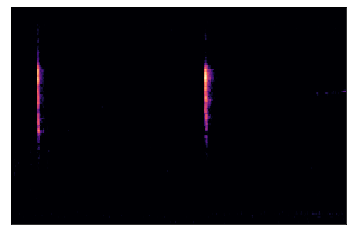

In [23]:
import librosa.display
librosa.display.specshow(train[2][:,:,0])

In [116]:
#train_mfcc = [librosa.feature.mfcc(np.reshape(i, (i.shape[0])), sr=config.sampling_rate, n_mfcc=config.n_mfcc) for i in tqdm.tqdm(train)]

In [117]:
#train_mfcc.shape

In [118]:
#train_mfcc = np.stack(train_mfcc)


In [169]:
lables

(1826,)

In [24]:
#X_train, X_test, Y_train, Y_test = train_test_split(train, lables, test_size=0.3)
X_train, X_test, Y_train, Y_test = train_test_split(train_norm, lables, test_size=0.1)


In [25]:
Y_train.shape

(19236,)

In [26]:
le = preprocessing.LabelEncoder()
le.fit(Y_train)

LabelEncoder()

In [27]:
Y_test = le.transform(Y_test)

In [28]:
Y_train = le.transform(Y_train)

In [63]:
np.save('classes.npy', le.classes_)

In [29]:
#### Transfer Learning 
#base_model = tf.keras.applications.VGG19(input_shape=(train.shape[1],train.shape[2],1),
#                                               include_top=False,
#                                               weights='imagenet')

In [67]:
tf.keras.backend.clear_session()

In [68]:
X_train.shape

(19236, 128, 431, 1)

In [30]:
x_train = [np.resize(i, (128, 431, 3)) for i in tqdm.tqdm(X_train)]

100%|██████████| 19236/19236 [00:08<00:00, 2273.48it/s]


In [31]:
x_train = np.stack(x_train)

In [32]:
x_train.shape

(19236, 128, 431, 3)

In [33]:
x_test = [np.resize(i, (128, 431, 3)) for i in tqdm.tqdm(X_test)]
x_test = np.stack(x_test)

100%|██████████| 2138/2138 [00:00<00:00, 6501.85it/s]


In [50]:

def identity_block(input_tensor, kernel_size, filters, stage, block):
    """The identity block is the block that has no conv layer at shortcut.
    # Arguments
        input_tensor: input tensor
        kernel_size: default 3, the kernel size of
            middle conv layer at main path
        filters: list of integers, the filters of 3 conv layer at main path
        stage: integer, current stage label, used for generating layer names
        block: 'a','b'..., current block label, used for generating layer names
    # Returns
        Output tensor for the block.
    """
    filters1, filters2, filters3 = filters
    #if backend.image_data_format() == 'channels_last':
    #    bn_axis = 3
    #else:
    #    bn_axis = 1
    
    bn_axis = 3
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    x = tf.keras.layers.Conv2D(filters1, (1, 1),
                      kernel_initializer='he_normal',
                      name=conv_name_base + '2a')(input_tensor)
    x = tf.keras.layers.BatchNormalization(axis=bn_axis,name=bn_name_base + '2a')(x)
    x = tf.keras.layers.Activation('relu')(x)

    x = tf.keras.layers.Conv2D(filters2, kernel_size,
                      padding='same',
                      kernel_initializer='he_normal',
                      name=conv_name_base + '2b')(x)
    x = tf.keras.layers.BatchNormalization(axis=bn_axis,name=bn_name_base + '2b')(x)
    x = tf.keras.layers.Activation('relu')(x)

    x = tf.keras.layers.Conv2D(filters3, (1, 1),
                      kernel_initializer='he_normal',
                      name=conv_name_base + '2c')(x)
    x = tf.keras.layers.BatchNormalization(axis=bn_axis,name=bn_name_base + '2c')(x)

    x = tf.keras.layers.add([x, input_tensor])
    x = tf.keras.layers.Activation('relu')(x)
    return x

In [51]:
def conv_block(input_tensor,
               kernel_size,
               filters,
               stage,
               block,
               strides=(2, 2)):
    """A block that has a conv layer at shortcut.
    # Arguments
        input_tensor: input tensor
        kernel_size: default 3, the kernel size of
            middle conv layer at main path
        filters: list of integers, the filters of 3 conv layer at main path
        stage: integer, current stage label, used for generating layer names
        block: 'a','b'..., current block label, used for generating layer names
        strides: Strides for the first conv layer in the block.
    # Returns
        Output tensor for the block.
    Note that from stage 3,
    the first conv layer at main path is with strides=(2, 2)
    And the shortcut should have strides=(2, 2) as well
    """
    filters1, filters2, filters3 = filters
    #if backend.image_data_format() == 'channels_last':
    #    bn_axis = 3
    #else:
    #    bn_axis = 1
    bn_axis = 3
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    x = tf.keras.layers.Conv2D(filters1, (1, 1), strides=strides,
                      kernel_initializer='he_normal',
                      name=conv_name_base + '2a')(input_tensor)
    x = tf.keras.layers.BatchNormalization(axis=bn_axis,name=bn_name_base + '2a')(x)
    x = tf.keras.layers.Activation('relu')(x)

    x = tf.keras.layers.Conv2D(filters2, kernel_size, padding='same',
                      kernel_initializer='he_normal',
                      name=conv_name_base + '2b')(x)
    x = tf.keras.layers.BatchNormalization(axis=bn_axis,name=bn_name_base + '2b')(x)
    x = tf.keras.layers.Activation('relu')(x)

    x = tf.keras.layers.Conv2D(filters3, (1, 1),
                      kernel_initializer='he_normal',
                      name=conv_name_base + '2c')(x)
    x = tf.keras.layers.BatchNormalization(axis=bn_axis,name=bn_name_base + '2c')(x)

    shortcut = tf.keras.layers.Conv2D(filters3, (1, 1), strides=strides,
                             kernel_initializer='he_normal',
                             name=conv_name_base + '1')(input_tensor)
    shortcut = tf.keras.layers.BatchNormalization(
        axis=bn_axis, name=bn_name_base + '1')(shortcut)

    x = tf.keras.layers.add([x, shortcut])
    x = tf.keras.layers.Activation('relu')(x)
    return x

In [57]:
def model_train(config):
    nclass = config.n_classes
    input_length = config.audio_length

    inp = tf.keras.layers.Input(shape=(input_length, 1))
    x = tf.keras.layers.Conv1D(16, 9, activation="relu", padding="valid"
                               ,kernel_regularizer=tf.keras.regularizers.l2(0.001)
                              )(inp)
    x = tf.keras.layers.Conv1D(16, 9, activation="relu", padding="valid"
                              #,kernel_regularizer=tf.keras.regularizers.l2(0.001)
                              )(x)
    x = tf.keras.layers.MaxPool1D(16)(x)
    x = tf.keras.layers.Dropout(rate=0.1)(x)
    
    #x = tf.keras.layers.Conv1D(32, 3, activation="relu", padding="valid")(x)
    #x = tf.keras.layers.Conv1D(32, 3, activation="relu", padding="valid")(x)
    #x = tf.keras.layers.MaxPool1D(4)(x)
    #x = tf.keras.layers.Dropout(rate=0.1)(x)
    
    #x = tf.keras.layers.Conv1D(32, 3, activation="relu", padding="valid")(x)
    #x = tf.keras.layers.Conv1D(32, 3, activation="relu", padding="valid")(x)
    #x = tf.keras.layers.MaxPool1D(4)(x)
    #x = tf.keras.layers.Dropout(rate=0.1)(x)
    
    #x = tf.keras.layers.Conv1D(256, 3, activation="relu", padding="valid")(x)
    #x = tf.keras.layers.Conv1D(256, 3, activation="relu", padding="valid")(x)
    x = tf.keras.layers.GlobalMaxPool1D()(x)
    x = tf.keras.layers.Dropout(rate=0.2)(x)

    x = tf.keras.layers.Dense(64, activation="relu"
                             #,kernel_regularizer=tf.keras.regularizers.l2(0.001)
                             )(x)
    x = tf.keras.layers.Dense(1028, activation="relu"
                             #,kernel_regularizer=tf.keras.regularizers.l2(0.001)
                             )(x)
    out = tf.keras.layers.Dense(nclass, activation="softmax")(x)

    model = tf.keras.Model(inputs=inp, outputs=out)
    opt = tf.keras.optimizers.Adam(learning_rate = config.learning_rate)

    model.compile(optimizer=opt, loss="sparse_categorical_crossentropy", metrics = ['accuracy'])
    
    return model

In [90]:
def model_mfcc(config, train):
    
    nclass = config.n_classes
    
    inp = tf.keras.layers.Input(shape=(train.shape[1],train.shape[2],1))
    x = tf.keras.layers.Conv2D(32, (4,10), padding="same"
                              ,kernel_regularizer=tf.keras.regularizers.l2(0.001)
                              )(inp)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation("relu")(x)
    x = tf.keras.layers.MaxPool2D()(x)    
    x = tf.keras.layers.Dropout(rate=0.5)(x)
    
    x = tf.keras.layers.Conv2D(32, (4,10), padding="same"
                              ,kernel_regularizer=tf.keras.regularizers.l2(0.001)
                              )(x)
    
    #x = tf.keras.layers.Conv2D(64, (3,2), padding="same"
    #                          ,kernel_regularizer=tf.keras.regularizers.l2(0.001)
    #                          )(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation("relu")(x)
    x = tf.keras.layers.MaxPool2D()(x)
    x = tf.keras.layers.Dropout(rate=0.5)(x)
    
    
    x = tf.keras.layers.Conv2D(32, (4,10), padding="same"
                              ,kernel_regularizer=tf.keras.regularizers.l2(0.001)
                              )(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation("relu")(x)
    x = tf.keras.layers.MaxPool2D()(x)
    x = tf.keras.layers.Dropout(rate=0.5)(x)
    
    x = tf.keras.layers.Conv2D(32, (4,10), padding="same"
                              ,kernel_regularizer=tf.keras.regularizers.l2(0.001)
                              )(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation("relu")(x)
    x = tf.keras.layers.MaxPool2D()(x)
    x = tf.keras.layers.Dropout(rate=0.5)(x)

    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(64
                             ,kernel_regularizer=tf.keras.regularizers.l2(0.001)
                             )(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation("relu")(x)
    out = tf.keras.layers.Dense(nclass, activation="softmax")(x)

    model = tf.keras.Model(inputs=inp, outputs=out)
    opt = tf.keras.optimizers.Adam(config.learning_rate)

    model.compile(optimizer=opt, loss="sparse_categorical_crossentropy", metrics=['acc'])
    return model

In [91]:
def vgg19(config, train):
    
    nclass = config.n_classes
    
    inp = tf.keras.layers.Input(shape=(train.shape[1],train.shape[2],1))
    
    x = tf.keras.layers.Conv2D(64, (3, 3),
                      activation='relu',
                      padding='same',
                      name='block1_conv1')(inp)
    x = tf.keras.layers.Conv2D(64, (3, 3),
                      activation='relu',
                      padding='same',
                      name='block1_conv2')(x)
    x = tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2), name='block1_pool')(x)

    # Block 2
    x = tf.keras.layers.Conv2D(128, (3, 3),
                      activation='relu',
                      padding='same',
                      name='block2_conv1')(x)
    x = tf.keras.layers.Conv2D(128, (3, 3),
                      activation='relu',
                      padding='same',
                      name='block2_conv2')(x)
    x = tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2), name='block2_pool')(x)

    # Block 3
    x = tf.keras.layers.Conv2D(256, (3, 3),
                      activation='relu',
                      padding='same',
                      name='block3_conv1')(x)
    x = tf.keras.layers.Conv2D(256, (3, 3),
                      activation='relu',
                      padding='same',
                      name='block3_conv2')(x)
    x = tf.keras.layers.Conv2D(256, (3, 3),
                      activation='relu',
                      padding='same',
                      name='block3_conv3')(x)
    x = tf.keras.layers.Conv2D(256, (3, 3),
                      activation='relu',
                      padding='same',
                      name='block3_conv4')(x)
    x = tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2), name='block3_pool')(x)

    # Block 4
    x = tf.keras.layers.Conv2D(512, (3, 3),
                      activation='relu',
                      padding='same',
                      name='block4_conv1')(x)
    x = tf.keras.layers.Conv2D(512, (3, 3),
                      activation='relu',
                      padding='same',
                      name='block4_conv2')(x)
    x = tf.keras.layers.Conv2D(512, (3, 3),
                      activation='relu',
                      padding='same',
                      name='block4_conv3')(x)
    x = tf.keras.layers.Conv2D(512, (3, 3),
                      activation='relu',
                      padding='same',
                      name='block4_conv4')(x)
    x = tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2), name='block4_pool')(x)

    # Block 5
    x = tf.keras.layers.Conv2D(512, (3, 3),
                      activation='relu',
                      padding='same',
                      name='block5_conv1')(x)
    x = tf.keras.layers.Conv2D(512, (3, 3),
                      activation='relu',
                      padding='same',
                      name='block5_conv2')(x)
    x = tf.keras.layers.Conv2D(512, (3, 3),
                      activation='relu',
                      padding='same',
                      name='block5_conv3')(x)
    x = tf.keras.layers.Conv2D(512, (3, 3),
                      activation='relu',
                      padding='same',
                      name='block5_conv4')(x)
    #x = tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2), name='block5_pool')(x)


    x = tf.keras.layers.Flatten(name='flatten')(x)
    x = tf.keras.layers.Dense(4096, activation='relu', name='fc1')(x)
    x = tf.keras.layers.Dense(4096, activation='relu', name='fc2')(x)
    
    out = tf.keras.layers.Dense(nclass, activation="softmax")(x)

    model = tf.keras.Model(inputs=inp, outputs=out)
    opt = tf.keras.optimizers.Adam(config.learning_rate)

    model.compile(optimizer=opt, loss="sparse_categorical_crossentropy", metrics=['acc'])
    return model

In [52]:
def resnet_model(config, train):
    nclass = config.n_classes
    
    inp = tf.keras.layers.Input(shape=(train.shape[1],train.shape[2],1))
    
    bn_axis=3
    
    x = tf.keras.layers.ZeroPadding2D(padding=(3, 3), name='conv1_pad')(inp)
    x = tf.keras.layers.Conv2D(64, (7, 7),
                      strides=(2, 2),
                      padding='valid',
                      kernel_initializer='he_normal',
                      name='conv1')(x)
    x = tf.keras.layers.BatchNormalization(axis=bn_axis,name='bn_conv1')(x)
    x = tf.keras.layers.Activation('relu')(x)
    x = tf.keras.layers.ZeroPadding2D(padding=(1, 1), name='pool1_pad')(x)
    x = tf.keras.layers.MaxPooling2D((3, 3), strides=(2, 2))(x)
    
    x = conv_block(x, 3, [64, 64, 256], stage=2, block='a', strides=(1, 1))
    x = identity_block(x, 3, [64, 64, 256], stage=2, block='b')
    x = identity_block(x, 3, [64, 64, 256], stage=2, block='c')

    x = conv_block(x, 3, [128, 128, 512], stage=3, block='a')
    x = identity_block(x, 3, [128, 128, 512], stage=3, block='b')
    x = identity_block(x, 3, [128, 128, 512], stage=3, block='c')
    x = identity_block(x, 3, [128, 128, 512], stage=3, block='d')

    x = conv_block(x, 3, [256, 256, 1024], stage=4, block='a')
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block='b')
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block='c')
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block='d')
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block='e')
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block='f')

    x = conv_block(x, 3, [512, 512, 2048], stage=5, block='a')
    x = identity_block(x, 3, [512, 512, 2048], stage=5, block='b')
    x = identity_block(x, 3, [512, 512, 2048], stage=5, block='c')
    
    x = tf.keras.layers.GlobalAveragePooling2D(name='avg_pool')(x)
    x = tf.keras.layers.Dense(nclass, activation='softmax', name='fc1000')(x)
    model = tf.keras.models.Model(inp, x, name='resnet50')
    
    opt = tf.keras.optimizers.Adam(config.learning_rate)

    model.compile(optimizer=opt, loss="sparse_categorical_crossentropy", metrics=['acc'])
    
    return(model)
    
    
    

In [41]:
def pretrained_model(config, train):
    
    nclass = config.n_classes
    
    inp = tf.keras.layers.Input(shape=(train.shape[1],train.shape[2],3))
    
    base_model = tf.keras.applications.ResNet50(
        include_top=False, weights='imagenet',input_shape=(train.shape[1],train.shape[2],3),
        pooling=None, classes=nclass
    )
    
    base_model.trainable = False
    
    x = base_model(inp)
    
    x = tf.keras.layers.GlobalAveragePooling2D(name='avg_pool')(x)
    
    x = tf.keras.layers.Dense(nclass, activation='softmax', name='fc1000')(x)
    model = tf.keras.models.Model(inp, x, name='resnet50')
    
    opt = tf.keras.optimizers.Adam(config.learning_rate)

    model.compile(optimizer=opt, loss="sparse_categorical_crossentropy", metrics=['acc'])
    
    return(model)
    

In [53]:
#model = model_train(config)
#model_mfcc = model_mfcc(config, train)
#model_mfcc = vgg19(config, train)
model_mfcc = resnet_model(config, train)
#model_mfcc = pretrained_model(config, train)


In [54]:
model_mfcc.summary()

Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 128, 431, 1) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 134, 437, 1)  0           input_7[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 64, 216, 64)  3200        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 64, 216, 64)  256         conv1[0][0]                      
___________________________________________________________________________________________

In [94]:
#tf.config.experimental.set_memory_growth(gpu, True)

In [95]:
#Y_train = Y_train.reshape((Y_train.shape[0], 1))

In [96]:
#Y_test = Y_test.reshape((Y_test.shape[0], 1))

In [97]:
np.min(Y_test)

0

In [98]:
#Y_train = tf.keras.utils.to_categorical(Y_train)
#Y_test = tf.keras.utils.to_categorical(Y_test)

In [57]:
def get_callbacks():
    return [
    #tfdocs.modeling.EpochDots(),
    tf.keras.callbacks.EarlyStopping(monitor='val_acc', patience=10)
    #tf.keras.callbacks.TensorBoard(logdir/name),
  ]

In [58]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Currently, memory growth needs to be the same across GPUs
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Memory growth must be set before GPUs have been initialized
        print(e)

1 Physical GPUs, 1 Logical GPUs


In [61]:
%%time
with tf.device('/GPU:0'):
    history = model_mfcc.fit(X_train, Y_train, 
                        batch_size = 32, 
                        epochs = 30, 
                        validation_data = (X_test, Y_test)
                        , callbacks=get_callbacks()
                            )

Train on 19236 samples, validate on 2138 samples
Epoch 1/30
19236/19236 [==============================] - 513s 27ms/sample - loss: 5.3335 - acc: 0.0177 - val_loss: 5.5228 - val_acc: 0.0267
Epoch 2/30
19236/19236 [==============================] - 507s 26ms/sample - loss: 4.7850 - acc: 0.0503 - val_loss: 4.7839 - val_acc: 0.0547
Epoch 3/30
19236/19236 [==============================] - 508s 26ms/sample - loss: 4.3679 - acc: 0.0997 - val_loss: 4.5216 - val_acc: 0.0968
Epoch 4/30
19236/19236 [==============================] - 508s 26ms/sample - loss: 4.0250 - acc: 0.1535 - val_loss: 4.0929 - val_acc: 0.1506
Epoch 5/30
19236/19236 [==============================] - 508s 26ms/sample - loss: 3.7064 - acc: 0.2076 - val_loss: 3.8606 - val_acc: 0.2021
Epoch 6/30
19236/19236 [==============================] - 508s 26ms/sample - loss: 3.3636 - acc: 0.2684 - val_loss: 3.5725 - val_acc: 0.2428
Epoch 7/30
19236/19236 [==============================] - 510s 27ms/sample - loss: 3.0504 - acc: 0.3280 -

In [66]:
model_mfcc.save('full_model_resnet_30epoch.tf') 

In [ ]:
df_train['ebird_code'].unique()

In [295]:
np.unique(Y_test, return_counts=True)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 array([24, 23, 19, 26, 29, 29, 29, 29, 34, 34, 30, 40, 26, 33, 19, 31, 23,
        15, 28, 27]))

In [296]:
np.unique(Y_train, return_counts=True)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 array([76, 60, 55, 74, 71, 71, 71, 67, 66, 56, 70, 60, 74, 67, 41, 69, 50,
        42, 65, 73]))

In [437]:
pred = model_mfcc.predict(X_test)
preds_classes = np.argmax(pred, axis=-1)
confusion_matrix(Y_test, preds_classes)


array([[ 4,  1,  1,  0,  3,  0,  0,  0,  5,  1,  4,  0,  1,  3,  0,  0,
         0,  0,  2,  0],
       [ 1,  9,  0,  2,  3,  1,  1,  0,  0,  0,  6,  0,  4,  0,  0,  0,
         0,  2,  0,  0],
       [ 0,  0, 14,  0,  2,  0,  0,  0,  2,  0,  2,  0,  1,  1,  1,  0,
         0,  0,  2,  0],
       [ 0,  0,  1,  9,  0,  0,  1,  1,  1,  1,  2,  0,  4,  1,  0,  0,
         0,  0,  1,  1],
       [ 0,  0,  3,  0, 18,  0,  1,  0,  0,  0, 10,  0,  2,  1,  0,  0,
         0,  0,  0,  0],
       [ 1,  0,  0,  0,  2, 17,  1,  0,  2,  0,  1,  0,  4,  0,  0,  0,
         0,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0, 23,  0,  1,  0,  0,  1,  3,  0,  1,  0,
         0,  0,  0,  0],
       [ 0,  0,  0,  1,  1,  1,  0, 10,  2,  0,  6,  0,  1,  0,  0,  0,
         1,  0,  2,  0],
       [ 1,  0,  3,  0,  3,  0,  0,  0, 21,  0,  0,  0,  1,  1,  0,  0,
         0,  0,  0,  1],
       [ 1,  0,  0,  0,  0,  1,  3,  0,  1,  7,  0,  2,  4,  1,  0,  0,
         0,  0,  0,  0],
       [ 0,  0,  1,  0, 11,  0

In [438]:
f1_score(Y_test, preds_classes,average = "micro")

0.4781021897810219